In [1]:
import json
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
import os
import shutil
from datetime import datetime
import tensorflow as tf
import keras

/home/rajarshi/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/rajarshi/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/rajarshi/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/rajarshi/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.

# State Data

In [2]:
api_url_data = 'https://api.covid19india.org/data.json'
r_data = requests.get(api_url_data)
data_time_series = r_data.json()

In [3]:
data_time_series.keys()

dict_keys(['cases_time_series', 'statewise', 'tested'])

In [4]:
state_data = data_time_series.get('statewise')

In [5]:
state_list = []
confirmed_list = []
recovered_list = []
deaths_list = []
lastupdatedtime_list = []

for j in range(len(state_data)):
    confirmed = state_data[j].get('confirmed')        
    recovered = state_data[j].get('recovered')
    deaths = state_data[j].get('deaths')
    state = state_data[j].get('state')
    lastupdatedtime = state_data[j].get('lastupdatedtime')
    lastupdatedtime = lastupdatedtime[:-9]
    
    if confirmed != '0':
        confirmed_list.append(confirmed)
        recovered_list.append(recovered)
        deaths_list.append(deaths)
        state_list.append(state)
        lastupdatedtime_list.append(lastupdatedtime)

In [6]:
confirmed_list = np.array(confirmed_list, dtype = int)
recovered_list = np.array(recovered_list, dtype = int)
deaths_list = np.array(deaths_list, dtype = int)

active = np.subtract(confirmed_list, np.add(recovered_list, deaths_list))
death_rate = np.divide(deaths_list, confirmed_list)*100
recovery_rate = np.divide(recovered_list, confirmed_list)*100

death_rate_list = []
recovery_rate_list = []

for s in death_rate:
    s = round(s,1)
    death_rate_list = np.append(death_rate_list, s)
for p in recovery_rate:
    p = round(p,1)
    recovery_rate_list = np.append(recovery_rate_list, p)

In [7]:
state_data = {'States':state_list[1:], 'Confirmed':confirmed_list[1:], 'Active':active[1:], 'Recovered':recovered_list[1:], 'Deaths':deaths_list[1:], 'Recovery Rate(%)':recovery_rate_list[1:], 'Death Rate(%)':death_rate_list[1:], 'Last Updated':lastupdatedtime_list[1:]}
df_state_data = pd.DataFrame(state_data)
df_state_data.to_csv('State_data.csv')
df_state_data.to_html('State_data.html', border=3, justify = 'center', index=False)
df_state_data

,States,Confirmed,Active,Recovered,Deaths,Recovery Rate(%),Death Rate(%),Last Updated
0,Maharashtra,3081,2599,295,187,9.6,6.1,15/04/2020
1,Delhi,1578,1505,41,32,2.6,2.0,14/04/2020
2,Tamil Nadu,1267,1072,180,15,14.2,1.2,15/04/2020
3,Rajasthan,1104,946,147,11,13.3,1.0,15/04/2020
4,Madhya Pradesh,1115,998,64,53,5.7,4.8,16/04/2020
5,Gujarat,871,771,64,36,7.3,4.1,15/04/2020
6,Uttar Pradesh,735,666,57,12,7.8,1.6,15/04/2020
7,Telangana,650,515,117,18,18.0,2.8,15/04/2020
8,Andhra Pradesh,534,500,20,14,3.7,2.6,16/04/2020
9,Kerala,387,167,218,2,56.3,0.5,15/04/2020


# Case Time Plot:

In [8]:
date_list = np.array(['30 January ', '31 January ', '01 February ', '02 February ',
       '03 February ', '04 February ', '05 February ', '06 February ',
       '07 February ', '08 February ', '09 February ', '10 February ',
       '11 February ', '12 February ', '13 February ', '14 February ',
       '15 February ', '16 February ', '17 February ', '18 February ',
       '19 February ', '20 February ', '21 February ', '22 February ',
       '23 February ', '24 February ', '25 February ', '26 February ',
       '27 February ', '28 February ', '29 February ', '01 March ',
       '02 March ', '03 March ', '04 March ', '05 March ', '06 March ',
       '07 March ', '08 March ', '09 March ', '10 March ', '11 March ',
       '12 March ', '13 March ', '14 March ', '15 March ', '16 March ',
       '17 March ', '18 March ', '19 March ', '20 March ', '21 March ',
       '22 March ', '23 March ', '24 March ', '25 March ', '26 March ',
       '27 March ', '28 March ', '29 March ', '30 March ', '31 March ',
       '01 April ', '02 April ', '03 April ', '04 April ', '05 April ',
       '06 April ', '07 April ', '08 April ', '09 April ', '10 April ',
       '11 April ', '12 April ', '13 April ', '14 April ', '15 April '])

totalconfirmed_list = np.array([   1,    1,    1,    2,    3,    3,    3,    3,    3,    3,    3,
          3,    3,    3,    3,    3,    3,    3,    3,    3,    3,    3,
          3,    3,    3,    3,    3,    3,    3,    3,    3,    3,    5,
          6,   28,   30,   31,   34,   39,   48,   63,   70,   82,   91,
        107,  112,  127,  146,  171,  198,  258,  334,  403,  497,  571,
        657,  730,  883, 1024, 1139, 1329, 1635, 2059, 2545, 3105, 3684,
       4289, 4778, 5351, 5916, 6725, 7598, 8446, 9211, 10453, 11487, 12370])

dailyconfirmed_list = np.array([  1,   0,   0,   1,   1,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   2,   1,  22,   2,   1,   3,   5,
         9,  15,   7,  12,   9,  16,   5,  15,  19,  25,  27,  60,  76,
        69,  94,  74,  86,  73, 153, 141, 115, 190, 306, 424, 486, 560,
       579, 605, 489, 573, 565, 809, 873, 848, 765, 1242, 1034, 883])

totalrecovered_list = np.array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   1,   1,   1,   2,   2,   2,   2,   3,   3,   3,   3,   3,
         3,   3,   3,   3,   3,   3,   3,   3,   3,   3,   3,   3,   3,
         3,   4,   4,   4,  10,  10,  13,  14,  15,  15,  20,  23,  23,
        23,  25,  40,  43,  50,  75,  85, 102, 137, 150, 169, 191, 230,
       286, 329, 394, 469, 565, 620, 774, 972, 1086, 1193, 1359, 1508])

dailyrecovered_list = np.array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,
        1,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  1,  0,  0,  6,  0,  3,  1,  1,  0,  5,  3,
        0,  0,  2, 15,  3,  7, 25, 10, 17, 35, 13, 19, 22, 39, 56, 43, 65,
       75, 96, 55, 154, 198, 114, 107, 166, 149])

totaldeceased_list = np.array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   1,   1,   2,   2,   2,   3,   3,   4,   4,   4,
         7,   9,  10,  11,  16,  19,  24,  27,  43,  49,  56,  72,  86,
        99, 121, 137, 163, 183, 226, 246, 288, 331, 358, 393, 422])

dailydeceased_list = np.array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  1,  0,  0,  1,  0,  1,  0,
        0,  3,  2,  1,  1,  5,  3,  5,  3, 16,  6,  7, 16, 14, 13, 22, 16,
       26, 20, 46, 20, 42, 43, 27, 35, 29])

In [9]:
total_confirmation_increased_today = confirmed_list[0] - totalconfirmed_list[-1]
total_recovery_increased_today = recovered_list[0] - totalrecovered_list[-1]
total_death_increased_today = deaths_list[0] - totaldeceased_list[-1]

In [10]:
total_data = {'Confirmed':str(confirmed_list[0]) + ' (+' + str(total_confirmation_increased_today) + ')', 'Active':active[0], 'Recovered':str(recovered_list[0]) + ' (+' + str(total_recovery_increased_today) + ')', 'Deaths':str(deaths_list[0]) + ' (+' + str(total_death_increased_today) + ')', 'Recovery Rate(%)':recovery_rate_list[0], 'Death Rate(%)':death_rate_list[0]}
df_total_data = pd.DataFrame(total_data, index=[0])
df_total_data.to_csv('total_data.csv')
df_total_data.to_html('total_data.html', border=7, justify = 'center', index=False)
df_total_data

,Confirmed,Active,Recovered,Deaths,Recovery Rate(%),Death Rate(%)
0,12959 (+589),10939,1592 (+84),428 (+6),12.3,3.3


In [11]:
date_list = np.append(date_list,'16 April')
dailyconfirmed_list = np.append(dailyconfirmed_list, total_confirmation_increased_today)
dailyrecovered_list = np.append(dailyrecovered_list, total_recovery_increased_today)
dailydeceased_list = np.append(dailydeceased_list, total_death_increased_today)
totalconfirmed_list = np.append(totalconfirmed_list, confirmed_list[0])
totalrecovered_list = np.append(totalrecovered_list, recovered_list[0])
totaldeceased_list = np.append(totaldeceased_list, deaths_list[0])

In [12]:
date_list_splitted = []
for i in date_list:
    date_splitted = i[0:2]
    date_list_splitted.append(date_splitted)

In [13]:
day_range = 14

daily_data = {'Date':date_list[-day_range:], 'Daily Confirmations':dailyconfirmed_list[-day_range:], 'Daily Recoveries':dailyrecovered_list[-day_range:], 'Daily Deaths':dailydeceased_list[-day_range:], 'Total Confirmations':totalconfirmed_list[-day_range:], 'Total Recoveries':totalrecovered_list[-day_range:], 'Total Deaths':totaldeceased_list[-day_range:]}
df_daily_data = pd.DataFrame(daily_data)
df_daily_data.to_csv('daily_data.csv')
df_daily_data.to_html('daily_data.html', border=3, justify = 'center', index=False)
df_daily_data

,Date,Daily Confirmations,Daily Recoveries,Daily Deaths,Total Confirmations,Total Recoveries,Total Deaths
0,03 April,560,39,14,3105,230,86
1,04 April,579,56,13,3684,286,99
2,05 April,605,43,22,4289,329,121
3,06 April,489,65,16,4778,394,137
4,07 April,573,75,26,5351,469,163
5,08 April,565,96,20,5916,565,183
6,09 April,809,55,46,6725,620,226
7,10 April,873,154,20,7598,774,246
8,11 April,848,198,42,8446,972,288
9,12 April,765,114,43,9211,1086,331


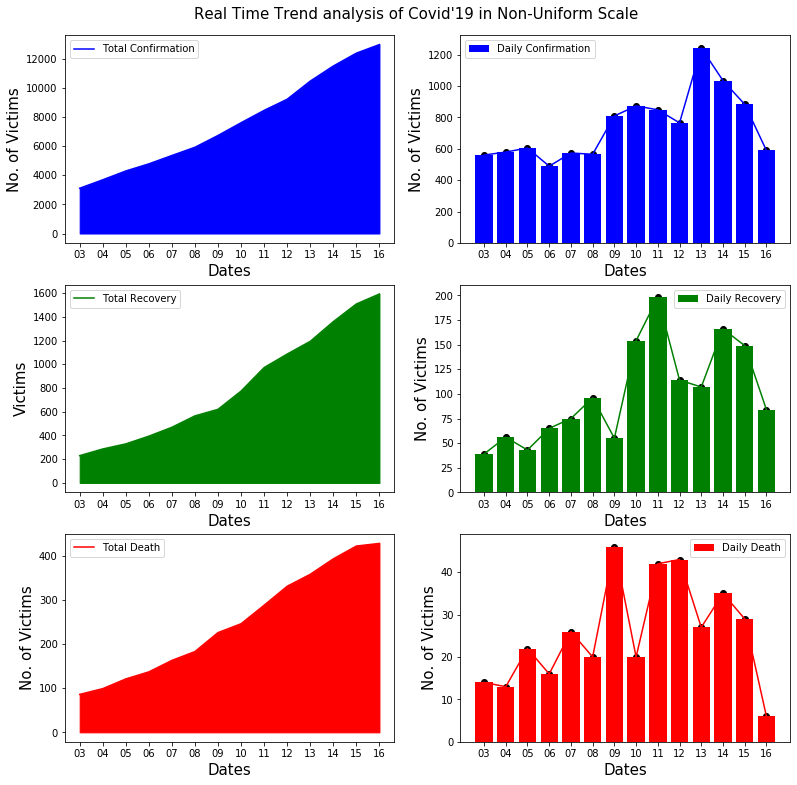

In [14]:
day_range = 14

plt.figure(figsize=(13,13))

plt.subplot(3,2,1)
plt.plot(date_list_splitted[-day_range:], totalconfirmed_list[-day_range:], color='blue', label='Total Confirmation')
# plt.scatter(date_list_splitted[-day_range:], totalconfirmed_list[-day_range:], color='black')
plt.fill_between(date_list_splitted[-day_range:], totalconfirmed_list[-day_range:], color='blue')
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.subplot(3,2,2)
plt.bar(date_list_splitted[-day_range:], dailyconfirmed_list[-day_range:], color='blue', label='Daily Confirmation')
plt.plot(date_list_splitted[-day_range:], dailyconfirmed_list[-day_range:], color='blue')
plt.scatter(date_list_splitted[-day_range:], dailyconfirmed_list[-day_range:], color='black')
# plt.fill_between(date_list[-day_range:], dailyconfirmed_list[-day_range:], color='blue')
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.subplot(3,2,3)
plt.plot(date_list_splitted[-day_range:], totalrecovered_list[-day_range:], color='green', label='Total Recovery')
# plt.scatter(date_list_splitted[-day_range:], totalrecovered_list[-day_range:], color='black')
plt.fill_between(date_list_splitted[-day_range:], totalrecovered_list[-day_range:], color='green')
plt.xlabel('Dates', fontsize=15)
plt.ylabel('Victims', fontsize=15)
plt.legend()

plt.subplot(3,2,4)
plt.bar(date_list_splitted[-day_range:], dailyrecovered_list[-day_range:], color='green', label='Daily Recovery')
plt.plot(date_list_splitted[-day_range:], dailyrecovered_list[-day_range:], color='green')
plt.scatter(date_list_splitted[-day_range:], dailyrecovered_list[-day_range:], color='black')
# plt.fill_between(date_list[-day_range:], dailyrecovered_list[-day_range:], color='green')
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.subplot(3,2,5)
plt.plot(date_list_splitted[-day_range:], totaldeceased_list[-day_range:], color='red', label='Total Death')
# plt.scatter(date_list_splitted[-day_range:], totaldeceased_list[-day_range:], color='black')
plt.fill_between(date_list_splitted[-day_range:], totaldeceased_list[-day_range:], color='red')
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.subplot(3,2,6)
plt.bar(date_list_splitted[-day_range:], dailydeceased_list[-day_range:], color='red', label='Daily Death')
plt.plot(date_list_splitted[-day_range:], dailydeceased_list[-day_range:], color='red')
plt.scatter(date_list_splitted[-day_range:], dailydeceased_list[-day_range:], color='black')
# plt.fill_between(date_list[-day_range:], dailydeceased_list[-day_range:], color='black')
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.suptitle("Real Time Trend analysis of Covid'19 in Non-Uniform Scale", fontsize=15, x=0.5,y=0.91)
plt.savefig('plot1.png')

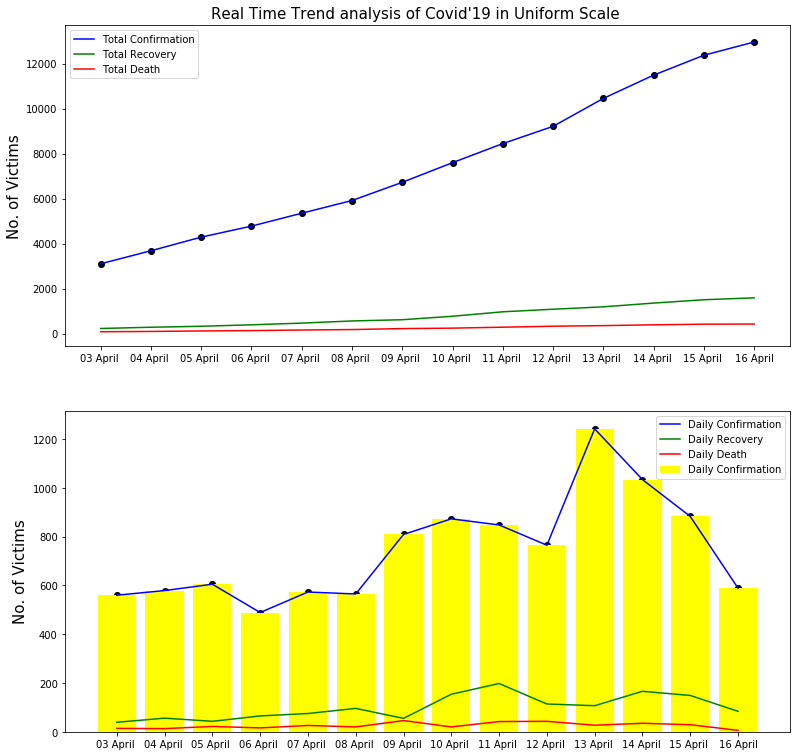

In [15]:
day_range = 14

plt.figure(figsize=(13,13))

plt.subplot(2,1,1)
plt.plot(date_list[-day_range:], totalconfirmed_list[-day_range:], color='blue', label='Total Confirmation')
plt.scatter(date_list[-day_range:], totalconfirmed_list[-day_range:], color='black')
plt.plot(date_list[-day_range:], totalrecovered_list[-day_range:], color='green', label='Total Recovery')
plt.plot(date_list[-day_range:], totaldeceased_list[-day_range:], color='red', label='Total Death')
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.subplot(2,1,2)
plt.bar(date_list[-day_range:], dailyconfirmed_list[-day_range:], color='yellow', label='Daily Confirmation')
plt.plot(date_list[-day_range:], dailyconfirmed_list[-day_range:], color='blue', label='Daily Confirmation')
plt.scatter(date_list[-day_range:], dailyconfirmed_list[-day_range:], color='black')
plt.plot(date_list[-day_range:], dailyrecovered_list[-day_range:], color='green', label='Daily Recovery')
plt.plot(date_list[-day_range:], dailydeceased_list[-day_range:], color='red', label='Daily Death')
plt.ylabel('No. of Victims', fontsize=15)
plt.legend()

plt.suptitle("Real Time Trend analysis of Covid'19 in Uniform Scale", fontsize=15, x=0.5,y=0.9)
plt.savefig('plot2.png')

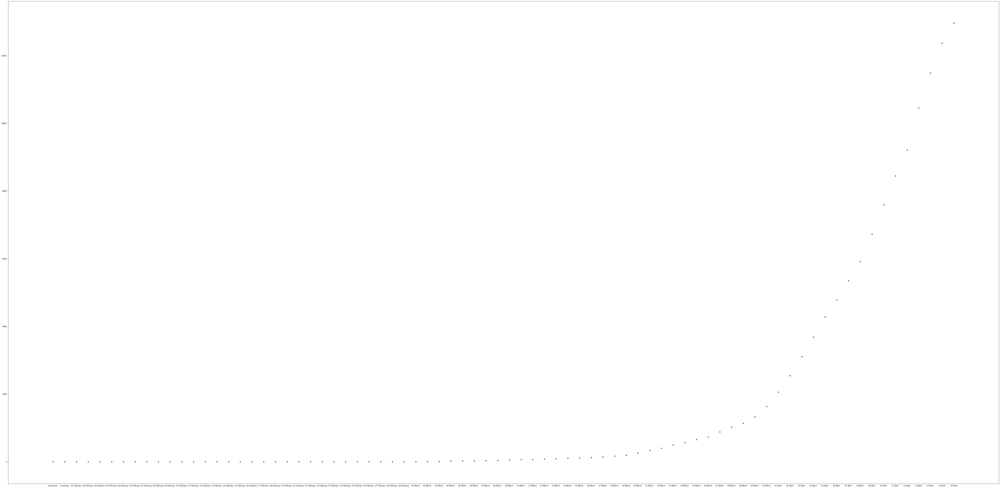

In [16]:
plt.figure(figsize=(100,50))
plt.scatter(date_list, totalconfirmed_list)

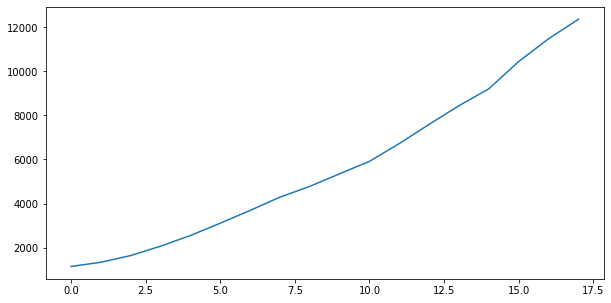

In [17]:
plt.figure(figsize=(10,5))
plt.plot(totalconfirmed_list[59:-1])

In [18]:
X = totalconfirmed_list[59:-1]
X

array([ 1139,  1329,  1635,  2059,  2545,  3105,  3684,  4289,  4778,
        5351,  5916,  6725,  7598,  8446,  9211, 10453, 11487, 12370])

In [19]:
len(X)

18

In [20]:
pred_list = []

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Epoch 1/10000
      8/Unknown - 0s 17ms/step - loss: 253055889.0000
Epoch 00001: loss improved from inf to 253055889.00000, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 28ms/step - loss: 253055889.0000
Epoch 2/10000
1/8 [==>...........................] - ETA: 0s - loss: 129690304.0000
Epoch 00002: loss improved from 253055889.00000 to 195161107.50000, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 195161107.5000
Epoch 3/10000
1/8 [==>...........................] - ETA: 0s - loss: 379723744.0000
Epoch 00003: loss improved from 195161107.50000 to 174350749.00000, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 3ms/step - loss: 174350749.0000
Epoch 4/10000
1/8 [==>...........................] - ETA: 0s - loss: 79901328.0000
Epoch 00004: loss improved from 174350749.0

1/8 [==>...........................] - ETA: 0s - loss: 282651.2188
Epoch 00032: loss did not improve from 192081.40454
8/8 [==============================] - 0s 1ms/step - loss: 228480.3726
Epoch 33/10000
1/8 [==>...........................] - ETA: 0s - loss: 171151.2812
Epoch 00033: loss did not improve from 192081.40454
8/8 [==============================] - 0s 2ms/step - loss: 219118.7508
Epoch 34/10000
1/8 [==>...........................] - ETA: 0s - loss: 19004.3125
Epoch 00034: loss improved from 192081.40454 to 191706.13578, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 191706.1358
Epoch 35/10000
1/8 [==>...........................] - ETA: 0s - loss: 51416.2656
Epoch 00035: loss improved from 191706.13578 to 191486.15015, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 191486.1502
Epoch 36/10000
1/8 [==>...........................] - ETA: 0s - loss: 81024.4844
Epoch 00036: loss did not 

1/8 [==>...........................] - ETA: 0s - loss: 399820.1875
Epoch 00071: loss did not improve from 190041.45306
8/8 [==============================] - 0s 2ms/step - loss: 190464.8064
Epoch 72/10000
1/8 [==>...........................] - ETA: 0s - loss: 165005.5312
Epoch 00072: loss did not improve from 190041.45306
8/8 [==============================] - 0s 1ms/step - loss: 202372.1433
Epoch 73/10000
1/8 [==>...........................] - ETA: 0s - loss: 112675.5547
Epoch 00073: loss did not improve from 190041.45306
8/8 [==============================] - 0s 2ms/step - loss: 193878.7490
Epoch 74/10000
1/8 [==>...........................] - ETA: 0s - loss: 238822.5000
Epoch 00074: loss improved from 190041.45306 to 188671.94400, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 188671.9440
Epoch 75/10000
1/8 [==>...........................] - ETA: 0s - loss: 236295.3594
Epoch 00075: loss did not improve from 188671.94400
8/8 [===========

Epoch 110/10000
1/8 [==>...........................] - ETA: 0s - loss: 16354.9863
Epoch 00110: loss did not improve from 187235.93384
8/8 [==============================] - 0s 2ms/step - loss: 196472.2073
Epoch 111/10000
1/8 [==>...........................] - ETA: 0s - loss: 82913.7812
Epoch 00111: loss did not improve from 187235.93384
8/8 [==============================] - 0s 1ms/step - loss: 223486.8254
Epoch 112/10000
1/8 [==>...........................] - ETA: 0s - loss: 19883.6797
Epoch 00112: loss did not improve from 187235.93384
8/8 [==============================] - 0s 2ms/step - loss: 187368.9717
Epoch 113/10000
1/8 [==>...........................] - ETA: 0s - loss: 56424.3203
Epoch 00113: loss did not improve from 187235.93384
8/8 [==============================] - 0s 1ms/step - loss: 208480.9705
Epoch 114/10000
1/8 [==>...........................] - ETA: 0s - loss: 50543.9375
Epoch 00114: loss did not improve from 187235.93384
8/8 [==============================] - 0s 3ms/

1/8 [==>...........................] - ETA: 0s - loss: 88967.5469
Epoch 00148: loss did not improve from 182087.93217
8/8 [==============================] - 0s 2ms/step - loss: 183981.8085
Epoch 149/10000
1/8 [==>...........................] - ETA: 0s - loss: 291113.0625
Epoch 00149: loss did not improve from 182087.93217
8/8 [==============================] - 0s 2ms/step - loss: 183797.5154
Epoch 150/10000
1/8 [==>...........................] - ETA: 0s - loss: 3888.7781
Epoch 00150: loss did not improve from 182087.93217
8/8 [==============================] - 0s 1ms/step - loss: 209940.8482
Epoch 151/10000
1/8 [==>...........................] - ETA: 0s - loss: 144574.6875
Epoch 00151: loss did not improve from 182087.93217
8/8 [==============================] - 0s 2ms/step - loss: 207764.3076
Epoch 152/10000
1/8 [==>...........................] - ETA: 0s - loss: 233944.8125
Epoch 00152: loss did not improve from 182087.93217
8/8 [==============================] - 0s 2ms/step - loss: 1

1/8 [==>...........................] - ETA: 0s - loss: 471305.5625
Epoch 00187: loss did not improve from 178346.66980
8/8 [==============================] - 0s 2ms/step - loss: 180323.2800
Epoch 188/10000
1/8 [==>...........................] - ETA: 0s - loss: 490181.0938
Epoch 00188: loss did not improve from 178346.66980
8/8 [==============================] - 0s 2ms/step - loss: 179342.7817
Epoch 189/10000
1/8 [==>...........................] - ETA: 0s - loss: 71888.8359
Epoch 00189: loss did not improve from 178346.66980
8/8 [==============================] - 0s 2ms/step - loss: 179651.7764
Epoch 190/10000
1/8 [==>...........................] - ETA: 0s - loss: 272613.4062
Epoch 00190: loss did not improve from 178346.66980
8/8 [==============================] - 0s 1ms/step - loss: 188749.6157
Epoch 191/10000
1/8 [==>...........................] - ETA: 0s - loss: 297180.0938
Epoch 00191: loss did not improve from 178346.66980
8/8 [==============================] - 0s 2ms/step - loss:

8/8 [==============================] - 0s 4ms/step - loss: 173012.2795
Epoch 226/10000
1/8 [==>...........................] - ETA: 0s - loss: 238894.5625
Epoch 00226: loss did not improve from 173012.27954
8/8 [==============================] - 0s 1ms/step - loss: 177123.0900
Epoch 227/10000
1/8 [==>...........................] - ETA: 0s - loss: 309425.8125
Epoch 00227: loss did not improve from 173012.27954
8/8 [==============================] - 0s 2ms/step - loss: 193030.5389
Epoch 228/10000
1/8 [==>...........................] - ETA: 0s - loss: 68242.5938
Epoch 00228: loss did not improve from 173012.27954
8/8 [==============================] - 0s 1ms/step - loss: 209065.0225
Epoch 229/10000
1/8 [==>...........................] - ETA: 0s - loss: 87080.3594
Epoch 00229: loss did not improve from 173012.27954
8/8 [==============================] - 0s 2ms/step - loss: 175293.6506
Epoch 230/10000
1/8 [==>...........................] - ETA: 0s - loss: 350838.8125
Epoch 00230: loss did no

8/8 [==============================] - 0s 5ms/step - loss: 165768.6050
Epoch 265/10000
1/8 [==>...........................] - ETA: 0s - loss: 269395.4375
Epoch 00265: loss did not improve from 165768.60503
8/8 [==============================] - 0s 2ms/step - loss: 166347.5669
Epoch 266/10000
1/8 [==>...........................] - ETA: 0s - loss: 415043.4688
Epoch 00266: loss did not improve from 165768.60503
8/8 [==============================] - 0s 2ms/step - loss: 166263.7280
Epoch 267/10000
1/8 [==>...........................] - ETA: 0s - loss: 38472.5938
Epoch 00267: loss did not improve from 165768.60503
8/8 [==============================] - 0s 2ms/step - loss: 192892.5269
Epoch 268/10000
1/8 [==>...........................] - ETA: 0s - loss: 109515.8047
Epoch 00268: loss did not improve from 165768.60503
8/8 [==============================] - 0s 2ms/step - loss: 198404.9194
Epoch 269/10000
1/8 [==>...........................] - ETA: 0s - loss: 207458.7500
Epoch 00269: loss did n

Epoch 303/10000
1/8 [==>...........................] - ETA: 0s - loss: 213462.6250
Epoch 00303: loss did not improve from 159468.69156
8/8 [==============================] - 0s 2ms/step - loss: 163227.2772
Epoch 304/10000
1/8 [==>...........................] - ETA: 0s - loss: 44240.0039
Epoch 00304: loss did not improve from 159468.69156
8/8 [==============================] - 0s 1ms/step - loss: 188474.4272
Epoch 305/10000
1/8 [==>...........................] - ETA: 0s - loss: 291911.0000
Epoch 00305: loss did not improve from 159468.69156
8/8 [==============================] - 0s 2ms/step - loss: 160008.2626
Epoch 306/10000
1/8 [==>...........................] - ETA: 0s - loss: 187149.7188
Epoch 00306: loss improved from 159468.69156 to 159088.68408, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 159088.6841
Epoch 307/10000
1/8 [==>...........................] - ETA: 0s - loss: 190045.1875
Epoch 00307: loss did not improve from 159088.684

Epoch 342/10000
1/8 [==>...........................] - ETA: 0s - loss: 48197.3203
Epoch 00342: loss did not improve from 153361.14709
8/8 [==============================] - 0s 2ms/step - loss: 160084.0762
Epoch 343/10000
1/8 [==>...........................] - ETA: 0s - loss: 29875.2695
Epoch 00343: loss did not improve from 153361.14709
8/8 [==============================] - 0s 2ms/step - loss: 165319.7200
Epoch 344/10000
1/8 [==>...........................] - ETA: 0s - loss: 258067.0312
Epoch 00344: loss did not improve from 153361.14709
8/8 [==============================] - 0s 2ms/step - loss: 156107.5796
Epoch 345/10000
1/8 [==>...........................] - ETA: 0s - loss: 19998.5586
Epoch 00345: loss improved from 153361.14709 to 153214.28369, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 153214.2837
Epoch 346/10000
1/8 [==>...........................] - ETA: 0s - loss: 22125.1172
Epoch 00346: loss improved from 153214.28369 to 1531

Epoch 380/10000
1/8 [==>...........................] - ETA: 0s - loss: 266274.9375
Epoch 00380: loss did not improve from 143913.83154
8/8 [==============================] - 0s 2ms/step - loss: 145354.4467
Epoch 381/10000
1/8 [==>...........................] - ETA: 0s - loss: 11449.9893
Epoch 00381: loss did not improve from 143913.83154
8/8 [==============================] - 0s 2ms/step - loss: 179883.3619
Epoch 382/10000
1/8 [==>...........................] - ETA: 0s - loss: 475468.9375
Epoch 00382: loss did not improve from 143913.83154
8/8 [==============================] - 0s 2ms/step - loss: 151255.7283
Epoch 383/10000
1/8 [==>...........................] - ETA: 0s - loss: 12970.8574
Epoch 00383: loss did not improve from 143913.83154
8/8 [==============================] - 0s 2ms/step - loss: 164777.8346
Epoch 384/10000
1/8 [==>...........................] - ETA: 0s - loss: 244053.8750
Epoch 00384: loss did not improve from 143913.83154
8/8 [==============================] - 0s 2

Epoch 419/10000
1/8 [==>...........................] - ETA: 0s - loss: 194208.6250
Epoch 00419: loss did not improve from 137208.40771
8/8 [==============================] - 0s 1ms/step - loss: 141026.3368
Epoch 420/10000
1/8 [==>...........................] - ETA: 0s - loss: 395658.6250
Epoch 00420: loss improved from 137208.40771 to 137061.46814, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 137061.4681
Epoch 421/10000
1/8 [==>...........................] - ETA: 0s - loss: 40204.2695
Epoch 00421: loss did not improve from 137061.46814
8/8 [==============================] - 0s 2ms/step - loss: 144336.4659
Epoch 422/10000
1/8 [==>...........................] - ETA: 0s - loss: 326129.6250
Epoch 00422: loss did not improve from 137061.46814
8/8 [==============================] - 0s 2ms/step - loss: 145200.2247
Epoch 423/10000
1/8 [==>...........................] - ETA: 0s - loss: 57829.0117
Epoch 00423: loss did not improve from 137061.4681

1/8 [==>...........................] - ETA: 0s - loss: 207789.1250
Epoch 00457: loss did not improve from 129305.57324
8/8 [==============================] - 0s 2ms/step - loss: 143024.5291
Epoch 458/10000
1/8 [==>...........................] - ETA: 0s - loss: 319011.9688
Epoch 00458: loss did not improve from 129305.57324
8/8 [==============================] - 0s 2ms/step - loss: 133416.6191
Epoch 459/10000
1/8 [==>...........................] - ETA: 0s - loss: 142408.8438
Epoch 00459: loss did not improve from 129305.57324
8/8 [==============================] - 0s 2ms/step - loss: 148372.3862
Epoch 460/10000
1/8 [==>...........................] - ETA: 0s - loss: 380534.0000
Epoch 00460: loss did not improve from 129305.57324
8/8 [==============================] - 0s 2ms/step - loss: 139692.5193
Epoch 461/10000
1/8 [==>...........................] - ETA: 0s - loss: 82022.9375
Epoch 00461: loss improved from 129305.57324 to 129125.61353, saving model to best_model_lstm.h5
8/8 [========

1/8 [==>...........................] - ETA: 0s - loss: 180840.4844
Epoch 00495: loss did not improve from 120348.48663
8/8 [==============================] - 0s 2ms/step - loss: 130491.7158
Epoch 496/10000
1/8 [==>...........................] - ETA: 0s - loss: 39496.1953
Epoch 00496: loss did not improve from 120348.48663
8/8 [==============================] - 0s 2ms/step - loss: 159815.7039
Epoch 497/10000
1/8 [==>...........................] - ETA: 0s - loss: 57020.6016
Epoch 00497: loss did not improve from 120348.48663
8/8 [==============================] - 0s 2ms/step - loss: 138351.0591
Epoch 498/10000
1/8 [==>...........................] - ETA: 0s - loss: 35295.0195
Epoch 00498: loss did not improve from 120348.48663
8/8 [==============================] - 0s 2ms/step - loss: 140824.5234
Epoch 499/10000
1/8 [==>...........................] - ETA: 0s - loss: 9081.5791
Epoch 00499: loss improved from 120348.48663 to 118193.65002, saving model to best_model_lstm.h5
8/8 [============

Epoch 534/10000
1/8 [==>...........................] - ETA: 0s - loss: 9240.5469
Epoch 00534: loss did not improve from 109021.95135
8/8 [==============================] - 0s 2ms/step - loss: 113192.8997
Epoch 535/10000
1/8 [==>...........................] - ETA: 0s - loss: 85027.9844
Epoch 00535: loss did not improve from 109021.95135
8/8 [==============================] - 0s 2ms/step - loss: 145539.3165
Epoch 536/10000
1/8 [==>...........................] - ETA: 0s - loss: 116907.9609
Epoch 00536: loss improved from 109021.95135 to 105466.35004, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 105466.3500
Epoch 537/10000
1/8 [==>...........................] - ETA: 0s - loss: 141687.7656
Epoch 00537: loss did not improve from 105466.35004
8/8 [==============================] - 0s 2ms/step - loss: 139684.9456
Epoch 538/10000
1/8 [==>...........................] - ETA: 0s - loss: 140565.3750
Epoch 00538: loss did not improve from 105466.35004

1/8 [==>...........................] - ETA: 0s - loss: 124639.6406
Epoch 00573: loss did not improve from 98684.89893
8/8 [==============================] - 0s 1ms/step - loss: 112278.0754
Epoch 574/10000
1/8 [==>...........................] - ETA: 0s - loss: 159042.1875
Epoch 00574: loss did not improve from 98684.89893
8/8 [==============================] - 0s 2ms/step - loss: 110750.4486
Epoch 575/10000
1/8 [==>...........................] - ETA: 0s - loss: 28389.3008
Epoch 00575: loss did not improve from 98684.89893
8/8 [==============================] - 0s 2ms/step - loss: 118423.7954
Epoch 576/10000
1/8 [==>...........................] - ETA: 0s - loss: 67635.1406
Epoch 00576: loss did not improve from 98684.89893
8/8 [==============================] - 0s 2ms/step - loss: 118592.0983
Epoch 577/10000
1/8 [==>...........................] - ETA: 0s - loss: 52463.9883
Epoch 00577: loss did not improve from 98684.89893
8/8 [==============================] - 0s 2ms/step - loss: 104874

8/8 [==============================] - 0s 4ms/step - loss: 90538.1514
Epoch 613/10000
1/8 [==>...........................] - ETA: 0s - loss: 29113.9062
Epoch 00613: loss did not improve from 90538.15137
8/8 [==============================] - 0s 2ms/step - loss: 94625.6345
Epoch 614/10000
1/8 [==>...........................] - ETA: 0s - loss: 19653.9668
Epoch 00614: loss did not improve from 90538.15137
8/8 [==============================] - 0s 2ms/step - loss: 105624.5592
Epoch 615/10000
1/8 [==>...........................] - ETA: 0s - loss: 165832.8438
Epoch 00615: loss did not improve from 90538.15137
8/8 [==============================] - 0s 2ms/step - loss: 97265.1881
Epoch 616/10000
1/8 [==>...........................] - ETA: 0s - loss: 215460.3438
Epoch 00616: loss did not improve from 90538.15137
8/8 [==============================] - 0s 2ms/step - loss: 107590.4943
Epoch 617/10000
1/8 [==>...........................] - ETA: 0s - loss: 55300.1836
Epoch 00617: loss did not improv

Epoch 653/10000
1/8 [==>...........................] - ETA: 0s - loss: 16262.6875
Epoch 00653: loss did not improve from 82074.16418
8/8 [==============================] - 0s 2ms/step - loss: 91573.0404
Epoch 654/10000
1/8 [==>...........................] - ETA: 0s - loss: 82262.4375
Epoch 00654: loss did not improve from 82074.16418
8/8 [==============================] - 0s 2ms/step - loss: 84229.4426
Epoch 655/10000
1/8 [==>...........................] - ETA: 0s - loss: 87720.6797
Epoch 00655: loss did not improve from 82074.16418
8/8 [==============================] - 0s 2ms/step - loss: 94830.7260
Epoch 656/10000
1/8 [==>...........................] - ETA: 0s - loss: 4768.6572
Epoch 00656: loss did not improve from 82074.16418
8/8 [==============================] - 0s 2ms/step - loss: 84742.5244
Epoch 657/10000
1/8 [==>...........................] - ETA: 0s - loss: 74853.4062
Epoch 00657: loss did not improve from 82074.16418
8/8 [==============================] - 0s 2ms/step - los

Epoch 693/10000
1/8 [==>...........................] - ETA: 0s - loss: 15505.4707
Epoch 00693: loss did not improve from 75979.44759
8/8 [==============================] - 0s 2ms/step - loss: 80155.3539
Epoch 694/10000
1/8 [==>...........................] - ETA: 0s - loss: 56983.8633
Epoch 00694: loss did not improve from 75979.44759
8/8 [==============================] - 0s 2ms/step - loss: 90982.8120
Epoch 695/10000
1/8 [==>...........................] - ETA: 0s - loss: 57622.8008
Epoch 00695: loss did not improve from 75979.44759
8/8 [==============================] - 0s 2ms/step - loss: 78019.6079
Epoch 696/10000
1/8 [==>...........................] - ETA: 0s - loss: 214419.4062
Epoch 00696: loss did not improve from 75979.44759
8/8 [==============================] - 0s 2ms/step - loss: 88944.5732
Epoch 697/10000
1/8 [==>...........................] - ETA: 0s - loss: 4795.7202
Epoch 00697: loss did not improve from 75979.44759
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 103812.6562
Epoch 00732: loss did not improve from 69050.33551
8/8 [==============================] - 0s 2ms/step - loss: 98087.8324
Epoch 733/10000
1/8 [==>...........................] - ETA: 0s - loss: 94893.7969
Epoch 00733: loss improved from 69050.33551 to 63111.92078, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 63111.9208
Epoch 734/10000
1/8 [==>...........................] - ETA: 0s - loss: 120695.0938
Epoch 00734: loss did not improve from 63111.92078
8/8 [==============================] - 0s 2ms/step - loss: 75623.4077
Epoch 735/10000
1/8 [==>...........................] - ETA: 0s - loss: 4962.4780
Epoch 00735: loss did not improve from 63111.92078
8/8 [==============================] - 0s 2ms/step - loss: 79026.9977
Epoch 736/10000
1/8 [==>...........................] - ETA: 0s - loss: 157009.3125
Epoch 00736: loss did not improve from 63111.92078
8/8 [====================

Epoch 772/10000
1/8 [==>...........................] - ETA: 0s - loss: 59334.7969
Epoch 00772: loss did not improve from 61714.62406
8/8 [==============================] - 0s 2ms/step - loss: 86191.7003
Epoch 773/10000
1/8 [==>...........................] - ETA: 0s - loss: 109310.4453
Epoch 00773: loss did not improve from 61714.62406
8/8 [==============================] - 0s 2ms/step - loss: 76432.1582
Epoch 774/10000
1/8 [==>...........................] - ETA: 0s - loss: 59634.0195
Epoch 00774: loss did not improve from 61714.62406
8/8 [==============================] - 0s 2ms/step - loss: 61815.6083
Epoch 775/10000
1/8 [==>...........................] - ETA: 0s - loss: 63959.8203
Epoch 00775: loss did not improve from 61714.62406
8/8 [==============================] - 0s 2ms/step - loss: 71441.5210
Epoch 776/10000
1/8 [==>...........................] - ETA: 0s - loss: 83894.4688
Epoch 00776: loss did not improve from 61714.62406
8/8 [==============================] - 0s 2ms/step - l

Epoch 812/10000
1/8 [==>...........................] - ETA: 0s - loss: 115968.1406
Epoch 00812: loss did not improve from 56066.31107
8/8 [==============================] - 0s 2ms/step - loss: 65500.3650
Epoch 813/10000
1/8 [==>...........................] - ETA: 0s - loss: 119246.1094
Epoch 00813: loss improved from 56066.31107 to 55729.05371, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 55729.0537
Epoch 814/10000
1/8 [==>...........................] - ETA: 0s - loss: 41744.9258
Epoch 00814: loss did not improve from 55729.05371
8/8 [==============================] - 0s 2ms/step - loss: 56647.8105
Epoch 815/10000
1/8 [==>...........................] - ETA: 0s - loss: 50514.7109
Epoch 00815: loss improved from 55729.05371 to 54356.29468, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 54356.2947
Epoch 816/10000
1/8 [==>...........................] - ETA: 0s - loss: 57399.0547
Epoch 00816: los

Epoch 852/10000
1/8 [==>...........................] - ETA: 0s - loss: 2422.8743
Epoch 00852: loss did not improve from 47687.03748
8/8 [==============================] - 0s 2ms/step - loss: 64830.9197
Epoch 853/10000
1/8 [==>...........................] - ETA: 0s - loss: 60207.1914
Epoch 00853: loss did not improve from 47687.03748
8/8 [==============================] - 0s 1ms/step - loss: 65757.4297
Epoch 854/10000
1/8 [==>...........................] - ETA: 0s - loss: 87864.7109
Epoch 00854: loss did not improve from 47687.03748
8/8 [==============================] - 0s 1ms/step - loss: 57151.0854
Epoch 855/10000
1/8 [==>...........................] - ETA: 0s - loss: 71973.6875
Epoch 00855: loss did not improve from 47687.03748
8/8 [==============================] - 0s 2ms/step - loss: 66850.1648
Epoch 856/10000
1/8 [==>...........................] - ETA: 0s - loss: 49830.5898
Epoch 00856: loss did not improve from 47687.03748
8/8 [==============================] - 0s 2ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 3296.2949
Epoch 00892: loss did not improve from 43180.31360
8/8 [==============================] - 0s 2ms/step - loss: 58956.8501
Epoch 893/10000
1/8 [==>...........................] - ETA: 0s - loss: 79377.3594
Epoch 00893: loss did not improve from 43180.31360
8/8 [==============================] - 0s 2ms/step - loss: 52818.5192
Epoch 894/10000
1/8 [==>...........................] - ETA: 0s - loss: 48562.1797
Epoch 00894: loss did not improve from 43180.31360
8/8 [==============================] - 0s 2ms/step - loss: 57104.7322
Epoch 895/10000
1/8 [==>...........................] - ETA: 0s - loss: 32471.1094
Epoch 00895: loss did not improve from 43180.31360
8/8 [==============================] - 0s 2ms/step - loss: 60881.9358
Epoch 896/10000
1/8 [==>...........................] - ETA: 0s - loss: 73120.9688
Epoch 00896: loss did not improve from 43180.31360
8/8 [==============================] - 0s 1ms/step - loss: 58728.9686
Ep

1/8 [==>...........................] - ETA: 0s - loss: 34512.8594
Epoch 00932: loss did not improve from 35679.68945
8/8 [==============================] - 0s 2ms/step - loss: 60529.7029
Epoch 933/10000
1/8 [==>...........................] - ETA: 0s - loss: 67861.3516
Epoch 00933: loss did not improve from 35679.68945
8/8 [==============================] - 0s 1ms/step - loss: 43325.7864
Epoch 934/10000
1/8 [==>...........................] - ETA: 0s - loss: 103648.5312
Epoch 00934: loss did not improve from 35679.68945
8/8 [==============================] - 0s 1ms/step - loss: 43764.1191
Epoch 935/10000
1/8 [==>...........................] - ETA: 0s - loss: 5435.6553
Epoch 00935: loss did not improve from 35679.68945
8/8 [==============================] - 0s 2ms/step - loss: 45781.0011
Epoch 936/10000
1/8 [==>...........................] - ETA: 0s - loss: 52513.7695
Epoch 00936: loss did not improve from 35679.68945
8/8 [==============================] - 0s 2ms/step - loss: 50566.0522
E

1/8 [==>...........................] - ETA: 0s - loss: 8725.6016
Epoch 00972: loss did not improve from 34250.97083
8/8 [==============================] - 0s 2ms/step - loss: 46632.9487
Epoch 973/10000
1/8 [==>...........................] - ETA: 0s - loss: 90352.7812
Epoch 00973: loss did not improve from 34250.97083
8/8 [==============================] - 0s 2ms/step - loss: 35217.6850
Epoch 974/10000
1/8 [==>...........................] - ETA: 0s - loss: 1747.3909
Epoch 00974: loss did not improve from 34250.97083
8/8 [==============================] - 0s 2ms/step - loss: 40913.5571
Epoch 975/10000
1/8 [==>...........................] - ETA: 0s - loss: 50992.0391
Epoch 00975: loss did not improve from 34250.97083
8/8 [==============================] - 0s 2ms/step - loss: 45578.8028
Epoch 976/10000
1/8 [==>...........................] - ETA: 0s - loss: 51282.2305
Epoch 00976: loss did not improve from 34250.97083
8/8 [==============================] - 0s 2ms/step - loss: 51400.8600
Epo

1/8 [==>...........................] - ETA: 0s - loss: 63933.5234
Epoch 01012: loss did not improve from 33465.96509
8/8 [==============================] - 0s 2ms/step - loss: 37588.1274
Epoch 1013/10000
1/8 [==>...........................] - ETA: 0s - loss: 28157.7676
Epoch 01013: loss did not improve from 33465.96509
8/8 [==============================] - 0s 1ms/step - loss: 46184.1305
Epoch 1014/10000
1/8 [==>...........................] - ETA: 0s - loss: 50575.8789
Epoch 01014: loss did not improve from 33465.96509
8/8 [==============================] - 0s 2ms/step - loss: 42040.1430
Epoch 1015/10000
1/8 [==>...........................] - ETA: 0s - loss: 23515.5801
Epoch 01015: loss did not improve from 33465.96509
8/8 [==============================] - 0s 2ms/step - loss: 41007.6000
Epoch 1016/10000
1/8 [==>...........................] - ETA: 0s - loss: 36469.5156
Epoch 01016: loss did not improve from 33465.96509
8/8 [==============================] - 0s 2ms/step - loss: 37977.60

1/8 [==>...........................] - ETA: 0s - loss: 49923.9922
Epoch 01052: loss did not improve from 31526.79748
8/8 [==============================] - 0s 2ms/step - loss: 40010.2737
Epoch 1053/10000
1/8 [==>...........................] - ETA: 0s - loss: 48144.3359
Epoch 01053: loss did not improve from 31526.79748
8/8 [==============================] - 0s 2ms/step - loss: 35658.5000
Epoch 1054/10000
1/8 [==>...........................] - ETA: 0s - loss: 61338.8320
Epoch 01054: loss did not improve from 31526.79748
8/8 [==============================] - 0s 2ms/step - loss: 37406.4718
Epoch 1055/10000
1/8 [==>...........................] - ETA: 0s - loss: 9821.5752
Epoch 01055: loss did not improve from 31526.79748
8/8 [==============================] - 0s 2ms/step - loss: 32637.4503
Epoch 1056/10000
1/8 [==>...........................] - ETA: 0s - loss: 42812.2422
Epoch 01056: loss did not improve from 31526.79748
8/8 [==============================] - 0s 2ms/step - loss: 45738.018

1/8 [==>...........................] - ETA: 0s - loss: 933.8499
Epoch 01092: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 35152.6701
Epoch 1093/10000
1/8 [==>...........................] - ETA: 0s - loss: 36895.8633
Epoch 01093: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 30646.8761
Epoch 1094/10000
1/8 [==>...........................] - ETA: 0s - loss: 18915.7285
Epoch 01094: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 52982.1799
Epoch 1095/10000
1/8 [==>...........................] - ETA: 0s - loss: 13539.1191
Epoch 01095: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 49404.4869
Epoch 1096/10000
1/8 [==>...........................] - ETA: 0s - loss: 54828.4609
Epoch 01096: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 34203.2190

1/8 [==>...........................] - ETA: 0s - loss: 43908.5703
Epoch 01132: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 53737.3530
Epoch 1133/10000
1/8 [==>...........................] - ETA: 0s - loss: 34645.2031
Epoch 01133: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 64287.1532
Epoch 1134/10000
1/8 [==>...........................] - ETA: 0s - loss: 9995.4189
Epoch 01134: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 40196.5636
Epoch 1135/10000
1/8 [==>...........................] - ETA: 0s - loss: 97744.4375
Epoch 01135: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 33160.9020
Epoch 1136/10000
1/8 [==>...........................] - ETA: 0s - loss: 55308.1992
Epoch 01136: loss did not improve from 24067.37886
8/8 [==============================] - 0s 1ms/step - loss: 33725.274

1/8 [==>...........................] - ETA: 0s - loss: 65435.3672
Epoch 01172: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 94444.1611
Epoch 1173/10000
1/8 [==>...........................] - ETA: 0s - loss: 56370.8828
Epoch 01173: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 33013.7209
Epoch 1174/10000
1/8 [==>...........................] - ETA: 0s - loss: 10582.3691
Epoch 01174: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 42611.8532
Epoch 1175/10000
1/8 [==>...........................] - ETA: 0s - loss: 23140.5352
Epoch 01175: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 50213.6897
Epoch 1176/10000
1/8 [==>...........................] - ETA: 0s - loss: 8521.0635
Epoch 01176: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 37552.730

1/8 [==>...........................] - ETA: 0s - loss: 14502.2051
Epoch 01212: loss did not improve from 24067.37886
8/8 [==============================] - 0s 1ms/step - loss: 41609.5238
Epoch 1213/10000
1/8 [==>...........................] - ETA: 0s - loss: 19698.5898
Epoch 01213: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 37268.1573
Epoch 1214/10000
1/8 [==>...........................] - ETA: 0s - loss: 36470.8242
Epoch 01214: loss did not improve from 24067.37886
8/8 [==============================] - 0s 1ms/step - loss: 43444.6350
Epoch 1215/10000
1/8 [==>...........................] - ETA: 0s - loss: 9920.4639
Epoch 01215: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 53164.0837
Epoch 1216/10000
1/8 [==>...........................] - ETA: 0s - loss: 82065.5078
Epoch 01216: loss did not improve from 24067.37886
8/8 [==============================] - 0s 2ms/step - loss: 51867.445

1/8 [==>...........................] - ETA: 0s - loss: 29238.9609
Epoch 01252: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 32032.6156
Epoch 1253/10000
1/8 [==>...........................] - ETA: 0s - loss: 20784.8164
Epoch 01253: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 43137.0463
Epoch 1254/10000
1/8 [==>...........................] - ETA: 0s - loss: 37290.0469
Epoch 01254: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 67077.2869
Epoch 1255/10000
1/8 [==>...........................] - ETA: 0s - loss: 16727.7793
Epoch 01255: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 102543.6050
Epoch 1256/10000
1/8 [==>...........................] - ETA: 0s - loss: 14119.3242
Epoch 01256: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 53452.7

1/8 [==>...........................] - ETA: 0s - loss: 32330.5723
Epoch 01292: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 30604.3756
Epoch 1293/10000
1/8 [==>...........................] - ETA: 0s - loss: 1534.5753
Epoch 01293: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29628.2036
Epoch 1294/10000
1/8 [==>...........................] - ETA: 0s - loss: 99019.7734
Epoch 01294: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 44319.6690
Epoch 1295/10000
1/8 [==>...........................] - ETA: 0s - loss: 5719.0581
Epoch 01295: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 34606.7551
Epoch 1296/10000
1/8 [==>...........................] - ETA: 0s - loss: 3055.2026
Epoch 01296: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 33203.3720


1/8 [==>...........................] - ETA: 0s - loss: 19312.3379
Epoch 01332: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 36846.9860
Epoch 1333/10000
1/8 [==>...........................] - ETA: 0s - loss: 82218.9453
Epoch 01333: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 30731.8829
Epoch 1334/10000
1/8 [==>...........................] - ETA: 0s - loss: 97057.3203
Epoch 01334: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 42072.2060
Epoch 1335/10000
1/8 [==>...........................] - ETA: 0s - loss: 70.0062
Epoch 01335: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 27526.0946
Epoch 1336/10000
1/8 [==>...........................] - ETA: 0s - loss: 11615.7021
Epoch 01336: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 29615.4324


1/8 [==>...........................] - ETA: 0s - loss: 7352.4297
Epoch 01372: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 24924.3090
Epoch 1373/10000
1/8 [==>...........................] - ETA: 0s - loss: 1407.5321
Epoch 01373: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 36439.9336
Epoch 1374/10000
1/8 [==>...........................] - ETA: 0s - loss: 12168.3662
Epoch 01374: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 51910.8697
Epoch 1375/10000
1/8 [==>...........................] - ETA: 0s - loss: 15865.4736
Epoch 01375: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 79753.4692
Epoch 1376/10000
1/8 [==>...........................] - ETA: 0s - loss: 4946.8545
Epoch 01376: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 64611.8859


1/8 [==>...........................] - ETA: 0s - loss: 11312.0488
Epoch 01412: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29559.6864
Epoch 1413/10000
1/8 [==>...........................] - ETA: 0s - loss: 54409.8359
Epoch 01413: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 36333.9423
Epoch 1414/10000
1/8 [==>...........................] - ETA: 0s - loss: 13136.9053
Epoch 01414: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 32456.3432
Epoch 1415/10000
1/8 [==>...........................] - ETA: 0s - loss: 99722.7266
Epoch 01415: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 34503.7723
Epoch 1416/10000
1/8 [==>...........................] - ETA: 0s - loss: 19997.4512
Epoch 01416: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 40961.57

1/8 [==>...........................] - ETA: 0s - loss: 18805.8594
Epoch 01452: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 42647.0817
Epoch 1453/10000
1/8 [==>...........................] - ETA: 0s - loss: 9172.5498
Epoch 01453: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 27408.8413
Epoch 1454/10000
1/8 [==>...........................] - ETA: 0s - loss: 41155.7148
Epoch 01454: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 69055.0093
Epoch 1455/10000
1/8 [==>...........................] - ETA: 0s - loss: 18564.8027
Epoch 01455: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 80185.8876
Epoch 1456/10000
1/8 [==>...........................] - ETA: 0s - loss: 22669.2441
Epoch 01456: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 39156.054

1/8 [==>...........................] - ETA: 0s - loss: 14040.8096
Epoch 01492: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 30157.1318
Epoch 1493/10000
1/8 [==>...........................] - ETA: 0s - loss: 10485.5742
Epoch 01493: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 26701.4026
Epoch 1494/10000
1/8 [==>...........................] - ETA: 0s - loss: 40548.5664
Epoch 01494: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 41115.6674
Epoch 1495/10000
1/8 [==>...........................] - ETA: 0s - loss: 9548.4609
Epoch 01495: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 29484.7401
Epoch 1496/10000
1/8 [==>...........................] - ETA: 0s - loss: 48169.2852
Epoch 01496: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 28790.810

1/8 [==>...........................] - ETA: 0s - loss: 68267.9141
Epoch 01532: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 29331.1684
Epoch 1533/10000
1/8 [==>...........................] - ETA: 0s - loss: 29274.9688
Epoch 01533: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 30315.8581
Epoch 1534/10000
1/8 [==>...........................] - ETA: 0s - loss: 96515.8281
Epoch 01534: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 28777.6600
Epoch 1535/10000
1/8 [==>...........................] - ETA: 0s - loss: 1748.5946
Epoch 01535: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 34324.6797
Epoch 1536/10000
1/8 [==>...........................] - ETA: 0s - loss: 11898.9785
Epoch 01536: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 24792.980

1/8 [==>...........................] - ETA: 0s - loss: 67877.0703
Epoch 01572: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 33217.2568
Epoch 1573/10000
1/8 [==>...........................] - ETA: 0s - loss: 127402.1953
Epoch 01573: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 68368.0671
Epoch 1574/10000
1/8 [==>...........................] - ETA: 0s - loss: 99426.1094
Epoch 01574: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 83594.1183
Epoch 1575/10000
1/8 [==>...........................] - ETA: 0s - loss: 42579.4336
Epoch 01575: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 42294.3793
Epoch 1576/10000
1/8 [==>...........................] - ETA: 0s - loss: 14663.4375
Epoch 01576: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29961.3

1/8 [==>...........................] - ETA: 0s - loss: 55293.0664
Epoch 01612: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29446.8787
Epoch 1613/10000
1/8 [==>...........................] - ETA: 0s - loss: 17716.1895
Epoch 01613: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 38731.6314
Epoch 1614/10000
1/8 [==>...........................] - ETA: 0s - loss: 11690.8848
Epoch 01614: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 29863.7907
Epoch 1615/10000
1/8 [==>...........................] - ETA: 0s - loss: 25500.7383
Epoch 01615: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29137.0684
Epoch 1616/10000
1/8 [==>...........................] - ETA: 0s - loss: 86429.4688
Epoch 01616: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29984.40

1/8 [==>...........................] - ETA: 0s - loss: 20425.5723
Epoch 01652: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 41335.6898
Epoch 1653/10000
1/8 [==>...........................] - ETA: 0s - loss: 22994.8125
Epoch 01653: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 36820.4298
Epoch 1654/10000
1/8 [==>...........................] - ETA: 0s - loss: 8291.5576
Epoch 01654: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 36383.2319
Epoch 1655/10000
1/8 [==>...........................] - ETA: 0s - loss: 20706.3320
Epoch 01655: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 27797.7858
Epoch 1656/10000
1/8 [==>...........................] - ETA: 0s - loss: 15331.4082
Epoch 01656: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 26339.260

1/8 [==>...........................] - ETA: 0s - loss: 16754.3379
Epoch 01692: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 25033.5506
Epoch 1693/10000
1/8 [==>...........................] - ETA: 0s - loss: 6944.2549
Epoch 01693: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 60018.0764
Epoch 1694/10000
1/8 [==>...........................] - ETA: 0s - loss: 43024.2930
Epoch 01694: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 20144.5873
Epoch 1695/10000
1/8 [==>...........................] - ETA: 0s - loss: 53079.9414
Epoch 01695: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 44211.9927
Epoch 1696/10000
1/8 [==>...........................] - ETA: 0s - loss: 2299.3047
Epoch 01696: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 27746.2737

1/8 [==>...........................] - ETA: 0s - loss: 110207.9766
Epoch 01732: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 26010.4048
Epoch 1733/10000
1/8 [==>...........................] - ETA: 0s - loss: 124366.4609
Epoch 01733: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 45862.7460
Epoch 1734/10000
1/8 [==>...........................] - ETA: 0s - loss: 107957.7656
Epoch 01734: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 50852.0204
Epoch 1735/10000
1/8 [==>...........................] - ETA: 0s - loss: 32040.9961
Epoch 01735: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 25122.8485
Epoch 1736/10000
1/8 [==>...........................] - ETA: 0s - loss: 9941.1152
Epoch 01736: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 41664.

1/8 [==>...........................] - ETA: 0s - loss: 62296.2500
Epoch 01772: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 28012.5062
Epoch 1773/10000
1/8 [==>...........................] - ETA: 0s - loss: 5663.4360
Epoch 01773: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 30374.1200
Epoch 1774/10000
1/8 [==>...........................] - ETA: 0s - loss: 72620.5469
Epoch 01774: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 28660.9600
Epoch 1775/10000
1/8 [==>...........................] - ETA: 0s - loss: 3832.7178
Epoch 01775: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 27082.0178
Epoch 1776/10000
1/8 [==>...........................] - ETA: 0s - loss: 18085.0488
Epoch 01776: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 39301.9897

1/8 [==>...........................] - ETA: 0s - loss: 12379.7324
Epoch 01812: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29423.9571
Epoch 1813/10000
1/8 [==>...........................] - ETA: 0s - loss: 323.3521
Epoch 01813: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 30429.4986
Epoch 1814/10000
1/8 [==>...........................] - ETA: 0s - loss: 6990.7754
Epoch 01814: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 25528.2641
Epoch 1815/10000
1/8 [==>...........................] - ETA: 0s - loss: 12287.6846
Epoch 01815: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 38187.0598
Epoch 1816/10000
1/8 [==>...........................] - ETA: 0s - loss: 2585.2278
Epoch 01816: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 25113.7746
E

1/8 [==>...........................] - ETA: 0s - loss: 25512.9551
Epoch 01852: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 28613.6341
Epoch 1853/10000
1/8 [==>...........................] - ETA: 0s - loss: 7425.7061
Epoch 01853: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 26071.7995
Epoch 1854/10000
1/8 [==>...........................] - ETA: 0s - loss: 7709.7598
Epoch 01854: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 38041.1567
Epoch 1855/10000
1/8 [==>...........................] - ETA: 0s - loss: 67.1191
Epoch 01855: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 33040.6165
Epoch 1856/10000
1/8 [==>...........................] - ETA: 0s - loss: 83770.1016
Epoch 01856: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 74935.2970
Ep

1/8 [==>...........................] - ETA: 0s - loss: 9546.3916
Epoch 01892: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 38558.6299
Epoch 1893/10000
1/8 [==>...........................] - ETA: 0s - loss: 114775.0312
Epoch 01893: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 59730.1418
Epoch 1894/10000
1/8 [==>...........................] - ETA: 0s - loss: 2816.1045
Epoch 01894: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 24673.0869
Epoch 1895/10000
1/8 [==>...........................] - ETA: 0s - loss: 3652.6362
Epoch 01895: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 41701.4495
Epoch 1896/10000
1/8 [==>...........................] - ETA: 0s - loss: 119181.0938
Epoch 01896: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 33211.425

1/8 [==>...........................] - ETA: 0s - loss: 9475.1631
Epoch 01932: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 25804.9650
Epoch 1933/10000
1/8 [==>...........................] - ETA: 0s - loss: 53159.2969
Epoch 01933: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 29898.7874
Epoch 1934/10000
1/8 [==>...........................] - ETA: 0s - loss: 94810.7266
Epoch 01934: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 26357.8101
Epoch 1935/10000
1/8 [==>...........................] - ETA: 0s - loss: 1689.7522
Epoch 01935: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 47746.3364
Epoch 1936/10000
1/8 [==>...........................] - ETA: 0s - loss: 7491.9834
Epoch 01936: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 59039.3518


1/8 [==>...........................] - ETA: 0s - loss: 700.2218
Epoch 01972: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 77805.5943
Epoch 1973/10000
1/8 [==>...........................] - ETA: 0s - loss: 133508.5469
Epoch 01973: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 43971.4820
Epoch 1974/10000
1/8 [==>...........................] - ETA: 0s - loss: 71959.0156
Epoch 01974: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 38719.4921
Epoch 1975/10000
1/8 [==>...........................] - ETA: 0s - loss: 13376.7520
Epoch 01975: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 36874.2346
Epoch 1976/10000
1/8 [==>...........................] - ETA: 0s - loss: 13180.5811
Epoch 01976: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 32745.473

1/8 [==>...........................] - ETA: 0s - loss: 9399.8984
Epoch 02012: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 37497.0405
Epoch 2013/10000
1/8 [==>...........................] - ETA: 0s - loss: 153318.1562
Epoch 02013: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 31938.0009
Epoch 2014/10000
1/8 [==>...........................] - ETA: 0s - loss: 91243.2031
Epoch 02014: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 28963.4233
Epoch 2015/10000
1/8 [==>...........................] - ETA: 0s - loss: 56959.9609
Epoch 02015: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 27615.5977
Epoch 2016/10000
1/8 [==>...........................] - ETA: 0s - loss: 13339.8574
Epoch 02016: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 25356.83

1/8 [==>...........................] - ETA: 0s - loss: 11615.8066
Epoch 02052: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 25523.2986
Epoch 2053/10000
1/8 [==>...........................] - ETA: 0s - loss: 61241.4883
Epoch 02053: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 44853.7929
Epoch 2054/10000
1/8 [==>...........................] - ETA: 0s - loss: 2402.4810
Epoch 02054: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 32478.4018
Epoch 2055/10000
1/8 [==>...........................] - ETA: 0s - loss: 14857.9814
Epoch 02055: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 21932.8242
Epoch 2056/10000
1/8 [==>...........................] - ETA: 0s - loss: 6695.1938
Epoch 02056: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 44428.2509

1/8 [==>...........................] - ETA: 0s - loss: 3490.5737
Epoch 02092: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 38368.6933
Epoch 2093/10000
1/8 [==>...........................] - ETA: 0s - loss: 18037.3867
Epoch 02093: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 51064.2890
Epoch 2094/10000
1/8 [==>...........................] - ETA: 0s - loss: 20477.4102
Epoch 02094: loss did not improve from 17509.24762
8/8 [==============================] - 0s 1ms/step - loss: 80717.0039
Epoch 2095/10000
1/8 [==>...........................] - ETA: 0s - loss: 11508.3223
Epoch 02095: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 26439.3745
Epoch 2096/10000
1/8 [==>...........................] - ETA: 0s - loss: 54678.4258
Epoch 02096: loss did not improve from 17509.24762
8/8 [==============================] - 0s 2ms/step - loss: 49526.574

1/8 [==>...........................] - ETA: 0s - loss: 15616.9727
Epoch 02132: loss did not improve from 16271.14011
8/8 [==============================] - 0s 1ms/step - loss: 55829.8376
Epoch 2133/10000
1/8 [==>...........................] - ETA: 0s - loss: 33273.0234
Epoch 02133: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 53190.0590
Epoch 2134/10000
1/8 [==>...........................] - ETA: 0s - loss: 3630.8657
Epoch 02134: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 33638.8057
Epoch 2135/10000
1/8 [==>...........................] - ETA: 0s - loss: 25005.7031
Epoch 02135: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 36178.5427
Epoch 2136/10000
1/8 [==>...........................] - ETA: 0s - loss: 738.7192
Epoch 02136: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 34512.4576


1/8 [==>...........................] - ETA: 0s - loss: 314.0302
Epoch 02172: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 94174.2221
Epoch 2173/10000
1/8 [==>...........................] - ETA: 0s - loss: 21210.0781
Epoch 02173: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 77243.8599
Epoch 2174/10000
1/8 [==>...........................] - ETA: 0s - loss: 13018.8330
Epoch 02174: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 34560.4119
Epoch 2175/10000
1/8 [==>...........................] - ETA: 0s - loss: 108992.8359
Epoch 02175: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 60546.2951
Epoch 2176/10000
1/8 [==>...........................] - ETA: 0s - loss: 9093.6953
Epoch 02176: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 55631.2584

1/8 [==>...........................] - ETA: 0s - loss: 20150.1426
Epoch 02212: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 32353.3324
Epoch 2213/10000
1/8 [==>...........................] - ETA: 0s - loss: 2465.6228
Epoch 02213: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 28882.5808
Epoch 2214/10000
1/8 [==>...........................] - ETA: 0s - loss: 7790.4155
Epoch 02214: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 34251.9374
Epoch 2215/10000
1/8 [==>...........................] - ETA: 0s - loss: 8061.0425
Epoch 02215: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 33174.9744
Epoch 2216/10000
1/8 [==>...........................] - ETA: 0s - loss: 97812.3750
Epoch 02216: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 45985.8770


1/8 [==>...........................] - ETA: 0s - loss: 661.8590
Epoch 02252: loss did not improve from 16271.14011
8/8 [==============================] - 0s 1ms/step - loss: 22868.1885
Epoch 2253/10000
1/8 [==>...........................] - ETA: 0s - loss: 4044.0823
Epoch 02253: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 35689.4254
Epoch 2254/10000
1/8 [==>...........................] - ETA: 0s - loss: 33376.7656
Epoch 02254: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 33773.3856
Epoch 2255/10000
1/8 [==>...........................] - ETA: 0s - loss: 68045.5938
Epoch 02255: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 26993.2418
Epoch 2256/10000
1/8 [==>...........................] - ETA: 0s - loss: 71202.0469
Epoch 02256: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 26423.8817


1/8 [==>...........................] - ETA: 0s - loss: 11852.4502
Epoch 02292: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 38961.7265
Epoch 2293/10000
1/8 [==>...........................] - ETA: 0s - loss: 5284.6670
Epoch 02293: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 29218.3439
Epoch 2294/10000
1/8 [==>...........................] - ETA: 0s - loss: 3697.8096
Epoch 02294: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 25011.2621
Epoch 2295/10000
1/8 [==>...........................] - ETA: 0s - loss: 10031.1133
Epoch 02295: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 31137.6308
Epoch 2296/10000
1/8 [==>...........................] - ETA: 0s - loss: 7843.6270
Epoch 02296: loss did not improve from 16271.14011
8/8 [==============================] - 0s 1ms/step - loss: 23492.2049


1/8 [==>...........................] - ETA: 0s - loss: 54845.3320
Epoch 02332: loss did not improve from 16271.14011
8/8 [==============================] - 0s 1ms/step - loss: 43481.6516
Epoch 2333/10000
1/8 [==>...........................] - ETA: 0s - loss: 35587.3438
Epoch 02333: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 19255.4641
Epoch 2334/10000
1/8 [==>...........................] - ETA: 0s - loss: 54253.5820
Epoch 02334: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 36384.1596
Epoch 2335/10000
1/8 [==>...........................] - ETA: 0s - loss: 7456.0596
Epoch 02335: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 31367.2000
Epoch 2336/10000
1/8 [==>...........................] - ETA: 0s - loss: 27612.2832
Epoch 02336: loss did not improve from 16271.14011
8/8 [==============================] - 0s 1ms/step - loss: 25055.118

1/8 [==>...........................] - ETA: 0s - loss: 3499.4480
Epoch 02372: loss did not improve from 16271.14011
8/8 [==============================] - 0s 1ms/step - loss: 38802.0560
Epoch 2373/10000
1/8 [==>...........................] - ETA: 0s - loss: 15148.3096
Epoch 02373: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 41584.9098
Epoch 2374/10000
1/8 [==>...........................] - ETA: 0s - loss: 126351.0547
Epoch 02374: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 46392.7142
Epoch 2375/10000
1/8 [==>...........................] - ETA: 0s - loss: 67245.6406
Epoch 02375: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 44726.9579
Epoch 2376/10000
1/8 [==>...........................] - ETA: 0s - loss: 26125.4355
Epoch 02376: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 33272.15

1/8 [==>...........................] - ETA: 0s - loss: 938.9355
Epoch 02412: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 23723.7918
Epoch 2413/10000
1/8 [==>...........................] - ETA: 0s - loss: 15424.8672
Epoch 02413: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 27831.1919
Epoch 2414/10000
1/8 [==>...........................] - ETA: 0s - loss: 12994.7646
Epoch 02414: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 36472.6760
Epoch 2415/10000
1/8 [==>...........................] - ETA: 0s - loss: 6861.2847
Epoch 02415: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 24687.1706
Epoch 2416/10000
1/8 [==>...........................] - ETA: 0s - loss: 5572.8623
Epoch 02416: loss did not improve from 16271.14011
8/8 [==============================] - 0s 2ms/step - loss: 26169.4399
E

1/8 [==>...........................] - ETA: 0s - loss: 9193.5254
Epoch 02452: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 42813.5562
Epoch 2453/10000
1/8 [==>...........................] - ETA: 0s - loss: 7294.0713
Epoch 02453: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 23947.8870
Epoch 2454/10000
1/8 [==>...........................] - ETA: 0s - loss: 98102.0391
Epoch 02454: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30432.7095
Epoch 2455/10000
1/8 [==>...........................] - ETA: 0s - loss: 13288.2852
Epoch 02455: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24775.9643
Epoch 2456/10000
1/8 [==>...........................] - ETA: 0s - loss: 27266.7031
Epoch 02456: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25295.1821

1/8 [==>...........................] - ETA: 0s - loss: 17199.4844
Epoch 02492: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24755.6285
Epoch 2493/10000
1/8 [==>...........................] - ETA: 0s - loss: 58586.3789
Epoch 02493: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28000.1044
Epoch 2494/10000
1/8 [==>...........................] - ETA: 0s - loss: 153.6649
Epoch 02494: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 31852.3060
Epoch 2495/10000
1/8 [==>...........................] - ETA: 0s - loss: 63740.6680
Epoch 02495: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30994.7347
Epoch 2496/10000
1/8 [==>...........................] - ETA: 0s - loss: 2145.3755
Epoch 02496: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30123.8550


1/8 [==>...........................] - ETA: 0s - loss: 29400.7559
Epoch 02532: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 37665.4317
Epoch 2533/10000
1/8 [==>...........................] - ETA: 0s - loss: 15901.0273
Epoch 02533: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 55950.1873
Epoch 2534/10000
1/8 [==>...........................] - ETA: 0s - loss: 5174.8916
Epoch 02534: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26278.2523
Epoch 2535/10000
1/8 [==>...........................] - ETA: 0s - loss: 6966.2852
Epoch 02535: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 44591.6699
Epoch 2536/10000
1/8 [==>...........................] - ETA: 0s - loss: 14112.3105
Epoch 02536: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 66924.3562

1/8 [==>...........................] - ETA: 0s - loss: 12177.7715
Epoch 02572: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26818.1624
Epoch 2573/10000
1/8 [==>...........................] - ETA: 0s - loss: 71003.1328
Epoch 02573: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25862.1131
Epoch 2574/10000
1/8 [==>...........................] - ETA: 0s - loss: 85324.6719
Epoch 02574: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27315.6781
Epoch 2575/10000
1/8 [==>...........................] - ETA: 0s - loss: 11247.0781
Epoch 02575: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31978.6027
Epoch 2576/10000
1/8 [==>...........................] - ETA: 0s - loss: 1230.3698
Epoch 02576: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 29062.017

1/8 [==>...........................] - ETA: 0s - loss: 3287.3289
Epoch 02612: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31765.4932
Epoch 2613/10000
1/8 [==>...........................] - ETA: 0s - loss: 7410.2627
Epoch 02613: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 32088.2639
Epoch 2614/10000
1/8 [==>...........................] - ETA: 0s - loss: 8744.2988
Epoch 02614: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27309.1039
Epoch 2615/10000
1/8 [==>...........................] - ETA: 0s - loss: 16973.6758
Epoch 02615: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28969.2756
Epoch 2616/10000
1/8 [==>...........................] - ETA: 0s - loss: 41186.5273
Epoch 02616: loss did not improve from 15453.23698
8/8 [==============================] - 0s 3ms/step - loss: 25920.2554


1/8 [==>...........................] - ETA: 0s - loss: 58223.8125
Epoch 02652: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24506.9068
Epoch 2653/10000
1/8 [==>...........................] - ETA: 0s - loss: 10034.4932
Epoch 02653: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31659.8926
Epoch 2654/10000
1/8 [==>...........................] - ETA: 0s - loss: 119733.5078
Epoch 02654: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 36089.3694
Epoch 2655/10000
1/8 [==>...........................] - ETA: 0s - loss: 6952.5107
Epoch 02655: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26835.9876
Epoch 2656/10000
1/8 [==>...........................] - ETA: 0s - loss: 13965.8193
Epoch 02656: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 27148.25

1/8 [==>...........................] - ETA: 0s - loss: 20671.1777
Epoch 02692: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27950.0134
Epoch 2693/10000
1/8 [==>...........................] - ETA: 0s - loss: 85446.4141
Epoch 02693: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27093.8798
Epoch 2694/10000
1/8 [==>...........................] - ETA: 0s - loss: 19746.1484
Epoch 02694: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30591.0372
Epoch 2695/10000
1/8 [==>...........................] - ETA: 0s - loss: 185.3071
Epoch 02695: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27775.0279
Epoch 2696/10000
1/8 [==>...........................] - ETA: 0s - loss: 70317.9219
Epoch 02696: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27207.6631

1/8 [==>...........................] - ETA: 0s - loss: 7525.7124
Epoch 02732: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25601.0948
Epoch 2733/10000
1/8 [==>...........................] - ETA: 0s - loss: 16525.1836
Epoch 02733: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33698.3948
Epoch 2734/10000
1/8 [==>...........................] - ETA: 0s - loss: 248.5926
Epoch 02734: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28017.4401
Epoch 2735/10000
1/8 [==>...........................] - ETA: 0s - loss: 3164.0088
Epoch 02735: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26513.2836
Epoch 2736/10000
1/8 [==>...........................] - ETA: 0s - loss: 19403.7930
Epoch 02736: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 32770.6279
E

1/8 [==>...........................] - ETA: 0s - loss: 50178.0039
Epoch 02772: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 44584.5893
Epoch 2773/10000
1/8 [==>...........................] - ETA: 0s - loss: 1833.9016
Epoch 02773: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 42320.2633
Epoch 2774/10000
1/8 [==>...........................] - ETA: 0s - loss: 118646.8906
Epoch 02774: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 64676.2979
Epoch 2775/10000
1/8 [==>...........................] - ETA: 0s - loss: 66437.9219
Epoch 02775: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 20882.3271
Epoch 2776/10000
1/8 [==>...........................] - ETA: 0s - loss: 143069.9844
Epoch 02776: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33485.0

1/8 [==>...........................] - ETA: 0s - loss: 6244.9468
Epoch 02812: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 39137.8166
Epoch 2813/10000
1/8 [==>...........................] - ETA: 0s - loss: 41215.3398
Epoch 02813: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28462.2351
Epoch 2814/10000
1/8 [==>...........................] - ETA: 0s - loss: 7242.9512
Epoch 02814: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31407.4651
Epoch 2815/10000
1/8 [==>...........................] - ETA: 0s - loss: 8439.8936
Epoch 02815: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35336.3789
Epoch 2816/10000
1/8 [==>...........................] - ETA: 0s - loss: 13943.1416
Epoch 02816: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 54378.6797


1/8 [==>...........................] - ETA: 0s - loss: 997.2284
Epoch 02852: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31489.8028
Epoch 2853/10000
1/8 [==>...........................] - ETA: 0s - loss: 28544.3672
Epoch 02853: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 39730.2525
Epoch 2854/10000
1/8 [==>...........................] - ETA: 0s - loss: 92117.4531
Epoch 02854: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 87791.4733
Epoch 2855/10000
1/8 [==>...........................] - ETA: 0s - loss: 111729.7188
Epoch 02855: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 77902.9824
Epoch 2856/10000
1/8 [==>...........................] - ETA: 0s - loss: 18554.9863
Epoch 02856: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 44881.624

1/8 [==>...........................] - ETA: 0s - loss: 102849.2109
Epoch 02892: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30441.7384
Epoch 2893/10000
1/8 [==>...........................] - ETA: 0s - loss: 1895.9180
Epoch 02893: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25696.6411
Epoch 2894/10000
1/8 [==>...........................] - ETA: 0s - loss: 11873.0557
Epoch 02894: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28142.7923
Epoch 2895/10000
1/8 [==>...........................] - ETA: 0s - loss: 6825.4487
Epoch 02895: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 28787.2148
Epoch 2896/10000
1/8 [==>...........................] - ETA: 0s - loss: 14399.8652
Epoch 02896: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 25429.394

1/8 [==>...........................] - ETA: 0s - loss: 44.0465
Epoch 02932: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 29123.0985
Epoch 2933/10000
1/8 [==>...........................] - ETA: 0s - loss: 1480.8624
Epoch 02933: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25204.6588
Epoch 2934/10000
1/8 [==>...........................] - ETA: 0s - loss: 45205.5156
Epoch 02934: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31762.3181
Epoch 2935/10000
1/8 [==>...........................] - ETA: 0s - loss: 55660.7344
Epoch 02935: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 22864.7047
Epoch 2936/10000
1/8 [==>...........................] - ETA: 0s - loss: 13985.2920
Epoch 02936: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27630.4728
E

1/8 [==>...........................] - ETA: 0s - loss: 151005.2344
Epoch 02972: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35393.8998
Epoch 2973/10000
1/8 [==>...........................] - ETA: 0s - loss: 9569.7402
Epoch 02973: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 23860.5974
Epoch 2974/10000
1/8 [==>...........................] - ETA: 0s - loss: 14333.0977
Epoch 02974: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25286.5031
Epoch 2975/10000
1/8 [==>...........................] - ETA: 0s - loss: 12264.8184
Epoch 02975: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31377.7223
Epoch 2976/10000
1/8 [==>...........................] - ETA: 0s - loss: 27877.8223
Epoch 02976: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 40656.19

1/8 [==>...........................] - ETA: 0s - loss: 9763.6123
Epoch 03012: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 29941.5875
Epoch 3013/10000
1/8 [==>...........................] - ETA: 0s - loss: 17294.1660
Epoch 03013: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31868.0962
Epoch 3014/10000
1/8 [==>...........................] - ETA: 0s - loss: 4549.7456
Epoch 03014: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25907.1444
Epoch 3015/10000
1/8 [==>...........................] - ETA: 0s - loss: 20979.9258
Epoch 03015: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26783.2198
Epoch 3016/10000
1/8 [==>...........................] - ETA: 0s - loss: 2007.1166
Epoch 03016: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24897.2325


1/8 [==>...........................] - ETA: 0s - loss: 2569.3889
Epoch 03052: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 28049.2601
Epoch 3053/10000
1/8 [==>...........................] - ETA: 0s - loss: 14572.7988
Epoch 03053: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28205.1894
Epoch 3054/10000
1/8 [==>...........................] - ETA: 0s - loss: 12411.4766
Epoch 03054: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26672.9552
Epoch 3055/10000
1/8 [==>...........................] - ETA: 0s - loss: 1795.6915
Epoch 03055: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 34798.8084
Epoch 3056/10000
1/8 [==>...........................] - ETA: 0s - loss: 27897.6055
Epoch 03056: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28515.6405

1/8 [==>...........................] - ETA: 0s - loss: 11352.6172
Epoch 03092: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28262.7091
Epoch 3093/10000
1/8 [==>...........................] - ETA: 0s - loss: 9877.5615
Epoch 03093: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33759.0885
Epoch 3094/10000
1/8 [==>...........................] - ETA: 0s - loss: 4714.9116
Epoch 03094: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28175.1050
Epoch 3095/10000
1/8 [==>...........................] - ETA: 0s - loss: 200.0371
Epoch 03095: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35016.0596
Epoch 3096/10000
1/8 [==>...........................] - ETA: 0s - loss: 88972.8750
Epoch 03096: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 41809.2874
E

1/8 [==>...........................] - ETA: 0s - loss: 17760.4531
Epoch 03132: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 70055.5436
Epoch 3133/10000
1/8 [==>...........................] - ETA: 0s - loss: 133270.3125
Epoch 03133: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 51578.1662
Epoch 3134/10000
1/8 [==>...........................] - ETA: 0s - loss: 34003.8750
Epoch 03134: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 41907.3444
Epoch 3135/10000
1/8 [==>...........................] - ETA: 0s - loss: 128031.0391
Epoch 03135: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35009.6567
Epoch 3136/10000
1/8 [==>...........................] - ETA: 0s - loss: 49073.1875
Epoch 03136: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 24509.

1/8 [==>...........................] - ETA: 0s - loss: 9837.4434
Epoch 03172: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 32014.0291
Epoch 3173/10000
1/8 [==>...........................] - ETA: 0s - loss: 9120.2754
Epoch 03173: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33985.4772
Epoch 3174/10000
1/8 [==>...........................] - ETA: 0s - loss: 1144.5355
Epoch 03174: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24609.3615
Epoch 3175/10000
1/8 [==>...........................] - ETA: 0s - loss: 7029.5352
Epoch 03175: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24070.8937
Epoch 3176/10000
1/8 [==>...........................] - ETA: 0s - loss: 43071.3047
Epoch 03176: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 36443.9180
E

1/8 [==>...........................] - ETA: 0s - loss: 54487.8359
Epoch 03212: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31990.4918
Epoch 3213/10000
1/8 [==>...........................] - ETA: 0s - loss: 9972.5625
Epoch 03213: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31649.5563
Epoch 3214/10000
1/8 [==>...........................] - ETA: 0s - loss: 115652.4922
Epoch 03214: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27961.9245
Epoch 3215/10000
1/8 [==>...........................] - ETA: 0s - loss: 13940.3516
Epoch 03215: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 25565.1596
Epoch 3216/10000
1/8 [==>...........................] - ETA: 0s - loss: 1515.5820
Epoch 03216: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24822.566

1/8 [==>...........................] - ETA: 0s - loss: 3470.2666
Epoch 03252: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 29165.7566
Epoch 3253/10000
1/8 [==>...........................] - ETA: 0s - loss: 9006.9688
Epoch 03253: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33875.4230
Epoch 3254/10000
1/8 [==>...........................] - ETA: 0s - loss: 6585.8799
Epoch 03254: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 28378.7900
Epoch 3255/10000
1/8 [==>...........................] - ETA: 0s - loss: 22238.9336
Epoch 03255: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26312.4760
Epoch 3256/10000
1/8 [==>...........................] - ETA: 0s - loss: 4429.2632
Epoch 03256: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35263.9962
E

1/8 [==>...........................] - ETA: 0s - loss: 13023.1797
Epoch 03292: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30090.5239
Epoch 3293/10000
1/8 [==>...........................] - ETA: 0s - loss: 72235.0859
Epoch 03293: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 45342.2929
Epoch 3294/10000
1/8 [==>...........................] - ETA: 0s - loss: 22841.5215
Epoch 03294: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27522.9397
Epoch 3295/10000
1/8 [==>...........................] - ETA: 0s - loss: 320.7436
Epoch 03295: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 32404.0993
Epoch 3296/10000
1/8 [==>...........................] - ETA: 0s - loss: 33828.5820
Epoch 03296: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 55644.0671

1/8 [==>...........................] - ETA: 0s - loss: 44198.0000
Epoch 03332: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24995.8853
Epoch 3333/10000
1/8 [==>...........................] - ETA: 0s - loss: 17631.6270
Epoch 03333: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 39859.6884
Epoch 3334/10000
1/8 [==>...........................] - ETA: 0s - loss: 11844.0762
Epoch 03334: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 35213.1175
Epoch 3335/10000
1/8 [==>...........................] - ETA: 0s - loss: 14474.6680
Epoch 03335: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27099.1430
Epoch 3336/10000
1/8 [==>...........................] - ETA: 0s - loss: 21425.4375
Epoch 03336: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31660.05

1/8 [==>...........................] - ETA: 0s - loss: 21820.7207
Epoch 03372: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28848.3163
Epoch 3373/10000
1/8 [==>...........................] - ETA: 0s - loss: 16409.8789
Epoch 03373: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27639.0325
Epoch 3374/10000
1/8 [==>...........................] - ETA: 0s - loss: 11220.5059
Epoch 03374: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25859.7463
Epoch 3375/10000
1/8 [==>...........................] - ETA: 0s - loss: 7828.8823
Epoch 03375: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26581.6827
Epoch 3376/10000
1/8 [==>...........................] - ETA: 0s - loss: 892.7677
Epoch 03376: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27455.6221


1/8 [==>...........................] - ETA: 0s - loss: 42113.4453
Epoch 03412: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 53833.7513
Epoch 3413/10000
1/8 [==>...........................] - ETA: 0s - loss: 8835.0928
Epoch 03413: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27666.6083
Epoch 3414/10000
1/8 [==>...........................] - ETA: 0s - loss: 10845.2100
Epoch 03414: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31884.5176
Epoch 3415/10000
1/8 [==>...........................] - ETA: 0s - loss: 13958.9365
Epoch 03415: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 34227.5558
Epoch 3416/10000
1/8 [==>...........................] - ETA: 0s - loss: 7224.0435
Epoch 03416: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 29796.4754

1/8 [==>...........................] - ETA: 0s - loss: 2112.2810
Epoch 03452: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33420.2840
Epoch 3453/10000
1/8 [==>...........................] - ETA: 0s - loss: 27512.5156
Epoch 03453: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26637.6887
Epoch 3454/10000
1/8 [==>...........................] - ETA: 0s - loss: 10454.9014
Epoch 03454: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30521.7466
Epoch 3455/10000
1/8 [==>...........................] - ETA: 0s - loss: 5811.6777
Epoch 03455: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26794.1617
Epoch 3456/10000
1/8 [==>...........................] - ETA: 0s - loss: 495.0869
Epoch 03456: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27562.5294
E

1/8 [==>...........................] - ETA: 0s - loss: 2100.5779
Epoch 03492: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 29669.6401
Epoch 3493/10000
1/8 [==>...........................] - ETA: 0s - loss: 70998.3125
Epoch 03493: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35507.8938
Epoch 3494/10000
1/8 [==>...........................] - ETA: 0s - loss: 1630.8853
Epoch 03494: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 28318.5989
Epoch 3495/10000
1/8 [==>...........................] - ETA: 0s - loss: 92108.1016
Epoch 03495: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27986.6476
Epoch 3496/10000
1/8 [==>...........................] - ETA: 0s - loss: 87668.9609
Epoch 03496: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26817.1096

1/8 [==>...........................] - ETA: 0s - loss: 6832.6255
Epoch 03532: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 42120.2052
Epoch 3533/10000
1/8 [==>...........................] - ETA: 0s - loss: 31358.5137
Epoch 03533: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 38548.4394
Epoch 3534/10000
1/8 [==>...........................] - ETA: 0s - loss: 26852.8320
Epoch 03534: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 23302.7460
Epoch 3535/10000
1/8 [==>...........................] - ETA: 0s - loss: 116974.9844
Epoch 03535: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 34355.8093
Epoch 3536/10000
1/8 [==>...........................] - ETA: 0s - loss: 1383.8257
Epoch 03536: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31747.352

1/8 [==>...........................] - ETA: 0s - loss: 7721.2969
Epoch 03572: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27644.9195
Epoch 3573/10000
1/8 [==>...........................] - ETA: 0s - loss: 67013.1641
Epoch 03573: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 26551.8616
Epoch 3574/10000
1/8 [==>...........................] - ETA: 0s - loss: 7582.2402
Epoch 03574: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31420.2628
Epoch 3575/10000
1/8 [==>...........................] - ETA: 0s - loss: 7244.1470
Epoch 03575: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 39165.8577
Epoch 3576/10000
1/8 [==>...........................] - ETA: 0s - loss: 4129.1147
Epoch 03576: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33307.7855
E

1/8 [==>...........................] - ETA: 0s - loss: 5492.0996
Epoch 03612: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 47752.5869
Epoch 3613/10000
1/8 [==>...........................] - ETA: 0s - loss: 7014.3091
Epoch 03613: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 41797.8798
Epoch 3614/10000
1/8 [==>...........................] - ETA: 0s - loss: 17771.2539
Epoch 03614: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28635.9051
Epoch 3615/10000
1/8 [==>...........................] - ETA: 0s - loss: 10144.1973
Epoch 03615: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 41862.7338
Epoch 3616/10000
1/8 [==>...........................] - ETA: 0s - loss: 4329.2012
Epoch 03616: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 31548.3934


1/8 [==>...........................] - ETA: 0s - loss: 65164.7852
Epoch 03652: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 54205.2026
Epoch 3653/10000
1/8 [==>...........................] - ETA: 0s - loss: 13665.2744
Epoch 03653: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 30119.6780
Epoch 3654/10000
1/8 [==>...........................] - ETA: 0s - loss: 47407.0352
Epoch 03654: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 21418.3367
Epoch 3655/10000
1/8 [==>...........................] - ETA: 0s - loss: 10787.7168
Epoch 03655: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33050.6823
Epoch 3656/10000
1/8 [==>...........................] - ETA: 0s - loss: 363.3347
Epoch 03656: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 57210.0732

1/8 [==>...........................] - ETA: 0s - loss: 17520.8926
Epoch 03692: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25028.6639
Epoch 3693/10000
1/8 [==>...........................] - ETA: 0s - loss: 7024.4375
Epoch 03693: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 31984.0967
Epoch 3694/10000
1/8 [==>...........................] - ETA: 0s - loss: 7641.4189
Epoch 03694: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28601.7774
Epoch 3695/10000
1/8 [==>...........................] - ETA: 0s - loss: 49326.8438
Epoch 03695: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 27273.3156
Epoch 3696/10000
1/8 [==>...........................] - ETA: 0s - loss: 20355.2480
Epoch 03696: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28670.1488

1/8 [==>...........................] - ETA: 0s - loss: 24441.4238
Epoch 03732: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25533.2056
Epoch 3733/10000
1/8 [==>...........................] - ETA: 0s - loss: 5280.1436
Epoch 03733: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 36417.1641
Epoch 3734/10000
1/8 [==>...........................] - ETA: 0s - loss: 20166.4316
Epoch 03734: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24281.4403
Epoch 3735/10000
1/8 [==>...........................] - ETA: 0s - loss: 22066.2207
Epoch 03735: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 47014.6661
Epoch 3736/10000
1/8 [==>...........................] - ETA: 0s - loss: 5565.8413
Epoch 03736: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27324.9161

1/8 [==>...........................] - ETA: 0s - loss: 10750.1201
Epoch 03772: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33483.8142
Epoch 3773/10000
1/8 [==>...........................] - ETA: 0s - loss: 87532.4844
Epoch 03773: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 41537.3142
Epoch 3774/10000
1/8 [==>...........................] - ETA: 0s - loss: 991.3712
Epoch 03774: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 23545.1206
Epoch 3775/10000
1/8 [==>...........................] - ETA: 0s - loss: 12432.9238
Epoch 03775: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26481.2809
Epoch 3776/10000
1/8 [==>...........................] - ETA: 0s - loss: 67927.1641
Epoch 03776: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33773.3516

1/8 [==>...........................] - ETA: 0s - loss: 79382.8516
Epoch 03812: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25740.8753
Epoch 3813/10000
1/8 [==>...........................] - ETA: 0s - loss: 5931.5298
Epoch 03813: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 29097.7868
Epoch 3814/10000
1/8 [==>...........................] - ETA: 0s - loss: 28331.3281
Epoch 03814: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 38163.4004
Epoch 3815/10000
1/8 [==>...........................] - ETA: 0s - loss: 13703.4434
Epoch 03815: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27350.5733
Epoch 3816/10000
1/8 [==>...........................] - ETA: 0s - loss: 23479.9180
Epoch 03816: loss did not improve from 15453.23698
8/8 [==============================] - 0s 3ms/step - loss: 47414.433

1/8 [==>...........................] - ETA: 0s - loss: 54117.4492
Epoch 03852: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26660.7349
Epoch 3853/10000
1/8 [==>...........................] - ETA: 0s - loss: 9661.3418
Epoch 03853: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 25447.3884
Epoch 3854/10000
1/8 [==>...........................] - ETA: 0s - loss: 6479.2744
Epoch 03854: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25335.6755
Epoch 3855/10000
1/8 [==>...........................] - ETA: 0s - loss: 8964.6934
Epoch 03855: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 23955.4555
Epoch 3856/10000
1/8 [==>...........................] - ETA: 0s - loss: 4343.5200
Epoch 03856: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 29535.3126
E

1/8 [==>...........................] - ETA: 0s - loss: 112577.5000
Epoch 03892: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 55922.4370
Epoch 3893/10000
1/8 [==>...........................] - ETA: 0s - loss: 33127.1562
Epoch 03893: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 57323.6130
Epoch 3894/10000
1/8 [==>...........................] - ETA: 0s - loss: 75737.3828
Epoch 03894: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 36443.8136
Epoch 3895/10000
1/8 [==>...........................] - ETA: 0s - loss: 8046.0669
Epoch 03895: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 32424.5815
Epoch 3896/10000
1/8 [==>...........................] - ETA: 0s - loss: 37589.1172
Epoch 03896: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 40962.29

1/8 [==>...........................] - ETA: 0s - loss: 14562.8164
Epoch 03932: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 42728.0435
Epoch 3933/10000
1/8 [==>...........................] - ETA: 0s - loss: 10980.7422
Epoch 03933: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25789.4702
Epoch 3934/10000
1/8 [==>...........................] - ETA: 0s - loss: 2470.6465
Epoch 03934: loss did not improve from 15453.23698
8/8 [==============================] - 0s 3ms/step - loss: 31169.1956
Epoch 3935/10000
1/8 [==>...........................] - ETA: 0s - loss: 3602.9470
Epoch 03935: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 40784.4637
Epoch 3936/10000
1/8 [==>...........................] - ETA: 0s - loss: 18923.0566
Epoch 03936: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 53686.6183

1/8 [==>...........................] - ETA: 0s - loss: 83559.8125
Epoch 03972: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28281.2054
Epoch 3973/10000
1/8 [==>...........................] - ETA: 0s - loss: 4893.5254
Epoch 03973: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 36766.3651
Epoch 3974/10000
1/8 [==>...........................] - ETA: 0s - loss: 8187.6182
Epoch 03974: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 20279.0795
Epoch 3975/10000
1/8 [==>...........................] - ETA: 0s - loss: 15911.8838
Epoch 03975: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26677.4634
Epoch 3976/10000
1/8 [==>...........................] - ETA: 0s - loss: 81207.1406
Epoch 03976: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 47587.8991

1/8 [==>...........................] - ETA: 0s - loss: 4816.2617
Epoch 04012: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26536.2091
Epoch 4013/10000
1/8 [==>...........................] - ETA: 0s - loss: 33901.8672
Epoch 04013: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 23978.1921
Epoch 4014/10000
1/8 [==>...........................] - ETA: 0s - loss: 13198.5947
Epoch 04014: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28105.3932
Epoch 4015/10000
1/8 [==>...........................] - ETA: 0s - loss: 24997.7246
Epoch 04015: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26364.8209
Epoch 4016/10000
1/8 [==>...........................] - ETA: 0s - loss: 19131.3262
Epoch 04016: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 22485.563

1/8 [==>...........................] - ETA: 0s - loss: 18456.6914
Epoch 04052: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27923.8819
Epoch 4053/10000
1/8 [==>...........................] - ETA: 0s - loss: 28744.0039
Epoch 04053: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27880.2226
Epoch 4054/10000
1/8 [==>...........................] - ETA: 0s - loss: 4868.8184
Epoch 04054: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 38536.5913
Epoch 4055/10000
1/8 [==>...........................] - ETA: 0s - loss: 5434.3052
Epoch 04055: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 29522.0320
Epoch 4056/10000
1/8 [==>...........................] - ETA: 0s - loss: 13529.1914
Epoch 04056: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28705.6073

1/8 [==>...........................] - ETA: 0s - loss: 14155.2432
Epoch 04092: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25945.0292
Epoch 4093/10000
1/8 [==>...........................] - ETA: 0s - loss: 24823.3750
Epoch 04093: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26940.4020
Epoch 4094/10000
1/8 [==>...........................] - ETA: 0s - loss: 1609.7258
Epoch 04094: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 23548.7272
Epoch 4095/10000
1/8 [==>...........................] - ETA: 0s - loss: 92374.1094
Epoch 04095: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27117.3498
Epoch 4096/10000
1/8 [==>...........................] - ETA: 0s - loss: 1828.8545
Epoch 04096: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 37427.2396

1/8 [==>...........................] - ETA: 0s - loss: 7453.3477
Epoch 04132: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 47251.6358
Epoch 4133/10000
1/8 [==>...........................] - ETA: 0s - loss: 9259.3418
Epoch 04133: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25935.8351
Epoch 4134/10000
1/8 [==>...........................] - ETA: 0s - loss: 135673.1562
Epoch 04134: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 31962.8225
Epoch 4135/10000
1/8 [==>...........................] - ETA: 0s - loss: 16900.9492
Epoch 04135: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28087.3698
Epoch 4136/10000
1/8 [==>...........................] - ETA: 0s - loss: 19369.3867
Epoch 04136: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 24225.222

1/8 [==>...........................] - ETA: 0s - loss: 85197.3203
Epoch 04172: loss did not improve from 15453.23698
8/8 [==============================] - 0s 1ms/step - loss: 25668.0641
Epoch 4173/10000
1/8 [==>...........................] - ETA: 0s - loss: 20399.8750
Epoch 04173: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 34043.8687
Epoch 4174/10000
1/8 [==>...........................] - ETA: 0s - loss: 64563.8867
Epoch 04174: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 27447.7338
Epoch 4175/10000
1/8 [==>...........................] - ETA: 0s - loss: 15662.9805
Epoch 04175: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 33579.3700
Epoch 4176/10000
1/8 [==>...........................] - ETA: 0s - loss: 63020.0234
Epoch 04176: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 26689.18

1/8 [==>...........................] - ETA: 0s - loss: 60983.6055
Epoch 04212: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 23018.3876
Epoch 4213/10000
1/8 [==>...........................] - ETA: 0s - loss: 7014.9268
Epoch 04213: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28247.2084
Epoch 4214/10000
1/8 [==>...........................] - ETA: 0s - loss: 10513.9961
Epoch 04214: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 37894.7975
Epoch 4215/10000
1/8 [==>...........................] - ETA: 0s - loss: 12486.2686
Epoch 04215: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 25945.5011
Epoch 4216/10000
1/8 [==>...........................] - ETA: 0s - loss: 17366.7207
Epoch 04216: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 24397.568

1/8 [==>...........................] - ETA: 0s - loss: 8040.7593
Epoch 04252: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 35502.1716
Epoch 4253/10000
1/8 [==>...........................] - ETA: 0s - loss: 2835.9106
Epoch 04253: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 32352.4475
Epoch 4254/10000
1/8 [==>...........................] - ETA: 0s - loss: 6903.3486
Epoch 04254: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 21597.9580
Epoch 4255/10000
1/8 [==>...........................] - ETA: 0s - loss: 21980.2812
Epoch 04255: loss did not improve from 15453.23698
8/8 [==============================] - 0s 3ms/step - loss: 28464.5598
Epoch 4256/10000
1/8 [==>...........................] - ETA: 0s - loss: 21480.7441
Epoch 04256: loss did not improve from 15453.23698
8/8 [==============================] - 0s 2ms/step - loss: 28251.8643


1/8 [==>...........................] - ETA: 0s - loss: 2294.0784
Epoch 04292: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23956.2697
Epoch 4293/10000
1/8 [==>...........................] - ETA: 0s - loss: 6839.1650
Epoch 04293: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26472.1830
Epoch 4294/10000
1/8 [==>...........................] - ETA: 0s - loss: 12697.8828
Epoch 04294: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23530.9982
Epoch 4295/10000
1/8 [==>...........................] - ETA: 0s - loss: 6417.9971
Epoch 04295: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26979.1410
Epoch 4296/10000
1/8 [==>...........................] - ETA: 0s - loss: 5623.5762
Epoch 04296: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25654.9084
E

1/8 [==>...........................] - ETA: 0s - loss: 10307.3994
Epoch 04332: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25464.4982
Epoch 4333/10000
1/8 [==>...........................] - ETA: 0s - loss: 48794.4844
Epoch 04333: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 38309.1353
Epoch 4334/10000
1/8 [==>...........................] - ETA: 0s - loss: 5265.3193
Epoch 04334: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 85324.7310
Epoch 4335/10000
1/8 [==>...........................] - ETA: 0s - loss: 9073.5820
Epoch 04335: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 61820.7926
Epoch 4336/10000
1/8 [==>...........................] - ETA: 0s - loss: 26477.4062
Epoch 04336: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 44904.2806

1/8 [==>...........................] - ETA: 0s - loss: 16362.5449
Epoch 04372: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25946.9091
Epoch 4373/10000
1/8 [==>...........................] - ETA: 0s - loss: 12195.2188
Epoch 04373: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 36757.6242
Epoch 4374/10000
1/8 [==>...........................] - ETA: 0s - loss: 22431.8379
Epoch 04374: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 33521.2092
Epoch 4375/10000
1/8 [==>...........................] - ETA: 0s - loss: 58930.5195
Epoch 04375: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24753.7527
Epoch 4376/10000
1/8 [==>...........................] - ETA: 0s - loss: 45289.3516
Epoch 04376: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30268.96

1/8 [==>...........................] - ETA: 0s - loss: 147466.4844
Epoch 04412: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 55054.1869
Epoch 4413/10000
1/8 [==>...........................] - ETA: 0s - loss: 40895.5508
Epoch 04413: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29846.9458
Epoch 4414/10000
1/8 [==>...........................] - ETA: 0s - loss: 52688.6367
Epoch 04414: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30723.8597
Epoch 4415/10000
1/8 [==>...........................] - ETA: 0s - loss: 72329.1562
Epoch 04415: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24060.4724
Epoch 4416/10000
1/8 [==>...........................] - ETA: 0s - loss: 11717.5332
Epoch 04416: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26890.4

1/8 [==>...........................] - ETA: 0s - loss: 11406.6914
Epoch 04452: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24633.5599
Epoch 4453/10000
1/8 [==>...........................] - ETA: 0s - loss: 91899.3750
Epoch 04453: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 53407.7963
Epoch 4454/10000
1/8 [==>...........................] - ETA: 0s - loss: 7041.6792
Epoch 04454: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 44583.2456
Epoch 4455/10000
1/8 [==>...........................] - ETA: 0s - loss: 10450.6299
Epoch 04455: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 21626.9256
Epoch 4456/10000
1/8 [==>...........................] - ETA: 0s - loss: 1312.8109
Epoch 04456: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28655.4303

1/8 [==>...........................] - ETA: 0s - loss: 973.8926
Epoch 04492: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 58415.5479
Epoch 4493/10000
1/8 [==>...........................] - ETA: 0s - loss: 26699.7578
Epoch 04493: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 36418.3550
Epoch 4494/10000
1/8 [==>...........................] - ETA: 0s - loss: 36315.6992
Epoch 04494: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 37738.6899
Epoch 4495/10000
1/8 [==>...........................] - ETA: 0s - loss: 11229.6064
Epoch 04495: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27909.0850
Epoch 4496/10000
1/8 [==>...........................] - ETA: 0s - loss: 10364.4971
Epoch 04496: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25408.1388

1/8 [==>...........................] - ETA: 0s - loss: 12765.4717
Epoch 04532: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22309.2451
Epoch 4533/10000
1/8 [==>...........................] - ETA: 0s - loss: 4708.7891
Epoch 04533: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 30032.9463
Epoch 4534/10000
1/8 [==>...........................] - ETA: 0s - loss: 11139.6250
Epoch 04534: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28944.8588
Epoch 4535/10000
1/8 [==>...........................] - ETA: 0s - loss: 70633.8984
Epoch 04535: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 39113.0314
Epoch 4536/10000
1/8 [==>...........................] - ETA: 0s - loss: 52998.1875
Epoch 04536: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30447.647

1/8 [==>...........................] - ETA: 0s - loss: 18340.6445
Epoch 04572: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23585.0547
Epoch 4573/10000
1/8 [==>...........................] - ETA: 0s - loss: 4252.3643
Epoch 04573: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 35913.5365
Epoch 4574/10000
1/8 [==>...........................] - ETA: 0s - loss: 111.2239
Epoch 04574: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24201.5385
Epoch 4575/10000
1/8 [==>...........................] - ETA: 0s - loss: 14449.7080
Epoch 04575: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30132.3808
Epoch 4576/10000
1/8 [==>...........................] - ETA: 0s - loss: 56137.3047
Epoch 04576: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 42756.0073


1/8 [==>...........................] - ETA: 0s - loss: 2089.4487
Epoch 04612: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25720.2797
Epoch 4613/10000
1/8 [==>...........................] - ETA: 0s - loss: 5918.3999
Epoch 04613: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22134.4748
Epoch 4614/10000
1/8 [==>...........................] - ETA: 0s - loss: 9557.8359
Epoch 04614: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25875.6600
Epoch 4615/10000
1/8 [==>...........................] - ETA: 0s - loss: 13563.9443
Epoch 04615: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26012.6946
Epoch 4616/10000
1/8 [==>...........................] - ETA: 0s - loss: 10411.4307
Epoch 04616: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 22943.4405


1/8 [==>...........................] - ETA: 0s - loss: 8635.0059
Epoch 04652: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24656.1581
Epoch 4653/10000
1/8 [==>...........................] - ETA: 0s - loss: 4805.1953
Epoch 04653: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29096.1807
Epoch 4654/10000
1/8 [==>...........................] - ETA: 0s - loss: 251.7066
Epoch 04654: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 49200.2524
Epoch 4655/10000
1/8 [==>...........................] - ETA: 0s - loss: 22255.5449
Epoch 04655: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 43480.2096
Epoch 4656/10000
1/8 [==>...........................] - ETA: 0s - loss: 80646.7812
Epoch 04656: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30455.0087
E

1/8 [==>...........................] - ETA: 0s - loss: 11275.6611
Epoch 04692: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28913.9518
Epoch 4693/10000
1/8 [==>...........................] - ETA: 0s - loss: 55242.7227
Epoch 04693: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 21036.6689
Epoch 4694/10000
1/8 [==>...........................] - ETA: 0s - loss: 116272.3281
Epoch 04694: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25442.5970
Epoch 4695/10000
1/8 [==>...........................] - ETA: 0s - loss: 18415.3672
Epoch 04695: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27883.0869
Epoch 4696/10000
1/8 [==>...........................] - ETA: 0s - loss: 6577.8071
Epoch 04696: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23931.57

1/8 [==>...........................] - ETA: 0s - loss: 10945.7793
Epoch 04732: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26258.2755
Epoch 4733/10000
1/8 [==>...........................] - ETA: 0s - loss: 48275.4102
Epoch 04733: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 28083.6102
Epoch 4734/10000
1/8 [==>...........................] - ETA: 0s - loss: 3631.7815
Epoch 04734: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 34987.2265
Epoch 4735/10000
1/8 [==>...........................] - ETA: 0s - loss: 116170.2344
Epoch 04735: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 24428.2889
Epoch 4736/10000
1/8 [==>...........................] - ETA: 0s - loss: 41802.4961
Epoch 04736: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 30314.47

1/8 [==>...........................] - ETA: 0s - loss: 21463.4180
Epoch 04772: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27111.5127
Epoch 4773/10000
1/8 [==>...........................] - ETA: 0s - loss: 63000.6758
Epoch 04773: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 35773.0654
Epoch 4774/10000
1/8 [==>...........................] - ETA: 0s - loss: 66474.3281
Epoch 04774: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 24747.3021
Epoch 4775/10000
1/8 [==>...........................] - ETA: 0s - loss: 6579.6689
Epoch 04775: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 32445.4545
Epoch 4776/10000
1/8 [==>...........................] - ETA: 0s - loss: 2024.9066
Epoch 04776: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29613.1094

1/8 [==>...........................] - ETA: 0s - loss: 919.4937
Epoch 04812: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 23445.4566
Epoch 4813/10000
1/8 [==>...........................] - ETA: 0s - loss: 1814.5510
Epoch 04813: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28235.2420
Epoch 4814/10000
1/8 [==>...........................] - ETA: 0s - loss: 203.6869
Epoch 04814: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25060.5387
Epoch 4815/10000
1/8 [==>...........................] - ETA: 0s - loss: 65551.0938
Epoch 04815: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29164.5319
Epoch 4816/10000
1/8 [==>...........................] - ETA: 0s - loss: 6058.8149
Epoch 04816: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26431.9521
Epo

1/8 [==>...........................] - ETA: 0s - loss: 8550.2588
Epoch 04852: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 35927.4126
Epoch 4853/10000
1/8 [==>...........................] - ETA: 0s - loss: 55536.8398
Epoch 04853: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28330.2385
Epoch 4854/10000
1/8 [==>...........................] - ETA: 0s - loss: 14351.1504
Epoch 04854: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 36655.4735
Epoch 4855/10000
1/8 [==>...........................] - ETA: 0s - loss: 74023.3516
Epoch 04855: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23414.7392
Epoch 4856/10000
1/8 [==>...........................] - ETA: 0s - loss: 10865.0508
Epoch 04856: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23282.849

1/8 [==>...........................] - ETA: 0s - loss: 38506.9883
Epoch 04892: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21669.9087
Epoch 4893/10000
1/8 [==>...........................] - ETA: 0s - loss: 3401.8379
Epoch 04893: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 36064.1873
Epoch 4894/10000
1/8 [==>...........................] - ETA: 0s - loss: 16496.0469
Epoch 04894: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24532.6564
Epoch 4895/10000
1/8 [==>...........................] - ETA: 0s - loss: 6889.7329
Epoch 04895: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30928.5592
Epoch 4896/10000
1/8 [==>...........................] - ETA: 0s - loss: 4037.4675
Epoch 04896: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23417.1673


1/8 [==>...........................] - ETA: 0s - loss: 16345.3252
Epoch 04932: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24423.3863
Epoch 4933/10000
1/8 [==>...........................] - ETA: 0s - loss: 9122.0625
Epoch 04933: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 34075.7097
Epoch 4934/10000
1/8 [==>...........................] - ETA: 0s - loss: 13078.4385
Epoch 04934: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24787.5266
Epoch 4935/10000
1/8 [==>...........................] - ETA: 0s - loss: 20781.9570
Epoch 04935: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25172.1502
Epoch 4936/10000
1/8 [==>...........................] - ETA: 0s - loss: 1178.2469
Epoch 04936: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 38782.0162

1/8 [==>...........................] - ETA: 0s - loss: 37511.1602
Epoch 04972: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 42257.3422
Epoch 4973/10000
1/8 [==>...........................] - ETA: 0s - loss: 131083.3594
Epoch 04973: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29397.2524
Epoch 4974/10000
1/8 [==>...........................] - ETA: 0s - loss: 5327.7236
Epoch 04974: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 48049.0198
Epoch 4975/10000
1/8 [==>...........................] - ETA: 0s - loss: 20062.8574
Epoch 04975: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27906.3694
Epoch 4976/10000
1/8 [==>...........................] - ETA: 0s - loss: 59856.2461
Epoch 04976: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27458.60

1/8 [==>...........................] - ETA: 0s - loss: 34234.9922
Epoch 05012: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 30515.0492
Epoch 5013/10000
1/8 [==>...........................] - ETA: 0s - loss: 18211.8281
Epoch 05013: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27426.8514
Epoch 5014/10000
1/8 [==>...........................] - ETA: 0s - loss: 29284.8887
Epoch 05014: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25199.6551
Epoch 5015/10000
1/8 [==>...........................] - ETA: 0s - loss: 147403.1406
Epoch 05015: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 32947.5652
Epoch 5016/10000
1/8 [==>...........................] - ETA: 0s - loss: 16147.8418
Epoch 05016: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27675.4

1/8 [==>...........................] - ETA: 0s - loss: 5071.2939
Epoch 05052: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 31100.5856
Epoch 5053/10000
1/8 [==>...........................] - ETA: 0s - loss: 71550.4219
Epoch 05053: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 22541.9282
Epoch 5054/10000
1/8 [==>...........................] - ETA: 0s - loss: 6644.0234
Epoch 05054: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28490.3533
Epoch 5055/10000
1/8 [==>...........................] - ETA: 0s - loss: 61594.5859
Epoch 05055: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24072.5918
Epoch 5056/10000
1/8 [==>...........................] - ETA: 0s - loss: 10981.3740
Epoch 05056: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 41482.1847

1/8 [==>...........................] - ETA: 0s - loss: 6674.5674
Epoch 05092: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 32781.8202
Epoch 5093/10000
1/8 [==>...........................] - ETA: 0s - loss: 4585.7173
Epoch 05093: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24812.8671
Epoch 5094/10000
1/8 [==>...........................] - ETA: 0s - loss: 12463.6836
Epoch 05094: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30828.9215
Epoch 5095/10000
1/8 [==>...........................] - ETA: 0s - loss: 1937.9182
Epoch 05095: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21693.5689
Epoch 5096/10000
1/8 [==>...........................] - ETA: 0s - loss: 38822.1523
Epoch 05096: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26353.9491


1/8 [==>...........................] - ETA: 0s - loss: 37181.6836
Epoch 05132: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27014.1215
Epoch 5133/10000
1/8 [==>...........................] - ETA: 0s - loss: 2006.7258
Epoch 05133: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27609.4171
Epoch 5134/10000
1/8 [==>...........................] - ETA: 0s - loss: 14852.7969
Epoch 05134: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28256.2778
Epoch 5135/10000
1/8 [==>...........................] - ETA: 0s - loss: 7164.5591
Epoch 05135: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 21650.5967
Epoch 5136/10000
1/8 [==>...........................] - ETA: 0s - loss: 12346.8516
Epoch 05136: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29165.8075

1/8 [==>...........................] - ETA: 0s - loss: 8780.9219
Epoch 05172: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23640.5994
Epoch 5173/10000
1/8 [==>...........................] - ETA: 0s - loss: 8932.2520
Epoch 05173: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25203.6930
Epoch 5174/10000
1/8 [==>...........................] - ETA: 0s - loss: 71493.3672
Epoch 05174: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29045.6510
Epoch 5175/10000
1/8 [==>...........................] - ETA: 0s - loss: 85296.4688
Epoch 05175: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 32874.4160
Epoch 5176/10000
1/8 [==>...........................] - ETA: 0s - loss: 9359.7373
Epoch 05176: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29787.2233


1/8 [==>...........................] - ETA: 0s - loss: 26527.8047
Epoch 05212: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30798.1011
Epoch 5213/10000
1/8 [==>...........................] - ETA: 0s - loss: 10371.9990
Epoch 05213: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24293.9089
Epoch 5214/10000
1/8 [==>...........................] - ETA: 0s - loss: 20970.2402
Epoch 05214: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23326.5378
Epoch 5215/10000
1/8 [==>...........................] - ETA: 0s - loss: 6286.1880
Epoch 05215: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 35671.2692
Epoch 5216/10000
1/8 [==>...........................] - ETA: 0s - loss: 43607.3164
Epoch 05216: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 34174.815

1/8 [==>...........................] - ETA: 0s - loss: 89646.7500
Epoch 05252: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 64894.7256
Epoch 5253/10000
1/8 [==>...........................] - ETA: 0s - loss: 58579.3008
Epoch 05253: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 60615.7270
Epoch 5254/10000
1/8 [==>...........................] - ETA: 0s - loss: 5725.0010
Epoch 05254: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 33464.5040
Epoch 5255/10000
1/8 [==>...........................] - ETA: 0s - loss: 12138.4473
Epoch 05255: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 34236.3151
Epoch 5256/10000
1/8 [==>...........................] - ETA: 0s - loss: 922.7827
Epoch 05256: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25521.0158


1/8 [==>...........................] - ETA: 0s - loss: 37411.7461
Epoch 05292: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25995.5782
Epoch 5293/10000
1/8 [==>...........................] - ETA: 0s - loss: 7231.6572
Epoch 05293: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25816.6491
Epoch 5294/10000
1/8 [==>...........................] - ETA: 0s - loss: 9410.5820
Epoch 05294: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26035.4166
Epoch 5295/10000
1/8 [==>...........................] - ETA: 0s - loss: 12514.7031
Epoch 05295: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27823.5683
Epoch 5296/10000
1/8 [==>...........................] - ETA: 0s - loss: 11176.4629
Epoch 05296: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 50021.9715

1/8 [==>...........................] - ETA: 0s - loss: 4682.3965
Epoch 05332: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 35393.4076
Epoch 5333/10000
1/8 [==>...........................] - ETA: 0s - loss: 1494.0757
Epoch 05333: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21196.7029
Epoch 5334/10000
1/8 [==>...........................] - ETA: 0s - loss: 22820.3438
Epoch 05334: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26202.0215
Epoch 5335/10000
1/8 [==>...........................] - ETA: 0s - loss: 71468.7031
Epoch 05335: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23032.2358
Epoch 5336/10000
1/8 [==>...........................] - ETA: 0s - loss: 7694.8472
Epoch 05336: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27882.9549


1/8 [==>...........................] - ETA: 0s - loss: 110897.1250
Epoch 05372: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25726.8528
Epoch 5373/10000
1/8 [==>...........................] - ETA: 0s - loss: 15015.0547
Epoch 05373: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23676.0731
Epoch 5374/10000
1/8 [==>...........................] - ETA: 0s - loss: 10408.5254
Epoch 05374: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 31010.3226
Epoch 5375/10000
1/8 [==>...........................] - ETA: 0s - loss: 1775.6870
Epoch 05375: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21535.0114
Epoch 5376/10000
1/8 [==>...........................] - ETA: 0s - loss: 24446.4570
Epoch 05376: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25982.09

1/8 [==>...........................] - ETA: 0s - loss: 16427.8145
Epoch 05412: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 23772.7435
Epoch 5413/10000
1/8 [==>...........................] - ETA: 0s - loss: 17832.7656
Epoch 05413: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 24345.7910
Epoch 5414/10000
1/8 [==>...........................] - ETA: 0s - loss: 88195.5781
Epoch 05414: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24612.2335
Epoch 5415/10000
1/8 [==>...........................] - ETA: 0s - loss: 1494.3253
Epoch 05415: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24055.1563
Epoch 5416/10000
1/8 [==>...........................] - ETA: 0s - loss: 46590.3438
Epoch 05416: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 36832.584

1/8 [==>...........................] - ETA: 0s - loss: 46744.7539
Epoch 05452: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 58144.4629
Epoch 5453/10000
1/8 [==>...........................] - ETA: 0s - loss: 32805.3516
Epoch 05453: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21648.6418
Epoch 5454/10000
1/8 [==>...........................] - ETA: 0s - loss: 181374.6406
Epoch 05454: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30886.1034
Epoch 5455/10000
1/8 [==>...........................] - ETA: 0s - loss: 11642.3369
Epoch 05455: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23375.8209
Epoch 5456/10000
1/8 [==>...........................] - ETA: 0s - loss: 989.4441
Epoch 05456: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24551.448

1/8 [==>...........................] - ETA: 0s - loss: 38777.7383
Epoch 05492: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30658.1641
Epoch 5493/10000
1/8 [==>...........................] - ETA: 0s - loss: 182184.6094
Epoch 05493: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 34939.8958
Epoch 5494/10000
1/8 [==>...........................] - ETA: 0s - loss: 7953.1719
Epoch 05494: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 31508.4764
Epoch 5495/10000
1/8 [==>...........................] - ETA: 0s - loss: 63536.5039
Epoch 05495: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24031.0917
Epoch 5496/10000
1/8 [==>...........................] - ETA: 0s - loss: 6963.1797
Epoch 05496: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25535.407

1/8 [==>...........................] - ETA: 0s - loss: 4724.2949
Epoch 05532: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26315.5266
Epoch 5533/10000
1/8 [==>...........................] - ETA: 0s - loss: 6188.3071
Epoch 05533: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 41138.0829
Epoch 5534/10000
1/8 [==>...........................] - ETA: 0s - loss: 13535.0859
Epoch 05534: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 29163.1026
Epoch 5535/10000
1/8 [==>...........................] - ETA: 0s - loss: 36689.0234
Epoch 05535: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23418.0590
Epoch 5536/10000
1/8 [==>...........................] - ETA: 0s - loss: 43568.5117
Epoch 05536: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 28953.0208

1/8 [==>...........................] - ETA: 0s - loss: 44345.5078
Epoch 05572: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 44828.0190
Epoch 5573/10000
1/8 [==>...........................] - ETA: 0s - loss: 60708.2891
Epoch 05573: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 50808.3719
Epoch 5574/10000
1/8 [==>...........................] - ETA: 0s - loss: 25157.4570
Epoch 05574: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 43066.6145
Epoch 5575/10000
1/8 [==>...........................] - ETA: 0s - loss: 52873.1602
Epoch 05575: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22303.9965
Epoch 5576/10000
1/8 [==>...........................] - ETA: 0s - loss: 6174.4434
Epoch 05576: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29994.995

1/8 [==>...........................] - ETA: 0s - loss: 1470.4332
Epoch 05612: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 42835.5372
Epoch 5613/10000
1/8 [==>...........................] - ETA: 0s - loss: 11378.8232
Epoch 05613: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25322.7968
Epoch 5614/10000
1/8 [==>...........................] - ETA: 0s - loss: 34301.4727
Epoch 05614: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 53208.3103
Epoch 5615/10000
1/8 [==>...........................] - ETA: 0s - loss: 30272.1133
Epoch 05615: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21281.9879
Epoch 5616/10000
1/8 [==>...........................] - ETA: 0s - loss: 46280.6094
Epoch 05616: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28947.801

1/8 [==>...........................] - ETA: 0s - loss: 20646.5352
Epoch 05652: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 31960.4627
Epoch 5653/10000
1/8 [==>...........................] - ETA: 0s - loss: 30269.8203
Epoch 05653: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26328.8882
Epoch 5654/10000
1/8 [==>...........................] - ETA: 0s - loss: 16771.0254
Epoch 05654: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23952.4870
Epoch 5655/10000
1/8 [==>...........................] - ETA: 0s - loss: 34051.2891
Epoch 05655: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28067.0912
Epoch 5656/10000
1/8 [==>...........................] - ETA: 0s - loss: 19923.5430
Epoch 05656: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30386.79

1/8 [==>...........................] - ETA: 0s - loss: 15597.8174
Epoch 05692: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 33878.2945
Epoch 5693/10000
1/8 [==>...........................] - ETA: 0s - loss: 42621.8320
Epoch 05693: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 22106.8627
Epoch 5694/10000
1/8 [==>...........................] - ETA: 0s - loss: 10477.8828
Epoch 05694: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30324.1577
Epoch 5695/10000
1/8 [==>...........................] - ETA: 0s - loss: 9046.2832
Epoch 05695: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27972.8884
Epoch 5696/10000
1/8 [==>...........................] - ETA: 0s - loss: 6411.3262
Epoch 05696: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24825.7576

1/8 [==>...........................] - ETA: 0s - loss: 3036.0396
Epoch 05732: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24780.3444
Epoch 5733/10000
1/8 [==>...........................] - ETA: 0s - loss: 7558.9741
Epoch 05733: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28711.5980
Epoch 5734/10000
1/8 [==>...........................] - ETA: 0s - loss: 91111.1875
Epoch 05734: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25559.9271
Epoch 5735/10000
1/8 [==>...........................] - ETA: 0s - loss: 16452.5547
Epoch 05735: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26212.9821
Epoch 5736/10000
1/8 [==>...........................] - ETA: 0s - loss: 6342.7788
Epoch 05736: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30862.1355


1/8 [==>...........................] - ETA: 0s - loss: 16639.7324
Epoch 05772: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 46893.4320
Epoch 5773/10000
1/8 [==>...........................] - ETA: 0s - loss: 14398.5342
Epoch 05773: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27937.9634
Epoch 5774/10000
1/8 [==>...........................] - ETA: 0s - loss: 31341.7734
Epoch 05774: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23392.6189
Epoch 5775/10000
1/8 [==>...........................] - ETA: 0s - loss: 63186.5859
Epoch 05775: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 36777.7517
Epoch 5776/10000
1/8 [==>...........................] - ETA: 0s - loss: 9192.4248
Epoch 05776: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 35776.045

1/8 [==>...........................] - ETA: 0s - loss: 6312.7256
Epoch 05812: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29162.9136
Epoch 5813/10000
1/8 [==>...........................] - ETA: 0s - loss: 2746.5027
Epoch 05813: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25813.6535
Epoch 5814/10000
1/8 [==>...........................] - ETA: 0s - loss: 64605.4648
Epoch 05814: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23368.7860
Epoch 5815/10000
1/8 [==>...........................] - ETA: 0s - loss: 259.7914
Epoch 05815: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24766.4190
Epoch 5816/10000
1/8 [==>...........................] - ETA: 0s - loss: 10425.6709
Epoch 05816: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22220.8756
E

1/8 [==>...........................] - ETA: 0s - loss: 4976.0015
Epoch 05852: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 26376.7459
Epoch 5853/10000
1/8 [==>...........................] - ETA: 0s - loss: 24260.7051
Epoch 05853: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22808.2996
Epoch 5854/10000
1/8 [==>...........................] - ETA: 0s - loss: 18416.3379
Epoch 05854: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25378.0286
Epoch 5855/10000
1/8 [==>...........................] - ETA: 0s - loss: 13346.8164
Epoch 05855: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25610.1606
Epoch 5856/10000
1/8 [==>...........................] - ETA: 0s - loss: 5587.1372
Epoch 05856: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21042.1156

1/8 [==>...........................] - ETA: 0s - loss: 19267.3535
Epoch 05892: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 19378.8866
Epoch 5893/10000
1/8 [==>...........................] - ETA: 0s - loss: 33523.2344
Epoch 05893: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28201.0458
Epoch 5894/10000
1/8 [==>...........................] - ETA: 0s - loss: 52298.4961
Epoch 05894: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30209.7281
Epoch 5895/10000
1/8 [==>...........................] - ETA: 0s - loss: 21314.5527
Epoch 05895: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23062.2648
Epoch 5896/10000
1/8 [==>...........................] - ETA: 0s - loss: 29420.5254
Epoch 05896: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 32262.78

1/8 [==>...........................] - ETA: 0s - loss: 53482.0352
Epoch 05932: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 19797.4995
Epoch 5933/10000
1/8 [==>...........................] - ETA: 0s - loss: 13569.3809
Epoch 05933: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 31284.9115
Epoch 5934/10000
1/8 [==>...........................] - ETA: 0s - loss: 7832.4058
Epoch 05934: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28161.3686
Epoch 5935/10000
1/8 [==>...........................] - ETA: 0s - loss: 14069.9414
Epoch 05935: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27233.4877
Epoch 5936/10000
1/8 [==>...........................] - ETA: 0s - loss: 23651.4023
Epoch 05936: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27726.861

1/8 [==>...........................] - ETA: 0s - loss: 13161.9814
Epoch 05972: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23002.9846
Epoch 5973/10000
1/8 [==>...........................] - ETA: 0s - loss: 8094.9502
Epoch 05973: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27589.0254
Epoch 5974/10000
1/8 [==>...........................] - ETA: 0s - loss: 36916.3672
Epoch 05974: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23779.7766
Epoch 5975/10000
1/8 [==>...........................] - ETA: 0s - loss: 7603.3945
Epoch 05975: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 38337.2045
Epoch 5976/10000
1/8 [==>...........................] - ETA: 0s - loss: 27495.9570
Epoch 05976: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 32894.8788

1/8 [==>...........................] - ETA: 0s - loss: 11979.1260
Epoch 06012: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25186.6741
Epoch 6013/10000
1/8 [==>...........................] - ETA: 0s - loss: 16092.4092
Epoch 06013: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22676.5220
Epoch 6014/10000
1/8 [==>...........................] - ETA: 0s - loss: 73302.0938
Epoch 06014: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25930.0610
Epoch 6015/10000
1/8 [==>...........................] - ETA: 0s - loss: 10398.3164
Epoch 06015: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 31877.6357
Epoch 6016/10000
1/8 [==>...........................] - ETA: 0s - loss: 31555.1758
Epoch 06016: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24066.38

1/8 [==>...........................] - ETA: 0s - loss: 10425.8398
Epoch 06052: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 46881.7665
Epoch 6053/10000
1/8 [==>...........................] - ETA: 0s - loss: 18734.2090
Epoch 06053: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27441.8654
Epoch 6054/10000
1/8 [==>...........................] - ETA: 0s - loss: 9655.2705
Epoch 06054: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 45432.1856
Epoch 6055/10000
1/8 [==>...........................] - ETA: 0s - loss: 103827.6641
Epoch 06055: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25659.0842
Epoch 6056/10000
1/8 [==>...........................] - ETA: 0s - loss: 6041.2900
Epoch 06056: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23766.696

1/8 [==>...........................] - ETA: 0s - loss: 45126.1992
Epoch 06092: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 20441.6718
Epoch 6093/10000
1/8 [==>...........................] - ETA: 0s - loss: 53259.6133
Epoch 06093: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 42579.9884
Epoch 6094/10000
1/8 [==>...........................] - ETA: 0s - loss: 11055.7188
Epoch 06094: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24626.9710
Epoch 6095/10000
1/8 [==>...........................] - ETA: 0s - loss: 69521.2266
Epoch 06095: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 21833.9325
Epoch 6096/10000
1/8 [==>...........................] - ETA: 0s - loss: 9697.1123
Epoch 06096: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27168.581

1/8 [==>...........................] - ETA: 0s - loss: 15145.4932
Epoch 06132: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30275.6249
Epoch 6133/10000
1/8 [==>...........................] - ETA: 0s - loss: 1903.8470
Epoch 06133: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 28328.4010
Epoch 6134/10000
1/8 [==>...........................] - ETA: 0s - loss: 53792.0742
Epoch 06134: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 26610.7634
Epoch 6135/10000
1/8 [==>...........................] - ETA: 0s - loss: 11453.8760
Epoch 06135: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 36497.3859
Epoch 6136/10000
1/8 [==>...........................] - ETA: 0s - loss: 2693.2246
Epoch 06136: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24618.4258

1/8 [==>...........................] - ETA: 0s - loss: 6893.3101
Epoch 06172: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25772.0218
Epoch 6173/10000
1/8 [==>...........................] - ETA: 0s - loss: 10384.8301
Epoch 06173: loss did not improve from 14249.44820
8/8 [==============================] - 0s 1ms/step - loss: 26915.1944
Epoch 6174/10000
1/8 [==>...........................] - ETA: 0s - loss: 10377.3516
Epoch 06174: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 23716.7880
Epoch 6175/10000
1/8 [==>...........................] - ETA: 0s - loss: 8386.6152
Epoch 06175: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 27300.2748
Epoch 6176/10000
1/8 [==>...........................] - ETA: 0s - loss: 20128.0703
Epoch 06176: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 37449.0349

1/8 [==>...........................] - ETA: 0s - loss: 14791.4727
Epoch 06212: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 24865.8182
Epoch 6213/10000
1/8 [==>...........................] - ETA: 0s - loss: 9516.6602
Epoch 06213: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 34564.6172
Epoch 6214/10000
1/8 [==>...........................] - ETA: 0s - loss: 4419.0571
Epoch 06214: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 22422.3639
Epoch 6215/10000
1/8 [==>...........................] - ETA: 0s - loss: 13546.1299
Epoch 06215: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 35563.5435
Epoch 6216/10000
1/8 [==>...........................] - ETA: 0s - loss: 17660.7188
Epoch 06216: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29346.1603

1/8 [==>...........................] - ETA: 0s - loss: 50885.2109
Epoch 06252: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25442.3724
Epoch 6253/10000
1/8 [==>...........................] - ETA: 0s - loss: 69606.2812
Epoch 06253: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 21606.0163
Epoch 6254/10000
1/8 [==>...........................] - ETA: 0s - loss: 2303.7239
Epoch 06254: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 29702.1942
Epoch 6255/10000
1/8 [==>...........................] - ETA: 0s - loss: 14637.9932
Epoch 06255: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 30644.2222
Epoch 6256/10000
1/8 [==>...........................] - ETA: 0s - loss: 194.5503
Epoch 06256: loss did not improve from 14249.44820
8/8 [==============================] - 0s 2ms/step - loss: 25968.3840


1/8 [==>...........................] - ETA: 0s - loss: 7287.6777
Epoch 06292: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 27437.0683
Epoch 6293/10000
1/8 [==>...........................] - ETA: 0s - loss: 4320.7754
Epoch 06293: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24273.0363
Epoch 6294/10000
1/8 [==>...........................] - ETA: 0s - loss: 12522.8555
Epoch 06294: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27222.2848
Epoch 6295/10000
1/8 [==>...........................] - ETA: 0s - loss: 22983.8008
Epoch 06295: loss did not improve from 10464.57671
8/8 [==============================] - 0s 3ms/step - loss: 30795.6178
Epoch 6296/10000
1/8 [==>...........................] - ETA: 0s - loss: 9085.5293
Epoch 06296: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 21834.6874


1/8 [==>...........................] - ETA: 0s - loss: 12934.2051
Epoch 06332: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 24461.0522
Epoch 6333/10000
1/8 [==>...........................] - ETA: 0s - loss: 7643.4834
Epoch 06333: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37058.3701
Epoch 6334/10000
1/8 [==>...........................] - ETA: 0s - loss: 55285.8750
Epoch 06334: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 39355.7308
Epoch 6335/10000
1/8 [==>...........................] - ETA: 0s - loss: 13364.5244
Epoch 06335: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 19854.9419
Epoch 6336/10000
1/8 [==>...........................] - ETA: 0s - loss: 7436.6621
Epoch 06336: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 34222.0218

1/8 [==>...........................] - ETA: 0s - loss: 1958.0582
Epoch 06372: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 50002.0003
Epoch 6373/10000
1/8 [==>...........................] - ETA: 0s - loss: 16722.5293
Epoch 06373: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28075.4399
Epoch 6374/10000
1/8 [==>...........................] - ETA: 0s - loss: 25582.2578
Epoch 06374: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25920.6175
Epoch 6375/10000
1/8 [==>...........................] - ETA: 0s - loss: 51953.9258
Epoch 06375: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22827.5272
Epoch 6376/10000
1/8 [==>...........................] - ETA: 0s - loss: 79455.9219
Epoch 06376: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33977.800

1/8 [==>...........................] - ETA: 0s - loss: 36511.6641
Epoch 06412: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 36054.2276
Epoch 6413/10000
1/8 [==>...........................] - ETA: 0s - loss: 18815.6543
Epoch 06413: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31647.1121
Epoch 6414/10000
1/8 [==>...........................] - ETA: 0s - loss: 114762.1719
Epoch 06414: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 56121.3254
Epoch 6415/10000
1/8 [==>...........................] - ETA: 0s - loss: 11914.5479
Epoch 06415: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 61943.9768
Epoch 6416/10000
1/8 [==>...........................] - ETA: 0s - loss: 6367.8799
Epoch 06416: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37855.51

1/8 [==>...........................] - ETA: 0s - loss: 39897.1719
Epoch 06452: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 18666.3336
Epoch 6453/10000
1/8 [==>...........................] - ETA: 0s - loss: 14604.7734
Epoch 06453: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27453.4749
Epoch 6454/10000
1/8 [==>...........................] - ETA: 0s - loss: 6065.2837
Epoch 06454: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 35172.1619
Epoch 6455/10000
1/8 [==>...........................] - ETA: 0s - loss: 53170.1602
Epoch 06455: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 40308.9206
Epoch 6456/10000
1/8 [==>...........................] - ETA: 0s - loss: 26517.6602
Epoch 06456: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 67931.085

1/8 [==>...........................] - ETA: 0s - loss: 6013.8828
Epoch 06492: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23577.6223
Epoch 6493/10000
1/8 [==>...........................] - ETA: 0s - loss: 6047.4121
Epoch 06493: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 34736.7562
Epoch 6494/10000
1/8 [==>...........................] - ETA: 0s - loss: 7474.3262
Epoch 06494: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 51734.6529
Epoch 6495/10000
1/8 [==>...........................] - ETA: 0s - loss: 13706.1416
Epoch 06495: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 47019.8737
Epoch 6496/10000
1/8 [==>...........................] - ETA: 0s - loss: 104736.6328
Epoch 06496: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28464.5207

1/8 [==>...........................] - ETA: 0s - loss: 98773.8594
Epoch 06532: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 25031.9506
Epoch 6533/10000
1/8 [==>...........................] - ETA: 0s - loss: 76705.6484
Epoch 06533: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24695.3229
Epoch 6534/10000
1/8 [==>...........................] - ETA: 0s - loss: 16483.7754
Epoch 06534: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 24865.6002
Epoch 6535/10000
1/8 [==>...........................] - ETA: 0s - loss: 2790.7764
Epoch 06535: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28900.4084
Epoch 6536/10000
1/8 [==>...........................] - ETA: 0s - loss: 15556.8340
Epoch 06536: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25642.507

1/8 [==>...........................] - ETA: 0s - loss: 415.8330
Epoch 06572: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21824.1146
Epoch 6573/10000
1/8 [==>...........................] - ETA: 0s - loss: 6891.3877
Epoch 06573: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25958.0817
Epoch 6574/10000
1/8 [==>...........................] - ETA: 0s - loss: 40412.2734
Epoch 06574: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 32796.8708
Epoch 6575/10000
1/8 [==>...........................] - ETA: 0s - loss: 98373.4375
Epoch 06575: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31154.9193
Epoch 6576/10000
1/8 [==>...........................] - ETA: 0s - loss: 46735.7266
Epoch 06576: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27106.9796


1/8 [==>...........................] - ETA: 0s - loss: 9944.9883
Epoch 06612: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26716.5391
Epoch 6613/10000
1/8 [==>...........................] - ETA: 0s - loss: 9116.5605
Epoch 06613: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30251.0800
Epoch 6614/10000
1/8 [==>...........................] - ETA: 0s - loss: 23905.1172
Epoch 06614: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22820.7623
Epoch 6615/10000
1/8 [==>...........................] - ETA: 0s - loss: 22661.1367
Epoch 06615: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27699.7981
Epoch 6616/10000
1/8 [==>...........................] - ETA: 0s - loss: 9603.3008
Epoch 06616: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22332.3266


1/8 [==>...........................] - ETA: 0s - loss: 2009.2206
Epoch 06652: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27058.8926
Epoch 6653/10000
1/8 [==>...........................] - ETA: 0s - loss: 64858.0195
Epoch 06653: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 32430.9316
Epoch 6654/10000
1/8 [==>...........................] - ETA: 0s - loss: 1188.9768
Epoch 06654: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 25010.0179
Epoch 6655/10000
1/8 [==>...........................] - ETA: 0s - loss: 5562.2451
Epoch 06655: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23508.0338
Epoch 6656/10000
1/8 [==>...........................] - ETA: 0s - loss: 1572.0077
Epoch 06656: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 24155.3967
E

1/8 [==>...........................] - ETA: 0s - loss: 9570.5801
Epoch 06692: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 31988.0497
Epoch 6693/10000
1/8 [==>...........................] - ETA: 0s - loss: 9086.8232
Epoch 06693: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27019.3863
Epoch 6694/10000
1/8 [==>...........................] - ETA: 0s - loss: 18714.5293
Epoch 06694: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31019.1859
Epoch 6695/10000
1/8 [==>...........................] - ETA: 0s - loss: 9444.2998
Epoch 06695: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 20710.1761
Epoch 6696/10000
1/8 [==>...........................] - ETA: 0s - loss: 27692.1504
Epoch 06696: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 35017.1402


1/8 [==>...........................] - ETA: 0s - loss: 7012.2686
Epoch 06732: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 28789.8476
Epoch 6733/10000
1/8 [==>...........................] - ETA: 0s - loss: 23369.3633
Epoch 06733: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23491.0407
Epoch 6734/10000
1/8 [==>...........................] - ETA: 0s - loss: 28267.3320
Epoch 06734: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 30000.7193
Epoch 6735/10000
1/8 [==>...........................] - ETA: 0s - loss: 838.7571
Epoch 06735: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24474.5231
Epoch 6736/10000
1/8 [==>...........................] - ETA: 0s - loss: 16058.3818
Epoch 06736: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 33928.4618


1/8 [==>...........................] - ETA: 0s - loss: 43067.6055
Epoch 06772: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 29024.4927
Epoch 6773/10000
1/8 [==>...........................] - ETA: 0s - loss: 13785.5625
Epoch 06773: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 20762.9187
Epoch 6774/10000
1/8 [==>...........................] - ETA: 0s - loss: 54478.2227
Epoch 06774: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 28025.6688
Epoch 6775/10000
1/8 [==>...........................] - ETA: 0s - loss: 44657.6367
Epoch 06775: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 29339.2752
Epoch 6776/10000
1/8 [==>...........................] - ETA: 0s - loss: 9455.0264
Epoch 06776: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 31992.932

1/8 [==>...........................] - ETA: 0s - loss: 12912.8828
Epoch 06812: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27349.7289
Epoch 6813/10000
1/8 [==>...........................] - ETA: 0s - loss: 13546.8047
Epoch 06813: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21744.0743
Epoch 6814/10000
1/8 [==>...........................] - ETA: 0s - loss: 1100.0120
Epoch 06814: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30445.8902
Epoch 6815/10000
1/8 [==>...........................] - ETA: 0s - loss: 8323.3975
Epoch 06815: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25123.1103
Epoch 6816/10000
1/8 [==>...........................] - ETA: 0s - loss: 3426.1562
Epoch 06816: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30927.0491


1/8 [==>...........................] - ETA: 0s - loss: 42210.9102
Epoch 06852: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33109.3893
Epoch 6853/10000
1/8 [==>...........................] - ETA: 0s - loss: 19130.7266
Epoch 06853: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37217.1602
Epoch 6854/10000
1/8 [==>...........................] - ETA: 0s - loss: 54020.4297
Epoch 06854: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27577.7139
Epoch 6855/10000
1/8 [==>...........................] - ETA: 0s - loss: 25013.8711
Epoch 06855: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28095.5260
Epoch 6856/10000
1/8 [==>...........................] - ETA: 0s - loss: 10694.3477
Epoch 06856: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 35278.19

1/8 [==>...........................] - ETA: 0s - loss: 5503.7197
Epoch 06892: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 46091.8640
Epoch 6893/10000
1/8 [==>...........................] - ETA: 0s - loss: 64908.7031
Epoch 06893: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37387.4083
Epoch 6894/10000
1/8 [==>...........................] - ETA: 0s - loss: 24501.5781
Epoch 06894: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24744.9776
Epoch 6895/10000
1/8 [==>...........................] - ETA: 0s - loss: 16667.8984
Epoch 06895: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25955.6296
Epoch 6896/10000
1/8 [==>...........................] - ETA: 0s - loss: 47095.2734
Epoch 06896: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24733.937

1/8 [==>...........................] - ETA: 0s - loss: 58214.5312
Epoch 06932: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23655.0558
Epoch 6933/10000
1/8 [==>...........................] - ETA: 0s - loss: 37290.7500
Epoch 06933: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24690.9998
Epoch 6934/10000
1/8 [==>...........................] - ETA: 0s - loss: 105111.9531
Epoch 06934: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25333.2843
Epoch 6935/10000
1/8 [==>...........................] - ETA: 0s - loss: 21.7489
Epoch 06935: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 34040.6878
Epoch 6936/10000
1/8 [==>...........................] - ETA: 0s - loss: 12935.0986
Epoch 06936: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24903.9520

1/8 [==>...........................] - ETA: 0s - loss: 4926.6685
Epoch 06972: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 48490.2668
Epoch 6973/10000
1/8 [==>...........................] - ETA: 0s - loss: 2273.4326
Epoch 06973: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 46250.7716
Epoch 6974/10000
1/8 [==>...........................] - ETA: 0s - loss: 39908.9023
Epoch 06974: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 35395.2352
Epoch 6975/10000
1/8 [==>...........................] - ETA: 0s - loss: 46250.2500
Epoch 06975: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 38875.7676
Epoch 6976/10000
1/8 [==>...........................] - ETA: 0s - loss: 85480.8828
Epoch 06976: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26901.9436

1/8 [==>...........................] - ETA: 0s - loss: 75097.5312
Epoch 07012: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22657.1873
Epoch 7013/10000
1/8 [==>...........................] - ETA: 0s - loss: 23654.2930
Epoch 07013: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28015.3653
Epoch 7014/10000
1/8 [==>...........................] - ETA: 0s - loss: 46578.3359
Epoch 07014: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21951.4619
Epoch 7015/10000
1/8 [==>...........................] - ETA: 0s - loss: 19481.4023
Epoch 07015: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 24529.0495
Epoch 7016/10000
1/8 [==>...........................] - ETA: 0s - loss: 7706.3457
Epoch 07016: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24622.409

1/8 [==>...........................] - ETA: 0s - loss: 3938.9265
Epoch 07052: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33195.8829
Epoch 7053/10000
1/8 [==>...........................] - ETA: 0s - loss: 6365.1572
Epoch 07053: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 20708.3220
Epoch 7054/10000
1/8 [==>...........................] - ETA: 0s - loss: 11040.0986
Epoch 07054: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30509.1365
Epoch 7055/10000
1/8 [==>...........................] - ETA: 0s - loss: 63768.6680
Epoch 07055: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23362.2198
Epoch 7056/10000
1/8 [==>...........................] - ETA: 0s - loss: 12525.6631
Epoch 07056: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23799.7041

1/8 [==>...........................] - ETA: 0s - loss: 5584.7949
Epoch 07092: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 22380.1187
Epoch 7093/10000
1/8 [==>...........................] - ETA: 0s - loss: 4515.6826
Epoch 07093: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 22259.2930
Epoch 7094/10000
1/8 [==>...........................] - ETA: 0s - loss: 4363.3823
Epoch 07094: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26308.0854
Epoch 7095/10000
1/8 [==>...........................] - ETA: 0s - loss: 11115.8066
Epoch 07095: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29369.8862
Epoch 7096/10000
1/8 [==>...........................] - ETA: 0s - loss: 17038.9648
Epoch 07096: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 46246.5257


1/8 [==>...........................] - ETA: 0s - loss: 3225.3137
Epoch 07132: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27113.2278
Epoch 7133/10000
1/8 [==>...........................] - ETA: 0s - loss: 38913.7422
Epoch 07133: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24024.9681
Epoch 7134/10000
1/8 [==>...........................] - ETA: 0s - loss: 1768.5470
Epoch 07134: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33960.8040
Epoch 7135/10000
1/8 [==>...........................] - ETA: 0s - loss: 70265.0703
Epoch 07135: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 34882.4035
Epoch 7136/10000
1/8 [==>...........................] - ETA: 0s - loss: 14547.8809
Epoch 07136: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 38341.6925

1/8 [==>...........................] - ETA: 0s - loss: 5508.6040
Epoch 07172: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28650.7562
Epoch 7173/10000
1/8 [==>...........................] - ETA: 0s - loss: 106008.7812
Epoch 07173: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25910.8958
Epoch 7174/10000
1/8 [==>...........................] - ETA: 0s - loss: 44321.4844
Epoch 07174: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 24058.3544
Epoch 7175/10000
1/8 [==>...........................] - ETA: 0s - loss: 109627.7344
Epoch 07175: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24760.4480
Epoch 7176/10000
1/8 [==>...........................] - ETA: 0s - loss: 5578.1221
Epoch 07176: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23645.99

1/8 [==>...........................] - ETA: 0s - loss: 7822.7129
Epoch 07212: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23019.7315
Epoch 7213/10000
1/8 [==>...........................] - ETA: 0s - loss: 62967.0195
Epoch 07213: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23334.9041
Epoch 7214/10000
1/8 [==>...........................] - ETA: 0s - loss: 5213.2300
Epoch 07214: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24638.5324
Epoch 7215/10000
1/8 [==>...........................] - ETA: 0s - loss: 19606.8457
Epoch 07215: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23729.6689
Epoch 7216/10000
1/8 [==>...........................] - ETA: 0s - loss: 510.3834
Epoch 07216: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26006.6856
E

1/8 [==>...........................] - ETA: 0s - loss: 76161.0703
Epoch 07252: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24506.0170
Epoch 7253/10000
1/8 [==>...........................] - ETA: 0s - loss: 2511.4368
Epoch 07253: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27353.6435
Epoch 7254/10000
1/8 [==>...........................] - ETA: 0s - loss: 20130.5547
Epoch 07254: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22684.5521
Epoch 7255/10000
1/8 [==>...........................] - ETA: 0s - loss: 8073.7148
Epoch 07255: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21143.3822
Epoch 7256/10000
1/8 [==>...........................] - ETA: 0s - loss: 4606.1836
Epoch 07256: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22841.5141


1/8 [==>...........................] - ETA: 0s - loss: 11494.6016
Epoch 07292: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23515.2871
Epoch 7293/10000
1/8 [==>...........................] - ETA: 0s - loss: 1004.0210
Epoch 07293: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22934.8979
Epoch 7294/10000
1/8 [==>...........................] - ETA: 0s - loss: 7982.7217
Epoch 07294: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29136.7155
Epoch 7295/10000
1/8 [==>...........................] - ETA: 0s - loss: 53040.2266
Epoch 07295: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27424.7214
Epoch 7296/10000
1/8 [==>...........................] - ETA: 0s - loss: 10959.7812
Epoch 07296: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23363.6431

1/8 [==>...........................] - ETA: 0s - loss: 9069.6602
Epoch 07332: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26016.2701
Epoch 7333/10000
1/8 [==>...........................] - ETA: 0s - loss: 8005.1250
Epoch 07333: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25628.7383
Epoch 7334/10000
1/8 [==>...........................] - ETA: 0s - loss: 11057.1348
Epoch 07334: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 34011.4993
Epoch 7335/10000
1/8 [==>...........................] - ETA: 0s - loss: 973.4933
Epoch 07335: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 24613.8896
Epoch 7336/10000
1/8 [==>...........................] - ETA: 0s - loss: 18713.0938
Epoch 07336: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 39001.3585
E

1/8 [==>...........................] - ETA: 0s - loss: 7628.7900
Epoch 07372: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26796.4636
Epoch 7373/10000
1/8 [==>...........................] - ETA: 0s - loss: 76703.4688
Epoch 07373: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26234.0406
Epoch 7374/10000
1/8 [==>...........................] - ETA: 0s - loss: 5519.1201
Epoch 07374: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22703.2445
Epoch 7375/10000
1/8 [==>...........................] - ETA: 0s - loss: 1779.2273
Epoch 07375: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25485.6431
Epoch 7376/10000
1/8 [==>...........................] - ETA: 0s - loss: 80803.8281
Epoch 07376: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30984.7902


1/8 [==>...........................] - ETA: 0s - loss: 47820.9219
Epoch 07412: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23681.5337
Epoch 7413/10000
1/8 [==>...........................] - ETA: 0s - loss: 1049.5508
Epoch 07413: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33606.9857
Epoch 7414/10000
1/8 [==>...........................] - ETA: 0s - loss: 14498.8789
Epoch 07414: loss did not improve from 10464.57671
8/8 [==============================] - 0s 3ms/step - loss: 21955.5872
Epoch 7415/10000
1/8 [==>...........................] - ETA: 0s - loss: 7573.6880
Epoch 07415: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22482.9321
Epoch 7416/10000
1/8 [==>...........................] - ETA: 0s - loss: 13585.2090
Epoch 07416: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30659.4839

1/8 [==>...........................] - ETA: 0s - loss: 2217.7754
Epoch 07452: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30305.8004
Epoch 7453/10000
1/8 [==>...........................] - ETA: 0s - loss: 5771.7490
Epoch 07453: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23561.2974
Epoch 7454/10000
1/8 [==>...........................] - ETA: 0s - loss: 92629.3672
Epoch 07454: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26559.4631
Epoch 7455/10000
1/8 [==>...........................] - ETA: 0s - loss: 8149.1255
Epoch 07455: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21516.2358
Epoch 7456/10000
1/8 [==>...........................] - ETA: 0s - loss: 104.2516
Epoch 07456: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22447.8091
Ep

1/8 [==>...........................] - ETA: 0s - loss: 63525.1719
Epoch 07492: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22755.2509
Epoch 7493/10000
1/8 [==>...........................] - ETA: 0s - loss: 8549.8867
Epoch 07493: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23649.2680
Epoch 7494/10000
1/8 [==>...........................] - ETA: 0s - loss: 15224.2432
Epoch 07494: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27674.6301
Epoch 7495/10000
1/8 [==>...........................] - ETA: 0s - loss: 14514.1123
Epoch 07495: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28527.0973
Epoch 7496/10000
1/8 [==>...........................] - ETA: 0s - loss: 23509.1523
Epoch 07496: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23897.789

1/8 [==>...........................] - ETA: 0s - loss: 12000.0479
Epoch 07532: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26853.5207
Epoch 7533/10000
1/8 [==>...........................] - ETA: 0s - loss: 18524.7188
Epoch 07533: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 35159.8452
Epoch 7534/10000
1/8 [==>...........................] - ETA: 0s - loss: 20462.4336
Epoch 07534: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 32642.3975
Epoch 7535/10000
1/8 [==>...........................] - ETA: 0s - loss: 103205.5156
Epoch 07535: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21997.6168
Epoch 7536/10000
1/8 [==>...........................] - ETA: 0s - loss: 45773.5000
Epoch 07536: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24443.8

1/8 [==>...........................] - ETA: 0s - loss: 50525.4141
Epoch 07572: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25784.8326
Epoch 7573/10000
1/8 [==>...........................] - ETA: 0s - loss: 1528.4268
Epoch 07573: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 23282.8092
Epoch 7574/10000
1/8 [==>...........................] - ETA: 0s - loss: 19918.3613
Epoch 07574: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21062.5613
Epoch 7575/10000
1/8 [==>...........................] - ETA: 0s - loss: 55842.8594
Epoch 07575: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 32960.0112
Epoch 7576/10000
1/8 [==>...........................] - ETA: 0s - loss: 49602.9297
Epoch 07576: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 41698.730

1/8 [==>...........................] - ETA: 0s - loss: 35715.2266
Epoch 07612: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33425.3563
Epoch 7613/10000
1/8 [==>...........................] - ETA: 0s - loss: 7811.7944
Epoch 07613: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37002.1519
Epoch 7614/10000
1/8 [==>...........................] - ETA: 0s - loss: 2973.2869
Epoch 07614: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 41398.1312
Epoch 7615/10000
1/8 [==>...........................] - ETA: 0s - loss: 116252.5391
Epoch 07615: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 35893.9912
Epoch 7616/10000
1/8 [==>...........................] - ETA: 0s - loss: 153488.9531
Epoch 07616: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 34409.19

1/8 [==>...........................] - ETA: 0s - loss: 49665.6836
Epoch 07652: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 63021.1331
Epoch 7653/10000
1/8 [==>...........................] - ETA: 0s - loss: 40905.8086
Epoch 07653: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 39867.9316
Epoch 7654/10000
1/8 [==>...........................] - ETA: 0s - loss: 51463.2500
Epoch 07654: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28309.1411
Epoch 7655/10000
1/8 [==>...........................] - ETA: 0s - loss: 15657.0449
Epoch 07655: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26964.1915
Epoch 7656/10000
1/8 [==>...........................] - ETA: 0s - loss: 28236.4941
Epoch 07656: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 20604.10

1/8 [==>...........................] - ETA: 0s - loss: 58932.8125
Epoch 07692: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29793.2028
Epoch 7693/10000
1/8 [==>...........................] - ETA: 0s - loss: 3926.0408
Epoch 07693: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28193.2745
Epoch 7694/10000
1/8 [==>...........................] - ETA: 0s - loss: 30782.6367
Epoch 07694: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 58534.0933
Epoch 7695/10000
1/8 [==>...........................] - ETA: 0s - loss: 13074.8477
Epoch 07695: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 20306.7869
Epoch 7696/10000
1/8 [==>...........................] - ETA: 0s - loss: 2402.8145
Epoch 07696: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31497.5994

1/8 [==>...........................] - ETA: 0s - loss: 16787.0332
Epoch 07732: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30582.3013
Epoch 7733/10000
1/8 [==>...........................] - ETA: 0s - loss: 18466.3027
Epoch 07733: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21541.3906
Epoch 7734/10000
1/8 [==>...........................] - ETA: 0s - loss: 6732.8481
Epoch 07734: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27008.9342
Epoch 7735/10000
1/8 [==>...........................] - ETA: 0s - loss: 6070.1172
Epoch 07735: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23016.7200
Epoch 7736/10000
1/8 [==>...........................] - ETA: 0s - loss: 10894.1934
Epoch 07736: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24783.4562

1/8 [==>...........................] - ETA: 0s - loss: 3409.6858
Epoch 07772: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22656.4389
Epoch 7773/10000
1/8 [==>...........................] - ETA: 0s - loss: 60197.3594
Epoch 07773: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23395.9229
Epoch 7774/10000
1/8 [==>...........................] - ETA: 0s - loss: 73998.1641
Epoch 07774: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 23017.8707
Epoch 7775/10000
1/8 [==>...........................] - ETA: 0s - loss: 26354.9062
Epoch 07775: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 23521.0918
Epoch 7776/10000
1/8 [==>...........................] - ETA: 0s - loss: 5851.2476
Epoch 07776: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27851.3624

1/8 [==>...........................] - ETA: 0s - loss: 27142.8320
Epoch 07812: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24689.7789
Epoch 7813/10000
1/8 [==>...........................] - ETA: 0s - loss: 74412.2266
Epoch 07813: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29392.5881
Epoch 7814/10000
1/8 [==>...........................] - ETA: 0s - loss: 6879.1660
Epoch 07814: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31140.7010
Epoch 7815/10000
1/8 [==>...........................] - ETA: 0s - loss: 4669.7954
Epoch 07815: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 55657.2016
Epoch 7816/10000
1/8 [==>...........................] - ETA: 0s - loss: 29618.0391
Epoch 07816: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 39135.0374

1/8 [==>...........................] - ETA: 0s - loss: 118666.0938
Epoch 07852: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26028.9883
Epoch 7853/10000
1/8 [==>...........................] - ETA: 0s - loss: 13788.6328
Epoch 07853: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24277.2051
Epoch 7854/10000
1/8 [==>...........................] - ETA: 0s - loss: 4742.9902
Epoch 07854: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22308.2164
Epoch 7855/10000
1/8 [==>...........................] - ETA: 0s - loss: 69275.3125
Epoch 07855: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26899.0165
Epoch 7856/10000
1/8 [==>...........................] - ETA: 0s - loss: 39966.5312
Epoch 07856: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33500.87

1/8 [==>...........................] - ETA: 0s - loss: 1094.9619
Epoch 07892: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24474.4648
Epoch 7893/10000
1/8 [==>...........................] - ETA: 0s - loss: 9906.7334
Epoch 07893: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 22685.0214
Epoch 7894/10000
1/8 [==>...........................] - ETA: 0s - loss: 78607.9062
Epoch 07894: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30139.6357
Epoch 7895/10000
1/8 [==>...........................] - ETA: 0s - loss: 6847.9160
Epoch 07895: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31896.4590
Epoch 7896/10000
1/8 [==>...........................] - ETA: 0s - loss: 5381.1577
Epoch 07896: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24703.0317
E

1/8 [==>...........................] - ETA: 0s - loss: 5362.8633
Epoch 07932: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26897.6613
Epoch 7933/10000
1/8 [==>...........................] - ETA: 0s - loss: 12788.6084
Epoch 07933: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22048.7234
Epoch 7934/10000
1/8 [==>...........................] - ETA: 0s - loss: 1063.4575
Epoch 07934: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 28813.2055
Epoch 7935/10000
1/8 [==>...........................] - ETA: 0s - loss: 18535.6094
Epoch 07935: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 39808.2493
Epoch 7936/10000
1/8 [==>...........................] - ETA: 0s - loss: 29283.7461
Epoch 07936: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 19549.1891

1/8 [==>...........................] - ETA: 0s - loss: 4468.3125
Epoch 07972: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21758.1804
Epoch 7973/10000
1/8 [==>...........................] - ETA: 0s - loss: 8201.7480
Epoch 07973: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23202.6408
Epoch 7974/10000
1/8 [==>...........................] - ETA: 0s - loss: 21071.9492
Epoch 07974: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24293.1622
Epoch 7975/10000
1/8 [==>...........................] - ETA: 0s - loss: 8306.1016
Epoch 07975: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 41746.1886
Epoch 7976/10000
1/8 [==>...........................] - ETA: 0s - loss: 68458.1250
Epoch 07976: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33335.7188


1/8 [==>...........................] - ETA: 0s - loss: 3966.1946
Epoch 08012: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22392.6397
Epoch 8013/10000
1/8 [==>...........................] - ETA: 0s - loss: 1573.0332
Epoch 08013: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25882.2240
Epoch 8014/10000
1/8 [==>...........................] - ETA: 0s - loss: 85599.9375
Epoch 08014: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21639.4443
Epoch 8015/10000
1/8 [==>...........................] - ETA: 0s - loss: 10196.1406
Epoch 08015: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26429.1145
Epoch 8016/10000
1/8 [==>...........................] - ETA: 0s - loss: 1381.0648
Epoch 08016: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22246.6966


1/8 [==>...........................] - ETA: 0s - loss: 23745.9707
Epoch 08052: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23745.8275
Epoch 8053/10000
1/8 [==>...........................] - ETA: 0s - loss: 10700.8447
Epoch 08053: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29383.0450
Epoch 8054/10000
1/8 [==>...........................] - ETA: 0s - loss: 105762.8906
Epoch 08054: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 36132.1237
Epoch 8055/10000
1/8 [==>...........................] - ETA: 0s - loss: 48056.7852
Epoch 08055: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 27553.0623
Epoch 8056/10000
1/8 [==>...........................] - ETA: 0s - loss: 7439.2041
Epoch 08056: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 29640.68

1/8 [==>...........................] - ETA: 0s - loss: 9001.3047
Epoch 08092: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26948.9073
Epoch 8093/10000
1/8 [==>...........................] - ETA: 0s - loss: 12206.1387
Epoch 08093: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28998.7960
Epoch 8094/10000
1/8 [==>...........................] - ETA: 0s - loss: 21976.4316
Epoch 08094: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25548.5894
Epoch 8095/10000
1/8 [==>...........................] - ETA: 0s - loss: 53428.1328
Epoch 08095: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28433.2875
Epoch 8096/10000
1/8 [==>...........................] - ETA: 0s - loss: 2779.2781
Epoch 08096: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21670.9070

1/8 [==>...........................] - ETA: 0s - loss: 32780.7852
Epoch 08132: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25448.9358
Epoch 8133/10000
1/8 [==>...........................] - ETA: 0s - loss: 71846.4766
Epoch 08133: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29347.4514
Epoch 8134/10000
1/8 [==>...........................] - ETA: 0s - loss: 9391.3369
Epoch 08134: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30188.2658
Epoch 8135/10000
1/8 [==>...........................] - ETA: 0s - loss: 4951.9482
Epoch 08135: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 34803.1904
Epoch 8136/10000
1/8 [==>...........................] - ETA: 0s - loss: 60675.0547
Epoch 08136: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 36145.3337

1/8 [==>...........................] - ETA: 0s - loss: 48124.9375
Epoch 08172: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26381.9845
Epoch 8173/10000
1/8 [==>...........................] - ETA: 0s - loss: 3924.7102
Epoch 08173: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33606.7534
Epoch 8174/10000
1/8 [==>...........................] - ETA: 0s - loss: 16659.1289
Epoch 08174: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23065.1650
Epoch 8175/10000
1/8 [==>...........................] - ETA: 0s - loss: 25877.4414
Epoch 08175: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 33972.4673
Epoch 8176/10000
1/8 [==>...........................] - ETA: 0s - loss: 72187.7656
Epoch 08176: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 18794.339

1/8 [==>...........................] - ETA: 0s - loss: 5017.5869
Epoch 08212: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21948.8920
Epoch 8213/10000
1/8 [==>...........................] - ETA: 0s - loss: 11686.2500
Epoch 08213: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21479.3888
Epoch 8214/10000
1/8 [==>...........................] - ETA: 0s - loss: 75163.8203
Epoch 08214: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24287.0811
Epoch 8215/10000
1/8 [==>...........................] - ETA: 0s - loss: 6813.7695
Epoch 08215: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25566.8517
Epoch 8216/10000
1/8 [==>...........................] - ETA: 0s - loss: 12111.2607
Epoch 08216: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25894.0560

1/8 [==>...........................] - ETA: 0s - loss: 12609.3037
Epoch 08252: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 35584.7285
Epoch 8253/10000
1/8 [==>...........................] - ETA: 0s - loss: 115137.2188
Epoch 08253: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 48053.3928
Epoch 8254/10000
1/8 [==>...........................] - ETA: 0s - loss: 10058.4531
Epoch 08254: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21131.7751
Epoch 8255/10000
1/8 [==>...........................] - ETA: 0s - loss: 61332.6836
Epoch 08255: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37763.0302
Epoch 8256/10000
1/8 [==>...........................] - ETA: 0s - loss: 3049.2288
Epoch 08256: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 25373.48

1/8 [==>...........................] - ETA: 0s - loss: 26129.3633
Epoch 08292: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29987.4545
Epoch 8293/10000
1/8 [==>...........................] - ETA: 0s - loss: 8002.7979
Epoch 08293: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 20956.9999
Epoch 8294/10000
1/8 [==>...........................] - ETA: 0s - loss: 17881.8574
Epoch 08294: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 30980.6318
Epoch 8295/10000
1/8 [==>...........................] - ETA: 0s - loss: 8057.4092
Epoch 08295: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27508.4670
Epoch 8296/10000
1/8 [==>...........................] - ETA: 0s - loss: 6907.1089
Epoch 08296: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 29520.2507


1/8 [==>...........................] - ETA: 0s - loss: 5034.9053
Epoch 08332: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26484.1536
Epoch 8333/10000
1/8 [==>...........................] - ETA: 0s - loss: 8396.9678
Epoch 08333: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22029.0561
Epoch 8334/10000
1/8 [==>...........................] - ETA: 0s - loss: 1634.6808
Epoch 08334: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 32228.7604
Epoch 8335/10000
1/8 [==>...........................] - ETA: 0s - loss: 2194.2224
Epoch 08335: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23053.7100
Epoch 8336/10000
1/8 [==>...........................] - ETA: 0s - loss: 10163.1279
Epoch 08336: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21940.2531
E

1/8 [==>...........................] - ETA: 0s - loss: 1870.7720
Epoch 08372: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22573.4891
Epoch 8373/10000
1/8 [==>...........................] - ETA: 0s - loss: 109570.0938
Epoch 08373: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23310.4472
Epoch 8374/10000
1/8 [==>...........................] - ETA: 0s - loss: 4397.5879
Epoch 08374: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24544.9978
Epoch 8375/10000
1/8 [==>...........................] - ETA: 0s - loss: 27128.1289
Epoch 08375: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26004.6836
Epoch 8376/10000
1/8 [==>...........................] - ETA: 0s - loss: 2808.3884
Epoch 08376: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23077.1126

1/8 [==>...........................] - ETA: 0s - loss: 29364.3984
Epoch 08412: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 36126.0193
Epoch 8413/10000
1/8 [==>...........................] - ETA: 0s - loss: 2090.4126
Epoch 08413: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28721.7000
Epoch 8414/10000
1/8 [==>...........................] - ETA: 0s - loss: 82421.0625
Epoch 08414: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 42968.8542
Epoch 8415/10000
1/8 [==>...........................] - ETA: 0s - loss: 11668.3867
Epoch 08415: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30366.3294
Epoch 8416/10000
1/8 [==>...........................] - ETA: 0s - loss: 34733.4531
Epoch 08416: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28707.775

1/8 [==>...........................] - ETA: 0s - loss: 4703.2554
Epoch 08452: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29883.2573
Epoch 8453/10000
1/8 [==>...........................] - ETA: 0s - loss: 31812.2441
Epoch 08453: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28586.9457
Epoch 8454/10000
1/8 [==>...........................] - ETA: 0s - loss: 46695.1719
Epoch 08454: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26705.5067
Epoch 8455/10000
1/8 [==>...........................] - ETA: 0s - loss: 32854.9883
Epoch 08455: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37671.7366
Epoch 8456/10000
1/8 [==>...........................] - ETA: 0s - loss: 5322.0781
Epoch 08456: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23337.3252

1/8 [==>...........................] - ETA: 0s - loss: 40753.6445
Epoch 08492: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 32400.7528
Epoch 8493/10000
1/8 [==>...........................] - ETA: 0s - loss: 11060.2266
Epoch 08493: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23779.8943
Epoch 8494/10000
1/8 [==>...........................] - ETA: 0s - loss: 454.8390
Epoch 08494: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 26432.4501
Epoch 8495/10000
1/8 [==>...........................] - ETA: 0s - loss: 3393.2407
Epoch 08495: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23169.4359
Epoch 8496/10000
1/8 [==>...........................] - ETA: 0s - loss: 27519.5645
Epoch 08496: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 43151.5296


1/8 [==>...........................] - ETA: 0s - loss: 58464.4883
Epoch 08532: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24211.3073
Epoch 8533/10000
1/8 [==>...........................] - ETA: 0s - loss: 21353.1211
Epoch 08533: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25077.9242
Epoch 8534/10000
1/8 [==>...........................] - ETA: 0s - loss: 10099.5283
Epoch 08534: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 21955.6698
Epoch 8535/10000
1/8 [==>...........................] - ETA: 0s - loss: 7944.5889
Epoch 08535: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 36055.9706
Epoch 8536/10000
1/8 [==>...........................] - ETA: 0s - loss: 35603.1172
Epoch 08536: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 26720.990

1/8 [==>...........................] - ETA: 0s - loss: 1530.0815
Epoch 08572: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24046.8223
Epoch 8573/10000
1/8 [==>...........................] - ETA: 0s - loss: 8933.7598
Epoch 08573: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 21583.8427
Epoch 8574/10000
1/8 [==>...........................] - ETA: 0s - loss: 12804.8008
Epoch 08574: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24793.9732
Epoch 8575/10000
1/8 [==>...........................] - ETA: 0s - loss: 18655.6621
Epoch 08575: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 28416.5670
Epoch 8576/10000
1/8 [==>...........................] - ETA: 0s - loss: 2102.7688
Epoch 08576: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23152.5306


1/8 [==>...........................] - ETA: 0s - loss: 7667.1763
Epoch 08612: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23066.8084
Epoch 8613/10000
1/8 [==>...........................] - ETA: 0s - loss: 23393.8555
Epoch 08613: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29080.8605
Epoch 8614/10000
1/8 [==>...........................] - ETA: 0s - loss: 1661.5076
Epoch 08614: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29724.0075
Epoch 8615/10000
1/8 [==>...........................] - ETA: 0s - loss: 21442.4766
Epoch 08615: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 20116.7227
Epoch 8616/10000
1/8 [==>...........................] - ETA: 0s - loss: 77653.6250
Epoch 08616: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 23710.7184

1/8 [==>...........................] - ETA: 0s - loss: 22354.6953
Epoch 08652: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24191.6708
Epoch 8653/10000
1/8 [==>...........................] - ETA: 0s - loss: 15717.3477
Epoch 08653: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22783.3188
Epoch 8654/10000
1/8 [==>...........................] - ETA: 0s - loss: 18744.3496
Epoch 08654: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 20879.1359
Epoch 8655/10000
1/8 [==>...........................] - ETA: 0s - loss: 3295.8105
Epoch 08655: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27945.3574
Epoch 8656/10000
1/8 [==>...........................] - ETA: 0s - loss: 52715.3984
Epoch 08656: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 29829.210

1/8 [==>...........................] - ETA: 0s - loss: 5251.6680
Epoch 08692: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 38667.6847
Epoch 8693/10000
1/8 [==>...........................] - ETA: 0s - loss: 3762.9263
Epoch 08693: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 29772.6066
Epoch 8694/10000
1/8 [==>...........................] - ETA: 0s - loss: 33846.0547
Epoch 08694: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 30755.7802
Epoch 8695/10000
1/8 [==>...........................] - ETA: 0s - loss: 4702.2515
Epoch 08695: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 20038.7890
Epoch 8696/10000
1/8 [==>...........................] - ETA: 0s - loss: 9109.8809
Epoch 08696: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24296.2000
E

1/8 [==>...........................] - ETA: 0s - loss: 11263.1895
Epoch 08732: loss did not improve from 10464.57671
8/8 [==============================] - 0s 1ms/step - loss: 27187.0643
Epoch 8733/10000
1/8 [==>...........................] - ETA: 0s - loss: 14040.7285
Epoch 08733: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 24143.5892
Epoch 8734/10000
1/8 [==>...........................] - ETA: 0s - loss: 6579.5645
Epoch 08734: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25298.3090
Epoch 8735/10000
1/8 [==>...........................] - ETA: 0s - loss: 17149.2695
Epoch 08735: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 22144.8829
Epoch 8736/10000
1/8 [==>...........................] - ETA: 0s - loss: 8697.8281
Epoch 08736: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 27258.3359

1/8 [==>...........................] - ETA: 0s - loss: 6017.1519
Epoch 08772: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 31623.0496
Epoch 8773/10000
1/8 [==>...........................] - ETA: 0s - loss: 61004.8047
Epoch 08773: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 37592.0638
Epoch 8774/10000
1/8 [==>...........................] - ETA: 0s - loss: 14432.9844
Epoch 08774: loss did not improve from 10464.57671
8/8 [==============================] - 0s 2ms/step - loss: 25149.6291
Epoch 8775/10000
1/8 [==>...........................] - ETA: 0s - loss: 4329.7056Restoring model weights from the end of the best epoch

Epoch 08775: loss did not improve from 10464.57671
8/8 [==============================] - 0s 6ms/step - loss: 22634.0759
Epoch 08775: early stopping
Epoch 1/10000
      8/Unknown - 0s 25ms/step - loss: 315870435.0000
Epoch 00001: loss improved from inf to 315870435.000

Epoch 30/10000
1/8 [==>...........................] - ETA: 0s - loss: 127867.9062
Epoch 00030: loss improved from 102451.93091 to 99603.85611, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 99603.8561
Epoch 31/10000
1/8 [==>...........................] - ETA: 0s - loss: 147522.2656
Epoch 00031: loss did not improve from 99603.85611
8/8 [==============================] - 0s 2ms/step - loss: 113995.4222
Epoch 32/10000
1/8 [==>...........................] - ETA: 0s - loss: 14448.4912
Epoch 00032: loss did not improve from 99603.85611
8/8 [==============================] - 0s 2ms/step - loss: 99652.9240
Epoch 33/10000
1/8 [==>...........................] - ETA: 0s - loss: 65110.1562
Epoch 00033: loss improved from 99603.85611 to 99423.68884, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 99423.6888
Epoch 34/10000
1/8 [==>...........................] - ETA: 0s - loss: 14613.8467
Epoch 00034: loss d

1/8 [==>...........................] - ETA: 0s - loss: 21408.2363
Epoch 00069: loss did not improve from 98992.27061
8/8 [==============================] - 0s 2ms/step - loss: 113312.6948
Epoch 70/10000
1/8 [==>...........................] - ETA: 0s - loss: 143261.8125
Epoch 00070: loss did not improve from 98992.27061
8/8 [==============================] - 0s 2ms/step - loss: 116264.0146
Epoch 71/10000
1/8 [==>...........................] - ETA: 0s - loss: 161361.2969
Epoch 00071: loss did not improve from 98992.27061
8/8 [==============================] - 0s 2ms/step - loss: 101470.0358
Epoch 72/10000
1/8 [==>...........................] - ETA: 0s - loss: 38713.5000
Epoch 00072: loss did not improve from 98992.27061
8/8 [==============================] - 0s 2ms/step - loss: 116320.7169
Epoch 73/10000
1/8 [==>...........................] - ETA: 0s - loss: 21796.6230
Epoch 00073: loss did not improve from 98992.27061
8/8 [==============================] - 0s 2ms/step - loss: 116195.278

Epoch 109/10000
1/8 [==>...........................] - ETA: 0s - loss: 12942.6250
Epoch 00109: loss did not improve from 98504.45047
8/8 [==============================] - 0s 2ms/step - loss: 102061.1003
Epoch 110/10000
1/8 [==>...........................] - ETA: 0s - loss: 207741.8750
Epoch 00110: loss did not improve from 98504.45047
8/8 [==============================] - 0s 2ms/step - loss: 102171.0420
Epoch 111/10000
1/8 [==>...........................] - ETA: 0s - loss: 152002.1875
Epoch 00111: loss did not improve from 98504.45047
8/8 [==============================] - 0s 3ms/step - loss: 112724.1628
Epoch 112/10000
1/8 [==>...........................] - ETA: 0s - loss: 206389.3750
Epoch 00112: loss did not improve from 98504.45047
8/8 [==============================] - 0s 2ms/step - loss: 99994.7456
Epoch 113/10000
1/8 [==>...........................] - ETA: 0s - loss: 66927.4766
Epoch 00113: loss did not improve from 98504.45047
8/8 [==============================] - 0s 2ms/ste

Epoch 149/10000
1/8 [==>...........................] - ETA: 0s - loss: 200798.5000
Epoch 00149: loss did not improve from 98341.87839
8/8 [==============================] - 0s 2ms/step - loss: 113201.3135
Epoch 150/10000
1/8 [==>...........................] - ETA: 0s - loss: 11266.4336
Epoch 00150: loss did not improve from 98341.87839
8/8 [==============================] - 0s 2ms/step - loss: 100595.4037
Epoch 151/10000
1/8 [==>...........................] - ETA: 0s - loss: 149944.5938
Epoch 00151: loss did not improve from 98341.87839
8/8 [==============================] - 0s 2ms/step - loss: 99363.6602
Epoch 152/10000
1/8 [==>...........................] - ETA: 0s - loss: 34398.1016
Epoch 00152: loss did not improve from 98341.87839
8/8 [==============================] - 0s 2ms/step - loss: 115479.5439
Epoch 153/10000
1/8 [==>...........................] - ETA: 0s - loss: 267214.9375
Epoch 00153: loss did not improve from 98341.87839
8/8 [==============================] - 0s 2ms/ste

Epoch 189/10000
1/8 [==>...........................] - ETA: 0s - loss: 143748.8281
Epoch 00189: loss did not improve from 97636.96002
8/8 [==============================] - 0s 2ms/step - loss: 99174.1724
Epoch 190/10000
1/8 [==>...........................] - ETA: 0s - loss: 117607.1797
Epoch 00190: loss did not improve from 97636.96002
8/8 [==============================] - 0s 2ms/step - loss: 98122.9236
Epoch 191/10000
1/8 [==>...........................] - ETA: 0s - loss: 8670.3203
Epoch 00191: loss did not improve from 97636.96002
8/8 [==============================] - 0s 2ms/step - loss: 99139.9988
Epoch 192/10000
1/8 [==>...........................] - ETA: 0s - loss: 7682.0146
Epoch 00192: loss did not improve from 97636.96002
8/8 [==============================] - 0s 2ms/step - loss: 112460.0970
Epoch 193/10000
1/8 [==>...........................] - ETA: 0s - loss: 139661.1875
Epoch 00193: loss improved from 97636.96002 to 95796.83832, saving model to best_model_lstm.h5
8/8 [====

Epoch 229/10000
1/8 [==>...........................] - ETA: 0s - loss: 168361.1719
Epoch 00229: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 110226.4927
Epoch 230/10000
1/8 [==>...........................] - ETA: 0s - loss: 32545.9531
Epoch 00230: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 111602.9529
Epoch 231/10000
1/8 [==>...........................] - ETA: 0s - loss: 193017.9844
Epoch 00231: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 95856.9613
Epoch 232/10000
1/8 [==>...........................] - ETA: 0s - loss: 198621.9062
Epoch 00232: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 102388.0155
Epoch 233/10000
1/8 [==>...........................] - ETA: 0s - loss: 170333.4688
Epoch 00233: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/st

1/8 [==>...........................] - ETA: 0s - loss: 5793.0234
Epoch 00269: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 98503.5729
Epoch 270/10000
1/8 [==>...........................] - ETA: 0s - loss: 121858.7578
Epoch 00270: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 97060.3380
Epoch 271/10000
1/8 [==>...........................] - ETA: 0s - loss: 118720.2891
Epoch 00271: loss did not improve from 95796.83832
8/8 [==============================] - 0s 1ms/step - loss: 103484.9149
Epoch 272/10000
1/8 [==>...........................] - ETA: 0s - loss: 141067.0469
Epoch 00272: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 109060.2748
Epoch 273/10000
1/8 [==>...........................] - ETA: 0s - loss: 210298.7500
Epoch 00273: loss did not improve from 95796.83832
8/8 [==============================] - 0s 2ms/step - loss: 100677.

8/8 [==============================] - 0s 5ms/step - loss: 95002.2668
Epoch 309/10000
1/8 [==>...........................] - ETA: 0s - loss: 150888.7812
Epoch 00309: loss did not improve from 95002.26685
8/8 [==============================] - 0s 2ms/step - loss: 117032.5177
Epoch 310/10000
1/8 [==>...........................] - ETA: 0s - loss: 6219.5044
Epoch 00310: loss did not improve from 95002.26685
8/8 [==============================] - 0s 2ms/step - loss: 98268.4597
Epoch 311/10000
1/8 [==>...........................] - ETA: 0s - loss: 76674.3125
Epoch 00311: loss did not improve from 95002.26685
8/8 [==============================] - 0s 2ms/step - loss: 97418.2703
Epoch 312/10000
1/8 [==>...........................] - ETA: 0s - loss: 104237.1094
Epoch 00312: loss did not improve from 95002.26685
8/8 [==============================] - 0s 1ms/step - loss: 98307.2971
Epoch 313/10000
1/8 [==>...........................] - ETA: 0s - loss: 195735.0938
Epoch 00313: loss did not improve

Epoch 349/10000
1/8 [==>...........................] - ETA: 0s - loss: 21710.1855
Epoch 00349: loss did not improve from 93780.46426
8/8 [==============================] - 0s 2ms/step - loss: 112636.0989
Epoch 350/10000
1/8 [==>...........................] - ETA: 0s - loss: 169927.6562
Epoch 00350: loss improved from 93780.46426 to 93285.19733, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 93285.1973
Epoch 351/10000
1/8 [==>...........................] - ETA: 0s - loss: 5659.8564
Epoch 00351: loss did not improve from 93285.19733
8/8 [==============================] - 0s 2ms/step - loss: 94519.5868
Epoch 352/10000
1/8 [==>...........................] - ETA: 0s - loss: 197029.4375
Epoch 00352: loss did not improve from 93285.19733
8/8 [==============================] - 0s 2ms/step - loss: 94964.0919
Epoch 353/10000
1/8 [==>...........................] - ETA: 0s - loss: 202161.3906
Epoch 00353: loss did not improve from 93285.19733
8/8 [===

Epoch 389/10000
1/8 [==>...........................] - ETA: 0s - loss: 137633.6719
Epoch 00389: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 95226.1108
Epoch 390/10000
1/8 [==>...........................] - ETA: 0s - loss: 101077.6797
Epoch 00390: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 94187.8276
Epoch 391/10000
1/8 [==>...........................] - ETA: 0s - loss: 44596.6641
Epoch 00391: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 112869.4655
Epoch 392/10000
1/8 [==>...........................] - ETA: 0s - loss: 69153.2031
Epoch 00392: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 90673.5955
Epoch 393/10000
1/8 [==>...........................] - ETA: 0s - loss: 159970.1562
Epoch 00393: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step 

1/8 [==>...........................] - ETA: 0s - loss: 120562.0547
Epoch 00429: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 91543.9001
Epoch 430/10000
1/8 [==>...........................] - ETA: 0s - loss: 65702.2578
Epoch 00430: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 95378.7529
Epoch 431/10000
1/8 [==>...........................] - ETA: 0s - loss: 34829.3359
Epoch 00431: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 102993.1119
Epoch 432/10000
1/8 [==>...........................] - ETA: 0s - loss: 8807.9824
Epoch 00432: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 104301.4255
Epoch 433/10000
1/8 [==>...........................] - ETA: 0s - loss: 28106.1074
Epoch 00433: loss did not improve from 90672.82068
8/8 [==============================] - 0s 2ms/step - loss: 95673.9810

Epoch 469/10000
1/8 [==>...........................] - ETA: 0s - loss: 96079.7500
Epoch 00469: loss did not improve from 88094.26852
8/8 [==============================] - 0s 2ms/step - loss: 88489.6563
Epoch 470/10000
1/8 [==>...........................] - ETA: 0s - loss: 131155.2500
Epoch 00470: loss did not improve from 88094.26852
8/8 [==============================] - 0s 2ms/step - loss: 106936.9182
Epoch 471/10000
1/8 [==>...........................] - ETA: 0s - loss: 207377.7500
Epoch 00471: loss did not improve from 88094.26852
8/8 [==============================] - 0s 2ms/step - loss: 91790.9769
Epoch 472/10000
1/8 [==>...........................] - ETA: 0s - loss: 10696.8984
Epoch 00472: loss did not improve from 88094.26852
8/8 [==============================] - 0s 2ms/step - loss: 90474.3505
Epoch 473/10000
1/8 [==>...........................] - ETA: 0s - loss: 30221.3223
Epoch 00473: loss did not improve from 88094.26852
8/8 [==============================] - 0s 2ms/step -

1/8 [==>...........................] - ETA: 0s - loss: 52336.7930
Epoch 00508: loss improved from 87685.91855 to 85935.91504, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 85935.9150
Epoch 509/10000
1/8 [==>...........................] - ETA: 0s - loss: 32774.4219
Epoch 00509: loss did not improve from 85935.91504
8/8 [==============================] - 0s 2ms/step - loss: 95399.3914
Epoch 510/10000
1/8 [==>...........................] - ETA: 0s - loss: 142111.7031
Epoch 00510: loss did not improve from 85935.91504
8/8 [==============================] - 0s 2ms/step - loss: 100699.8461
Epoch 511/10000
1/8 [==>...........................] - ETA: 0s - loss: 7521.0278
Epoch 00511: loss did not improve from 85935.91504
8/8 [==============================] - 0s 2ms/step - loss: 99654.2471
Epoch 512/10000
1/8 [==>...........................] - ETA: 0s - loss: 53174.7070
Epoch 00512: loss did not improve from 85935.91504
8/8 [=====================

1/8 [==>...........................] - ETA: 0s - loss: 110433.5625
Epoch 00547: loss did not improve from 81723.95374
8/8 [==============================] - 0s 2ms/step - loss: 89061.2568
Epoch 548/10000
1/8 [==>...........................] - ETA: 0s - loss: 152025.8906
Epoch 00548: loss did not improve from 81723.95374
8/8 [==============================] - 0s 2ms/step - loss: 90629.5128
Epoch 549/10000
1/8 [==>...........................] - ETA: 0s - loss: 107032.1328
Epoch 00549: loss did not improve from 81723.95374
8/8 [==============================] - 0s 2ms/step - loss: 91088.7584
Epoch 550/10000
1/8 [==>...........................] - ETA: 0s - loss: 73436.7812
Epoch 00550: loss did not improve from 81723.95374
8/8 [==============================] - 0s 2ms/step - loss: 99001.7229
Epoch 551/10000
1/8 [==>...........................] - ETA: 0s - loss: 19281.8242
Epoch 00551: loss did not improve from 81723.95374
8/8 [==============================] - 0s 2ms/step - loss: 82569.399

1/8 [==>...........................] - ETA: 0s - loss: 7813.4995
Epoch 00587: loss did not improve from 77148.33398
8/8 [==============================] - 0s 2ms/step - loss: 85764.0660
Epoch 588/10000
1/8 [==>...........................] - ETA: 0s - loss: 3316.2427
Epoch 00588: loss did not improve from 77148.33398
8/8 [==============================] - 0s 3ms/step - loss: 87046.9541
Epoch 589/10000
1/8 [==>...........................] - ETA: 0s - loss: 173698.2188
Epoch 00589: loss did not improve from 77148.33398
8/8 [==============================] - 0s 2ms/step - loss: 83441.2842
Epoch 590/10000
1/8 [==>...........................] - ETA: 0s - loss: 30918.1523
Epoch 00590: loss did not improve from 77148.33398
8/8 [==============================] - 0s 2ms/step - loss: 100876.3926
Epoch 591/10000
1/8 [==>...........................] - ETA: 0s - loss: 113796.9062
Epoch 00591: loss did not improve from 77148.33398
8/8 [==============================] - 0s 2ms/step - loss: 78006.3801


1/8 [==>...........................] - ETA: 0s - loss: 87705.5391
Epoch 00627: loss improved from 77148.33398 to 75912.40161, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 6ms/step - loss: 75912.4016
Epoch 628/10000
1/8 [==>...........................] - ETA: 0s - loss: 231022.8281
Epoch 00628: loss did not improve from 75912.40161
8/8 [==============================] - 0s 2ms/step - loss: 83423.3906
Epoch 629/10000
1/8 [==>...........................] - ETA: 0s - loss: 142811.6875
Epoch 00629: loss did not improve from 75912.40161
8/8 [==============================] - 0s 2ms/step - loss: 82321.0137
Epoch 630/10000
1/8 [==>...........................] - ETA: 0s - loss: 144330.6875
Epoch 00630: loss did not improve from 75912.40161
8/8 [==============================] - 0s 2ms/step - loss: 78642.7106
Epoch 631/10000
1/8 [==>...........................] - ETA: 0s - loss: 11210.2510
Epoch 00631: loss did not improve from 75912.40161
8/8 [===================

1/8 [==>...........................] - ETA: 0s - loss: 108492.6328
Epoch 00667: loss did not improve from 75912.40161
8/8 [==============================] - 0s 2ms/step - loss: 87364.3804
Epoch 668/10000
1/8 [==>...........................] - ETA: 0s - loss: 157502.6250
Epoch 00668: loss improved from 75912.40161 to 73317.59839, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 73317.5984
Epoch 669/10000
1/8 [==>...........................] - ETA: 0s - loss: 20606.1738
Epoch 00669: loss did not improve from 73317.59839
8/8 [==============================] - 0s 2ms/step - loss: 93224.0204
Epoch 670/10000
1/8 [==>...........................] - ETA: 0s - loss: 180321.4062
Epoch 00670: loss did not improve from 73317.59839
8/8 [==============================] - 0s 2ms/step - loss: 105769.6603
Epoch 671/10000
1/8 [==>...........................] - ETA: 0s - loss: 30408.5469
Epoch 00671: loss did not improve from 73317.59839
8/8 [==================

Epoch 707/10000
1/8 [==>...........................] - ETA: 0s - loss: 6681.2949
Epoch 00707: loss did not improve from 70058.45978
8/8 [==============================] - 0s 3ms/step - loss: 78309.3372
Epoch 708/10000
1/8 [==>...........................] - ETA: 0s - loss: 170064.4688
Epoch 00708: loss did not improve from 70058.45978
8/8 [==============================] - 0s 2ms/step - loss: 94722.3813
Epoch 709/10000
1/8 [==>...........................] - ETA: 0s - loss: 101699.6094
Epoch 00709: loss did not improve from 70058.45978
8/8 [==============================] - 0s 2ms/step - loss: 80492.8977
Epoch 710/10000
1/8 [==>...........................] - ETA: 0s - loss: 70420.2812
Epoch 00710: loss did not improve from 70058.45978
8/8 [==============================] - 0s 2ms/step - loss: 82197.9314
Epoch 711/10000
1/8 [==>...........................] - ETA: 0s - loss: 14481.8682
Epoch 00711: loss did not improve from 70058.45978
8/8 [==============================] - 0s 2ms/step - l

1/8 [==>...........................] - ETA: 0s - loss: 43461.9414
Epoch 00747: loss improved from 69766.87485 to 68118.94983, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 68118.9498
Epoch 748/10000
1/8 [==>...........................] - ETA: 0s - loss: 117297.0703
Epoch 00748: loss did not improve from 68118.94983
8/8 [==============================] - 0s 2ms/step - loss: 124134.2863
Epoch 749/10000
1/8 [==>...........................] - ETA: 0s - loss: 70832.3516
Epoch 00749: loss did not improve from 68118.94983
8/8 [==============================] - 0s 2ms/step - loss: 146966.1768
Epoch 750/10000
1/8 [==>...........................] - ETA: 0s - loss: 67409.3438
Epoch 00750: loss did not improve from 68118.94983
8/8 [==============================] - 0s 2ms/step - loss: 72321.4353
Epoch 751/10000
1/8 [==>...........................] - ETA: 0s - loss: 3429.0652
Epoch 00751: loss did not improve from 68118.94983
8/8 [====================

Epoch 787/10000
1/8 [==>...........................] - ETA: 0s - loss: 77820.5312
Epoch 00787: loss did not improve from 66657.68701
8/8 [==============================] - 0s 2ms/step - loss: 89749.4482
Epoch 788/10000
1/8 [==>...........................] - ETA: 0s - loss: 31906.4258
Epoch 00788: loss did not improve from 66657.68701
8/8 [==============================] - 0s 2ms/step - loss: 93422.1743
Epoch 789/10000
1/8 [==>...........................] - ETA: 0s - loss: 87484.3047
Epoch 00789: loss did not improve from 66657.68701
8/8 [==============================] - 0s 2ms/step - loss: 93610.1440
Epoch 790/10000
1/8 [==>...........................] - ETA: 0s - loss: 159129.2812
Epoch 00790: loss did not improve from 66657.68701
8/8 [==============================] - 0s 2ms/step - loss: 82447.8560
Epoch 791/10000
1/8 [==>...........................] - ETA: 0s - loss: 90737.8984
Epoch 00791: loss improved from 66657.68701 to 65828.97205, saving model to best_model_lstm.h5
8/8 [=====

Epoch 827/10000
1/8 [==>...........................] - ETA: 0s - loss: 99112.5156
Epoch 00827: loss did not improve from 62720.82062
8/8 [==============================] - 0s 2ms/step - loss: 81121.7769
Epoch 828/10000
1/8 [==>...........................] - ETA: 0s - loss: 5863.7476
Epoch 00828: loss improved from 62720.82062 to 60642.66205, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 6ms/step - loss: 60642.6620
Epoch 829/10000
1/8 [==>...........................] - ETA: 0s - loss: 62732.5977
Epoch 00829: loss did not improve from 60642.66205
8/8 [==============================] - 0s 2ms/step - loss: 80850.7234
Epoch 830/10000
1/8 [==>...........................] - ETA: 0s - loss: 30443.9844
Epoch 00830: loss did not improve from 60642.66205
8/8 [==============================] - 0s 2ms/step - loss: 62556.1268
Epoch 831/10000
1/8 [==>...........................] - ETA: 0s - loss: 158411.6250
Epoch 00831: loss did not improve from 60642.66205
8/8 [======

1/8 [==>...........................] - ETA: 0s - loss: 97611.0391
Epoch 00867: loss did not improve from 60642.66205
8/8 [==============================] - 0s 2ms/step - loss: 65378.6974
Epoch 868/10000
1/8 [==>...........................] - ETA: 0s - loss: 105232.1406
Epoch 00868: loss did not improve from 60642.66205
8/8 [==============================] - 0s 2ms/step - loss: 69137.7697
Epoch 869/10000
1/8 [==>...........................] - ETA: 0s - loss: 137401.9531
Epoch 00869: loss did not improve from 60642.66205
8/8 [==============================] - 0s 2ms/step - loss: 67908.7905
Epoch 870/10000
1/8 [==>...........................] - ETA: 0s - loss: 5553.6895
Epoch 00870: loss improved from 60642.66205 to 59340.64221, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 59340.6422
Epoch 871/10000
1/8 [==>...........................] - ETA: 0s - loss: 47993.0430
Epoch 00871: loss did not improve from 59340.64221
8/8 [=====================

Epoch 907/10000
1/8 [==>...........................] - ETA: 0s - loss: 304595.4375
Epoch 00907: loss did not improve from 57089.36890
8/8 [==============================] - 0s 2ms/step - loss: 94427.4723
Epoch 908/10000
1/8 [==>...........................] - ETA: 0s - loss: 9279.6104
Epoch 00908: loss did not improve from 57089.36890
8/8 [==============================] - 0s 2ms/step - loss: 70234.9790
Epoch 909/10000
1/8 [==>...........................] - ETA: 0s - loss: 51150.6484
Epoch 00909: loss did not improve from 57089.36890
8/8 [==============================] - 0s 2ms/step - loss: 75861.1478
Epoch 910/10000
1/8 [==>...........................] - ETA: 0s - loss: 49016.7461
Epoch 00910: loss did not improve from 57089.36890
8/8 [==============================] - 0s 2ms/step - loss: 66963.9007
Epoch 911/10000
1/8 [==>...........................] - ETA: 0s - loss: 44636.6094
Epoch 00911: loss did not improve from 57089.36890
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 94618.2266
Epoch 00947: loss did not improve from 52477.52716
8/8 [==============================] - 0s 1ms/step - loss: 64752.7113
Epoch 948/10000
1/8 [==>...........................] - ETA: 0s - loss: 14302.0566
Epoch 00948: loss did not improve from 52477.52716
8/8 [==============================] - 0s 2ms/step - loss: 63040.7856
Epoch 949/10000
1/8 [==>...........................] - ETA: 0s - loss: 6888.5503
Epoch 00949: loss did not improve from 52477.52716
8/8 [==============================] - 0s 2ms/step - loss: 59679.4002
Epoch 950/10000
1/8 [==>...........................] - ETA: 0s - loss: 39786.8398
Epoch 00950: loss did not improve from 52477.52716
8/8 [==============================] - 0s 2ms/step - loss: 65552.3969
Epoch 951/10000
1/8 [==>...........................] - ETA: 0s - loss: 58415.2188
Epoch 00951: loss did not improve from 52477.52716
8/8 [==============================] - 0s 2ms/step - loss: 93889.7648
Ep

Epoch 987/10000
1/8 [==>...........................] - ETA: 0s - loss: 49662.3555
Epoch 00987: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 65096.3779
Epoch 988/10000
1/8 [==>...........................] - ETA: 0s - loss: 23578.3789
Epoch 00988: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 48895.2412
Epoch 989/10000
1/8 [==>...........................] - ETA: 0s - loss: 7986.3091
Epoch 00989: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 60038.2581
Epoch 990/10000
1/8 [==>...........................] - ETA: 0s - loss: 31760.5234
Epoch 00990: loss did not improve from 47212.80953
8/8 [==============================] - 0s 1ms/step - loss: 61960.4531
Epoch 991/10000
1/8 [==>...........................] - ETA: 0s - loss: 51775.6133
Epoch 00991: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 23266.9805
Epoch 01027: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 71417.1294
Epoch 1028/10000
1/8 [==>...........................] - ETA: 0s - loss: 169742.8125
Epoch 01028: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 91525.8250
Epoch 1029/10000
1/8 [==>...........................] - ETA: 0s - loss: 21886.5469
Epoch 01029: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 59867.1344
Epoch 1030/10000
1/8 [==>...........................] - ETA: 0s - loss: 223488.8594
Epoch 01030: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 78153.3257
Epoch 1031/10000
1/8 [==>...........................] - ETA: 0s - loss: 74581.1172
Epoch 01031: loss did not improve from 47212.80953
8/8 [==============================] - 0s 2ms/step - loss: 97605.

1/8 [==>...........................] - ETA: 0s - loss: 29126.7656
Epoch 01067: loss improved from 41980.09596 to 41768.50085, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 41768.5009
Epoch 1068/10000
1/8 [==>...........................] - ETA: 0s - loss: 108650.7188
Epoch 01068: loss did not improve from 41768.50085
8/8 [==============================] - 0s 2ms/step - loss: 55457.8008
Epoch 1069/10000
1/8 [==>...........................] - ETA: 0s - loss: 25966.4102
Epoch 01069: loss did not improve from 41768.50085
8/8 [==============================] - 0s 2ms/step - loss: 58080.8564
Epoch 1070/10000
1/8 [==>...........................] - ETA: 0s - loss: 45053.8984
Epoch 01070: loss did not improve from 41768.50085
8/8 [==============================] - 0s 2ms/step - loss: 54522.8120
Epoch 1071/10000
1/8 [==>...........................] - ETA: 0s - loss: 67187.3438
Epoch 01071: loss did not improve from 41768.50085
8/8 [=================

Epoch 1107/10000
1/8 [==>...........................] - ETA: 0s - loss: 86153.5078
Epoch 01107: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 53405.8165
Epoch 1108/10000
1/8 [==>...........................] - ETA: 0s - loss: 55286.7891
Epoch 01108: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 57352.2576
Epoch 1109/10000
1/8 [==>...........................] - ETA: 0s - loss: 9654.2227
Epoch 01109: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 51497.3029
Epoch 1110/10000
1/8 [==>...........................] - ETA: 0s - loss: 54438.7617
Epoch 01110: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 60917.5162
Epoch 1111/10000
1/8 [==>...........................] - ETA: 0s - loss: 111178.1484
Epoch 01111: loss did not improve from 31657.82056
8/8 [==============================] - 0s 3ms/step

1/8 [==>...........................] - ETA: 0s - loss: 11869.2461
Epoch 01147: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 41634.1733
Epoch 1148/10000
1/8 [==>...........................] - ETA: 0s - loss: 1067.5947
Epoch 01148: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 48670.9325
Epoch 1149/10000
1/8 [==>...........................] - ETA: 0s - loss: 45126.1172
Epoch 01149: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 70704.7119
Epoch 1150/10000
1/8 [==>...........................] - ETA: 0s - loss: 8781.2676
Epoch 01150: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 49067.3213
Epoch 1151/10000
1/8 [==>...........................] - ETA: 0s - loss: 5958.6260
Epoch 01151: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 44345.1993


1/8 [==>...........................] - ETA: 0s - loss: 71778.3047
Epoch 01187: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 79746.7147
Epoch 1188/10000
1/8 [==>...........................] - ETA: 0s - loss: 75090.1719
Epoch 01188: loss did not improve from 31657.82056
8/8 [==============================] - 0s 3ms/step - loss: 87830.9373
Epoch 1189/10000
1/8 [==>...........................] - ETA: 0s - loss: 68370.5234
Epoch 01189: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 67043.3542
Epoch 1190/10000
1/8 [==>...........................] - ETA: 0s - loss: 2230.3164
Epoch 01190: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 56255.1089
Epoch 1191/10000
1/8 [==>...........................] - ETA: 0s - loss: 142937.4688
Epoch 01191: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 73037.57

1/8 [==>...........................] - ETA: 0s - loss: 91344.9531
Epoch 01227: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 38226.6627
Epoch 1228/10000
1/8 [==>...........................] - ETA: 0s - loss: 90434.3359
Epoch 01228: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 51638.6851
Epoch 1229/10000
1/8 [==>...........................] - ETA: 0s - loss: 3984.2373
Epoch 01229: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 41060.0023
Epoch 1230/10000
1/8 [==>...........................] - ETA: 0s - loss: 43924.0469
Epoch 01230: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 44586.4165
Epoch 1231/10000
1/8 [==>...........................] - ETA: 0s - loss: 14416.5459
Epoch 01231: loss did not improve from 31657.82056
8/8 [==============================] - 0s 2ms/step - loss: 41228.680

1/8 [==>...........................] - ETA: 0s - loss: 54326.3750
Epoch 01267: loss improved from 31657.82056 to 30772.12627, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 30772.1263
Epoch 1268/10000
1/8 [==>...........................] - ETA: 0s - loss: 21932.6523
Epoch 01268: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 40241.3165
Epoch 1269/10000
1/8 [==>...........................] - ETA: 0s - loss: 3569.6506
Epoch 01269: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 43855.3416
Epoch 1270/10000
1/8 [==>...........................] - ETA: 0s - loss: 56603.0312
Epoch 01270: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 40286.1927
Epoch 1271/10000
1/8 [==>...........................] - ETA: 0s - loss: 21385.4238
Epoch 01271: loss did not improve from 30772.12627
8/8 [===================

1/8 [==>...........................] - ETA: 0s - loss: 58234.3359
Epoch 01307: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 43496.8209
Epoch 1308/10000
1/8 [==>...........................] - ETA: 0s - loss: 7582.7344
Epoch 01308: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 55956.8716
Epoch 1309/10000
1/8 [==>...........................] - ETA: 0s - loss: 2597.0454
Epoch 01309: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 47945.5599
Epoch 1310/10000
1/8 [==>...........................] - ETA: 0s - loss: 43783.8516
Epoch 01310: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 45624.5835
Epoch 1311/10000
1/8 [==>...........................] - ETA: 0s - loss: 23129.1270
Epoch 01311: loss did not improve from 30772.12627
8/8 [==============================] - 0s 2ms/step - loss: 44202.1509

Epoch 1347/10000
1/8 [==>...........................] - ETA: 0s - loss: 20762.2285
Epoch 01347: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 39785.4709
Epoch 1348/10000
1/8 [==>...........................] - ETA: 0s - loss: 17127.8887
Epoch 01348: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 71752.3925
Epoch 1349/10000
1/8 [==>...........................] - ETA: 0s - loss: 14873.5693
Epoch 01349: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 79481.7180
Epoch 1350/10000
1/8 [==>...........................] - ETA: 0s - loss: 54878.1172
Epoch 01350: loss did not improve from 28308.04037
8/8 [==============================] - 0s 1ms/step - loss: 48456.6147
Epoch 1351/10000
1/8 [==>...........................] - ETA: 0s - loss: 19322.6055
Epoch 01351: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step

1/8 [==>...........................] - ETA: 0s - loss: 12383.7227
Epoch 01387: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 28983.6190
Epoch 1388/10000
1/8 [==>...........................] - ETA: 0s - loss: 26474.7793
Epoch 01388: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 44551.0701
Epoch 1389/10000
1/8 [==>...........................] - ETA: 0s - loss: 59765.8086
Epoch 01389: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 34825.5308
Epoch 1390/10000
1/8 [==>...........................] - ETA: 0s - loss: 86361.4922
Epoch 01390: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 37237.6755
Epoch 1391/10000
1/8 [==>...........................] - ETA: 0s - loss: 96008.6406
Epoch 01391: loss did not improve from 28308.04037
8/8 [==============================] - 0s 2ms/step - loss: 37039.15

1/8 [==>...........................] - ETA: 0s - loss: 86911.7656
Epoch 01427: loss did not improve from 25717.61511
8/8 [==============================] - 0s 2ms/step - loss: 36723.4523
Epoch 1428/10000
1/8 [==>...........................] - ETA: 0s - loss: 28302.3633
Epoch 01428: loss did not improve from 25717.61511
8/8 [==============================] - 0s 2ms/step - loss: 29352.4316
Epoch 1429/10000
1/8 [==>...........................] - ETA: 0s - loss: 7629.4839
Epoch 01429: loss did not improve from 25717.61511
8/8 [==============================] - 0s 2ms/step - loss: 41940.8752
Epoch 1430/10000
1/8 [==>...........................] - ETA: 0s - loss: 80423.2734
Epoch 01430: loss did not improve from 25717.61511
8/8 [==============================] - 0s 2ms/step - loss: 35397.4722
Epoch 1431/10000
1/8 [==>...........................] - ETA: 0s - loss: 85592.3438
Epoch 01431: loss did not improve from 25717.61511
8/8 [==============================] - 0s 2ms/step - loss: 46382.688

1/8 [==>...........................] - ETA: 0s - loss: 16603.5293
Epoch 01467: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 32381.8311
Epoch 1468/10000
1/8 [==>...........................] - ETA: 0s - loss: 8759.4346
Epoch 01468: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 44533.7721
Epoch 1469/10000
1/8 [==>...........................] - ETA: 0s - loss: 1886.3993
Epoch 01469: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 41592.8327
Epoch 1470/10000
1/8 [==>...........................] - ETA: 0s - loss: 39863.1367
Epoch 01470: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 63186.8328
Epoch 1471/10000
1/8 [==>...........................] - ETA: 0s - loss: 35497.3945
Epoch 01471: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 36702.1075

1/8 [==>...........................] - ETA: 0s - loss: 38894.5273
Epoch 01507: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 37355.6936
Epoch 1508/10000
1/8 [==>...........................] - ETA: 0s - loss: 44829.6680
Epoch 01508: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 59761.2009
Epoch 1509/10000
1/8 [==>...........................] - ETA: 0s - loss: 8896.6514
Epoch 01509: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 32249.0111
Epoch 1510/10000
1/8 [==>...........................] - ETA: 0s - loss: 19610.7793
Epoch 01510: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 28683.6695
Epoch 1511/10000
1/8 [==>...........................] - ETA: 0s - loss: 16828.0547
Epoch 01511: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 40478.318

1/8 [==>...........................] - ETA: 0s - loss: 10647.4414
Epoch 01547: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 34729.1061
Epoch 1548/10000
1/8 [==>...........................] - ETA: 0s - loss: 17678.0762
Epoch 01548: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 33538.6938
Epoch 1549/10000
1/8 [==>...........................] - ETA: 0s - loss: 53698.4688
Epoch 01549: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 35942.7369
Epoch 1550/10000
1/8 [==>...........................] - ETA: 0s - loss: 7905.0361
Epoch 01550: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 27361.8163
Epoch 1551/10000
1/8 [==>...........................] - ETA: 0s - loss: 59183.0703
Epoch 01551: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 57102.100

1/8 [==>...........................] - ETA: 0s - loss: 68755.7891
Epoch 01587: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 37716.2418
Epoch 1588/10000
1/8 [==>...........................] - ETA: 0s - loss: 16262.3262
Epoch 01588: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 28700.5858
Epoch 1589/10000
1/8 [==>...........................] - ETA: 0s - loss: 7082.8193
Epoch 01589: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 29753.1935
Epoch 1590/10000
1/8 [==>...........................] - ETA: 0s - loss: 37520.9492
Epoch 01590: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 31683.7582
Epoch 1591/10000
1/8 [==>...........................] - ETA: 0s - loss: 8968.9375
Epoch 01591: loss did not improve from 23717.87744
8/8 [==============================] - 0s 2ms/step - loss: 37578.3094

1/8 [==>...........................] - ETA: 0s - loss: 12423.7725
Epoch 01627: loss did not improve from 21292.42615
8/8 [==============================] - 0s 2ms/step - loss: 32616.3064
Epoch 1628/10000
1/8 [==>...........................] - ETA: 0s - loss: 21309.7871
Epoch 01628: loss did not improve from 21292.42615
8/8 [==============================] - 0s 2ms/step - loss: 30505.7617
Epoch 1629/10000
1/8 [==>...........................] - ETA: 0s - loss: 29974.6602
Epoch 01629: loss did not improve from 21292.42615
8/8 [==============================] - 0s 2ms/step - loss: 28431.1999
Epoch 1630/10000
1/8 [==>...........................] - ETA: 0s - loss: 68455.0703
Epoch 01630: loss did not improve from 21292.42615
8/8 [==============================] - 0s 2ms/step - loss: 36603.6796
Epoch 1631/10000
1/8 [==>...........................] - ETA: 0s - loss: 13704.2695
Epoch 01631: loss did not improve from 21292.42615
8/8 [==============================] - 0s 2ms/step - loss: 42292.49

1/8 [==>...........................] - ETA: 0s - loss: 14320.5625
Epoch 01667: loss did not improve from 20851.88318
8/8 [==============================] - 0s 1ms/step - loss: 38489.9692
Epoch 1668/10000
1/8 [==>...........................] - ETA: 0s - loss: 7242.3188
Epoch 01668: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 28322.8467
Epoch 1669/10000
1/8 [==>...........................] - ETA: 0s - loss: 14944.9160
Epoch 01669: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 40113.5564
Epoch 1670/10000
1/8 [==>...........................] - ETA: 0s - loss: 12889.7529
Epoch 01670: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 48202.5068
Epoch 1671/10000
1/8 [==>...........................] - ETA: 0s - loss: 1304.8674
Epoch 01671: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 37401.7932

1/8 [==>...........................] - ETA: 0s - loss: 14983.0508
Epoch 01707: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 54974.5939
Epoch 1708/10000
1/8 [==>...........................] - ETA: 0s - loss: 5043.2788
Epoch 01708: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 27781.7973
Epoch 1709/10000
1/8 [==>...........................] - ETA: 0s - loss: 87681.7734
Epoch 01709: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 41644.9341
Epoch 1710/10000
1/8 [==>...........................] - ETA: 0s - loss: 13844.7422
Epoch 01710: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 34109.6924
Epoch 1711/10000
1/8 [==>...........................] - ETA: 0s - loss: 36162.9141
Epoch 01711: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 26995.627

1/8 [==>...........................] - ETA: 0s - loss: 30653.0488
Epoch 01747: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 30249.4584
Epoch 1748/10000
1/8 [==>...........................] - ETA: 0s - loss: 28961.3438
Epoch 01748: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 31270.8730
Epoch 1749/10000
1/8 [==>...........................] - ETA: 0s - loss: 10323.9326
Epoch 01749: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 37501.0919
Epoch 1750/10000
1/8 [==>...........................] - ETA: 0s - loss: 36174.9180
Epoch 01750: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 44190.4574
Epoch 1751/10000
1/8 [==>...........................] - ETA: 0s - loss: 15076.1807
Epoch 01751: loss did not improve from 20851.88318
8/8 [==============================] - 0s 2ms/step - loss: 44039.55

1/8 [==>...........................] - ETA: 0s - loss: 50359.9180
Epoch 01787: loss did not improve from 19417.29895
8/8 [==============================] - 0s 2ms/step - loss: 31506.6248
Epoch 1788/10000
1/8 [==>...........................] - ETA: 0s - loss: 4302.2119
Epoch 01788: loss did not improve from 19417.29895
8/8 [==============================] - 0s 1ms/step - loss: 36747.6492
Epoch 1789/10000
1/8 [==>...........................] - ETA: 0s - loss: 53871.8047
Epoch 01789: loss did not improve from 19417.29895
8/8 [==============================] - 0s 2ms/step - loss: 29596.7217
Epoch 1790/10000
1/8 [==>...........................] - ETA: 0s - loss: 19793.5293
Epoch 01790: loss did not improve from 19417.29895
8/8 [==============================] - 0s 2ms/step - loss: 41328.0959
Epoch 1791/10000
1/8 [==>...........................] - ETA: 0s - loss: 15135.0059
Epoch 01791: loss did not improve from 19417.29895
8/8 [==============================] - 0s 2ms/step - loss: 33024.032

1/8 [==>...........................] - ETA: 0s - loss: 14269.4990
Epoch 01827: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 26677.4833
Epoch 1828/10000
1/8 [==>...........................] - ETA: 0s - loss: 96785.1797
Epoch 01828: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 27052.9022
Epoch 1829/10000
1/8 [==>...........................] - ETA: 0s - loss: 40081.8828
Epoch 01829: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 30263.9216
Epoch 1830/10000
1/8 [==>...........................] - ETA: 0s - loss: 14654.5088
Epoch 01830: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 47281.7327
Epoch 1831/10000
1/8 [==>...........................] - ETA: 0s - loss: 7786.0713
Epoch 01831: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 30512.236

1/8 [==>...........................] - ETA: 0s - loss: 19221.0625
Epoch 01867: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 28972.1349
Epoch 1868/10000
1/8 [==>...........................] - ETA: 0s - loss: 30066.0898
Epoch 01868: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 35112.6699
Epoch 1869/10000
1/8 [==>...........................] - ETA: 0s - loss: 31038.0820
Epoch 01869: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 42704.0457
Epoch 1870/10000
1/8 [==>...........................] - ETA: 0s - loss: 4079.9087
Epoch 01870: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 47123.0573
Epoch 1871/10000
1/8 [==>...........................] - ETA: 0s - loss: 10617.9287
Epoch 01871: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 30451.056

1/8 [==>...........................] - ETA: 0s - loss: 4243.9961
Epoch 01907: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 33591.6041
Epoch 1908/10000
1/8 [==>...........................] - ETA: 0s - loss: 12107.7744
Epoch 01908: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 32002.1153
Epoch 1909/10000
1/8 [==>...........................] - ETA: 0s - loss: 30261.8750
Epoch 01909: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 30642.8685
Epoch 1910/10000
1/8 [==>...........................] - ETA: 0s - loss: 43227.5625
Epoch 01910: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 25880.9807
Epoch 1911/10000
1/8 [==>...........................] - ETA: 0s - loss: 35635.2383
Epoch 01911: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 37055.218

1/8 [==>...........................] - ETA: 0s - loss: 9305.5625
Epoch 01947: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 41711.3549
Epoch 1948/10000
1/8 [==>...........................] - ETA: 0s - loss: 7526.5190
Epoch 01948: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 41845.7291
Epoch 1949/10000
1/8 [==>...........................] - ETA: 0s - loss: 43756.5234
Epoch 01949: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 34426.5270
Epoch 1950/10000
1/8 [==>...........................] - ETA: 0s - loss: 12784.1406
Epoch 01950: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 27326.9738
Epoch 1951/10000
1/8 [==>...........................] - ETA: 0s - loss: 12248.4766
Epoch 01951: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 25975.4645

1/8 [==>...........................] - ETA: 0s - loss: 21928.3730
Epoch 01987: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 47289.9556
Epoch 1988/10000
1/8 [==>...........................] - ETA: 0s - loss: 28712.3984
Epoch 01988: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 32009.8173
Epoch 1989/10000
1/8 [==>...........................] - ETA: 0s - loss: 23885.1562
Epoch 01989: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 56396.0449
Epoch 1990/10000
1/8 [==>...........................] - ETA: 0s - loss: 14351.5137
Epoch 01990: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 37067.4037
Epoch 1991/10000
1/8 [==>...........................] - ETA: 0s - loss: 135777.1094
Epoch 01991: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 36439.6

1/8 [==>...........................] - ETA: 0s - loss: 8354.2305
Epoch 02027: loss did not improve from 18365.11300
8/8 [==============================] - 0s 1ms/step - loss: 30227.4309
Epoch 2028/10000
1/8 [==>...........................] - ETA: 0s - loss: 7949.4204
Epoch 02028: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 39448.6461
Epoch 2029/10000
1/8 [==>...........................] - ETA: 0s - loss: 1194.0089
Epoch 02029: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 38993.9059
Epoch 2030/10000
1/8 [==>...........................] - ETA: 0s - loss: 30937.1641
Epoch 02030: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 81743.8824
Epoch 2031/10000
1/8 [==>...........................] - ETA: 0s - loss: 21503.3535
Epoch 02031: loss did not improve from 18365.11300
8/8 [==============================] - 0s 2ms/step - loss: 98737.8136


1/8 [==>...........................] - ETA: 0s - loss: 6173.5396
Epoch 02067: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 84248.7458
Epoch 2068/10000
1/8 [==>...........................] - ETA: 0s - loss: 32334.7422
Epoch 02068: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 114071.5894
Epoch 2069/10000
1/8 [==>...........................] - ETA: 0s - loss: 11821.4043
Epoch 02069: loss did not improve from 17255.24304
8/8 [==============================] - 0s 1ms/step - loss: 82144.5663
Epoch 2070/10000
1/8 [==>...........................] - ETA: 0s - loss: 47490.5195
Epoch 02070: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 47781.2904
Epoch 2071/10000
1/8 [==>...........................] - ETA: 0s - loss: 13380.0244
Epoch 02071: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 22969.19

1/8 [==>...........................] - ETA: 0s - loss: 10424.4688
Epoch 02107: loss did not improve from 17255.24304
8/8 [==============================] - 0s 1ms/step - loss: 87216.1061
Epoch 2108/10000
1/8 [==>...........................] - ETA: 0s - loss: 11774.1641
Epoch 02108: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 37817.9938
Epoch 2109/10000
1/8 [==>...........................] - ETA: 0s - loss: 2479.8535
Epoch 02109: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 40302.3182
Epoch 2110/10000
1/8 [==>...........................] - ETA: 0s - loss: 1613.6106
Epoch 02110: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 37199.9729
Epoch 2111/10000
1/8 [==>...........................] - ETA: 0s - loss: 4348.1606
Epoch 02111: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 32434.0862


1/8 [==>...........................] - ETA: 0s - loss: 37937.3828
Epoch 02147: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 70643.3852
Epoch 2148/10000
1/8 [==>...........................] - ETA: 0s - loss: 7728.4893
Epoch 02148: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 44764.9779
Epoch 2149/10000
1/8 [==>...........................] - ETA: 0s - loss: 10064.7812
Epoch 02149: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 24450.0429
Epoch 2150/10000
1/8 [==>...........................] - ETA: 0s - loss: 50397.5039
Epoch 02150: loss did not improve from 17255.24304
8/8 [==============================] - 0s 1ms/step - loss: 24759.9808
Epoch 2151/10000
1/8 [==>...........................] - ETA: 0s - loss: 25293.7500
Epoch 02151: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 27108.803

1/8 [==>...........................] - ETA: 0s - loss: 4796.0542
Epoch 02187: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 35755.9339
Epoch 2188/10000
1/8 [==>...........................] - ETA: 0s - loss: 7839.8892
Epoch 02188: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 35823.1147
Epoch 2189/10000
1/8 [==>...........................] - ETA: 0s - loss: 8132.0205
Epoch 02189: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 35782.7770
Epoch 2190/10000
1/8 [==>...........................] - ETA: 0s - loss: 2778.3291
Epoch 02190: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 33415.9691
Epoch 2191/10000
1/8 [==>...........................] - ETA: 0s - loss: 2873.7324
Epoch 02191: loss did not improve from 17255.24304
8/8 [==============================] - 0s 2ms/step - loss: 37803.2388
Ep

1/8 [==>...........................] - ETA: 0s - loss: 13305.5947
Epoch 02227: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25485.7081
Epoch 2228/10000
1/8 [==>...........................] - ETA: 0s - loss: 66832.6953
Epoch 02228: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28349.5534
Epoch 2229/10000
1/8 [==>...........................] - ETA: 0s - loss: 12312.9326
Epoch 02229: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31914.2146
Epoch 2230/10000
1/8 [==>...........................] - ETA: 0s - loss: 54199.9219
Epoch 02230: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40544.3193
Epoch 2231/10000
1/8 [==>...........................] - ETA: 0s - loss: 9177.8340
Epoch 02231: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 52212.872

1/8 [==>...........................] - ETA: 0s - loss: 12395.1924
Epoch 02267: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29015.4619
Epoch 2268/10000
1/8 [==>...........................] - ETA: 0s - loss: 155648.7344
Epoch 02268: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 48987.8894
Epoch 2269/10000
1/8 [==>...........................] - ETA: 0s - loss: 103454.0234
Epoch 02269: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 41799.2638
Epoch 2270/10000
1/8 [==>...........................] - ETA: 0s - loss: 3009.1821
Epoch 02270: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 47289.3122
Epoch 2271/10000
1/8 [==>...........................] - ETA: 0s - loss: 89776.0391
Epoch 02271: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 60890.4

1/8 [==>...........................] - ETA: 0s - loss: 38566.1133
Epoch 02307: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26723.9398
Epoch 2308/10000
1/8 [==>...........................] - ETA: 0s - loss: 138006.4375
Epoch 02308: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33667.0102
Epoch 2309/10000
1/8 [==>...........................] - ETA: 0s - loss: 15882.2549
Epoch 02309: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22593.7117
Epoch 2310/10000
1/8 [==>...........................] - ETA: 0s - loss: 8086.8105
Epoch 02310: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29027.8218
Epoch 2311/10000
1/8 [==>...........................] - ETA: 0s - loss: 20842.5469
Epoch 02311: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26876.30

1/8 [==>...........................] - ETA: 0s - loss: 7848.2173
Epoch 02347: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24392.5846
Epoch 2348/10000
1/8 [==>...........................] - ETA: 0s - loss: 7143.4414
Epoch 02348: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33076.9418
Epoch 2349/10000
1/8 [==>...........................] - ETA: 0s - loss: 7409.8218
Epoch 02349: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 42201.3947
Epoch 2350/10000
1/8 [==>...........................] - ETA: 0s - loss: 54367.6523
Epoch 02350: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 20461.1890
Epoch 2351/10000
1/8 [==>...........................] - ETA: 0s - loss: 7555.8501
Epoch 02351: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 69811.8261
E

1/8 [==>...........................] - ETA: 0s - loss: 34853.8828
Epoch 02387: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 35808.1422
Epoch 2388/10000
1/8 [==>...........................] - ETA: 0s - loss: 11072.5918
Epoch 02388: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24425.4514
Epoch 2389/10000
1/8 [==>...........................] - ETA: 0s - loss: 16593.0586
Epoch 02389: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28205.1861
Epoch 2390/10000
1/8 [==>...........................] - ETA: 0s - loss: 74321.8906
Epoch 02390: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28057.6873
Epoch 2391/10000
1/8 [==>...........................] - ETA: 0s - loss: 10779.0459
Epoch 02391: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33550.63

1/8 [==>...........................] - ETA: 0s - loss: 4649.2393
Epoch 02427: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 39201.7086
Epoch 2428/10000
1/8 [==>...........................] - ETA: 0s - loss: 9813.7090
Epoch 02428: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34785.4746
Epoch 2429/10000
1/8 [==>...........................] - ETA: 0s - loss: 53376.5859
Epoch 02429: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 35947.8321
Epoch 2430/10000
1/8 [==>...........................] - ETA: 0s - loss: 30161.2793
Epoch 02430: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33122.3072
Epoch 2431/10000
1/8 [==>...........................] - ETA: 0s - loss: 28446.8633
Epoch 02431: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 39886.1284

1/8 [==>...........................] - ETA: 0s - loss: 10711.9717
Epoch 02467: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 21570.2776
Epoch 2468/10000
1/8 [==>...........................] - ETA: 0s - loss: 4602.2695
Epoch 02468: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 34218.6755
Epoch 2469/10000
1/8 [==>...........................] - ETA: 0s - loss: 39501.1094
Epoch 02469: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30462.4573
Epoch 2470/10000
1/8 [==>...........................] - ETA: 0s - loss: 66606.4141
Epoch 02470: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25916.9834
Epoch 2471/10000
1/8 [==>...........................] - ETA: 0s - loss: 19661.1484
Epoch 02471: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28696.766

1/8 [==>...........................] - ETA: 0s - loss: 15926.9902
Epoch 02507: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24189.2666
Epoch 2508/10000
1/8 [==>...........................] - ETA: 0s - loss: 16831.1348
Epoch 02508: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25564.1142
Epoch 2509/10000
1/8 [==>...........................] - ETA: 0s - loss: 10650.8252
Epoch 02509: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27196.5570
Epoch 2510/10000
1/8 [==>...........................] - ETA: 0s - loss: 7257.9131
Epoch 02510: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27519.2406
Epoch 2511/10000
1/8 [==>...........................] - ETA: 0s - loss: 22229.5254
Epoch 02511: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28748.013

1/8 [==>...........................] - ETA: 0s - loss: 6371.1636
Epoch 02547: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34530.8548
Epoch 2548/10000
1/8 [==>...........................] - ETA: 0s - loss: 95529.1875
Epoch 02548: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 53986.9597
Epoch 2549/10000
1/8 [==>...........................] - ETA: 0s - loss: 12372.2070
Epoch 02549: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32647.7764
Epoch 2550/10000
1/8 [==>...........................] - ETA: 0s - loss: 90464.8594
Epoch 02550: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 37260.0195
Epoch 2551/10000
1/8 [==>...........................] - ETA: 0s - loss: 101145.6953
Epoch 02551: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22179.79

1/8 [==>...........................] - ETA: 0s - loss: 38177.7812
Epoch 02587: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 28343.4479
Epoch 2588/10000
1/8 [==>...........................] - ETA: 0s - loss: 1476.3655
Epoch 02588: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 42279.3914
Epoch 2589/10000
1/8 [==>...........................] - ETA: 0s - loss: 16921.5469
Epoch 02589: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 103934.7510
Epoch 2590/10000
1/8 [==>...........................] - ETA: 0s - loss: 20867.0000
Epoch 02590: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 60652.9827
Epoch 2591/10000
1/8 [==>...........................] - ETA: 0s - loss: 1071.5511
Epoch 02591: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31505.005

1/8 [==>...........................] - ETA: 0s - loss: 25710.9004
Epoch 02627: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22529.9962
Epoch 2628/10000
1/8 [==>...........................] - ETA: 0s - loss: 31528.9863
Epoch 02628: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 73380.3296
Epoch 2629/10000
1/8 [==>...........................] - ETA: 0s - loss: 27177.8105
Epoch 02629: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 67744.1809
Epoch 2630/10000
1/8 [==>...........................] - ETA: 0s - loss: 14607.6309
Epoch 02630: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 109442.6607
Epoch 2631/10000
1/8 [==>...........................] - ETA: 0s - loss: 88839.2656
Epoch 02631: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 66014.3

1/8 [==>...........................] - ETA: 0s - loss: 21577.1680
Epoch 02667: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30067.3215
Epoch 2668/10000
1/8 [==>...........................] - ETA: 0s - loss: 18993.6504
Epoch 02668: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29084.6919
Epoch 2669/10000
1/8 [==>...........................] - ETA: 0s - loss: 38564.0820
Epoch 02669: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29480.0734
Epoch 2670/10000
1/8 [==>...........................] - ETA: 0s - loss: 7943.1401
Epoch 02670: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28223.9705
Epoch 2671/10000
1/8 [==>...........................] - ETA: 0s - loss: 8120.3252
Epoch 02671: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28320.1954

1/8 [==>...........................] - ETA: 0s - loss: 16757.2832
Epoch 02707: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30832.2337
Epoch 2708/10000
1/8 [==>...........................] - ETA: 0s - loss: 8821.7666
Epoch 02708: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26688.1360
Epoch 2709/10000
1/8 [==>...........................] - ETA: 0s - loss: 8946.5605
Epoch 02709: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27180.5944
Epoch 2710/10000
1/8 [==>...........................] - ETA: 0s - loss: 7605.8057
Epoch 02710: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 22252.9064
Epoch 2711/10000
1/8 [==>...........................] - ETA: 0s - loss: 5817.0425
Epoch 02711: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 26684.5306
E

1/8 [==>...........................] - ETA: 0s - loss: 15187.0889
Epoch 02747: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 46110.0453
Epoch 2748/10000
1/8 [==>...........................] - ETA: 0s - loss: 29073.7949
Epoch 02748: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 60021.0252
Epoch 2749/10000
1/8 [==>...........................] - ETA: 0s - loss: 13829.5146
Epoch 02749: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 73779.6327
Epoch 2750/10000
1/8 [==>...........................] - ETA: 0s - loss: 348.4901
Epoch 02750: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 48874.7174
Epoch 2751/10000
1/8 [==>...........................] - ETA: 0s - loss: 17304.2676
Epoch 02751: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 50781.0670

1/8 [==>...........................] - ETA: 0s - loss: 8093.9229
Epoch 02787: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32346.2515
Epoch 2788/10000
1/8 [==>...........................] - ETA: 0s - loss: 7767.1221
Epoch 02788: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40482.8754
Epoch 2789/10000
1/8 [==>...........................] - ETA: 0s - loss: 1853.1370
Epoch 02789: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 47001.4918
Epoch 2790/10000
1/8 [==>...........................] - ETA: 0s - loss: 16220.7148
Epoch 02790: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24212.5251
Epoch 2791/10000
1/8 [==>...........................] - ETA: 0s - loss: 38012.7031
Epoch 02791: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31396.9118


1/8 [==>...........................] - ETA: 0s - loss: 9200.6719
Epoch 02827: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36489.7733
Epoch 2828/10000
1/8 [==>...........................] - ETA: 0s - loss: 6010.0381
Epoch 02828: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32651.6673
Epoch 2829/10000
1/8 [==>...........................] - ETA: 0s - loss: 6460.3916
Epoch 02829: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30325.2784
Epoch 2830/10000
1/8 [==>...........................] - ETA: 0s - loss: 5243.4541
Epoch 02830: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 21701.8850
Epoch 2831/10000
1/8 [==>...........................] - ETA: 0s - loss: 27217.1289
Epoch 02831: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27893.1953
E

1/8 [==>...........................] - ETA: 0s - loss: 123410.7422
Epoch 02867: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 47503.0151
Epoch 2868/10000
1/8 [==>...........................] - ETA: 0s - loss: 13587.1855
Epoch 02868: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26499.1120
Epoch 2869/10000
1/8 [==>...........................] - ETA: 0s - loss: 28612.3750
Epoch 02869: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22827.4814
Epoch 2870/10000
1/8 [==>...........................] - ETA: 0s - loss: 9299.4775
Epoch 02870: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24667.1853
Epoch 2871/10000
1/8 [==>...........................] - ETA: 0s - loss: 11535.9707
Epoch 02871: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25966.75

1/8 [==>...........................] - ETA: 0s - loss: 23650.3535
Epoch 02907: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30171.3688
Epoch 2908/10000
1/8 [==>...........................] - ETA: 0s - loss: 5869.5371
Epoch 02908: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23285.0001
Epoch 2909/10000
1/8 [==>...........................] - ETA: 0s - loss: 12989.1826
Epoch 02909: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28069.6507
Epoch 2910/10000
1/8 [==>...........................] - ETA: 0s - loss: 18665.7754
Epoch 02910: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 36541.3867
Epoch 2911/10000
1/8 [==>...........................] - ETA: 0s - loss: 69900.5703
Epoch 02911: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26525.861

1/8 [==>...........................] - ETA: 0s - loss: 6645.7080
Epoch 02947: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27568.9282
Epoch 2948/10000
1/8 [==>...........................] - ETA: 0s - loss: 11273.6963
Epoch 02948: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31284.3761
Epoch 2949/10000
1/8 [==>...........................] - ETA: 0s - loss: 11202.6934
Epoch 02949: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25699.4698
Epoch 2950/10000
1/8 [==>...........................] - ETA: 0s - loss: 8929.7100
Epoch 02950: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25226.5135
Epoch 2951/10000
1/8 [==>...........................] - ETA: 0s - loss: 9034.3350
Epoch 02951: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34358.7468


1/8 [==>...........................] - ETA: 0s - loss: 99455.4453
Epoch 02987: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 74900.7167
Epoch 2988/10000
1/8 [==>...........................] - ETA: 0s - loss: 112159.8359
Epoch 02988: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40573.9748
Epoch 2989/10000
1/8 [==>...........................] - ETA: 0s - loss: 49825.4180
Epoch 02989: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 53295.0072
Epoch 2990/10000
1/8 [==>...........................] - ETA: 0s - loss: 27490.3633
Epoch 02990: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26991.2247
Epoch 2991/10000
1/8 [==>...........................] - ETA: 0s - loss: 7755.2524
Epoch 02991: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23018.85

1/8 [==>...........................] - ETA: 0s - loss: 7182.5342
Epoch 03027: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34395.4006
Epoch 3028/10000
1/8 [==>...........................] - ETA: 0s - loss: 36614.5820
Epoch 03028: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 37257.4637
Epoch 3029/10000
1/8 [==>...........................] - ETA: 0s - loss: 1051.1173
Epoch 03029: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 51794.0853
Epoch 3030/10000
1/8 [==>...........................] - ETA: 0s - loss: 10717.0254
Epoch 03030: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 35625.4012
Epoch 3031/10000
1/8 [==>...........................] - ETA: 0s - loss: 1705.5544
Epoch 03031: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23093.2203


1/8 [==>...........................] - ETA: 0s - loss: 3404.2720
Epoch 03067: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23998.3394
Epoch 3068/10000
1/8 [==>...........................] - ETA: 0s - loss: 55321.8242
Epoch 03068: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24975.8134
Epoch 3069/10000
1/8 [==>...........................] - ETA: 0s - loss: 11270.5566
Epoch 03069: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 25999.7970
Epoch 3070/10000
1/8 [==>...........................] - ETA: 0s - loss: 24572.6484
Epoch 03070: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 41408.7171
Epoch 3071/10000
1/8 [==>...........................] - ETA: 0s - loss: 71533.6953
Epoch 03071: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22155.649

1/8 [==>...........................] - ETA: 0s - loss: 24567.1816
Epoch 03107: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 32676.2182
Epoch 3108/10000
1/8 [==>...........................] - ETA: 0s - loss: 8805.3281
Epoch 03108: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 45328.3063
Epoch 3109/10000
1/8 [==>...........................] - ETA: 0s - loss: 5459.0674
Epoch 03109: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 39201.5499
Epoch 3110/10000
1/8 [==>...........................] - ETA: 0s - loss: 58826.0859
Epoch 03110: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 42418.6705
Epoch 3111/10000
1/8 [==>...........................] - ETA: 0s - loss: 15335.0918
Epoch 03111: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30912.0518

1/8 [==>...........................] - ETA: 0s - loss: 73950.0781
Epoch 03147: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 45819.9478
Epoch 3148/10000
1/8 [==>...........................] - ETA: 0s - loss: 5665.5195
Epoch 03148: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 66088.4491
Epoch 3149/10000
1/8 [==>...........................] - ETA: 0s - loss: 6620.1870
Epoch 03149: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 17342.9691
Epoch 3150/10000
1/8 [==>...........................] - ETA: 0s - loss: 20731.4629
Epoch 03150: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34068.7783
Epoch 3151/10000
1/8 [==>...........................] - ETA: 0s - loss: 4002.0386
Epoch 03151: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29205.5054


1/8 [==>...........................] - ETA: 0s - loss: 2705.8582
Epoch 03187: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30929.3988
Epoch 3188/10000
1/8 [==>...........................] - ETA: 0s - loss: 1333.1107
Epoch 03188: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31031.7261
Epoch 3189/10000
1/8 [==>...........................] - ETA: 0s - loss: 101939.8359
Epoch 03189: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31404.3168
Epoch 3190/10000
1/8 [==>...........................] - ETA: 0s - loss: 8472.0889
Epoch 03190: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23620.2720
Epoch 3191/10000
1/8 [==>...........................] - ETA: 0s - loss: 10947.8584
Epoch 03191: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27468.3696

1/8 [==>...........................] - ETA: 0s - loss: 14940.9746
Epoch 03227: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 24453.0490
Epoch 3228/10000
1/8 [==>...........................] - ETA: 0s - loss: 10639.5781
Epoch 03228: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25632.6828
Epoch 3229/10000
1/8 [==>...........................] - ETA: 0s - loss: 10071.9111
Epoch 03229: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28360.5784
Epoch 3230/10000
1/8 [==>...........................] - ETA: 0s - loss: 23773.6484
Epoch 03230: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27786.4807
Epoch 3231/10000
1/8 [==>...........................] - ETA: 0s - loss: 5918.1807
Epoch 03231: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32589.413

1/8 [==>...........................] - ETA: 0s - loss: 48694.5000
Epoch 03267: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 30165.2938
Epoch 3268/10000
1/8 [==>...........................] - ETA: 0s - loss: 5620.6147
Epoch 03268: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34819.1338
Epoch 3269/10000
1/8 [==>...........................] - ETA: 0s - loss: 91462.0703
Epoch 03269: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 55384.2349
Epoch 3270/10000
1/8 [==>...........................] - ETA: 0s - loss: 12089.1758
Epoch 03270: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36140.6985
Epoch 3271/10000
1/8 [==>...........................] - ETA: 0s - loss: 8048.8789
Epoch 03271: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 21435.9496

1/8 [==>...........................] - ETA: 0s - loss: 43616.8594
Epoch 03307: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 45467.6508
Epoch 3308/10000
1/8 [==>...........................] - ETA: 0s - loss: 2163.6848
Epoch 03308: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29528.5310
Epoch 3309/10000
1/8 [==>...........................] - ETA: 0s - loss: 8566.3906
Epoch 03309: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24938.3920
Epoch 3310/10000
1/8 [==>...........................] - ETA: 0s - loss: 30099.6172
Epoch 03310: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 30607.1915
Epoch 3311/10000
1/8 [==>...........................] - ETA: 0s - loss: 4932.6108
Epoch 03311: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30698.9442


1/8 [==>...........................] - ETA: 0s - loss: 8828.7451
Epoch 03347: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23085.9936
Epoch 3348/10000
1/8 [==>...........................] - ETA: 0s - loss: 7309.1670
Epoch 03348: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30833.3315
Epoch 3349/10000
1/8 [==>...........................] - ETA: 0s - loss: 10084.0498
Epoch 03349: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24961.9831
Epoch 3350/10000
1/8 [==>...........................] - ETA: 0s - loss: 35029.3555
Epoch 03350: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 48878.5425
Epoch 3351/10000
1/8 [==>...........................] - ETA: 0s - loss: 121238.5156
Epoch 03351: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31997.256

1/8 [==>...........................] - ETA: 0s - loss: 24735.0391
Epoch 03387: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 63548.1354
Epoch 3388/10000
1/8 [==>...........................] - ETA: 0s - loss: 65227.3516
Epoch 03388: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 65049.7095
Epoch 3389/10000
1/8 [==>...........................] - ETA: 0s - loss: 55261.3984
Epoch 03389: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 101383.5258
Epoch 3390/10000
1/8 [==>...........................] - ETA: 0s - loss: 5687.8887
Epoch 03390: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33885.9692
Epoch 3391/10000
1/8 [==>...........................] - ETA: 0s - loss: 120066.3281
Epoch 03391: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 77842.1

1/8 [==>...........................] - ETA: 0s - loss: 10095.1426
Epoch 03427: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 21569.0380
Epoch 3428/10000
1/8 [==>...........................] - ETA: 0s - loss: 58125.7344
Epoch 03428: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36521.2455
Epoch 3429/10000
1/8 [==>...........................] - ETA: 0s - loss: 31559.8691
Epoch 03429: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30524.0683
Epoch 3430/10000
1/8 [==>...........................] - ETA: 0s - loss: 3721.0303
Epoch 03430: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26694.7661
Epoch 3431/10000
1/8 [==>...........................] - ETA: 0s - loss: 7963.3682
Epoch 03431: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30818.1103

1/8 [==>...........................] - ETA: 0s - loss: 17632.4805
Epoch 03467: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 38033.0170
Epoch 3468/10000
1/8 [==>...........................] - ETA: 0s - loss: 1560.8269
Epoch 03468: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30914.5549
Epoch 3469/10000
1/8 [==>...........................] - ETA: 0s - loss: 13908.7373
Epoch 03469: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24268.3612
Epoch 3470/10000
1/8 [==>...........................] - ETA: 0s - loss: 11385.5928
Epoch 03470: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23822.1855
Epoch 3471/10000
1/8 [==>...........................] - ETA: 0s - loss: 7911.2695
Epoch 03471: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 26670.3067

1/8 [==>...........................] - ETA: 0s - loss: 55324.1523
Epoch 03507: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31555.7379
Epoch 3508/10000
1/8 [==>...........................] - ETA: 0s - loss: 10677.4209
Epoch 03508: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 23762.4433
Epoch 3509/10000
1/8 [==>...........................] - ETA: 0s - loss: 18339.0176
Epoch 03509: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27644.4437
Epoch 3510/10000
1/8 [==>...........................] - ETA: 0s - loss: 20423.0664
Epoch 03510: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24614.1065
Epoch 3511/10000
1/8 [==>...........................] - ETA: 0s - loss: 31253.0586
Epoch 03511: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 26207.79

1/8 [==>...........................] - ETA: 0s - loss: 9311.3047
Epoch 03547: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29264.6863
Epoch 3548/10000
1/8 [==>...........................] - ETA: 0s - loss: 14668.4453
Epoch 03548: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32935.1803
Epoch 3549/10000
1/8 [==>...........................] - ETA: 0s - loss: 5770.7158
Epoch 03549: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24010.2348
Epoch 3550/10000
1/8 [==>...........................] - ETA: 0s - loss: 138242.8438
Epoch 03550: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29432.1486
Epoch 3551/10000
1/8 [==>...........................] - ETA: 0s - loss: 10162.9395
Epoch 03551: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24092.055

1/8 [==>...........................] - ETA: 0s - loss: 27696.6797
Epoch 03587: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 46076.0428
Epoch 3588/10000
1/8 [==>...........................] - ETA: 0s - loss: 20249.5312
Epoch 03588: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24607.6899
Epoch 3589/10000
1/8 [==>...........................] - ETA: 0s - loss: 6625.9355
Epoch 03589: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 36097.6668
Epoch 3590/10000
1/8 [==>...........................] - ETA: 0s - loss: 287.4579
Epoch 03590: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36599.5371
Epoch 3591/10000
1/8 [==>...........................] - ETA: 0s - loss: 15921.4492
Epoch 03591: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23561.3560


1/8 [==>...........................] - ETA: 0s - loss: 66273.6406
Epoch 03627: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 42857.0934
Epoch 3628/10000
1/8 [==>...........................] - ETA: 0s - loss: 11014.1719
Epoch 03628: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 48469.4257
Epoch 3629/10000
1/8 [==>...........................] - ETA: 0s - loss: 126180.4766
Epoch 03629: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 45343.4628
Epoch 3630/10000
1/8 [==>...........................] - ETA: 0s - loss: 15312.6211
Epoch 03630: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31527.7426
Epoch 3631/10000
1/8 [==>...........................] - ETA: 0s - loss: 131263.1875
Epoch 03631: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 27046.

1/8 [==>...........................] - ETA: 0s - loss: 30845.6562
Epoch 03667: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30709.6110
Epoch 3668/10000
1/8 [==>...........................] - ETA: 0s - loss: 13962.0732
Epoch 03668: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 34504.3035
Epoch 3669/10000
1/8 [==>...........................] - ETA: 0s - loss: 13777.6523
Epoch 03669: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 34319.4897
Epoch 3670/10000
1/8 [==>...........................] - ETA: 0s - loss: 15071.1992
Epoch 03670: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22748.4209
Epoch 3671/10000
1/8 [==>...........................] - ETA: 0s - loss: 27423.8438
Epoch 03671: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36813.59

1/8 [==>...........................] - ETA: 0s - loss: 1878.3519
Epoch 03707: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24847.3637
Epoch 3708/10000
1/8 [==>...........................] - ETA: 0s - loss: 11179.8242
Epoch 03708: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23271.7257
Epoch 3709/10000
1/8 [==>...........................] - ETA: 0s - loss: 8114.9844
Epoch 03709: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 38195.9576
Epoch 3710/10000
1/8 [==>...........................] - ETA: 0s - loss: 9773.6914
Epoch 03710: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 35779.4941
Epoch 3711/10000
1/8 [==>...........................] - ETA: 0s - loss: 4216.6152
Epoch 03711: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 31972.2532
E

1/8 [==>...........................] - ETA: 0s - loss: 14159.2207
Epoch 03747: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32153.6374
Epoch 3748/10000
1/8 [==>...........................] - ETA: 0s - loss: 12072.6221
Epoch 03748: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29563.3888
Epoch 3749/10000
1/8 [==>...........................] - ETA: 0s - loss: 13999.8760
Epoch 03749: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28968.1090
Epoch 3750/10000
1/8 [==>...........................] - ETA: 0s - loss: 46096.9336
Epoch 03750: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22864.7130
Epoch 3751/10000
1/8 [==>...........................] - ETA: 0s - loss: 40920.4609
Epoch 03751: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25541.17

1/8 [==>...........................] - ETA: 0s - loss: 9822.8867
Epoch 03787: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25729.1640
Epoch 3788/10000
1/8 [==>...........................] - ETA: 0s - loss: 4466.0332
Epoch 03788: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40578.4736
Epoch 3789/10000
1/8 [==>...........................] - ETA: 0s - loss: 4846.8096
Epoch 03789: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32964.9469
Epoch 3790/10000
1/8 [==>...........................] - ETA: 0s - loss: 12879.3203
Epoch 03790: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25593.5592
Epoch 3791/10000
1/8 [==>...........................] - ETA: 0s - loss: 6888.9126
Epoch 03791: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26279.0897
E

1/8 [==>...........................] - ETA: 0s - loss: 6654.2617
Epoch 03827: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 54093.1777
Epoch 3828/10000
1/8 [==>...........................] - ETA: 0s - loss: 10798.7725
Epoch 03828: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 53039.7183
Epoch 3829/10000
1/8 [==>...........................] - ETA: 0s - loss: 58448.7773
Epoch 03829: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30821.2672
Epoch 3830/10000
1/8 [==>...........................] - ETA: 0s - loss: 5196.8369
Epoch 03830: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 47688.7179
Epoch 3831/10000
1/8 [==>...........................] - ETA: 0s - loss: 13442.4814
Epoch 03831: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33081.2050

1/8 [==>...........................] - ETA: 0s - loss: 9177.0186
Epoch 03867: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 20896.2827
Epoch 3868/10000
1/8 [==>...........................] - ETA: 0s - loss: 27812.9180
Epoch 03868: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32400.0908
Epoch 3869/10000
1/8 [==>...........................] - ETA: 0s - loss: 92214.3828
Epoch 03869: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 54589.0096
Epoch 3870/10000
1/8 [==>...........................] - ETA: 0s - loss: 53272.2656
Epoch 03870: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 45309.9922
Epoch 3871/10000
1/8 [==>...........................] - ETA: 0s - loss: 45707.6484
Epoch 03871: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 32087.999

1/8 [==>...........................] - ETA: 0s - loss: 93879.7500
Epoch 03907: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 44140.7416
Epoch 3908/10000
1/8 [==>...........................] - ETA: 0s - loss: 4685.9590
Epoch 03908: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29261.1683
Epoch 3909/10000
1/8 [==>...........................] - ETA: 0s - loss: 6956.0698
Epoch 03909: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 20299.7100
Epoch 3910/10000
1/8 [==>...........................] - ETA: 0s - loss: 2513.5676
Epoch 03910: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36686.7392
Epoch 3911/10000
1/8 [==>...........................] - ETA: 0s - loss: 5022.1450
Epoch 03911: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26917.6780
E

1/8 [==>...........................] - ETA: 0s - loss: 19339.1992
Epoch 03947: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26433.6529
Epoch 3948/10000
1/8 [==>...........................] - ETA: 0s - loss: 19155.9062
Epoch 03948: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24223.5083
Epoch 3949/10000
1/8 [==>...........................] - ETA: 0s - loss: 10253.6621
Epoch 03949: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26936.2062
Epoch 3950/10000
1/8 [==>...........................] - ETA: 0s - loss: 15933.6172
Epoch 03950: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 24715.9387
Epoch 3951/10000
1/8 [==>...........................] - ETA: 0s - loss: 7136.2847
Epoch 03951: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24091.548

1/8 [==>...........................] - ETA: 0s - loss: 50530.0273
Epoch 03987: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25849.9818
Epoch 3988/10000
1/8 [==>...........................] - ETA: 0s - loss: 12515.7393
Epoch 03988: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25549.8502
Epoch 3989/10000
1/8 [==>...........................] - ETA: 0s - loss: 27936.3008
Epoch 03989: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 44047.1122
Epoch 3990/10000
1/8 [==>...........................] - ETA: 0s - loss: 29572.6953
Epoch 03990: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 52826.7054
Epoch 3991/10000
1/8 [==>...........................] - ETA: 0s - loss: 6415.6758
Epoch 03991: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 39732.909

1/8 [==>...........................] - ETA: 0s - loss: 71624.4531
Epoch 04027: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33716.2665
Epoch 4028/10000
1/8 [==>...........................] - ETA: 0s - loss: 37547.3086
Epoch 04028: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29039.5804
Epoch 4029/10000
1/8 [==>...........................] - ETA: 0s - loss: 5253.4600
Epoch 04029: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25015.2343
Epoch 4030/10000
1/8 [==>...........................] - ETA: 0s - loss: 5449.2725
Epoch 04030: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28832.9393
Epoch 4031/10000
1/8 [==>...........................] - ETA: 0s - loss: 7256.3242
Epoch 04031: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30122.7106


1/8 [==>...........................] - ETA: 0s - loss: 14402.0098
Epoch 04067: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27058.5020
Epoch 4068/10000
1/8 [==>...........................] - ETA: 0s - loss: 6075.2563
Epoch 04068: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23595.5451
Epoch 4069/10000
1/8 [==>...........................] - ETA: 0s - loss: 11371.9863
Epoch 04069: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 22817.8298
Epoch 4070/10000
1/8 [==>...........................] - ETA: 0s - loss: 2366.4895
Epoch 04070: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28667.1567
Epoch 4071/10000
1/8 [==>...........................] - ETA: 0s - loss: 4069.3074
Epoch 04071: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25245.1624


1/8 [==>...........................] - ETA: 0s - loss: 45848.3047
Epoch 04107: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 37114.8677
Epoch 4108/10000
1/8 [==>...........................] - ETA: 0s - loss: 33520.2695
Epoch 04108: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28415.9029
Epoch 4109/10000
1/8 [==>...........................] - ETA: 0s - loss: 6661.0396
Epoch 04109: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30829.3022
Epoch 4110/10000
1/8 [==>...........................] - ETA: 0s - loss: 2907.0610
Epoch 04110: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25623.0478
Epoch 4111/10000
1/8 [==>...........................] - ETA: 0s - loss: 17369.0234
Epoch 04111: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29996.5679

1/8 [==>...........................] - ETA: 0s - loss: 100040.7891
Epoch 04147: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 28912.0109
Epoch 4148/10000
1/8 [==>...........................] - ETA: 0s - loss: 14507.2812
Epoch 04148: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 44052.1201
Epoch 4149/10000
1/8 [==>...........................] - ETA: 0s - loss: 6150.0293
Epoch 04149: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 43333.7726
Epoch 4150/10000
1/8 [==>...........................] - ETA: 0s - loss: 31788.1836
Epoch 04150: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28456.1699
Epoch 4151/10000
1/8 [==>...........................] - ETA: 0s - loss: 12397.0391
Epoch 04151: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 21128.41

1/8 [==>...........................] - ETA: 0s - loss: 9290.5156
Epoch 04187: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26607.2477
Epoch 4188/10000
1/8 [==>...........................] - ETA: 0s - loss: 11165.7695
Epoch 04188: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33377.9302
Epoch 4189/10000
1/8 [==>...........................] - ETA: 0s - loss: 25489.4395
Epoch 04189: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 42652.7878
Epoch 4190/10000
1/8 [==>...........................] - ETA: 0s - loss: 14376.9297
Epoch 04190: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40514.8929
Epoch 4191/10000
1/8 [==>...........................] - ETA: 0s - loss: 11641.7520
Epoch 04191: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23096.832

1/8 [==>...........................] - ETA: 0s - loss: 61641.9883
Epoch 04227: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40413.8309
Epoch 4228/10000
1/8 [==>...........................] - ETA: 0s - loss: 6161.8296
Epoch 04228: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40418.4621
Epoch 4229/10000
1/8 [==>...........................] - ETA: 0s - loss: 38756.7617
Epoch 04229: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25907.0014
Epoch 4230/10000
1/8 [==>...........................] - ETA: 0s - loss: 10231.3789
Epoch 04230: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 20168.7826
Epoch 4231/10000
1/8 [==>...........................] - ETA: 0s - loss: 10458.1016
Epoch 04231: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36952.917

1/8 [==>...........................] - ETA: 0s - loss: 7636.3696
Epoch 04267: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 66937.6077
Epoch 4268/10000
1/8 [==>...........................] - ETA: 0s - loss: 3603.2827
Epoch 04268: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 40274.1307
Epoch 4269/10000
1/8 [==>...........................] - ETA: 0s - loss: 6186.3926
Epoch 04269: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25692.2262
Epoch 4270/10000
1/8 [==>...........................] - ETA: 0s - loss: 14144.6689
Epoch 04270: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 45583.9919
Epoch 4271/10000
1/8 [==>...........................] - ETA: 0s - loss: 112119.6250
Epoch 04271: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27506.5249

1/8 [==>...........................] - ETA: 0s - loss: 6253.6543
Epoch 04307: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 20698.6782
Epoch 4308/10000
1/8 [==>...........................] - ETA: 0s - loss: 3008.1125
Epoch 04308: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28517.6204
Epoch 4309/10000
1/8 [==>...........................] - ETA: 0s - loss: 12205.8740
Epoch 04309: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25436.8890
Epoch 4310/10000
1/8 [==>...........................] - ETA: 0s - loss: 15695.1367
Epoch 04310: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 37903.4201
Epoch 4311/10000
1/8 [==>...........................] - ETA: 0s - loss: 12488.6016
Epoch 04311: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25018.6430

1/8 [==>...........................] - ETA: 0s - loss: 6833.2485
Epoch 04347: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 64142.6723
Epoch 4348/10000
1/8 [==>...........................] - ETA: 0s - loss: 18974.0078
Epoch 04348: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 44767.5644
Epoch 4349/10000
1/8 [==>...........................] - ETA: 0s - loss: 89400.0312
Epoch 04349: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 33990.7975
Epoch 4350/10000
1/8 [==>...........................] - ETA: 0s - loss: 161820.9844
Epoch 04350: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 39625.4429
Epoch 4351/10000
1/8 [==>...........................] - ETA: 0s - loss: 2913.3560
Epoch 04351: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25793.949

1/8 [==>...........................] - ETA: 0s - loss: 26668.0469
Epoch 04387: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29867.1557
Epoch 4388/10000
1/8 [==>...........................] - ETA: 0s - loss: 8372.4697
Epoch 04388: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23783.2682
Epoch 4389/10000
1/8 [==>...........................] - ETA: 0s - loss: 16505.9590
Epoch 04389: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23052.2005
Epoch 4390/10000
1/8 [==>...........................] - ETA: 0s - loss: 10137.8154
Epoch 04390: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24812.0670
Epoch 4391/10000
1/8 [==>...........................] - ETA: 0s - loss: 7619.1436
Epoch 04391: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 30971.7659

1/8 [==>...........................] - ETA: 0s - loss: 25809.9570
Epoch 04427: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 35530.2949
Epoch 4428/10000
1/8 [==>...........................] - ETA: 0s - loss: 6884.9365
Epoch 04428: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30559.8719
Epoch 4429/10000
1/8 [==>...........................] - ETA: 0s - loss: 8195.4248
Epoch 04429: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 25055.6063
Epoch 4430/10000
1/8 [==>...........................] - ETA: 0s - loss: 3106.8462
Epoch 04430: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30822.2270
Epoch 4431/10000
1/8 [==>...........................] - ETA: 0s - loss: 4994.7866
Epoch 04431: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 22593.7189
E

1/8 [==>...........................] - ETA: 0s - loss: 13739.5156
Epoch 04467: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24312.1981
Epoch 4468/10000
1/8 [==>...........................] - ETA: 0s - loss: 35225.8711
Epoch 04468: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26765.0571
Epoch 4469/10000
1/8 [==>...........................] - ETA: 0s - loss: 94716.6328
Epoch 04469: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27044.2017
Epoch 4470/10000
1/8 [==>...........................] - ETA: 0s - loss: 18875.8359
Epoch 04470: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30019.2379
Epoch 4471/10000
1/8 [==>...........................] - ETA: 0s - loss: 15364.0098
Epoch 04471: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 23699.55

1/8 [==>...........................] - ETA: 0s - loss: 7919.7549
Epoch 04507: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 27332.9105
Epoch 4508/10000
1/8 [==>...........................] - ETA: 0s - loss: 19448.6113
Epoch 04508: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 20716.9210
Epoch 4509/10000
1/8 [==>...........................] - ETA: 0s - loss: 10700.7461
Epoch 04509: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 35597.1193
Epoch 4510/10000
1/8 [==>...........................] - ETA: 0s - loss: 13062.4912
Epoch 04510: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 37368.7903
Epoch 4511/10000
1/8 [==>...........................] - ETA: 0s - loss: 13040.0244
Epoch 04511: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 53422.827

1/8 [==>...........................] - ETA: 0s - loss: 13530.1025
Epoch 04547: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26816.7935
Epoch 4548/10000
1/8 [==>...........................] - ETA: 0s - loss: 4700.5884
Epoch 04548: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 26610.2400
Epoch 4549/10000
1/8 [==>...........................] - ETA: 0s - loss: 882.2218
Epoch 04549: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24521.9866
Epoch 4550/10000
1/8 [==>...........................] - ETA: 0s - loss: 2113.3281
Epoch 04550: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 21270.2152
Epoch 4551/10000
1/8 [==>...........................] - ETA: 0s - loss: 4223.1777
Epoch 04551: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 34512.5214
Ep

1/8 [==>...........................] - ETA: 0s - loss: 8618.1846
Epoch 04587: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28729.4872
Epoch 4588/10000
1/8 [==>...........................] - ETA: 0s - loss: 9735.4258
Epoch 04588: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 21888.8359
Epoch 4589/10000
1/8 [==>...........................] - ETA: 0s - loss: 4236.9951
Epoch 04589: loss did not improve from 12680.17780
8/8 [==============================] - 0s 1ms/step - loss: 25082.8187
Epoch 4590/10000
1/8 [==>...........................] - ETA: 0s - loss: 4568.6045
Epoch 04590: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24700.5231
Epoch 4591/10000
1/8 [==>...........................] - ETA: 0s - loss: 7828.0293
Epoch 04591: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24791.3501
Ep

1/8 [==>...........................] - ETA: 0s - loss: 7181.7793
Epoch 04627: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 24781.9435
Epoch 4628/10000
1/8 [==>...........................] - ETA: 0s - loss: 89800.8359
Epoch 04628: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 37254.7870
Epoch 4629/10000
1/8 [==>...........................] - ETA: 0s - loss: 8063.7617
Epoch 04629: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 36055.7060
Epoch 4630/10000
1/8 [==>...........................] - ETA: 0s - loss: 16700.8125
Epoch 04630: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30297.9209
Epoch 4631/10000
1/8 [==>...........................] - ETA: 0s - loss: 55947.3047
Epoch 04631: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30123.1548

1/8 [==>...........................] - ETA: 0s - loss: 12011.9551
Epoch 04667: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 29862.7447
Epoch 4668/10000
1/8 [==>...........................] - ETA: 0s - loss: 8577.5732
Epoch 04668: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 30469.8359
Epoch 4669/10000
1/8 [==>...........................] - ETA: 0s - loss: 9525.9414
Epoch 04669: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 54929.3018
Epoch 4670/10000
1/8 [==>...........................] - ETA: 0s - loss: 114151.1094
Epoch 04670: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 56291.1034
Epoch 4671/10000
1/8 [==>...........................] - ETA: 0s - loss: 114668.3203
Epoch 04671: loss did not improve from 12680.17780
8/8 [==============================] - 0s 2ms/step - loss: 28655.45

Epoch 9/10000
1/8 [==>...........................] - ETA: 0s - loss: 73540.1562
Epoch 00009: loss did not improve from 117421.02356
8/8 [==============================] - 0s 2ms/step - loss: 140250.5819
Epoch 10/10000
1/8 [==>...........................] - ETA: 0s - loss: 326309.7500
Epoch 00010: loss improved from 117421.02356 to 112226.34448, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 112226.3445
Epoch 11/10000
1/8 [==>...........................] - ETA: 0s - loss: 152480.1250
Epoch 00011: loss improved from 112226.34448 to 107388.86905, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 107388.8690
Epoch 12/10000
1/8 [==>...........................] - ETA: 0s - loss: 148849.5625
Epoch 00012: loss did not improve from 107388.86905
8/8 [==============================] - 0s 2ms/step - loss: 108556.4099
Epoch 13/10000
1/8 [==>...........................] - ETA: 0s - loss: 1402.4805
Epoch 00013:

Epoch 48/10000
1/8 [==>...........................] - ETA: 0s - loss: 136110.6094
Epoch 00048: loss did not improve from 102113.74059
8/8 [==============================] - 0s 2ms/step - loss: 102180.2085
Epoch 49/10000
1/8 [==>...........................] - ETA: 0s - loss: 39408.9609
Epoch 00049: loss improved from 102113.74059 to 100710.03781, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 100710.0378
Epoch 50/10000
1/8 [==>...........................] - ETA: 0s - loss: 135606.5312
Epoch 00050: loss improved from 100710.03781 to 100371.66678, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 100371.6668
Epoch 51/10000
1/8 [==>...........................] - ETA: 0s - loss: 74719.7031
Epoch 00051: loss did not improve from 100371.66678
8/8 [==============================] - 0s 2ms/step - loss: 112660.3023
Epoch 52/10000
1/8 [==>...........................] - ETA: 0s - loss: 80660.6797
Epoch 00052

1/8 [==>...........................] - ETA: 0s - loss: 13799.6387
Epoch 00087: loss improved from 92182.09521 to 91820.22316, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 91820.2232
Epoch 88/10000
1/8 [==>...........................] - ETA: 0s - loss: 142973.2969
Epoch 00088: loss did not improve from 91820.22316
8/8 [==============================] - 0s 2ms/step - loss: 98953.2769
Epoch 89/10000
1/8 [==>...........................] - ETA: 0s - loss: 142212.6406
Epoch 00089: loss did not improve from 91820.22316
8/8 [==============================] - 0s 1ms/step - loss: 120111.9496
Epoch 90/10000
1/8 [==>...........................] - ETA: 0s - loss: 188361.1875
Epoch 00090: loss did not improve from 91820.22316
8/8 [==============================] - 0s 2ms/step - loss: 102524.9438
Epoch 91/10000
1/8 [==>...........................] - ETA: 0s - loss: 11245.6357
Epoch 00091: loss did not improve from 91820.22316
8/8 [=====================

Epoch 126/10000
1/8 [==>...........................] - ETA: 0s - loss: 12452.7422
Epoch 00126: loss did not improve from 81233.41121
8/8 [==============================] - 0s 2ms/step - loss: 84458.5422
Epoch 127/10000
1/8 [==>...........................] - ETA: 0s - loss: 1368.0530
Epoch 00127: loss did not improve from 81233.41121
8/8 [==============================] - 0s 2ms/step - loss: 83662.6617
Epoch 128/10000
1/8 [==>...........................] - ETA: 0s - loss: 28808.5234
Epoch 00128: loss did not improve from 81233.41121
8/8 [==============================] - 0s 1ms/step - loss: 90232.2126
Epoch 129/10000
1/8 [==>...........................] - ETA: 0s - loss: 428.1839
Epoch 00129: loss did not improve from 81233.41121
8/8 [==============================] - 0s 2ms/step - loss: 92397.2303
Epoch 130/10000
1/8 [==>...........................] - ETA: 0s - loss: 234393.9688
Epoch 00130: loss did not improve from 81233.41121
8/8 [==============================] - 0s 2ms/step - loss

1/8 [==>...........................] - ETA: 0s - loss: 1122.2725
Epoch 00165: loss did not improve from 69140.43059
8/8 [==============================] - 0s 2ms/step - loss: 102508.5727
Epoch 166/10000
1/8 [==>...........................] - ETA: 0s - loss: 79097.7500
Epoch 00166: loss did not improve from 69140.43059
8/8 [==============================] - 0s 2ms/step - loss: 76876.0309
Epoch 167/10000
1/8 [==>...........................] - ETA: 0s - loss: 26847.5098
Epoch 00167: loss did not improve from 69140.43059
8/8 [==============================] - 0s 2ms/step - loss: 89321.5891
Epoch 168/10000
1/8 [==>...........................] - ETA: 0s - loss: 91683.5000
Epoch 00168: loss did not improve from 69140.43059
8/8 [==============================] - 0s 1ms/step - loss: 72087.2003
Epoch 169/10000
1/8 [==>...........................] - ETA: 0s - loss: 946.8317
Epoch 00169: loss did not improve from 69140.43059
8/8 [==============================] - 0s 2ms/step - loss: 82221.4877
Epo

1/8 [==>...........................] - ETA: 0s - loss: 1710.0310
Epoch 00204: loss improved from 63300.05690 to 63069.60416, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 63069.6042
Epoch 205/10000
1/8 [==>...........................] - ETA: 0s - loss: 143602.9844
Epoch 00205: loss did not improve from 63069.60416
8/8 [==============================] - 0s 2ms/step - loss: 68504.8838
Epoch 206/10000
1/8 [==>...........................] - ETA: 0s - loss: 75049.9844
Epoch 00206: loss did not improve from 63069.60416
8/8 [==============================] - 0s 2ms/step - loss: 67710.8970
Epoch 207/10000
1/8 [==>...........................] - ETA: 0s - loss: 153350.0312
Epoch 00207: loss did not improve from 63069.60416
8/8 [==============================] - 0s 2ms/step - loss: 66814.1139
Epoch 208/10000
1/8 [==>...........................] - ETA: 0s - loss: 25052.4824
Epoch 00208: loss did not improve from 63069.60416
8/8 [=====================

Epoch 244/10000
1/8 [==>...........................] - ETA: 0s - loss: 50859.9766
Epoch 00244: loss did not improve from 53127.47301
8/8 [==============================] - 0s 2ms/step - loss: 56901.6812
Epoch 245/10000
1/8 [==>...........................] - ETA: 0s - loss: 122387.9219
Epoch 00245: loss did not improve from 53127.47301
8/8 [==============================] - 0s 1ms/step - loss: 60816.9048
Epoch 246/10000
1/8 [==>...........................] - ETA: 0s - loss: 143236.4688
Epoch 00246: loss improved from 53127.47301 to 47722.61426, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 47722.6143
Epoch 247/10000
1/8 [==>...........................] - ETA: 0s - loss: 10402.9922
Epoch 00247: loss did not improve from 47722.61426
8/8 [==============================] - 0s 2ms/step - loss: 63182.7301
Epoch 248/10000
1/8 [==>...........................] - ETA: 0s - loss: 161664.4531
Epoch 00248: loss did not improve from 47722.61426
8/8 [===

1/8 [==>...........................] - ETA: 0s - loss: 39000.5234
Epoch 00284: loss did not improve from 47722.61426
8/8 [==============================] - 0s 2ms/step - loss: 63498.5413
Epoch 285/10000
1/8 [==>...........................] - ETA: 0s - loss: 37797.0625
Epoch 00285: loss did not improve from 47722.61426
8/8 [==============================] - 0s 2ms/step - loss: 48928.1327
Epoch 286/10000
1/8 [==>...........................] - ETA: 0s - loss: 58899.6133
Epoch 00286: loss improved from 47722.61426 to 47267.79980, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 47267.7998
Epoch 287/10000
1/8 [==>...........................] - ETA: 0s - loss: 57608.6953
Epoch 00287: loss improved from 47267.79980 to 46070.19636, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 46070.1964
Epoch 288/10000
1/8 [==>...........................] - ETA: 0s - loss: 47371.5430
Epoch 00288: loss did not improve 

Epoch 324/10000
1/8 [==>...........................] - ETA: 0s - loss: 147861.5938
Epoch 00324: loss did not improve from 41181.14992
8/8 [==============================] - 0s 2ms/step - loss: 47219.4002
Epoch 325/10000
1/8 [==>...........................] - ETA: 0s - loss: 63586.1719
Epoch 00325: loss did not improve from 41181.14992
8/8 [==============================] - 0s 2ms/step - loss: 49666.0316
Epoch 326/10000
1/8 [==>...........................] - ETA: 0s - loss: 20700.3770
Epoch 00326: loss did not improve from 41181.14992
8/8 [==============================] - 0s 2ms/step - loss: 54500.9681
Epoch 327/10000
1/8 [==>...........................] - ETA: 0s - loss: 30702.6758
Epoch 00327: loss improved from 41181.14992 to 39150.29578, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 39150.2958
Epoch 328/10000
1/8 [==>...........................] - ETA: 0s - loss: 51680.1992
Epoch 00328: loss did not improve from 39150.29578
8/8 [=====

Epoch 364/10000
1/8 [==>...........................] - ETA: 0s - loss: 36502.9961
Epoch 00364: loss did not improve from 36818.25601
8/8 [==============================] - 0s 2ms/step - loss: 71875.1540
Epoch 365/10000
1/8 [==>...........................] - ETA: 0s - loss: 20224.0625
Epoch 00365: loss did not improve from 36818.25601
8/8 [==============================] - 0s 2ms/step - loss: 69151.9062
Epoch 366/10000
1/8 [==>...........................] - ETA: 0s - loss: 55966.3047
Epoch 00366: loss did not improve from 36818.25601
8/8 [==============================] - 0s 2ms/step - loss: 90376.0123
Epoch 367/10000
1/8 [==>...........................] - ETA: 0s - loss: 11836.3213
Epoch 00367: loss did not improve from 36818.25601
8/8 [==============================] - 0s 2ms/step - loss: 44330.8687
Epoch 368/10000
1/8 [==>...........................] - ETA: 0s - loss: 65361.5195
Epoch 00368: loss did not improve from 36818.25601
8/8 [==============================] - 0s 2ms/step - lo

Epoch 404/10000
1/8 [==>...........................] - ETA: 0s - loss: 11941.5879
Epoch 00404: loss did not improve from 33191.31885
8/8 [==============================] - 0s 2ms/step - loss: 44650.5357
Epoch 405/10000
1/8 [==>...........................] - ETA: 0s - loss: 8542.6426
Epoch 00405: loss did not improve from 33191.31885
8/8 [==============================] - 0s 2ms/step - loss: 34118.5388
Epoch 406/10000
1/8 [==>...........................] - ETA: 0s - loss: 4985.0674
Epoch 00406: loss did not improve from 33191.31885
8/8 [==============================] - 0s 2ms/step - loss: 44731.6556
Epoch 407/10000
1/8 [==>...........................] - ETA: 0s - loss: 107070.2188
Epoch 00407: loss did not improve from 33191.31885
8/8 [==============================] - 0s 1ms/step - loss: 34868.9934
Epoch 408/10000
1/8 [==>...........................] - ETA: 0s - loss: 6958.4346
Epoch 00408: loss did not improve from 33191.31885
8/8 [==============================] - 0s 1ms/step - loss

1/8 [==>...........................] - ETA: 0s - loss: 23048.4336
Epoch 00444: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 60202.9988
Epoch 445/10000
1/8 [==>...........................] - ETA: 0s - loss: 164884.2188
Epoch 00445: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 81744.4929
Epoch 446/10000
1/8 [==>...........................] - ETA: 0s - loss: 88750.9844
Epoch 00446: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 42829.2922
Epoch 447/10000
1/8 [==>...........................] - ETA: 0s - loss: 13337.6113
Epoch 00447: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 41890.3594
Epoch 448/10000
1/8 [==>...........................] - ETA: 0s - loss: 22482.1484
Epoch 00448: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 56385.4907


Epoch 485/10000
1/8 [==>...........................] - ETA: 0s - loss: 81576.9922
Epoch 00485: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 30900.5847
Epoch 486/10000
1/8 [==>...........................] - ETA: 0s - loss: 8250.7754
Epoch 00486: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 49092.0662
Epoch 487/10000
1/8 [==>...........................] - ETA: 0s - loss: 42842.8672
Epoch 00487: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 35985.5660
Epoch 488/10000
1/8 [==>...........................] - ETA: 0s - loss: 105.1523
Epoch 00488: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 33058.9117
Epoch 489/10000
1/8 [==>...........................] - ETA: 0s - loss: 16425.9531
Epoch 00489: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss:

Epoch 526/10000
1/8 [==>...........................] - ETA: 0s - loss: 569.3214
Epoch 00526: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 56933.7362
Epoch 527/10000
1/8 [==>...........................] - ETA: 0s - loss: 84369.0000
Epoch 00527: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 33266.1034
Epoch 528/10000
1/8 [==>...........................] - ETA: 0s - loss: 5138.9219
Epoch 00528: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 63652.1548
Epoch 529/10000
1/8 [==>...........................] - ETA: 0s - loss: 5430.4619
Epoch 00529: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 40571.1210
Epoch 530/10000
1/8 [==>...........................] - ETA: 0s - loss: 20144.6680
Epoch 00530: loss did not improve from 29728.90979
8/8 [==============================] - 0s 2ms/step - loss: 

1/8 [==>...........................] - ETA: 0s - loss: 34775.9375
Epoch 00566: loss did not improve from 29663.85774
8/8 [==============================] - 0s 2ms/step - loss: 32515.8070
Epoch 567/10000
1/8 [==>...........................] - ETA: 0s - loss: 5751.7402
Epoch 00567: loss did not improve from 29663.85774
8/8 [==============================] - 0s 2ms/step - loss: 38044.2743
Epoch 568/10000
1/8 [==>...........................] - ETA: 0s - loss: 5256.5693
Epoch 00568: loss did not improve from 29663.85774
8/8 [==============================] - 0s 2ms/step - loss: 35575.3611
Epoch 569/10000
1/8 [==>...........................] - ETA: 0s - loss: 7812.0884
Epoch 00569: loss did not improve from 29663.85774
8/8 [==============================] - 0s 2ms/step - loss: 34291.3843
Epoch 570/10000
1/8 [==>...........................] - ETA: 0s - loss: 42382.7656
Epoch 00570: loss did not improve from 29663.85774
8/8 [==============================] - 0s 2ms/step - loss: 36345.3303
Epoc

1/8 [==>...........................] - ETA: 0s - loss: 14725.1660
Epoch 00606: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 54987.1654
Epoch 607/10000
1/8 [==>...........................] - ETA: 0s - loss: 9456.1455
Epoch 00607: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 34303.9533
Epoch 608/10000
1/8 [==>...........................] - ETA: 0s - loss: 69468.6875
Epoch 00608: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 40892.7670
Epoch 609/10000
1/8 [==>...........................] - ETA: 0s - loss: 26653.2617
Epoch 00609: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 41659.3155
Epoch 610/10000
1/8 [==>...........................] - ETA: 0s - loss: 7169.9287
Epoch 00610: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 42199.7000
Epo

Epoch 647/10000
1/8 [==>...........................] - ETA: 0s - loss: 43757.9883
Epoch 00647: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 42073.4628
Epoch 648/10000
1/8 [==>...........................] - ETA: 0s - loss: 273.6215
Epoch 00648: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 35193.7426
Epoch 649/10000
1/8 [==>...........................] - ETA: 0s - loss: 34606.5977
Epoch 00649: loss did not improve from 27988.50153
8/8 [==============================] - 0s 2ms/step - loss: 43122.8329
Epoch 650/10000
1/8 [==>...........................] - ETA: 0s - loss: 20615.4688
Epoch 00650: loss improved from 27988.50153 to 26301.13539, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 26301.1354
Epoch 651/10000
1/8 [==>...........................] - ETA: 0s - loss: 94524.8828
Epoch 00651: loss did not improve from 26301.13539
8/8 [========

Epoch 687/10000
1/8 [==>...........................] - ETA: 0s - loss: 60252.9648
Epoch 00687: loss did not improve from 23104.87329
8/8 [==============================] - 0s 1ms/step - loss: 66116.8866
Epoch 688/10000
1/8 [==>...........................] - ETA: 0s - loss: 36927.6523
Epoch 00688: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss: 63013.3199
Epoch 689/10000
1/8 [==>...........................] - ETA: 0s - loss: 71452.0312
Epoch 00689: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss: 46931.4215
Epoch 690/10000
1/8 [==>...........................] - ETA: 0s - loss: 487.1330
Epoch 00690: loss did not improve from 23104.87329
8/8 [==============================] - 0s 1ms/step - loss: 41082.9875
Epoch 691/10000
1/8 [==>...........................] - ETA: 0s - loss: 20089.9297
Epoch 00691: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss

1/8 [==>...........................] - ETA: 0s - loss: 21698.6602
Epoch 00727: loss did not improve from 23104.87329
8/8 [==============================] - 0s 1ms/step - loss: 56883.3839
Epoch 728/10000
1/8 [==>...........................] - ETA: 0s - loss: 26511.5449
Epoch 00728: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss: 44354.1641
Epoch 729/10000
1/8 [==>...........................] - ETA: 0s - loss: 111495.9297
Epoch 00729: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss: 52524.1095
Epoch 730/10000
1/8 [==>...........................] - ETA: 0s - loss: 85040.6719
Epoch 00730: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss: 109869.5801
Epoch 731/10000
1/8 [==>...........................] - ETA: 0s - loss: 4116.4893
Epoch 00731: loss did not improve from 23104.87329
8/8 [==============================] - 0s 2ms/step - loss: 85521.9253


1/8 [==>...........................] - ETA: 0s - loss: 47532.1367
Epoch 00767: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 36426.3068
Epoch 768/10000
1/8 [==>...........................] - ETA: 0s - loss: 16470.8379
Epoch 00768: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 40408.6711
Epoch 769/10000
1/8 [==>...........................] - ETA: 0s - loss: 12093.1104
Epoch 00769: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 39722.3584
Epoch 770/10000
1/8 [==>...........................] - ETA: 0s - loss: 35192.7109
Epoch 00770: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 35286.4043
Epoch 771/10000
1/8 [==>...........................] - ETA: 0s - loss: 17807.1289
Epoch 00771: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - loss: 30257.2945
E

Epoch 808/10000
1/8 [==>...........................] - ETA: 0s - loss: 36368.7227
Epoch 00808: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 30778.1588
Epoch 809/10000
1/8 [==>...........................] - ETA: 0s - loss: 8774.2705
Epoch 00809: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 36089.5093
Epoch 810/10000
1/8 [==>...........................] - ETA: 0s - loss: 8375.8525
Epoch 00810: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 38084.3009
Epoch 811/10000
1/8 [==>...........................] - ETA: 0s - loss: 11398.5498
Epoch 00811: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 26865.8028
Epoch 812/10000
1/8 [==>...........................] - ETA: 0s - loss: 37072.6094
Epoch 00812: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss

Epoch 849/10000
1/8 [==>...........................] - ETA: 0s - loss: 20024.9551
Epoch 00849: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 26709.2188
Epoch 850/10000
1/8 [==>...........................] - ETA: 0s - loss: 12159.2158
Epoch 00850: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - loss: 31635.1902
Epoch 851/10000
1/8 [==>...........................] - ETA: 0s - loss: 32591.9414
Epoch 00851: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 30865.0939
Epoch 852/10000
1/8 [==>...........................] - ETA: 0s - loss: 22408.4629
Epoch 00852: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 50867.1010
Epoch 853/10000
1/8 [==>...........................] - ETA: 0s - loss: 9539.5908
Epoch 00853: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - los

Epoch 890/10000
1/8 [==>...........................] - ETA: 0s - loss: 39223.6523
Epoch 00890: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - loss: 33489.2861
Epoch 891/10000
1/8 [==>...........................] - ETA: 0s - loss: 7721.2612
Epoch 00891: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 35111.3208
Epoch 892/10000
1/8 [==>...........................] - ETA: 0s - loss: 62869.0000
Epoch 00892: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 25283.9662
Epoch 893/10000
1/8 [==>...........................] - ETA: 0s - loss: 24119.0059
Epoch 00893: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 30946.8737
Epoch 894/10000
1/8 [==>...........................] - ETA: 0s - loss: 19162.1641
Epoch 00894: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 21130.5117
Epoch 00930: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 49057.9474
Epoch 931/10000
1/8 [==>...........................] - ETA: 0s - loss: 8595.9277
Epoch 00931: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 50577.6736
Epoch 932/10000
1/8 [==>...........................] - ETA: 0s - loss: 41820.0703
Epoch 00932: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 36485.3756
Epoch 933/10000
1/8 [==>...........................] - ETA: 0s - loss: 5412.2046
Epoch 00933: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 40330.9615
Epoch 934/10000
1/8 [==>...........................] - ETA: 0s - loss: 16662.3672
Epoch 00934: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 39869.1335
Epo

Epoch 971/10000
1/8 [==>...........................] - ETA: 0s - loss: 34367.1758
Epoch 00971: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 34126.5631
Epoch 972/10000
1/8 [==>...........................] - ETA: 0s - loss: 75748.8047
Epoch 00972: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 37531.5101
Epoch 973/10000
1/8 [==>...........................] - ETA: 0s - loss: 11996.8281
Epoch 00973: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - loss: 64961.0256
Epoch 974/10000
1/8 [==>...........................] - ETA: 0s - loss: 7262.3921
Epoch 00974: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 33701.5135
Epoch 975/10000
1/8 [==>...........................] - ETA: 0s - loss: 26485.4609
Epoch 00975: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 33183.6836
Epoch 01011: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 30370.1883
Epoch 1012/10000
1/8 [==>...........................] - ETA: 0s - loss: 17286.5078
Epoch 01012: loss did not improve from 19541.59607
8/8 [==============================] - 0s 1ms/step - loss: 32339.8590
Epoch 1013/10000
1/8 [==>...........................] - ETA: 0s - loss: 22649.1191
Epoch 01013: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 33999.5093
Epoch 1014/10000
1/8 [==>...........................] - ETA: 0s - loss: 9783.7656
Epoch 01014: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 27518.9061
Epoch 1015/10000
1/8 [==>...........................] - ETA: 0s - loss: 118311.0781
Epoch 01015: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 27480.44

1/8 [==>...........................] - ETA: 0s - loss: 3948.2642
Epoch 01051: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 33026.8797
Epoch 1052/10000
1/8 [==>...........................] - ETA: 0s - loss: 35142.3047
Epoch 01052: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 32813.1010
Epoch 1053/10000
1/8 [==>...........................] - ETA: 0s - loss: 13500.0977
Epoch 01053: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 30493.8029
Epoch 1054/10000
1/8 [==>...........................] - ETA: 0s - loss: 1883.3137
Epoch 01054: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 33796.8013
Epoch 1055/10000
1/8 [==>...........................] - ETA: 0s - loss: 17581.2012
Epoch 01055: loss did not improve from 19541.59607
8/8 [==============================] - 0s 2ms/step - loss: 27497.3315

1/8 [==>...........................] - ETA: 0s - loss: 320.2239
Epoch 01091: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26787.9039
Epoch 1092/10000
1/8 [==>...........................] - ETA: 0s - loss: 14084.0527
Epoch 01092: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 31325.1447
Epoch 1093/10000
1/8 [==>...........................] - ETA: 0s - loss: 24952.5254
Epoch 01093: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 40849.9682
Epoch 1094/10000
1/8 [==>...........................] - ETA: 0s - loss: 6331.2715
Epoch 01094: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 25186.1732
Epoch 1095/10000
1/8 [==>...........................] - ETA: 0s - loss: 12159.2910
Epoch 01095: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 31884.8524


1/8 [==>...........................] - ETA: 0s - loss: 24630.0527
Epoch 01131: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26269.9632
Epoch 1132/10000
1/8 [==>...........................] - ETA: 0s - loss: 116242.6875
Epoch 01132: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25527.1481
Epoch 1133/10000
1/8 [==>...........................] - ETA: 0s - loss: 22178.1191
Epoch 01133: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 37536.4372
Epoch 1134/10000
1/8 [==>...........................] - ETA: 0s - loss: 7004.3550
Epoch 01134: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 45779.5519
Epoch 1135/10000
1/8 [==>...........................] - ETA: 0s - loss: 4667.7422
Epoch 01135: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26872.337

1/8 [==>...........................] - ETA: 0s - loss: 3617.4343
Epoch 01171: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28554.8343
Epoch 1172/10000
1/8 [==>...........................] - ETA: 0s - loss: 3106.6426
Epoch 01172: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26827.7991
Epoch 1173/10000
1/8 [==>...........................] - ETA: 0s - loss: 31029.8145
Epoch 01173: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 43078.1793
Epoch 1174/10000
1/8 [==>...........................] - ETA: 0s - loss: 6300.6548
Epoch 01174: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 36028.6591
Epoch 1175/10000
1/8 [==>...........................] - ETA: 0s - loss: 12791.5195
Epoch 01175: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 40367.3873


1/8 [==>...........................] - ETA: 0s - loss: 3139.0579
Epoch 01211: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 28050.9696
Epoch 1212/10000
1/8 [==>...........................] - ETA: 0s - loss: 8482.1738
Epoch 01212: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 42272.8900
Epoch 1213/10000
1/8 [==>...........................] - ETA: 0s - loss: 15666.8398
Epoch 01213: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26591.5956
Epoch 1214/10000
1/8 [==>...........................] - ETA: 0s - loss: 10351.5078
Epoch 01214: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28733.1143
Epoch 1215/10000
1/8 [==>...........................] - ETA: 0s - loss: 62724.3828
Epoch 01215: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26744.4780

1/8 [==>...........................] - ETA: 0s - loss: 5303.7334
Epoch 01251: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 32328.8871
Epoch 1252/10000
1/8 [==>...........................] - ETA: 0s - loss: 34812.8828
Epoch 01252: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 38164.2528
Epoch 1253/10000
1/8 [==>...........................] - ETA: 0s - loss: 2628.1169
Epoch 01253: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 31500.3475
Epoch 1254/10000
1/8 [==>...........................] - ETA: 0s - loss: 15969.4062
Epoch 01254: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 27686.5229
Epoch 1255/10000
1/8 [==>...........................] - ETA: 0s - loss: 90553.7656
Epoch 01255: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 27875.6584

1/8 [==>...........................] - ETA: 0s - loss: 15833.9434
Epoch 01291: loss did not improve from 18010.17966
8/8 [==============================] - 0s 3ms/step - loss: 39544.1279
Epoch 1292/10000
1/8 [==>...........................] - ETA: 0s - loss: 111575.2344
Epoch 01292: loss did not improve from 18010.17966
8/8 [==============================] - 0s 3ms/step - loss: 41394.4211
Epoch 1293/10000
1/8 [==>...........................] - ETA: 0s - loss: 96629.0547
Epoch 01293: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 31808.5486
Epoch 1294/10000
1/8 [==>...........................] - ETA: 0s - loss: 73819.2656
Epoch 01294: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 34629.8989
Epoch 1295/10000
1/8 [==>...........................] - ETA: 0s - loss: 62279.3555
Epoch 01295: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 24721.5

1/8 [==>...........................] - ETA: 0s - loss: 13910.4863
Epoch 01331: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26917.0131
Epoch 1332/10000
1/8 [==>...........................] - ETA: 0s - loss: 27578.4414
Epoch 01332: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28142.9747
Epoch 1333/10000
1/8 [==>...........................] - ETA: 0s - loss: 73411.2578
Epoch 01333: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 27851.8906
Epoch 1334/10000
1/8 [==>...........................] - ETA: 0s - loss: 17751.4297
Epoch 01334: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 27663.6229
Epoch 1335/10000
1/8 [==>...........................] - ETA: 0s - loss: 12134.3623
Epoch 01335: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25804.77

1/8 [==>...........................] - ETA: 0s - loss: 85518.4453
Epoch 01371: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 75213.1635
Epoch 1372/10000
1/8 [==>...........................] - ETA: 0s - loss: 34389.3516
Epoch 01372: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 43735.0825
Epoch 1373/10000
1/8 [==>...........................] - ETA: 0s - loss: 6994.3027
Epoch 01373: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 23357.2458
Epoch 1374/10000
1/8 [==>...........................] - ETA: 0s - loss: 18844.2812
Epoch 01374: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 36670.6461
Epoch 1375/10000
1/8 [==>...........................] - ETA: 0s - loss: 11535.9082
Epoch 01375: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 43235.390

1/8 [==>...........................] - ETA: 0s - loss: 26250.5723
Epoch 01411: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 47399.7279
Epoch 1412/10000
1/8 [==>...........................] - ETA: 0s - loss: 3443.2632
Epoch 01412: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 77871.1226
Epoch 1413/10000
1/8 [==>...........................] - ETA: 0s - loss: 36287.5117
Epoch 01413: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28410.9857
Epoch 1414/10000
1/8 [==>...........................] - ETA: 0s - loss: 208307.6562
Epoch 01414: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 39693.9090
Epoch 1415/10000
1/8 [==>...........................] - ETA: 0s - loss: 3287.8293
Epoch 01415: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 49981.207

1/8 [==>...........................] - ETA: 0s - loss: 361.0123
Epoch 01451: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 29874.9803
Epoch 1452/10000
1/8 [==>...........................] - ETA: 0s - loss: 10664.3965
Epoch 01452: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 31741.9612
Epoch 1453/10000
1/8 [==>...........................] - ETA: 0s - loss: 5661.2856
Epoch 01453: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 30893.0180
Epoch 1454/10000
1/8 [==>...........................] - ETA: 0s - loss: 11332.7988
Epoch 01454: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 39349.4816
Epoch 1455/10000
1/8 [==>...........................] - ETA: 0s - loss: 12028.1855
Epoch 01455: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 38420.6950


1/8 [==>...........................] - ETA: 0s - loss: 19958.6602
Epoch 01491: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 29272.7213
Epoch 1492/10000
1/8 [==>...........................] - ETA: 0s - loss: 17346.0684
Epoch 01492: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26070.3167
Epoch 1493/10000
1/8 [==>...........................] - ETA: 0s - loss: 15967.6328
Epoch 01493: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 26288.9574
Epoch 1494/10000
1/8 [==>...........................] - ETA: 0s - loss: 7449.8530
Epoch 01494: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25962.4054
Epoch 1495/10000
1/8 [==>...........................] - ETA: 0s - loss: 56123.2109
Epoch 01495: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 36694.079

1/8 [==>...........................] - ETA: 0s - loss: 4367.5986
Epoch 01531: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25018.7002
Epoch 1532/10000
1/8 [==>...........................] - ETA: 0s - loss: 6265.2310
Epoch 01532: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 35567.3954
Epoch 1533/10000
1/8 [==>...........................] - ETA: 0s - loss: 14473.0410
Epoch 01533: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 23882.7059
Epoch 1534/10000
1/8 [==>...........................] - ETA: 0s - loss: 34978.3516
Epoch 01534: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 30136.3827
Epoch 1535/10000
1/8 [==>...........................] - ETA: 0s - loss: 3124.0864
Epoch 01535: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 30373.5155


1/8 [==>...........................] - ETA: 0s - loss: 30750.3672
Epoch 01571: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26711.9777
Epoch 1572/10000
1/8 [==>...........................] - ETA: 0s - loss: 7826.7002
Epoch 01572: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28142.1441
Epoch 1573/10000
1/8 [==>...........................] - ETA: 0s - loss: 2760.0435
Epoch 01573: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 29942.0111
Epoch 1574/10000
1/8 [==>...........................] - ETA: 0s - loss: 5506.8359
Epoch 01574: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 24501.4562
Epoch 1575/10000
1/8 [==>...........................] - ETA: 0s - loss: 36211.4648
Epoch 01575: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 33853.0122


1/8 [==>...........................] - ETA: 0s - loss: 5612.7080
Epoch 01611: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 34236.0459
Epoch 1612/10000
1/8 [==>...........................] - ETA: 0s - loss: 61649.6992
Epoch 01612: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 24621.7818
Epoch 1613/10000
1/8 [==>...........................] - ETA: 0s - loss: 47519.0000
Epoch 01613: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 30444.4532
Epoch 1614/10000
1/8 [==>...........................] - ETA: 0s - loss: 28170.6641
Epoch 01614: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 31712.6286
Epoch 1615/10000
1/8 [==>...........................] - ETA: 0s - loss: 11316.7881
Epoch 01615: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 38065.182

1/8 [==>...........................] - ETA: 0s - loss: 8927.3398
Epoch 01651: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26546.9821
Epoch 1652/10000
1/8 [==>...........................] - ETA: 0s - loss: 85441.0156
Epoch 01652: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 33634.7469
Epoch 1653/10000
1/8 [==>...........................] - ETA: 0s - loss: 89806.1562
Epoch 01653: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28488.8895
Epoch 1654/10000
1/8 [==>...........................] - ETA: 0s - loss: 17985.9180
Epoch 01654: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 24517.3739
Epoch 1655/10000
1/8 [==>...........................] - ETA: 0s - loss: 104021.6094
Epoch 01655: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 30060.74

1/8 [==>...........................] - ETA: 0s - loss: 12273.1064
Epoch 01691: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 32089.5540
Epoch 1692/10000
1/8 [==>...........................] - ETA: 0s - loss: 2889.4622
Epoch 01692: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 22086.5865
Epoch 1693/10000
1/8 [==>...........................] - ETA: 0s - loss: 78555.6719
Epoch 01693: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26832.1440
Epoch 1694/10000
1/8 [==>...........................] - ETA: 0s - loss: 63215.0703
Epoch 01694: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26149.8371
Epoch 1695/10000
1/8 [==>...........................] - ETA: 0s - loss: 2576.1060
Epoch 01695: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 35815.8408

1/8 [==>...........................] - ETA: 0s - loss: 15282.9512
Epoch 01731: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 47929.5599
Epoch 1732/10000
1/8 [==>...........................] - ETA: 0s - loss: 6733.6836
Epoch 01732: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 75849.4303
Epoch 1733/10000
1/8 [==>...........................] - ETA: 0s - loss: 22152.2227
Epoch 01733: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 31798.5904
Epoch 1734/10000
1/8 [==>...........................] - ETA: 0s - loss: 73320.2500
Epoch 01734: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 33872.3240
Epoch 1735/10000
1/8 [==>...........................] - ETA: 0s - loss: 119193.9297
Epoch 01735: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26166.26

1/8 [==>...........................] - ETA: 0s - loss: 9789.3193
Epoch 01771: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 33509.1352
Epoch 1772/10000
1/8 [==>...........................] - ETA: 0s - loss: 15910.4951
Epoch 01772: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 54237.1982
Epoch 1773/10000
1/8 [==>...........................] - ETA: 0s - loss: 118543.9375
Epoch 01773: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 58808.8847
Epoch 1774/10000
1/8 [==>...........................] - ETA: 0s - loss: 15908.9785
Epoch 01774: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26276.7540
Epoch 1775/10000
1/8 [==>...........................] - ETA: 0s - loss: 3864.5063
Epoch 01775: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 54212.657

1/8 [==>...........................] - ETA: 0s - loss: 19972.1172
Epoch 01811: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 26368.8469
Epoch 1812/10000
1/8 [==>...........................] - ETA: 0s - loss: 539.7697
Epoch 01812: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 23100.9319
Epoch 1813/10000
1/8 [==>...........................] - ETA: 0s - loss: 3906.1724
Epoch 01813: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 29778.0351
Epoch 1814/10000
1/8 [==>...........................] - ETA: 0s - loss: 95715.5078
Epoch 01814: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28708.4977
Epoch 1815/10000
1/8 [==>...........................] - ETA: 0s - loss: 93776.9141
Epoch 01815: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26897.1141


1/8 [==>...........................] - ETA: 0s - loss: 5121.5732
Epoch 01851: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25052.6514
Epoch 1852/10000
1/8 [==>...........................] - ETA: 0s - loss: 7172.6304
Epoch 01852: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 28098.7486
Epoch 1853/10000
1/8 [==>...........................] - ETA: 0s - loss: 3895.0608
Epoch 01853: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 24624.1007
Epoch 1854/10000
1/8 [==>...........................] - ETA: 0s - loss: 698.0196
Epoch 01854: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25308.9862
Epoch 1855/10000
1/8 [==>...........................] - ETA: 0s - loss: 11922.3145
Epoch 01855: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 23964.3978
Ep

1/8 [==>...........................] - ETA: 0s - loss: 4799.9321
Epoch 01891: loss did not improve from 18010.17966
8/8 [==============================] - 0s 1ms/step - loss: 26017.6274
Epoch 1892/10000
1/8 [==>...........................] - ETA: 0s - loss: 0.6056
Epoch 01892: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 27303.5946
Epoch 1893/10000
1/8 [==>...........................] - ETA: 0s - loss: 69273.3828
Epoch 01893: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 22826.2909
Epoch 1894/10000
1/8 [==>...........................] - ETA: 0s - loss: 2443.7568
Epoch 01894: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 33339.8997
Epoch 1895/10000
1/8 [==>...........................] - ETA: 0s - loss: 5864.7520
Epoch 01895: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25594.9308
Epoc

1/8 [==>...........................] - ETA: 0s - loss: 13655.3281
Epoch 01931: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25792.2850
Epoch 1932/10000
1/8 [==>...........................] - ETA: 0s - loss: 22949.2812
Epoch 01932: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 26188.2158
Epoch 1933/10000
1/8 [==>...........................] - ETA: 0s - loss: 6755.9595
Epoch 01933: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 25156.1891
Epoch 1934/10000
1/8 [==>...........................] - ETA: 0s - loss: 15289.7295
Epoch 01934: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 27596.2965
Epoch 1935/10000
1/8 [==>...........................] - ETA: 0s - loss: 7556.0293
Epoch 01935: loss did not improve from 18010.17966
8/8 [==============================] - 0s 2ms/step - loss: 34783.1212

1/8 [==>...........................] - ETA: 0s - loss: 4186.6392
Epoch 01971: loss did not improve from 15597.09259
8/8 [==============================] - 0s 1ms/step - loss: 45086.2798
Epoch 1972/10000
1/8 [==>...........................] - ETA: 0s - loss: 2312.7964
Epoch 01972: loss did not improve from 15597.09259
8/8 [==============================] - 0s 2ms/step - loss: 25774.0213
Epoch 1973/10000
1/8 [==>...........................] - ETA: 0s - loss: 19637.6250
Epoch 01973: loss did not improve from 15597.09259
8/8 [==============================] - 0s 2ms/step - loss: 34220.6067
Epoch 1974/10000
1/8 [==>...........................] - ETA: 0s - loss: 122041.6250
Epoch 01974: loss did not improve from 15597.09259
8/8 [==============================] - 0s 2ms/step - loss: 29805.6856
Epoch 1975/10000
1/8 [==>...........................] - ETA: 0s - loss: 7073.4624
Epoch 01975: loss did not improve from 15597.09259
8/8 [==============================] - 0s 2ms/step - loss: 26601.8828

1/8 [==>...........................] - ETA: 0s - loss: 4454.5352
Epoch 02011: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 61244.8840
Epoch 2012/10000
1/8 [==>...........................] - ETA: 0s - loss: 22800.1973
Epoch 02012: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 28611.8484
Epoch 2013/10000
1/8 [==>...........................] - ETA: 0s - loss: 24674.9238
Epoch 02013: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 36217.8106
Epoch 2014/10000
1/8 [==>...........................] - ETA: 0s - loss: 228.2228
Epoch 02014: loss did not improve from 13906.45264
8/8 [==============================] - 0s 3ms/step - loss: 34357.3713
Epoch 2015/10000
1/8 [==>...........................] - ETA: 0s - loss: 50997.8047
Epoch 02015: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 50824.9279


1/8 [==>...........................] - ETA: 0s - loss: 27709.5547
Epoch 02051: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 24750.6861
Epoch 2052/10000
1/8 [==>...........................] - ETA: 0s - loss: 41402.9453
Epoch 02052: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 30823.5718
Epoch 2053/10000
1/8 [==>...........................] - ETA: 0s - loss: 26187.5977
Epoch 02053: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 34178.1390
Epoch 2054/10000
1/8 [==>...........................] - ETA: 0s - loss: 708.5602
Epoch 02054: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 27513.4162
Epoch 2055/10000
1/8 [==>...........................] - ETA: 0s - loss: 4919.5132
Epoch 02055: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 23519.6157


1/8 [==>...........................] - ETA: 0s - loss: 8150.0918
Epoch 02091: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 30176.9547
Epoch 2092/10000
1/8 [==>...........................] - ETA: 0s - loss: 10860.2715
Epoch 02092: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 40508.5953
Epoch 2093/10000
1/8 [==>...........................] - ETA: 0s - loss: 71437.4531
Epoch 02093: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 43302.4539
Epoch 2094/10000
1/8 [==>...........................] - ETA: 0s - loss: 5330.5400
Epoch 02094: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 35671.8998
Epoch 2095/10000
1/8 [==>...........................] - ETA: 0s - loss: 106533.5547
Epoch 02095: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 38469.408

1/8 [==>...........................] - ETA: 0s - loss: 7911.0894
Epoch 02131: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 51886.8059
Epoch 2132/10000
1/8 [==>...........................] - ETA: 0s - loss: 4920.3896
Epoch 02132: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 48895.9078
Epoch 2133/10000
1/8 [==>...........................] - ETA: 0s - loss: 177375.9531
Epoch 02133: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 47588.3945
Epoch 2134/10000
1/8 [==>...........................] - ETA: 0s - loss: 3215.0928
Epoch 02134: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 23501.5555
Epoch 2135/10000
1/8 [==>...........................] - ETA: 0s - loss: 33118.4609
Epoch 02135: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 29413.2947

1/8 [==>...........................] - ETA: 0s - loss: 7683.8447
Epoch 02171: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 32839.2639
Epoch 2172/10000
1/8 [==>...........................] - ETA: 0s - loss: 1033.9946
Epoch 02172: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 33427.4406
Epoch 2173/10000
1/8 [==>...........................] - ETA: 0s - loss: 10442.9902
Epoch 02173: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 20069.2856
Epoch 2174/10000
1/8 [==>...........................] - ETA: 0s - loss: 117453.5234
Epoch 02174: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 30129.4515
Epoch 2175/10000
1/8 [==>...........................] - ETA: 0s - loss: 4475.5029
Epoch 02175: loss did not improve from 13906.45264
8/8 [==============================] - 0s 3ms/step - loss: 32458.7292

1/8 [==>...........................] - ETA: 0s - loss: 27968.1953
Epoch 02211: loss did not improve from 13906.45264
8/8 [==============================] - 0s 1ms/step - loss: 23658.1872
Epoch 2212/10000
1/8 [==>...........................] - ETA: 0s - loss: 4260.6821
Epoch 02212: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 42251.1321
Epoch 2213/10000
1/8 [==>...........................] - ETA: 0s - loss: 12255.2734
Epoch 02213: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 24353.6473
Epoch 2214/10000
1/8 [==>...........................] - ETA: 0s - loss: 22251.4512
Epoch 02214: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 24841.7091
Epoch 2215/10000
1/8 [==>...........................] - ETA: 0s - loss: 8268.9248
Epoch 02215: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 22715.8926

1/8 [==>...........................] - ETA: 0s - loss: 74443.8984
Epoch 02251: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 35415.4000
Epoch 2252/10000
1/8 [==>...........................] - ETA: 0s - loss: 87088.5234
Epoch 02252: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 50922.2766
Epoch 2253/10000
1/8 [==>...........................] - ETA: 0s - loss: 5337.1260
Epoch 02253: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 40092.2209
Epoch 2254/10000
1/8 [==>...........................] - ETA: 0s - loss: 4227.7441
Epoch 02254: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 33735.0368
Epoch 2255/10000
1/8 [==>...........................] - ETA: 0s - loss: 12230.1631
Epoch 02255: loss did not improve from 13906.45264
8/8 [==============================] - 0s 2ms/step - loss: 23128.5241

1/8 [==>...........................] - ETA: 0s - loss: 5398.1211
Epoch 02291: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22594.9907
Epoch 2292/10000
1/8 [==>...........................] - ETA: 0s - loss: 67450.3828
Epoch 02292: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 37538.2473
Epoch 2293/10000
1/8 [==>...........................] - ETA: 0s - loss: 5512.2612
Epoch 02293: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 37452.6738
Epoch 2294/10000
1/8 [==>...........................] - ETA: 0s - loss: 15355.7227
Epoch 02294: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 29101.9003
Epoch 2295/10000
1/8 [==>...........................] - ETA: 0s - loss: 13966.3242
Epoch 02295: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25509.6156

1/8 [==>...........................] - ETA: 0s - loss: 106352.7500
Epoch 02331: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23980.7967
Epoch 2332/10000
1/8 [==>...........................] - ETA: 0s - loss: 20438.2305
Epoch 02332: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24685.1564
Epoch 2333/10000
1/8 [==>...........................] - ETA: 0s - loss: 91468.2109
Epoch 02333: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 24015.4891
Epoch 2334/10000
1/8 [==>...........................] - ETA: 0s - loss: 3316.1814
Epoch 02334: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26290.7355
Epoch 2335/10000
1/8 [==>...........................] - ETA: 0s - loss: 8188.7627
Epoch 02335: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44386.777

1/8 [==>...........................] - ETA: 0s - loss: 19736.0938
Epoch 02371: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25465.2512
Epoch 2372/10000
1/8 [==>...........................] - ETA: 0s - loss: 7224.4985
Epoch 02372: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23702.9124
Epoch 2373/10000
1/8 [==>...........................] - ETA: 0s - loss: 24050.8477
Epoch 02373: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26861.0195
Epoch 2374/10000
1/8 [==>...........................] - ETA: 0s - loss: 10346.8184
Epoch 02374: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23657.9125
Epoch 2375/10000
1/8 [==>...........................] - ETA: 0s - loss: 16083.8896
Epoch 02375: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24378.549

1/8 [==>...........................] - ETA: 0s - loss: 116679.8438
Epoch 02411: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34135.9379
Epoch 2412/10000
1/8 [==>...........................] - ETA: 0s - loss: 40574.9609
Epoch 02412: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 45646.1999
Epoch 2413/10000
1/8 [==>...........................] - ETA: 0s - loss: 15725.8457
Epoch 02413: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27906.6819
Epoch 2414/10000
1/8 [==>...........................] - ETA: 0s - loss: 22332.4688
Epoch 02414: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32417.2289
Epoch 2415/10000
1/8 [==>...........................] - ETA: 0s - loss: 6676.6680
Epoch 02415: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 35390.24

1/8 [==>...........................] - ETA: 0s - loss: 35061.3555
Epoch 02451: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 21998.9219
Epoch 2452/10000
1/8 [==>...........................] - ETA: 0s - loss: 22045.5645
Epoch 02452: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 40432.9719
Epoch 2453/10000
1/8 [==>...........................] - ETA: 0s - loss: 13008.4922
Epoch 02453: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36801.3041
Epoch 2454/10000
1/8 [==>...........................] - ETA: 0s - loss: 10412.5127
Epoch 02454: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 55925.8867
Epoch 2455/10000
1/8 [==>...........................] - ETA: 0s - loss: 106741.5156
Epoch 02455: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 67675.2

1/8 [==>...........................] - ETA: 0s - loss: 10647.0781
Epoch 02491: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27397.2724
Epoch 2492/10000
1/8 [==>...........................] - ETA: 0s - loss: 734.4088
Epoch 02492: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 37322.5027
Epoch 2493/10000
1/8 [==>...........................] - ETA: 0s - loss: 35443.4609
Epoch 02493: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26660.2879
Epoch 2494/10000
1/8 [==>...........................] - ETA: 0s - loss: 11696.0322
Epoch 02494: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30353.6021
Epoch 2495/10000
1/8 [==>...........................] - ETA: 0s - loss: 4794.9272
Epoch 02495: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 41994.9832


1/8 [==>...........................] - ETA: 0s - loss: 15742.4189
Epoch 02531: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26891.5667
Epoch 2532/10000
1/8 [==>...........................] - ETA: 0s - loss: 16015.0596
Epoch 02532: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27303.3389
Epoch 2533/10000
1/8 [==>...........................] - ETA: 0s - loss: 52061.6523
Epoch 02533: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28321.8523
Epoch 2534/10000
1/8 [==>...........................] - ETA: 0s - loss: 4403.7261
Epoch 02534: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 35537.0843
Epoch 2535/10000
1/8 [==>...........................] - ETA: 0s - loss: 21233.0254
Epoch 02535: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25473.738

1/8 [==>...........................] - ETA: 0s - loss: 105978.0000
Epoch 02571: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 22897.3661
Epoch 2572/10000
1/8 [==>...........................] - ETA: 0s - loss: 10276.5088
Epoch 02572: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28771.1885
Epoch 2573/10000
1/8 [==>...........................] - ETA: 0s - loss: 66312.3672
Epoch 02573: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22891.0079
Epoch 2574/10000
1/8 [==>...........................] - ETA: 0s - loss: 11812.8643
Epoch 02574: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 39692.2127
Epoch 2575/10000
1/8 [==>...........................] - ETA: 0s - loss: 624.2264
Epoch 02575: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27984.061

1/8 [==>...........................] - ETA: 0s - loss: 11450.0352
Epoch 02611: loss did not improve from 11474.32281
8/8 [==============================] - 0s 3ms/step - loss: 29040.6234
Epoch 2612/10000
1/8 [==>...........................] - ETA: 0s - loss: 80044.2812
Epoch 02612: loss did not improve from 11474.32281
8/8 [==============================] - 0s 3ms/step - loss: 65650.8581
Epoch 2613/10000
1/8 [==>...........................] - ETA: 0s - loss: 11357.9395
Epoch 02613: loss did not improve from 11474.32281
8/8 [==============================] - 0s 3ms/step - loss: 49109.3765
Epoch 2614/10000
1/8 [==>...........................] - ETA: 0s - loss: 66006.2969
Epoch 02614: loss did not improve from 11474.32281
8/8 [==============================] - 0s 3ms/step - loss: 28765.3138
Epoch 2615/10000
1/8 [==>...........................] - ETA: 0s - loss: 16627.4629
Epoch 02615: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 38345.33

1/8 [==>...........................] - ETA: 0s - loss: 5843.5010
Epoch 02651: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 40452.6159
Epoch 2652/10000
1/8 [==>...........................] - ETA: 0s - loss: 55383.0547
Epoch 02652: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27931.5148
Epoch 2653/10000
1/8 [==>...........................] - ETA: 0s - loss: 46523.8711
Epoch 02653: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 59958.1967
Epoch 2654/10000
1/8 [==>...........................] - ETA: 0s - loss: 14399.7822
Epoch 02654: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28340.0583
Epoch 2655/10000
1/8 [==>...........................] - ETA: 0s - loss: 15528.2402
Epoch 02655: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21801.619

1/8 [==>...........................] - ETA: 0s - loss: 8426.0469
Epoch 02691: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25643.2657
Epoch 2692/10000
1/8 [==>...........................] - ETA: 0s - loss: 19847.5645
Epoch 02692: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22637.2772
Epoch 2693/10000
1/8 [==>...........................] - ETA: 0s - loss: 101760.7109
Epoch 02693: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24467.0062
Epoch 2694/10000
1/8 [==>...........................] - ETA: 0s - loss: 8847.5898
Epoch 02694: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 35749.0824
Epoch 2695/10000
1/8 [==>...........................] - ETA: 0s - loss: 9753.3242
Epoch 02695: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28586.7577

1/8 [==>...........................] - ETA: 0s - loss: 14371.9014
Epoch 02731: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32102.1803
Epoch 2732/10000
1/8 [==>...........................] - ETA: 0s - loss: 61700.3203
Epoch 02732: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 37276.1295
Epoch 2733/10000
1/8 [==>...........................] - ETA: 0s - loss: 16223.9805
Epoch 02733: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22922.3716
Epoch 2734/10000
1/8 [==>...........................] - ETA: 0s - loss: 34207.4805
Epoch 02734: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 47322.0758
Epoch 2735/10000
1/8 [==>...........................] - ETA: 0s - loss: 13467.6094
Epoch 02735: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 48366.55

1/8 [==>...........................] - ETA: 0s - loss: 14741.3330
Epoch 02771: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21267.1144
Epoch 2772/10000
1/8 [==>...........................] - ETA: 0s - loss: 22421.3047
Epoch 02772: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 46090.9615
Epoch 2773/10000
1/8 [==>...........................] - ETA: 0s - loss: 11745.1436
Epoch 02773: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25159.2763
Epoch 2774/10000
1/8 [==>...........................] - ETA: 0s - loss: 9997.1729
Epoch 02774: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 25240.6251
Epoch 2775/10000
1/8 [==>...........................] - ETA: 0s - loss: 2421.2202
Epoch 02775: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25285.7790

1/8 [==>...........................] - ETA: 0s - loss: 16898.9023
Epoch 02811: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25183.1187
Epoch 2812/10000
1/8 [==>...........................] - ETA: 0s - loss: 38478.0273
Epoch 02812: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32314.2384
Epoch 2813/10000
1/8 [==>...........................] - ETA: 0s - loss: 44536.4375
Epoch 02813: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24049.5490
Epoch 2814/10000
1/8 [==>...........................] - ETA: 0s - loss: 6577.4780
Epoch 02814: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 42149.4159
Epoch 2815/10000
1/8 [==>...........................] - ETA: 0s - loss: 30885.6211
Epoch 02815: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 57333.351

1/8 [==>...........................] - ETA: 0s - loss: 6223.9082
Epoch 02851: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27903.9944
Epoch 2852/10000
1/8 [==>...........................] - ETA: 0s - loss: 31266.7871
Epoch 02852: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23364.8795
Epoch 2853/10000
1/8 [==>...........................] - ETA: 0s - loss: 5951.9624
Epoch 02853: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24901.0124
Epoch 2854/10000
1/8 [==>...........................] - ETA: 0s - loss: 50773.1367
Epoch 02854: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30445.3422
Epoch 2855/10000
1/8 [==>...........................] - ETA: 0s - loss: 8779.7285
Epoch 02855: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32323.6129


1/8 [==>...........................] - ETA: 0s - loss: 340.4569
Epoch 02891: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36311.8027
Epoch 2892/10000
1/8 [==>...........................] - ETA: 0s - loss: 16768.1719
Epoch 02892: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 39755.4642
Epoch 2893/10000
1/8 [==>...........................] - ETA: 0s - loss: 78927.6875
Epoch 02893: loss did not improve from 11474.32281
8/8 [==============================] - 0s 3ms/step - loss: 42782.9867
Epoch 2894/10000
1/8 [==>...........................] - ETA: 0s - loss: 8633.8633
Epoch 02894: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25616.0533
Epoch 2895/10000
1/8 [==>...........................] - ETA: 0s - loss: 121480.1406
Epoch 02895: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30238.4799

1/8 [==>...........................] - ETA: 0s - loss: 14246.7002
Epoch 02931: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 39676.0825
Epoch 2932/10000
1/8 [==>...........................] - ETA: 0s - loss: 7993.4180
Epoch 02932: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21845.6819
Epoch 2933/10000
1/8 [==>...........................] - ETA: 0s - loss: 26865.0859
Epoch 02933: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27075.8100
Epoch 2934/10000
1/8 [==>...........................] - ETA: 0s - loss: 9478.5449
Epoch 02934: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30269.0699
Epoch 2935/10000
1/8 [==>...........................] - ETA: 0s - loss: 3080.4099
Epoch 02935: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24811.3538


1/8 [==>...........................] - ETA: 0s - loss: 7627.2588
Epoch 02971: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22903.2677
Epoch 2972/10000
1/8 [==>...........................] - ETA: 0s - loss: 88851.9219
Epoch 02972: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 29379.2493
Epoch 2973/10000
1/8 [==>...........................] - ETA: 0s - loss: 4946.6387
Epoch 02973: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32376.8021
Epoch 2974/10000
1/8 [==>...........................] - ETA: 0s - loss: 5772.3252
Epoch 02974: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32369.0553
Epoch 2975/10000
1/8 [==>...........................] - ETA: 0s - loss: 8737.9629
Epoch 02975: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22100.4051
E

1/8 [==>...........................] - ETA: 0s - loss: 17762.7070
Epoch 03011: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23711.7064
Epoch 3012/10000
1/8 [==>...........................] - ETA: 0s - loss: 12352.8516
Epoch 03012: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25316.6697
Epoch 3013/10000
1/8 [==>...........................] - ETA: 0s - loss: 9614.8838
Epoch 03013: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24670.3147
Epoch 3014/10000
1/8 [==>...........................] - ETA: 0s - loss: 7109.0786
Epoch 03014: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25397.6482
Epoch 3015/10000
1/8 [==>...........................] - ETA: 0s - loss: 7306.8711
Epoch 03015: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25665.4951


1/8 [==>...........................] - ETA: 0s - loss: 19892.3223
Epoch 03051: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44672.7988
Epoch 3052/10000
1/8 [==>...........................] - ETA: 0s - loss: 49099.6367
Epoch 03052: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 59896.8065
Epoch 3053/10000
1/8 [==>...........................] - ETA: 0s - loss: 166.7449
Epoch 03053: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31792.9901
Epoch 3054/10000
1/8 [==>...........................] - ETA: 0s - loss: 12426.5469
Epoch 03054: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 40448.2663
Epoch 3055/10000
1/8 [==>...........................] - ETA: 0s - loss: 3055.6318
Epoch 03055: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44022.6650


1/8 [==>...........................] - ETA: 0s - loss: 16836.8867
Epoch 03091: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 42012.9962
Epoch 3092/10000
1/8 [==>...........................] - ETA: 0s - loss: 23628.0625
Epoch 03092: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 55818.6255
Epoch 3093/10000
1/8 [==>...........................] - ETA: 0s - loss: 23769.1836
Epoch 03093: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44521.2945
Epoch 3094/10000
1/8 [==>...........................] - ETA: 0s - loss: 8201.5664
Epoch 03094: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30132.0622
Epoch 3095/10000
1/8 [==>...........................] - ETA: 0s - loss: 84619.7500
Epoch 03095: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23748.217

1/8 [==>...........................] - ETA: 0s - loss: 2023.7458
Epoch 03131: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31411.9204
Epoch 3132/10000
1/8 [==>...........................] - ETA: 0s - loss: 9808.0059
Epoch 03132: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 20774.6561
Epoch 3133/10000
1/8 [==>...........................] - ETA: 0s - loss: 17489.1523
Epoch 03133: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25624.7345
Epoch 3134/10000
1/8 [==>...........................] - ETA: 0s - loss: 15712.9092
Epoch 03134: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31176.9376
Epoch 3135/10000
1/8 [==>...........................] - ETA: 0s - loss: 11633.1855
Epoch 03135: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21946.1176

1/8 [==>...........................] - ETA: 0s - loss: 18900.7891
Epoch 03171: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22744.1191
Epoch 3172/10000
1/8 [==>...........................] - ETA: 0s - loss: 6109.7222
Epoch 03172: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27709.0529
Epoch 3173/10000
1/8 [==>...........................] - ETA: 0s - loss: 10781.3213
Epoch 03173: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 33766.6654
Epoch 3174/10000
1/8 [==>...........................] - ETA: 0s - loss: 10004.7949
Epoch 03174: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32446.4017
Epoch 3175/10000
1/8 [==>...........................] - ETA: 0s - loss: 58527.0547
Epoch 03175: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31842.285

1/8 [==>...........................] - ETA: 0s - loss: 23450.0840
Epoch 03211: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31474.6990
Epoch 3212/10000
1/8 [==>...........................] - ETA: 0s - loss: 8914.1504
Epoch 03212: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31714.1182
Epoch 3213/10000
1/8 [==>...........................] - ETA: 0s - loss: 33956.1289
Epoch 03213: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31924.0560
Epoch 3214/10000
1/8 [==>...........................] - ETA: 0s - loss: 16342.4258
Epoch 03214: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 35775.9954
Epoch 3215/10000
1/8 [==>...........................] - ETA: 0s - loss: 46733.5156
Epoch 03215: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 45741.843

1/8 [==>...........................] - ETA: 0s - loss: 82859.9297
Epoch 03251: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 43555.8006
Epoch 3252/10000
1/8 [==>...........................] - ETA: 0s - loss: 8934.6064
Epoch 03252: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34508.5173
Epoch 3253/10000
1/8 [==>...........................] - ETA: 0s - loss: 14020.8223
Epoch 03253: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 33020.0875
Epoch 3254/10000
1/8 [==>...........................] - ETA: 0s - loss: 61146.4297
Epoch 03254: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23097.4199
Epoch 3255/10000
1/8 [==>...........................] - ETA: 0s - loss: 37416.4023
Epoch 03255: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30329.420

1/8 [==>...........................] - ETA: 0s - loss: 14186.0371
Epoch 03291: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25395.2867
Epoch 3292/10000
1/8 [==>...........................] - ETA: 0s - loss: 9415.2754
Epoch 03292: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34723.8435
Epoch 3293/10000
1/8 [==>...........................] - ETA: 0s - loss: 46242.1484
Epoch 03293: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 58671.6935
Epoch 3294/10000
1/8 [==>...........................] - ETA: 0s - loss: 13691.7393
Epoch 03294: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30963.9809
Epoch 3295/10000
1/8 [==>...........................] - ETA: 0s - loss: 11273.6328
Epoch 03295: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36931.608

1/8 [==>...........................] - ETA: 0s - loss: 8137.8486
Epoch 03331: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31950.5130
Epoch 3332/10000
1/8 [==>...........................] - ETA: 0s - loss: 5433.7153
Epoch 03332: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36484.9432
Epoch 3333/10000
1/8 [==>...........................] - ETA: 0s - loss: 200.8303
Epoch 03333: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22297.4421
Epoch 3334/10000
1/8 [==>...........................] - ETA: 0s - loss: 31478.3691
Epoch 03334: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 39654.4192
Epoch 3335/10000
1/8 [==>...........................] - ETA: 0s - loss: 14994.9297
Epoch 03335: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31613.3247
E

1/8 [==>...........................] - ETA: 0s - loss: 12116.6328
Epoch 03371: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26071.3462
Epoch 3372/10000
1/8 [==>...........................] - ETA: 0s - loss: 1774.3195
Epoch 03372: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24230.2151
Epoch 3373/10000
1/8 [==>...........................] - ETA: 0s - loss: 18154.2324
Epoch 03373: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23932.3442
Epoch 3374/10000
1/8 [==>...........................] - ETA: 0s - loss: 10328.9912
Epoch 03374: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25514.0684
Epoch 3375/10000
1/8 [==>...........................] - ETA: 0s - loss: 9612.0674
Epoch 03375: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22819.0526

1/8 [==>...........................] - ETA: 0s - loss: 16402.2812
Epoch 03411: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 20226.5426
Epoch 3412/10000
1/8 [==>...........................] - ETA: 0s - loss: 12558.2324
Epoch 03412: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 63314.7527
Epoch 3413/10000
1/8 [==>...........................] - ETA: 0s - loss: 14391.4541
Epoch 03413: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 57530.8984
Epoch 3414/10000
1/8 [==>...........................] - ETA: 0s - loss: 16413.6504
Epoch 03414: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34119.1570
Epoch 3415/10000
1/8 [==>...........................] - ETA: 0s - loss: 904.4626
Epoch 03415: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 38740.3531

1/8 [==>...........................] - ETA: 0s - loss: 20770.4238
Epoch 03451: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22482.0305
Epoch 3452/10000
1/8 [==>...........................] - ETA: 0s - loss: 79884.9062
Epoch 03452: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24966.0421
Epoch 3453/10000
1/8 [==>...........................] - ETA: 0s - loss: 75880.8281
Epoch 03453: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28970.0449
Epoch 3454/10000
1/8 [==>...........................] - ETA: 0s - loss: 13319.5781
Epoch 03454: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26282.9745
Epoch 3455/10000
1/8 [==>...........................] - ETA: 0s - loss: 16354.7207
Epoch 03455: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21409.49

1/8 [==>...........................] - ETA: 0s - loss: 32178.8867
Epoch 03491: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27053.1281
Epoch 3492/10000
1/8 [==>...........................] - ETA: 0s - loss: 35409.9453
Epoch 03492: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 29049.4458
Epoch 3493/10000
1/8 [==>...........................] - ETA: 0s - loss: 13034.9756
Epoch 03493: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24184.6061
Epoch 3494/10000
1/8 [==>...........................] - ETA: 0s - loss: 1555.3108
Epoch 03494: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23394.5558
Epoch 3495/10000
1/8 [==>...........................] - ETA: 0s - loss: 62776.3984
Epoch 03495: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21819.648

1/8 [==>...........................] - ETA: 0s - loss: 7697.8301
Epoch 03531: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 38807.1996
Epoch 3532/10000
1/8 [==>...........................] - ETA: 0s - loss: 4616.6260
Epoch 03532: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 55660.9058
Epoch 3533/10000
1/8 [==>...........................] - ETA: 0s - loss: 62484.1328
Epoch 03533: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 55377.1661
Epoch 3534/10000
1/8 [==>...........................] - ETA: 0s - loss: 2048.5295
Epoch 03534: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30089.7240
Epoch 3535/10000
1/8 [==>...........................] - ETA: 0s - loss: 139786.8594
Epoch 03535: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30925.6163

1/8 [==>...........................] - ETA: 0s - loss: 8424.4727
Epoch 03571: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34719.5858
Epoch 3572/10000
1/8 [==>...........................] - ETA: 0s - loss: 44470.0859
Epoch 03572: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28006.2136
Epoch 3573/10000
1/8 [==>...........................] - ETA: 0s - loss: 15897.1865
Epoch 03573: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27076.9818
Epoch 3574/10000
1/8 [==>...........................] - ETA: 0s - loss: 30102.2090
Epoch 03574: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26107.7695
Epoch 3575/10000
1/8 [==>...........................] - ETA: 0s - loss: 4079.6995
Epoch 03575: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24424.7937

1/8 [==>...........................] - ETA: 0s - loss: 64722.3281
Epoch 03611: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27920.5238
Epoch 3612/10000
1/8 [==>...........................] - ETA: 0s - loss: 91295.4453
Epoch 03612: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24989.2470
Epoch 3613/10000
1/8 [==>...........................] - ETA: 0s - loss: 50550.0586
Epoch 03613: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25016.1686
Epoch 3614/10000
1/8 [==>...........................] - ETA: 0s - loss: 11432.6660
Epoch 03614: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25121.5650
Epoch 3615/10000
1/8 [==>...........................] - ETA: 0s - loss: 1449.1865
Epoch 03615: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22706.582

1/8 [==>...........................] - ETA: 0s - loss: 34397.8945
Epoch 03651: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 43047.6613
Epoch 3652/10000
1/8 [==>...........................] - ETA: 0s - loss: 9341.2559
Epoch 03652: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 29016.0812
Epoch 3653/10000
1/8 [==>...........................] - ETA: 0s - loss: 7018.8862
Epoch 03653: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32930.6598
Epoch 3654/10000
1/8 [==>...........................] - ETA: 0s - loss: 4398.9619
Epoch 03654: loss did not improve from 11474.32281
8/8 [==============================] - 0s 3ms/step - loss: 26042.5478
Epoch 3655/10000
1/8 [==>...........................] - ETA: 0s - loss: 6668.1372
Epoch 03655: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34253.6873
E

1/8 [==>...........................] - ETA: 0s - loss: 5853.3730
Epoch 03691: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22945.8220
Epoch 3692/10000
1/8 [==>...........................] - ETA: 0s - loss: 5210.0854
Epoch 03692: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32518.4221
Epoch 3693/10000
1/8 [==>...........................] - ETA: 0s - loss: 67670.4609
Epoch 03693: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 31336.9631
Epoch 3694/10000
1/8 [==>...........................] - ETA: 0s - loss: 161843.5000
Epoch 03694: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 43178.6494
Epoch 3695/10000
1/8 [==>...........................] - ETA: 0s - loss: 45776.0273
Epoch 03695: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 37474.245

1/8 [==>...........................] - ETA: 0s - loss: 42060.0391
Epoch 03731: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36653.7372
Epoch 3732/10000
1/8 [==>...........................] - ETA: 0s - loss: 91474.9609
Epoch 03732: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 41099.7814
Epoch 3733/10000
1/8 [==>...........................] - ETA: 0s - loss: 27023.8555
Epoch 03733: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 21949.8580
Epoch 3734/10000
1/8 [==>...........................] - ETA: 0s - loss: 41630.2891
Epoch 03734: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28190.9193
Epoch 3735/10000
1/8 [==>...........................] - ETA: 0s - loss: 1860.8833
Epoch 03735: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23007.004

1/8 [==>...........................] - ETA: 0s - loss: 8371.2070
Epoch 03771: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25565.8441
Epoch 3772/10000
1/8 [==>...........................] - ETA: 0s - loss: 13934.2158
Epoch 03772: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25160.4351
Epoch 3773/10000
1/8 [==>...........................] - ETA: 0s - loss: 3194.7803
Epoch 03773: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26628.4027
Epoch 3774/10000
1/8 [==>...........................] - ETA: 0s - loss: 10962.0146
Epoch 03774: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24816.1298
Epoch 3775/10000
1/8 [==>...........................] - ETA: 0s - loss: 15217.6660
Epoch 03775: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22598.6023

1/8 [==>...........................] - ETA: 0s - loss: 6458.5020
Epoch 03811: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 35901.0190
Epoch 3812/10000
1/8 [==>...........................] - ETA: 0s - loss: 32568.3789
Epoch 03812: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25264.1914
Epoch 3813/10000
1/8 [==>...........................] - ETA: 0s - loss: 104526.6797
Epoch 03813: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25873.5607
Epoch 3814/10000
1/8 [==>...........................] - ETA: 0s - loss: 112046.4219
Epoch 03814: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 29145.7221
Epoch 3815/10000
1/8 [==>...........................] - ETA: 0s - loss: 16057.7891
Epoch 03815: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25471.3

1/8 [==>...........................] - ETA: 0s - loss: 34208.4297
Epoch 03851: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 25048.8056
Epoch 3852/10000
1/8 [==>...........................] - ETA: 0s - loss: 59576.3125
Epoch 03852: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24135.8623
Epoch 3853/10000
1/8 [==>...........................] - ETA: 0s - loss: 5741.3735
Epoch 03853: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27179.2650
Epoch 3854/10000
1/8 [==>...........................] - ETA: 0s - loss: 11409.3340
Epoch 03854: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 21686.9395
Epoch 3855/10000
1/8 [==>...........................] - ETA: 0s - loss: 14408.5439
Epoch 03855: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22049.588

1/8 [==>...........................] - ETA: 0s - loss: 75024.2188
Epoch 03891: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28011.9510
Epoch 3892/10000
1/8 [==>...........................] - ETA: 0s - loss: 14541.7051
Epoch 03892: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24352.0917
Epoch 3893/10000
1/8 [==>...........................] - ETA: 0s - loss: 3663.9092
Epoch 03893: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25922.8128
Epoch 3894/10000
1/8 [==>...........................] - ETA: 0s - loss: 13559.1699
Epoch 03894: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30661.2418
Epoch 3895/10000
1/8 [==>...........................] - ETA: 0s - loss: 4974.4067
Epoch 03895: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32496.0331

1/8 [==>...........................] - ETA: 0s - loss: 22371.3789
Epoch 03931: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 29814.6538
Epoch 3932/10000
1/8 [==>...........................] - ETA: 0s - loss: 19734.2441
Epoch 03932: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44012.4853
Epoch 3933/10000
1/8 [==>...........................] - ETA: 0s - loss: 5848.4883
Epoch 03933: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24398.7532
Epoch 3934/10000
1/8 [==>...........................] - ETA: 0s - loss: 7979.7681
Epoch 03934: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26136.5507
Epoch 3935/10000
1/8 [==>...........................] - ETA: 0s - loss: 9611.6445
Epoch 03935: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26892.4636


1/8 [==>...........................] - ETA: 0s - loss: 5522.2588
Epoch 03971: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 33418.1757
Epoch 3972/10000
1/8 [==>...........................] - ETA: 0s - loss: 3159.6562
Epoch 03972: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25860.1820
Epoch 3973/10000
1/8 [==>...........................] - ETA: 0s - loss: 8670.1289
Epoch 03973: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21993.1793
Epoch 3974/10000
1/8 [==>...........................] - ETA: 0s - loss: 61552.1797
Epoch 03974: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28894.4672
Epoch 3975/10000
1/8 [==>...........................] - ETA: 0s - loss: 1540.0740
Epoch 03975: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 33396.5508
E

1/8 [==>...........................] - ETA: 0s - loss: 6101.3506
Epoch 04011: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28979.3990
Epoch 4012/10000
1/8 [==>...........................] - ETA: 0s - loss: 26459.8066
Epoch 04012: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 38074.1834
Epoch 4013/10000
1/8 [==>...........................] - ETA: 0s - loss: 59201.2695
Epoch 04013: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 48162.0686
Epoch 4014/10000
1/8 [==>...........................] - ETA: 0s - loss: 38810.5039
Epoch 04014: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23261.5681
Epoch 4015/10000
1/8 [==>...........................] - ETA: 0s - loss: 1213.8632
Epoch 04015: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28729.8681

1/8 [==>...........................] - ETA: 0s - loss: 47810.2617
Epoch 04051: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21981.8047
Epoch 4052/10000
1/8 [==>...........................] - ETA: 0s - loss: 34199.8867
Epoch 04052: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 42206.6284
Epoch 4053/10000
1/8 [==>...........................] - ETA: 0s - loss: 18576.3809
Epoch 04053: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22329.1011
Epoch 4054/10000
1/8 [==>...........................] - ETA: 0s - loss: 16342.8242
Epoch 04054: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26715.1360
Epoch 4055/10000
1/8 [==>...........................] - ETA: 0s - loss: 63899.4727
Epoch 04055: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 38804.52

1/8 [==>...........................] - ETA: 0s - loss: 2125.8940
Epoch 04091: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27678.3831
Epoch 4092/10000
1/8 [==>...........................] - ETA: 0s - loss: 6879.6006
Epoch 04092: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23886.7776
Epoch 4093/10000
1/8 [==>...........................] - ETA: 0s - loss: 13221.7871
Epoch 04093: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 22015.1339
Epoch 4094/10000
1/8 [==>...........................] - ETA: 0s - loss: 52755.4414
Epoch 04094: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23809.8896
Epoch 4095/10000
1/8 [==>...........................] - ETA: 0s - loss: 15000.5596
Epoch 04095: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36416.7807

1/8 [==>...........................] - ETA: 0s - loss: 1531.4733
Epoch 04131: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 20859.7354
Epoch 4132/10000
1/8 [==>...........................] - ETA: 0s - loss: 3078.9099
Epoch 04132: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 32895.9596
Epoch 4133/10000
1/8 [==>...........................] - ETA: 0s - loss: 11055.4961
Epoch 04133: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26340.3205
Epoch 4134/10000
1/8 [==>...........................] - ETA: 0s - loss: 30072.2852
Epoch 04134: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31809.7772
Epoch 4135/10000
1/8 [==>...........................] - ETA: 0s - loss: 9341.3711
Epoch 04135: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 35562.4866


1/8 [==>...........................] - ETA: 0s - loss: 5270.3345
Epoch 04171: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28484.6396
Epoch 4172/10000
1/8 [==>...........................] - ETA: 0s - loss: 7875.2817
Epoch 04172: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26358.2275
Epoch 4173/10000
1/8 [==>...........................] - ETA: 0s - loss: 6020.6548
Epoch 04173: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21613.2046
Epoch 4174/10000
1/8 [==>...........................] - ETA: 0s - loss: 52175.7695
Epoch 04174: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24323.8964
Epoch 4175/10000
1/8 [==>...........................] - ETA: 0s - loss: 16312.3701
Epoch 04175: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21652.4551


1/8 [==>...........................] - ETA: 0s - loss: 8732.3301
Epoch 04211: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27790.1761
Epoch 4212/10000
1/8 [==>...........................] - ETA: 0s - loss: 1635.0128
Epoch 04212: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34958.5084
Epoch 4213/10000
1/8 [==>...........................] - ETA: 0s - loss: 63872.4609
Epoch 04213: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27685.2020
Epoch 4214/10000
1/8 [==>...........................] - ETA: 0s - loss: 17758.0410
Epoch 04214: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22937.5946
Epoch 4215/10000
1/8 [==>...........................] - ETA: 0s - loss: 52658.5742
Epoch 04215: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 32427.7693

1/8 [==>...........................] - ETA: 0s - loss: 3625.3062
Epoch 04251: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24200.8311
Epoch 4252/10000
1/8 [==>...........................] - ETA: 0s - loss: 10089.5430
Epoch 04252: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28871.8402
Epoch 4253/10000
1/8 [==>...........................] - ETA: 0s - loss: 17787.1738
Epoch 04253: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26521.6764
Epoch 4254/10000
1/8 [==>...........................] - ETA: 0s - loss: 16880.7305
Epoch 04254: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31310.5681
Epoch 4255/10000
1/8 [==>...........................] - ETA: 0s - loss: 358.8932
Epoch 04255: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 46200.2660


1/8 [==>...........................] - ETA: 0s - loss: 5238.1899
Epoch 04291: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24896.3906
Epoch 4292/10000
1/8 [==>...........................] - ETA: 0s - loss: 15568.9443
Epoch 04292: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 50025.1827
Epoch 4293/10000
1/8 [==>...........................] - ETA: 0s - loss: 11412.4658
Epoch 04293: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 45476.4690
Epoch 4294/10000
1/8 [==>...........................] - ETA: 0s - loss: 15400.6816
Epoch 04294: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30038.6179
Epoch 4295/10000
1/8 [==>...........................] - ETA: 0s - loss: 128932.8906
Epoch 04295: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31756.73

1/8 [==>...........................] - ETA: 0s - loss: 70328.5859
Epoch 04331: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28462.1993
Epoch 4332/10000
1/8 [==>...........................] - ETA: 0s - loss: 36745.3477
Epoch 04332: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22489.7717
Epoch 4333/10000
1/8 [==>...........................] - ETA: 0s - loss: 50712.7617
Epoch 04333: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25735.7756
Epoch 4334/10000
1/8 [==>...........................] - ETA: 0s - loss: 5979.3594
Epoch 04334: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 55955.1283
Epoch 4335/10000
1/8 [==>...........................] - ETA: 0s - loss: 1717.4884
Epoch 04335: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 108307.075

1/8 [==>...........................] - ETA: 0s - loss: 590.1575
Epoch 04371: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 19553.0904
Epoch 4372/10000
1/8 [==>...........................] - ETA: 0s - loss: 22371.1719
Epoch 04372: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26335.4162
Epoch 4373/10000
1/8 [==>...........................] - ETA: 0s - loss: 6958.9707
Epoch 04373: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23411.4665
Epoch 4374/10000
1/8 [==>...........................] - ETA: 0s - loss: 54372.2695
Epoch 04374: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25432.5944
Epoch 4375/10000
1/8 [==>...........................] - ETA: 0s - loss: 11980.2910
Epoch 04375: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26503.6859


1/8 [==>...........................] - ETA: 0s - loss: 91196.6172
Epoch 04411: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44950.6945
Epoch 4412/10000
1/8 [==>...........................] - ETA: 0s - loss: 122741.9219
Epoch 04412: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 36027.7770
Epoch 4413/10000
1/8 [==>...........................] - ETA: 0s - loss: 32233.4785
Epoch 04413: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22328.8947
Epoch 4414/10000
1/8 [==>...........................] - ETA: 0s - loss: 42341.8047
Epoch 04414: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25980.9220
Epoch 4415/10000
1/8 [==>...........................] - ETA: 0s - loss: 5600.1445
Epoch 04415: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25159.49

1/8 [==>...........................] - ETA: 0s - loss: 69226.4297
Epoch 04451: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 55029.4883
Epoch 4452/10000
1/8 [==>...........................] - ETA: 0s - loss: 40223.9844
Epoch 04452: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 34597.7870
Epoch 4453/10000
1/8 [==>...........................] - ETA: 0s - loss: 10673.2373
Epoch 04453: loss did not improve from 11474.32281
8/8 [==============================] - 0s 1ms/step - loss: 26813.2134
Epoch 4454/10000
1/8 [==>...........................] - ETA: 0s - loss: 11370.7119
Epoch 04454: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 30259.8172
Epoch 4455/10000
1/8 [==>...........................] - ETA: 0s - loss: 20785.8340
Epoch 04455: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26133.18

1/8 [==>...........................] - ETA: 0s - loss: 7017.1934
Epoch 04491: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21581.6874
Epoch 4492/10000
1/8 [==>...........................] - ETA: 0s - loss: 101119.6797
Epoch 04492: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21743.2626
Epoch 4493/10000
1/8 [==>...........................] - ETA: 0s - loss: 6377.7021
Epoch 04493: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22152.0956
Epoch 4494/10000
1/8 [==>...........................] - ETA: 0s - loss: 5726.8115
Epoch 04494: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 33485.4280
Epoch 4495/10000
1/8 [==>...........................] - ETA: 0s - loss: 71041.8906
Epoch 04495: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 44814.7397

1/8 [==>...........................] - ETA: 0s - loss: 8330.8027
Epoch 04531: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25529.0287
Epoch 4532/10000
1/8 [==>...........................] - ETA: 0s - loss: 5436.1924
Epoch 04532: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22564.3674
Epoch 4533/10000
1/8 [==>...........................] - ETA: 0s - loss: 14019.1699
Epoch 04533: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24894.3456
Epoch 4534/10000
1/8 [==>...........................] - ETA: 0s - loss: 1833.8629
Epoch 04534: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 21367.0781
Epoch 4535/10000
1/8 [==>...........................] - ETA: 0s - loss: 2496.5989
Epoch 04535: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25813.9376
E

1/8 [==>...........................] - ETA: 0s - loss: 13828.7607
Epoch 04571: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 33280.3929
Epoch 4572/10000
1/8 [==>...........................] - ETA: 0s - loss: 990.2256
Epoch 04572: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26134.2280
Epoch 4573/10000
1/8 [==>...........................] - ETA: 0s - loss: 89697.4453
Epoch 04573: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22977.3593
Epoch 4574/10000
1/8 [==>...........................] - ETA: 0s - loss: 41736.3594
Epoch 04574: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28868.9568
Epoch 4575/10000
1/8 [==>...........................] - ETA: 0s - loss: 3909.0293
Epoch 04575: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 38311.2165


1/8 [==>...........................] - ETA: 0s - loss: 11165.4746
Epoch 04611: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23277.7378
Epoch 4612/10000
1/8 [==>...........................] - ETA: 0s - loss: 45467.3281
Epoch 04612: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28923.3706
Epoch 4613/10000
1/8 [==>...........................] - ETA: 0s - loss: 5703.7847
Epoch 04613: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28250.2188
Epoch 4614/10000
1/8 [==>...........................] - ETA: 0s - loss: 74686.7031
Epoch 04614: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 45107.7638
Epoch 4615/10000
1/8 [==>...........................] - ETA: 0s - loss: 4104.0601
Epoch 04615: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 18464.2434

1/8 [==>...........................] - ETA: 0s - loss: 63926.8477
Epoch 04651: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 19025.6368
Epoch 4652/10000
1/8 [==>...........................] - ETA: 0s - loss: 4059.7842
Epoch 04652: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 37926.6366
Epoch 4653/10000
1/8 [==>...........................] - ETA: 0s - loss: 8290.7275
Epoch 04653: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 45314.2591
Epoch 4654/10000
1/8 [==>...........................] - ETA: 0s - loss: 3577.1763
Epoch 04654: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31477.4894
Epoch 4655/10000
1/8 [==>...........................] - ETA: 0s - loss: 8382.4785
Epoch 04655: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27284.8799
E

1/8 [==>...........................] - ETA: 0s - loss: 13815.1182
Epoch 04691: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 43240.8251
Epoch 4692/10000
1/8 [==>...........................] - ETA: 0s - loss: 1727.3326
Epoch 04692: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26049.6591
Epoch 4693/10000
1/8 [==>...........................] - ETA: 0s - loss: 51355.7539
Epoch 04693: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 26692.2791
Epoch 4694/10000
1/8 [==>...........................] - ETA: 0s - loss: 5571.9409
Epoch 04694: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 23347.3023
Epoch 4695/10000
1/8 [==>...........................] - ETA: 0s - loss: 14903.5469
Epoch 04695: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 22035.2347

1/8 [==>...........................] - ETA: 0s - loss: 25400.1914
Epoch 04731: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 27325.1028
Epoch 4732/10000
1/8 [==>...........................] - ETA: 0s - loss: 8837.0498
Epoch 04732: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 28265.9057
Epoch 4733/10000
1/8 [==>...........................] - ETA: 0s - loss: 27317.6465
Epoch 04733: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 24226.1736
Epoch 4734/10000
1/8 [==>...........................] - ETA: 0s - loss: 11258.0000
Epoch 04734: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 25742.6391
Epoch 4735/10000
1/8 [==>...........................] - ETA: 0s - loss: 47990.7070
Epoch 04735: loss did not improve from 11474.32281
8/8 [==============================] - 0s 2ms/step - loss: 31925.686

Epoch 4/10000
1/8 [==>...........................] - ETA: 0s - loss: 43478128.0000
Epoch 00004: loss improved from 92644166.93750 to 65509631.50000, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 65509631.5000
Epoch 5/10000
1/8 [==>...........................] - ETA: 0s - loss: 51868980.0000
Epoch 00005: loss improved from 65509631.50000 to 51668181.62500, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 51668181.6250
Epoch 6/10000
1/8 [==>...........................] - ETA: 0s - loss: 94726288.0000
Epoch 00006: loss improved from 51668181.62500 to 38108041.75000, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms/step - loss: 38108041.7500
Epoch 7/10000
1/8 [==>...........................] - ETA: 0s - loss: 22966688.0000
Epoch 00007: loss improved from 38108041.75000 to 25856720.31250, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 5ms

1/8 [==>...........................] - ETA: 0s - loss: 105534.1953
Epoch 00040: loss did not improve from 49629.60651
8/8 [==============================] - 0s 2ms/step - loss: 57071.7519
Epoch 41/10000
1/8 [==>...........................] - ETA: 0s - loss: 53070.2031
Epoch 00041: loss did not improve from 49629.60651
8/8 [==============================] - 0s 2ms/step - loss: 50859.1530
Epoch 42/10000
1/8 [==>...........................] - ETA: 0s - loss: 54609.4766
Epoch 00042: loss did not improve from 49629.60651
8/8 [==============================] - 0s 2ms/step - loss: 55897.1422
Epoch 43/10000
1/8 [==>...........................] - ETA: 0s - loss: 39900.8711
Epoch 00043: loss did not improve from 49629.60651
8/8 [==============================] - 0s 2ms/step - loss: 50616.8345
Epoch 44/10000
1/8 [==>...........................] - ETA: 0s - loss: 38329.2695
Epoch 00044: loss did not improve from 49629.60651
8/8 [==============================] - 0s 2ms/step - loss: 55798.0714
Epoc

1/8 [==>...........................] - ETA: 0s - loss: 80311.6094
Epoch 00080: loss did not improve from 49377.98804
8/8 [==============================] - 0s 2ms/step - loss: 51754.1544
Epoch 81/10000
1/8 [==>...........................] - ETA: 0s - loss: 98406.7344
Epoch 00081: loss did not improve from 49377.98804
8/8 [==============================] - 0s 2ms/step - loss: 54352.6351
Epoch 82/10000
1/8 [==>...........................] - ETA: 0s - loss: 31068.9688
Epoch 00082: loss did not improve from 49377.98804
8/8 [==============================] - 0s 2ms/step - loss: 55220.5970
Epoch 83/10000
1/8 [==>...........................] - ETA: 0s - loss: 110402.2109
Epoch 00083: loss did not improve from 49377.98804
8/8 [==============================] - 0s 2ms/step - loss: 50248.0702
Epoch 84/10000
1/8 [==>...........................] - ETA: 0s - loss: 81560.4844
Epoch 00084: loss did not improve from 49377.98804
8/8 [==============================] - 0s 2ms/step - loss: 52927.7974
Epoc

Epoch 120/10000
1/8 [==>...........................] - ETA: 0s - loss: 36848.6875
Epoch 00120: loss did not improve from 48446.33009
8/8 [==============================] - 0s 2ms/step - loss: 56720.0381
Epoch 121/10000
1/8 [==>...........................] - ETA: 0s - loss: 63692.8555
Epoch 00121: loss did not improve from 48446.33009
8/8 [==============================] - 0s 2ms/step - loss: 52374.6145
Epoch 122/10000
1/8 [==>...........................] - ETA: 0s - loss: 12260.5732
Epoch 00122: loss did not improve from 48446.33009
8/8 [==============================] - 0s 2ms/step - loss: 51842.4774
Epoch 123/10000
1/8 [==>...........................] - ETA: 0s - loss: 13910.9395
Epoch 00123: loss did not improve from 48446.33009
8/8 [==============================] - 0s 1ms/step - loss: 50593.0999
Epoch 124/10000
1/8 [==>...........................] - ETA: 0s - loss: 111415.5312
Epoch 00124: loss did not improve from 48446.33009
8/8 [==============================] - 0s 2ms/step - l

1/8 [==>...........................] - ETA: 0s - loss: 30261.0879
Epoch 00160: loss did not improve from 47478.25091
8/8 [==============================] - 0s 2ms/step - loss: 54973.5240
Epoch 161/10000
1/8 [==>...........................] - ETA: 0s - loss: 71313.0938
Epoch 00161: loss did not improve from 47478.25091
8/8 [==============================] - 0s 2ms/step - loss: 49412.3150
Epoch 162/10000
1/8 [==>...........................] - ETA: 0s - loss: 27770.9375
Epoch 00162: loss did not improve from 47478.25091
8/8 [==============================] - 0s 2ms/step - loss: 53480.1597
Epoch 163/10000
1/8 [==>...........................] - ETA: 0s - loss: 11397.1738
Epoch 00163: loss did not improve from 47478.25091
8/8 [==============================] - 0s 2ms/step - loss: 50341.5632
Epoch 164/10000
1/8 [==>...........................] - ETA: 0s - loss: 51708.4375
Epoch 00164: loss did not improve from 47478.25091
8/8 [==============================] - 0s 2ms/step - loss: 48653.1309
E

1/8 [==>...........................] - ETA: 0s - loss: 5490.2524
Epoch 00200: loss did not improve from 47058.97339
8/8 [==============================] - 0s 2ms/step - loss: 50739.5754
Epoch 201/10000
1/8 [==>...........................] - ETA: 0s - loss: 39989.2734
Epoch 00201: loss did not improve from 47058.97339
8/8 [==============================] - 0s 2ms/step - loss: 53931.6807
Epoch 202/10000
1/8 [==>...........................] - ETA: 0s - loss: 95423.1875
Epoch 00202: loss did not improve from 47058.97339
8/8 [==============================] - 0s 2ms/step - loss: 52662.1557
Epoch 203/10000
1/8 [==>...........................] - ETA: 0s - loss: 106956.2344
Epoch 00203: loss did not improve from 47058.97339
8/8 [==============================] - 0s 2ms/step - loss: 55089.5729
Epoch 204/10000
1/8 [==>...........................] - ETA: 0s - loss: 69745.4453
Epoch 00204: loss did not improve from 47058.97339
8/8 [==============================] - 0s 2ms/step - loss: 49723.8623
E

1/8 [==>...........................] - ETA: 0s - loss: 111136.4062
Epoch 00240: loss improved from 46129.97363 to 45926.08867, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 45926.0887
Epoch 241/10000
1/8 [==>...........................] - ETA: 0s - loss: 63694.6719
Epoch 00241: loss did not improve from 45926.08867
8/8 [==============================] - 0s 2ms/step - loss: 48856.3771
Epoch 242/10000
1/8 [==>...........................] - ETA: 0s - loss: 78477.5156
Epoch 00242: loss did not improve from 45926.08867
8/8 [==============================] - 0s 1ms/step - loss: 46859.9399
Epoch 243/10000
1/8 [==>...........................] - ETA: 0s - loss: 67992.6484
Epoch 00243: loss did not improve from 45926.08867
8/8 [==============================] - 0s 2ms/step - loss: 54464.5657
Epoch 244/10000
1/8 [==>...........................] - ETA: 0s - loss: 45281.8164
Epoch 00244: loss did not improve from 45926.08867
8/8 [=====================

1/8 [==>...........................] - ETA: 0s - loss: 23801.0293
Epoch 00280: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 47038.7594
Epoch 281/10000
1/8 [==>...........................] - ETA: 0s - loss: 54045.1367
Epoch 00281: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 49433.0122
Epoch 282/10000
1/8 [==>...........................] - ETA: 0s - loss: 12622.8438
Epoch 00282: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 52575.6095
Epoch 283/10000
1/8 [==>...........................] - ETA: 0s - loss: 87850.2500
Epoch 00283: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 50551.2723
Epoch 284/10000
1/8 [==>...........................] - ETA: 0s - loss: 63453.7656
Epoch 00284: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 53830.9606
E

Epoch 321/10000
1/8 [==>...........................] - ETA: 0s - loss: 20766.2539
Epoch 00321: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 46501.2047
Epoch 322/10000
1/8 [==>...........................] - ETA: 0s - loss: 64688.4453
Epoch 00322: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 50709.2158
Epoch 323/10000
1/8 [==>...........................] - ETA: 0s - loss: 47010.3477
Epoch 00323: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 47505.7803
Epoch 324/10000
1/8 [==>...........................] - ETA: 0s - loss: 97601.0781
Epoch 00324: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - loss: 45367.3192
Epoch 325/10000
1/8 [==>...........................] - ETA: 0s - loss: 111596.2656
Epoch 00325: loss did not improve from 43011.61731
8/8 [==============================] - 0s 2ms/step - l

Epoch 361/10000
1/8 [==>...........................] - ETA: 0s - loss: 8591.4688
Epoch 00361: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 47934.9951
Epoch 362/10000
1/8 [==>...........................] - ETA: 0s - loss: 29180.3281
Epoch 00362: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 45443.0217
Epoch 363/10000
1/8 [==>...........................] - ETA: 0s - loss: 2125.6118
Epoch 00363: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 42187.6734
Epoch 364/10000
1/8 [==>...........................] - ETA: 0s - loss: 67512.2969
Epoch 00364: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 46626.3650
Epoch 365/10000
1/8 [==>...........................] - ETA: 0s - loss: 50430.2812
Epoch 00365: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss

1/8 [==>...........................] - ETA: 0s - loss: 89146.0781
Epoch 00401: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 42671.8279
Epoch 402/10000
1/8 [==>...........................] - ETA: 0s - loss: 32245.4668
Epoch 00402: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 43418.9073
Epoch 403/10000
1/8 [==>...........................] - ETA: 0s - loss: 39431.8281
Epoch 00403: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 46630.5426
Epoch 404/10000
1/8 [==>...........................] - ETA: 0s - loss: 23266.0312
Epoch 00404: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 41707.3506
Epoch 405/10000
1/8 [==>...........................] - ETA: 0s - loss: 37141.2227
Epoch 00405: loss did not improve from 40278.35954
8/8 [==============================] - 0s 2ms/step - loss: 45625.7489
E

Epoch 441/10000
1/8 [==>...........................] - ETA: 0s - loss: 22889.4570
Epoch 00441: loss did not improve from 37649.92257
8/8 [==============================] - 0s 2ms/step - loss: 39794.1422
Epoch 442/10000
1/8 [==>...........................] - ETA: 0s - loss: 3154.2559
Epoch 00442: loss did not improve from 37649.92257
8/8 [==============================] - 0s 2ms/step - loss: 40596.2732
Epoch 443/10000
1/8 [==>...........................] - ETA: 0s - loss: 25965.3340
Epoch 00443: loss did not improve from 37649.92257
8/8 [==============================] - 0s 1ms/step - loss: 45433.7202
Epoch 444/10000
1/8 [==>...........................] - ETA: 0s - loss: 24958.6230
Epoch 00444: loss did not improve from 37649.92257
8/8 [==============================] - 0s 2ms/step - loss: 44518.9385
Epoch 445/10000
1/8 [==>...........................] - ETA: 0s - loss: 28043.7441
Epoch 00445: loss did not improve from 37649.92257
8/8 [==============================] - 0s 1ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 35819.8086
Epoch 00481: loss did not improve from 37292.85728
8/8 [==============================] - 0s 2ms/step - loss: 40377.2894
Epoch 482/10000
1/8 [==>...........................] - ETA: 0s - loss: 76278.8672
Epoch 00482: loss did not improve from 37292.85728
8/8 [==============================] - 0s 2ms/step - loss: 42771.1328
Epoch 483/10000
1/8 [==>...........................] - ETA: 0s - loss: 52796.8125
Epoch 00483: loss did not improve from 37292.85728
8/8 [==============================] - 0s 2ms/step - loss: 52942.5697
Epoch 484/10000
1/8 [==>...........................] - ETA: 0s - loss: 33482.8320
Epoch 00484: loss did not improve from 37292.85728
8/8 [==============================] - 0s 2ms/step - loss: 45567.9280
Epoch 485/10000
1/8 [==>...........................] - ETA: 0s - loss: 68822.3750
Epoch 00485: loss did not improve from 37292.85728
8/8 [==============================] - 0s 2ms/step - loss: 38323.8407
E

1/8 [==>...........................] - ETA: 0s - loss: 15284.5781
Epoch 00521: loss did not improve from 36125.67230
8/8 [==============================] - 0s 2ms/step - loss: 44615.5177
Epoch 522/10000
1/8 [==>...........................] - ETA: 0s - loss: 36866.4297
Epoch 00522: loss did not improve from 36125.67230
8/8 [==============================] - 0s 2ms/step - loss: 39415.0407
Epoch 523/10000
1/8 [==>...........................] - ETA: 0s - loss: 14626.2334
Epoch 00523: loss did not improve from 36125.67230
8/8 [==============================] - 0s 2ms/step - loss: 48040.6326
Epoch 524/10000
1/8 [==>...........................] - ETA: 0s - loss: 23933.4316
Epoch 00524: loss did not improve from 36125.67230
8/8 [==============================] - 0s 2ms/step - loss: 40746.6484
Epoch 525/10000
1/8 [==>...........................] - ETA: 0s - loss: 1591.2560
Epoch 00525: loss did not improve from 36125.67230
8/8 [==============================] - 0s 2ms/step - loss: 40856.5593
Ep

1/8 [==>...........................] - ETA: 0s - loss: 7271.7100
Epoch 00561: loss did not improve from 33847.37634
8/8 [==============================] - 0s 2ms/step - loss: 37708.4156
Epoch 562/10000
1/8 [==>...........................] - ETA: 0s - loss: 27765.3008
Epoch 00562: loss did not improve from 33847.37634
8/8 [==============================] - 0s 2ms/step - loss: 41448.5490
Epoch 563/10000
1/8 [==>...........................] - ETA: 0s - loss: 35584.0000
Epoch 00563: loss did not improve from 33847.37634
8/8 [==============================] - 0s 2ms/step - loss: 35267.3348
Epoch 564/10000
1/8 [==>...........................] - ETA: 0s - loss: 42585.3438
Epoch 00564: loss did not improve from 33847.37634
8/8 [==============================] - 0s 2ms/step - loss: 34801.5004
Epoch 565/10000
1/8 [==>...........................] - ETA: 0s - loss: 66138.8906
Epoch 00565: loss did not improve from 33847.37634
8/8 [==============================] - 0s 2ms/step - loss: 44648.5388
Ep

Epoch 601/10000
1/8 [==>...........................] - ETA: 0s - loss: 17079.9531
Epoch 00601: loss did not improve from 32939.26776
8/8 [==============================] - 0s 2ms/step - loss: 62689.4377
Epoch 602/10000
1/8 [==>...........................] - ETA: 0s - loss: 21143.2871
Epoch 00602: loss did not improve from 32939.26776
8/8 [==============================] - 0s 2ms/step - loss: 54687.9784
Epoch 603/10000
1/8 [==>...........................] - ETA: 0s - loss: 23375.9805
Epoch 00603: loss did not improve from 32939.26776
8/8 [==============================] - 0s 2ms/step - loss: 84037.8845
Epoch 604/10000
1/8 [==>...........................] - ETA: 0s - loss: 32032.1523
Epoch 00604: loss did not improve from 32939.26776
8/8 [==============================] - 0s 2ms/step - loss: 41034.4473
Epoch 605/10000
1/8 [==>...........................] - ETA: 0s - loss: 74405.8828
Epoch 00605: loss did not improve from 32939.26776
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 14229.6514
Epoch 00641: loss did not improve from 32738.45241
8/8 [==============================] - 0s 2ms/step - loss: 40919.9423
Epoch 642/10000
1/8 [==>...........................] - ETA: 0s - loss: 59822.3672
Epoch 00642: loss did not improve from 32738.45241
8/8 [==============================] - 0s 2ms/step - loss: 36244.7955
Epoch 643/10000
1/8 [==>...........................] - ETA: 0s - loss: 16723.0938
Epoch 00643: loss did not improve from 32738.45241
8/8 [==============================] - 0s 2ms/step - loss: 38057.1164
Epoch 644/10000
1/8 [==>...........................] - ETA: 0s - loss: 15359.6475
Epoch 00644: loss did not improve from 32738.45241
8/8 [==============================] - 0s 2ms/step - loss: 42853.4144
Epoch 645/10000
1/8 [==>...........................] - ETA: 0s - loss: 13578.3086
Epoch 00645: loss did not improve from 32738.45241
8/8 [==============================] - 0s 2ms/step - loss: 33296.3554
E

1/8 [==>...........................] - ETA: 0s - loss: 11267.6592
Epoch 00681: loss did not improve from 32212.00055
8/8 [==============================] - 0s 2ms/step - loss: 35549.8954
Epoch 682/10000
1/8 [==>...........................] - ETA: 0s - loss: 24726.5781
Epoch 00682: loss did not improve from 32212.00055
8/8 [==============================] - 0s 2ms/step - loss: 40558.8828
Epoch 683/10000
1/8 [==>...........................] - ETA: 0s - loss: 80326.5938
Epoch 00683: loss did not improve from 32212.00055
8/8 [==============================] - 0s 2ms/step - loss: 35856.7236
Epoch 684/10000
1/8 [==>...........................] - ETA: 0s - loss: 23764.3438
Epoch 00684: loss did not improve from 32212.00055
8/8 [==============================] - 0s 2ms/step - loss: 42280.8739
Epoch 685/10000
1/8 [==>...........................] - ETA: 0s - loss: 19656.5664
Epoch 00685: loss did not improve from 32212.00055
8/8 [==============================] - 0s 2ms/step - loss: 47308.6959
E

1/8 [==>...........................] - ETA: 0s - loss: 26943.6836
Epoch 00721: loss did not improve from 27551.42517
8/8 [==============================] - 0s 1ms/step - loss: 46986.0228
Epoch 722/10000
1/8 [==>...........................] - ETA: 0s - loss: 10185.8281
Epoch 00722: loss did not improve from 27551.42517
8/8 [==============================] - 0s 2ms/step - loss: 42044.5529
Epoch 723/10000
1/8 [==>...........................] - ETA: 0s - loss: 14603.9219
Epoch 00723: loss did not improve from 27551.42517
8/8 [==============================] - 0s 1ms/step - loss: 35249.8962
Epoch 724/10000
1/8 [==>...........................] - ETA: 0s - loss: 10987.7578
Epoch 00724: loss did not improve from 27551.42517
8/8 [==============================] - 0s 2ms/step - loss: 36131.5323
Epoch 725/10000
1/8 [==>...........................] - ETA: 0s - loss: 18145.1406
Epoch 00725: loss did not improve from 27551.42517
8/8 [==============================] - 0s 2ms/step - loss: 35164.0872
E

1/8 [==>...........................] - ETA: 0s - loss: 24767.9785
Epoch 00761: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 30571.0796
Epoch 762/10000
1/8 [==>...........................] - ETA: 0s - loss: 13923.9727
Epoch 00762: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 29719.2862
Epoch 763/10000
1/8 [==>...........................] - ETA: 0s - loss: 81458.0391
Epoch 00763: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 31749.1852
Epoch 764/10000
1/8 [==>...........................] - ETA: 0s - loss: 24260.9414
Epoch 00764: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 46216.8379
Epoch 765/10000
1/8 [==>...........................] - ETA: 0s - loss: 16755.8867
Epoch 00765: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 37676.0547
E

Epoch 802/10000
1/8 [==>...........................] - ETA: 0s - loss: 29231.0059
Epoch 00802: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 43284.9764
Epoch 803/10000
1/8 [==>...........................] - ETA: 0s - loss: 6766.7939
Epoch 00803: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 44996.2684
Epoch 804/10000
1/8 [==>...........................] - ETA: 0s - loss: 19637.0000
Epoch 00804: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 34350.9479
Epoch 805/10000
1/8 [==>...........................] - ETA: 0s - loss: 94883.7578
Epoch 00805: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - loss: 42086.9421
Epoch 806/10000
1/8 [==>...........................] - ETA: 0s - loss: 28787.8281
Epoch 00806: loss did not improve from 22567.72095
8/8 [==============================] - 0s 2ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 175965.9375
Epoch 00842: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 48754.9208
Epoch 843/10000
1/8 [==>...........................] - ETA: 0s - loss: 30731.8789
Epoch 00843: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 53304.6035
Epoch 844/10000
1/8 [==>...........................] - ETA: 0s - loss: 1304.2969
Epoch 00844: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33305.3251
Epoch 845/10000
1/8 [==>...........................] - ETA: 0s - loss: 14566.3486
Epoch 00845: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 52704.1100
Epoch 846/10000
1/8 [==>...........................] - ETA: 0s - loss: 5405.4346
Epoch 00846: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 48787.0572
Ep

Epoch 883/10000
1/8 [==>...........................] - ETA: 0s - loss: 55940.3203
Epoch 00883: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 41388.4095
Epoch 884/10000
1/8 [==>...........................] - ETA: 0s - loss: 37189.7344
Epoch 00884: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 48319.9822
Epoch 885/10000
1/8 [==>...........................] - ETA: 0s - loss: 15903.2666
Epoch 00885: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 24828.0520
Epoch 886/10000
1/8 [==>...........................] - ETA: 0s - loss: 53944.4375
Epoch 00886: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 42273.6519
Epoch 887/10000
1/8 [==>...........................] - ETA: 0s - loss: 13470.3740
Epoch 00887: loss did not improve from 16041.13723
8/8 [==============================] - 0s 3ms/step - lo

Epoch 924/10000
1/8 [==>...........................] - ETA: 0s - loss: 14853.1953
Epoch 00924: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34841.9318
Epoch 925/10000
1/8 [==>...........................] - ETA: 0s - loss: 10072.3164
Epoch 00925: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 44076.5413
Epoch 926/10000
1/8 [==>...........................] - ETA: 0s - loss: 26656.6836
Epoch 00926: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37710.8546
Epoch 927/10000
1/8 [==>...........................] - ETA: 0s - loss: 7510.2407
Epoch 00927: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33967.0466
Epoch 928/10000
1/8 [==>...........................] - ETA: 0s - loss: 9855.8389
Epoch 00928: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss

Epoch 965/10000
1/8 [==>...........................] - ETA: 0s - loss: 4229.3877
Epoch 00965: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 27645.8215
Epoch 966/10000
1/8 [==>...........................] - ETA: 0s - loss: 20443.7773
Epoch 00966: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36204.1953
Epoch 967/10000
1/8 [==>...........................] - ETA: 0s - loss: 7349.0723
Epoch 00967: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37450.0449
Epoch 968/10000
1/8 [==>...........................] - ETA: 0s - loss: 14076.8389
Epoch 00968: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 57656.5645
Epoch 969/10000
1/8 [==>...........................] - ETA: 0s - loss: 36793.2656
Epoch 00969: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss

1/8 [==>...........................] - ETA: 0s - loss: 183798.6406
Epoch 01005: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35392.5620
Epoch 1006/10000
1/8 [==>...........................] - ETA: 0s - loss: 18697.7207
Epoch 01006: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 56145.3263
Epoch 1007/10000
1/8 [==>...........................] - ETA: 0s - loss: 13780.1689
Epoch 01007: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 78062.1984
Epoch 1008/10000
1/8 [==>...........................] - ETA: 0s - loss: 38189.5039
Epoch 01008: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34537.9156
Epoch 1009/10000
1/8 [==>...........................] - ETA: 0s - loss: 47264.1172
Epoch 01009: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31866.3

1/8 [==>...........................] - ETA: 0s - loss: 23002.5098
Epoch 01045: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26939.2132
Epoch 1046/10000
1/8 [==>...........................] - ETA: 0s - loss: 44520.9688
Epoch 01046: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28713.0012
Epoch 1047/10000
1/8 [==>...........................] - ETA: 0s - loss: 10365.9961
Epoch 01047: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37288.6517
Epoch 1048/10000
1/8 [==>...........................] - ETA: 0s - loss: 27332.9180
Epoch 01048: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32026.7816
Epoch 1049/10000
1/8 [==>...........................] - ETA: 0s - loss: 5013.8579
Epoch 01049: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 38926.225

1/8 [==>...........................] - ETA: 0s - loss: 84000.5000
Epoch 01085: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25208.2939
Epoch 1086/10000
1/8 [==>...........................] - ETA: 0s - loss: 12239.2568
Epoch 01086: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31417.1114
Epoch 1087/10000
1/8 [==>...........................] - ETA: 0s - loss: 53562.2383
Epoch 01087: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36650.5525
Epoch 1088/10000
1/8 [==>...........................] - ETA: 0s - loss: 22796.0410
Epoch 01088: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 29214.2672
Epoch 1089/10000
1/8 [==>...........................] - ETA: 0s - loss: 4701.2383
Epoch 01089: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 55273.795

1/8 [==>...........................] - ETA: 0s - loss: 8355.4004
Epoch 01125: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 44763.7314
Epoch 1126/10000
1/8 [==>...........................] - ETA: 0s - loss: 12532.1309
Epoch 01126: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36520.4613
Epoch 1127/10000
1/8 [==>...........................] - ETA: 0s - loss: 19603.0977
Epoch 01127: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25956.3648
Epoch 1128/10000
1/8 [==>...........................] - ETA: 0s - loss: 5558.8086
Epoch 01128: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30739.5052
Epoch 1129/10000
1/8 [==>...........................] - ETA: 0s - loss: 11698.8906
Epoch 01129: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32197.0432

1/8 [==>...........................] - ETA: 0s - loss: 35118.4688
Epoch 01165: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37444.9950
Epoch 1166/10000
1/8 [==>...........................] - ETA: 0s - loss: 75294.0859
Epoch 01166: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33257.7278
Epoch 1167/10000
1/8 [==>...........................] - ETA: 0s - loss: 3666.1196
Epoch 01167: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26126.2462
Epoch 1168/10000
1/8 [==>...........................] - ETA: 0s - loss: 81565.6328
Epoch 01168: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37404.7335
Epoch 1169/10000
1/8 [==>...........................] - ETA: 0s - loss: 69201.9766
Epoch 01169: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 35329.287

1/8 [==>...........................] - ETA: 0s - loss: 82041.0078
Epoch 01205: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25581.4964
Epoch 1206/10000
1/8 [==>...........................] - ETA: 0s - loss: 148072.5625
Epoch 01206: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32120.2202
Epoch 1207/10000
1/8 [==>...........................] - ETA: 0s - loss: 3242.6975
Epoch 01207: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 29216.3027
Epoch 1208/10000
1/8 [==>...........................] - ETA: 0s - loss: 80604.9844
Epoch 01208: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34358.1313
Epoch 1209/10000
1/8 [==>...........................] - ETA: 0s - loss: 39797.7969
Epoch 01209: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 27063.12

1/8 [==>...........................] - ETA: 0s - loss: 16754.8633
Epoch 01245: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34147.3772
Epoch 1246/10000
1/8 [==>...........................] - ETA: 0s - loss: 35321.7930
Epoch 01246: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32012.7224
Epoch 1247/10000
1/8 [==>...........................] - ETA: 0s - loss: 24672.0508
Epoch 01247: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 27382.2101
Epoch 1248/10000
1/8 [==>...........................] - ETA: 0s - loss: 9386.6094
Epoch 01248: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30630.7702
Epoch 1249/10000
1/8 [==>...........................] - ETA: 0s - loss: 48479.6562
Epoch 01249: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33808.547

1/8 [==>...........................] - ETA: 0s - loss: 16858.7129
Epoch 01285: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34984.5941
Epoch 1286/10000
1/8 [==>...........................] - ETA: 0s - loss: 9204.8652
Epoch 01286: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35165.3246
Epoch 1287/10000
1/8 [==>...........................] - ETA: 0s - loss: 11840.1221
Epoch 01287: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 58265.9590
Epoch 1288/10000
1/8 [==>...........................] - ETA: 0s - loss: 15466.5146
Epoch 01288: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 57350.8710
Epoch 1289/10000
1/8 [==>...........................] - ETA: 0s - loss: 127864.0156
Epoch 01289: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 56166.88

1/8 [==>...........................] - ETA: 0s - loss: 1412.1882
Epoch 01325: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30283.0157
Epoch 1326/10000
1/8 [==>...........................] - ETA: 0s - loss: 14035.3955
Epoch 01326: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33700.1884
Epoch 1327/10000
1/8 [==>...........................] - ETA: 0s - loss: 5895.8657
Epoch 01327: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 42187.4855
Epoch 1328/10000
1/8 [==>...........................] - ETA: 0s - loss: 20925.7461
Epoch 01328: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28273.0295
Epoch 1329/10000
1/8 [==>...........................] - ETA: 0s - loss: 2945.1094
Epoch 01329: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35281.7630


1/8 [==>...........................] - ETA: 0s - loss: 7354.9326
Epoch 01365: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 44604.5913
Epoch 1366/10000
1/8 [==>...........................] - ETA: 0s - loss: 91564.8281
Epoch 01366: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 42888.3139
Epoch 1367/10000
1/8 [==>...........................] - ETA: 0s - loss: 74887.6016
Epoch 01367: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 27785.7377
Epoch 1368/10000
1/8 [==>...........................] - ETA: 0s - loss: 14234.6064
Epoch 01368: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 31196.7540
Epoch 1369/10000
1/8 [==>...........................] - ETA: 0s - loss: 5053.5981
Epoch 01369: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 48201.5587

1/8 [==>...........................] - ETA: 0s - loss: 7440.9434
Epoch 01405: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36493.9878
Epoch 1406/10000
1/8 [==>...........................] - ETA: 0s - loss: 13475.2217
Epoch 01406: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 39187.5167
Epoch 1407/10000
1/8 [==>...........................] - ETA: 0s - loss: 39447.3242
Epoch 01407: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 35976.3319
Epoch 1408/10000
1/8 [==>...........................] - ETA: 0s - loss: 1573.3784
Epoch 01408: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33790.6141
Epoch 1409/10000
1/8 [==>...........................] - ETA: 0s - loss: 34074.3750
Epoch 01409: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28572.8828

1/8 [==>...........................] - ETA: 0s - loss: 1708.9805
Epoch 01445: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36715.4269
Epoch 1446/10000
1/8 [==>...........................] - ETA: 0s - loss: 5892.0630
Epoch 01446: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 49476.1113
Epoch 1447/10000
1/8 [==>...........................] - ETA: 0s - loss: 3751.3821
Epoch 01447: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36700.3484
Epoch 1448/10000
1/8 [==>...........................] - ETA: 0s - loss: 9670.0459
Epoch 01448: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 29417.7897
Epoch 1449/10000
1/8 [==>...........................] - ETA: 0s - loss: 12804.4990
Epoch 01449: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 33242.4361
E

1/8 [==>...........................] - ETA: 0s - loss: 2036.9741
Epoch 01485: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 24690.1908
Epoch 1486/10000
1/8 [==>...........................] - ETA: 0s - loss: 3740.4019
Epoch 01486: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31768.6683
Epoch 1487/10000
1/8 [==>...........................] - ETA: 0s - loss: 6506.0601
Epoch 01487: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 42982.0825
Epoch 1488/10000
1/8 [==>...........................] - ETA: 0s - loss: 2376.8047
Epoch 01488: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 21624.8658
Epoch 1489/10000
1/8 [==>...........................] - ETA: 0s - loss: 112987.2031
Epoch 01489: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30566.5701


1/8 [==>...........................] - ETA: 0s - loss: 66089.9766
Epoch 01525: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32042.4358
Epoch 1526/10000
1/8 [==>...........................] - ETA: 0s - loss: 3003.7578
Epoch 01526: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 29130.6809
Epoch 1527/10000
1/8 [==>...........................] - ETA: 0s - loss: 34131.7500
Epoch 01527: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25312.8824
Epoch 1528/10000
1/8 [==>...........................] - ETA: 0s - loss: 42924.6484
Epoch 01528: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 27636.0977
Epoch 1529/10000
1/8 [==>...........................] - ETA: 0s - loss: 17646.3125
Epoch 01529: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 28156.914

1/8 [==>...........................] - ETA: 0s - loss: 31778.1973
Epoch 01565: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 60635.2048
Epoch 1566/10000
1/8 [==>...........................] - ETA: 0s - loss: 62843.3242
Epoch 01566: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 24733.5061
Epoch 1567/10000
1/8 [==>...........................] - ETA: 0s - loss: 10732.4014
Epoch 01567: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 31824.0938
Epoch 1568/10000
1/8 [==>...........................] - ETA: 0s - loss: 101840.7812
Epoch 01568: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32841.4013
Epoch 1569/10000
1/8 [==>...........................] - ETA: 0s - loss: 6193.5449
Epoch 01569: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32851.81

1/8 [==>...........................] - ETA: 0s - loss: 6478.9033
Epoch 01605: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 42418.1606
Epoch 1606/10000
1/8 [==>...........................] - ETA: 0s - loss: 89272.3906
Epoch 01606: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 62285.6250
Epoch 1607/10000
1/8 [==>...........................] - ETA: 0s - loss: 63247.0508
Epoch 01607: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30156.3279
Epoch 1608/10000
1/8 [==>...........................] - ETA: 0s - loss: 18931.5352
Epoch 01608: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34497.8626
Epoch 1609/10000
1/8 [==>...........................] - ETA: 0s - loss: 15145.7793
Epoch 01609: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35609.487

1/8 [==>...........................] - ETA: 0s - loss: 136.3344
Epoch 01645: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28492.2867
Epoch 1646/10000
1/8 [==>...........................] - ETA: 0s - loss: 111627.5156
Epoch 01646: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32096.3794
Epoch 1647/10000
1/8 [==>...........................] - ETA: 0s - loss: 738.6849
Epoch 01647: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 22308.4661
Epoch 1648/10000
1/8 [==>...........................] - ETA: 0s - loss: 12130.4277
Epoch 01648: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34557.2888
Epoch 1649/10000
1/8 [==>...........................] - ETA: 0s - loss: 29308.2520
Epoch 01649: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31449.6449


1/8 [==>...........................] - ETA: 0s - loss: 96163.5391
Epoch 01685: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37871.6656
Epoch 1686/10000
1/8 [==>...........................] - ETA: 0s - loss: 1930.3408
Epoch 01686: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 38713.2513
Epoch 1687/10000
1/8 [==>...........................] - ETA: 0s - loss: 9259.0850
Epoch 01687: loss did not improve from 16041.13723
8/8 [==============================] - 0s 1ms/step - loss: 34507.5643
Epoch 1688/10000
1/8 [==>...........................] - ETA: 0s - loss: 64258.5508
Epoch 01688: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 46643.6513
Epoch 1689/10000
1/8 [==>...........................] - ETA: 0s - loss: 43419.2031
Epoch 01689: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25299.7381

1/8 [==>...........................] - ETA: 0s - loss: 8089.7070
Epoch 01725: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 27055.8499
Epoch 1726/10000
1/8 [==>...........................] - ETA: 0s - loss: 12472.0146
Epoch 01726: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30178.4896
Epoch 1727/10000
1/8 [==>...........................] - ETA: 0s - loss: 15693.1006
Epoch 01727: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31449.2417
Epoch 1728/10000
1/8 [==>...........................] - ETA: 0s - loss: 12801.9863
Epoch 01728: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26762.7910
Epoch 1729/10000
1/8 [==>...........................] - ETA: 0s - loss: 12558.4932
Epoch 01729: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 29406.655

1/8 [==>...........................] - ETA: 0s - loss: 71352.2969
Epoch 01765: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25394.1563
Epoch 1766/10000
1/8 [==>...........................] - ETA: 0s - loss: 12182.9199
Epoch 01766: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32670.5153
Epoch 1767/10000
1/8 [==>...........................] - ETA: 0s - loss: 34793.0742
Epoch 01767: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26655.3121
Epoch 1768/10000
1/8 [==>...........................] - ETA: 0s - loss: 10373.4297
Epoch 01768: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 43989.1245
Epoch 1769/10000
1/8 [==>...........................] - ETA: 0s - loss: 6619.3662
Epoch 01769: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35851.230

1/8 [==>...........................] - ETA: 0s - loss: 28489.5312
Epoch 01805: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 32120.4932
Epoch 1806/10000
1/8 [==>...........................] - ETA: 0s - loss: 7897.4487
Epoch 01806: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 24129.3213
Epoch 1807/10000
1/8 [==>...........................] - ETA: 0s - loss: 15898.3398
Epoch 01807: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31562.5046
Epoch 1808/10000
1/8 [==>...........................] - ETA: 0s - loss: 6783.6646
Epoch 01808: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 45197.1538
Epoch 1809/10000
1/8 [==>...........................] - ETA: 0s - loss: 2107.4985
Epoch 01809: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26346.3011


1/8 [==>...........................] - ETA: 0s - loss: 8131.1060
Epoch 01845: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 23295.4021
Epoch 1846/10000
1/8 [==>...........................] - ETA: 0s - loss: 15254.0479
Epoch 01846: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28686.6877
Epoch 1847/10000
1/8 [==>...........................] - ETA: 0s - loss: 11180.8311
Epoch 01847: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28727.9230
Epoch 1848/10000
1/8 [==>...........................] - ETA: 0s - loss: 11816.2256
Epoch 01848: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 38471.5368
Epoch 1849/10000
1/8 [==>...........................] - ETA: 0s - loss: 12989.6465
Epoch 01849: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 22586.291

1/8 [==>...........................] - ETA: 0s - loss: 11550.2666
Epoch 01885: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26816.9316
Epoch 1886/10000
1/8 [==>...........................] - ETA: 0s - loss: 30756.6523
Epoch 01886: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37979.7307
Epoch 1887/10000
1/8 [==>...........................] - ETA: 0s - loss: 5013.9424
Epoch 01887: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 30330.5847
Epoch 1888/10000
1/8 [==>...........................] - ETA: 0s - loss: 41847.9375
Epoch 01888: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 31762.0625
Epoch 1889/10000
1/8 [==>...........................] - ETA: 0s - loss: 7628.3062
Epoch 01889: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34981.3199

1/8 [==>...........................] - ETA: 0s - loss: 16319.3496
Epoch 01925: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25969.3621
Epoch 1926/10000
1/8 [==>...........................] - ETA: 0s - loss: 20773.2129
Epoch 01926: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35726.1326
Epoch 1927/10000
1/8 [==>...........................] - ETA: 0s - loss: 24650.1973
Epoch 01927: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 45870.9824
Epoch 1928/10000
1/8 [==>...........................] - ETA: 0s - loss: 14898.0801
Epoch 01928: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 28692.5312
Epoch 1929/10000
1/8 [==>...........................] - ETA: 0s - loss: 16645.5176
Epoch 01929: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25837.37

1/8 [==>...........................] - ETA: 0s - loss: 80795.8984
Epoch 01965: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 37435.7603
Epoch 1966/10000
1/8 [==>...........................] - ETA: 0s - loss: 70045.0859
Epoch 01966: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 21729.7343
Epoch 1967/10000
1/8 [==>...........................] - ETA: 0s - loss: 10575.6895
Epoch 01967: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 35333.5250
Epoch 1968/10000
1/8 [==>...........................] - ETA: 0s - loss: 5867.6025
Epoch 01968: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 36557.5758
Epoch 1969/10000
1/8 [==>...........................] - ETA: 0s - loss: 5453.2588
Epoch 01969: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 34191.9790

1/8 [==>...........................] - ETA: 0s - loss: 116043.6875
Epoch 02005: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 25166.0021
Epoch 2006/10000
1/8 [==>...........................] - ETA: 0s - loss: 6336.5908
Epoch 02006: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 26564.1790
Epoch 2007/10000
1/8 [==>...........................] - ETA: 0s - loss: 83957.5781
Epoch 02007: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 41104.7658
Epoch 2008/10000
1/8 [==>...........................] - ETA: 0s - loss: 59586.7109
Epoch 02008: loss did not improve from 16041.13723
8/8 [==============================] - 0s 2ms/step - loss: 95416.7853
Epoch 2009/10000
1/8 [==>...........................] - ETA: 0s - loss: 23215.1484
Epoch 02009: loss improved from 16041.13723 to 12120.94069, saving model to best_model_lstm.h5
8/8 [==================

1/8 [==>...........................] - ETA: 0s - loss: 27717.0801
Epoch 02045: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 57752.6291
Epoch 2046/10000
1/8 [==>...........................] - ETA: 0s - loss: 3033.1653
Epoch 02046: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 51600.2519
Epoch 2047/10000
1/8 [==>...........................] - ETA: 0s - loss: 58966.4023
Epoch 02047: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 53401.6056
Epoch 2048/10000
1/8 [==>...........................] - ETA: 0s - loss: 92096.9609
Epoch 02048: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23469.9977
Epoch 2049/10000
1/8 [==>...........................] - ETA: 0s - loss: 50627.2031
Epoch 02049: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33201.991

1/8 [==>...........................] - ETA: 0s - loss: 114148.9766
Epoch 02085: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 55256.0132
Epoch 2086/10000
1/8 [==>...........................] - ETA: 0s - loss: 29898.8066
Epoch 02086: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32828.8252
Epoch 2087/10000
1/8 [==>...........................] - ETA: 0s - loss: 54679.6055
Epoch 02087: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30696.1019
Epoch 2088/10000
1/8 [==>...........................] - ETA: 0s - loss: 3045.9790
Epoch 02088: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 59514.8386
Epoch 2089/10000
1/8 [==>...........................] - ETA: 0s - loss: 19772.8086
Epoch 02089: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 60739.71

1/8 [==>...........................] - ETA: 0s - loss: 5857.2310
Epoch 02125: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 39043.6869
Epoch 2126/10000
1/8 [==>...........................] - ETA: 0s - loss: 1833.4089
Epoch 02126: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30292.8717
Epoch 2127/10000
1/8 [==>...........................] - ETA: 0s - loss: 40391.8750
Epoch 02127: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27179.1028
Epoch 2128/10000
1/8 [==>...........................] - ETA: 0s - loss: 1338.2628
Epoch 02128: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27281.8539
Epoch 2129/10000
1/8 [==>...........................] - ETA: 0s - loss: 74544.6328
Epoch 02129: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 37938.3899


1/8 [==>...........................] - ETA: 0s - loss: 7268.9512
Epoch 02165: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31597.7221
Epoch 2166/10000
1/8 [==>...........................] - ETA: 0s - loss: 7121.4443
Epoch 02166: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22254.1222
Epoch 2167/10000
1/8 [==>...........................] - ETA: 0s - loss: 57228.6992
Epoch 02167: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32561.7390
Epoch 2168/10000
1/8 [==>...........................] - ETA: 0s - loss: 4117.8657
Epoch 02168: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33329.8209
Epoch 2169/10000
1/8 [==>...........................] - ETA: 0s - loss: 6892.0718
Epoch 02169: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 23778.2401
E

1/8 [==>...........................] - ETA: 0s - loss: 12344.8076
Epoch 02205: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24177.9621
Epoch 2206/10000
1/8 [==>...........................] - ETA: 0s - loss: 12214.3945
Epoch 02206: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26014.7389
Epoch 2207/10000
1/8 [==>...........................] - ETA: 0s - loss: 24094.0391
Epoch 02207: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27427.4085
Epoch 2208/10000
1/8 [==>...........................] - ETA: 0s - loss: 4362.7363
Epoch 02208: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25135.1669
Epoch 2209/10000
1/8 [==>...........................] - ETA: 0s - loss: 57547.0469
Epoch 02209: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26579.290

1/8 [==>...........................] - ETA: 0s - loss: 128797.1250
Epoch 02245: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33818.8543
Epoch 2246/10000
1/8 [==>...........................] - ETA: 0s - loss: 17703.8027
Epoch 02246: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27603.7779
Epoch 2247/10000
1/8 [==>...........................] - ETA: 0s - loss: 5777.0547
Epoch 02247: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28107.3445
Epoch 2248/10000
1/8 [==>...........................] - ETA: 0s - loss: 104149.4688
Epoch 02248: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31775.1322
Epoch 2249/10000
1/8 [==>...........................] - ETA: 0s - loss: 1794.7361
Epoch 02249: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27499.81

1/8 [==>...........................] - ETA: 0s - loss: 30225.2461
Epoch 02285: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35224.0921
Epoch 2286/10000
1/8 [==>...........................] - ETA: 0s - loss: 16430.3027
Epoch 02286: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34088.0644
Epoch 2287/10000
1/8 [==>...........................] - ETA: 0s - loss: 2545.3826
Epoch 02287: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25409.1540
Epoch 2288/10000
1/8 [==>...........................] - ETA: 0s - loss: 5927.6367
Epoch 02288: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33073.6440
Epoch 2289/10000
1/8 [==>...........................] - ETA: 0s - loss: 3554.3716
Epoch 02289: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29982.4293


1/8 [==>...........................] - ETA: 0s - loss: 6380.1768
Epoch 02325: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27886.1215
Epoch 2326/10000
1/8 [==>...........................] - ETA: 0s - loss: 10284.9639
Epoch 02326: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27530.1807
Epoch 2327/10000
1/8 [==>...........................] - ETA: 0s - loss: 5194.9224
Epoch 02327: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30568.5324
Epoch 2328/10000
1/8 [==>...........................] - ETA: 0s - loss: 7851.1201
Epoch 02328: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 26990.8323
Epoch 2329/10000
1/8 [==>...........................] - ETA: 0s - loss: 3007.4070
Epoch 02329: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23335.7262
E

1/8 [==>...........................] - ETA: 0s - loss: 11122.4961
Epoch 02365: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 32186.6188
Epoch 2366/10000
1/8 [==>...........................] - ETA: 0s - loss: 39271.8555
Epoch 02366: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23384.6145
Epoch 2367/10000
1/8 [==>...........................] - ETA: 0s - loss: 6275.8105
Epoch 02367: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 51692.7130
Epoch 2368/10000
1/8 [==>...........................] - ETA: 0s - loss: 96523.7500
Epoch 02368: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 36462.2409
Epoch 2369/10000
1/8 [==>...........................] - ETA: 0s - loss: 11727.3379
Epoch 02369: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31970.270

1/8 [==>...........................] - ETA: 0s - loss: 675.6270
Epoch 02405: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30998.4964
Epoch 2406/10000
1/8 [==>...........................] - ETA: 0s - loss: 106767.0859
Epoch 02406: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29691.4795
Epoch 2407/10000
1/8 [==>...........................] - ETA: 0s - loss: 22758.4434
Epoch 02407: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28126.7245
Epoch 2408/10000
1/8 [==>...........................] - ETA: 0s - loss: 6005.1768
Epoch 02408: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24342.9447
Epoch 2409/10000
1/8 [==>...........................] - ETA: 0s - loss: 44130.1914
Epoch 02409: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25062.6593

1/8 [==>...........................] - ETA: 0s - loss: 15580.1328
Epoch 02445: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25917.9234
Epoch 2446/10000
1/8 [==>...........................] - ETA: 0s - loss: 11263.2168
Epoch 02446: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 27397.6880
Epoch 2447/10000
1/8 [==>...........................] - ETA: 0s - loss: 45036.8203
Epoch 02447: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23964.0716
Epoch 2448/10000
1/8 [==>...........................] - ETA: 0s - loss: 17693.6445
Epoch 02448: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28220.7030
Epoch 2449/10000
1/8 [==>...........................] - ETA: 0s - loss: 94459.4766
Epoch 02449: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 51242.49

1/8 [==>...........................] - ETA: 0s - loss: 7937.3633
Epoch 02485: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30054.3341
Epoch 2486/10000
1/8 [==>...........................] - ETA: 0s - loss: 15149.2451
Epoch 02486: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26281.1105
Epoch 2487/10000
1/8 [==>...........................] - ETA: 0s - loss: 1494.6385
Epoch 02487: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 30325.4990
Epoch 2488/10000
1/8 [==>...........................] - ETA: 0s - loss: 25069.6367
Epoch 02488: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 30964.7910
Epoch 2489/10000
1/8 [==>...........................] - ETA: 0s - loss: 8803.8877
Epoch 02489: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23152.0001


1/8 [==>...........................] - ETA: 0s - loss: 11886.0605
Epoch 02525: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 48431.3228
Epoch 2526/10000
1/8 [==>...........................] - ETA: 0s - loss: 6138.9448
Epoch 02526: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 68988.4045
Epoch 2527/10000
1/8 [==>...........................] - ETA: 0s - loss: 25109.3789
Epoch 02527: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23483.5397
Epoch 2528/10000
1/8 [==>...........................] - ETA: 0s - loss: 268216.5625
Epoch 02528: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 48250.9989
Epoch 2529/10000
1/8 [==>...........................] - ETA: 0s - loss: 3490.6174
Epoch 02529: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33604.106

1/8 [==>...........................] - ETA: 0s - loss: 6433.1963
Epoch 02565: loss did not improve from 12120.94069
8/8 [==============================] - 0s 3ms/step - loss: 21337.4721
Epoch 2566/10000
1/8 [==>...........................] - ETA: 0s - loss: 172951.9062
Epoch 02566: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 32357.3472
Epoch 2567/10000
1/8 [==>...........................] - ETA: 0s - loss: 6552.9097
Epoch 02567: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 44416.1934
Epoch 2568/10000
1/8 [==>...........................] - ETA: 0s - loss: 5451.0752
Epoch 02568: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 47721.7933
Epoch 2569/10000
1/8 [==>...........................] - ETA: 0s - loss: 31975.2988
Epoch 02569: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 44018.4839

1/8 [==>...........................] - ETA: 0s - loss: 11184.2080
Epoch 02605: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 30468.9655
Epoch 2606/10000
1/8 [==>...........................] - ETA: 0s - loss: 9482.2900
Epoch 02606: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23517.2919
Epoch 2607/10000
1/8 [==>...........................] - ETA: 0s - loss: 68885.2188
Epoch 02607: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35100.3415
Epoch 2608/10000
1/8 [==>...........................] - ETA: 0s - loss: 9620.9834
Epoch 02608: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24770.3438
Epoch 2609/10000
1/8 [==>...........................] - ETA: 0s - loss: 5394.7764
Epoch 02609: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27624.3906


1/8 [==>...........................] - ETA: 0s - loss: 26123.0547
Epoch 02645: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27558.5901
Epoch 2646/10000
1/8 [==>...........................] - ETA: 0s - loss: 13467.0742
Epoch 02646: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24137.2759
Epoch 2647/10000
1/8 [==>...........................] - ETA: 0s - loss: 8631.5957
Epoch 02647: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30245.6695
Epoch 2648/10000
1/8 [==>...........................] - ETA: 0s - loss: 22168.7246
Epoch 02648: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 21751.3941
Epoch 2649/10000
1/8 [==>...........................] - ETA: 0s - loss: 17339.9766
Epoch 02649: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26887.325

1/8 [==>...........................] - ETA: 0s - loss: 2618.4800
Epoch 02685: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25101.9476
Epoch 2686/10000
1/8 [==>...........................] - ETA: 0s - loss: 7692.1270
Epoch 02686: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 36602.9092
Epoch 2687/10000
1/8 [==>...........................] - ETA: 0s - loss: 27454.9355
Epoch 02687: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31001.7545
Epoch 2688/10000
1/8 [==>...........................] - ETA: 0s - loss: 19750.5879
Epoch 02688: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33228.7175
Epoch 2689/10000
1/8 [==>...........................] - ETA: 0s - loss: 35940.3984
Epoch 02689: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34058.2972

1/8 [==>...........................] - ETA: 0s - loss: 2837.7810
Epoch 02725: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 24631.5712
Epoch 2726/10000
1/8 [==>...........................] - ETA: 0s - loss: 3963.5862
Epoch 02726: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24517.8495
Epoch 2727/10000
1/8 [==>...........................] - ETA: 0s - loss: 45937.7188
Epoch 02727: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26776.6638
Epoch 2728/10000
1/8 [==>...........................] - ETA: 0s - loss: 14725.1758
Epoch 02728: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24271.8183
Epoch 2729/10000
1/8 [==>...........................] - ETA: 0s - loss: 81668.9219
Epoch 02729: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25319.1380

1/8 [==>...........................] - ETA: 0s - loss: 13395.7109
Epoch 02765: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23097.9938
Epoch 2766/10000
1/8 [==>...........................] - ETA: 0s - loss: 9652.1270
Epoch 02766: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34071.3677
Epoch 2767/10000
1/8 [==>...........................] - ETA: 0s - loss: 5887.5547
Epoch 02767: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29332.1235
Epoch 2768/10000
1/8 [==>...........................] - ETA: 0s - loss: 30592.0996
Epoch 02768: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 29774.0654
Epoch 2769/10000
1/8 [==>...........................] - ETA: 0s - loss: 63514.2539
Epoch 02769: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 46387.7716

1/8 [==>...........................] - ETA: 0s - loss: 8213.7773
Epoch 02805: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 36435.9500
Epoch 2806/10000
1/8 [==>...........................] - ETA: 0s - loss: 1555.6125
Epoch 02806: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25559.2787
Epoch 2807/10000
1/8 [==>...........................] - ETA: 0s - loss: 12762.0459
Epoch 02807: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29020.4567
Epoch 2808/10000
1/8 [==>...........................] - ETA: 0s - loss: 77794.7656
Epoch 02808: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32440.6803
Epoch 2809/10000
1/8 [==>...........................] - ETA: 0s - loss: 10791.2725
Epoch 02809: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23622.4872

1/8 [==>...........................] - ETA: 0s - loss: 10986.9814
Epoch 02845: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34894.9544
Epoch 2846/10000
1/8 [==>...........................] - ETA: 0s - loss: 4931.5542
Epoch 02846: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29901.8391
Epoch 2847/10000
1/8 [==>...........................] - ETA: 0s - loss: 4681.1011
Epoch 02847: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22560.7286
Epoch 2848/10000
1/8 [==>...........................] - ETA: 0s - loss: 12326.0449
Epoch 02848: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29901.9564
Epoch 2849/10000
1/8 [==>...........................] - ETA: 0s - loss: 7701.5630
Epoch 02849: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 44765.1373


1/8 [==>...........................] - ETA: 0s - loss: 49764.0742
Epoch 02885: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30479.3062
Epoch 2886/10000
1/8 [==>...........................] - ETA: 0s - loss: 93046.6562
Epoch 02886: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35280.3083
Epoch 2887/10000
1/8 [==>...........................] - ETA: 0s - loss: 71887.6562
Epoch 02887: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 20156.4943
Epoch 2888/10000
1/8 [==>...........................] - ETA: 0s - loss: 4637.4893
Epoch 02888: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32579.7411
Epoch 2889/10000
1/8 [==>...........................] - ETA: 0s - loss: 58881.5781
Epoch 02889: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 50859.439

1/8 [==>...........................] - ETA: 0s - loss: 42894.0781
Epoch 02925: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33940.8258
Epoch 2926/10000
1/8 [==>...........................] - ETA: 0s - loss: 45730.3867
Epoch 02926: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 44869.1807
Epoch 2927/10000
1/8 [==>...........................] - ETA: 0s - loss: 27479.9688
Epoch 02927: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35392.1845
Epoch 2928/10000
1/8 [==>...........................] - ETA: 0s - loss: 9127.1592
Epoch 02928: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 19073.9747
Epoch 2929/10000
1/8 [==>...........................] - ETA: 0s - loss: 11373.1602
Epoch 02929: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 37701.998

1/8 [==>...........................] - ETA: 0s - loss: 65763.8750
Epoch 02965: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 37706.7089
Epoch 2966/10000
1/8 [==>...........................] - ETA: 0s - loss: 42868.4414
Epoch 02966: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27366.6352
Epoch 2967/10000
1/8 [==>...........................] - ETA: 0s - loss: 308.1672
Epoch 02967: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33918.5692
Epoch 2968/10000
1/8 [==>...........................] - ETA: 0s - loss: 70591.3438
Epoch 02968: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 21838.1055
Epoch 2969/10000
1/8 [==>...........................] - ETA: 0s - loss: 9508.1445
Epoch 02969: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 29444.6218


1/8 [==>...........................] - ETA: 0s - loss: 14647.4834
Epoch 03005: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 49588.4661
Epoch 3006/10000
1/8 [==>...........................] - ETA: 0s - loss: 51256.9180
Epoch 03006: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28976.7559
Epoch 3007/10000
1/8 [==>...........................] - ETA: 0s - loss: 26926.6230
Epoch 03007: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 46115.2816
Epoch 3008/10000
1/8 [==>...........................] - ETA: 0s - loss: 15471.6230
Epoch 03008: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 40436.4963
Epoch 3009/10000
1/8 [==>...........................] - ETA: 0s - loss: 12900.5244
Epoch 03009: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 70696.98

1/8 [==>...........................] - ETA: 0s - loss: 5205.9800
Epoch 03045: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35779.6167
Epoch 3046/10000
1/8 [==>...........................] - ETA: 0s - loss: 23062.1992
Epoch 03046: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23672.7927
Epoch 3047/10000
1/8 [==>...........................] - ETA: 0s - loss: 11917.7529
Epoch 03047: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24991.9331
Epoch 3048/10000
1/8 [==>...........................] - ETA: 0s - loss: 2103.3286
Epoch 03048: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35666.3198
Epoch 3049/10000
1/8 [==>...........................] - ETA: 0s - loss: 10636.2988
Epoch 03049: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 40671.6523

1/8 [==>...........................] - ETA: 0s - loss: 11610.3809
Epoch 03085: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24727.9331
Epoch 3086/10000
1/8 [==>...........................] - ETA: 0s - loss: 4410.2686
Epoch 03086: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26104.0679
Epoch 3087/10000
1/8 [==>...........................] - ETA: 0s - loss: 17547.9219
Epoch 03087: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28429.0683
Epoch 3088/10000
1/8 [==>...........................] - ETA: 0s - loss: 14079.4668
Epoch 03088: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 42032.4008
Epoch 3089/10000
1/8 [==>...........................] - ETA: 0s - loss: 7661.1074
Epoch 03089: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 50189.7062

1/8 [==>...........................] - ETA: 0s - loss: 67109.8281
Epoch 03125: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 38500.8484
Epoch 3126/10000
1/8 [==>...........................] - ETA: 0s - loss: 71303.2656
Epoch 03126: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 21234.0132
Epoch 3127/10000
1/8 [==>...........................] - ETA: 0s - loss: 7828.4995
Epoch 03127: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 36996.3604
Epoch 3128/10000
1/8 [==>...........................] - ETA: 0s - loss: 20638.0645
Epoch 03128: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28114.8215
Epoch 3129/10000
1/8 [==>...........................] - ETA: 0s - loss: 7513.8159
Epoch 03129: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34716.9643

1/8 [==>...........................] - ETA: 0s - loss: 43900.3672
Epoch 03165: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23309.3979
Epoch 3166/10000
1/8 [==>...........................] - ETA: 0s - loss: 22757.0273
Epoch 03166: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 25576.7957
Epoch 3167/10000
1/8 [==>...........................] - ETA: 0s - loss: 23956.3730
Epoch 03167: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24618.4286
Epoch 3168/10000
1/8 [==>...........................] - ETA: 0s - loss: 13566.6621
Epoch 03168: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 28818.1373
Epoch 3169/10000
1/8 [==>...........................] - ETA: 0s - loss: 17902.0547
Epoch 03169: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24022.18

1/8 [==>...........................] - ETA: 0s - loss: 13304.2969
Epoch 03205: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24899.3811
Epoch 3206/10000
1/8 [==>...........................] - ETA: 0s - loss: 22147.3203
Epoch 03206: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23732.8937
Epoch 3207/10000
1/8 [==>...........................] - ETA: 0s - loss: 8878.1494
Epoch 03207: loss did not improve from 12120.94069
8/8 [==============================] - 0s 3ms/step - loss: 25929.2795
Epoch 3208/10000
1/8 [==>...........................] - ETA: 0s - loss: 6005.2344
Epoch 03208: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23848.9073
Epoch 3209/10000
1/8 [==>...........................] - ETA: 0s - loss: 45943.5469
Epoch 03209: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 46257.3444

1/8 [==>...........................] - ETA: 0s - loss: 39577.8906
Epoch 03245: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22668.9859
Epoch 3246/10000
1/8 [==>...........................] - ETA: 0s - loss: 13006.2627
Epoch 03246: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29211.9266
Epoch 3247/10000
1/8 [==>...........................] - ETA: 0s - loss: 7748.6401
Epoch 03247: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25983.3057
Epoch 3248/10000
1/8 [==>...........................] - ETA: 0s - loss: 14454.5312
Epoch 03248: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25098.6050
Epoch 3249/10000
1/8 [==>...........................] - ETA: 0s - loss: 20881.4727
Epoch 03249: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25858.269

1/8 [==>...........................] - ETA: 0s - loss: 3418.6284
Epoch 03285: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22573.2216
Epoch 3286/10000
1/8 [==>...........................] - ETA: 0s - loss: 11745.0869
Epoch 03286: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 26417.8039
Epoch 3287/10000
1/8 [==>...........................] - ETA: 0s - loss: 21934.6680
Epoch 03287: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35094.2440
Epoch 3288/10000
1/8 [==>...........................] - ETA: 0s - loss: 27094.5723
Epoch 03288: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27872.6549
Epoch 3289/10000
1/8 [==>...........................] - ETA: 0s - loss: 4619.1582
Epoch 03289: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28900.7290

1/8 [==>...........................] - ETA: 0s - loss: 13663.3232
Epoch 03325: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26744.8309
Epoch 3326/10000
1/8 [==>...........................] - ETA: 0s - loss: 28115.2539
Epoch 03326: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 34528.4322
Epoch 3327/10000
1/8 [==>...........................] - ETA: 0s - loss: 15070.5332
Epoch 03327: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 21568.8197
Epoch 3328/10000
1/8 [==>...........................] - ETA: 0s - loss: 41580.7227
Epoch 03328: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 28066.7247
Epoch 3329/10000
1/8 [==>...........................] - ETA: 0s - loss: 8253.7861
Epoch 03329: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 25005.536

1/8 [==>...........................] - ETA: 0s - loss: 9945.3525
Epoch 03365: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32012.1335
Epoch 3366/10000
1/8 [==>...........................] - ETA: 0s - loss: 95119.2578
Epoch 03366: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 38029.0395
Epoch 3367/10000
1/8 [==>...........................] - ETA: 0s - loss: 54841.8555
Epoch 03367: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 24787.6494
Epoch 3368/10000
1/8 [==>...........................] - ETA: 0s - loss: 11026.6855
Epoch 03368: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25545.1236
Epoch 3369/10000
1/8 [==>...........................] - ETA: 0s - loss: 16556.8203
Epoch 03369: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27242.301

1/8 [==>...........................] - ETA: 0s - loss: 14235.8799
Epoch 03405: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 27332.3356
Epoch 3406/10000
1/8 [==>...........................] - ETA: 0s - loss: 7809.1147
Epoch 03406: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30626.9186
Epoch 3407/10000
1/8 [==>...........................] - ETA: 0s - loss: 28346.1406
Epoch 03407: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 20686.4214
Epoch 3408/10000
1/8 [==>...........................] - ETA: 0s - loss: 6257.6748
Epoch 03408: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32549.7750
Epoch 3409/10000
1/8 [==>...........................] - ETA: 0s - loss: 18294.4238
Epoch 03409: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 21385.4550

1/8 [==>...........................] - ETA: 0s - loss: 13530.0859
Epoch 03445: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27236.8038
Epoch 3446/10000
1/8 [==>...........................] - ETA: 0s - loss: 12650.3379
Epoch 03446: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30692.3570
Epoch 3447/10000
1/8 [==>...........................] - ETA: 0s - loss: 17462.6875
Epoch 03447: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24551.5954
Epoch 3448/10000
1/8 [==>...........................] - ETA: 0s - loss: 19541.9316
Epoch 03448: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32051.5151
Epoch 3449/10000
1/8 [==>...........................] - ETA: 0s - loss: 107193.9062
Epoch 03449: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31492.8

1/8 [==>...........................] - ETA: 0s - loss: 17501.0586
Epoch 03485: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 25748.8309
Epoch 3486/10000
1/8 [==>...........................] - ETA: 0s - loss: 6717.8467
Epoch 03486: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25713.8287
Epoch 3487/10000
1/8 [==>...........................] - ETA: 0s - loss: 87514.9688
Epoch 03487: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31073.8592
Epoch 3488/10000
1/8 [==>...........................] - ETA: 0s - loss: 58504.7734
Epoch 03488: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26712.9382
Epoch 3489/10000
1/8 [==>...........................] - ETA: 0s - loss: 32268.1953
Epoch 03489: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25016.065

1/8 [==>...........................] - ETA: 0s - loss: 1841.3191
Epoch 03525: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23807.6618
Epoch 3526/10000
1/8 [==>...........................] - ETA: 0s - loss: 36600.1172
Epoch 03526: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26929.7396
Epoch 3527/10000
1/8 [==>...........................] - ETA: 0s - loss: 10657.7930
Epoch 03527: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24159.0461
Epoch 3528/10000
1/8 [==>...........................] - ETA: 0s - loss: 30884.5625
Epoch 03528: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29822.6271
Epoch 3529/10000
1/8 [==>...........................] - ETA: 0s - loss: 10117.6055
Epoch 03529: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27030.172

1/8 [==>...........................] - ETA: 0s - loss: 124244.1484
Epoch 03565: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29711.9453
Epoch 3566/10000
1/8 [==>...........................] - ETA: 0s - loss: 2321.9434
Epoch 03566: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25503.7203
Epoch 3567/10000
1/8 [==>...........................] - ETA: 0s - loss: 2339.2061
Epoch 03567: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30013.0892
Epoch 3568/10000
1/8 [==>...........................] - ETA: 0s - loss: 7551.0820
Epoch 03568: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23531.6538
Epoch 3569/10000
1/8 [==>...........................] - ETA: 0s - loss: 38016.0820
Epoch 03569: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30290.4604

1/8 [==>...........................] - ETA: 0s - loss: 49175.7227
Epoch 03605: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25238.4838
Epoch 3606/10000
1/8 [==>...........................] - ETA: 0s - loss: 20455.8418
Epoch 03606: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 57563.8175
Epoch 3607/10000
1/8 [==>...........................] - ETA: 0s - loss: 8502.4160
Epoch 03607: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34559.7704
Epoch 3608/10000
1/8 [==>...........................] - ETA: 0s - loss: 130896.1484
Epoch 03608: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30230.6432
Epoch 3609/10000
1/8 [==>...........................] - ETA: 0s - loss: 10414.2266
Epoch 03609: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34345.00

1/8 [==>...........................] - ETA: 0s - loss: 16052.7646
Epoch 03645: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31970.3652
Epoch 3646/10000
1/8 [==>...........................] - ETA: 0s - loss: 30631.0625
Epoch 03646: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 55938.8409
Epoch 3647/10000
1/8 [==>...........................] - ETA: 0s - loss: 17905.5996
Epoch 03647: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23302.3587
Epoch 3648/10000
1/8 [==>...........................] - ETA: 0s - loss: 15020.3574
Epoch 03648: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 39505.4510
Epoch 3649/10000
1/8 [==>...........................] - ETA: 0s - loss: 5656.3027
Epoch 03649: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 48786.048

1/8 [==>...........................] - ETA: 0s - loss: 10084.0176
Epoch 03685: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25138.3191
Epoch 3686/10000
1/8 [==>...........................] - ETA: 0s - loss: 299.9401
Epoch 03686: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23185.2959
Epoch 3687/10000
1/8 [==>...........................] - ETA: 0s - loss: 17925.9023
Epoch 03687: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32687.2377
Epoch 3688/10000
1/8 [==>...........................] - ETA: 0s - loss: 13322.9062
Epoch 03688: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 38172.5029
Epoch 3689/10000
1/8 [==>...........................] - ETA: 0s - loss: 2461.2705
Epoch 03689: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 21225.7574


1/8 [==>...........................] - ETA: 0s - loss: 9842.4062
Epoch 03725: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24236.7901
Epoch 3726/10000
1/8 [==>...........................] - ETA: 0s - loss: 21069.5117
Epoch 03726: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27406.5141
Epoch 3727/10000
1/8 [==>...........................] - ETA: 0s - loss: 24952.8164
Epoch 03727: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 21926.3631
Epoch 3728/10000
1/8 [==>...........................] - ETA: 0s - loss: 3089.4727
Epoch 03728: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27643.1168
Epoch 3729/10000
1/8 [==>...........................] - ETA: 0s - loss: 9024.3896
Epoch 03729: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25464.8922


1/8 [==>...........................] - ETA: 0s - loss: 29899.5879
Epoch 03765: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34084.9143
Epoch 3766/10000
1/8 [==>...........................] - ETA: 0s - loss: 9058.0664
Epoch 03766: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23839.3761
Epoch 3767/10000
1/8 [==>...........................] - ETA: 0s - loss: 5342.1133
Epoch 03767: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27205.8165
Epoch 3768/10000
1/8 [==>...........................] - ETA: 0s - loss: 1841.3159
Epoch 03768: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24844.7870
Epoch 3769/10000
1/8 [==>...........................] - ETA: 0s - loss: 7728.4678
Epoch 03769: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26825.2809
E

1/8 [==>...........................] - ETA: 0s - loss: 3468.6750
Epoch 03805: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26453.5076
Epoch 3806/10000
1/8 [==>...........................] - ETA: 0s - loss: 4801.6758
Epoch 03806: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22957.0714
Epoch 3807/10000
1/8 [==>...........................] - ETA: 0s - loss: 6160.5605
Epoch 03807: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27282.6458
Epoch 3808/10000
1/8 [==>...........................] - ETA: 0s - loss: 20141.0723
Epoch 03808: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 24297.4009
Epoch 3809/10000
1/8 [==>...........................] - ETA: 0s - loss: 7090.7222
Epoch 03809: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 36742.6732
E

1/8 [==>...........................] - ETA: 0s - loss: 8366.7764
Epoch 03845: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24419.1116
Epoch 3846/10000
1/8 [==>...........................] - ETA: 0s - loss: 5471.2856
Epoch 03846: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28778.2578
Epoch 3847/10000
1/8 [==>...........................] - ETA: 0s - loss: 12527.3682
Epoch 03847: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 27880.1378
Epoch 3848/10000
1/8 [==>...........................] - ETA: 0s - loss: 36661.7656
Epoch 03848: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24052.6351
Epoch 3849/10000
1/8 [==>...........................] - ETA: 0s - loss: 6030.4507
Epoch 03849: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23870.4203


1/8 [==>...........................] - ETA: 0s - loss: 4174.8301
Epoch 03885: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 25123.2006
Epoch 3886/10000
1/8 [==>...........................] - ETA: 0s - loss: 20025.1504
Epoch 03886: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35365.9658
Epoch 3887/10000
1/8 [==>...........................] - ETA: 0s - loss: 318.4951
Epoch 03887: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 21886.1414
Epoch 3888/10000
1/8 [==>...........................] - ETA: 0s - loss: 7368.1436
Epoch 03888: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27078.6052
Epoch 3889/10000
1/8 [==>...........................] - ETA: 0s - loss: 12664.7871
Epoch 03889: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23894.3393
E

1/8 [==>...........................] - ETA: 0s - loss: 169234.9688
Epoch 03925: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 37960.6419
Epoch 3926/10000
1/8 [==>...........................] - ETA: 0s - loss: 65410.9336
Epoch 03926: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24766.5846
Epoch 3927/10000
1/8 [==>...........................] - ETA: 0s - loss: 34159.6602
Epoch 03927: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34179.2166
Epoch 3928/10000
1/8 [==>...........................] - ETA: 0s - loss: 17716.4375
Epoch 03928: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28096.3590
Epoch 3929/10000
1/8 [==>...........................] - ETA: 0s - loss: 5507.2979
Epoch 03929: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30973.31

1/8 [==>...........................] - ETA: 0s - loss: 29835.6660
Epoch 03965: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23105.8296
Epoch 3966/10000
1/8 [==>...........................] - ETA: 0s - loss: 48614.0586
Epoch 03966: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25172.2366
Epoch 3967/10000
1/8 [==>...........................] - ETA: 0s - loss: 5222.7461
Epoch 03967: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29337.3904
Epoch 3968/10000
1/8 [==>...........................] - ETA: 0s - loss: 32937.5625
Epoch 03968: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 41682.2643
Epoch 3969/10000
1/8 [==>...........................] - ETA: 0s - loss: 13531.8340
Epoch 03969: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 39680.020

1/8 [==>...........................] - ETA: 0s - loss: 33617.1328
Epoch 04005: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22864.0437
Epoch 4006/10000
1/8 [==>...........................] - ETA: 0s - loss: 14329.5420
Epoch 04006: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22622.2605
Epoch 4007/10000
1/8 [==>...........................] - ETA: 0s - loss: 14836.1152
Epoch 04007: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24988.7962
Epoch 4008/10000
1/8 [==>...........................] - ETA: 0s - loss: 5411.5479
Epoch 04008: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 42145.3320
Epoch 4009/10000
1/8 [==>...........................] - ETA: 0s - loss: 13356.4863
Epoch 04009: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 19097.394

1/8 [==>...........................] - ETA: 0s - loss: 1908.1423
Epoch 04045: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25873.8218
Epoch 4046/10000
1/8 [==>...........................] - ETA: 0s - loss: 22688.1641
Epoch 04046: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25683.6793
Epoch 4047/10000
1/8 [==>...........................] - ETA: 0s - loss: 16192.2109
Epoch 04047: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 38892.9273
Epoch 4048/10000
1/8 [==>...........................] - ETA: 0s - loss: 79002.8438
Epoch 04048: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 38964.0956
Epoch 4049/10000
1/8 [==>...........................] - ETA: 0s - loss: 89183.0156
Epoch 04049: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 45739.812

1/8 [==>...........................] - ETA: 0s - loss: 6357.7529
Epoch 04085: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24093.3623
Epoch 4086/10000
1/8 [==>...........................] - ETA: 0s - loss: 2165.6335
Epoch 04086: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34731.8737
Epoch 4087/10000
1/8 [==>...........................] - ETA: 0s - loss: 14098.5840
Epoch 04087: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26320.1798
Epoch 4088/10000
1/8 [==>...........................] - ETA: 0s - loss: 35983.1094
Epoch 04088: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31095.9033
Epoch 4089/10000
1/8 [==>...........................] - ETA: 0s - loss: 5449.8403
Epoch 04089: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 39609.1343


1/8 [==>...........................] - ETA: 0s - loss: 85696.8828
Epoch 04125: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25724.9048
Epoch 4126/10000
1/8 [==>...........................] - ETA: 0s - loss: 52412.9492
Epoch 04126: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23834.9147
Epoch 4127/10000
1/8 [==>...........................] - ETA: 0s - loss: 24457.5957
Epoch 04127: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29611.2036
Epoch 4128/10000
1/8 [==>...........................] - ETA: 0s - loss: 4877.9961
Epoch 04128: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 21969.3815
Epoch 4129/10000
1/8 [==>...........................] - ETA: 0s - loss: 11718.2637
Epoch 04129: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 27057.906

1/8 [==>...........................] - ETA: 0s - loss: 9651.7422
Epoch 04165: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22116.1926
Epoch 4166/10000
1/8 [==>...........................] - ETA: 0s - loss: 6824.8833
Epoch 04166: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32509.3067
Epoch 4167/10000
1/8 [==>...........................] - ETA: 0s - loss: 12736.1787
Epoch 04167: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33318.3331
Epoch 4168/10000
1/8 [==>...........................] - ETA: 0s - loss: 6586.9746
Epoch 04168: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 33513.6403
Epoch 4169/10000
1/8 [==>...........................] - ETA: 0s - loss: 8817.2969
Epoch 04169: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 26335.2852
E

1/8 [==>...........................] - ETA: 0s - loss: 7925.9263
Epoch 04205: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 46864.6838
Epoch 4206/10000
1/8 [==>...........................] - ETA: 0s - loss: 13321.0586
Epoch 04206: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 17887.8474
Epoch 4207/10000
1/8 [==>...........................] - ETA: 0s - loss: 11462.6729
Epoch 04207: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35278.0197
Epoch 4208/10000
1/8 [==>...........................] - ETA: 0s - loss: 26143.0801
Epoch 04208: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22415.9655
Epoch 4209/10000
1/8 [==>...........................] - ETA: 0s - loss: 5283.7852
Epoch 04209: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 45557.3150

1/8 [==>...........................] - ETA: 0s - loss: 1986.2004
Epoch 04245: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 50467.9032
Epoch 4246/10000
1/8 [==>...........................] - ETA: 0s - loss: 8300.3408
Epoch 04246: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35394.0290
Epoch 4247/10000
1/8 [==>...........................] - ETA: 0s - loss: 2287.1453
Epoch 04247: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 39608.8790
Epoch 4248/10000
1/8 [==>...........................] - ETA: 0s - loss: 21899.7637
Epoch 04248: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33527.9216
Epoch 4249/10000
1/8 [==>...........................] - ETA: 0s - loss: 14659.4639
Epoch 04249: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25749.4759


1/8 [==>...........................] - ETA: 0s - loss: 16570.6152
Epoch 04285: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33180.5215
Epoch 4286/10000
1/8 [==>...........................] - ETA: 0s - loss: 20060.3633
Epoch 04286: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23408.1436
Epoch 4287/10000
1/8 [==>...........................] - ETA: 0s - loss: 9658.4004
Epoch 04287: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 42422.0680
Epoch 4288/10000
1/8 [==>...........................] - ETA: 0s - loss: 20854.5879
Epoch 04288: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30954.5558
Epoch 4289/10000
1/8 [==>...........................] - ETA: 0s - loss: 18528.1602
Epoch 04289: loss did not improve from 12120.94069
8/8 [==============================] - 0s 1ms/step - loss: 27965.530

1/8 [==>...........................] - ETA: 0s - loss: 29288.4102
Epoch 04325: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22976.3947
Epoch 4326/10000
1/8 [==>...........................] - ETA: 0s - loss: 25427.3750
Epoch 04326: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22015.8870
Epoch 4327/10000
1/8 [==>...........................] - ETA: 0s - loss: 19162.2715
Epoch 04327: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23615.5495
Epoch 4328/10000
1/8 [==>...........................] - ETA: 0s - loss: 14809.9209
Epoch 04328: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25281.2981
Epoch 4329/10000
1/8 [==>...........................] - ETA: 0s - loss: 6812.3125
Epoch 04329: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24159.978

1/8 [==>...........................] - ETA: 0s - loss: 8222.8232
Epoch 04365: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29978.1696
Epoch 4366/10000
1/8 [==>...........................] - ETA: 0s - loss: 7434.0918
Epoch 04366: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24642.3148
Epoch 4367/10000
1/8 [==>...........................] - ETA: 0s - loss: 5665.6675
Epoch 04367: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24560.5855
Epoch 4368/10000
1/8 [==>...........................] - ETA: 0s - loss: 5771.6924
Epoch 04368: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23102.5844
Epoch 4369/10000
1/8 [==>...........................] - ETA: 0s - loss: 1142.5670
Epoch 04369: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25930.3211
Ep

1/8 [==>...........................] - ETA: 0s - loss: 13972.8496
Epoch 04405: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33257.7946
Epoch 4406/10000
1/8 [==>...........................] - ETA: 0s - loss: 17876.7441
Epoch 04406: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 29433.5068
Epoch 4407/10000
1/8 [==>...........................] - ETA: 0s - loss: 10806.7832
Epoch 04407: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 31211.9989
Epoch 4408/10000
1/8 [==>...........................] - ETA: 0s - loss: 42146.0547
Epoch 04408: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35467.6675
Epoch 4409/10000
1/8 [==>...........................] - ETA: 0s - loss: 9349.0215
Epoch 04409: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 22036.368

1/8 [==>...........................] - ETA: 0s - loss: 9798.0967
Epoch 04445: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 25741.1826
Epoch 4446/10000
1/8 [==>...........................] - ETA: 0s - loss: 1915.7144
Epoch 04446: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 28620.9745
Epoch 4447/10000
1/8 [==>...........................] - ETA: 0s - loss: 14463.5635
Epoch 04447: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 34450.5672
Epoch 4448/10000
1/8 [==>...........................] - ETA: 0s - loss: 6124.6089
Epoch 04448: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 33975.3325
Epoch 4449/10000
1/8 [==>...........................] - ETA: 0s - loss: 42161.6562
Epoch 04449: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 30371.7896


1/8 [==>...........................] - ETA: 0s - loss: 6000.3589
Epoch 04485: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 23035.1398
Epoch 4486/10000
1/8 [==>...........................] - ETA: 0s - loss: 53745.5469
Epoch 04486: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 35758.9815
Epoch 4487/10000
1/8 [==>...........................] - ETA: 0s - loss: 2007.9639
Epoch 04487: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24591.7457
Epoch 4488/10000
1/8 [==>...........................] - ETA: 0s - loss: 19987.0605
Epoch 04488: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 24680.9998
Epoch 4489/10000
1/8 [==>...........................] - ETA: 0s - loss: 8162.1484
Epoch 04489: loss did not improve from 12120.94069
8/8 [==============================] - 0s 2ms/step - loss: 32430.6289


Epoch 14/10000
1/8 [==>...........................] - ETA: 0s - loss: 33094.6406
Epoch 00014: loss did not improve from 70834.41550
8/8 [==============================] - 0s 2ms/step - loss: 79719.8207
Epoch 15/10000
1/8 [==>...........................] - ETA: 0s - loss: 1936.6884
Epoch 00015: loss did not improve from 70834.41550
8/8 [==============================] - 0s 2ms/step - loss: 75663.6869
Epoch 16/10000
1/8 [==>...........................] - ETA: 0s - loss: 46341.2188
Epoch 00016: loss improved from 70834.41550 to 69818.40723, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 69818.4072
Epoch 17/10000
1/8 [==>...........................] - ETA: 0s - loss: 150536.6250
Epoch 00017: loss did not improve from 69818.40723
8/8 [==============================] - 0s 2ms/step - loss: 80133.9532
Epoch 18/10000
1/8 [==>...........................] - ETA: 0s - loss: 25131.3438
Epoch 00018: loss improved from 69818.40723 to 69690.11933, saving 

Epoch 54/10000
1/8 [==>...........................] - ETA: 0s - loss: 163710.3281
Epoch 00054: loss did not improve from 68124.83911
8/8 [==============================] - 0s 2ms/step - loss: 68920.0973
Epoch 55/10000
1/8 [==>...........................] - ETA: 0s - loss: 76586.3750
Epoch 00055: loss did not improve from 68124.83911
8/8 [==============================] - 0s 2ms/step - loss: 72000.7156
Epoch 56/10000
1/8 [==>...........................] - ETA: 0s - loss: 172311.2344
Epoch 00056: loss did not improve from 68124.83911
8/8 [==============================] - 0s 2ms/step - loss: 69672.5191
Epoch 57/10000
1/8 [==>...........................] - ETA: 0s - loss: 25656.4316
Epoch 00057: loss did not improve from 68124.83911
8/8 [==============================] - 0s 2ms/step - loss: 68352.6434
Epoch 58/10000
1/8 [==>...........................] - ETA: 0s - loss: 46019.4531
Epoch 00058: loss did not improve from 68124.83911
8/8 [==============================] - 0s 2ms/step - loss:

1/8 [==>...........................] - ETA: 0s - loss: 3902.3821
Epoch 00094: loss did not improve from 66923.70918
8/8 [==============================] - 0s 2ms/step - loss: 67143.5002
Epoch 95/10000
1/8 [==>...........................] - ETA: 0s - loss: 134732.8906
Epoch 00095: loss did not improve from 66923.70918
8/8 [==============================] - 0s 2ms/step - loss: 67837.6413
Epoch 96/10000
1/8 [==>...........................] - ETA: 0s - loss: 46015.9453
Epoch 00096: loss did not improve from 66923.70918
8/8 [==============================] - 0s 2ms/step - loss: 73736.6448
Epoch 97/10000
1/8 [==>...........................] - ETA: 0s - loss: 15646.9287
Epoch 00097: loss did not improve from 66923.70918
8/8 [==============================] - 0s 2ms/step - loss: 72103.8844
Epoch 98/10000
1/8 [==>...........................] - ETA: 0s - loss: 2995.9751
Epoch 00098: loss did not improve from 66923.70918
8/8 [==============================] - 0s 2ms/step - loss: 79985.6172
Epoch 

1/8 [==>...........................] - ETA: 0s - loss: 80922.1172
Epoch 00134: loss improved from 64461.33081 to 64075.11057, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 64075.1106
Epoch 135/10000
1/8 [==>...........................] - ETA: 0s - loss: 70597.2500
Epoch 00135: loss did not improve from 64075.11057
8/8 [==============================] - 0s 2ms/step - loss: 65721.2780
Epoch 136/10000
1/8 [==>...........................] - ETA: 0s - loss: 36314.5469
Epoch 00136: loss did not improve from 64075.11057
8/8 [==============================] - 0s 2ms/step - loss: 71948.9791
Epoch 137/10000
1/8 [==>...........................] - ETA: 0s - loss: 61669.3633
Epoch 00137: loss did not improve from 64075.11057
8/8 [==============================] - 0s 2ms/step - loss: 64821.3998
Epoch 138/10000
1/8 [==>...........................] - ETA: 0s - loss: 20339.9727
Epoch 00138: loss did not improve from 64075.11057
8/8 [======================

Epoch 174/10000
1/8 [==>...........................] - ETA: 0s - loss: 126450.3594
Epoch 00174: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 66652.9180
Epoch 175/10000
1/8 [==>...........................] - ETA: 0s - loss: 106482.9453
Epoch 00175: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 65566.0609
Epoch 176/10000
1/8 [==>...........................] - ETA: 0s - loss: 81831.0156
Epoch 00176: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 72526.4509
Epoch 177/10000
1/8 [==>...........................] - ETA: 0s - loss: 83787.3281
Epoch 00177: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 63406.1297
Epoch 178/10000
1/8 [==>...........................] - ETA: 0s - loss: 50410.5352
Epoch 00178: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - 

1/8 [==>...........................] - ETA: 0s - loss: 2850.3743
Epoch 00214: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 77703.7296
Epoch 215/10000
1/8 [==>...........................] - ETA: 0s - loss: 1620.4611
Epoch 00215: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 72469.8921
Epoch 216/10000
1/8 [==>...........................] - ETA: 0s - loss: 9151.5195
Epoch 00216: loss did not improve from 57595.48145
8/8 [==============================] - 0s 2ms/step - loss: 79168.5630
Epoch 217/10000
1/8 [==>...........................] - ETA: 0s - loss: 75921.3125
Epoch 00217: loss improved from 57595.48145 to 57341.64927, saving model to best_model_lstm.h5
8/8 [==============================] - 0s 4ms/step - loss: 57341.6493
Epoch 218/10000
1/8 [==>...........................] - ETA: 0s - loss: 45333.0391
Epoch 00218: loss did not improve from 57341.64927
8/8 [=========================

1/8 [==>...........................] - ETA: 0s - loss: 26672.4297
Epoch 00254: loss did not improve from 54807.53515
8/8 [==============================] - 0s 2ms/step - loss: 87897.0471
Epoch 255/10000
1/8 [==>...........................] - ETA: 0s - loss: 93901.3281
Epoch 00255: loss did not improve from 54807.53515
8/8 [==============================] - 0s 2ms/step - loss: 60043.9407
Epoch 256/10000
1/8 [==>...........................] - ETA: 0s - loss: 3747.9363
Epoch 00256: loss did not improve from 54807.53515
8/8 [==============================] - 0s 2ms/step - loss: 82158.2245
Epoch 257/10000
1/8 [==>...........................] - ETA: 0s - loss: 10495.2588
Epoch 00257: loss did not improve from 54807.53515
8/8 [==============================] - 0s 2ms/step - loss: 58515.7611
Epoch 258/10000
1/8 [==>...........................] - ETA: 0s - loss: 60234.4023
Epoch 00258: loss did not improve from 54807.53515
8/8 [==============================] - 0s 2ms/step - loss: 80213.6831
Ep

Epoch 294/10000
1/8 [==>...........................] - ETA: 0s - loss: 246343.0938
Epoch 00294: loss did not improve from 50210.62177
8/8 [==============================] - 0s 2ms/step - loss: 65748.8942
Epoch 295/10000
1/8 [==>...........................] - ETA: 0s - loss: 35863.6758
Epoch 00295: loss did not improve from 50210.62177
8/8 [==============================] - 0s 2ms/step - loss: 60630.8381
Epoch 296/10000
1/8 [==>...........................] - ETA: 0s - loss: 40662.3906
Epoch 00296: loss did not improve from 50210.62177
8/8 [==============================] - 0s 2ms/step - loss: 60222.4584
Epoch 297/10000
1/8 [==>...........................] - ETA: 0s - loss: 162695.5469
Epoch 00297: loss did not improve from 50210.62177
8/8 [==============================] - 0s 2ms/step - loss: 61463.7415
Epoch 298/10000
1/8 [==>...........................] - ETA: 0s - loss: 920.2967
Epoch 00298: loss did not improve from 50210.62177
8/8 [==============================] - 0s 2ms/step - lo

Epoch 334/10000
1/8 [==>...........................] - ETA: 0s - loss: 859.4897
Epoch 00334: loss did not improve from 46818.38354
8/8 [==============================] - 0s 2ms/step - loss: 59337.4066
Epoch 335/10000
1/8 [==>...........................] - ETA: 0s - loss: 6504.2847
Epoch 00335: loss did not improve from 46818.38354
8/8 [==============================] - 0s 1ms/step - loss: 48548.7280
Epoch 336/10000
1/8 [==>...........................] - ETA: 0s - loss: 54620.4219
Epoch 00336: loss did not improve from 46818.38354
8/8 [==============================] - 0s 2ms/step - loss: 51789.8976
Epoch 337/10000
1/8 [==>...........................] - ETA: 0s - loss: 133589.5312
Epoch 00337: loss did not improve from 46818.38354
8/8 [==============================] - 0s 1ms/step - loss: 51227.0801
Epoch 338/10000
1/8 [==>...........................] - ETA: 0s - loss: 5517.3320
Epoch 00338: loss did not improve from 46818.38354
8/8 [==============================] - 0s 2ms/step - loss:

1/8 [==>...........................] - ETA: 0s - loss: 53658.8281
Epoch 00374: loss did not improve from 45450.96655
8/8 [==============================] - 0s 1ms/step - loss: 50310.9576
Epoch 375/10000
1/8 [==>...........................] - ETA: 0s - loss: 37096.5508
Epoch 00375: loss did not improve from 45450.96655
8/8 [==============================] - 0s 2ms/step - loss: 60181.5596
Epoch 376/10000
1/8 [==>...........................] - ETA: 0s - loss: 27766.3828
Epoch 00376: loss did not improve from 45450.96655
8/8 [==============================] - 0s 2ms/step - loss: 58594.7655
Epoch 377/10000
1/8 [==>...........................] - ETA: 0s - loss: 41151.9219
Epoch 00377: loss did not improve from 45450.96655
8/8 [==============================] - 0s 2ms/step - loss: 50174.4954
Epoch 378/10000
1/8 [==>...........................] - ETA: 0s - loss: 36369.2734
Epoch 00378: loss did not improve from 45450.96655
8/8 [==============================] - 0s 2ms/step - loss: 51505.2336
E

Epoch 414/10000
1/8 [==>...........................] - ETA: 0s - loss: 75303.7812
Epoch 00414: loss did not improve from 41432.16614
8/8 [==============================] - 0s 2ms/step - loss: 43115.7700
Epoch 415/10000
1/8 [==>...........................] - ETA: 0s - loss: 34152.4844
Epoch 00415: loss did not improve from 41432.16614
8/8 [==============================] - 0s 2ms/step - loss: 70411.2279
Epoch 416/10000
1/8 [==>...........................] - ETA: 0s - loss: 31486.8203
Epoch 00416: loss did not improve from 41432.16614
8/8 [==============================] - 0s 2ms/step - loss: 51418.5964
Epoch 417/10000
1/8 [==>...........................] - ETA: 0s - loss: 89835.5781
Epoch 00417: loss did not improve from 41432.16614
8/8 [==============================] - 0s 2ms/step - loss: 61292.0397
Epoch 418/10000
1/8 [==>...........................] - ETA: 0s - loss: 130361.6484
Epoch 00418: loss improved from 41432.16614 to 37279.25182, saving model to best_model_lstm.h5
8/8 [=====

1/8 [==>...........................] - ETA: 0s - loss: 63083.3047
Epoch 00454: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 44714.6152
Epoch 455/10000
1/8 [==>...........................] - ETA: 0s - loss: 43559.8672
Epoch 00455: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 47867.0675
Epoch 456/10000
1/8 [==>...........................] - ETA: 0s - loss: 13185.3760
Epoch 00456: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 47535.0121
Epoch 457/10000
1/8 [==>...........................] - ETA: 0s - loss: 31615.3340
Epoch 00457: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 46448.9625
Epoch 458/10000
1/8 [==>...........................] - ETA: 0s - loss: 31437.6445
Epoch 00458: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 46468.8097
E

Epoch 495/10000
1/8 [==>...........................] - ETA: 0s - loss: 11828.7363
Epoch 00495: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 41422.1372
Epoch 496/10000
1/8 [==>...........................] - ETA: 0s - loss: 385.3837
Epoch 00496: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 43106.0853
Epoch 497/10000
1/8 [==>...........................] - ETA: 0s - loss: 72797.5938
Epoch 00497: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - loss: 48686.1609
Epoch 498/10000
1/8 [==>...........................] - ETA: 0s - loss: 159575.5938
Epoch 00498: loss did not improve from 37279.25182
8/8 [==============================] - 0s 1ms/step - loss: 41209.1838
Epoch 499/10000
1/8 [==>...........................] - ETA: 0s - loss: 211427.5625
Epoch 00499: loss did not improve from 37279.25182
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 653.0121
Epoch 00535: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 78157.7759
Epoch 536/10000
1/8 [==>...........................] - ETA: 0s - loss: 55724.1953
Epoch 00536: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 47400.4387
Epoch 537/10000
1/8 [==>...........................] - ETA: 0s - loss: 9788.1416
Epoch 00537: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 50861.9590
Epoch 538/10000
1/8 [==>...........................] - ETA: 0s - loss: 45752.9727
Epoch 00538: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 67077.6292
Epoch 539/10000
1/8 [==>...........................] - ETA: 0s - loss: 92062.7422
Epoch 00539: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 61865.9480
Epoc

Epoch 576/10000
1/8 [==>...........................] - ETA: 0s - loss: 40433.0195
Epoch 00576: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 91906.3040
Epoch 577/10000
1/8 [==>...........................] - ETA: 0s - loss: 47015.7500
Epoch 00577: loss did not improve from 33422.38539
8/8 [==============================] - 0s 1ms/step - loss: 65002.9102
Epoch 578/10000
1/8 [==>...........................] - ETA: 0s - loss: 97063.2500
Epoch 00578: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 53431.6444
Epoch 579/10000
1/8 [==>...........................] - ETA: 0s - loss: 61469.0469
Epoch 00579: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - loss: 52868.3687
Epoch 580/10000
1/8 [==>...........................] - ETA: 0s - loss: 17148.1406
Epoch 00580: loss did not improve from 33422.38539
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 211619.6250
Epoch 00616: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 54332.4531
Epoch 617/10000
1/8 [==>...........................] - ETA: 0s - loss: 3000.1387
Epoch 00617: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 43115.8971
Epoch 618/10000
1/8 [==>...........................] - ETA: 0s - loss: 36328.8555
Epoch 00618: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 42346.6963
Epoch 619/10000
1/8 [==>...........................] - ETA: 0s - loss: 51339.5469
Epoch 00619: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 43937.1083
Epoch 620/10000
1/8 [==>...........................] - ETA: 0s - loss: 30397.7695
Epoch 00620: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 46512.6218
E

Epoch 657/10000
1/8 [==>...........................] - ETA: 0s - loss: 17387.8477
Epoch 00657: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 42195.3475
Epoch 658/10000
1/8 [==>...........................] - ETA: 0s - loss: 12530.7109
Epoch 00658: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 37639.9012
Epoch 659/10000
1/8 [==>...........................] - ETA: 0s - loss: 53351.6484
Epoch 00659: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 43389.1822
Epoch 660/10000
1/8 [==>...........................] - ETA: 0s - loss: 33574.2578
Epoch 00660: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 35881.1531
Epoch 661/10000
1/8 [==>...........................] - ETA: 0s - loss: 19077.8691
Epoch 00661: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 5346.8633
Epoch 00697: loss did not improve from 31430.76978
8/8 [==============================] - 0s 1ms/step - loss: 58800.2986
Epoch 698/10000
1/8 [==>...........................] - ETA: 0s - loss: 30855.2441
Epoch 00698: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 56191.0151
Epoch 699/10000
1/8 [==>...........................] - ETA: 0s - loss: 13115.1055
Epoch 00699: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 37190.0480
Epoch 700/10000
1/8 [==>...........................] - ETA: 0s - loss: 72657.7344
Epoch 00700: loss did not improve from 31430.76978
8/8 [==============================] - 0s 1ms/step - loss: 38934.0112
Epoch 701/10000
1/8 [==>...........................] - ETA: 0s - loss: 36087.7344
Epoch 00701: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 41596.9698
Ep

Epoch 738/10000
1/8 [==>...........................] - ETA: 0s - loss: 126546.8750
Epoch 00738: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 35764.3640
Epoch 739/10000
1/8 [==>...........................] - ETA: 0s - loss: 16770.1777
Epoch 00739: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 50961.2966
Epoch 740/10000
1/8 [==>...........................] - ETA: 0s - loss: 42288.6250
Epoch 00740: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 32581.1876
Epoch 741/10000
1/8 [==>...........................] - ETA: 0s - loss: 28772.6445
Epoch 00741: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - loss: 39599.0571
Epoch 742/10000
1/8 [==>...........................] - ETA: 0s - loss: 40491.6133
Epoch 00742: loss did not improve from 31430.76978
8/8 [==============================] - 0s 2ms/step - l

1/8 [==>...........................] - ETA: 0s - loss: 23665.9609
Epoch 00778: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 39519.2295
Epoch 779/10000
1/8 [==>...........................] - ETA: 0s - loss: 26703.9414
Epoch 00779: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 68594.2515
Epoch 780/10000
1/8 [==>...........................] - ETA: 0s - loss: 36724.2344
Epoch 00780: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 82122.8045
Epoch 781/10000
1/8 [==>...........................] - ETA: 0s - loss: 12988.2861
Epoch 00781: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 63223.0644
Epoch 782/10000
1/8 [==>...........................] - ETA: 0s - loss: 32025.2344
Epoch 00782: loss did not improve from 30762.18579
8/8 [==============================] - 0s 1ms/step - loss: 35411.5377
E

Epoch 819/10000
1/8 [==>...........................] - ETA: 0s - loss: 10033.3799
Epoch 00819: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 45483.7458
Epoch 820/10000
1/8 [==>...........................] - ETA: 0s - loss: 19323.3594
Epoch 00820: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 37852.6855
Epoch 821/10000
1/8 [==>...........................] - ETA: 0s - loss: 42739.6875
Epoch 00821: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 34483.8000
Epoch 822/10000
1/8 [==>...........................] - ETA: 0s - loss: 33444.6914
Epoch 00822: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 40663.9673
Epoch 823/10000
1/8 [==>...........................] - ETA: 0s - loss: 32513.8008
Epoch 00823: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - lo

1/8 [==>...........................] - ETA: 0s - loss: 19345.1680
Epoch 00859: loss did not improve from 30762.18579
8/8 [==============================] - 0s 1ms/step - loss: 42106.5099
Epoch 860/10000
1/8 [==>...........................] - ETA: 0s - loss: 7830.9077
Epoch 00860: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 32170.0965
Epoch 861/10000
1/8 [==>...........................] - ETA: 0s - loss: 29893.1113
Epoch 00861: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 40720.3779
Epoch 862/10000
1/8 [==>...........................] - ETA: 0s - loss: 9047.4316
Epoch 00862: loss did not improve from 30762.18579
8/8 [==============================] - 0s 2ms/step - loss: 53787.8715
Epoch 863/10000
1/8 [==>...........................] - ETA: 0s - loss: 35072.5078
Epoch 00863: loss improved from 30762.18579 to 27512.62766, saving model to best_model_lstm.h5
8/8 [========================

1/8 [==>...........................] - ETA: 0s - loss: 14316.8369
Epoch 00899: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 42303.9266
Epoch 900/10000
1/8 [==>...........................] - ETA: 0s - loss: 4636.7769
Epoch 00900: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 36456.9192
Epoch 901/10000
1/8 [==>...........................] - ETA: 0s - loss: 17742.9238
Epoch 00901: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 34006.2482
Epoch 902/10000
1/8 [==>...........................] - ETA: 0s - loss: 9646.2861
Epoch 00902: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 34310.7828
Epoch 903/10000
1/8 [==>...........................] - ETA: 0s - loss: 32855.5195
Epoch 00903: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 36448.8317
Epo

Epoch 940/10000
1/8 [==>...........................] - ETA: 0s - loss: 45487.4141
Epoch 00940: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 28745.8928
Epoch 941/10000
1/8 [==>...........................] - ETA: 0s - loss: 47300.2578
Epoch 00941: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 57834.2173
Epoch 942/10000
1/8 [==>...........................] - ETA: 0s - loss: 29378.5117
Epoch 00942: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 48650.5294
Epoch 943/10000
1/8 [==>...........................] - ETA: 0s - loss: 31971.4277
Epoch 00943: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - loss: 35746.0304
Epoch 944/10000
1/8 [==>...........................] - ETA: 0s - loss: 6833.3789
Epoch 00944: loss did not improve from 27512.62766
8/8 [==============================] - 0s 2ms/step - los

1/8 [==>...........................] - ETA: 0s - loss: 36851.7734
Epoch 00980: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 38452.4933
Epoch 981/10000
1/8 [==>...........................] - ETA: 0s - loss: 15322.8594
Epoch 00981: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 31925.9079
Epoch 982/10000
1/8 [==>...........................] - ETA: 0s - loss: 28174.0352
Epoch 00982: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 39070.2518
Epoch 983/10000
1/8 [==>...........................] - ETA: 0s - loss: 64458.9062
Epoch 00983: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 55511.6706
Epoch 984/10000
1/8 [==>...........................] - ETA: 0s - loss: 9123.1758
Epoch 00984: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 45370.6514
Ep

1/8 [==>...........................] - ETA: 0s - loss: 124298.7578
Epoch 01020: loss did not improve from 17559.45341
8/8 [==============================] - 0s 1ms/step - loss: 33723.8061
Epoch 1021/10000
1/8 [==>...........................] - ETA: 0s - loss: 21919.4180
Epoch 01021: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 36470.0947
Epoch 1022/10000
1/8 [==>...........................] - ETA: 0s - loss: 71287.2031
Epoch 01022: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 44286.3184
Epoch 1023/10000
1/8 [==>...........................] - ETA: 0s - loss: 20783.9141
Epoch 01023: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 40783.2765
Epoch 1024/10000
1/8 [==>...........................] - ETA: 0s - loss: 17916.2070
Epoch 01024: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 39452.8

1/8 [==>...........................] - ETA: 0s - loss: 18017.0430
Epoch 01060: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 36211.0151
Epoch 1061/10000
1/8 [==>...........................] - ETA: 0s - loss: 187615.3125
Epoch 01061: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 46624.5026
Epoch 1062/10000
1/8 [==>...........................] - ETA: 0s - loss: 35687.0430
Epoch 01062: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 36706.9401
Epoch 1063/10000
1/8 [==>...........................] - ETA: 0s - loss: 18962.4746
Epoch 01063: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 33254.1113
Epoch 1064/10000
1/8 [==>...........................] - ETA: 0s - loss: 7946.5796
Epoch 01064: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 34742.48

1/8 [==>...........................] - ETA: 0s - loss: 3267.2693
Epoch 01100: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 35214.0385
Epoch 1101/10000
1/8 [==>...........................] - ETA: 0s - loss: 57002.7969
Epoch 01101: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 36245.1124
Epoch 1102/10000
1/8 [==>...........................] - ETA: 0s - loss: 10163.4355
Epoch 01102: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 36146.4317
Epoch 1103/10000
1/8 [==>...........................] - ETA: 0s - loss: 15002.7148
Epoch 01103: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 59092.1640
Epoch 1104/10000
1/8 [==>...........................] - ETA: 0s - loss: 13779.8682
Epoch 01104: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 39508.854

1/8 [==>...........................] - ETA: 0s - loss: 28724.8320
Epoch 01140: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 40500.5684
Epoch 1141/10000
1/8 [==>...........................] - ETA: 0s - loss: 3583.0542
Epoch 01141: loss did not improve from 17559.45341
8/8 [==============================] - 0s 1ms/step - loss: 42766.4417
Epoch 1142/10000
1/8 [==>...........................] - ETA: 0s - loss: 15703.2832
Epoch 01142: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 62755.7314
Epoch 1143/10000
1/8 [==>...........................] - ETA: 0s - loss: 54772.1719
Epoch 01143: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 21959.7875
Epoch 1144/10000
1/8 [==>...........................] - ETA: 0s - loss: 102966.9297
Epoch 01144: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 65150.07

1/8 [==>...........................] - ETA: 0s - loss: 13716.3945
Epoch 01180: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 38827.8678
Epoch 1181/10000
1/8 [==>...........................] - ETA: 0s - loss: 47714.1992
Epoch 01181: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 30961.2922
Epoch 1182/10000
1/8 [==>...........................] - ETA: 0s - loss: 32691.1211
Epoch 01182: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 63558.2491
Epoch 1183/10000
1/8 [==>...........................] - ETA: 0s - loss: 37412.5508
Epoch 01183: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 60953.4099
Epoch 1184/10000
1/8 [==>...........................] - ETA: 0s - loss: 11827.9717
Epoch 01184: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 48984.56

1/8 [==>...........................] - ETA: 0s - loss: 9215.3809
Epoch 01220: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 36052.8038
Epoch 1221/10000
1/8 [==>...........................] - ETA: 0s - loss: 4731.6372
Epoch 01221: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 33170.6762
Epoch 1222/10000
1/8 [==>...........................] - ETA: 0s - loss: 10460.7979
Epoch 01222: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 31587.1021
Epoch 1223/10000
1/8 [==>...........................] - ETA: 0s - loss: 19737.5215
Epoch 01223: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 30963.2526
Epoch 1224/10000
1/8 [==>...........................] - ETA: 0s - loss: 50551.1094
Epoch 01224: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 33226.4478

1/8 [==>...........................] - ETA: 0s - loss: 23661.7031
Epoch 01260: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 34397.7057
Epoch 1261/10000
1/8 [==>...........................] - ETA: 0s - loss: 7914.6099
Epoch 01261: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 51979.4318
Epoch 1262/10000
1/8 [==>...........................] - ETA: 0s - loss: 64196.5586
Epoch 01262: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 23525.4077
Epoch 1263/10000
1/8 [==>...........................] - ETA: 0s - loss: 10746.1426
Epoch 01263: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 47496.7318
Epoch 1264/10000
1/8 [==>...........................] - ETA: 0s - loss: 8570.9570
Epoch 01264: loss did not improve from 17559.45341
8/8 [==============================] - 0s 2ms/step - loss: 54699.3462

1/8 [==>...........................] - ETA: 0s - loss: 86440.3750
Epoch 01300: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 26363.0941
Epoch 1301/10000
1/8 [==>...........................] - ETA: 0s - loss: 11703.0117
Epoch 01301: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42176.9933
Epoch 1302/10000
1/8 [==>...........................] - ETA: 0s - loss: 92702.3672
Epoch 01302: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 44780.4327
Epoch 1303/10000
1/8 [==>...........................] - ETA: 0s - loss: 48782.1367
Epoch 01303: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27758.5601
Epoch 1304/10000
1/8 [==>...........................] - ETA: 0s - loss: 4616.8145
Epoch 01304: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42979.431

1/8 [==>...........................] - ETA: 0s - loss: 2887.9971
Epoch 01340: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31195.7692
Epoch 1341/10000
1/8 [==>...........................] - ETA: 0s - loss: 41769.1953
Epoch 01341: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29140.0137
Epoch 1342/10000
1/8 [==>...........................] - ETA: 0s - loss: 19470.1504
Epoch 01342: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33637.4542
Epoch 1343/10000
1/8 [==>...........................] - ETA: 0s - loss: 7307.8604
Epoch 01343: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32933.3310
Epoch 1344/10000
1/8 [==>...........................] - ETA: 0s - loss: 85644.1328
Epoch 01344: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 37699.2029

1/8 [==>...........................] - ETA: 0s - loss: 38176.8203
Epoch 01380: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 70767.5560
Epoch 1381/10000
1/8 [==>...........................] - ETA: 0s - loss: 1731.6224
Epoch 01381: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 55058.0117
Epoch 1382/10000
1/8 [==>...........................] - ETA: 0s - loss: 60040.5938
Epoch 01382: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 59193.3038
Epoch 1383/10000
1/8 [==>...........................] - ETA: 0s - loss: 44919.5977
Epoch 01383: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 39958.7522
Epoch 1384/10000
1/8 [==>...........................] - ETA: 0s - loss: 28576.9824
Epoch 01384: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35777.132

1/8 [==>...........................] - ETA: 0s - loss: 19241.8809
Epoch 01420: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 46027.7098
Epoch 1421/10000
1/8 [==>...........................] - ETA: 0s - loss: 21836.7422
Epoch 01421: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 37012.9382
Epoch 1422/10000
1/8 [==>...........................] - ETA: 0s - loss: 173076.1094
Epoch 01422: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34617.7337
Epoch 1423/10000
1/8 [==>...........................] - ETA: 0s - loss: 75269.6562
Epoch 01423: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33355.0931
Epoch 1424/10000
1/8 [==>...........................] - ETA: 0s - loss: 26587.9805
Epoch 01424: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29954.6

1/8 [==>...........................] - ETA: 0s - loss: 11675.5361
Epoch 01460: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42187.6492
Epoch 1461/10000
1/8 [==>...........................] - ETA: 0s - loss: 76581.3750
Epoch 01461: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31347.9852
Epoch 1462/10000
1/8 [==>...........................] - ETA: 0s - loss: 6133.9307
Epoch 01462: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 34952.4231
Epoch 1463/10000
1/8 [==>...........................] - ETA: 0s - loss: 10162.9795
Epoch 01463: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 41141.0840
Epoch 1464/10000
1/8 [==>...........................] - ETA: 0s - loss: 19365.6953
Epoch 01464: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 41223.756

1/8 [==>...........................] - ETA: 0s - loss: 25865.6387
Epoch 01500: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 39684.5105
Epoch 1501/10000
1/8 [==>...........................] - ETA: 0s - loss: 13460.3975
Epoch 01501: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29072.0846
Epoch 1502/10000
1/8 [==>...........................] - ETA: 0s - loss: 3285.3738
Epoch 01502: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 46188.2545
Epoch 1503/10000
1/8 [==>...........................] - ETA: 0s - loss: 99015.5625
Epoch 01503: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 37772.3228
Epoch 1504/10000
1/8 [==>...........................] - ETA: 0s - loss: 990.4679
Epoch 01504: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31552.2029


1/8 [==>...........................] - ETA: 0s - loss: 7414.4771
Epoch 01540: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 39758.0172
Epoch 1541/10000
1/8 [==>...........................] - ETA: 0s - loss: 88363.4141
Epoch 01541: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36994.3531
Epoch 1542/10000
1/8 [==>...........................] - ETA: 0s - loss: 27315.2109
Epoch 01542: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32939.6947
Epoch 1543/10000
1/8 [==>...........................] - ETA: 0s - loss: 27947.1855
Epoch 01543: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34847.8153
Epoch 1544/10000
1/8 [==>...........................] - ETA: 0s - loss: 9036.1357
Epoch 01544: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 41144.8110

1/8 [==>...........................] - ETA: 0s - loss: 62067.3047
Epoch 01580: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38848.0910
Epoch 1581/10000
1/8 [==>...........................] - ETA: 0s - loss: 7564.7402
Epoch 01581: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30896.0253
Epoch 1582/10000
1/8 [==>...........................] - ETA: 0s - loss: 12350.2324
Epoch 01582: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30380.6035
Epoch 1583/10000
1/8 [==>...........................] - ETA: 0s - loss: 64429.5898
Epoch 01583: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 47704.9007
Epoch 1584/10000
1/8 [==>...........................] - ETA: 0s - loss: 24892.2344
Epoch 01584: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 39439.871

1/8 [==>...........................] - ETA: 0s - loss: 35802.6562
Epoch 01620: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32456.7923
Epoch 1621/10000
1/8 [==>...........................] - ETA: 0s - loss: 30287.4004
Epoch 01621: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36558.3497
Epoch 1622/10000
1/8 [==>...........................] - ETA: 0s - loss: 10715.3271
Epoch 01622: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31967.8739
Epoch 1623/10000
1/8 [==>...........................] - ETA: 0s - loss: 32023.4980
Epoch 01623: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28274.9117
Epoch 1624/10000
1/8 [==>...........................] - ETA: 0s - loss: 53053.6875
Epoch 01624: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38082.47

1/8 [==>...........................] - ETA: 0s - loss: 22244.2637
Epoch 01660: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28501.7395
Epoch 1661/10000
1/8 [==>...........................] - ETA: 0s - loss: 19668.3086
Epoch 01661: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38787.3057
Epoch 1662/10000
1/8 [==>...........................] - ETA: 0s - loss: 10251.7480
Epoch 01662: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31034.5200
Epoch 1663/10000
1/8 [==>...........................] - ETA: 0s - loss: 30708.2969
Epoch 01663: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 45626.8593
Epoch 1664/10000
1/8 [==>...........................] - ETA: 0s - loss: 16242.3477
Epoch 01664: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 45337.26

1/8 [==>...........................] - ETA: 0s - loss: 42400.1172
Epoch 01700: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 54513.6418
Epoch 1701/10000
1/8 [==>...........................] - ETA: 0s - loss: 30934.3945
Epoch 01701: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27440.4025
Epoch 1702/10000
1/8 [==>...........................] - ETA: 0s - loss: 13559.8926
Epoch 01702: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 53451.0551
Epoch 1703/10000
1/8 [==>...........................] - ETA: 0s - loss: 9236.7207
Epoch 01703: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36408.8763
Epoch 1704/10000
1/8 [==>...........................] - ETA: 0s - loss: 2466.5884
Epoch 01704: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29094.8555

1/8 [==>...........................] - ETA: 0s - loss: 38609.2188
Epoch 01740: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 52314.0897
Epoch 1741/10000
1/8 [==>...........................] - ETA: 0s - loss: 16355.5732
Epoch 01741: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34994.5551
Epoch 1742/10000
1/8 [==>...........................] - ETA: 0s - loss: 32767.1172
Epoch 01742: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36369.2578
Epoch 1743/10000
1/8 [==>...........................] - ETA: 0s - loss: 67380.2344
Epoch 01743: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28411.5312
Epoch 1744/10000
1/8 [==>...........................] - ETA: 0s - loss: 1159.5753
Epoch 01744: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32812.750

1/8 [==>...........................] - ETA: 0s - loss: 8340.1416
Epoch 01780: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30250.1501
Epoch 1781/10000
1/8 [==>...........................] - ETA: 0s - loss: 23115.5645
Epoch 01781: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30818.4151
Epoch 1782/10000
1/8 [==>...........................] - ETA: 0s - loss: 511.5526
Epoch 01782: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 44683.2184
Epoch 1783/10000
1/8 [==>...........................] - ETA: 0s - loss: 29482.7617
Epoch 01783: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 49353.9420
Epoch 1784/10000
1/8 [==>...........................] - ETA: 0s - loss: 20054.9492
Epoch 01784: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42026.5270


1/8 [==>...........................] - ETA: 0s - loss: 24047.8145
Epoch 01820: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33564.5526
Epoch 1821/10000
1/8 [==>...........................] - ETA: 0s - loss: 12379.6240
Epoch 01821: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 44075.4166
Epoch 1822/10000
1/8 [==>...........................] - ETA: 0s - loss: 103297.2656
Epoch 01822: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42422.7419
Epoch 1823/10000
1/8 [==>...........................] - ETA: 0s - loss: 2332.1125
Epoch 01823: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33889.7277
Epoch 1824/10000
1/8 [==>...........................] - ETA: 0s - loss: 9904.2256
Epoch 01824: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31450.806

1/8 [==>...........................] - ETA: 0s - loss: 11131.8672
Epoch 01860: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36672.3074
Epoch 1861/10000
1/8 [==>...........................] - ETA: 0s - loss: 79294.1562
Epoch 01861: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35197.3085
Epoch 1862/10000
1/8 [==>...........................] - ETA: 0s - loss: 71493.1016
Epoch 01862: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33387.7846
Epoch 1863/10000
1/8 [==>...........................] - ETA: 0s - loss: 127404.7500
Epoch 01863: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27740.3313
Epoch 1864/10000
1/8 [==>...........................] - ETA: 0s - loss: 30262.2520
Epoch 01864: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29769.5

1/8 [==>...........................] - ETA: 0s - loss: 6246.8579
Epoch 01900: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 41632.8974
Epoch 1901/10000
1/8 [==>...........................] - ETA: 0s - loss: 4210.5635
Epoch 01901: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42486.5361
Epoch 1902/10000
1/8 [==>...........................] - ETA: 0s - loss: 5312.0342
Epoch 01902: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28014.2943
Epoch 1903/10000
1/8 [==>...........................] - ETA: 0s - loss: 11844.2246
Epoch 01903: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34165.5443
Epoch 1904/10000
1/8 [==>...........................] - ETA: 0s - loss: 11324.6133
Epoch 01904: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33782.2540


1/8 [==>...........................] - ETA: 0s - loss: 19233.8340
Epoch 01940: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29218.9794
Epoch 1941/10000
1/8 [==>...........................] - ETA: 0s - loss: 137272.8125
Epoch 01941: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31259.2014
Epoch 1942/10000
1/8 [==>...........................] - ETA: 0s - loss: 2192.4722
Epoch 01942: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 51768.3587
Epoch 1943/10000
1/8 [==>...........................] - ETA: 0s - loss: 1659.3650
Epoch 01943: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 43232.4448
Epoch 1944/10000
1/8 [==>...........................] - ETA: 0s - loss: 14259.0566
Epoch 01944: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34899.147

1/8 [==>...........................] - ETA: 0s - loss: 20750.9414
Epoch 01980: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 41652.4317
Epoch 1981/10000
1/8 [==>...........................] - ETA: 0s - loss: 23885.2012
Epoch 01981: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34878.4259
Epoch 1982/10000
1/8 [==>...........................] - ETA: 0s - loss: 128744.9375
Epoch 01982: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27742.1364
Epoch 1983/10000
1/8 [==>...........................] - ETA: 0s - loss: 1128.5844
Epoch 01983: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 44071.4457
Epoch 1984/10000
1/8 [==>...........................] - ETA: 0s - loss: 28551.6836
Epoch 01984: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30442.89

1/8 [==>...........................] - ETA: 0s - loss: 12898.2393
Epoch 02020: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31755.1351
Epoch 2021/10000
1/8 [==>...........................] - ETA: 0s - loss: 60892.0156
Epoch 02021: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32245.3725
Epoch 2022/10000
1/8 [==>...........................] - ETA: 0s - loss: 9589.1641
Epoch 02022: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 59212.4222
Epoch 2023/10000
1/8 [==>...........................] - ETA: 0s - loss: 13345.8438
Epoch 02023: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31995.9973
Epoch 2024/10000
1/8 [==>...........................] - ETA: 0s - loss: 21592.9199
Epoch 02024: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38624.926

1/8 [==>...........................] - ETA: 0s - loss: 24543.3926
Epoch 02060: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36855.1414
Epoch 2061/10000
1/8 [==>...........................] - ETA: 0s - loss: 17172.4570
Epoch 02061: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30021.3674
Epoch 2062/10000
1/8 [==>...........................] - ETA: 0s - loss: 21870.2324
Epoch 02062: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30673.3630
Epoch 2063/10000
1/8 [==>...........................] - ETA: 0s - loss: 10256.9111
Epoch 02063: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 40499.2595
Epoch 2064/10000
1/8 [==>...........................] - ETA: 0s - loss: 10294.5830
Epoch 02064: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28024.32

1/8 [==>...........................] - ETA: 0s - loss: 12996.5195
Epoch 02100: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30202.2910
Epoch 2101/10000
1/8 [==>...........................] - ETA: 0s - loss: 7949.2568
Epoch 02101: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34320.1497
Epoch 2102/10000
1/8 [==>...........................] - ETA: 0s - loss: 2667.3835
Epoch 02102: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38556.5201
Epoch 2103/10000
1/8 [==>...........................] - ETA: 0s - loss: 4191.4390
Epoch 02103: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27666.9282
Epoch 2104/10000
1/8 [==>...........................] - ETA: 0s - loss: 14775.6123
Epoch 02104: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 40174.8434


1/8 [==>...........................] - ETA: 0s - loss: 76619.5156
Epoch 02140: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 26541.2346
Epoch 2141/10000
1/8 [==>...........................] - ETA: 0s - loss: 13226.0020
Epoch 02141: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33417.9924
Epoch 2142/10000
1/8 [==>...........................] - ETA: 0s - loss: 43980.8242
Epoch 02142: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28385.7337
Epoch 2143/10000
1/8 [==>...........................] - ETA: 0s - loss: 13361.7461
Epoch 02143: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32622.8523
Epoch 2144/10000
1/8 [==>...........................] - ETA: 0s - loss: 87956.8750
Epoch 02144: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29659.01

1/8 [==>...........................] - ETA: 0s - loss: 134616.7969
Epoch 02180: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38336.2695
Epoch 2181/10000
1/8 [==>...........................] - ETA: 0s - loss: 15880.8457
Epoch 02181: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 61555.9282
Epoch 2182/10000
1/8 [==>...........................] - ETA: 0s - loss: 49062.0781
Epoch 02182: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 42757.8290
Epoch 2183/10000
1/8 [==>...........................] - ETA: 0s - loss: 251733.7188
Epoch 02183: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 51266.5838
Epoch 2184/10000
1/8 [==>...........................] - ETA: 0s - loss: 9242.0186
Epoch 02184: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35661.6

1/8 [==>...........................] - ETA: 0s - loss: 35467.6328
Epoch 02220: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 29226.8998
Epoch 2221/10000
1/8 [==>...........................] - ETA: 0s - loss: 11626.1924
Epoch 02221: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31695.5995
Epoch 2222/10000
1/8 [==>...........................] - ETA: 0s - loss: 12733.7295
Epoch 02222: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28773.7081
Epoch 2223/10000
1/8 [==>...........................] - ETA: 0s - loss: 3948.7720
Epoch 02223: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28129.1733
Epoch 2224/10000
1/8 [==>...........................] - ETA: 0s - loss: 3536.2537
Epoch 02224: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 37122.9054

1/8 [==>...........................] - ETA: 0s - loss: 131885.9219
Epoch 02260: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30973.4918
Epoch 2261/10000
1/8 [==>...........................] - ETA: 0s - loss: 19688.7637
Epoch 02261: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 32907.7603
Epoch 2262/10000
1/8 [==>...........................] - ETA: 0s - loss: 19196.3652
Epoch 02262: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31998.9606
Epoch 2263/10000
1/8 [==>...........................] - ETA: 0s - loss: 10022.7871
Epoch 02263: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30794.4449
Epoch 2264/10000
1/8 [==>...........................] - ETA: 0s - loss: 10971.2529
Epoch 02264: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 70809.7

1/8 [==>...........................] - ETA: 0s - loss: 13686.3281
Epoch 02300: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30135.1410
Epoch 2301/10000
1/8 [==>...........................] - ETA: 0s - loss: 44848.1289
Epoch 02301: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27880.8841
Epoch 2302/10000
1/8 [==>...........................] - ETA: 0s - loss: 11042.2227
Epoch 02302: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36237.3542
Epoch 2303/10000
1/8 [==>...........................] - ETA: 0s - loss: 5745.3804
Epoch 02303: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27749.5644
Epoch 2304/10000
1/8 [==>...........................] - ETA: 0s - loss: 545.3132
Epoch 02304: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28732.0554


1/8 [==>...........................] - ETA: 0s - loss: 26163.3359
Epoch 02340: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 26029.6858
Epoch 2341/10000
1/8 [==>...........................] - ETA: 0s - loss: 78929.1094
Epoch 02341: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28387.8840
Epoch 2342/10000
1/8 [==>...........................] - ETA: 0s - loss: 6725.3599
Epoch 02342: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28567.3227
Epoch 2343/10000
1/8 [==>...........................] - ETA: 0s - loss: 53401.4258
Epoch 02343: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34326.9189
Epoch 2344/10000
1/8 [==>...........................] - ETA: 0s - loss: 6133.2803
Epoch 02344: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32215.2616

1/8 [==>...........................] - ETA: 0s - loss: 14101.2324
Epoch 02380: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33491.2384
Epoch 2381/10000
1/8 [==>...........................] - ETA: 0s - loss: 14472.9756
Epoch 02381: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31123.3029
Epoch 2382/10000
1/8 [==>...........................] - ETA: 0s - loss: 16302.8252
Epoch 02382: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30497.1360
Epoch 2383/10000
1/8 [==>...........................] - ETA: 0s - loss: 19664.5449
Epoch 02383: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 43650.0188
Epoch 2384/10000
1/8 [==>...........................] - ETA: 0s - loss: 29358.0605
Epoch 02384: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 22208.85

1/8 [==>...........................] - ETA: 0s - loss: 40053.7969
Epoch 02420: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38259.9156
Epoch 2421/10000
1/8 [==>...........................] - ETA: 0s - loss: 81736.1719
Epoch 02421: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 41644.8583
Epoch 2422/10000
1/8 [==>...........................] - ETA: 0s - loss: 35775.4961
Epoch 02422: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30906.5118
Epoch 2423/10000
1/8 [==>...........................] - ETA: 0s - loss: 31188.8047
Epoch 02423: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33418.6946
Epoch 2424/10000
1/8 [==>...........................] - ETA: 0s - loss: 52857.1602
Epoch 02424: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30298.57

1/8 [==>...........................] - ETA: 0s - loss: 86295.3750
Epoch 02460: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34068.8176
Epoch 2461/10000
1/8 [==>...........................] - ETA: 0s - loss: 16658.9590
Epoch 02461: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 42584.6445
Epoch 2462/10000
1/8 [==>...........................] - ETA: 0s - loss: 80410.4062
Epoch 02462: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35496.3734
Epoch 2463/10000
1/8 [==>...........................] - ETA: 0s - loss: 27597.3652
Epoch 02463: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32929.9874
Epoch 2464/10000
1/8 [==>...........................] - ETA: 0s - loss: 1685.5101
Epoch 02464: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38483.608

1/8 [==>...........................] - ETA: 0s - loss: 11599.6357
Epoch 02500: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29433.8317
Epoch 2501/10000
1/8 [==>...........................] - ETA: 0s - loss: 2410.7012
Epoch 02501: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29564.4675
Epoch 2502/10000
1/8 [==>...........................] - ETA: 0s - loss: 15689.3828
Epoch 02502: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27582.4473
Epoch 2503/10000
1/8 [==>...........................] - ETA: 0s - loss: 69378.8828
Epoch 02503: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27420.6184
Epoch 2504/10000
1/8 [==>...........................] - ETA: 0s - loss: 86702.0703
Epoch 02504: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 26906.354

1/8 [==>...........................] - ETA: 0s - loss: 11901.4072
Epoch 02540: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 32787.0066
Epoch 2541/10000
1/8 [==>...........................] - ETA: 0s - loss: 68.4556
Epoch 02541: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27267.4591
Epoch 2542/10000
1/8 [==>...........................] - ETA: 0s - loss: 386.9532
Epoch 02542: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38060.9989
Epoch 2543/10000
1/8 [==>...........................] - ETA: 0s - loss: 1980.6458
Epoch 02543: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31752.9435
Epoch 2544/10000
1/8 [==>...........................] - ETA: 0s - loss: 67208.9297
Epoch 02544: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33087.4704
Epo

1/8 [==>...........................] - ETA: 0s - loss: 52024.4141
Epoch 02580: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 25139.9347
Epoch 2581/10000
1/8 [==>...........................] - ETA: 0s - loss: 9588.8018
Epoch 02581: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29666.0532
Epoch 2582/10000
1/8 [==>...........................] - ETA: 0s - loss: 1004.5867
Epoch 02582: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28865.7651
Epoch 2583/10000
1/8 [==>...........................] - ETA: 0s - loss: 13068.9512
Epoch 02583: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31130.2316
Epoch 2584/10000
1/8 [==>...........................] - ETA: 0s - loss: 57637.3203
Epoch 02584: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32104.5837

1/8 [==>...........................] - ETA: 0s - loss: 31173.3320
Epoch 02620: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29540.4997
Epoch 2621/10000
1/8 [==>...........................] - ETA: 0s - loss: 6984.7710
Epoch 02621: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38303.5952
Epoch 2622/10000
1/8 [==>...........................] - ETA: 0s - loss: 68449.0859
Epoch 02622: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 27837.8394
Epoch 2623/10000
1/8 [==>...........................] - ETA: 0s - loss: 38060.2266
Epoch 02623: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28784.5586
Epoch 2624/10000
1/8 [==>...........................] - ETA: 0s - loss: 91939.6562
Epoch 02624: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 34262.143

1/8 [==>...........................] - ETA: 0s - loss: 56343.9961
Epoch 02660: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29629.5267
Epoch 2661/10000
1/8 [==>...........................] - ETA: 0s - loss: 50217.3633
Epoch 02661: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 43207.1326
Epoch 2662/10000
1/8 [==>...........................] - ETA: 0s - loss: 7479.0010
Epoch 02662: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35395.6995
Epoch 2663/10000
1/8 [==>...........................] - ETA: 0s - loss: 23037.4570
Epoch 02663: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 30945.5594
Epoch 2664/10000
1/8 [==>...........................] - ETA: 0s - loss: 53716.5938
Epoch 02664: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 37875.316

1/8 [==>...........................] - ETA: 0s - loss: 21707.6719
Epoch 02700: loss did not improve from 16674.35014
8/8 [==============================] - 0s 3ms/step - loss: 43122.5893
Epoch 2701/10000
1/8 [==>...........................] - ETA: 0s - loss: 66588.8594
Epoch 02701: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 44042.0839
Epoch 2702/10000
1/8 [==>...........................] - ETA: 0s - loss: 48593.1055
Epoch 02702: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 33291.9174
Epoch 2703/10000
1/8 [==>...........................] - ETA: 0s - loss: 15914.7041
Epoch 02703: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32769.6259
Epoch 2704/10000
1/8 [==>...........................] - ETA: 0s - loss: 27829.6543
Epoch 02704: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 31208.19

1/8 [==>...........................] - ETA: 0s - loss: 13183.7441
Epoch 02740: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 25956.3591
Epoch 2741/10000
1/8 [==>...........................] - ETA: 0s - loss: 20203.5078
Epoch 02741: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 28074.4548
Epoch 2742/10000
1/8 [==>...........................] - ETA: 0s - loss: 17425.1875
Epoch 02742: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36844.7428
Epoch 2743/10000
1/8 [==>...........................] - ETA: 0s - loss: 4167.2778
Epoch 02743: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 38366.9991
Epoch 2744/10000
1/8 [==>...........................] - ETA: 0s - loss: 4202.4355
Epoch 02744: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35204.0658

1/8 [==>...........................] - ETA: 0s - loss: 77523.7891
Epoch 02780: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29982.9159
Epoch 2781/10000
1/8 [==>...........................] - ETA: 0s - loss: 774.5941
Epoch 02781: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 26841.4727
Epoch 2782/10000
1/8 [==>...........................] - ETA: 0s - loss: 15704.3301
Epoch 02782: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 29166.0871
Epoch 2783/10000
1/8 [==>...........................] - ETA: 0s - loss: 13840.1074
Epoch 02783: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28163.4231
Epoch 2784/10000
1/8 [==>...........................] - ETA: 0s - loss: 19442.6211
Epoch 02784: loss did not improve from 16674.35014
8/8 [==============================] - 0s 1ms/step - loss: 27840.1411

1/8 [==>...........................] - ETA: 0s - loss: 19722.6367
Epoch 02820: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 36597.3435
Epoch 2821/10000
1/8 [==>...........................] - ETA: 0s - loss: 13054.9844
Epoch 02821: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 32847.4067
Epoch 2822/10000
1/8 [==>...........................] - ETA: 0s - loss: 120384.4062
Epoch 02822: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 47497.5028
Epoch 2823/10000
1/8 [==>...........................] - ETA: 0s - loss: 34443.1562
Epoch 02823: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 35559.4793
Epoch 2824/10000
1/8 [==>...........................] - ETA: 0s - loss: 6002.9277
Epoch 02824: loss did not improve from 16674.35014
8/8 [==============================] - 0s 2ms/step - loss: 28407.71

1/8 [==>...........................] - ETA: 0s - loss: 115164.9531
Epoch 02860: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34564.4341
Epoch 2861/10000
1/8 [==>...........................] - ETA: 0s - loss: 30226.0391
Epoch 02861: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 38958.8729
Epoch 2862/10000
1/8 [==>...........................] - ETA: 0s - loss: 4884.7114
Epoch 02862: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 43155.5097
Epoch 2863/10000
1/8 [==>...........................] - ETA: 0s - loss: 15515.0098
Epoch 02863: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 20808.3676
Epoch 2864/10000
1/8 [==>...........................] - ETA: 0s - loss: 19609.5723
Epoch 02864: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 48748.84

1/8 [==>...........................] - ETA: 0s - loss: 10431.1865
Epoch 02900: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27672.5840
Epoch 2901/10000
1/8 [==>...........................] - ETA: 0s - loss: 61607.0664
Epoch 02901: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 37082.5237
Epoch 2902/10000
1/8 [==>...........................] - ETA: 0s - loss: 11887.8926
Epoch 02902: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 40026.5271
Epoch 2903/10000
1/8 [==>...........................] - ETA: 0s - loss: 36397.8320
Epoch 02903: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32252.8972
Epoch 2904/10000
1/8 [==>...........................] - ETA: 0s - loss: 84784.2266
Epoch 02904: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 31775.15

1/8 [==>...........................] - ETA: 0s - loss: 46654.5508
Epoch 02940: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32042.1272
Epoch 2941/10000
1/8 [==>...........................] - ETA: 0s - loss: 16758.4648
Epoch 02941: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 41493.2854
Epoch 2942/10000
1/8 [==>...........................] - ETA: 0s - loss: 10910.5117
Epoch 02942: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32518.8885
Epoch 2943/10000
1/8 [==>...........................] - ETA: 0s - loss: 6846.5293
Epoch 02943: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 31686.2408
Epoch 2944/10000
1/8 [==>...........................] - ETA: 0s - loss: 28684.0898
Epoch 02944: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27214.260

1/8 [==>...........................] - ETA: 0s - loss: 4830.7246
Epoch 02980: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28466.6510
Epoch 2981/10000
1/8 [==>...........................] - ETA: 0s - loss: 8747.0225
Epoch 02981: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30812.9607
Epoch 2982/10000
1/8 [==>...........................] - ETA: 0s - loss: 13839.0371
Epoch 02982: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30240.7437
Epoch 2983/10000
1/8 [==>...........................] - ETA: 0s - loss: 117683.9688
Epoch 02983: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 31141.0784
Epoch 2984/10000
1/8 [==>...........................] - ETA: 0s - loss: 6548.5635
Epoch 02984: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28000.9493

1/8 [==>...........................] - ETA: 0s - loss: 4089.9336
Epoch 03020: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 39751.4787
Epoch 3021/10000
1/8 [==>...........................] - ETA: 0s - loss: 101045.3828
Epoch 03021: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27420.3315
Epoch 3022/10000
1/8 [==>...........................] - ETA: 0s - loss: 13667.9844
Epoch 03022: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 31026.5803
Epoch 3023/10000
1/8 [==>...........................] - ETA: 0s - loss: 7280.8511
Epoch 03023: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28104.4850
Epoch 3024/10000
1/8 [==>...........................] - ETA: 0s - loss: 72522.4062
Epoch 03024: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 43258.491

1/8 [==>...........................] - ETA: 0s - loss: 58907.5352
Epoch 03060: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 41006.9070
Epoch 3061/10000
1/8 [==>...........................] - ETA: 0s - loss: 84081.5938
Epoch 03061: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 36463.1165
Epoch 3062/10000
1/8 [==>...........................] - ETA: 0s - loss: 72249.1172
Epoch 03062: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 49927.1824
Epoch 3063/10000
1/8 [==>...........................] - ETA: 0s - loss: 109055.9688
Epoch 03063: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 46183.5264
Epoch 3064/10000
1/8 [==>...........................] - ETA: 0s - loss: 181200.9531
Epoch 03064: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 44502.

1/8 [==>...........................] - ETA: 0s - loss: 91768.7812
Epoch 03100: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34234.1010
Epoch 3101/10000
1/8 [==>...........................] - ETA: 0s - loss: 76979.9531
Epoch 03101: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 66111.6943
Epoch 3102/10000
1/8 [==>...........................] - ETA: 0s - loss: 17002.1641
Epoch 03102: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34089.3212
Epoch 3103/10000
1/8 [==>...........................] - ETA: 0s - loss: 54667.4219
Epoch 03103: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33063.6496
Epoch 3104/10000
1/8 [==>...........................] - ETA: 0s - loss: 30538.0234
Epoch 03104: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 40039.94

1/8 [==>...........................] - ETA: 0s - loss: 65999.0469
Epoch 03140: loss did not improve from 14575.31769
8/8 [==============================] - 0s 3ms/step - loss: 28168.8645
Epoch 3141/10000
1/8 [==>...........................] - ETA: 0s - loss: 8512.9941
Epoch 03141: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32857.9331
Epoch 3142/10000
1/8 [==>...........................] - ETA: 0s - loss: 11534.1367
Epoch 03142: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32248.9936
Epoch 3143/10000
1/8 [==>...........................] - ETA: 0s - loss: 8900.2285
Epoch 03143: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 37861.7142
Epoch 3144/10000
1/8 [==>...........................] - ETA: 0s - loss: 40021.3945
Epoch 03144: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23025.4825

1/8 [==>...........................] - ETA: 0s - loss: 9866.4111
Epoch 03180: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 86741.2125
Epoch 3181/10000
1/8 [==>...........................] - ETA: 0s - loss: 25778.1465
Epoch 03181: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 45338.1916
Epoch 3182/10000
1/8 [==>...........................] - ETA: 0s - loss: 98556.7812
Epoch 03182: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 50252.1113
Epoch 3183/10000
1/8 [==>...........................] - ETA: 0s - loss: 38624.5820
Epoch 03183: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 36878.7350
Epoch 3184/10000
1/8 [==>...........................] - ETA: 0s - loss: 6036.9746
Epoch 03184: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 38416.0145

1/8 [==>...........................] - ETA: 0s - loss: 5030.3638
Epoch 03220: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34458.1358
Epoch 3221/10000
1/8 [==>...........................] - ETA: 0s - loss: 57613.5469
Epoch 03221: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25570.2424
Epoch 3222/10000
1/8 [==>...........................] - ETA: 0s - loss: 4957.2871
Epoch 03222: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34676.3891
Epoch 3223/10000
1/8 [==>...........................] - ETA: 0s - loss: 47875.6406
Epoch 03223: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 54226.9369
Epoch 3224/10000
1/8 [==>...........................] - ETA: 0s - loss: 33853.2734
Epoch 03224: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 22753.2663

1/8 [==>...........................] - ETA: 0s - loss: 22510.6953
Epoch 03260: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26417.0194
Epoch 3261/10000
1/8 [==>...........................] - ETA: 0s - loss: 20288.1074
Epoch 03261: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 44126.2930
Epoch 3262/10000
1/8 [==>...........................] - ETA: 0s - loss: 13574.8359
Epoch 03262: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28719.0338
Epoch 3263/10000
1/8 [==>...........................] - ETA: 0s - loss: 15044.4395
Epoch 03263: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 35048.2778
Epoch 3264/10000
1/8 [==>...........................] - ETA: 0s - loss: 91450.4297
Epoch 03264: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27169.59

1/8 [==>...........................] - ETA: 0s - loss: 1062.8713
Epoch 03300: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30133.4928
Epoch 3301/10000
1/8 [==>...........................] - ETA: 0s - loss: 8355.9414
Epoch 03301: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28828.6920
Epoch 3302/10000
1/8 [==>...........................] - ETA: 0s - loss: 12626.5127
Epoch 03302: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26181.7941
Epoch 3303/10000
1/8 [==>...........................] - ETA: 0s - loss: 30100.1797
Epoch 03303: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29603.9766
Epoch 3304/10000
1/8 [==>...........................] - ETA: 0s - loss: 6900.5752
Epoch 03304: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33276.5832


1/8 [==>...........................] - ETA: 0s - loss: 15144.8633
Epoch 03340: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33975.4373
Epoch 3341/10000
1/8 [==>...........................] - ETA: 0s - loss: 1198.7794
Epoch 03341: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28332.2858
Epoch 3342/10000
1/8 [==>...........................] - ETA: 0s - loss: 7232.0566
Epoch 03342: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26609.2486
Epoch 3343/10000
1/8 [==>...........................] - ETA: 0s - loss: 66992.6641
Epoch 03343: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23862.6707
Epoch 3344/10000
1/8 [==>...........................] - ETA: 0s - loss: 2375.4417
Epoch 03344: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27696.5501


1/8 [==>...........................] - ETA: 0s - loss: 39664.3047
Epoch 03380: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25562.8778
Epoch 3381/10000
1/8 [==>...........................] - ETA: 0s - loss: 39701.0781
Epoch 03381: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29369.7114
Epoch 3382/10000
1/8 [==>...........................] - ETA: 0s - loss: 6659.0249
Epoch 03382: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 37992.7518
Epoch 3383/10000
1/8 [==>...........................] - ETA: 0s - loss: 13986.4805
Epoch 03383: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 68751.0224
Epoch 3384/10000
1/8 [==>...........................] - ETA: 0s - loss: 151475.7031
Epoch 03384: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 51690.18

1/8 [==>...........................] - ETA: 0s - loss: 13186.6611
Epoch 03420: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26538.6607
Epoch 3421/10000
1/8 [==>...........................] - ETA: 0s - loss: 56998.4531
Epoch 03421: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26495.6448
Epoch 3422/10000
1/8 [==>...........................] - ETA: 0s - loss: 11639.9121
Epoch 03422: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27958.9753
Epoch 3423/10000
1/8 [==>...........................] - ETA: 0s - loss: 1432.3948
Epoch 03423: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23860.9145
Epoch 3424/10000
1/8 [==>...........................] - ETA: 0s - loss: 4974.7871
Epoch 03424: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30476.8035

1/8 [==>...........................] - ETA: 0s - loss: 111519.7031
Epoch 03460: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29286.1469
Epoch 3461/10000
1/8 [==>...........................] - ETA: 0s - loss: 11919.3115
Epoch 03461: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26934.7203
Epoch 3462/10000
1/8 [==>...........................] - ETA: 0s - loss: 46980.0469
Epoch 03462: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29391.0213
Epoch 3463/10000
1/8 [==>...........................] - ETA: 0s - loss: 15446.6641
Epoch 03463: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26481.7258
Epoch 3464/10000
1/8 [==>...........................] - ETA: 0s - loss: 15791.6387
Epoch 03464: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29106.7

1/8 [==>...........................] - ETA: 0s - loss: 66660.4609
Epoch 03500: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33895.4438
Epoch 3501/10000
1/8 [==>...........................] - ETA: 0s - loss: 59619.9219
Epoch 03501: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23148.5648
Epoch 3502/10000
1/8 [==>...........................] - ETA: 0s - loss: 5282.2734
Epoch 03502: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30393.8948
Epoch 3503/10000
1/8 [==>...........................] - ETA: 0s - loss: 84324.1094
Epoch 03503: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26673.0685
Epoch 3504/10000
1/8 [==>...........................] - ETA: 0s - loss: 19350.3047
Epoch 03504: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24487.652

1/8 [==>...........................] - ETA: 0s - loss: 11818.2607
Epoch 03540: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29533.2986
Epoch 3541/10000
1/8 [==>...........................] - ETA: 0s - loss: 69904.7344
Epoch 03541: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24924.6938
Epoch 3542/10000
1/8 [==>...........................] - ETA: 0s - loss: 19270.0781
Epoch 03542: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29988.5497
Epoch 3543/10000
1/8 [==>...........................] - ETA: 0s - loss: 21545.5879
Epoch 03543: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24051.4464
Epoch 3544/10000
1/8 [==>...........................] - ETA: 0s - loss: 2900.2666
Epoch 03544: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27449.157

1/8 [==>...........................] - ETA: 0s - loss: 594.1031
Epoch 03580: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26320.5156
Epoch 3581/10000
1/8 [==>...........................] - ETA: 0s - loss: 7331.4424
Epoch 03581: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23926.4550
Epoch 3582/10000
1/8 [==>...........................] - ETA: 0s - loss: 11268.9521
Epoch 03582: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26749.0842
Epoch 3583/10000
1/8 [==>...........................] - ETA: 0s - loss: 613.6904
Epoch 03583: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 31989.2672
Epoch 3584/10000
1/8 [==>...........................] - ETA: 0s - loss: 75952.8906
Epoch 03584: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24574.9355
Ep

1/8 [==>...........................] - ETA: 0s - loss: 77668.8125
Epoch 03620: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 49664.2435
Epoch 3621/10000
1/8 [==>...........................] - ETA: 0s - loss: 14516.5869
Epoch 03621: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33613.2558
Epoch 3622/10000
1/8 [==>...........................] - ETA: 0s - loss: 115365.6094
Epoch 03622: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 58716.4922
Epoch 3623/10000
1/8 [==>...........................] - ETA: 0s - loss: 6350.7759
Epoch 03623: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 37542.8603
Epoch 3624/10000
1/8 [==>...........................] - ETA: 0s - loss: 157075.2188
Epoch 03624: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 43423.6

1/8 [==>...........................] - ETA: 0s - loss: 17518.2656
Epoch 03660: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 31402.3167
Epoch 3661/10000
1/8 [==>...........................] - ETA: 0s - loss: 2385.6121
Epoch 03661: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33553.2149
Epoch 3662/10000
1/8 [==>...........................] - ETA: 0s - loss: 8425.6680
Epoch 03662: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23734.7282
Epoch 3663/10000
1/8 [==>...........................] - ETA: 0s - loss: 28485.6016
Epoch 03663: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27168.0224
Epoch 3664/10000
1/8 [==>...........................] - ETA: 0s - loss: 4906.5420
Epoch 03664: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28262.3129


1/8 [==>...........................] - ETA: 0s - loss: 59498.6680
Epoch 03700: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24752.9417
Epoch 3701/10000
1/8 [==>...........................] - ETA: 0s - loss: 28843.8750
Epoch 03701: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 39732.0516
Epoch 3702/10000
1/8 [==>...........................] - ETA: 0s - loss: 56576.4883
Epoch 03702: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 20395.8697
Epoch 3703/10000
1/8 [==>...........................] - ETA: 0s - loss: 5415.7256
Epoch 03703: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32988.2879
Epoch 3704/10000
1/8 [==>...........................] - ETA: 0s - loss: 11517.5771
Epoch 03704: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33470.435

1/8 [==>...........................] - ETA: 0s - loss: 8756.8477
Epoch 03740: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25736.0817
Epoch 3741/10000
1/8 [==>...........................] - ETA: 0s - loss: 274.3984
Epoch 03741: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 33723.7264
Epoch 3742/10000
1/8 [==>...........................] - ETA: 0s - loss: 9625.4736
Epoch 03742: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30356.2406
Epoch 3743/10000
1/8 [==>...........................] - ETA: 0s - loss: 9554.7773
Epoch 03743: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23669.7123
Epoch 3744/10000
1/8 [==>...........................] - ETA: 0s - loss: 4262.7817
Epoch 03744: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29804.3435
Epo

1/8 [==>...........................] - ETA: 0s - loss: 154023.9375
Epoch 03780: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 36977.1002
Epoch 3781/10000
1/8 [==>...........................] - ETA: 0s - loss: 12164.4990
Epoch 03781: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29447.0449
Epoch 3782/10000
1/8 [==>...........................] - ETA: 0s - loss: 366.9672
Epoch 03782: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24501.1050
Epoch 3783/10000
1/8 [==>...........................] - ETA: 0s - loss: 4681.8779
Epoch 03783: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25555.7443
Epoch 3784/10000
1/8 [==>...........................] - ETA: 0s - loss: 16427.4355
Epoch 03784: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29750.0693

1/8 [==>...........................] - ETA: 0s - loss: 6586.9307
Epoch 03820: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29506.7479
Epoch 3821/10000
1/8 [==>...........................] - ETA: 0s - loss: 21140.6641
Epoch 03821: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 35374.9538
Epoch 3822/10000
1/8 [==>...........................] - ETA: 0s - loss: 10449.6064
Epoch 03822: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 45015.8333
Epoch 3823/10000
1/8 [==>...........................] - ETA: 0s - loss: 27767.9668
Epoch 03823: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23182.7177
Epoch 3824/10000
1/8 [==>...........................] - ETA: 0s - loss: 82767.1094
Epoch 03824: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25126.885

1/8 [==>...........................] - ETA: 0s - loss: 3009.1223
Epoch 03860: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25659.3844
Epoch 3861/10000
1/8 [==>...........................] - ETA: 0s - loss: 16753.3672
Epoch 03861: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26635.4890
Epoch 3862/10000
1/8 [==>...........................] - ETA: 0s - loss: 12656.3057
Epoch 03862: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28354.4738
Epoch 3863/10000
1/8 [==>...........................] - ETA: 0s - loss: 16643.9805
Epoch 03863: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29368.3339
Epoch 3864/10000
1/8 [==>...........................] - ETA: 0s - loss: 8045.6460
Epoch 03864: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29145.4437

1/8 [==>...........................] - ETA: 0s - loss: 78178.0469
Epoch 03900: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30230.1992
Epoch 3901/10000
1/8 [==>...........................] - ETA: 0s - loss: 27773.0312
Epoch 03901: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34124.8502
Epoch 3902/10000
1/8 [==>...........................] - ETA: 0s - loss: 45182.0312
Epoch 03902: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24358.6654
Epoch 3903/10000
1/8 [==>...........................] - ETA: 0s - loss: 34370.5820
Epoch 03903: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 37345.4207
Epoch 3904/10000
1/8 [==>...........................] - ETA: 0s - loss: 1832.3712
Epoch 03904: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32309.011

1/8 [==>...........................] - ETA: 0s - loss: 5142.1309
Epoch 03940: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 48835.1957
Epoch 3941/10000
1/8 [==>...........................] - ETA: 0s - loss: 14189.0537
Epoch 03941: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 39613.0748
Epoch 3942/10000
1/8 [==>...........................] - ETA: 0s - loss: 40158.6797
Epoch 03942: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30321.1438
Epoch 3943/10000
1/8 [==>...........................] - ETA: 0s - loss: 41865.7109
Epoch 03943: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 36094.3730
Epoch 3944/10000
1/8 [==>...........................] - ETA: 0s - loss: 10775.7695
Epoch 03944: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27266.664

1/8 [==>...........................] - ETA: 0s - loss: 41021.0781
Epoch 03980: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27216.8876
Epoch 3981/10000
1/8 [==>...........................] - ETA: 0s - loss: 24852.5117
Epoch 03981: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26055.3277
Epoch 3982/10000
1/8 [==>...........................] - ETA: 0s - loss: 10411.2383
Epoch 03982: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25258.8478
Epoch 3983/10000
1/8 [==>...........................] - ETA: 0s - loss: 778.0240
Epoch 03983: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34568.5310
Epoch 3984/10000
1/8 [==>...........................] - ETA: 0s - loss: 18351.5430
Epoch 03984: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30966.4033

1/8 [==>...........................] - ETA: 0s - loss: 99123.8828
Epoch 04020: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 44111.2139
Epoch 4021/10000
1/8 [==>...........................] - ETA: 0s - loss: 32766.4395
Epoch 04021: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24661.0737
Epoch 4022/10000
1/8 [==>...........................] - ETA: 0s - loss: 14086.6699
Epoch 04022: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32610.3846
Epoch 4023/10000
1/8 [==>...........................] - ETA: 0s - loss: 9504.0430
Epoch 04023: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33728.3259
Epoch 4024/10000
1/8 [==>...........................] - ETA: 0s - loss: 3108.2554
Epoch 04024: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23698.1466

1/8 [==>...........................] - ETA: 0s - loss: 16766.4375
Epoch 04060: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25208.8751
Epoch 4061/10000
1/8 [==>...........................] - ETA: 0s - loss: 9051.5049
Epoch 04061: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30512.2787
Epoch 4062/10000
1/8 [==>...........................] - ETA: 0s - loss: 27690.8926
Epoch 04062: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26695.3142
Epoch 4063/10000
1/8 [==>...........................] - ETA: 0s - loss: 11403.3643
Epoch 04063: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24526.5043
Epoch 4064/10000
1/8 [==>...........................] - ETA: 0s - loss: 4150.2783
Epoch 04064: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 39632.9129

1/8 [==>...........................] - ETA: 0s - loss: 5343.3809
Epoch 04100: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23135.1465
Epoch 4101/10000
1/8 [==>...........................] - ETA: 0s - loss: 80716.7812
Epoch 04101: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 26326.9036
Epoch 4102/10000
1/8 [==>...........................] - ETA: 0s - loss: 17880.1133
Epoch 04102: loss did not improve from 14575.31769
8/8 [==============================] - 0s 1ms/step - loss: 30387.0785
Epoch 4103/10000
1/8 [==>...........................] - ETA: 0s - loss: 71888.2500
Epoch 04103: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24597.1004
Epoch 4104/10000
1/8 [==>...........................] - ETA: 0s - loss: 42971.9766
Epoch 04104: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25190.121

1/8 [==>...........................] - ETA: 0s - loss: 25323.5957
Epoch 04140: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 53479.5823
Epoch 4141/10000
1/8 [==>...........................] - ETA: 0s - loss: 32710.1445
Epoch 04141: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 17260.7720
Epoch 4142/10000
1/8 [==>...........................] - ETA: 0s - loss: 9781.0186
Epoch 04142: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 40437.5755
Epoch 4143/10000
1/8 [==>...........................] - ETA: 0s - loss: 1836.7427
Epoch 04143: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29997.9641
Epoch 4144/10000
1/8 [==>...........................] - ETA: 0s - loss: 21085.3555
Epoch 04144: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 25442.5747

1/8 [==>...........................] - ETA: 0s - loss: 7166.7202
Epoch 04180: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23758.6737
Epoch 4181/10000
1/8 [==>...........................] - ETA: 0s - loss: 16891.7070
Epoch 04181: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27519.5448
Epoch 4182/10000
1/8 [==>...........................] - ETA: 0s - loss: 4749.7061
Epoch 04182: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 29659.9602
Epoch 4183/10000
1/8 [==>...........................] - ETA: 0s - loss: 5365.8027
Epoch 04183: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 48559.5469
Epoch 4184/10000
1/8 [==>...........................] - ETA: 0s - loss: 109322.4609
Epoch 04184: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 49591.1897

1/8 [==>...........................] - ETA: 0s - loss: 16876.8516
Epoch 04220: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 40252.4622
Epoch 4221/10000
1/8 [==>...........................] - ETA: 0s - loss: 35310.8008
Epoch 04221: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 23146.2913
Epoch 4222/10000
1/8 [==>...........................] - ETA: 0s - loss: 3431.2070
Epoch 04222: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30980.2391
Epoch 4223/10000
1/8 [==>...........................] - ETA: 0s - loss: 7218.7393
Epoch 04223: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 34748.6647
Epoch 4224/10000
1/8 [==>...........................] - ETA: 0s - loss: 6927.9185
Epoch 04224: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 60286.8253


1/8 [==>...........................] - ETA: 0s - loss: 140.2352
Epoch 04260: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26292.0164
Epoch 4261/10000
1/8 [==>...........................] - ETA: 0s - loss: 9667.3496
Epoch 04261: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24721.5471
Epoch 4262/10000
1/8 [==>...........................] - ETA: 0s - loss: 22097.6836
Epoch 04262: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 27223.8201
Epoch 4263/10000
1/8 [==>...........................] - ETA: 0s - loss: 26388.7070
Epoch 04263: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 24299.9444
Epoch 4264/10000
1/8 [==>...........................] - ETA: 0s - loss: 12395.4395
Epoch 04264: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30196.9681


1/8 [==>...........................] - ETA: 0s - loss: 9242.2275
Epoch 04300: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30640.7043
Epoch 4301/10000
1/8 [==>...........................] - ETA: 0s - loss: 4953.4380
Epoch 04301: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30471.4772
Epoch 4302/10000
1/8 [==>...........................] - ETA: 0s - loss: 20656.3555
Epoch 04302: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 32058.6820
Epoch 4303/10000
1/8 [==>...........................] - ETA: 0s - loss: 25360.3867
Epoch 04303: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 28601.5941
Epoch 4304/10000
1/8 [==>...........................] - ETA: 0s - loss: 30540.1523
Epoch 04304: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 33848.3887

1/8 [==>...........................] - ETA: 0s - loss: 55049.6680
Epoch 04340: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 26624.0628
Epoch 4341/10000
1/8 [==>...........................] - ETA: 0s - loss: 31106.8223
Epoch 04341: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 44546.8193
Epoch 4342/10000
1/8 [==>...........................] - ETA: 0s - loss: 74454.8047
Epoch 04342: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 72465.6590
Epoch 4343/10000
1/8 [==>...........................] - ETA: 0s - loss: 192272.6719
Epoch 04343: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 59199.9032
Epoch 4344/10000
1/8 [==>...........................] - ETA: 0s - loss: 9559.3428
Epoch 04344: loss did not improve from 14575.31769
8/8 [==============================] - 0s 2ms/step - loss: 30729.07

1/8 [==>...........................] - ETA: 0s - loss: 10912.2549
Epoch 04380: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 36244.6544
Epoch 4381/10000
1/8 [==>...........................] - ETA: 0s - loss: 8091.3115
Epoch 04381: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22766.5235
Epoch 4382/10000
1/8 [==>...........................] - ETA: 0s - loss: 21176.9199
Epoch 04382: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30010.0573
Epoch 4383/10000
1/8 [==>...........................] - ETA: 0s - loss: 9211.6172
Epoch 04383: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26936.1589
Epoch 4384/10000
1/8 [==>...........................] - ETA: 0s - loss: 7415.1040
Epoch 04384: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25938.1596


1/8 [==>...........................] - ETA: 0s - loss: 8090.0742
Epoch 04420: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24519.2245
Epoch 4421/10000
1/8 [==>...........................] - ETA: 0s - loss: 1478.4535
Epoch 04421: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34201.9499
Epoch 4422/10000
1/8 [==>...........................] - ETA: 0s - loss: 45762.0352
Epoch 04422: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 61369.0068
Epoch 4423/10000
1/8 [==>...........................] - ETA: 0s - loss: 3312.4202
Epoch 04423: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 18491.4241
Epoch 4424/10000
1/8 [==>...........................] - ETA: 0s - loss: 52797.7695
Epoch 04424: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 40807.3942


1/8 [==>...........................] - ETA: 0s - loss: 61865.9414
Epoch 04460: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25142.5695
Epoch 4461/10000
1/8 [==>...........................] - ETA: 0s - loss: 9003.5947
Epoch 04461: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29601.9202
Epoch 4462/10000
1/8 [==>...........................] - ETA: 0s - loss: 379.6478
Epoch 04462: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23947.8515
Epoch 4463/10000
1/8 [==>...........................] - ETA: 0s - loss: 9443.3340
Epoch 04463: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24552.1216
Epoch 4464/10000
1/8 [==>...........................] - ETA: 0s - loss: 20418.3262
Epoch 04464: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24804.7921
E

1/8 [==>...........................] - ETA: 0s - loss: 14649.3711
Epoch 04500: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 32325.2102
Epoch 4501/10000
1/8 [==>...........................] - ETA: 0s - loss: 160111.5781
Epoch 04501: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34647.3532
Epoch 4502/10000
1/8 [==>...........................] - ETA: 0s - loss: 43084.8086
Epoch 04502: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34789.4149
Epoch 4503/10000
1/8 [==>...........................] - ETA: 0s - loss: 5543.8662
Epoch 04503: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 35213.4023
Epoch 4504/10000
1/8 [==>...........................] - ETA: 0s - loss: 27465.4141
Epoch 04504: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33669.52

1/8 [==>...........................] - ETA: 0s - loss: 63499.0547
Epoch 04540: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 37966.3063
Epoch 4541/10000
1/8 [==>...........................] - ETA: 0s - loss: 551.3976
Epoch 04541: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 64579.5211
Epoch 4542/10000
1/8 [==>...........................] - ETA: 0s - loss: 47575.9375
Epoch 04542: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 19997.5318
Epoch 4543/10000
1/8 [==>...........................] - ETA: 0s - loss: 6165.1885
Epoch 04543: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 56399.3103
Epoch 4544/10000
1/8 [==>...........................] - ETA: 0s - loss: 37832.6484
Epoch 04544: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 18306.8064


1/8 [==>...........................] - ETA: 0s - loss: 12354.1094
Epoch 04580: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30422.0089
Epoch 4581/10000
1/8 [==>...........................] - ETA: 0s - loss: 7435.8804
Epoch 04581: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24023.1193
Epoch 4582/10000
1/8 [==>...........................] - ETA: 0s - loss: 1330.5190
Epoch 04582: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29157.9914
Epoch 4583/10000
1/8 [==>...........................] - ETA: 0s - loss: 9940.9541
Epoch 04583: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21876.7753
Epoch 4584/10000
1/8 [==>...........................] - ETA: 0s - loss: 20256.0605
Epoch 04584: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31560.5825


1/8 [==>...........................] - ETA: 0s - loss: 16733.9336
Epoch 04620: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24664.6947
Epoch 4621/10000
1/8 [==>...........................] - ETA: 0s - loss: 9138.7539
Epoch 04621: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24761.6487
Epoch 4622/10000
1/8 [==>...........................] - ETA: 0s - loss: 38053.1445
Epoch 04622: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24372.6044
Epoch 4623/10000
1/8 [==>...........................] - ETA: 0s - loss: 50583.2383
Epoch 04623: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24010.9264
Epoch 4624/10000
1/8 [==>...........................] - ETA: 0s - loss: 16281.9219
Epoch 04624: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24357.868

1/8 [==>...........................] - ETA: 0s - loss: 27415.0312
Epoch 04660: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26927.9531
Epoch 4661/10000
1/8 [==>...........................] - ETA: 0s - loss: 13624.1807
Epoch 04661: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31089.1416
Epoch 4662/10000
1/8 [==>...........................] - ETA: 0s - loss: 27329.3438
Epoch 04662: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24666.3452
Epoch 4663/10000
1/8 [==>...........................] - ETA: 0s - loss: 6602.8735
Epoch 04663: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33622.8234
Epoch 4664/10000
1/8 [==>...........................] - ETA: 0s - loss: 481.5278
Epoch 04664: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28308.4527


1/8 [==>...........................] - ETA: 0s - loss: 48474.3789
Epoch 04700: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29983.0633
Epoch 4701/10000
1/8 [==>...........................] - ETA: 0s - loss: 10468.2119
Epoch 04701: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27673.4483
Epoch 4702/10000
1/8 [==>...........................] - ETA: 0s - loss: 5822.4810
Epoch 04702: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24523.9033
Epoch 4703/10000
1/8 [==>...........................] - ETA: 0s - loss: 18065.4629
Epoch 04703: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29151.0395
Epoch 4704/10000
1/8 [==>...........................] - ETA: 0s - loss: 49.1298
Epoch 04704: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33452.5813
E

1/8 [==>...........................] - ETA: 0s - loss: 6289.5273
Epoch 04740: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 37338.7515
Epoch 4741/10000
1/8 [==>...........................] - ETA: 0s - loss: 7035.7349
Epoch 04741: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 37617.6309
Epoch 4742/10000
1/8 [==>...........................] - ETA: 0s - loss: 149630.2656
Epoch 04742: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33720.9914
Epoch 4743/10000
1/8 [==>...........................] - ETA: 0s - loss: 21576.2051
Epoch 04743: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 40053.3675
Epoch 4744/10000
1/8 [==>...........................] - ETA: 0s - loss: 23957.8887
Epoch 04744: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23696.703

1/8 [==>...........................] - ETA: 0s - loss: 20471.9043
Epoch 04780: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25051.8139
Epoch 4781/10000
1/8 [==>...........................] - ETA: 0s - loss: 94297.6641
Epoch 04781: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 42024.5425
Epoch 4782/10000
1/8 [==>...........................] - ETA: 0s - loss: 63225.1367
Epoch 04782: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28311.2769
Epoch 4783/10000
1/8 [==>...........................] - ETA: 0s - loss: 14670.9102
Epoch 04783: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21423.4531
Epoch 4784/10000
1/8 [==>...........................] - ETA: 0s - loss: 2556.4463
Epoch 04784: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 36115.564

1/8 [==>...........................] - ETA: 0s - loss: 70706.4141
Epoch 04820: loss did not improve from 12996.69891
8/8 [==============================] - 0s 3ms/step - loss: 26941.3480
Epoch 4821/10000
1/8 [==>...........................] - ETA: 0s - loss: 18799.1055
Epoch 04821: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26492.2883
Epoch 4822/10000
1/8 [==>...........................] - ETA: 0s - loss: 36380.7539
Epoch 04822: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22488.5943
Epoch 4823/10000
1/8 [==>...........................] - ETA: 0s - loss: 3396.0566
Epoch 04823: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 45340.8543
Epoch 4824/10000
1/8 [==>...........................] - ETA: 0s - loss: 4228.7251
Epoch 04824: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28732.2141

1/8 [==>...........................] - ETA: 0s - loss: 7228.4702
Epoch 04860: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25655.3038
Epoch 4861/10000
1/8 [==>...........................] - ETA: 0s - loss: 45544.7930
Epoch 04861: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 35081.6148
Epoch 4862/10000
1/8 [==>...........................] - ETA: 0s - loss: 60914.2812
Epoch 04862: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 55352.2549
Epoch 4863/10000
1/8 [==>...........................] - ETA: 0s - loss: 16255.0928
Epoch 04863: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33469.1715
Epoch 4864/10000
1/8 [==>...........................] - ETA: 0s - loss: 38657.9219
Epoch 04864: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28201.941

1/8 [==>...........................] - ETA: 0s - loss: 7306.5054
Epoch 04900: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 43226.4644
Epoch 4901/10000
1/8 [==>...........................] - ETA: 0s - loss: 113667.5938
Epoch 04901: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29811.9883
Epoch 4902/10000
1/8 [==>...........................] - ETA: 0s - loss: 12050.7178
Epoch 04902: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34105.1866
Epoch 4903/10000
1/8 [==>...........................] - ETA: 0s - loss: 3054.4829
Epoch 04903: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29065.3065
Epoch 4904/10000
1/8 [==>...........................] - ETA: 0s - loss: 51431.6680
Epoch 04904: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 20305.522

1/8 [==>...........................] - ETA: 0s - loss: 804.4019
Epoch 04940: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28868.6292
Epoch 4941/10000
1/8 [==>...........................] - ETA: 0s - loss: 31483.7383
Epoch 04941: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22419.9811
Epoch 4942/10000
1/8 [==>...........................] - ETA: 0s - loss: 28345.2773
Epoch 04942: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27825.7681
Epoch 4943/10000
1/8 [==>...........................] - ETA: 0s - loss: 4750.1846
Epoch 04943: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 37254.5769
Epoch 4944/10000
1/8 [==>...........................] - ETA: 0s - loss: 9312.6982
Epoch 04944: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 23912.5696
E

1/8 [==>...........................] - ETA: 0s - loss: 2597.7104
Epoch 04980: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22844.5328
Epoch 4981/10000
1/8 [==>...........................] - ETA: 0s - loss: 13697.0869
Epoch 04981: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 32271.0780
Epoch 4982/10000
1/8 [==>...........................] - ETA: 0s - loss: 30568.6250
Epoch 04982: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22929.8155
Epoch 4983/10000
1/8 [==>...........................] - ETA: 0s - loss: 7628.4756
Epoch 04983: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34861.1615
Epoch 4984/10000
1/8 [==>...........................] - ETA: 0s - loss: 58490.4766
Epoch 04984: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30569.6854

1/8 [==>...........................] - ETA: 0s - loss: 45865.0938
Epoch 05020: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26406.0499
Epoch 5021/10000
1/8 [==>...........................] - ETA: 0s - loss: 29441.4531
Epoch 05021: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28885.5274
Epoch 5022/10000
1/8 [==>...........................] - ETA: 0s - loss: 95144.5781
Epoch 05022: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27334.4115
Epoch 5023/10000
1/8 [==>...........................] - ETA: 0s - loss: 62524.1797
Epoch 05023: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25191.1686
Epoch 5024/10000
1/8 [==>...........................] - ETA: 0s - loss: 9069.1934
Epoch 05024: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 44466.983

1/8 [==>...........................] - ETA: 0s - loss: 120167.9531
Epoch 05060: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 36249.1562
Epoch 5061/10000
1/8 [==>...........................] - ETA: 0s - loss: 27765.0156
Epoch 05061: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 39030.9177
Epoch 5062/10000
1/8 [==>...........................] - ETA: 0s - loss: 22181.7246
Epoch 05062: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 39826.5669
Epoch 5063/10000
1/8 [==>...........................] - ETA: 0s - loss: 9245.3584
Epoch 05063: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23230.3858
Epoch 5064/10000
1/8 [==>...........................] - ETA: 0s - loss: 3152.6938
Epoch 05064: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30313.122

1/8 [==>...........................] - ETA: 0s - loss: 40317.0000
Epoch 05100: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31620.6139
Epoch 5101/10000
1/8 [==>...........................] - ETA: 0s - loss: 1179.5872
Epoch 05101: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31143.8365
Epoch 5102/10000
1/8 [==>...........................] - ETA: 0s - loss: 106947.2656
Epoch 05102: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26842.7397
Epoch 5103/10000
1/8 [==>...........................] - ETA: 0s - loss: 60291.5781
Epoch 05103: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22033.2376
Epoch 5104/10000
1/8 [==>...........................] - ETA: 0s - loss: 94168.7734
Epoch 05104: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30538.50

1/8 [==>...........................] - ETA: 0s - loss: 26044.4570
Epoch 05140: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 36000.3790
Epoch 5141/10000
1/8 [==>...........................] - ETA: 0s - loss: 30618.7656
Epoch 05141: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31969.6707
Epoch 5142/10000
1/8 [==>...........................] - ETA: 0s - loss: 75393.8438
Epoch 05142: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25137.2475
Epoch 5143/10000
1/8 [==>...........................] - ETA: 0s - loss: 14313.3926
Epoch 05143: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25900.6387
Epoch 5144/10000
1/8 [==>...........................] - ETA: 0s - loss: 40093.0586
Epoch 05144: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22767.57

1/8 [==>...........................] - ETA: 0s - loss: 27382.6543
Epoch 05180: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24432.8418
Epoch 5181/10000
1/8 [==>...........................] - ETA: 0s - loss: 16237.6602
Epoch 05181: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34064.4640
Epoch 5182/10000
1/8 [==>...........................] - ETA: 0s - loss: 9109.9785
Epoch 05182: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25553.2239
Epoch 5183/10000
1/8 [==>...........................] - ETA: 0s - loss: 9261.7832
Epoch 05183: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26815.7670
Epoch 5184/10000
1/8 [==>...........................] - ETA: 0s - loss: 60815.8828
Epoch 05184: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23988.4326

1/8 [==>...........................] - ETA: 0s - loss: 70512.5234
Epoch 05220: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31212.8174
Epoch 5221/10000
1/8 [==>...........................] - ETA: 0s - loss: 17771.0645
Epoch 05221: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 32114.7196
Epoch 5222/10000
1/8 [==>...........................] - ETA: 0s - loss: 8958.3545
Epoch 05222: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 42675.6952
Epoch 5223/10000
1/8 [==>...........................] - ETA: 0s - loss: 112549.7578
Epoch 05223: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 44005.5428
Epoch 5224/10000
1/8 [==>...........................] - ETA: 0s - loss: 33681.6680
Epoch 05224: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 38965.86

1/8 [==>...........................] - ETA: 0s - loss: 91110.7500
Epoch 05260: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25135.9189
Epoch 5261/10000
1/8 [==>...........................] - ETA: 0s - loss: 5293.1748
Epoch 05261: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28275.2195
Epoch 5262/10000
1/8 [==>...........................] - ETA: 0s - loss: 4899.8511
Epoch 05262: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 54728.5904
Epoch 5263/10000
1/8 [==>...........................] - ETA: 0s - loss: 126060.1719
Epoch 05263: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 49614.6620
Epoch 5264/10000
1/8 [==>...........................] - ETA: 0s - loss: 90652.4844
Epoch 05264: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 38540.672

1/8 [==>...........................] - ETA: 0s - loss: 30992.5664
Epoch 05300: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24270.7323
Epoch 5301/10000
1/8 [==>...........................] - ETA: 0s - loss: 36.0089
Epoch 05301: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25402.9436
Epoch 5302/10000
1/8 [==>...........................] - ETA: 0s - loss: 69446.4375
Epoch 05302: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26490.3951
Epoch 5303/10000
1/8 [==>...........................] - ETA: 0s - loss: 6357.2715
Epoch 05303: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22680.5470
Epoch 5304/10000
1/8 [==>...........................] - ETA: 0s - loss: 3640.1287
Epoch 05304: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24042.9349
Ep

1/8 [==>...........................] - ETA: 0s - loss: 63385.9141
Epoch 05340: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27273.1002
Epoch 5341/10000
1/8 [==>...........................] - ETA: 0s - loss: 20289.0508
Epoch 05341: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25030.4680
Epoch 5342/10000
1/8 [==>...........................] - ETA: 0s - loss: 1840.6467
Epoch 05342: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23088.2023
Epoch 5343/10000
1/8 [==>...........................] - ETA: 0s - loss: 7162.9556
Epoch 05343: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28380.0421
Epoch 5344/10000
1/8 [==>...........................] - ETA: 0s - loss: 53145.0820
Epoch 05344: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 36070.4275

1/8 [==>...........................] - ETA: 0s - loss: 14822.7422
Epoch 05380: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33712.5489
Epoch 5381/10000
1/8 [==>...........................] - ETA: 0s - loss: 12229.5352
Epoch 05381: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26337.4753
Epoch 5382/10000
1/8 [==>...........................] - ETA: 0s - loss: 72876.6562
Epoch 05382: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23741.0153
Epoch 5383/10000
1/8 [==>...........................] - ETA: 0s - loss: 59664.1367
Epoch 05383: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25352.9795
Epoch 5384/10000
1/8 [==>...........................] - ETA: 0s - loss: 44048.0547
Epoch 05384: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25173.65

1/8 [==>...........................] - ETA: 0s - loss: 8873.8994
Epoch 05420: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30618.0722
Epoch 5421/10000
1/8 [==>...........................] - ETA: 0s - loss: 62909.8906
Epoch 05421: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31345.6749
Epoch 5422/10000
1/8 [==>...........................] - ETA: 0s - loss: 13223.9160
Epoch 05422: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21457.8602
Epoch 5423/10000
1/8 [==>...........................] - ETA: 0s - loss: 924.7138
Epoch 05423: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30117.4929
Epoch 5424/10000
1/8 [==>...........................] - ETA: 0s - loss: 34215.6719
Epoch 05424: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 18274.5151


1/8 [==>...........................] - ETA: 0s - loss: 73426.4922
Epoch 05460: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26304.7408
Epoch 5461/10000
1/8 [==>...........................] - ETA: 0s - loss: 57992.1445
Epoch 05461: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27343.1060
Epoch 5462/10000
1/8 [==>...........................] - ETA: 0s - loss: 683.2211
Epoch 05462: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25460.7186
Epoch 5463/10000
1/8 [==>...........................] - ETA: 0s - loss: 7235.5820
Epoch 05463: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27738.5722
Epoch 5464/10000
1/8 [==>...........................] - ETA: 0s - loss: 9974.2725
Epoch 05464: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30961.5501
E

1/8 [==>...........................] - ETA: 0s - loss: 14415.1396
Epoch 05500: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25708.8207
Epoch 5501/10000
1/8 [==>...........................] - ETA: 0s - loss: 9249.2832
Epoch 05501: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26827.2048
Epoch 5502/10000
1/8 [==>...........................] - ETA: 0s - loss: 4217.6133
Epoch 05502: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25902.0731
Epoch 5503/10000
1/8 [==>...........................] - ETA: 0s - loss: 25053.6836
Epoch 05503: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26119.3041
Epoch 5504/10000
1/8 [==>...........................] - ETA: 0s - loss: 9811.0420
Epoch 05504: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23276.9113


1/8 [==>...........................] - ETA: 0s - loss: 57188.3984
Epoch 05540: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24257.5386
Epoch 5541/10000
1/8 [==>...........................] - ETA: 0s - loss: 970.5562
Epoch 05541: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25106.7852
Epoch 5542/10000
1/8 [==>...........................] - ETA: 0s - loss: 1338.2997
Epoch 05542: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21423.5206
Epoch 5543/10000
1/8 [==>...........................] - ETA: 0s - loss: 13669.4375
Epoch 05543: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24346.8664
Epoch 5544/10000
1/8 [==>...........................] - ETA: 0s - loss: 41847.0117
Epoch 05544: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28565.8618


1/8 [==>...........................] - ETA: 0s - loss: 26979.0762
Epoch 05580: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22879.4532
Epoch 5581/10000
1/8 [==>...........................] - ETA: 0s - loss: 1614.3125
Epoch 05581: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 36107.3877
Epoch 5582/10000
1/8 [==>...........................] - ETA: 0s - loss: 8738.2021
Epoch 05582: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30761.4896
Epoch 5583/10000
1/8 [==>...........................] - ETA: 0s - loss: 6692.6372
Epoch 05583: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30655.8882
Epoch 5584/10000
1/8 [==>...........................] - ETA: 0s - loss: 9762.8154
Epoch 05584: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 35883.3322
E

1/8 [==>...........................] - ETA: 0s - loss: 7605.7241
Epoch 05620: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23350.1548
Epoch 5621/10000
1/8 [==>...........................] - ETA: 0s - loss: 10341.1406
Epoch 05621: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24754.7484
Epoch 5622/10000
1/8 [==>...........................] - ETA: 0s - loss: 82435.7266
Epoch 05622: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26203.4573
Epoch 5623/10000
1/8 [==>...........................] - ETA: 0s - loss: 360.8382
Epoch 05623: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22535.3597
Epoch 5624/10000
1/8 [==>...........................] - ETA: 0s - loss: 69938.9297
Epoch 05624: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27470.0486


1/8 [==>...........................] - ETA: 0s - loss: 11602.0703
Epoch 05660: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 37054.9324
Epoch 5661/10000
1/8 [==>...........................] - ETA: 0s - loss: 8082.0859
Epoch 05661: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25412.4434
Epoch 5662/10000
1/8 [==>...........................] - ETA: 0s - loss: 17447.8105
Epoch 05662: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31287.4099
Epoch 5663/10000
1/8 [==>...........................] - ETA: 0s - loss: 24130.0762
Epoch 05663: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23461.7667
Epoch 5664/10000
1/8 [==>...........................] - ETA: 0s - loss: 61983.8867
Epoch 05664: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27901.005

1/8 [==>...........................] - ETA: 0s - loss: 35241.4375
Epoch 05700: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24510.3385
Epoch 5701/10000
1/8 [==>...........................] - ETA: 0s - loss: 4608.0527
Epoch 05701: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24778.4579
Epoch 5702/10000
1/8 [==>...........................] - ETA: 0s - loss: 11990.3184
Epoch 05702: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22809.8919
Epoch 5703/10000
1/8 [==>...........................] - ETA: 0s - loss: 5969.5361
Epoch 05703: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30949.2981
Epoch 5704/10000
1/8 [==>...........................] - ETA: 0s - loss: 9172.1885
Epoch 05704: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 55947.5036


1/8 [==>...........................] - ETA: 0s - loss: 9796.5547
Epoch 05740: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24964.0278
Epoch 5741/10000
1/8 [==>...........................] - ETA: 0s - loss: 15220.2617
Epoch 05741: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 42755.3223
Epoch 5742/10000
1/8 [==>...........................] - ETA: 0s - loss: 14609.9609
Epoch 05742: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27179.6226
Epoch 5743/10000
1/8 [==>...........................] - ETA: 0s - loss: 19381.3887
Epoch 05743: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24458.1655
Epoch 5744/10000
1/8 [==>...........................] - ETA: 0s - loss: 10522.2588
Epoch 05744: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25937.374

1/8 [==>...........................] - ETA: 0s - loss: 6834.8818
Epoch 05780: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23601.2419
Epoch 5781/10000
1/8 [==>...........................] - ETA: 0s - loss: 5114.4067
Epoch 05781: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24546.3430
Epoch 5782/10000
1/8 [==>...........................] - ETA: 0s - loss: 40628.3672
Epoch 05782: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 40466.8096
Epoch 5783/10000
1/8 [==>...........................] - ETA: 0s - loss: 105549.8594
Epoch 05783: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28782.7680
Epoch 5784/10000
1/8 [==>...........................] - ETA: 0s - loss: 39259.2266
Epoch 05784: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 39224.799

1/8 [==>...........................] - ETA: 0s - loss: 10514.9668
Epoch 05820: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27951.2591
Epoch 5821/10000
1/8 [==>...........................] - ETA: 0s - loss: 9014.9785
Epoch 05821: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23337.3983
Epoch 5822/10000
1/8 [==>...........................] - ETA: 0s - loss: 5016.9521
Epoch 05822: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23871.4269
Epoch 5823/10000
1/8 [==>...........................] - ETA: 0s - loss: 66520.5234
Epoch 05823: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30610.5226
Epoch 5824/10000
1/8 [==>...........................] - ETA: 0s - loss: 23196.0703
Epoch 05824: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22428.6754

1/8 [==>...........................] - ETA: 0s - loss: 98961.0703
Epoch 05860: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 35265.9157
Epoch 5861/10000
1/8 [==>...........................] - ETA: 0s - loss: 57935.9766
Epoch 05861: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22421.2478
Epoch 5862/10000
1/8 [==>...........................] - ETA: 0s - loss: 4200.2725
Epoch 05862: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27545.7931
Epoch 5863/10000
1/8 [==>...........................] - ETA: 0s - loss: 453.4329
Epoch 05863: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23364.6557
Epoch 5864/10000
1/8 [==>...........................] - ETA: 0s - loss: 24286.0039
Epoch 05864: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24141.2217


1/8 [==>...........................] - ETA: 0s - loss: 7217.5815
Epoch 05900: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21689.7426
Epoch 5901/10000
1/8 [==>...........................] - ETA: 0s - loss: 9229.4482
Epoch 05901: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25337.4144
Epoch 5902/10000
1/8 [==>...........................] - ETA: 0s - loss: 9667.0703
Epoch 05902: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 30776.6757
Epoch 5903/10000
1/8 [==>...........................] - ETA: 0s - loss: 11784.6807
Epoch 05903: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31859.3491
Epoch 5904/10000
1/8 [==>...........................] - ETA: 0s - loss: 7876.9058
Epoch 05904: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22123.1998
E

1/8 [==>...........................] - ETA: 0s - loss: 15581.0215
Epoch 05940: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 23487.5105
Epoch 5941/10000
1/8 [==>...........................] - ETA: 0s - loss: 13077.4756
Epoch 05941: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26710.6869
Epoch 5942/10000
1/8 [==>...........................] - ETA: 0s - loss: 62923.5469
Epoch 05942: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22989.0846
Epoch 5943/10000
1/8 [==>...........................] - ETA: 0s - loss: 52618.5156
Epoch 05943: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23165.0064
Epoch 5944/10000
1/8 [==>...........................] - ETA: 0s - loss: 13648.6270
Epoch 05944: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23944.86

1/8 [==>...........................] - ETA: 0s - loss: 9976.3066
Epoch 05980: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26702.4578
Epoch 5981/10000
1/8 [==>...........................] - ETA: 0s - loss: 4629.6055
Epoch 05981: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25374.5156
Epoch 5982/10000
1/8 [==>...........................] - ETA: 0s - loss: 10958.6328
Epoch 05982: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22819.6763
Epoch 5983/10000
1/8 [==>...........................] - ETA: 0s - loss: 17812.0371
Epoch 05983: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 32596.2908
Epoch 5984/10000
1/8 [==>...........................] - ETA: 0s - loss: 10814.5010
Epoch 05984: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21225.8565

1/8 [==>...........................] - ETA: 0s - loss: 83299.3359
Epoch 06020: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25125.1875
Epoch 6021/10000
1/8 [==>...........................] - ETA: 0s - loss: 8465.4902
Epoch 06021: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 26651.3117
Epoch 6022/10000
1/8 [==>...........................] - ETA: 0s - loss: 10797.9512
Epoch 06022: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30956.8751
Epoch 6023/10000
1/8 [==>...........................] - ETA: 0s - loss: 18435.3027
Epoch 06023: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21254.1549
Epoch 6024/10000
1/8 [==>...........................] - ETA: 0s - loss: 13690.9707
Epoch 06024: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 31238.768

1/8 [==>...........................] - ETA: 0s - loss: 30142.4414
Epoch 06060: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23933.6380
Epoch 6061/10000
1/8 [==>...........................] - ETA: 0s - loss: 1418.6464
Epoch 06061: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 37328.8753
Epoch 6062/10000
1/8 [==>...........................] - ETA: 0s - loss: 77061.4922
Epoch 06062: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 42945.9773
Epoch 6063/10000
1/8 [==>...........................] - ETA: 0s - loss: 128256.2891
Epoch 06063: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 40645.9313
Epoch 6064/10000
1/8 [==>...........................] - ETA: 0s - loss: 18463.7168
Epoch 06064: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 56198.48

1/8 [==>...........................] - ETA: 0s - loss: 19961.4297
Epoch 06100: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 48528.6155
Epoch 6101/10000
1/8 [==>...........................] - ETA: 0s - loss: 20462.7578
Epoch 06101: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 44505.4525
Epoch 6102/10000
1/8 [==>...........................] - ETA: 0s - loss: 48180.4648
Epoch 06102: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33376.0402
Epoch 6103/10000
1/8 [==>...........................] - ETA: 0s - loss: 83972.1406
Epoch 06103: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25598.1476
Epoch 6104/10000
1/8 [==>...........................] - ETA: 0s - loss: 13839.6240
Epoch 06104: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29561.39

1/8 [==>...........................] - ETA: 0s - loss: 106834.6094
Epoch 06140: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21886.3183
Epoch 6141/10000
1/8 [==>...........................] - ETA: 0s - loss: 333.9014
Epoch 06141: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23895.6479
Epoch 6142/10000
1/8 [==>...........................] - ETA: 0s - loss: 21882.1562
Epoch 06142: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24748.8423
Epoch 6143/10000
1/8 [==>...........................] - ETA: 0s - loss: 4893.8188
Epoch 06143: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23777.8560
Epoch 6144/10000
1/8 [==>...........................] - ETA: 0s - loss: 7154.3359
Epoch 06144: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 41772.5023


1/8 [==>...........................] - ETA: 0s - loss: 858.7419
Epoch 06180: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25233.7731
Epoch 6181/10000
1/8 [==>...........................] - ETA: 0s - loss: 28707.4043
Epoch 06181: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34278.1847
Epoch 6182/10000
1/8 [==>...........................] - ETA: 0s - loss: 6492.8892
Epoch 06182: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28123.2469
Epoch 6183/10000
1/8 [==>...........................] - ETA: 0s - loss: 5454.9551
Epoch 06183: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22402.8032
Epoch 6184/10000
1/8 [==>...........................] - ETA: 0s - loss: 4970.0640
Epoch 06184: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 42992.4980
Ep

1/8 [==>...........................] - ETA: 0s - loss: 20398.7988
Epoch 06220: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23231.5790
Epoch 6221/10000
1/8 [==>...........................] - ETA: 0s - loss: 13804.4707
Epoch 06221: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25204.3203
Epoch 6222/10000
1/8 [==>...........................] - ETA: 0s - loss: 1523.4011
Epoch 06222: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26457.4994
Epoch 6223/10000
1/8 [==>...........................] - ETA: 0s - loss: 3722.2959
Epoch 06223: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23083.7927
Epoch 6224/10000
1/8 [==>...........................] - ETA: 0s - loss: 4839.4209
Epoch 06224: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30485.4071


1/8 [==>...........................] - ETA: 0s - loss: 15910.8799
Epoch 06260: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 65096.9735
Epoch 6261/10000
1/8 [==>...........................] - ETA: 0s - loss: 11494.7363
Epoch 06261: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34456.3755
Epoch 6262/10000
1/8 [==>...........................] - ETA: 0s - loss: 48354.5234
Epoch 06262: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33225.6963
Epoch 6263/10000
1/8 [==>...........................] - ETA: 0s - loss: 82683.9219
Epoch 06263: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25113.7640
Epoch 6264/10000
1/8 [==>...........................] - ETA: 0s - loss: 85660.7344
Epoch 06264: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 23436.60

1/8 [==>...........................] - ETA: 0s - loss: 56052.7305
Epoch 06300: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 42252.6730
Epoch 6301/10000
1/8 [==>...........................] - ETA: 0s - loss: 6221.5205
Epoch 06301: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 36652.8796
Epoch 6302/10000
1/8 [==>...........................] - ETA: 0s - loss: 1090.0621
Epoch 06302: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29392.9420
Epoch 6303/10000
1/8 [==>...........................] - ETA: 0s - loss: 43141.8984
Epoch 06303: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27026.6025
Epoch 6304/10000
1/8 [==>...........................] - ETA: 0s - loss: 33283.2461
Epoch 06304: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 41998.4154

1/8 [==>...........................] - ETA: 0s - loss: 38890.1758
Epoch 06340: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 38704.9186
Epoch 6341/10000
1/8 [==>...........................] - ETA: 0s - loss: 5120.5254
Epoch 06341: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22400.9056
Epoch 6342/10000
1/8 [==>...........................] - ETA: 0s - loss: 107945.6172
Epoch 06342: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27082.4525
Epoch 6343/10000
1/8 [==>...........................] - ETA: 0s - loss: 323.2837
Epoch 06343: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 20548.3406
Epoch 6344/10000
1/8 [==>...........................] - ETA: 0s - loss: 32013.8477
Epoch 06344: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25319.9866

1/8 [==>...........................] - ETA: 0s - loss: 9214.3945
Epoch 06380: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 39354.8638
Epoch 6381/10000
1/8 [==>...........................] - ETA: 0s - loss: 21053.6562
Epoch 06381: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26334.4435
Epoch 6382/10000
1/8 [==>...........................] - ETA: 0s - loss: 18011.3574
Epoch 06382: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 53951.2593
Epoch 6383/10000
1/8 [==>...........................] - ETA: 0s - loss: 30698.9844
Epoch 06383: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 75876.2318
Epoch 6384/10000
1/8 [==>...........................] - ETA: 0s - loss: 22145.2129
Epoch 06384: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 20264.478

1/8 [==>...........................] - ETA: 0s - loss: 5066.6543
Epoch 06420: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24343.8537
Epoch 6421/10000
1/8 [==>...........................] - ETA: 0s - loss: 888.5112
Epoch 06421: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22632.9053
Epoch 6422/10000
1/8 [==>...........................] - ETA: 0s - loss: 6869.1211
Epoch 06422: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30758.9467
Epoch 6423/10000
1/8 [==>...........................] - ETA: 0s - loss: 8226.5693
Epoch 06423: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22134.5861
Epoch 6424/10000
1/8 [==>...........................] - ETA: 0s - loss: 18225.1191
Epoch 06424: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23692.3607
Ep

1/8 [==>...........................] - ETA: 0s - loss: 1077.7178
Epoch 06460: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22476.8768
Epoch 6461/10000
1/8 [==>...........................] - ETA: 0s - loss: 2197.8059
Epoch 06461: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 33364.6714
Epoch 6462/10000
1/8 [==>...........................] - ETA: 0s - loss: 19951.0996
Epoch 06462: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24310.9675
Epoch 6463/10000
1/8 [==>...........................] - ETA: 0s - loss: 13973.9941
Epoch 06463: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30025.6135
Epoch 6464/10000
1/8 [==>...........................] - ETA: 0s - loss: 2411.5371
Epoch 06464: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 36654.5743


1/8 [==>...........................] - ETA: 0s - loss: 14780.7754
Epoch 06500: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26094.3623
Epoch 6501/10000
1/8 [==>...........................] - ETA: 0s - loss: 64549.4453
Epoch 06501: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 34641.3809
Epoch 6502/10000
1/8 [==>...........................] - ETA: 0s - loss: 2907.1165
Epoch 06502: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28740.3566
Epoch 6503/10000
1/8 [==>...........................] - ETA: 0s - loss: 10684.1328
Epoch 06503: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25462.3505
Epoch 6504/10000
1/8 [==>...........................] - ETA: 0s - loss: 9810.4971
Epoch 06504: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 38122.4829

1/8 [==>...........................] - ETA: 0s - loss: 3711.2041
Epoch 06540: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 20603.0890
Epoch 6541/10000
1/8 [==>...........................] - ETA: 0s - loss: 809.4067
Epoch 06541: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30012.2813
Epoch 6542/10000
1/8 [==>...........................] - ETA: 0s - loss: 16671.9863
Epoch 06542: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22990.2037
Epoch 6543/10000
1/8 [==>...........................] - ETA: 0s - loss: 12488.7461
Epoch 06543: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 29786.6766
Epoch 6544/10000
1/8 [==>...........................] - ETA: 0s - loss: 1370.3601
Epoch 06544: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 46720.4650
E

1/8 [==>...........................] - ETA: 0s - loss: 57440.6758
Epoch 06580: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28224.9474
Epoch 6581/10000
1/8 [==>...........................] - ETA: 0s - loss: 35891.4492
Epoch 06581: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 40496.5722
Epoch 6582/10000
1/8 [==>...........................] - ETA: 0s - loss: 11186.9092
Epoch 06582: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26477.0764
Epoch 6583/10000
1/8 [==>...........................] - ETA: 0s - loss: 12553.9268
Epoch 06583: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 32007.6195
Epoch 6584/10000
1/8 [==>...........................] - ETA: 0s - loss: 8151.3760
Epoch 06584: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24455.362

1/8 [==>...........................] - ETA: 0s - loss: 25572.1426
Epoch 06620: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23081.9131
Epoch 6621/10000
1/8 [==>...........................] - ETA: 0s - loss: 9545.8486
Epoch 06621: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 47366.2436
Epoch 6622/10000
1/8 [==>...........................] - ETA: 0s - loss: 5731.5615
Epoch 06622: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 30841.4436
Epoch 6623/10000
1/8 [==>...........................] - ETA: 0s - loss: 38688.3750
Epoch 06623: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24889.9188
Epoch 6624/10000
1/8 [==>...........................] - ETA: 0s - loss: 10533.0215
Epoch 06624: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 32000.0112

1/8 [==>...........................] - ETA: 0s - loss: 11497.8359
Epoch 06660: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 25560.0845
Epoch 6661/10000
1/8 [==>...........................] - ETA: 0s - loss: 4703.1025
Epoch 06661: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23399.1337
Epoch 6662/10000
1/8 [==>...........................] - ETA: 0s - loss: 36297.9609
Epoch 06662: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27841.9945
Epoch 6663/10000
1/8 [==>...........................] - ETA: 0s - loss: 18201.2070
Epoch 06663: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21649.6622
Epoch 6664/10000
1/8 [==>...........................] - ETA: 0s - loss: 12892.3809
Epoch 06664: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23772.895

1/8 [==>...........................] - ETA: 0s - loss: 73282.1797
Epoch 06700: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 32654.6830
Epoch 6701/10000
1/8 [==>...........................] - ETA: 0s - loss: 2342.5305
Epoch 06701: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 27588.1778
Epoch 6702/10000
1/8 [==>...........................] - ETA: 0s - loss: 17690.7188
Epoch 06702: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22577.2875
Epoch 6703/10000
1/8 [==>...........................] - ETA: 0s - loss: 40197.8633
Epoch 06703: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 22447.0333
Epoch 6704/10000
1/8 [==>...........................] - ETA: 0s - loss: 26389.1836
Epoch 06704: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24997.091

1/8 [==>...........................] - ETA: 0s - loss: 4602.6890
Epoch 06740: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 23851.9569
Epoch 6741/10000
1/8 [==>...........................] - ETA: 0s - loss: 77323.0391
Epoch 06741: loss did not improve from 12996.69891
8/8 [==============================] - 0s 3ms/step - loss: 22508.2001
Epoch 6742/10000
1/8 [==>...........................] - ETA: 0s - loss: 14710.0918
Epoch 06742: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24091.1494
Epoch 6743/10000
1/8 [==>...........................] - ETA: 0s - loss: 67025.8984
Epoch 06743: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21282.9104
Epoch 6744/10000
1/8 [==>...........................] - ETA: 0s - loss: 71185.4297
Epoch 06744: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24206.113

1/8 [==>...........................] - ETA: 0s - loss: 25069.4355
Epoch 06780: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26144.2324
Epoch 6781/10000
1/8 [==>...........................] - ETA: 0s - loss: 8799.9277
Epoch 06781: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 39556.7863
Epoch 6782/10000
1/8 [==>...........................] - ETA: 0s - loss: 34198.1562
Epoch 06782: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21414.3473
Epoch 6783/10000
1/8 [==>...........................] - ETA: 0s - loss: 34794.4141
Epoch 06783: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 28646.7141
Epoch 6784/10000
1/8 [==>...........................] - ETA: 0s - loss: 70446.2500
Epoch 06784: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26123.887

1/8 [==>...........................] - ETA: 0s - loss: 52462.1484
Epoch 06820: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 26679.8315
Epoch 6821/10000
1/8 [==>...........................] - ETA: 0s - loss: 9829.4502
Epoch 06821: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24914.6857
Epoch 6822/10000
1/8 [==>...........................] - ETA: 0s - loss: 13199.3721
Epoch 06822: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24491.3066
Epoch 6823/10000
1/8 [==>...........................] - ETA: 0s - loss: 5026.6943
Epoch 06823: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 24266.9810
Epoch 6824/10000
1/8 [==>...........................] - ETA: 0s - loss: 20211.0820
Epoch 06824: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 41393.2454

1/8 [==>...........................] - ETA: 0s - loss: 13281.3926
Epoch 06860: loss did not improve from 12996.69891
8/8 [==============================] - 0s 2ms/step - loss: 21647.4694
Epoch 6861/10000
1/8 [==>...........................] - ETA: 0s - loss: 9319.2031
Epoch 06861: loss did not improve from 12996.69891
8/8 [==============================] - 0s 1ms/step - loss: 23079.5745
Epoch 6862/10000
1/8 [==>...........................] - ETA: 0s - loss: 7913.9131Restoring model weights from the end of the best epoch

Epoch 06862: loss did not improve from 12996.69891
8/8 [==============================] - 0s 13ms/step - loss: 24690.0607
Epoch 06862: early stopping


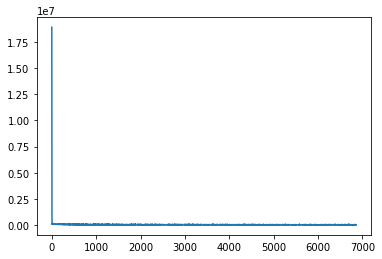

In [21]:
i = 0
for i in range(5):
    window_size = 3
    dataset = tf.data.Dataset.from_tensor_slices(X)
    dataset = dataset.window(window_size+1, shift=1, drop_remainder=True)
    dataset = dataset.flat_map(lambda window: window.batch(window_size + 1))
    dataset = dataset.map(lambda window: (window[:-1], window[-1:]))
    dataset = dataset.shuffle(buffer_size=len(X))
    dataset = dataset.batch(2).prefetch(1)

    callback = [keras.callbacks.callbacks.EarlyStopping(monitor = 'loss', min_delta = 0.0001, patience = 2500, verbose=1, mode = 'min', restore_best_weights = True),
                keras.callbacks.callbacks.ModelCheckpoint('best_model_lstm.h5', monitor = 'loss', verbose=1, save_best_only=True, save_weights_only=False, mode = 'min' , period=1)]

    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(10, input_shape=[window_size]), 
        tf.keras.layers.Dense(5), 
        tf.keras.layers.Dense(1)
    ])

    model.compile(loss="mse", optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
    history = model.fit(dataset, epochs=10000, verbose=1, callbacks=callback)
    pred_daily = model.predict(X[-3:][np.newaxis])
    pred_daily = int(pred_daily[0][0])
    pred_list.append(pred_daily)

loss = history.history['loss']
epochs = range(len(loss))
plt.plot(epochs, loss)

In [22]:
pred_list

[13873, 13900, 13867, 13808, 13840]

In [23]:
print(X)
pred_daily = sum(pred_list[:-2])//len(pred_list[:-2])
print(pred_daily)

[ 1139  1329  1635  2059  2545  3105  3684  4289  4778  5351  5916  6725
  7598  8446  9211 10453 11487 12370]
13880


# ICMR Reports

In [24]:
report_date_list = []
totalsamplestested_list = []
totalpositivecases_list = []

report_date_list = np.array(['13/03/2020', '18/03/2020', '19/03/2020', '19/03/2020',
       '20/03/2020', '20/03/2020', '21/03/2020', '21/03/2020',
       '22/03/2020', '22/03/2020', '23/03/2020', '23/03/2020',
       '24/03/2020', '24/03/2020', '25/03/2020',
       '27/03/2020', '01/04/2020', '02/04/2020', '03/04/2020',
       '04/04/2020', '05/04/2020', '06/04/2020', '07/04/2020', 
       '08/04/2020', '09/04/2020', '10/04/2020', '11/04/2020', '12/04/2020', '13/04/2020', '14/04/2020',
       '15/04/2020'])

totalsamplestested_list = np.array([  6500,  13125,  13316,  14175,  14376,  15404,  15701,  16911,
        16999,  18127,  18383,  20707,  20864,  22694,  25144,
        27688,  47951,  55851,  69245,  79950,  89534, 101068,
       114015, 127919, 144910, 161330, 179374, 195748, 217554, 244893,  274599 ])

totalpositivecases_list = np.array([  78,  150,  168,  182,  206,  236,  271,  315,  341,  396,  415,
        471,  482,  536,  581,  691, 1637, 2056, 2653, 3113,
       3554, 4135, 4616, 5114, 5705, 6872, 7703, 8312, 9341, 10307, 11297])

In [25]:
reports = {"Date":report_date_list[-day_range:], "Total Sample Tested":totalsamplestested_list[-day_range:], "Total Positive Cases":totalpositivecases_list[-day_range:]}
df_reports = pd.DataFrame(reports)
df_reports.to_csv('ICMR_report_data.csv')
df_reports.to_html('ICMR_report_data.html', border=3, index=False, justify = 'center')
df_reports

,Date,Total Sample Tested,Total Positive Cases
0,02/04/2020,55851,2056
1,03/04/2020,69245,2653
2,04/04/2020,79950,3113
3,05/04/2020,89534,3554
4,06/04/2020,101068,4135
5,07/04/2020,114015,4616
6,08/04/2020,127919,5114
7,09/04/2020,144910,5705
8,10/04/2020,161330,6872
9,11/04/2020,179374,7703


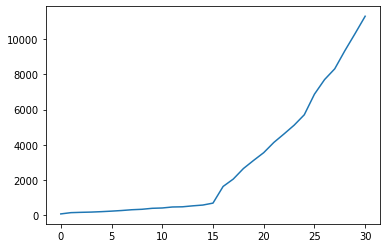

In [26]:
plt.plot(totalpositivecases_list)

In [27]:
date_split_icmr = []
for i in report_date_list:
    i_split = i[:2]
    date_split_icmr.append(i_split)

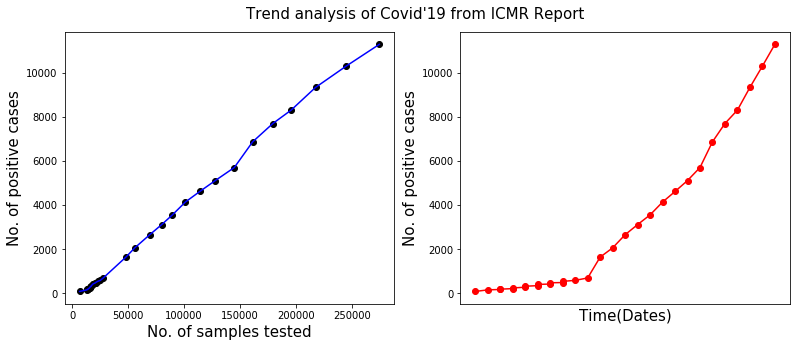

In [28]:
plt.figure(figsize = (13,5))

plt.subplot(1,2,1)
plt.scatter(totalsamplestested_list, totalpositivecases_list, color='black')
plt.plot(totalsamplestested_list, totalpositivecases_list, color='blue')
plt.xlabel('No. of samples tested', fontsize=15)
plt.ylabel('No. of positive cases', fontsize=15)

plt.subplot(1,2,2)
plt.scatter(report_date_list, totalpositivecases_list, color='red')
plt.plot(report_date_list, totalpositivecases_list, color='red')
plt.xticks([])
plt.xlabel('Time(Dates)', fontsize=15)
plt.ylabel('No. of positive cases', fontsize=15)

plt.suptitle("Trend analysis of Covid'19 from ICMR Report", fontsize=15, y=0.95)
plt.savefig('ICMR_stat.png')

### Future Prediction using ICMR Data

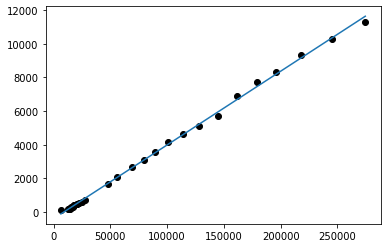

In [29]:
from scipy.optimize import curve_fit

def func(x,a,b):
    return a*x+b

init_guess = [1,1]
popt, pcov = curve_fit(func, totalsamplestested_list, totalpositivecases_list, init_guess)
a = popt[0]
b = popt[1]

m=len(totalsamplestested_list)
theta_0=np.multiply(b, np.ones(m))
theta_1=np.multiply(a,np.ones(m))
hypothesis=np.add(np.multiply(totalsamplestested_list, theta_1),theta_0)

plt.scatter(totalsamplestested_list, totalpositivecases_list, color='black')
plt.plot(totalsamplestested_list, hypothesis)

In [30]:
location = ['USA', 'Italy', 'Germany', 'South Korea']
test_world = [1762032, 721732, 918460, 466804]
conf_world = [367758, 132547, 103375, 10331]
validation = totalsamplestested_list[-5:]

In [31]:
y_pred = []
for items in test_world:
    pred = a*items + b
    y_pred.append(pred)

In [32]:
y_pred = np.array(y_pred, dtype=int)
y_pred

array([76965, 31282, 39921, 20087])

In [33]:
test_report_comparison = {'Location':location, 'Total Confirmed Cases':conf_world, 'Total samples Tested':test_world}
df_test_report_comparison = pd.DataFrame(test_report_comparison)
df_test_report_comparison.to_csv('test_report_comparison.csv')
df_test_report_comparison.to_html('test_report_comparison.html', border=7, index=False, justify = 'center')
df_test_report_comparison

,Location,Total Confirmed Cases,Total samples Tested
0,USA,367758,1762032
1,Italy,132547,721732
2,Germany,103375,918460
3,South Korea,10331,466804


In [34]:
usa_vs_india_loc = ['USA', 'India']
usa_vs_india_conf = [conf_world[0], y_pred[0]]

italy_vs_india_loc = ['Italy', 'India']
italy_vs_india_conf = [conf_world[1], y_pred[1]]

germany_vs_india_loc = ['Germany', 'India']
germany_vs_india_conf = [conf_world[2], y_pred[2]]

sk_vs_india_loc = ['South Korea', 'India']
sk_vs_india_conf = [conf_world[3], y_pred[3]]

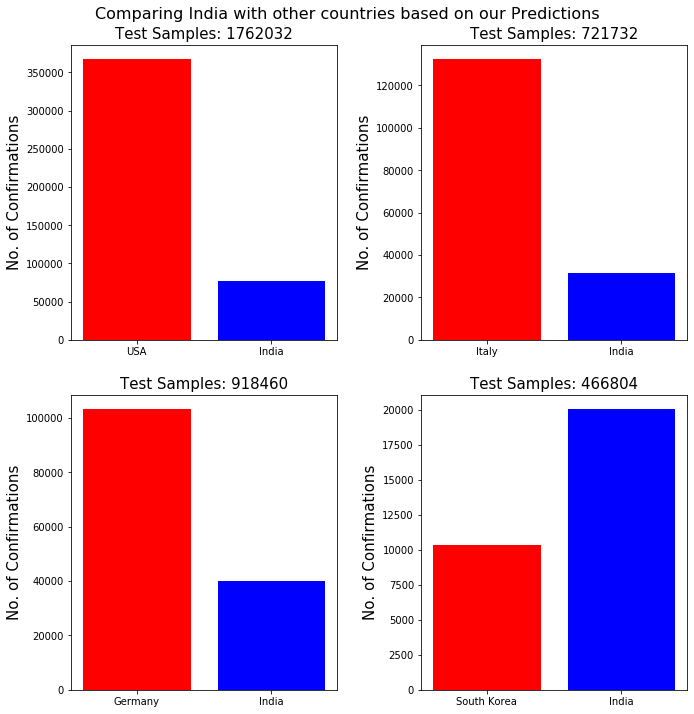

In [35]:
plt.figure(figsize=(10,10))
pad = 2.0

plt.subplot(2,2,1)
plt.bar(usa_vs_india_loc, usa_vs_india_conf, color=['red', 'blue'])
plt.title("Test Samples: "+str(test_world[0]), fontsize=15)
plt.ylabel("No. of Confirmations", fontsize=15)
plt.tight_layout(pad)

plt.subplot(2,2,2)
plt.bar(italy_vs_india_loc, italy_vs_india_conf, color=['red', 'blue'])
plt.title("Test Samples: "+str(test_world[1]), fontsize=15)
plt.ylabel("No. of Confirmations", fontsize=15)
plt.tight_layout(pad)

plt.subplot(2,2,3)
plt.bar(germany_vs_india_loc, germany_vs_india_conf, color=['red', 'blue'])
plt.title("Test Samples: "+str(test_world[2]), fontsize=15)
plt.ylabel("No. of Confirmations", fontsize=15)
plt.tight_layout(pad)

plt.subplot(2,2,4)
plt.bar(sk_vs_india_loc, sk_vs_india_conf, color=['red', 'blue'])
plt.title("Test Samples: "+str(test_world[3]), fontsize=15)
plt.ylabel("No. of Confirmations", fontsize=15)
plt.tight_layout(pad)

plt.suptitle("Comparing India with other countries based on our Predictions", fontsize=16, x=0.5,y=1)
plt.savefig('compare.png')

In [36]:
X_icmr = totalpositivecases_list[16:]
X_icmr

array([ 1637,  2056,  2653,  3113,  3554,  4135,  4616,  5114,  5705,
        6872,  7703,  8312,  9341, 10307, 11297])

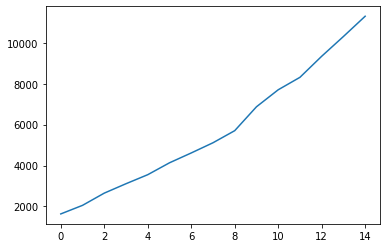

In [37]:
plt.plot(X_icmr)

In [38]:
len(X_icmr)

15

In [39]:
pred_icmr_list = [[]

In [40]:
i = 0
for i in range(5):
    window_size = 3
    dataset_icmr = tf.data.Dataset.from_tensor_slices(X_icmr)
    dataset_icmr = dataset_icmr.window(window_size+1, shift=1, drop_remainder=True)
    dataset_icmr = dataset_icmr.flat_map(lambda window: window.batch(10))
    dataset_icmr = dataset_icmr.map(lambda window: (window[:-1], window[-1:]))
    dataset_icmr = dataset_icmr.shuffle(buffer_size=len(X))
    dataset_icmr = dataset_icmr.batch(1).prefetch(1)

    callback = [keras.callbacks.callbacks.EarlyStopping(monitor = 'loss', min_delta = 0.0001, patience = 2500, verbose=1, mode = 'min', restore_best_weights = True),
                keras.callbacks.callbacks.ModelCheckpoint('best_model_icmr_lstm.h5', monitor = 'loss', verbose=1, save_best_only=True, save_weights_only=False, mode = 'min' , period=1)]

    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(10, input_shape=[window_size], activation="relu"), 
        tf.keras.layers.Dense(5, activation="relu"), 
        tf.keras.layers.Dense(1)
    ])

    model.compile(loss="mse", optimizer=tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, amsgrad=False))
    history = model.fit(dataset_icmr, epochs=10000, verbose=1, callbacks=callback)
    pred_icmr_ts = model.predict(X_icmr[-3:][np.newaxis])
    pred_icmr_ts = int(pred_icmr_ts[0][0])
    pred_icmr_list.append(pred_icmr_ts)

Epoch 1/10000
     12/Unknown - 0s 24ms/step - loss: 47476624.7500
Epoch 00001: loss improved from inf to 47476624.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 1s 46ms/step - loss: 47476624.7500
Epoch 2/10000
 1/12 [=>............................] - ETA: 0s - loss: 115836952.0000
Epoch 00002: loss improved from 47476624.75000 to 45915292.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 45915292.0000
Epoch 3/10000
 1/12 [=>............................] - ETA: 0s - loss: 92793256.0000
Epoch 00003: loss improved from 45915292.00000 to 43827315.79167, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 43827315.7917
Epoch 4/10000
 1/12 [=>............................] - ETA: 0s - loss: 71445480.0000
Epoch 00004: loss improved from 43827315.79167 to 39335548.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================]

Epoch 35/10000
 1/12 [=>............................] - ETA: 0s - loss: 25587.3457
Epoch 00035: loss did not improve from 51568.70707
12/12 [==============================] - 0s 1ms/step - loss: 52514.1267
Epoch 36/10000
 1/12 [=>............................] - ETA: 0s - loss: 230144.6094
Epoch 00036: loss improved from 51568.70707 to 51550.18445, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51550.1845
Epoch 37/10000
 1/12 [=>............................] - ETA: 0s - loss: 50479.6445
Epoch 00037: loss did not improve from 51550.18445
12/12 [==============================] - 0s 2ms/step - loss: 51737.4504
Epoch 38/10000
 1/12 [=>............................] - ETA: 0s - loss: 13845.5215
Epoch 00038: loss improved from 51550.18445 to 51308.33449, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51308.3345
Epoch 39/10000
 1/12 [=>............................] - ETA: 0s - loss: 22027

 1/12 [=>............................] - ETA: 0s - loss: 215402.5000
Epoch 00074: loss did not improve from 51032.45588
12/12 [==============================] - 0s 1ms/step - loss: 51718.9797
Epoch 75/10000
 1/12 [=>............................] - ETA: 0s - loss: 1940.1272
Epoch 00075: loss did not improve from 51032.45588
12/12 [==============================] - 0s 2ms/step - loss: 53480.6651
Epoch 76/10000
 1/12 [=>............................] - ETA: 0s - loss: 116314.9688
Epoch 00076: loss did not improve from 51032.45588
12/12 [==============================] - 0s 1ms/step - loss: 51721.9393
Epoch 77/10000
 1/12 [=>............................] - ETA: 0s - loss: 16157.2900
Epoch 00077: loss did not improve from 51032.45588
12/12 [==============================] - 0s 2ms/step - loss: 51975.9131
Epoch 78/10000
 1/12 [=>............................] - ETA: 0s - loss: 122.9955
Epoch 00078: loss did not improve from 51032.45588
12/12 [==============================] - 0s 2ms/step - los

Epoch 113/10000
 1/12 [=>............................] - ETA: 0s - loss: 17442.6973
Epoch 00113: loss did not improve from 49946.89591
12/12 [==============================] - 0s 2ms/step - loss: 50744.1028
Epoch 114/10000
 1/12 [=>............................] - ETA: 0s - loss: 43268.4688
Epoch 00114: loss did not improve from 49946.89591
12/12 [==============================] - 0s 1ms/step - loss: 50560.8583
Epoch 115/10000
 1/12 [=>............................] - ETA: 0s - loss: 14024.6660
Epoch 00115: loss did not improve from 49946.89591
12/12 [==============================] - 0s 1ms/step - loss: 51859.7909
Epoch 116/10000
 1/12 [=>............................] - ETA: 0s - loss: 57387.5000
Epoch 00116: loss did not improve from 49946.89591
12/12 [==============================] - 0s 2ms/step - loss: 50655.8064
Epoch 117/10000
 1/12 [=>............................] - ETA: 0s - loss: 18075.9355
Epoch 00117: loss did not improve from 49946.89591
12/12 [==============================

Epoch 152/10000
 1/12 [=>............................] - ETA: 0s - loss: 603.1725
Epoch 00152: loss did not improve from 48992.92218
12/12 [==============================] - 0s 1ms/step - loss: 49947.2709
Epoch 153/10000
 1/12 [=>............................] - ETA: 0s - loss: 51403.6055
Epoch 00153: loss did not improve from 48992.92218
12/12 [==============================] - 0s 2ms/step - loss: 52661.9569
Epoch 154/10000
 1/12 [=>............................] - ETA: 0s - loss: 179.6097
Epoch 00154: loss did not improve from 48992.92218
12/12 [==============================] - 0s 1ms/step - loss: 52665.5642
Epoch 155/10000
 1/12 [=>............................] - ETA: 0s - loss: 44706.6406
Epoch 00155: loss did not improve from 48992.92218
12/12 [==============================] - 0s 2ms/step - loss: 50594.6579
Epoch 156/10000
 1/12 [=>............................] - ETA: 0s - loss: 55111.2305
Epoch 00156: loss did not improve from 48992.92218
12/12 [==============================] - 

Epoch 191/10000
 1/12 [=>............................] - ETA: 0s - loss: 39039.4297
Epoch 00191: loss did not improve from 47885.00769
12/12 [==============================] - 0s 2ms/step - loss: 49586.0644
Epoch 192/10000
 1/12 [=>............................] - ETA: 0s - loss: 86590.8203
Epoch 00192: loss did not improve from 47885.00769
12/12 [==============================] - 0s 2ms/step - loss: 49891.6819
Epoch 193/10000
 1/12 [=>............................] - ETA: 0s - loss: 22.9398
Epoch 00193: loss did not improve from 47885.00769
12/12 [==============================] - 0s 1ms/step - loss: 49018.1843
Epoch 194/10000
 1/12 [=>............................] - ETA: 0s - loss: 47093.6641
Epoch 00194: loss did not improve from 47885.00769
12/12 [==============================] - 0s 2ms/step - loss: 48378.9317
Epoch 195/10000
 1/12 [=>............................] - ETA: 0s - loss: 59984.3320
Epoch 00195: loss did not improve from 47885.00769
12/12 [==============================] -

Epoch 231/10000
 1/12 [=>............................] - ETA: 0s - loss: 502.5434
Epoch 00231: loss did not improve from 47560.93857
12/12 [==============================] - 0s 1ms/step - loss: 48177.3757
Epoch 232/10000
 1/12 [=>............................] - ETA: 0s - loss: 67066.8359
Epoch 00232: loss improved from 47560.93857 to 47227.73191, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 47227.7319
Epoch 233/10000
 1/12 [=>............................] - ETA: 0s - loss: 201289.3594
Epoch 00233: loss did not improve from 47227.73191
12/12 [==============================] - 0s 2ms/step - loss: 55322.1075
Epoch 234/10000
 1/12 [=>............................] - ETA: 0s - loss: 58580.0703
Epoch 00234: loss did not improve from 47227.73191
12/12 [==============================] - 0s 2ms/step - loss: 57500.0621
Epoch 235/10000
 1/12 [=>............................] - ETA: 0s - loss: 14298.2275
Epoch 00235: loss did not improve from 4

 1/12 [=>............................] - ETA: 0s - loss: 194456.4531
Epoch 00270: loss did not improve from 47023.24681
12/12 [==============================] - 0s 1ms/step - loss: 50672.2325
Epoch 271/10000
 1/12 [=>............................] - ETA: 0s - loss: 21563.3730
Epoch 00271: loss did not improve from 47023.24681
12/12 [==============================] - 0s 1ms/step - loss: 54735.8554
Epoch 272/10000
 1/12 [=>............................] - ETA: 0s - loss: 451.2513
Epoch 00272: loss did not improve from 47023.24681
12/12 [==============================] - 0s 2ms/step - loss: 57584.2845
Epoch 273/10000
 1/12 [=>............................] - ETA: 0s - loss: 4223.5400
Epoch 00273: loss did not improve from 47023.24681
12/12 [==============================] - 0s 2ms/step - loss: 48686.3216
Epoch 274/10000
 1/12 [=>............................] - ETA: 0s - loss: 274441.4375
Epoch 00274: loss did not improve from 47023.24681
12/12 [==============================] - 0s 1ms/step -

Epoch 310/10000
 1/12 [=>............................] - ETA: 0s - loss: 10492.6416
Epoch 00310: loss did not improve from 42503.41476
12/12 [==============================] - 0s 2ms/step - loss: 46343.7871
Epoch 311/10000
 1/12 [=>............................] - ETA: 0s - loss: 39320.0039
Epoch 00311: loss did not improve from 42503.41476
12/12 [==============================] - 0s 3ms/step - loss: 55117.8057
Epoch 312/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.5559
Epoch 00312: loss did not improve from 42503.41476
12/12 [==============================] - 0s 2ms/step - loss: 47637.7454
Epoch 313/10000
 1/12 [=>............................] - ETA: 0s - loss: 3802.5771
Epoch 00313: loss did not improve from 42503.41476
12/12 [==============================] - 0s 2ms/step - loss: 46792.5156
Epoch 314/10000
 1/12 [=>............................] - ETA: 0s - loss: 1199.8037
Epoch 00314: loss did not improve from 42503.41476
12/12 [==============================] - 0s

Epoch 350/10000
 1/12 [=>............................] - ETA: 0s - loss: 249.3253
Epoch 00350: loss did not improve from 42168.50982
12/12 [==============================] - 0s 1ms/step - loss: 46727.4987
Epoch 351/10000
 1/12 [=>............................] - ETA: 0s - loss: 79104.3125
Epoch 00351: loss did not improve from 42168.50982
12/12 [==============================] - 0s 2ms/step - loss: 46135.5026
Epoch 352/10000
 1/12 [=>............................] - ETA: 0s - loss: 76674.7734
Epoch 00352: loss did not improve from 42168.50982
12/12 [==============================] - 0s 2ms/step - loss: 45820.0970
Epoch 353/10000
 1/12 [=>............................] - ETA: 0s - loss: 228397.6562
Epoch 00353: loss did not improve from 42168.50982
12/12 [==============================] - 0s 2ms/step - loss: 46476.3900
Epoch 354/10000
 1/12 [=>............................] - ETA: 0s - loss: 22937.0137
Epoch 00354: loss did not improve from 42168.50982
12/12 [==============================]

Epoch 390/10000
 1/12 [=>............................] - ETA: 0s - loss: 891.2324
Epoch 00390: loss did not improve from 42168.50982
12/12 [==============================] - 0s 1ms/step - loss: 48441.5269
Epoch 391/10000
 1/12 [=>............................] - ETA: 0s - loss: 190894.7500
Epoch 00391: loss did not improve from 42168.50982
12/12 [==============================] - 0s 1ms/step - loss: 43742.6223
Epoch 392/10000
 1/12 [=>............................] - ETA: 0s - loss: 80059.5703
Epoch 00392: loss did not improve from 42168.50982
12/12 [==============================] - 0s 2ms/step - loss: 45730.4207
Epoch 393/10000
 1/12 [=>............................] - ETA: 0s - loss: 37264.4570
Epoch 00393: loss did not improve from 42168.50982
12/12 [==============================] - 0s 1ms/step - loss: 55249.6241
Epoch 394/10000
 1/12 [=>............................] - ETA: 0s - loss: 212851.5781
Epoch 00394: loss did not improve from 42168.50982
12/12 [==============================

Epoch 430/10000
 1/12 [=>............................] - ETA: 0s - loss: 14578.2041
Epoch 00430: loss did not improve from 42168.50982
12/12 [==============================] - 0s 2ms/step - loss: 48453.4241
Epoch 431/10000
 1/12 [=>............................] - ETA: 0s - loss: 71329.9453
Epoch 00431: loss did not improve from 42168.50982
12/12 [==============================] - 0s 1ms/step - loss: 45860.4727
Epoch 432/10000
 1/12 [=>............................] - ETA: 0s - loss: 43938.2383
Epoch 00432: loss did not improve from 42168.50982
12/12 [==============================] - 0s 2ms/step - loss: 46167.9693
Epoch 433/10000
 1/12 [=>............................] - ETA: 0s - loss: 65.8333
Epoch 00433: loss did not improve from 42168.50982
12/12 [==============================] - 0s 1ms/step - loss: 47549.2500
Epoch 434/10000
 1/12 [=>............................] - ETA: 0s - loss: 44764.5781
Epoch 00434: loss did not improve from 42168.50982
12/12 [==============================] -

12/12 [==============================] - 0s 3ms/step - loss: 39960.4471
Epoch 470/10000
 1/12 [=>............................] - ETA: 0s - loss: 8435.4541
Epoch 00470: loss did not improve from 39960.44710
12/12 [==============================] - 0s 1ms/step - loss: 50842.2124
Epoch 471/10000
 1/12 [=>............................] - ETA: 0s - loss: 22919.7871
Epoch 00471: loss did not improve from 39960.44710
12/12 [==============================] - 0s 2ms/step - loss: 46043.2506
Epoch 472/10000
 1/12 [=>............................] - ETA: 0s - loss: 28.6288
Epoch 00472: loss did not improve from 39960.44710
12/12 [==============================] - 0s 1ms/step - loss: 48838.8547
Epoch 473/10000
 1/12 [=>............................] - ETA: 0s - loss: 26512.3613
Epoch 00473: loss did not improve from 39960.44710
12/12 [==============================] - 0s 1ms/step - loss: 41875.1597
Epoch 474/10000
 1/12 [=>............................] - ETA: 0s - loss: 3472.1902
Epoch 00474: loss did

 1/12 [=>............................] - ETA: 0s - loss: 30707.0000
Epoch 00509: loss did not improve from 39960.44710
12/12 [==============================] - 0s 2ms/step - loss: 42466.6635
Epoch 510/10000
 1/12 [=>............................] - ETA: 0s - loss: 26774.0996
Epoch 00510: loss did not improve from 39960.44710
12/12 [==============================] - 0s 2ms/step - loss: 53852.8492
Epoch 511/10000
 1/12 [=>............................] - ETA: 0s - loss: 57184.6172
Epoch 00511: loss did not improve from 39960.44710
12/12 [==============================] - 0s 2ms/step - loss: 42922.4774
Epoch 512/10000
 1/12 [=>............................] - ETA: 0s - loss: 23975.3008
Epoch 00512: loss did not improve from 39960.44710
12/12 [==============================] - 0s 2ms/step - loss: 47577.7103
Epoch 513/10000
 1/12 [=>............................] - ETA: 0s - loss: 9.3311
Epoch 00513: loss did not improve from 39960.44710
12/12 [==============================] - 0s 1ms/step - lo

 1/12 [=>............................] - ETA: 0s - loss: 20008.0879
Epoch 00548: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 57623.3815
Epoch 549/10000
 1/12 [=>............................] - ETA: 0s - loss: 375.1636
Epoch 00549: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 54592.9040
Epoch 550/10000
 1/12 [=>............................] - ETA: 0s - loss: 7814.2837
Epoch 00550: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 38731.1120
Epoch 551/10000
 1/12 [=>............................] - ETA: 0s - loss: 110.2090
Epoch 00551: loss did not improve from 37612.84302
12/12 [==============================] - 0s 2ms/step - loss: 44715.2828
Epoch 552/10000
 1/12 [=>............................] - ETA: 0s - loss: 2878.9932
Epoch 00552: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss

Epoch 588/10000
 1/12 [=>............................] - ETA: 0s - loss: 525.9273
Epoch 00588: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 41423.9953
Epoch 589/10000
 1/12 [=>............................] - ETA: 0s - loss: 1682.3616
Epoch 00589: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 46067.0380
Epoch 590/10000
 1/12 [=>............................] - ETA: 0s - loss: 55.2874
Epoch 00590: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 39103.3686
Epoch 591/10000
 1/12 [=>............................] - ETA: 0s - loss: 49474.2070
Epoch 00591: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 46144.0192
Epoch 592/10000
 1/12 [=>............................] - ETA: 0s - loss: 47124.0781
Epoch 00592: loss did not improve from 37612.84302
12/12 [==============================] - 0s

Epoch 628/10000
 1/12 [=>............................] - ETA: 0s - loss: 144639.0781
Epoch 00628: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 60922.0797
Epoch 629/10000
 1/12 [=>............................] - ETA: 0s - loss: 27398.9785
Epoch 00629: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 39228.5194
Epoch 630/10000
 1/12 [=>............................] - ETA: 0s - loss: 860.4827
Epoch 00630: loss did not improve from 37612.84302
12/12 [==============================] - 0s 2ms/step - loss: 44190.8701
Epoch 631/10000
 1/12 [=>............................] - ETA: 0s - loss: 92.4903
Epoch 00631: loss did not improve from 37612.84302
12/12 [==============================] - 0s 1ms/step - loss: 44222.7959
Epoch 632/10000
 1/12 [=>............................] - ETA: 0s - loss: 42616.3398
Epoch 00632: loss did not improve from 37612.84302
12/12 [==============================] - 

Epoch 668/10000
 1/12 [=>............................] - ETA: 0s - loss: 20088.9785
Epoch 00668: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 47936.3246
Epoch 669/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.2448
Epoch 00669: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 51662.4265
Epoch 670/10000
 1/12 [=>............................] - ETA: 0s - loss: 13787.3232
Epoch 00670: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 38396.6372
Epoch 671/10000
 1/12 [=>............................] - ETA: 0s - loss: 13389.4727
Epoch 00671: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 48065.0681
Epoch 672/10000
 1/12 [=>............................] - ETA: 0s - loss: 56151.8750
Epoch 00672: loss did not improve from 33227.92685
12/12 [==============================] - 

Epoch 708/10000
 1/12 [=>............................] - ETA: 0s - loss: 12950.1729
Epoch 00708: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 48531.4075
Epoch 709/10000
 1/12 [=>............................] - ETA: 0s - loss: 6547.2437
Epoch 00709: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 35038.6129
Epoch 710/10000
 1/12 [=>............................] - ETA: 0s - loss: 8192.3271
Epoch 00710: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 58366.3242
Epoch 711/10000
 1/12 [=>............................] - ETA: 0s - loss: 26568.6816
Epoch 00711: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 44761.8067
Epoch 712/10000
 1/12 [=>............................] - ETA: 0s - loss: 252.1242
Epoch 00712: loss did not improve from 33227.92685
12/12 [==============================] - 

Epoch 748/10000
 1/12 [=>............................] - ETA: 0s - loss: 4711.2671
Epoch 00748: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 42439.4866
Epoch 749/10000
 1/12 [=>............................] - ETA: 0s - loss: 34047.8164
Epoch 00749: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 40372.4865
Epoch 750/10000
 1/12 [=>............................] - ETA: 0s - loss: 239455.3906
Epoch 00750: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 41256.4863
Epoch 751/10000
 1/12 [=>............................] - ETA: 0s - loss: 11344.1221
Epoch 00751: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 39690.2529
Epoch 752/10000
 1/12 [=>............................] - ETA: 0s - loss: 238936.7031
Epoch 00752: loss did not improve from 33227.92685
12/12 [=============================

Epoch 788/10000
 1/12 [=>............................] - ETA: 0s - loss: 20.1973
Epoch 00788: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 47657.7282
Epoch 789/10000
 1/12 [=>............................] - ETA: 0s - loss: 1439.7726
Epoch 00789: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 45239.3566
Epoch 790/10000
 1/12 [=>............................] - ETA: 0s - loss: 30772.1484
Epoch 00790: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 39362.3503
Epoch 791/10000
 1/12 [=>............................] - ETA: 0s - loss: 42941.7344
Epoch 00791: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 52291.3269
Epoch 792/10000
 1/12 [=>............................] - ETA: 0s - loss: 21933.4941
Epoch 00792: loss did not improve from 33227.92685
12/12 [==============================] - 

Epoch 828/10000
 1/12 [=>............................] - ETA: 0s - loss: 16882.7383
Epoch 00828: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 40938.4414
Epoch 829/10000
 1/12 [=>............................] - ETA: 0s - loss: 42797.6680
Epoch 00829: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 43719.7194
Epoch 830/10000
 1/12 [=>............................] - ETA: 0s - loss: 301.5683
Epoch 00830: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 39994.3480
Epoch 831/10000
 1/12 [=>............................] - ETA: 0s - loss: 8522.0488
Epoch 00831: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 38817.0021
Epoch 832/10000
 1/12 [=>............................] - ETA: 0s - loss: 12277.4082
Epoch 00832: loss did not improve from 33227.92685
12/12 [==============================] -

Epoch 868/10000
 1/12 [=>............................] - ETA: 0s - loss: 10.6962
Epoch 00868: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 39427.7034
Epoch 869/10000
 1/12 [=>............................] - ETA: 0s - loss: 39316.2305
Epoch 00869: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 40688.6062
Epoch 870/10000
 1/12 [=>............................] - ETA: 0s - loss: 37862.3555
Epoch 00870: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 50761.1311
Epoch 871/10000
 1/12 [=>............................] - ETA: 0s - loss: 17062.5723
Epoch 00871: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 47820.3585
Epoch 872/10000
 1/12 [=>............................] - ETA: 0s - loss: 38787.4570
Epoch 00872: loss did not improve from 33227.92685
12/12 [==============================] -

Epoch 908/10000
 1/12 [=>............................] - ETA: 0s - loss: 66159.9766
Epoch 00908: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 40798.5021
Epoch 909/10000
 1/12 [=>............................] - ETA: 0s - loss: 33459.6992
Epoch 00909: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 40117.5178
Epoch 910/10000
 1/12 [=>............................] - ETA: 0s - loss: 238.3164
Epoch 00910: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 39066.4977
Epoch 911/10000
 1/12 [=>............................] - ETA: 0s - loss: 492.5019
Epoch 00911: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 47464.5445
Epoch 912/10000
 1/12 [=>............................] - ETA: 0s - loss: 37586.7578
Epoch 00912: loss did not improve from 33227.92685
12/12 [==============================] - 

Epoch 948/10000
 1/12 [=>............................] - ETA: 0s - loss: 21681.5566
Epoch 00948: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 44003.0576
Epoch 949/10000
 1/12 [=>............................] - ETA: 0s - loss: 13686.4863
Epoch 00949: loss did not improve from 33227.92685
12/12 [==============================] - 0s 2ms/step - loss: 45463.5930
Epoch 950/10000
 1/12 [=>............................] - ETA: 0s - loss: 1450.4642
Epoch 00950: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 35691.0740
Epoch 951/10000
 1/12 [=>............................] - ETA: 0s - loss: 43626.3164
Epoch 00951: loss did not improve from 33227.92685
12/12 [==============================] - 0s 1ms/step - loss: 41026.4630
Epoch 952/10000
 1/12 [=>............................] - ETA: 0s - loss: 18611.0605
Epoch 00952: loss did not improve from 33227.92685
12/12 [==============================]

Epoch 988/10000
 1/12 [=>............................] - ETA: 0s - loss: 15818.8965
Epoch 00988: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 50635.7846
Epoch 989/10000
 1/12 [=>............................] - ETA: 0s - loss: 34504.8750
Epoch 00989: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 41864.1743
Epoch 990/10000
 1/12 [=>............................] - ETA: 0s - loss: 5519.5903
Epoch 00990: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 36696.2628
Epoch 991/10000
 1/12 [=>............................] - ETA: 0s - loss: 13037.4473
Epoch 00991: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 43512.1893
Epoch 992/10000
 1/12 [=>............................] - ETA: 0s - loss: 328.9583
Epoch 00992: loss did not improve from 31048.43455
12/12 [==============================] -

Epoch 1028/10000
 1/12 [=>............................] - ETA: 0s - loss: 25136.6465
Epoch 01028: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 41499.9853
Epoch 1029/10000
 1/12 [=>............................] - ETA: 0s - loss: 15855.3350
Epoch 01029: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 37662.1181
Epoch 1030/10000
 1/12 [=>............................] - ETA: 0s - loss: 16.1449
Epoch 01030: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 37523.1785
Epoch 1031/10000
 1/12 [=>............................] - ETA: 0s - loss: 22137.6035
Epoch 01031: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 39644.4258
Epoch 1032/10000
 1/12 [=>............................] - ETA: 0s - loss: 28499.3086
Epoch 01032: loss did not improve from 31048.43455
12/12 [============================

Epoch 1068/10000
 1/12 [=>............................] - ETA: 0s - loss: 13621.5566
Epoch 01068: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 43972.0946
Epoch 1069/10000
 1/12 [=>............................] - ETA: 0s - loss: 17111.1445
Epoch 01069: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 39586.6660
Epoch 1070/10000
 1/12 [=>............................] - ETA: 0s - loss: 320.7912
Epoch 01070: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 43924.9196
Epoch 1071/10000
 1/12 [=>............................] - ETA: 0s - loss: 14859.9434
Epoch 01071: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 49918.0105
Epoch 1072/10000
 1/12 [=>............................] - ETA: 0s - loss: 6554.1992
Epoch 01072: loss did not improve from 31048.43455
12/12 [============================

Epoch 1108/10000
 1/12 [=>............................] - ETA: 0s - loss: 15707.8730
Epoch 01108: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 35338.4498
Epoch 1109/10000
 1/12 [=>............................] - ETA: 0s - loss: 506.9534
Epoch 01109: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 40052.6033
Epoch 1110/10000
 1/12 [=>............................] - ETA: 0s - loss: 15263.3477
Epoch 01110: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 40234.3798
Epoch 1111/10000
 1/12 [=>............................] - ETA: 0s - loss: 34745.8320
Epoch 01111: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 37242.5268
Epoch 1112/10000
 1/12 [=>............................] - ETA: 0s - loss: 7030.4297
Epoch 01112: loss did not improve from 31048.43455
12/12 [============================

Epoch 1148/10000
 1/12 [=>............................] - ETA: 0s - loss: 3740.5049
Epoch 01148: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 52289.3723
Epoch 1149/10000
 1/12 [=>............................] - ETA: 0s - loss: 40199.0742
Epoch 01149: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 41010.8636
Epoch 1150/10000
 1/12 [=>............................] - ETA: 0s - loss: 193019.5000
Epoch 01150: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 38908.1895
Epoch 1151/10000
 1/12 [=>............................] - ETA: 0s - loss: 39598.2812
Epoch 01151: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 40447.0667
Epoch 1152/10000
 1/12 [=>............................] - ETA: 0s - loss: 860.0530
Epoch 01152: loss did not improve from 31048.43455
12/12 [===========================

Epoch 1188/10000
 1/12 [=>............................] - ETA: 0s - loss: 41.3848
Epoch 01188: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 42310.7549
Epoch 1189/10000
 1/12 [=>............................] - ETA: 0s - loss: 22691.4941
Epoch 01189: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 47143.2720
Epoch 1190/10000
 1/12 [=>............................] - ETA: 0s - loss: 323364.3750
Epoch 01190: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 59125.3751
Epoch 1191/10000
 1/12 [=>............................] - ETA: 0s - loss: 189715.1094
Epoch 01191: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 37395.0318
Epoch 1192/10000
 1/12 [=>............................] - ETA: 0s - loss: 59303.1875
Epoch 01192: loss did not improve from 31048.43455
12/12 [==========================

Epoch 1228/10000
 1/12 [=>............................] - ETA: 0s - loss: 180.8289
Epoch 01228: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 34162.3708
Epoch 1229/10000
 1/12 [=>............................] - ETA: 0s - loss: 1893.9496
Epoch 01229: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 41856.0934
Epoch 1230/10000
 1/12 [=>............................] - ETA: 0s - loss: 24567.5020
Epoch 01230: loss did not improve from 31048.43455
12/12 [==============================] - 0s 2ms/step - loss: 37423.2237
Epoch 1231/10000
 1/12 [=>............................] - ETA: 0s - loss: 39103.5195
Epoch 01231: loss did not improve from 31048.43455
12/12 [==============================] - 0s 1ms/step - loss: 42735.4016
Epoch 1232/10000
 1/12 [=>............................] - ETA: 0s - loss: 48.8224
Epoch 01232: loss did not improve from 31048.43455
12/12 [==============================]

 1/12 [=>............................] - ETA: 0s - loss: 31071.8945
Epoch 01267: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 40270.8271
Epoch 1268/10000
 1/12 [=>............................] - ETA: 0s - loss: 51176.6914
Epoch 01268: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 43890.0696
Epoch 1269/10000
 1/12 [=>............................] - ETA: 0s - loss: 906.0746
Epoch 01269: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 43965.5209
Epoch 1270/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.0037
Epoch 01270: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 40924.7995
Epoch 1271/10000
 1/12 [=>............................] - ETA: 0s - loss: 103.3280
Epoch 01271: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - lo

Epoch 1307/10000
 1/12 [=>............................] - ETA: 0s - loss: 29206.2754
Epoch 01307: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 37035.3148
Epoch 1308/10000
 1/12 [=>............................] - ETA: 0s - loss: 35550.2930
Epoch 01308: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 36401.3205
Epoch 1309/10000
 1/12 [=>............................] - ETA: 0s - loss: 3133.5942
Epoch 01309: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 38545.6959
Epoch 1310/10000
 1/12 [=>............................] - ETA: 0s - loss: 16.3891
Epoch 01310: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 42374.6987
Epoch 1311/10000
 1/12 [=>............................] - ETA: 0s - loss: 57.2653
Epoch 01311: loss did not improve from 29656.68435
12/12 [==============================] 

Epoch 1347/10000
 1/12 [=>............................] - ETA: 0s - loss: 241.7964
Epoch 01347: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 43420.5749
Epoch 1348/10000
 1/12 [=>............................] - ETA: 0s - loss: 16819.4805
Epoch 01348: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 34211.6977
Epoch 1349/10000
 1/12 [=>............................] - ETA: 0s - loss: 842.9836
Epoch 01349: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 43653.1064
Epoch 1350/10000
 1/12 [=>............................] - ETA: 0s - loss: 22097.5195
Epoch 01350: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38385.1468
Epoch 1351/10000
 1/12 [=>............................] - ETA: 0s - loss: 252724.1719
Epoch 01351: loss did not improve from 29656.68435
12/12 [============================

Epoch 1387/10000
 1/12 [=>............................] - ETA: 0s - loss: 19971.1543
Epoch 01387: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 39374.7606
Epoch 1388/10000
 1/12 [=>............................] - ETA: 0s - loss: 17603.3164
Epoch 01388: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 36738.7267
Epoch 1389/10000
 1/12 [=>............................] - ETA: 0s - loss: 379.8312
Epoch 01389: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 40580.7753
Epoch 1390/10000
 1/12 [=>............................] - ETA: 0s - loss: 8500.5156
Epoch 01390: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 41968.4601
Epoch 1391/10000
 1/12 [=>............................] - ETA: 0s - loss: 34056.1992
Epoch 01391: loss did not improve from 29656.68435
12/12 [============================

Epoch 1427/10000
 1/12 [=>............................] - ETA: 0s - loss: 19749.8555
Epoch 01427: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38076.2397
Epoch 1428/10000
 1/12 [=>............................] - ETA: 0s - loss: 23761.1387
Epoch 01428: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 41513.7541
Epoch 1429/10000
 1/12 [=>............................] - ETA: 0s - loss: 44854.6055
Epoch 01429: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 40687.4224
Epoch 1430/10000
 1/12 [=>............................] - ETA: 0s - loss: 1028.4423
Epoch 01430: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 44844.4663
Epoch 1431/10000
 1/12 [=>............................] - ETA: 0s - loss: 18590.4180
Epoch 01431: loss did not improve from 29656.68435
12/12 [==========================

Epoch 1467/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.5323
Epoch 01467: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38464.9288
Epoch 1468/10000
 1/12 [=>............................] - ETA: 0s - loss: 272790.9688
Epoch 01468: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 44878.9717
Epoch 1469/10000
 1/12 [=>............................] - ETA: 0s - loss: 38130.9531
Epoch 01469: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 48722.3619
Epoch 1470/10000
 1/12 [=>............................] - ETA: 0s - loss: 1427.7549
Epoch 01470: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 34492.9344
Epoch 1471/10000
 1/12 [=>............................] - ETA: 0s - loss: 16323.9922
Epoch 01471: loss did not improve from 29656.68435
12/12 [=============================

Epoch 1507/10000
 1/12 [=>............................] - ETA: 0s - loss: 17443.0195
Epoch 01507: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 37493.3949
Epoch 1508/10000
 1/12 [=>............................] - ETA: 0s - loss: 165.8788
Epoch 01508: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 39600.7690
Epoch 1509/10000
 1/12 [=>............................] - ETA: 0s - loss: 13292.9189
Epoch 01509: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 43876.9577
Epoch 1510/10000
 1/12 [=>............................] - ETA: 0s - loss: 31423.1016
Epoch 01510: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 37740.9321
Epoch 1511/10000
 1/12 [=>............................] - ETA: 0s - loss: 797.0145
Epoch 01511: loss did not improve from 29656.68435
12/12 [=============================

Epoch 1547/10000
 1/12 [=>............................] - ETA: 0s - loss: 31118.0449
Epoch 01547: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 38441.4893
Epoch 1548/10000
 1/12 [=>............................] - ETA: 0s - loss: 17531.4141
Epoch 01548: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38117.2810
Epoch 1549/10000
 1/12 [=>............................] - ETA: 0s - loss: 2060.1316
Epoch 01549: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38140.3154
Epoch 1550/10000
 1/12 [=>............................] - ETA: 0s - loss: 126.1563
Epoch 01550: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 40337.1739
Epoch 1551/10000
 1/12 [=>............................] - ETA: 0s - loss: 28449.5430
Epoch 01551: loss did not improve from 29656.68435
12/12 [============================

Epoch 1587/10000
 1/12 [=>............................] - ETA: 0s - loss: 62913.2773
Epoch 01587: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 36286.0475
Epoch 1588/10000
 1/12 [=>............................] - ETA: 0s - loss: 19506.0508
Epoch 01588: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38704.3232
Epoch 1589/10000
 1/12 [=>............................] - ETA: 0s - loss: 10091.3213
Epoch 01589: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 42127.8815
Epoch 1590/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.3248
Epoch 01590: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 39063.2536
Epoch 1591/10000
 1/12 [=>............................] - ETA: 0s - loss: 2633.3735
Epoch 01591: loss did not improve from 29656.68435
12/12 [=============================

Epoch 1627/10000
 1/12 [=>............................] - ETA: 0s - loss: 214289.4219
Epoch 01627: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 33997.1530
Epoch 1628/10000
 1/12 [=>............................] - ETA: 0s - loss: 25655.3418
Epoch 01628: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38142.3372
Epoch 1629/10000
 1/12 [=>............................] - ETA: 0s - loss: 20376.3086
Epoch 01629: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 37208.1112
Epoch 1630/10000
 1/12 [=>............................] - ETA: 0s - loss: 36830.6328
Epoch 01630: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 41971.1079
Epoch 1631/10000
 1/12 [=>............................] - ETA: 0s - loss: 32768.8672
Epoch 01631: loss did not improve from 29656.68435
12/12 [========================

Epoch 1667/10000
 1/12 [=>............................] - ETA: 0s - loss: 22710.5488
Epoch 01667: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 43280.8636
Epoch 1668/10000
 1/12 [=>............................] - ETA: 0s - loss: 170.9352
Epoch 01668: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 36512.6368
Epoch 1669/10000
 1/12 [=>............................] - ETA: 0s - loss: 351.0683
Epoch 01669: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 40767.0340
Epoch 1670/10000
 1/12 [=>............................] - ETA: 0s - loss: 34449.9336
Epoch 01670: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 41482.3916
Epoch 1671/10000
 1/12 [=>............................] - ETA: 0s - loss: 983.2879
Epoch 01671: loss did not improve from 29656.68435
12/12 [==============================]

Epoch 1707/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.0690
Epoch 01707: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 42536.4771
Epoch 1708/10000
 1/12 [=>............................] - ETA: 0s - loss: 20705.0039
Epoch 01708: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38172.0180
Epoch 1709/10000
 1/12 [=>............................] - ETA: 0s - loss: 4903.7949
Epoch 01709: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 37342.3218
Epoch 1710/10000
 1/12 [=>............................] - ETA: 0s - loss: 32298.8281
Epoch 01710: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 37084.0841
Epoch 1711/10000
 1/12 [=>............................] - ETA: 0s - loss: 1265.6641
Epoch 01711: loss did not improve from 29656.68435
12/12 [==============================]

Epoch 1747/10000
 1/12 [=>............................] - ETA: 0s - loss: 22154.0254
Epoch 01747: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 48300.6075
Epoch 1748/10000
 1/12 [=>............................] - ETA: 0s - loss: 228523.2188
Epoch 01748: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 34455.2417
Epoch 1749/10000
 1/12 [=>............................] - ETA: 0s - loss: 1931.2764
Epoch 01749: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 38645.1596
Epoch 1750/10000
 1/12 [=>............................] - ETA: 0s - loss: 30452.9766
Epoch 01750: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 37310.8875
Epoch 1751/10000
 1/12 [=>............................] - ETA: 0s - loss: 3333.9065
Epoch 01751: loss did not improve from 29656.68435
12/12 [==========================

Epoch 1787/10000
 1/12 [=>............................] - ETA: 0s - loss: 26129.9023
Epoch 01787: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 38125.3909
Epoch 1788/10000
 1/12 [=>............................] - ETA: 0s - loss: 18340.9355
Epoch 01788: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 39323.7407
Epoch 1789/10000
 1/12 [=>............................] - ETA: 0s - loss: 854.0207
Epoch 01789: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 40384.7591
Epoch 1790/10000
 1/12 [=>............................] - ETA: 0s - loss: 35354.3750
Epoch 01790: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 42677.7762
Epoch 1791/10000
 1/12 [=>............................] - ETA: 0s - loss: 486.6031
Epoch 01791: loss did not improve from 29656.68435
12/12 [=============================

Epoch 1827/10000
 1/12 [=>............................] - ETA: 0s - loss: 9885.4863
Epoch 01827: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 37056.9136
Epoch 1828/10000
 1/12 [=>............................] - ETA: 0s - loss: 26195.6113
Epoch 01828: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 36412.2454
Epoch 1829/10000
 1/12 [=>............................] - ETA: 0s - loss: 61.6087
Epoch 01829: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 36762.1805
Epoch 1830/10000
 1/12 [=>............................] - ETA: 0s - loss: 115.8566
Epoch 01830: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 41732.2688
Epoch 1831/10000
 1/12 [=>............................] - ETA: 0s - loss: 44417.6211
Epoch 01831: loss did not improve from 29656.68435
12/12 [==============================]

Epoch 1867/10000
 1/12 [=>............................] - ETA: 0s - loss: 587.0210
Epoch 01867: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 35390.6763
Epoch 1868/10000
 1/12 [=>............................] - ETA: 0s - loss: 7015.2896
Epoch 01868: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 39717.9946
Epoch 1869/10000
 1/12 [=>............................] - ETA: 0s - loss: 31237.3691
Epoch 01869: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 36442.6273
Epoch 1870/10000
 1/12 [=>............................] - ETA: 0s - loss: 9765.3096
Epoch 01870: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 53944.6981
Epoch 1871/10000
 1/12 [=>............................] - ETA: 0s - loss: 29473.3281
Epoch 01871: loss did not improve from 29656.68435
12/12 [=============================

Epoch 1907/10000
 1/12 [=>............................] - ETA: 0s - loss: 4875.0806
Epoch 01907: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 39797.6815
Epoch 1908/10000
 1/12 [=>............................] - ETA: 0s - loss: 21011.1250
Epoch 01908: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 38239.0317
Epoch 1909/10000
 1/12 [=>............................] - ETA: 0s - loss: 8966.5547
Epoch 01909: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 41159.5983
Epoch 1910/10000
 1/12 [=>............................] - ETA: 0s - loss: 248303.1875
Epoch 01910: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 38767.9406
Epoch 1911/10000
 1/12 [=>............................] - ETA: 0s - loss: 7015.8208
Epoch 01911: loss did not improve from 29656.68435
12/12 [===========================

Epoch 1947/10000
 1/12 [=>............................] - ETA: 0s - loss: 9699.4609
Epoch 01947: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 39237.4191
Epoch 1948/10000
 1/12 [=>............................] - ETA: 0s - loss: 41298.6523
Epoch 01948: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 46704.0659
Epoch 1949/10000
 1/12 [=>............................] - ETA: 0s - loss: 10.7538
Epoch 01949: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 42461.8672
Epoch 1950/10000
 1/12 [=>............................] - ETA: 0s - loss: 2534.5422
Epoch 01950: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 36837.5245
Epoch 1951/10000
 1/12 [=>............................] - ETA: 0s - loss: 30037.2227
Epoch 01951: loss did not improve from 29656.68435
12/12 [==============================

Epoch 1987/10000
 1/12 [=>............................] - ETA: 0s - loss: 14782.6650
Epoch 01987: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 37291.0200
Epoch 1988/10000
 1/12 [=>............................] - ETA: 0s - loss: 17835.0293
Epoch 01988: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 39884.9592
Epoch 1989/10000
 1/12 [=>............................] - ETA: 0s - loss: 11512.2002
Epoch 01989: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 44184.1356
Epoch 1990/10000
 1/12 [=>............................] - ETA: 0s - loss: 16368.2539
Epoch 01990: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 34879.2399
Epoch 1991/10000
 1/12 [=>............................] - ETA: 0s - loss: 15097.0654
Epoch 01991: loss did not improve from 29656.68435
12/12 [=========================

Epoch 2027/10000
 1/12 [=>............................] - ETA: 0s - loss: 32799.5430
Epoch 02027: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 45303.9401
Epoch 2028/10000
 1/12 [=>............................] - ETA: 0s - loss: 222724.0781
Epoch 02028: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 35736.9021
Epoch 2029/10000
 1/12 [=>............................] - ETA: 0s - loss: 37567.8281
Epoch 02029: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 36823.7383
Epoch 2030/10000
 1/12 [=>............................] - ETA: 0s - loss: 345.9091
Epoch 02030: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 43202.0108
Epoch 2031/10000
 1/12 [=>............................] - ETA: 0s - loss: 51328.7969
Epoch 02031: loss did not improve from 29656.68435
12/12 [==========================

Epoch 2067/10000
 1/12 [=>............................] - ETA: 0s - loss: 9014.9365
Epoch 02067: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 37701.9132
Epoch 2068/10000
 1/12 [=>............................] - ETA: 0s - loss: 36101.1133
Epoch 02068: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 37552.4523
Epoch 2069/10000
 1/12 [=>............................] - ETA: 0s - loss: 663.8423
Epoch 02069: loss did not improve from 29656.68435
12/12 [==============================] - 0s 1ms/step - loss: 38230.5619
Epoch 2070/10000
 1/12 [=>............................] - ETA: 0s - loss: 6027.9907
Epoch 02070: loss did not improve from 29656.68435
12/12 [==============================] - 0s 2ms/step - loss: 35409.1299
Epoch 2071/10000
 1/12 [=>............................] - ETA: 0s - loss: 7028.7920
Epoch 02071: loss did not improve from 29656.68435
12/12 [==============================

 1/12 [=>............................] - ETA: 0s - loss: 31145.3555
Epoch 02106: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34500.5546
Epoch 2107/10000
 1/12 [=>............................] - ETA: 0s - loss: 88644.5938
Epoch 02107: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 41955.1650
Epoch 2108/10000
 1/12 [=>............................] - ETA: 0s - loss: 9896.7520
Epoch 02108: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37537.8573
Epoch 2109/10000
 1/12 [=>............................] - ETA: 0s - loss: 8116.8838
Epoch 02109: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 42253.3119
Epoch 2110/10000
 1/12 [=>............................] - ETA: 0s - loss: 1247.5935
Epoch 02110: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step

Epoch 2146/10000
 1/12 [=>............................] - ETA: 0s - loss: 92100.9844
Epoch 02146: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 54537.1399
Epoch 2147/10000
 1/12 [=>............................] - ETA: 0s - loss: 41124.1953
Epoch 02147: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 42332.4928
Epoch 2148/10000
 1/12 [=>............................] - ETA: 0s - loss: 307.0709
Epoch 02148: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35385.5998
Epoch 2149/10000
 1/12 [=>............................] - ETA: 0s - loss: 2838.3713
Epoch 02149: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39391.9429
Epoch 2150/10000
 1/12 [=>............................] - ETA: 0s - loss: 17655.0527
Epoch 02150: loss did not improve from 24726.26275
12/12 [============================

Epoch 2186/10000
 1/12 [=>............................] - ETA: 0s - loss: 15381.8740
Epoch 02186: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38186.3133
Epoch 2187/10000
 1/12 [=>............................] - ETA: 0s - loss: 36711.9062
Epoch 02187: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42302.9420
Epoch 2188/10000
 1/12 [=>............................] - ETA: 0s - loss: 33297.5195
Epoch 02188: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 54281.2184
Epoch 2189/10000
 1/12 [=>............................] - ETA: 0s - loss: 6333.3774
Epoch 02189: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38895.6160
Epoch 2190/10000
 1/12 [=>............................] - ETA: 0s - loss: 2029.6609
Epoch 02190: loss did not improve from 24726.26275
12/12 [===========================

Epoch 2226/10000
 1/12 [=>............................] - ETA: 0s - loss: 13819.3340
Epoch 02226: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 52178.3376
Epoch 2227/10000
 1/12 [=>............................] - ETA: 0s - loss: 7889.9155
Epoch 02227: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 45321.2860
Epoch 2228/10000
 1/12 [=>............................] - ETA: 0s - loss: 25896.9492
Epoch 02228: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 48322.6252
Epoch 2229/10000
 1/12 [=>............................] - ETA: 0s - loss: 4859.3423
Epoch 02229: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34362.9045
Epoch 2230/10000
 1/12 [=>............................] - ETA: 0s - loss: 31605.4785
Epoch 02230: loss did not improve from 24726.26275
12/12 [===========================

Epoch 2266/10000
 1/12 [=>............................] - ETA: 0s - loss: 308079.1875
Epoch 02266: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 41541.7964
Epoch 2267/10000
 1/12 [=>............................] - ETA: 0s - loss: 486.8616
Epoch 02267: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38400.9633
Epoch 2268/10000
 1/12 [=>............................] - ETA: 0s - loss: 264.3958
Epoch 02268: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 44219.2885
Epoch 2269/10000
 1/12 [=>............................] - ETA: 0s - loss: 4478.2104
Epoch 02269: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 43836.2913
Epoch 2270/10000
 1/12 [=>............................] - ETA: 0s - loss: 612.1275
Epoch 02270: loss did not improve from 24726.26275
12/12 [==============================]

Epoch 2306/10000
 1/12 [=>............................] - ETA: 0s - loss: 47497.6055
Epoch 02306: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 39764.9131
Epoch 2307/10000
 1/12 [=>............................] - ETA: 0s - loss: 17719.9258
Epoch 02307: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38662.0151
Epoch 2308/10000
 1/12 [=>............................] - ETA: 0s - loss: 1244.8700
Epoch 02308: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36719.9675
Epoch 2309/10000
 1/12 [=>............................] - ETA: 0s - loss: 22200.1270
Epoch 02309: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38148.7962
Epoch 2310/10000
 1/12 [=>............................] - ETA: 0s - loss: 17196.0703
Epoch 02310: loss did not improve from 24726.26275
12/12 [==========================

Epoch 2346/10000
 1/12 [=>............................] - ETA: 0s - loss: 5986.9663
Epoch 02346: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35777.7306
Epoch 2347/10000
 1/12 [=>............................] - ETA: 0s - loss: 24565.8164
Epoch 02347: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39513.2977
Epoch 2348/10000
 1/12 [=>............................] - ETA: 0s - loss: 6211.8721
Epoch 02348: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 50936.0084
Epoch 2349/10000
 1/12 [=>............................] - ETA: 0s - loss: 25316.6484
Epoch 02349: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42343.8863
Epoch 2350/10000
 1/12 [=>............................] - ETA: 0s - loss: 1409.4745
Epoch 02350: loss did not improve from 24726.26275
12/12 [============================

Epoch 2386/10000
 1/12 [=>............................] - ETA: 0s - loss: 30700.9258
Epoch 02386: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 41793.6384
Epoch 2387/10000
 1/12 [=>............................] - ETA: 0s - loss: 1505.7659
Epoch 02387: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36668.6200
Epoch 2388/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.7381
Epoch 02388: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38441.9583
Epoch 2389/10000
 1/12 [=>............................] - ETA: 0s - loss: 4062.9419
Epoch 02389: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36957.0164
Epoch 2390/10000
 1/12 [=>............................] - ETA: 0s - loss: 25858.7754
Epoch 02390: loss did not improve from 24726.26275
12/12 [==============================]

Epoch 2426/10000
 1/12 [=>............................] - ETA: 0s - loss: 8087.4365
Epoch 02426: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37567.5255
Epoch 2427/10000
 1/12 [=>............................] - ETA: 0s - loss: 9099.3252
Epoch 02427: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42173.7627
Epoch 2428/10000
 1/12 [=>............................] - ETA: 0s - loss: 16907.9980
Epoch 02428: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40513.1054
Epoch 2429/10000
 1/12 [=>............................] - ETA: 0s - loss: 12344.2627
Epoch 02429: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37364.6961
Epoch 2430/10000
 1/12 [=>............................] - ETA: 0s - loss: 17009.8027
Epoch 02430: loss did not improve from 24726.26275
12/12 [===========================

Epoch 2466/10000
 1/12 [=>............................] - ETA: 0s - loss: 20670.5215
Epoch 02466: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40331.6652
Epoch 2467/10000
 1/12 [=>............................] - ETA: 0s - loss: 8151.3213
Epoch 02467: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 42315.0256
Epoch 2468/10000
 1/12 [=>............................] - ETA: 0s - loss: 209922.8125
Epoch 02468: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 32146.4099
Epoch 2469/10000
 1/12 [=>............................] - ETA: 0s - loss: 16097.7617
Epoch 02469: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42590.9827
Epoch 2470/10000
 1/12 [=>............................] - ETA: 0s - loss: 8305.1006
Epoch 02470: loss did not improve from 24726.26275
12/12 [==========================

Epoch 2506/10000
 1/12 [=>............................] - ETA: 0s - loss: 20966.3477
Epoch 02506: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42420.3846
Epoch 2507/10000
 1/12 [=>............................] - ETA: 0s - loss: 2702.0198
Epoch 02507: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 48812.8962
Epoch 2508/10000
 1/12 [=>............................] - ETA: 0s - loss: 35280.5039
Epoch 02508: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 44420.1511
Epoch 2509/10000
 1/12 [=>............................] - ETA: 0s - loss: 97080.9297
Epoch 02509: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 43910.1886
Epoch 2510/10000
 1/12 [=>............................] - ETA: 0s - loss: 44194.0781
Epoch 02510: loss did not improve from 24726.26275
12/12 [==========================

Epoch 2546/10000
 1/12 [=>............................] - ETA: 0s - loss: 7689.0977
Epoch 02546: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40076.6130
Epoch 2547/10000
 1/12 [=>............................] - ETA: 0s - loss: 13290.7236
Epoch 02547: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36423.8873
Epoch 2548/10000
 1/12 [=>............................] - ETA: 0s - loss: 32795.1250
Epoch 02548: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35216.3257
Epoch 2549/10000
 1/12 [=>............................] - ETA: 0s - loss: 4361.2866
Epoch 02549: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35563.1146
Epoch 2550/10000
 1/12 [=>............................] - ETA: 0s - loss: 20777.3652
Epoch 02550: loss did not improve from 24726.26275
12/12 [===========================

Epoch 2586/10000
 1/12 [=>............................] - ETA: 0s - loss: 343129.3750
Epoch 02586: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42191.9625
Epoch 2587/10000
 1/12 [=>............................] - ETA: 0s - loss: 5897.0103
Epoch 02587: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37154.8766
Epoch 2588/10000
 1/12 [=>............................] - ETA: 0s - loss: 15617.2490
Epoch 02588: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38713.1904
Epoch 2589/10000
 1/12 [=>............................] - ETA: 0s - loss: 32074.7461
Epoch 02589: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36448.9996
Epoch 2590/10000
 1/12 [=>............................] - ETA: 0s - loss: 30481.1016
Epoch 02590: loss did not improve from 24726.26275
12/12 [=========================

Epoch 2626/10000
 1/12 [=>............................] - ETA: 0s - loss: 17307.9199
Epoch 02626: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42903.6895
Epoch 2627/10000
 1/12 [=>............................] - ETA: 0s - loss: 274940.9688
Epoch 02627: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35804.6001
Epoch 2628/10000
 1/12 [=>............................] - ETA: 0s - loss: 15209.3447
Epoch 02628: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39856.8071
Epoch 2629/10000
 1/12 [=>............................] - ETA: 0s - loss: 190.6233
Epoch 02629: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38077.9153
Epoch 2630/10000
 1/12 [=>............................] - ETA: 0s - loss: 12476.7158
Epoch 02630: loss did not improve from 24726.26275
12/12 [==========================

Epoch 2666/10000
 1/12 [=>............................] - ETA: 0s - loss: 11835.6445
Epoch 02666: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36065.6038
Epoch 2667/10000
 1/12 [=>............................] - ETA: 0s - loss: 22658.4805
Epoch 02667: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36307.7782
Epoch 2668/10000
 1/12 [=>............................] - ETA: 0s - loss: 19709.5273
Epoch 02668: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38933.6457
Epoch 2669/10000
 1/12 [=>............................] - ETA: 0s - loss: 1588.0692
Epoch 02669: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36629.3370
Epoch 2670/10000
 1/12 [=>............................] - ETA: 0s - loss: 6817.0503
Epoch 02670: loss did not improve from 24726.26275
12/12 [===========================

Epoch 2706/10000
 1/12 [=>............................] - ETA: 0s - loss: 2179.2212
Epoch 02706: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38692.3957
Epoch 2707/10000
 1/12 [=>............................] - ETA: 0s - loss: 26063.3281
Epoch 02707: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36900.8781
Epoch 2708/10000
 1/12 [=>............................] - ETA: 0s - loss: 269509.5312
Epoch 02708: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36644.8253
Epoch 2709/10000
 1/12 [=>............................] - ETA: 0s - loss: 285589.0000
Epoch 02709: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39623.2508
Epoch 2710/10000
 1/12 [=>............................] - ETA: 0s - loss: 161.3322
Epoch 02710: loss did not improve from 24726.26275
12/12 [==========================

Epoch 2746/10000
 1/12 [=>............................] - ETA: 0s - loss: 461.0750
Epoch 02746: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34888.2912
Epoch 2747/10000
 1/12 [=>............................] - ETA: 0s - loss: 237639.5938
Epoch 02747: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 39640.3229
Epoch 2748/10000
 1/12 [=>............................] - ETA: 0s - loss: 271.4128
Epoch 02748: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40076.9168
Epoch 2749/10000
 1/12 [=>............................] - ETA: 0s - loss: 201.1882
Epoch 02749: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37373.3362
Epoch 2750/10000
 1/12 [=>............................] - ETA: 0s - loss: 28203.9883
Epoch 02750: loss did not improve from 24726.26275
12/12 [==============================

Epoch 2786/10000
 1/12 [=>............................] - ETA: 0s - loss: 20603.4629
Epoch 02786: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36481.8305
Epoch 2787/10000
 1/12 [=>............................] - ETA: 0s - loss: 1147.4495
Epoch 02787: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38261.3327
Epoch 2788/10000
 1/12 [=>............................] - ETA: 0s - loss: 213326.7188
Epoch 02788: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 41401.1917
Epoch 2789/10000
 1/12 [=>............................] - ETA: 0s - loss: 21403.3477
Epoch 02789: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 59995.5417
Epoch 2790/10000
 1/12 [=>............................] - ETA: 0s - loss: 18086.8359
Epoch 02790: loss did not improve from 24726.26275
12/12 [=========================

Epoch 2826/10000
 1/12 [=>............................] - ETA: 0s - loss: 10794.2256
Epoch 02826: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40603.5190
Epoch 2827/10000
 1/12 [=>............................] - ETA: 0s - loss: 17931.6680
Epoch 02827: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 41975.0786
Epoch 2828/10000
 1/12 [=>............................] - ETA: 0s - loss: 269714.8750
Epoch 02828: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 48195.7132
Epoch 2829/10000
 1/12 [=>............................] - ETA: 0s - loss: 11111.3008
Epoch 02829: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40152.9170
Epoch 2830/10000
 1/12 [=>............................] - ETA: 0s - loss: 1188.9364
Epoch 02830: loss did not improve from 24726.26275
12/12 [=========================

Epoch 2866/10000
 1/12 [=>............................] - ETA: 0s - loss: 16101.6025
Epoch 02866: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36275.7169
Epoch 2867/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.2623
Epoch 02867: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36548.9800
Epoch 2868/10000
 1/12 [=>............................] - ETA: 0s - loss: 6421.0718
Epoch 02868: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37661.3881
Epoch 2869/10000
 1/12 [=>............................] - ETA: 0s - loss: 281150.5625
Epoch 02869: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 43052.9980
Epoch 2870/10000
 1/12 [=>............................] - ETA: 0s - loss: 6258.1001
Epoch 02870: loss did not improve from 24726.26275
12/12 [==============================

Epoch 2906/10000
 1/12 [=>............................] - ETA: 0s - loss: 19776.9004
Epoch 02906: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 44221.0286
Epoch 2907/10000
 1/12 [=>............................] - ETA: 0s - loss: 605.7656
Epoch 02907: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37240.5340
Epoch 2908/10000
 1/12 [=>............................] - ETA: 0s - loss: 2049.3748
Epoch 02908: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 41441.4358
Epoch 2909/10000
 1/12 [=>............................] - ETA: 0s - loss: 5798.8818
Epoch 02909: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 31508.0642
Epoch 2910/10000
 1/12 [=>............................] - ETA: 0s - loss: 14787.6523
Epoch 02910: loss did not improve from 24726.26275
12/12 [=============================

Epoch 2946/10000
 1/12 [=>............................] - ETA: 0s - loss: 247066.7656
Epoch 02946: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 56104.3793
Epoch 2947/10000
 1/12 [=>............................] - ETA: 0s - loss: 66604.3203
Epoch 02947: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 61976.4444
Epoch 2948/10000
 1/12 [=>............................] - ETA: 0s - loss: 48715.0430
Epoch 02948: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38307.7705
Epoch 2949/10000
 1/12 [=>............................] - ETA: 0s - loss: 2594.3552
Epoch 02949: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40497.2851
Epoch 2950/10000
 1/12 [=>............................] - ETA: 0s - loss: 345.2556
Epoch 02950: loss did not improve from 24726.26275
12/12 [===========================

Epoch 2986/10000
 1/12 [=>............................] - ETA: 0s - loss: 28288.0215
Epoch 02986: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38773.2488
Epoch 2987/10000
 1/12 [=>............................] - ETA: 0s - loss: 37529.9805
Epoch 02987: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35686.7895
Epoch 2988/10000
 1/12 [=>............................] - ETA: 0s - loss: 3254.5132
Epoch 02988: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37764.6808
Epoch 2989/10000
 1/12 [=>............................] - ETA: 0s - loss: 34742.1914
Epoch 02989: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37819.8399
Epoch 2990/10000
 1/12 [=>............................] - ETA: 0s - loss: 30522.2051
Epoch 02990: loss did not improve from 24726.26275
12/12 [==========================

Epoch 3026/10000
 1/12 [=>............................] - ETA: 0s - loss: 12202.4814
Epoch 03026: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42724.2028
Epoch 3027/10000
 1/12 [=>............................] - ETA: 0s - loss: 1634.5991
Epoch 03027: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36504.2956
Epoch 3028/10000
 1/12 [=>............................] - ETA: 0s - loss: 16207.7891
Epoch 03028: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 43401.6742
Epoch 3029/10000
 1/12 [=>............................] - ETA: 0s - loss: 12771.7588
Epoch 03029: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36355.9647
Epoch 3030/10000
 1/12 [=>............................] - ETA: 0s - loss: 1288.7679
Epoch 03030: loss did not improve from 24726.26275
12/12 [===========================

Epoch 3066/10000
 1/12 [=>............................] - ETA: 0s - loss: 574.7585
Epoch 03066: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 49559.0275
Epoch 3067/10000
 1/12 [=>............................] - ETA: 0s - loss: 1566.3120
Epoch 03067: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37128.3488
Epoch 3068/10000
 1/12 [=>............................] - ETA: 0s - loss: 3312.0361
Epoch 03068: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36653.2889
Epoch 3069/10000
 1/12 [=>............................] - ETA: 0s - loss: 10753.9326
Epoch 03069: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40579.0704
Epoch 3070/10000
 1/12 [=>............................] - ETA: 0s - loss: 239584.9219
Epoch 03070: loss did not improve from 24726.26275
12/12 [============================

Epoch 3106/10000
 1/12 [=>............................] - ETA: 0s - loss: 11826.9346
Epoch 03106: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40485.4184
Epoch 3107/10000
 1/12 [=>............................] - ETA: 0s - loss: 34500.3398
Epoch 03107: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 39877.5559
Epoch 3108/10000
 1/12 [=>............................] - ETA: 0s - loss: 1791.5049
Epoch 03108: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35650.3755
Epoch 3109/10000
 1/12 [=>............................] - ETA: 0s - loss: 41803.0781
Epoch 03109: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 43289.0264
Epoch 3110/10000
 1/12 [=>............................] - ETA: 0s - loss: 30873.1328
Epoch 03110: loss did not improve from 24726.26275
12/12 [==========================

Epoch 3146/10000
 1/12 [=>............................] - ETA: 0s - loss: 12602.8584
Epoch 03146: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38262.4357
Epoch 3147/10000
 1/12 [=>............................] - ETA: 0s - loss: 209968.8906
Epoch 03147: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 42829.8112
Epoch 3148/10000
 1/12 [=>............................] - ETA: 0s - loss: 43715.2969
Epoch 03148: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 51453.1142
Epoch 3149/10000
 1/12 [=>............................] - ETA: 0s - loss: 47106.8008
Epoch 03149: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35681.3789
Epoch 3150/10000
 1/12 [=>............................] - ETA: 0s - loss: 3468.7383
Epoch 03150: loss did not improve from 24726.26275
12/12 [=========================

Epoch 3186/10000
 1/12 [=>............................] - ETA: 0s - loss: 13077.0059
Epoch 03186: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 44001.1417
Epoch 3187/10000
 1/12 [=>............................] - ETA: 0s - loss: 142.7955
Epoch 03187: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 53240.4518
Epoch 3188/10000
 1/12 [=>............................] - ETA: 0s - loss: 29172.2402
Epoch 03188: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 34716.2610
Epoch 3189/10000
 1/12 [=>............................] - ETA: 0s - loss: 758.9110
Epoch 03189: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37889.9675
Epoch 3190/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.5874
Epoch 03190: loss did not improve from 24726.26275
12/12 [==============================] 

Epoch 3226/10000
 1/12 [=>............................] - ETA: 0s - loss: 96.3427
Epoch 03226: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35571.3446
Epoch 3227/10000
 1/12 [=>............................] - ETA: 0s - loss: 8415.9121
Epoch 03227: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39616.8351
Epoch 3228/10000
 1/12 [=>............................] - ETA: 0s - loss: 11703.0029
Epoch 03228: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42487.0604
Epoch 3229/10000
 1/12 [=>............................] - ETA: 0s - loss: 33325.3242
Epoch 03229: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36237.7942
Epoch 3230/10000
 1/12 [=>............................] - ETA: 0s - loss: 228385.9844
Epoch 03230: loss did not improve from 24726.26275
12/12 [============================

Epoch 3266/10000
 1/12 [=>............................] - ETA: 0s - loss: 818.2170
Epoch 03266: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37616.6994
Epoch 3267/10000
 1/12 [=>............................] - ETA: 0s - loss: 7276.6816
Epoch 03267: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 46800.1762
Epoch 3268/10000
 1/12 [=>............................] - ETA: 0s - loss: 10323.3242
Epoch 03268: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36746.6664
Epoch 3269/10000
 1/12 [=>............................] - ETA: 0s - loss: 285867.7500
Epoch 03269: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36636.5902
Epoch 3270/10000
 1/12 [=>............................] - ETA: 0s - loss: 555.0994
Epoch 03270: loss did not improve from 24726.26275
12/12 [=============================

Epoch 3306/10000
 1/12 [=>............................] - ETA: 0s - loss: 22986.5879
Epoch 03306: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35827.2753
Epoch 3307/10000
 1/12 [=>............................] - ETA: 0s - loss: 29313.2695
Epoch 03307: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36309.2418
Epoch 3308/10000
 1/12 [=>............................] - ETA: 0s - loss: 16703.0391
Epoch 03308: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37704.2692
Epoch 3309/10000
 1/12 [=>............................] - ETA: 0s - loss: 4387.1216
Epoch 03309: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 42024.7225
Epoch 3310/10000
 1/12 [=>............................] - ETA: 0s - loss: 8094.5518
Epoch 03310: loss did not improve from 24726.26275
12/12 [===========================

Epoch 3346/10000
 1/12 [=>............................] - ETA: 0s - loss: 12044.2051
Epoch 03346: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37275.9475
Epoch 3347/10000
 1/12 [=>............................] - ETA: 0s - loss: 31289.6016
Epoch 03347: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38053.9531
Epoch 3348/10000
 1/12 [=>............................] - ETA: 0s - loss: 13420.8496
Epoch 03348: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39887.1104
Epoch 3349/10000
 1/12 [=>............................] - ETA: 0s - loss: 24603.6387
Epoch 03349: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35881.7092
Epoch 3350/10000
 1/12 [=>............................] - ETA: 0s - loss: 244338.0938
Epoch 03350: loss did not improve from 24726.26275
12/12 [========================

Epoch 3386/10000
 1/12 [=>............................] - ETA: 0s - loss: 8199.6650
Epoch 03386: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40273.2505
Epoch 3387/10000
 1/12 [=>............................] - ETA: 0s - loss: 255.5939
Epoch 03387: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35191.1594
Epoch 3388/10000
 1/12 [=>............................] - ETA: 0s - loss: 30391.9980
Epoch 03388: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35893.5052
Epoch 3389/10000
 1/12 [=>............................] - ETA: 0s - loss: 511.1618
Epoch 03389: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34824.9130
Epoch 3390/10000
 1/12 [=>............................] - ETA: 0s - loss: 13279.8613
Epoch 03390: loss did not improve from 24726.26275
12/12 [==============================

Epoch 3426/10000
 1/12 [=>............................] - ETA: 0s - loss: 319.9696
Epoch 03426: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 44649.5007
Epoch 3427/10000
 1/12 [=>............................] - ETA: 0s - loss: 68261.2578
Epoch 03427: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 60519.8205
Epoch 3428/10000
 1/12 [=>............................] - ETA: 0s - loss: 17723.6953
Epoch 03428: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 30976.7483
Epoch 3429/10000
 1/12 [=>............................] - ETA: 0s - loss: 2766.1025
Epoch 03429: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40985.0882
Epoch 3430/10000
 1/12 [=>............................] - ETA: 0s - loss: 796.6010
Epoch 03430: loss did not improve from 24726.26275
12/12 [==============================

Epoch 3466/10000
 1/12 [=>............................] - ETA: 0s - loss: 13821.8604
Epoch 03466: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36567.6989
Epoch 3467/10000
 1/12 [=>............................] - ETA: 0s - loss: 20594.4922
Epoch 03467: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37660.9887
Epoch 3468/10000
 1/12 [=>............................] - ETA: 0s - loss: 3639.7773
Epoch 03468: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 44952.5233
Epoch 3469/10000
 1/12 [=>............................] - ETA: 0s - loss: 5220.3447
Epoch 03469: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 31832.7737
Epoch 3470/10000
 1/12 [=>............................] - ETA: 0s - loss: 55480.0312
Epoch 03470: loss did not improve from 24726.26275
12/12 [===========================

Epoch 3506/10000
 1/12 [=>............................] - ETA: 0s - loss: 56.9480
Epoch 03506: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 34745.3005
Epoch 3507/10000
 1/12 [=>............................] - ETA: 0s - loss: 6976.1646
Epoch 03507: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37742.1171
Epoch 3508/10000
 1/12 [=>............................] - ETA: 0s - loss: 1183.6221
Epoch 03508: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40178.7022
Epoch 3509/10000
 1/12 [=>............................] - ETA: 0s - loss: 5278.6470
Epoch 03509: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35966.8394
Epoch 3510/10000
 1/12 [=>............................] - ETA: 0s - loss: 5198.8467
Epoch 03510: loss did not improve from 24726.26275
12/12 [==============================] 

Epoch 03545: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 49721.1550
Epoch 3546/10000
 1/12 [=>............................] - ETA: 0s - loss: 1511.3416
Epoch 03546: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35651.5245
Epoch 3547/10000
 1/12 [=>............................] - ETA: 0s - loss: 45107.7031
Epoch 03547: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37773.5884
Epoch 3548/10000
 1/12 [=>............................] - ETA: 0s - loss: 504.3182
Epoch 03548: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35322.7442
Epoch 3549/10000
 1/12 [=>............................] - ETA: 0s - loss: 13149.9189
Epoch 03549: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37222.0585
Epoch 3550/10000
 1/12 [=>......................

Epoch 3585/10000
 1/12 [=>............................] - ETA: 0s - loss: 25.8171
Epoch 03585: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 33588.3377
Epoch 3586/10000
 1/12 [=>............................] - ETA: 0s - loss: 4918.6797
Epoch 03586: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 42826.4955
Epoch 3587/10000
 1/12 [=>............................] - ETA: 0s - loss: 68.5144
Epoch 03587: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 41930.1743
Epoch 3588/10000
 1/12 [=>............................] - ETA: 0s - loss: 579.9207
Epoch 03588: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 52651.1546
Epoch 3589/10000
 1/12 [=>............................] - ETA: 0s - loss: 2660.2527
Epoch 03589: loss did not improve from 24726.26275
12/12 [==============================] - 0

Epoch 3625/10000
 1/12 [=>............................] - ETA: 0s - loss: 275592.1875
Epoch 03625: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38551.9920
Epoch 3626/10000
 1/12 [=>............................] - ETA: 0s - loss: 10062.6953
Epoch 03626: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 47465.1994
Epoch 3627/10000
 1/12 [=>............................] - ETA: 0s - loss: 307943.1562
Epoch 03627: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 51925.0717
Epoch 3628/10000
 1/12 [=>............................] - ETA: 0s - loss: 19711.1035
Epoch 03628: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 45975.4943
Epoch 3629/10000
 1/12 [=>............................] - ETA: 0s - loss: 3152.9211
Epoch 03629: loss did not improve from 24726.26275
12/12 [========================

Epoch 3665/10000
 1/12 [=>............................] - ETA: 0s - loss: 22444.6621
Epoch 03665: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 33570.6629
Epoch 3666/10000
 1/12 [=>............................] - ETA: 0s - loss: 2555.5295
Epoch 03666: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38134.0352
Epoch 3667/10000
 1/12 [=>............................] - ETA: 0s - loss: 9857.5420
Epoch 03667: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35214.3473
Epoch 3668/10000
 1/12 [=>............................] - ETA: 0s - loss: 20580.1992
Epoch 03668: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37581.1154
Epoch 3669/10000
 1/12 [=>............................] - ETA: 0s - loss: 18263.2520
Epoch 03669: loss did not improve from 24726.26275
12/12 [===========================

Epoch 3705/10000
 1/12 [=>............................] - ETA: 0s - loss: 20324.9023
Epoch 03705: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35817.8924
Epoch 3706/10000
 1/12 [=>............................] - ETA: 0s - loss: 8756.7744
Epoch 03706: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37276.5537
Epoch 3707/10000
 1/12 [=>............................] - ETA: 0s - loss: 26276.9160
Epoch 03707: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36842.5142
Epoch 3708/10000
 1/12 [=>............................] - ETA: 0s - loss: 104.9424
Epoch 03708: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 41381.0900
Epoch 3709/10000
 1/12 [=>............................] - ETA: 0s - loss: 1798.1244
Epoch 03709: loss did not improve from 24726.26275
12/12 [=============================

Epoch 3745/10000
 1/12 [=>............................] - ETA: 0s - loss: 279258.5625
Epoch 03745: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35641.3781
Epoch 3746/10000
 1/12 [=>............................] - ETA: 0s - loss: 9639.8262
Epoch 03746: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35537.0931
Epoch 3747/10000
 1/12 [=>............................] - ETA: 0s - loss: 14847.3271
Epoch 03747: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34516.4746
Epoch 3748/10000
 1/12 [=>............................] - ETA: 0s - loss: 617.4303
Epoch 03748: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36259.4421
Epoch 3749/10000
 1/12 [=>............................] - ETA: 0s - loss: 32505.2031
Epoch 03749: loss did not improve from 24726.26275
12/12 [===========================

Epoch 3785/10000
 1/12 [=>............................] - ETA: 0s - loss: 3634.2705
Epoch 03785: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 47241.2893
Epoch 3786/10000
 1/12 [=>............................] - ETA: 0s - loss: 60757.4375
Epoch 03786: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 71188.7511
Epoch 3787/10000
 1/12 [=>............................] - ETA: 0s - loss: 22830.7969
Epoch 03787: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 51633.9575
Epoch 3788/10000
 1/12 [=>............................] - ETA: 0s - loss: 5751.3115
Epoch 03788: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36866.6158
Epoch 3789/10000
 1/12 [=>............................] - ETA: 0s - loss: 1775.5853
Epoch 03789: loss did not improve from 24726.26275
12/12 [============================

Epoch 3825/10000
 1/12 [=>............................] - ETA: 0s - loss: 36865.5000
Epoch 03825: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37019.8853
Epoch 3826/10000
 1/12 [=>............................] - ETA: 0s - loss: 316.8330
Epoch 03826: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35894.1839
Epoch 3827/10000
 1/12 [=>............................] - ETA: 0s - loss: 12427.5684
Epoch 03827: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37877.2087
Epoch 3828/10000
 1/12 [=>............................] - ETA: 0s - loss: 210.0235
Epoch 03828: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38932.8274
Epoch 3829/10000
 1/12 [=>............................] - ETA: 0s - loss: 9204.7998
Epoch 03829: loss did not improve from 24726.26275
12/12 [==============================

Epoch 3865/10000
 1/12 [=>............................] - ETA: 0s - loss: 3516.1194
Epoch 03865: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34688.4704
Epoch 3866/10000
 1/12 [=>............................] - ETA: 0s - loss: 36861.7500
Epoch 03866: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35183.6213
Epoch 3867/10000
 1/12 [=>............................] - ETA: 0s - loss: 24494.0840
Epoch 03867: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 41432.3565
Epoch 3868/10000
 1/12 [=>............................] - ETA: 0s - loss: 465.1520
Epoch 03868: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 44277.5991
Epoch 3869/10000
 1/12 [=>............................] - ETA: 0s - loss: 13038.6738
Epoch 03869: loss did not improve from 24726.26275
12/12 [============================

Epoch 3905/10000
 1/12 [=>............................] - ETA: 0s - loss: 460.4880
Epoch 03905: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34797.6750
Epoch 3906/10000
 1/12 [=>............................] - ETA: 0s - loss: 372.9538
Epoch 03906: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35077.3643
Epoch 3907/10000
 1/12 [=>............................] - ETA: 0s - loss: 27208.5664
Epoch 03907: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34521.2031
Epoch 3908/10000
 1/12 [=>............................] - ETA: 0s - loss: 24228.2598
Epoch 03908: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40813.7291
Epoch 3909/10000
 1/12 [=>............................] - ETA: 0s - loss: 51.6742
Epoch 03909: loss did not improve from 24726.26275
12/12 [==============================] 

Epoch 3945/10000
 1/12 [=>............................] - ETA: 0s - loss: 585.0824
Epoch 03945: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35971.4534
Epoch 3946/10000
 1/12 [=>............................] - ETA: 0s - loss: 989.8828
Epoch 03946: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36437.6192
Epoch 3947/10000
 1/12 [=>............................] - ETA: 0s - loss: 1077.4293
Epoch 03947: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39278.4123
Epoch 3948/10000
 1/12 [=>............................] - ETA: 0s - loss: 26466.5879
Epoch 03948: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 45023.5425
Epoch 3949/10000
 1/12 [=>............................] - ETA: 0s - loss: 8357.1553
Epoch 03949: loss did not improve from 24726.26275
12/12 [==============================]

Epoch 3985/10000
 1/12 [=>............................] - ETA: 0s - loss: 833.0890
Epoch 03985: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35550.8368
Epoch 3986/10000
 1/12 [=>............................] - ETA: 0s - loss: 22310.8477
Epoch 03986: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38442.7800
Epoch 3987/10000
 1/12 [=>............................] - ETA: 0s - loss: 707.0458
Epoch 03987: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36663.4774
Epoch 3988/10000
 1/12 [=>............................] - ETA: 0s - loss: 12624.0801
Epoch 03988: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34187.2282
Epoch 3989/10000
 1/12 [=>............................] - ETA: 0s - loss: 209.8396
Epoch 03989: loss did not improve from 24726.26275
12/12 [==============================]

Epoch 4025/10000
 1/12 [=>............................] - ETA: 0s - loss: 32801.3125
Epoch 04025: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35830.3415
Epoch 4026/10000
 1/12 [=>............................] - ETA: 0s - loss: 13035.0498
Epoch 04026: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35483.7291
Epoch 4027/10000
 1/12 [=>............................] - ETA: 0s - loss: 16176.4121
Epoch 04027: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37463.3137
Epoch 4028/10000
 1/12 [=>............................] - ETA: 0s - loss: 17204.5234
Epoch 04028: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 32613.7372
Epoch 4029/10000
 1/12 [=>............................] - ETA: 0s - loss: 2405.7876
Epoch 04029: loss did not improve from 24726.26275
12/12 [==========================

Epoch 4065/10000
 1/12 [=>............................] - ETA: 0s - loss: 40941.4141
Epoch 04065: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36919.3796
Epoch 4066/10000
 1/12 [=>............................] - ETA: 0s - loss: 2720.4783
Epoch 04066: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40258.6001
Epoch 4067/10000
 1/12 [=>............................] - ETA: 0s - loss: 29922.2422
Epoch 04067: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 33893.9440
Epoch 4068/10000
 1/12 [=>............................] - ETA: 0s - loss: 47324.5195
Epoch 04068: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 40537.5438
Epoch 4069/10000
 1/12 [=>............................] - ETA: 0s - loss: 1825.9764
Epoch 04069: loss did not improve from 24726.26275
12/12 [===========================

Epoch 4105/10000
 1/12 [=>............................] - ETA: 0s - loss: 5492.8511
Epoch 04105: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36905.9956
Epoch 4106/10000
 1/12 [=>............................] - ETA: 0s - loss: 35763.4648
Epoch 04106: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37460.1936
Epoch 4107/10000
 1/12 [=>............................] - ETA: 0s - loss: 58.7004
Epoch 04107: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 39380.4322
Epoch 4108/10000
 1/12 [=>............................] - ETA: 0s - loss: 215321.8281
Epoch 04108: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37625.5098
Epoch 4109/10000
 1/12 [=>............................] - ETA: 0s - loss: 4964.0557
Epoch 04109: loss did not improve from 24726.26275
12/12 [=============================

Epoch 4145/10000
 1/12 [=>............................] - ETA: 0s - loss: 45600.5977
Epoch 04145: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 39960.9213
Epoch 4146/10000
 1/12 [=>............................] - ETA: 0s - loss: 6894.0264
Epoch 04146: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 34792.3581
Epoch 4147/10000
 1/12 [=>............................] - ETA: 0s - loss: 14984.9639
Epoch 04147: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36946.8719
Epoch 4148/10000
 1/12 [=>............................] - ETA: 0s - loss: 10620.9229
Epoch 04148: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36822.5635
Epoch 4149/10000
 1/12 [=>............................] - ETA: 0s - loss: 161.7790
Epoch 04149: loss did not improve from 24726.26275
12/12 [============================

Epoch 4185/10000
 1/12 [=>............................] - ETA: 0s - loss: 37639.0312
Epoch 04185: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38845.1397
Epoch 4186/10000
 1/12 [=>............................] - ETA: 0s - loss: 6605.6494
Epoch 04186: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 57423.7433
Epoch 4187/10000
 1/12 [=>............................] - ETA: 0s - loss: 1957.4575
Epoch 04187: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 42418.7153
Epoch 4188/10000
 1/12 [=>............................] - ETA: 0s - loss: 7265.3149
Epoch 04188: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 53893.5368
Epoch 4189/10000
 1/12 [=>............................] - ETA: 0s - loss: 56504.1680
Epoch 04189: loss did not improve from 24726.26275
12/12 [============================

Epoch 4225/10000
 1/12 [=>............................] - ETA: 0s - loss: 12162.4922
Epoch 04225: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35718.7413
Epoch 4226/10000
 1/12 [=>............................] - ETA: 0s - loss: 12155.7090
Epoch 04226: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 33679.3614
Epoch 4227/10000
 1/12 [=>............................] - ETA: 0s - loss: 15962.7432
Epoch 04227: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35962.5130
Epoch 4228/10000
 1/12 [=>............................] - ETA: 0s - loss: 11336.6348
Epoch 04228: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37687.1214
Epoch 4229/10000
 1/12 [=>............................] - ETA: 0s - loss: 3111.8748
Epoch 04229: loss did not improve from 24726.26275
12/12 [==========================

Epoch 4265/10000
 1/12 [=>............................] - ETA: 0s - loss: 170.0681
Epoch 04265: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35835.9941
Epoch 4266/10000
 1/12 [=>............................] - ETA: 0s - loss: 14193.4414
Epoch 04266: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35589.3301
Epoch 4267/10000
 1/12 [=>............................] - ETA: 0s - loss: 3712.5459
Epoch 04267: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37151.8319
Epoch 4268/10000
 1/12 [=>............................] - ETA: 0s - loss: 285401.1562
Epoch 04268: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38227.8338
Epoch 4269/10000
 1/12 [=>............................] - ETA: 0s - loss: 22869.4727
Epoch 04269: loss did not improve from 24726.26275
12/12 [===========================

Epoch 4305/10000
 1/12 [=>............................] - ETA: 0s - loss: 191181.1562
Epoch 04305: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 29229.0802
Epoch 4306/10000
 1/12 [=>............................] - ETA: 0s - loss: 41384.1328
Epoch 04306: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 41760.5534
Epoch 4307/10000
 1/12 [=>............................] - ETA: 0s - loss: 35720.3555
Epoch 04307: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 54529.3351
Epoch 4308/10000
 1/12 [=>............................] - ETA: 0s - loss: 178501.2969
Epoch 04308: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 36051.2044
Epoch 4309/10000
 1/12 [=>............................] - ETA: 0s - loss: 6838.1919
Epoch 04309: loss did not improve from 24726.26275
12/12 [========================

Epoch 4345/10000
 1/12 [=>............................] - ETA: 0s - loss: 22090.2617
Epoch 04345: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37433.7577
Epoch 4346/10000
 1/12 [=>............................] - ETA: 0s - loss: 184651.4844
Epoch 04346: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 41493.0831
Epoch 4347/10000
 1/12 [=>............................] - ETA: 0s - loss: 36718.9258
Epoch 04347: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38902.0821
Epoch 4348/10000
 1/12 [=>............................] - ETA: 0s - loss: 12943.1729
Epoch 04348: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37498.9150
Epoch 4349/10000
 1/12 [=>............................] - ETA: 0s - loss: 55263.1016
Epoch 04349: loss did not improve from 24726.26275
12/12 [========================

Epoch 4385/10000
 1/12 [=>............................] - ETA: 0s - loss: 28269.9570
Epoch 04385: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37405.4509
Epoch 4386/10000
 1/12 [=>............................] - ETA: 0s - loss: 7674.8037
Epoch 04386: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38837.0853
Epoch 4387/10000
 1/12 [=>............................] - ETA: 0s - loss: 9262.1826
Epoch 04387: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 43817.5888
Epoch 4388/10000
 1/12 [=>............................] - ETA: 0s - loss: 13602.5293
Epoch 04388: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 31824.9952
Epoch 4389/10000
 1/12 [=>............................] - ETA: 0s - loss: 53445.4023
Epoch 04389: loss did not improve from 24726.26275
12/12 [===========================

Epoch 4425/10000
 1/12 [=>............................] - ETA: 0s - loss: 6487.4058
Epoch 04425: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 31587.2138
Epoch 4426/10000
 1/12 [=>............................] - ETA: 0s - loss: 17.8556
Epoch 04426: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 40641.2197
Epoch 4427/10000
 1/12 [=>............................] - ETA: 0s - loss: 12362.6602
Epoch 04427: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 33657.3602
Epoch 4428/10000
 1/12 [=>............................] - ETA: 0s - loss: 10523.6738
Epoch 04428: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37417.2716
Epoch 4429/10000
 1/12 [=>............................] - ETA: 0s - loss: 7817.6509
Epoch 04429: loss did not improve from 24726.26275
12/12 [==============================

Epoch 4465/10000
 1/12 [=>............................] - ETA: 0s - loss: 56571.0430
Epoch 04465: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35918.2850
Epoch 4466/10000
 1/12 [=>............................] - ETA: 0s - loss: 1105.2703
Epoch 04466: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 35699.1658
Epoch 4467/10000
 1/12 [=>............................] - ETA: 0s - loss: 14687.5342
Epoch 04467: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 38745.6923
Epoch 4468/10000
 1/12 [=>............................] - ETA: 0s - loss: 1246.7657
Epoch 04468: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 32869.7209
Epoch 4469/10000
 1/12 [=>............................] - ETA: 0s - loss: 275418.4375
Epoch 04469: loss did not improve from 24726.26275
12/12 [==========================

Epoch 4505/10000
 1/12 [=>............................] - ETA: 0s - loss: 57135.4727
Epoch 04505: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 46324.1976
Epoch 4506/10000
 1/12 [=>............................] - ETA: 0s - loss: 15187.2529
Epoch 04506: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38879.5461
Epoch 4507/10000
 1/12 [=>............................] - ETA: 0s - loss: 7333.6475
Epoch 04507: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 38382.3162
Epoch 4508/10000
 1/12 [=>............................] - ETA: 0s - loss: 30721.8906
Epoch 04508: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36941.4890
Epoch 4509/10000
 1/12 [=>............................] - ETA: 0s - loss: 25196.9121
Epoch 04509: loss did not improve from 24726.26275
12/12 [==========================

Epoch 4545/10000
 1/12 [=>............................] - ETA: 0s - loss: 32829.0859
Epoch 04545: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35588.1257
Epoch 4546/10000
 1/12 [=>............................] - ETA: 0s - loss: 1102.6096
Epoch 04546: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 37358.2360
Epoch 4547/10000
 1/12 [=>............................] - ETA: 0s - loss: 1148.4752
Epoch 04547: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 34533.5332
Epoch 4548/10000
 1/12 [=>............................] - ETA: 0s - loss: 650.5489
Epoch 04548: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 35082.1442
Epoch 4549/10000
 1/12 [=>............................] - ETA: 0s - loss: 19417.4980
Epoch 04549: loss did not improve from 24726.26275
12/12 [=============================

Epoch 4585/10000
 1/12 [=>............................] - ETA: 0s - loss: 271426.7500
Epoch 04585: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 36432.9518
Epoch 4586/10000
 1/12 [=>............................] - ETA: 0s - loss: 28650.1914
Epoch 04586: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 37429.7991
Epoch 4587/10000
 1/12 [=>............................] - ETA: 0s - loss: 25257.2480
Epoch 04587: loss did not improve from 24726.26275
12/12 [==============================] - 0s 1ms/step - loss: 34513.4985
Epoch 4588/10000
 1/12 [=>............................] - ETA: 0s - loss: 11084.3984
Epoch 04588: loss did not improve from 24726.26275
12/12 [==============================] - 0s 2ms/step - loss: 34628.3168
Epoch 4589/10000
 1/12 [=>............................] - ETA: 0s - loss: 22172.4902
Epoch 04589: loss did not improve from 24726.26275
12/12 [========================

Epoch 20/10000
 1/12 [=>............................] - ETA: 0s - loss: 16341183.0000
Epoch 00020: loss improved from 17742652.27083 to 14790178.77083, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 14790178.7708
Epoch 21/10000
 1/12 [=>............................] - ETA: 0s - loss: 14046088.0000
Epoch 00021: loss improved from 14790178.77083 to 12042121.18750, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 12042121.1875
Epoch 22/10000
 1/12 [=>............................] - ETA: 0s - loss: 25030478.0000
Epoch 00022: loss improved from 12042121.18750 to 9657726.54167, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 9657726.5417
Epoch 23/10000
 1/12 [=>............................] - ETA: 0s - loss: 8793859.0000
Epoch 00023: loss improved from 9657726.54167 to 6960524.38542, saving model to best_model_icmr_lstm.h5
12/12 [=====

12/12 [==============================] - 0s 3ms/step - loss: 69247.2363
Epoch 54/10000
 1/12 [=>............................] - ETA: 0s - loss: 227045.7344
Epoch 00054: loss did not improve from 69247.23629
12/12 [==============================] - 0s 2ms/step - loss: 69670.0372
Epoch 55/10000
 1/12 [=>............................] - ETA: 0s - loss: 55643.4648
Epoch 00055: loss did not improve from 69247.23629
12/12 [==============================] - 0s 2ms/step - loss: 71185.6586
Epoch 56/10000
 1/12 [=>............................] - ETA: 0s - loss: 758.2386
Epoch 00056: loss did not improve from 69247.23629
12/12 [==============================] - 0s 2ms/step - loss: 69279.9616
Epoch 57/10000
 1/12 [=>............................] - ETA: 0s - loss: 182761.4688
Epoch 00057: loss did not improve from 69247.23629
12/12 [==============================] - 0s 2ms/step - loss: 69320.3703
Epoch 58/10000
 1/12 [=>............................] - ETA: 0s - loss: 184284.7031
Epoch 00058: loss di

 1/12 [=>............................] - ETA: 0s - loss: 13517.0146
Epoch 00092: loss did not improve from 68030.68081
12/12 [==============================] - 0s 2ms/step - loss: 69444.2317
Epoch 93/10000
 1/12 [=>............................] - ETA: 0s - loss: 13955.3613
Epoch 00093: loss improved from 68030.68081 to 68015.44889, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 68015.4489
Epoch 94/10000
 1/12 [=>............................] - ETA: 0s - loss: 44704.9922
Epoch 00094: loss did not improve from 68015.44889
12/12 [==============================] - 0s 2ms/step - loss: 68321.5047
Epoch 95/10000
 1/12 [=>............................] - ETA: 0s - loss: 53401.0508
Epoch 00095: loss did not improve from 68015.44889
12/12 [==============================] - 0s 2ms/step - loss: 68327.3998
Epoch 96/10000
 1/12 [=>............................] - ETA: 0s - loss: 654.0406
Epoch 00096: loss did not improve from 68015.44889
12/12 [===

Epoch 131/10000
 1/12 [=>............................] - ETA: 0s - loss: 108595.6719
Epoch 00131: loss did not improve from 66919.79441
12/12 [==============================] - 0s 1ms/step - loss: 67747.6399
Epoch 132/10000
 1/12 [=>............................] - ETA: 0s - loss: 1259.6953
Epoch 00132: loss did not improve from 66919.79441
12/12 [==============================] - 0s 2ms/step - loss: 67327.1971
Epoch 133/10000
 1/12 [=>............................] - ETA: 0s - loss: 12990.9902
Epoch 00133: loss did not improve from 66919.79441
12/12 [==============================] - 0s 1ms/step - loss: 67176.5179
Epoch 134/10000
 1/12 [=>............................] - ETA: 0s - loss: 18771.4082
Epoch 00134: loss did not improve from 66919.79441
12/12 [==============================] - 0s 2ms/step - loss: 67512.8340
Epoch 135/10000
 1/12 [=>............................] - ETA: 0s - loss: 165144.0156
Epoch 00135: loss did not improve from 66919.79441
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 237132.3750
Epoch 00169: loss did not improve from 65385.41934
12/12 [==============================] - 0s 2ms/step - loss: 67437.3865
Epoch 170/10000
 1/12 [=>............................] - ETA: 0s - loss: 127808.3438
Epoch 00170: loss did not improve from 65385.41934
12/12 [==============================] - 0s 2ms/step - loss: 67977.2208
Epoch 171/10000
 1/12 [=>............................] - ETA: 0s - loss: 2135.6763
Epoch 00171: loss did not improve from 65385.41934
12/12 [==============================] - 0s 2ms/step - loss: 66684.7385
Epoch 172/10000
 1/12 [=>............................] - ETA: 0s - loss: 94321.2656
Epoch 00172: loss did not improve from 65385.41934
12/12 [==============================] - 0s 1ms/step - loss: 65655.7563
Epoch 173/10000
 1/12 [=>............................] - ETA: 0s - loss: 12528.0361
Epoch 00173: loss did not improve from 65385.41934
12/12 [==============================] - 0s 2ms/step

 1/12 [=>............................] - ETA: 0s - loss: 41179.6641
Epoch 00208: loss did not improve from 64865.17973
12/12 [==============================] - 0s 2ms/step - loss: 67006.6732
Epoch 209/10000
 1/12 [=>............................] - ETA: 0s - loss: 245097.5156
Epoch 00209: loss did not improve from 64865.17973
12/12 [==============================] - 0s 2ms/step - loss: 66818.0963
Epoch 210/10000
 1/12 [=>............................] - ETA: 0s - loss: 102634.5078
Epoch 00210: loss did not improve from 64865.17973
12/12 [==============================] - 0s 2ms/step - loss: 65676.6050
Epoch 211/10000
 1/12 [=>............................] - ETA: 0s - loss: 8205.9893
Epoch 00211: loss did not improve from 64865.17973
12/12 [==============================] - 0s 2ms/step - loss: 65988.1163
Epoch 212/10000
 1/12 [=>............................] - ETA: 0s - loss: 1884.8656
Epoch 00212: loss did not improve from 64865.17973
12/12 [==============================] - 0s 2ms/step 

 1/12 [=>............................] - ETA: 0s - loss: 141662.1875
Epoch 00247: loss did not improve from 63534.48127
12/12 [==============================] - 0s 1ms/step - loss: 64374.5100
Epoch 248/10000
 1/12 [=>............................] - ETA: 0s - loss: 40363.8125
Epoch 00248: loss did not improve from 63534.48127
12/12 [==============================] - 0s 1ms/step - loss: 68165.8563
Epoch 249/10000
 1/12 [=>............................] - ETA: 0s - loss: 277106.6250
Epoch 00249: loss did not improve from 63534.48127
12/12 [==============================] - 0s 1ms/step - loss: 69164.3112
Epoch 250/10000
 1/12 [=>............................] - ETA: 0s - loss: 228954.7812
Epoch 00250: loss did not improve from 63534.48127
12/12 [==============================] - 0s 1ms/step - loss: 63865.6288
Epoch 251/10000
 1/12 [=>............................] - ETA: 0s - loss: 9589.9365
Epoch 00251: loss did not improve from 63534.48127
12/12 [==============================] - 0s 1ms/ste

Epoch 286/10000
 1/12 [=>............................] - ETA: 0s - loss: 65215.3945
Epoch 00286: loss did not improve from 61559.59216
12/12 [==============================] - 0s 2ms/step - loss: 67417.9268
Epoch 287/10000
 1/12 [=>............................] - ETA: 0s - loss: 186.0000
Epoch 00287: loss did not improve from 61559.59216
12/12 [==============================] - 0s 2ms/step - loss: 70324.1069
Epoch 288/10000
 1/12 [=>............................] - ETA: 0s - loss: 29293.7930
Epoch 00288: loss did not improve from 61559.59216
12/12 [==============================] - 0s 1ms/step - loss: 65368.1775
Epoch 289/10000
 1/12 [=>............................] - ETA: 0s - loss: 55663.6250
Epoch 00289: loss did not improve from 61559.59216
12/12 [==============================] - 0s 2ms/step - loss: 62672.8458
Epoch 290/10000
 1/12 [=>............................] - ETA: 0s - loss: 978.0279
Epoch 00290: loss did not improve from 61559.59216
12/12 [==============================] - 

 1/12 [=>............................] - ETA: 0s - loss: 45598.2031
Epoch 00325: loss did not improve from 59612.51850
12/12 [==============================] - 0s 1ms/step - loss: 65631.2891
Epoch 326/10000
 1/12 [=>............................] - ETA: 0s - loss: 10941.0781
Epoch 00326: loss did not improve from 59612.51850
12/12 [==============================] - 0s 2ms/step - loss: 63705.5493
Epoch 327/10000
 1/12 [=>............................] - ETA: 0s - loss: 216739.3438
Epoch 00327: loss did not improve from 59612.51850
12/12 [==============================] - 0s 1ms/step - loss: 63028.1801
Epoch 328/10000
 1/12 [=>............................] - ETA: 0s - loss: 4252.0845
Epoch 00328: loss did not improve from 59612.51850
12/12 [==============================] - 0s 2ms/step - loss: 62420.2961
Epoch 329/10000
 1/12 [=>............................] - ETA: 0s - loss: 6156.1187
Epoch 00329: loss did not improve from 59612.51850
12/12 [==============================] - 0s 2ms/step -

Epoch 365/10000
 1/12 [=>............................] - ETA: 0s - loss: 46860.6211
Epoch 00365: loss did not improve from 59223.75949
12/12 [==============================] - 0s 1ms/step - loss: 60917.3088
Epoch 366/10000
 1/12 [=>............................] - ETA: 0s - loss: 224979.7656
Epoch 00366: loss improved from 59223.75949 to 59125.53793, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 59125.5379
Epoch 367/10000
 1/12 [=>............................] - ETA: 0s - loss: 8410.9854
Epoch 00367: loss did not improve from 59125.53793
12/12 [==============================] - 0s 2ms/step - loss: 63206.4280
Epoch 368/10000
 1/12 [=>............................] - ETA: 0s - loss: 219977.0312
Epoch 00368: loss improved from 59125.53793 to 58168.28895, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 58168.2890
Epoch 369/10000
 1/12 [=>............................] - ETA: 0s - loss: 

12/12 [==============================] - 0s 3ms/step - loss: 55456.0054
Epoch 404/10000
 1/12 [=>............................] - ETA: 0s - loss: 88084.9062
Epoch 00404: loss did not improve from 55456.00542
12/12 [==============================] - 0s 1ms/step - loss: 59196.6677
Epoch 405/10000
 1/12 [=>............................] - ETA: 0s - loss: 54996.7773
Epoch 00405: loss did not improve from 55456.00542
12/12 [==============================] - 0s 1ms/step - loss: 62259.3526
Epoch 406/10000
 1/12 [=>............................] - ETA: 0s - loss: 9540.7490
Epoch 00406: loss did not improve from 55456.00542
12/12 [==============================] - 0s 2ms/step - loss: 61570.7817
Epoch 407/10000
 1/12 [=>............................] - ETA: 0s - loss: 1665.1022
Epoch 00407: loss did not improve from 55456.00542
12/12 [==============================] - 0s 2ms/step - loss: 57357.0092
Epoch 408/10000
 1/12 [=>............................] - ETA: 0s - loss: 77826.8359
Epoch 00408: loss 

 1/12 [=>............................] - ETA: 0s - loss: 90.4356
Epoch 00443: loss did not improve from 54574.52301
12/12 [==============================] - 0s 2ms/step - loss: 59674.7329
Epoch 444/10000
 1/12 [=>............................] - ETA: 0s - loss: 33223.6953
Epoch 00444: loss did not improve from 54574.52301
12/12 [==============================] - 0s 2ms/step - loss: 57722.2066
Epoch 445/10000
 1/12 [=>............................] - ETA: 0s - loss: 31122.9551
Epoch 00445: loss did not improve from 54574.52301
12/12 [==============================] - 0s 1ms/step - loss: 56720.9296
Epoch 446/10000
 1/12 [=>............................] - ETA: 0s - loss: 26332.9062
Epoch 00446: loss did not improve from 54574.52301
12/12 [==============================] - 0s 2ms/step - loss: 58687.3196
Epoch 447/10000
 1/12 [=>............................] - ETA: 0s - loss: 270474.1562
Epoch 00447: loss did not improve from 54574.52301
12/12 [==============================] - 0s 2ms/step - 

 1/12 [=>............................] - ETA: 0s - loss: 72737.7969
Epoch 00482: loss did not improve from 53865.66748
12/12 [==============================] - 0s 2ms/step - loss: 65632.0398
Epoch 483/10000
 1/12 [=>............................] - ETA: 0s - loss: 36829.5078
Epoch 00483: loss did not improve from 53865.66748
12/12 [==============================] - 0s 2ms/step - loss: 65496.4373
Epoch 484/10000
 1/12 [=>............................] - ETA: 0s - loss: 42740.7188
Epoch 00484: loss did not improve from 53865.66748
12/12 [==============================] - 0s 2ms/step - loss: 56262.2870
Epoch 485/10000
 1/12 [=>............................] - ETA: 0s - loss: 246438.0781
Epoch 00485: loss did not improve from 53865.66748
12/12 [==============================] - 0s 1ms/step - loss: 61135.4120
Epoch 486/10000
 1/12 [=>............................] - ETA: 0s - loss: 33729.0820
Epoch 00486: loss did not improve from 53865.66748
12/12 [==============================] - 0s 2ms/step

 1/12 [=>............................] - ETA: 0s - loss: 76.9989
Epoch 00521: loss did not improve from 50083.99831
12/12 [==============================] - 0s 2ms/step - loss: 55156.5275
Epoch 522/10000
 1/12 [=>............................] - ETA: 0s - loss: 64009.7422
Epoch 00522: loss did not improve from 50083.99831
12/12 [==============================] - 0s 2ms/step - loss: 58710.2600
Epoch 523/10000
 1/12 [=>............................] - ETA: 0s - loss: 8848.8564
Epoch 00523: loss did not improve from 50083.99831
12/12 [==============================] - 0s 2ms/step - loss: 53130.1261
Epoch 524/10000
 1/12 [=>............................] - ETA: 0s - loss: 71359.9375
Epoch 00524: loss did not improve from 50083.99831
12/12 [==============================] - 0s 1ms/step - loss: 54280.3343
Epoch 525/10000
 1/12 [=>............................] - ETA: 0s - loss: 1914.5752
Epoch 00525: loss did not improve from 50083.99831
12/12 [==============================] - 0s 1ms/step - los

Epoch 561/10000
 1/12 [=>............................] - ETA: 0s - loss: 44723.5742
Epoch 00561: loss did not improve from 50083.99831
12/12 [==============================] - 0s 1ms/step - loss: 55459.5633
Epoch 562/10000
 1/12 [=>............................] - ETA: 0s - loss: 62965.2188
Epoch 00562: loss did not improve from 50083.99831
12/12 [==============================] - 0s 2ms/step - loss: 57864.9173
Epoch 563/10000
 1/12 [=>............................] - ETA: 0s - loss: 2501.0742
Epoch 00563: loss did not improve from 50083.99831
12/12 [==============================] - 0s 1ms/step - loss: 52063.7816
Epoch 564/10000
 1/12 [=>............................] - ETA: 0s - loss: 3726.7805
Epoch 00564: loss did not improve from 50083.99831
12/12 [==============================] - 0s 1ms/step - loss: 55904.0152
Epoch 565/10000
 1/12 [=>............................] - ETA: 0s - loss: 69497.6250
Epoch 00565: loss did not improve from 50083.99831
12/12 [==============================] 

 1/12 [=>............................] - ETA: 0s - loss: 86234.4219
Epoch 00600: loss did not improve from 49164.72378
12/12 [==============================] - 0s 2ms/step - loss: 51436.5398
Epoch 601/10000
 1/12 [=>............................] - ETA: 0s - loss: 4.1897
Epoch 00601: loss did not improve from 49164.72378
12/12 [==============================] - 0s 1ms/step - loss: 55409.5477
Epoch 602/10000
 1/12 [=>............................] - ETA: 0s - loss: 533.9304
Epoch 00602: loss did not improve from 49164.72378
12/12 [==============================] - 0s 1ms/step - loss: 52360.3333
Epoch 603/10000
 1/12 [=>............................] - ETA: 0s - loss: 368.5725
Epoch 00603: loss did not improve from 49164.72378
12/12 [==============================] - 0s 2ms/step - loss: 51174.8795
Epoch 604/10000
 1/12 [=>............................] - ETA: 0s - loss: 278202.1562
Epoch 00604: loss did not improve from 49164.72378
12/12 [==============================] - 0s 2ms/step - loss:

Epoch 640/10000
 1/12 [=>............................] - ETA: 0s - loss: 70909.7344
Epoch 00640: loss did not improve from 46468.26569
12/12 [==============================] - 0s 2ms/step - loss: 50375.1675
Epoch 641/10000
 1/12 [=>............................] - ETA: 0s - loss: 74998.9609
Epoch 00641: loss did not improve from 46468.26569
12/12 [==============================] - 0s 2ms/step - loss: 52160.8834
Epoch 642/10000
 1/12 [=>............................] - ETA: 0s - loss: 69622.7969
Epoch 00642: loss did not improve from 46468.26569
12/12 [==============================] - 0s 2ms/step - loss: 57525.2749
Epoch 643/10000
 1/12 [=>............................] - ETA: 0s - loss: 274988.0938
Epoch 00643: loss did not improve from 46468.26569
12/12 [==============================] - 0s 1ms/step - loss: 55627.8686
Epoch 644/10000
 1/12 [=>............................] - ETA: 0s - loss: 1496.4583
Epoch 00644: loss did not improve from 46468.26569
12/12 [==============================

Epoch 680/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.4896
Epoch 00680: loss did not improve from 46468.26569
12/12 [==============================] - 0s 2ms/step - loss: 54699.7201
Epoch 681/10000
 1/12 [=>............................] - ETA: 0s - loss: 2195.0688
Epoch 00681: loss did not improve from 46468.26569
12/12 [==============================] - 0s 1ms/step - loss: 62889.8727
Epoch 682/10000
 1/12 [=>............................] - ETA: 0s - loss: 21354.7988
Epoch 00682: loss improved from 46468.26569 to 45512.87928, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 45512.8793
Epoch 683/10000
 1/12 [=>............................] - ETA: 0s - loss: 230487.6719
Epoch 00683: loss did not improve from 45512.87928
12/12 [==============================] - 0s 2ms/step - loss: 61629.7493
Epoch 684/10000
 1/12 [=>............................] - ETA: 0s - loss: 2758.0959
Epoch 00684: loss did not improve from 45512

 1/12 [=>............................] - ETA: 0s - loss: 48381.9531
Epoch 00719: loss did not improve from 44562.27268
12/12 [==============================] - 0s 2ms/step - loss: 48595.2164
Epoch 720/10000
 1/12 [=>............................] - ETA: 0s - loss: 732.0090
Epoch 00720: loss did not improve from 44562.27268
12/12 [==============================] - 0s 1ms/step - loss: 48823.8209
Epoch 721/10000
 1/12 [=>............................] - ETA: 0s - loss: 3657.7690
Epoch 00721: loss did not improve from 44562.27268
12/12 [==============================] - 0s 1ms/step - loss: 47275.9592
Epoch 722/10000
 1/12 [=>............................] - ETA: 0s - loss: 309.0077
Epoch 00722: loss did not improve from 44562.27268
12/12 [==============================] - 0s 1ms/step - loss: 46968.8302
Epoch 723/10000
 1/12 [=>............................] - ETA: 0s - loss: 73638.5625
Epoch 00723: loss did not improve from 44562.27268
12/12 [==============================] - 0s 2ms/step - los

Epoch 759/10000
 1/12 [=>............................] - ETA: 0s - loss: 90.0831
Epoch 00759: loss did not improve from 42141.47864
12/12 [==============================] - 0s 2ms/step - loss: 47399.6707
Epoch 760/10000
 1/12 [=>............................] - ETA: 0s - loss: 25889.7207
Epoch 00760: loss did not improve from 42141.47864
12/12 [==============================] - 0s 2ms/step - loss: 50671.8628
Epoch 761/10000
 1/12 [=>............................] - ETA: 0s - loss: 47536.0273
Epoch 00761: loss did not improve from 42141.47864
12/12 [==============================] - 0s 1ms/step - loss: 45292.9548
Epoch 762/10000
 1/12 [=>............................] - ETA: 0s - loss: 313.0550
Epoch 00762: loss did not improve from 42141.47864
12/12 [==============================] - 0s 2ms/step - loss: 48987.8542
Epoch 763/10000
 1/12 [=>............................] - ETA: 0s - loss: 418.2904
Epoch 00763: loss did not improve from 42141.47864
12/12 [==============================] - 0s 

Epoch 799/10000
 1/12 [=>............................] - ETA: 0s - loss: 1456.2721
Epoch 00799: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 47041.6102
Epoch 800/10000
 1/12 [=>............................] - ETA: 0s - loss: 252397.8125
Epoch 00800: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 45286.3726
Epoch 801/10000
 1/12 [=>............................] - ETA: 0s - loss: 697.3932
Epoch 00801: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 47529.0516
Epoch 802/10000
 1/12 [=>............................] - ETA: 0s - loss: 6149.8374
Epoch 00802: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 46425.7759
Epoch 803/10000
 1/12 [=>............................] - ETA: 0s - loss: 73089.4375
Epoch 00803: loss did not improve from 41121.67817
12/12 [==============================] -

Epoch 839/10000
 1/12 [=>............................] - ETA: 0s - loss: 7973.6704
Epoch 00839: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 54824.2240
Epoch 840/10000
 1/12 [=>............................] - ETA: 0s - loss: 118.2231
Epoch 00840: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 46680.8868
Epoch 841/10000
 1/12 [=>............................] - ETA: 0s - loss: 8687.6416
Epoch 00841: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 47366.6387
Epoch 842/10000
 1/12 [=>............................] - ETA: 0s - loss: 293597.8125
Epoch 00842: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 45939.3817
Epoch 843/10000
 1/12 [=>............................] - ETA: 0s - loss: 92700.6250
Epoch 00843: loss did not improve from 41121.67817
12/12 [==============================] -

Epoch 879/10000
 1/12 [=>............................] - ETA: 0s - loss: 8354.0312
Epoch 00879: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 53512.0847
Epoch 880/10000
 1/12 [=>............................] - ETA: 0s - loss: 44064.1172
Epoch 00880: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 46284.9882
Epoch 881/10000
 1/12 [=>............................] - ETA: 0s - loss: 6617.3218
Epoch 00881: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 46394.6748
Epoch 882/10000
 1/12 [=>............................] - ETA: 0s - loss: 1502.1680
Epoch 00882: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 47304.5538
Epoch 883/10000
 1/12 [=>............................] - ETA: 0s - loss: 9252.2227
Epoch 00883: loss did not improve from 41121.67817
12/12 [==============================] - 

Epoch 919/10000
 1/12 [=>............................] - ETA: 0s - loss: 826.9556
Epoch 00919: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 43947.9324
Epoch 920/10000
 1/12 [=>............................] - ETA: 0s - loss: 2103.2166
Epoch 00920: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 43694.1747
Epoch 921/10000
 1/12 [=>............................] - ETA: 0s - loss: 89.2139
Epoch 00921: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 47023.9301
Epoch 922/10000
 1/12 [=>............................] - ETA: 0s - loss: 33944.7344
Epoch 00922: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 43915.7065
Epoch 923/10000
 1/12 [=>............................] - ETA: 0s - loss: 67.1471
Epoch 00923: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2m

Epoch 959/10000
 1/12 [=>............................] - ETA: 0s - loss: 33870.5547
Epoch 00959: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 43545.4581
Epoch 960/10000
 1/12 [=>............................] - ETA: 0s - loss: 26500.9141
Epoch 00960: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 43867.1189
Epoch 961/10000
 1/12 [=>............................] - ETA: 0s - loss: 3845.9983
Epoch 00961: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 45297.6140
Epoch 962/10000
 1/12 [=>............................] - ETA: 0s - loss: 8.8135
Epoch 00962: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 43880.2565
Epoch 963/10000
 1/12 [=>............................] - ETA: 0s - loss: 522.1716
Epoch 00963: loss did not improve from 41121.67817
12/12 [==============================] - 0s 

Epoch 999/10000
 1/12 [=>............................] - ETA: 0s - loss: 278250.0625
Epoch 00999: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 47910.6685
Epoch 1000/10000
 1/12 [=>............................] - ETA: 0s - loss: 320.6163
Epoch 01000: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 43122.0923
Epoch 1001/10000
 1/12 [=>............................] - ETA: 0s - loss: 42560.2148
Epoch 01001: loss did not improve from 41121.67817
12/12 [==============================] - 0s 2ms/step - loss: 46000.3125
Epoch 1002/10000
 1/12 [=>............................] - ETA: 0s - loss: 5800.2207
Epoch 01002: loss did not improve from 41121.67817
12/12 [==============================] - 0s 1ms/step - loss: 42855.3276
Epoch 1003/10000
 1/12 [=>............................] - ETA: 0s - loss: 46990.3008
Epoch 01003: loss did not improve from 41121.67817
12/12 [============================

 1/12 [=>............................] - ETA: 0s - loss: 15.6272
Epoch 01038: loss did not improve from 40518.76523
12/12 [==============================] - 0s 2ms/step - loss: 42472.1601
Epoch 1039/10000
 1/12 [=>............................] - ETA: 0s - loss: 9304.9004
Epoch 01039: loss did not improve from 40518.76523
12/12 [==============================] - 0s 2ms/step - loss: 47860.6930
Epoch 1040/10000
 1/12 [=>............................] - ETA: 0s - loss: 1752.2073
Epoch 01040: loss did not improve from 40518.76523
12/12 [==============================] - 0s 1ms/step - loss: 41419.4669
Epoch 1041/10000
 1/12 [=>............................] - ETA: 0s - loss: 16575.3047
Epoch 01041: loss did not improve from 40518.76523
12/12 [==============================] - 0s 2ms/step - loss: 45714.0326
Epoch 1042/10000
 1/12 [=>............................] - ETA: 0s - loss: 86635.3672
Epoch 01042: loss did not improve from 40518.76523
12/12 [==============================] - 0s 1ms/step -

 1/12 [=>............................] - ETA: 0s - loss: 984.0230
Epoch 01077: loss did not improve from 39909.39720
12/12 [==============================] - 0s 1ms/step - loss: 42148.8583
Epoch 1078/10000
 1/12 [=>............................] - ETA: 0s - loss: 35.7835
Epoch 01078: loss did not improve from 39909.39720
12/12 [==============================] - 0s 2ms/step - loss: 42082.3751
Epoch 1079/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.2416
Epoch 01079: loss did not improve from 39909.39720
12/12 [==============================] - 0s 2ms/step - loss: 41682.6165
Epoch 1080/10000
 1/12 [=>............................] - ETA: 0s - loss: 1381.2401
Epoch 01080: loss did not improve from 39909.39720
12/12 [==============================] - 0s 2ms/step - loss: 42382.0349
Epoch 1081/10000
 1/12 [=>............................] - ETA: 0s - loss: 288794.4688
Epoch 01081: loss did not improve from 39909.39720
12/12 [==============================] - 0s 1ms/step - los

 1/12 [=>............................] - ETA: 0s - loss: 1985.2942
Epoch 01116: loss did not improve from 39630.85545
12/12 [==============================] - 0s 1ms/step - loss: 53942.7857
Epoch 1117/10000
 1/12 [=>............................] - ETA: 0s - loss: 2786.4272
Epoch 01117: loss did not improve from 39630.85545
12/12 [==============================] - 0s 2ms/step - loss: 40189.0096
Epoch 1118/10000
 1/12 [=>............................] - ETA: 0s - loss: 186.8668
Epoch 01118: loss did not improve from 39630.85545
12/12 [==============================] - 0s 2ms/step - loss: 43328.9710
Epoch 1119/10000
 1/12 [=>............................] - ETA: 0s - loss: 19706.7168
Epoch 01119: loss did not improve from 39630.85545
12/12 [==============================] - 0s 1ms/step - loss: 50351.2606
Epoch 1120/10000
 1/12 [=>............................] - ETA: 0s - loss: 5905.4121
Epoch 01120: loss improved from 39630.85545 to 38467.75966, saving model to best_model_icmr_lstm.h5
12/12

 1/12 [=>............................] - ETA: 0s - loss: 51219.5586
Epoch 01155: loss did not improve from 38424.68372
12/12 [==============================] - 0s 1ms/step - loss: 46480.2836
Epoch 1156/10000
 1/12 [=>............................] - ETA: 0s - loss: 304038.0938
Epoch 01156: loss did not improve from 38424.68372
12/12 [==============================] - 0s 1ms/step - loss: 50878.3363
Epoch 1157/10000
 1/12 [=>............................] - ETA: 0s - loss: 780.9405
Epoch 01157: loss did not improve from 38424.68372
12/12 [==============================] - 0s 1ms/step - loss: 47295.7931
Epoch 1158/10000
 1/12 [=>............................] - ETA: 0s - loss: 11623.9561
Epoch 01158: loss did not improve from 38424.68372
12/12 [==============================] - 0s 1ms/step - loss: 40026.1589
Epoch 1159/10000
 1/12 [=>............................] - ETA: 0s - loss: 305.0208
Epoch 01159: loss did not improve from 38424.68372
12/12 [==============================] - 0s 1ms/step

 1/12 [=>............................] - ETA: 0s - loss: 846.2758
Epoch 01194: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 39120.5094
Epoch 1195/10000
 1/12 [=>............................] - ETA: 0s - loss: 11756.3086
Epoch 01195: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 40059.4713
Epoch 1196/10000
 1/12 [=>............................] - ETA: 0s - loss: 150.5294
Epoch 01196: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 38979.1797
Epoch 1197/10000
 1/12 [=>............................] - ETA: 0s - loss: 757.5665
Epoch 01197: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 39691.6413
Epoch 1198/10000
 1/12 [=>............................] - ETA: 0s - loss: 3142.1279
Epoch 01198: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - l

Epoch 1234/10000
 1/12 [=>............................] - ETA: 0s - loss: 12539.9531
Epoch 01234: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 38823.1727
Epoch 1235/10000
 1/12 [=>............................] - ETA: 0s - loss: 169.1016
Epoch 01235: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 41546.5293
Epoch 1236/10000
 1/12 [=>............................] - ETA: 0s - loss: 2810.4495
Epoch 01236: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 38265.2200
Epoch 1237/10000
 1/12 [=>............................] - ETA: 0s - loss: 13239.2666
Epoch 01237: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 41027.4281
Epoch 1238/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.3808
Epoch 01238: loss did not improve from 32971.29007
12/12 [==============================] 

Epoch 1274/10000
 1/12 [=>............................] - ETA: 0s - loss: 636.2070
Epoch 01274: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 40830.5023
Epoch 1275/10000
 1/12 [=>............................] - ETA: 0s - loss: 866.9114
Epoch 01275: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 41643.6989
Epoch 1276/10000
 1/12 [=>............................] - ETA: 0s - loss: 16299.2354
Epoch 01276: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 39177.9323
Epoch 1277/10000
 1/12 [=>............................] - ETA: 0s - loss: 28969.1035
Epoch 01277: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 38861.9128
Epoch 1278/10000
 1/12 [=>............................] - ETA: 0s - loss: 510.7423
Epoch 01278: loss did not improve from 32971.29007
12/12 [==============================]

Epoch 1314/10000
 1/12 [=>............................] - ETA: 0s - loss: 53023.1562
Epoch 01314: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 38964.2435
Epoch 1315/10000
 1/12 [=>............................] - ETA: 0s - loss: 6653.1582
Epoch 01315: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 41483.0046
Epoch 1316/10000
 1/12 [=>............................] - ETA: 0s - loss: 33705.4102
Epoch 01316: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 40996.1122
Epoch 1317/10000
 1/12 [=>............................] - ETA: 0s - loss: 50.9746
Epoch 01317: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 36502.8174
Epoch 1318/10000
 1/12 [=>............................] - ETA: 0s - loss: 758.3462
Epoch 01318: loss did not improve from 32971.29007
12/12 [==============================]

Epoch 1354/10000
 1/12 [=>............................] - ETA: 0s - loss: 2193.0105
Epoch 01354: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 37413.8147
Epoch 1355/10000
 1/12 [=>............................] - ETA: 0s - loss: 680.7564
Epoch 01355: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 42922.5636
Epoch 1356/10000
 1/12 [=>............................] - ETA: 0s - loss: 4750.3594
Epoch 01356: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 39307.1369
Epoch 1357/10000
 1/12 [=>............................] - ETA: 0s - loss: 30805.3926
Epoch 01357: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 39134.3367
Epoch 1358/10000
 1/12 [=>............................] - ETA: 0s - loss: 29918.8633
Epoch 01358: loss did not improve from 32971.29007
12/12 [=============================

Epoch 1394/10000
 1/12 [=>............................] - ETA: 0s - loss: 2566.6494
Epoch 01394: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 45477.9399
Epoch 1395/10000
 1/12 [=>............................] - ETA: 0s - loss: 76056.3750
Epoch 01395: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 42676.1230
Epoch 1396/10000
 1/12 [=>............................] - ETA: 0s - loss: 3415.3694
Epoch 01396: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 41291.0742
Epoch 1397/10000
 1/12 [=>............................] - ETA: 0s - loss: 5535.5635
Epoch 01397: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 41457.0209
Epoch 1398/10000
 1/12 [=>............................] - ETA: 0s - loss: 15693.9238
Epoch 01398: loss did not improve from 32971.29007
12/12 [============================

Epoch 1434/10000
 1/12 [=>............................] - ETA: 0s - loss: 4301.8994
Epoch 01434: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 36680.0822
Epoch 1435/10000
 1/12 [=>............................] - ETA: 0s - loss: 1241.7709
Epoch 01435: loss did not improve from 32971.29007
12/12 [==============================] - 0s 1ms/step - loss: 39437.9567
Epoch 1436/10000
 1/12 [=>............................] - ETA: 0s - loss: 17.1286
Epoch 01436: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 39251.7503
Epoch 1437/10000
 1/12 [=>............................] - ETA: 0s - loss: 1845.7261
Epoch 01437: loss did not improve from 32971.29007
12/12 [==============================] - 0s 2ms/step - loss: 40970.4524
Epoch 1438/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.3044
Epoch 01438: loss did not improve from 32971.29007
12/12 [==============================] - 0

 1/12 [=>............................] - ETA: 0s - loss: 25695.7148
Epoch 01473: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 37569.6574
Epoch 1474/10000
 1/12 [=>............................] - ETA: 0s - loss: 17424.0000
Epoch 01474: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 39605.3577
Epoch 1475/10000
 1/12 [=>............................] - ETA: 0s - loss: 7527.0029
Epoch 01475: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 38485.5976
Epoch 1476/10000
 1/12 [=>............................] - ETA: 0s - loss: 288.4358
Epoch 01476: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 37960.9815
Epoch 1477/10000
 1/12 [=>............................] - ETA: 0s - loss: 9322.4307
Epoch 01477: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step 

Epoch 1513/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.4835
Epoch 01513: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 34980.6520
Epoch 1514/10000
 1/12 [=>............................] - ETA: 0s - loss: 89.0480
Epoch 01514: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 44175.7587
Epoch 1515/10000
 1/12 [=>............................] - ETA: 0s - loss: 62410.6758
Epoch 01515: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 40653.1214
Epoch 1516/10000
 1/12 [=>............................] - ETA: 0s - loss: 21128.9219
Epoch 01516: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 44883.0363
Epoch 1517/10000
 1/12 [=>............................] - ETA: 0s - loss: 46190.9922
Epoch 01517: loss did not improve from 32684.95164
12/12 [==============================] 

Epoch 1553/10000
 1/12 [=>............................] - ETA: 0s - loss: 287578.7188
Epoch 01553: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 39417.2443
Epoch 1554/10000
 1/12 [=>............................] - ETA: 0s - loss: 30376.0820
Epoch 01554: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 41820.9529
Epoch 1555/10000
 1/12 [=>............................] - ETA: 0s - loss: 6.1035e-05
Epoch 01555: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 38283.1127
Epoch 1556/10000
 1/12 [=>............................] - ETA: 0s - loss: 185.6207
Epoch 01556: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 36936.1576
Epoch 1557/10000
 1/12 [=>............................] - ETA: 0s - loss: 8058.8315
Epoch 01557: loss did not improve from 32684.95164
12/12 [===========================

Epoch 1593/10000
 1/12 [=>............................] - ETA: 0s - loss: 5634.0122
Epoch 01593: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 38783.5195
Epoch 1594/10000
 1/12 [=>............................] - ETA: 0s - loss: 28196.1992
Epoch 01594: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 36295.1680
Epoch 1595/10000
 1/12 [=>............................] - ETA: 0s - loss: 38814.0039
Epoch 01595: loss did not improve from 32684.95164
12/12 [==============================] - 0s 2ms/step - loss: 46904.9647
Epoch 1596/10000
 1/12 [=>............................] - ETA: 0s - loss: 457.0159
Epoch 01596: loss did not improve from 32684.95164
12/12 [==============================] - 0s 1ms/step - loss: 37001.6764
Epoch 1597/10000
 1/12 [=>............................] - ETA: 0s - loss: 75261.2812
Epoch 01597: loss did not improve from 32684.95164
12/12 [============================

 1/12 [=>............................] - ETA: 0s - loss: 1561.8705
Epoch 01632: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 35501.4399
Epoch 1633/10000
 1/12 [=>............................] - ETA: 0s - loss: 285847.3750
Epoch 01633: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 36594.3023
Epoch 1634/10000
 1/12 [=>............................] - ETA: 0s - loss: 453.5569
Epoch 01634: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 36304.6194
Epoch 1635/10000
 1/12 [=>............................] - ETA: 0s - loss: 24.6448
Epoch 01635: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 41104.9930
Epoch 1636/10000
 1/12 [=>............................] - ETA: 0s - loss: 1016.2491
Epoch 01636: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - 

Epoch 1672/10000
 1/12 [=>............................] - ETA: 0s - loss: 43698.1445
Epoch 01672: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 36736.7827
Epoch 1673/10000
 1/12 [=>............................] - ETA: 0s - loss: 31036.1855
Epoch 01673: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 34846.9843
Epoch 1674/10000
 1/12 [=>............................] - ETA: 0s - loss: 260044.2188
Epoch 01674: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 41744.7252
Epoch 1675/10000
 1/12 [=>............................] - ETA: 0s - loss: 316.9721
Epoch 01675: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 38764.5897
Epoch 1676/10000
 1/12 [=>............................] - ETA: 0s - loss: 8265.8994
Epoch 01676: loss did not improve from 32439.49411
12/12 [===========================

Epoch 1712/10000
 1/12 [=>............................] - ETA: 0s - loss: 2211.4792
Epoch 01712: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 37303.4769
Epoch 1713/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.5006
Epoch 01713: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 34896.4327
Epoch 1714/10000
 1/12 [=>............................] - ETA: 0s - loss: 1470.0934
Epoch 01714: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 37628.6784
Epoch 1715/10000
 1/12 [=>............................] - ETA: 0s - loss: 31795.5215
Epoch 01715: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 35378.8314
Epoch 1716/10000
 1/12 [=>............................] - ETA: 0s - loss: 30598.3457
Epoch 01716: loss did not improve from 32439.49411
12/12 [==============================]

Epoch 1752/10000
 1/12 [=>............................] - ETA: 0s - loss: 622.8412
Epoch 01752: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 37455.9840
Epoch 1753/10000
 1/12 [=>............................] - ETA: 0s - loss: 3964.3257
Epoch 01753: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 36356.9516
Epoch 1754/10000
 1/12 [=>............................] - ETA: 0s - loss: 40.8214
Epoch 01754: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 36215.7537
Epoch 1755/10000
 1/12 [=>............................] - ETA: 0s - loss: 589.1168
Epoch 01755: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 42023.8602
Epoch 1756/10000
 1/12 [=>............................] - ETA: 0s - loss: 652.2936
Epoch 01756: loss did not improve from 32439.49411
12/12 [==============================] - 0

Epoch 1792/10000
 1/12 [=>............................] - ETA: 0s - loss: 294.7056
Epoch 01792: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 34774.1947
Epoch 1793/10000
 1/12 [=>............................] - ETA: 0s - loss: 46454.4570
Epoch 01793: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 38104.3103
Epoch 1794/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.2846
Epoch 01794: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 38071.1961
Epoch 1795/10000
 1/12 [=>............................] - ETA: 0s - loss: 23021.5430
Epoch 01795: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 33337.8393
Epoch 1796/10000
 1/12 [=>............................] - ETA: 0s - loss: 13522.2373
Epoch 01796: loss did not improve from 32439.49411
12/12 [==============================]

Epoch 1832/10000
 1/12 [=>............................] - ETA: 0s - loss: 55582.2070
Epoch 01832: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 47417.6456
Epoch 1833/10000
 1/12 [=>............................] - ETA: 0s - loss: 2887.2781
Epoch 01833: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 57128.0644
Epoch 1834/10000
 1/12 [=>............................] - ETA: 0s - loss: 64877.6602
Epoch 01834: loss did not improve from 32439.49411
12/12 [==============================] - 0s 1ms/step - loss: 54067.0467
Epoch 1835/10000
 1/12 [=>............................] - ETA: 0s - loss: 55248.1797
Epoch 01835: loss did not improve from 32439.49411
12/12 [==============================] - 0s 2ms/step - loss: 41085.2680
Epoch 1836/10000
 1/12 [=>............................] - ETA: 0s - loss: 16462.0938
Epoch 01836: loss did not improve from 32439.49411
12/12 [==========================

 1/12 [=>............................] - ETA: 0s - loss: 4.8130
Epoch 01871: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 42643.0112
Epoch 1872/10000
 1/12 [=>............................] - ETA: 0s - loss: 18089.4629
Epoch 01872: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 35173.6237
Epoch 1873/10000
 1/12 [=>............................] - ETA: 0s - loss: 2180.7485
Epoch 01873: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 39094.4361
Epoch 1874/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.7892
Epoch 01874: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 37139.2943
Epoch 1875/10000
 1/12 [=>............................] - ETA: 0s - loss: 13.0770
Epoch 01875: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss:

Epoch 1911/10000
 1/12 [=>............................] - ETA: 0s - loss: 1492.5697
Epoch 01911: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 35529.7364
Epoch 1912/10000
 1/12 [=>............................] - ETA: 0s - loss: 50478.3281
Epoch 01912: loss did not improve from 32429.84117
12/12 [==============================] - 0s 1ms/step - loss: 35237.3888
Epoch 1913/10000
 1/12 [=>............................] - ETA: 0s - loss: 44726.8789
Epoch 01913: loss did not improve from 32429.84117
12/12 [==============================] - 0s 1ms/step - loss: 38655.7163
Epoch 1914/10000
 1/12 [=>............................] - ETA: 0s - loss: 307227.7188
Epoch 01914: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 52287.4080
Epoch 1915/10000
 1/12 [=>............................] - ETA: 0s - loss: 248447.2500
Epoch 01915: loss did not improve from 32429.84117
12/12 [========================

Epoch 1951/10000
 1/12 [=>............................] - ETA: 0s - loss: 604.3483
Epoch 01951: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 35712.2824
Epoch 1952/10000
 1/12 [=>............................] - ETA: 0s - loss: 946.8091
Epoch 01952: loss did not improve from 32429.84117
12/12 [==============================] - 0s 1ms/step - loss: 37552.5610
Epoch 1953/10000
 1/12 [=>............................] - ETA: 0s - loss: 5672.9287
Epoch 01953: loss did not improve from 32429.84117
12/12 [==============================] - 0s 1ms/step - loss: 37823.9289
Epoch 1954/10000
 1/12 [=>............................] - ETA: 0s - loss: 28135.1484
Epoch 01954: loss did not improve from 32429.84117
12/12 [==============================] - 0s 2ms/step - loss: 35701.7326
Epoch 1955/10000
 1/12 [=>............................] - ETA: 0s - loss: 307.4988
Epoch 01955: loss did not improve from 32429.84117
12/12 [==============================] 

 1/12 [=>............................] - ETA: 0s - loss: 1997.3655
Epoch 01990: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 38055.6295
Epoch 1991/10000
 1/12 [=>............................] - ETA: 0s - loss: 1288.4874
Epoch 01991: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 36081.6755
Epoch 1992/10000
 1/12 [=>............................] - ETA: 0s - loss: 1429.9329
Epoch 01992: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 33719.8514
Epoch 1993/10000
 1/12 [=>............................] - ETA: 0s - loss: 25529.7363
Epoch 01993: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 38630.9495
Epoch 1994/10000
 1/12 [=>............................] - ETA: 0s - loss: 127.5532
Epoch 01994: loss did not improve from 32344.32214
12/12 [==============================] - 0s 1ms/step -

Epoch 2030/10000
 1/12 [=>............................] - ETA: 0s - loss: 39.6383
Epoch 02030: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 37607.0375
Epoch 2031/10000
 1/12 [=>............................] - ETA: 0s - loss: 1513.4684
Epoch 02031: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 37922.4087
Epoch 2032/10000
 1/12 [=>............................] - ETA: 0s - loss: 1797.3790
Epoch 02032: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 38719.3199
Epoch 2033/10000
 1/12 [=>............................] - ETA: 0s - loss: 54978.8008
Epoch 02033: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 37541.5903
Epoch 2034/10000
 1/12 [=>............................] - ETA: 0s - loss: 36073.5625
Epoch 02034: loss did not improve from 32344.32214
12/12 [==============================

Epoch 2070/10000
 1/12 [=>............................] - ETA: 0s - loss: 222.3564
Epoch 02070: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 33768.9301
Epoch 2071/10000
 1/12 [=>............................] - ETA: 0s - loss: 76.1699
Epoch 02071: loss did not improve from 32344.32214
12/12 [==============================] - 0s 1ms/step - loss: 37622.4952
Epoch 2072/10000
 1/12 [=>............................] - ETA: 0s - loss: 1933.8522
Epoch 02072: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 37078.2019
Epoch 2073/10000
 1/12 [=>............................] - ETA: 0s - loss: 65826.8203
Epoch 02073: loss did not improve from 32344.32214
12/12 [==============================] - 0s 2ms/step - loss: 42216.1063
Epoch 2074/10000
 1/12 [=>............................] - ETA: 0s - loss: 24130.4668
Epoch 02074: loss did not improve from 32344.32214
12/12 [==============================]

12/12 [==============================] - 0s 3ms/step - loss: 32127.1947
Epoch 2110/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.8170
Epoch 02110: loss did not improve from 32127.19466
12/12 [==============================] - 0s 2ms/step - loss: 43260.3036
Epoch 2111/10000
 1/12 [=>............................] - ETA: 0s - loss: 378.9372
Epoch 02111: loss did not improve from 32127.19466
12/12 [==============================] - 0s 2ms/step - loss: 34595.0147
Epoch 2112/10000
 1/12 [=>............................] - ETA: 0s - loss: 19.8869
Epoch 02112: loss did not improve from 32127.19466
12/12 [==============================] - 0s 1ms/step - loss: 34903.6647
Epoch 2113/10000
 1/12 [=>............................] - ETA: 0s - loss: 288251.5312
Epoch 02113: loss did not improve from 32127.19466
12/12 [==============================] - 0s 2ms/step - loss: 36740.4810
Epoch 2114/10000
 1/12 [=>............................] - ETA: 0s - loss: 411.7848
Epoch 02114: loss did

 1/12 [=>............................] - ETA: 0s - loss: 688.0503
Epoch 02149: loss did not improve from 32127.19466
12/12 [==============================] - 0s 2ms/step - loss: 34570.4873
Epoch 2150/10000
 1/12 [=>............................] - ETA: 0s - loss: 504.4937
Epoch 02150: loss did not improve from 32127.19466
12/12 [==============================] - 0s 1ms/step - loss: 36668.9229
Epoch 2151/10000
 1/12 [=>............................] - ETA: 0s - loss: 296641.3750
Epoch 02151: loss did not improve from 32127.19466
12/12 [==============================] - 0s 1ms/step - loss: 35405.3257
Epoch 2152/10000
 1/12 [=>............................] - ETA: 0s - loss: 270642.2812
Epoch 02152: loss did not improve from 32127.19466
12/12 [==============================] - 0s 2ms/step - loss: 39219.7848
Epoch 2153/10000
 1/12 [=>............................] - ETA: 0s - loss: 146.7730
Epoch 02153: loss did not improve from 32127.19466
12/12 [==============================] - 0s 1ms/step 

 1/12 [=>............................] - ETA: 0s - loss: 36567.9727
Epoch 02188: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 36248.5475
Epoch 2189/10000
 1/12 [=>............................] - ETA: 0s - loss: 1321.9509
Epoch 02189: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 34212.8326
Epoch 2190/10000
 1/12 [=>............................] - ETA: 0s - loss: 34680.3320
Epoch 02190: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 35283.7876
Epoch 2191/10000
 1/12 [=>............................] - ETA: 0s - loss: 280455.0625
Epoch 02191: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 40175.3078
Epoch 2192/10000
 1/12 [=>............................] - ETA: 0s - loss: 387.0403
Epoch 02192: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/ste

Epoch 2228/10000
 1/12 [=>............................] - ETA: 0s - loss: 5544.7222
Epoch 02228: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 35557.2234
Epoch 2229/10000
 1/12 [=>............................] - ETA: 0s - loss: 1966.8013
Epoch 02229: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 43564.4113
Epoch 2230/10000
 1/12 [=>............................] - ETA: 0s - loss: 58168.2305
Epoch 02230: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 33788.6940
Epoch 2231/10000
 1/12 [=>............................] - ETA: 0s - loss: 965.8954
Epoch 02231: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 36458.5808
Epoch 2232/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.8503
Epoch 02232: loss did not improve from 31126.04234
12/12 [==============================] -

Epoch 2268/10000
 1/12 [=>............................] - ETA: 0s - loss: 186.0933
Epoch 02268: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 37741.5964
Epoch 2269/10000
 1/12 [=>............................] - ETA: 0s - loss: 1211.3492
Epoch 02269: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 36409.5228
Epoch 2270/10000
 1/12 [=>............................] - ETA: 0s - loss: 36884.1602
Epoch 02270: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 36275.0475
Epoch 2271/10000
 1/12 [=>............................] - ETA: 0s - loss: 346.0545
Epoch 02271: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 34729.2139
Epoch 2272/10000
 1/12 [=>............................] - ETA: 0s - loss: 29312.8516
Epoch 02272: loss did not improve from 31126.04234
12/12 [==============================

Epoch 2308/10000
 1/12 [=>............................] - ETA: 0s - loss: 3083.4485
Epoch 02308: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 35570.0291
Epoch 2309/10000
 1/12 [=>............................] - ETA: 0s - loss: 468.8557
Epoch 02309: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 37252.3284
Epoch 2310/10000
 1/12 [=>............................] - ETA: 0s - loss: 42442.4375
Epoch 02310: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 38595.9004
Epoch 2311/10000
 1/12 [=>............................] - ETA: 0s - loss: 24905.0938
Epoch 02311: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 35487.9718
Epoch 2312/10000
 1/12 [=>............................] - ETA: 0s - loss: 410.5966
Epoch 02312: loss did not improve from 31126.04234
12/12 [==============================

Epoch 2348/10000
 1/12 [=>............................] - ETA: 0s - loss: 253.1719
Epoch 02348: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 33401.9566
Epoch 2349/10000
 1/12 [=>............................] - ETA: 0s - loss: 150.6493
Epoch 02349: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 35747.1550
Epoch 2350/10000
 1/12 [=>............................] - ETA: 0s - loss: 53.7587
Epoch 02350: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 34632.7958
Epoch 2351/10000
 1/12 [=>............................] - ETA: 0s - loss: 49087.7773
Epoch 02351: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 34220.3165
Epoch 2352/10000
 1/12 [=>............................] - ETA: 0s - loss: 37549.6602
Epoch 02352: loss did not improve from 31126.04234
12/12 [==============================] 

Epoch 2388/10000
 1/12 [=>............................] - ETA: 0s - loss: 2900.5166
Epoch 02388: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 36424.5443
Epoch 2389/10000
 1/12 [=>............................] - ETA: 0s - loss: 134.2339
Epoch 02389: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 34788.8010
Epoch 2390/10000
 1/12 [=>............................] - ETA: 0s - loss: 34240.2695
Epoch 02390: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 35297.3020
Epoch 2391/10000
 1/12 [=>............................] - ETA: 0s - loss: 27003.7324
Epoch 02391: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 34627.7431
Epoch 2392/10000
 1/12 [=>............................] - ETA: 0s - loss: 250035.6406
Epoch 02392: loss did not improve from 31126.04234
12/12 [===========================

Epoch 2428/10000
 1/12 [=>............................] - ETA: 0s - loss: 267075.4688
Epoch 02428: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 33187.6955
Epoch 2429/10000
 1/12 [=>............................] - ETA: 0s - loss: 132.5534
Epoch 02429: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 35559.6684
Epoch 2430/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.2290
Epoch 02430: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 37938.1485
Epoch 2431/10000
 1/12 [=>............................] - ETA: 0s - loss: 450.6084
Epoch 02431: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 42166.0094
Epoch 2432/10000
 1/12 [=>............................] - ETA: 0s - loss: 56307.0273
Epoch 02432: loss did not improve from 31126.04234
12/12 [==============================] 

Epoch 2468/10000
 1/12 [=>............................] - ETA: 0s - loss: 3805.4080
Epoch 02468: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 34928.9871
Epoch 2469/10000
 1/12 [=>............................] - ETA: 0s - loss: 790.2742
Epoch 02469: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 39827.2553
Epoch 2470/10000
 1/12 [=>............................] - ETA: 0s - loss: 28372.1777
Epoch 02470: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 42188.8718
Epoch 2471/10000
 1/12 [=>............................] - ETA: 0s - loss: 240430.7656
Epoch 02471: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 39073.0197
Epoch 2472/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.0806
Epoch 02472: loss did not improve from 31126.04234
12/12 [==============================]

Epoch 2508/10000
 1/12 [=>............................] - ETA: 0s - loss: 1171.4242
Epoch 02508: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 37594.9842
Epoch 2509/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.1031
Epoch 02509: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 35359.9006
Epoch 2510/10000
 1/12 [=>............................] - ETA: 0s - loss: 37120.7578
Epoch 02510: loss did not improve from 31126.04234
12/12 [==============================] - 0s 2ms/step - loss: 34550.3806
Epoch 2511/10000
 1/12 [=>............................] - ETA: 0s - loss: 740.3022
Epoch 02511: loss did not improve from 31126.04234
12/12 [==============================] - 0s 1ms/step - loss: 36389.5637
Epoch 2512/10000
 1/12 [=>............................] - ETA: 0s - loss: 399.7461
Epoch 02512: loss did not improve from 31126.04234
12/12 [==============================] - 

 1/12 [=>............................] - ETA: 0s - loss: 33520.4609
Epoch 02547: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 33898.5625
Epoch 2548/10000
 1/12 [=>............................] - ETA: 0s - loss: 276701.6875
Epoch 02548: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 37619.8766
Epoch 2549/10000
 1/12 [=>............................] - ETA: 0s - loss: 867.1990
Epoch 02549: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 31050.7468
Epoch 2550/10000
 1/12 [=>............................] - ETA: 0s - loss: 19777.8633
Epoch 02550: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 38041.9498
Epoch 2551/10000
 1/12 [=>............................] - ETA: 0s - loss: 8842.4268
Epoch 02551: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/ste

Epoch 2587/10000
 1/12 [=>............................] - ETA: 0s - loss: 15363.8926
Epoch 02587: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 32623.4982
Epoch 2588/10000
 1/12 [=>............................] - ETA: 0s - loss: 371.3242
Epoch 02588: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 35178.5281
Epoch 2589/10000
 1/12 [=>............................] - ETA: 0s - loss: 13277.8359
Epoch 02589: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 43700.6804
Epoch 2590/10000
 1/12 [=>............................] - ETA: 0s - loss: 156.7631
Epoch 02590: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 41835.8552
Epoch 2591/10000
 1/12 [=>............................] - ETA: 0s - loss: 188.7001
Epoch 02591: loss did not improve from 30821.66457
12/12 [==============================]

Epoch 2627/10000
 1/12 [=>............................] - ETA: 0s - loss: 22779.7715
Epoch 02627: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 35738.6237
Epoch 2628/10000
 1/12 [=>............................] - ETA: 0s - loss: 1547.4504
Epoch 02628: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 33726.8993
Epoch 2629/10000
 1/12 [=>............................] - ETA: 0s - loss: 956.8570
Epoch 02629: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 37708.1859
Epoch 2630/10000
 1/12 [=>............................] - ETA: 0s - loss: 124.3040
Epoch 02630: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 35005.0255
Epoch 2631/10000
 1/12 [=>............................] - ETA: 0s - loss: 1742.7363
Epoch 02631: loss did not improve from 30821.66457
12/12 [==============================]

Epoch 2667/10000
 1/12 [=>............................] - ETA: 0s - loss: 73229.9609
Epoch 02667: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 36486.5327
Epoch 2668/10000
 1/12 [=>............................] - ETA: 0s - loss: 21640.0195
Epoch 02668: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 32959.8389
Epoch 2669/10000
 1/12 [=>............................] - ETA: 0s - loss: 3.4992
Epoch 02669: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 34567.2382
Epoch 2670/10000
 1/12 [=>............................] - ETA: 0s - loss: 266662.3125
Epoch 02670: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 33177.5807
Epoch 2671/10000
 1/12 [=>............................] - ETA: 0s - loss: 290.1965
Epoch 02671: loss did not improve from 30821.66457
12/12 [==============================

Epoch 2707/10000
 1/12 [=>............................] - ETA: 0s - loss: 2107.2493
Epoch 02707: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 38223.6033
Epoch 2708/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.4361
Epoch 02708: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 33122.7077
Epoch 2709/10000
 1/12 [=>............................] - ETA: 0s - loss: 15793.9111
Epoch 02709: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 35192.6037
Epoch 2710/10000
 1/12 [=>............................] - ETA: 0s - loss: 95.6251
Epoch 02710: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 33948.5177
Epoch 2711/10000
 1/12 [=>............................] - ETA: 0s - loss: 36422.4570
Epoch 02711: loss did not improve from 30821.66457
12/12 [==============================] -

Epoch 2747/10000
 1/12 [=>............................] - ETA: 0s - loss: 1209.8033
Epoch 02747: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 40996.0198
Epoch 2748/10000
 1/12 [=>............................] - ETA: 0s - loss: 766.2462
Epoch 02748: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 47410.6954
Epoch 2749/10000
 1/12 [=>............................] - ETA: 0s - loss: 4114.7715
Epoch 02749: loss did not improve from 30821.66457
12/12 [==============================] - 0s 2ms/step - loss: 31498.3173
Epoch 2750/10000
 1/12 [=>............................] - ETA: 0s - loss: 26037.1621
Epoch 02750: loss did not improve from 30821.66457
12/12 [==============================] - 0s 1ms/step - loss: 38461.9291
Epoch 2751/10000
 1/12 [=>............................] - ETA: 0s - loss: 31360.8125
Epoch 02751: loss did not improve from 30821.66457
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 9861.6152
Epoch 02786: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 33671.9821
Epoch 2787/10000
 1/12 [=>............................] - ETA: 0s - loss: 250717.7969
Epoch 02787: loss did not improve from 30820.60422
12/12 [==============================] - 0s 1ms/step - loss: 38972.6851
Epoch 2788/10000
 1/12 [=>............................] - ETA: 0s - loss: 47483.6641
Epoch 02788: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 39282.0913
Epoch 2789/10000
 1/12 [=>............................] - ETA: 0s - loss: 4366.4478
Epoch 02789: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 35656.2412
Epoch 2790/10000
 1/12 [=>............................] - ETA: 0s - loss: 52049.4805
Epoch 02790: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/st

Epoch 2826/10000
 1/12 [=>............................] - ETA: 0s - loss: 46.0914
Epoch 02826: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 34736.4271
Epoch 2827/10000
 1/12 [=>............................] - ETA: 0s - loss: 31.7451
Epoch 02827: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 37126.9743
Epoch 2828/10000
 1/12 [=>............................] - ETA: 0s - loss: 3.2499
Epoch 02828: loss did not improve from 30820.60422
12/12 [==============================] - 0s 1ms/step - loss: 32775.0265
Epoch 2829/10000
 1/12 [=>............................] - ETA: 0s - loss: 15829.2764
Epoch 02829: loss did not improve from 30820.60422
12/12 [==============================] - 0s 1ms/step - loss: 35875.4062
Epoch 2830/10000
 1/12 [=>............................] - ETA: 0s - loss: 1876.1418
Epoch 02830: loss did not improve from 30820.60422
12/12 [==============================] - 0s

Epoch 2866/10000
 1/12 [=>............................] - ETA: 0s - loss: 1035.0295
Epoch 02866: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 37092.0854
Epoch 2867/10000
 1/12 [=>............................] - ETA: 0s - loss: 7623.6431
Epoch 02867: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 37120.5836
Epoch 2868/10000
 1/12 [=>............................] - ETA: 0s - loss: 218.3122
Epoch 02868: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 34588.9696
Epoch 2869/10000
 1/12 [=>............................] - ETA: 0s - loss: 37265.6836
Epoch 02869: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 33414.2341
Epoch 2870/10000
 1/12 [=>............................] - ETA: 0s - loss: 36991.0469
Epoch 02870: loss did not improve from 30820.60422
12/12 [=============================

Epoch 2906/10000
 1/12 [=>............................] - ETA: 0s - loss: 14610.7656
Epoch 02906: loss did not improve from 30820.60422
12/12 [==============================] - 0s 1ms/step - loss: 37645.7564
Epoch 2907/10000
 1/12 [=>............................] - ETA: 0s - loss: 666.3482
Epoch 02907: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 36510.7149
Epoch 2908/10000
 1/12 [=>............................] - ETA: 0s - loss: 16197.0361
Epoch 02908: loss did not improve from 30820.60422
12/12 [==============================] - 0s 2ms/step - loss: 33921.0887
Epoch 2909/10000
 1/12 [=>............................] - ETA: 0s - loss: 1104.2316
Epoch 02909: loss did not improve from 30820.60422
12/12 [==============================] - 0s 1ms/step - loss: 35503.9083
Epoch 2910/10000
 1/12 [=>............................] - ETA: 0s - loss: 15.7859
Epoch 02910: loss did not improve from 30820.60422
12/12 [==============================]

Epoch 2946/10000
 1/12 [=>............................] - ETA: 0s - loss: 3504.8943
Epoch 02946: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 34134.2900
Epoch 2947/10000
 1/12 [=>............................] - ETA: 0s - loss: 536.3928
Epoch 02947: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 36069.5658
Epoch 2948/10000
 1/12 [=>............................] - ETA: 0s - loss: 302280.3750
Epoch 02948: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 33921.0559
Epoch 2949/10000
 1/12 [=>............................] - ETA: 0s - loss: 880.6085
Epoch 02949: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 33063.6123
Epoch 2950/10000
 1/12 [=>............................] - ETA: 0s - loss: 51.9906
Epoch 02950: loss did not improve from 30714.03874
12/12 [==============================] 

Epoch 2986/10000
 1/12 [=>............................] - ETA: 0s - loss: 26994.3457
Epoch 02986: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 36118.0868
Epoch 2987/10000
 1/12 [=>............................] - ETA: 0s - loss: 253.2962
Epoch 02987: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 35625.2507
Epoch 2988/10000
 1/12 [=>............................] - ETA: 0s - loss: 1231.6741
Epoch 02988: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 39611.8700
Epoch 2989/10000
 1/12 [=>............................] - ETA: 0s - loss: 250.3132
Epoch 02989: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 31884.0950
Epoch 2990/10000
 1/12 [=>............................] - ETA: 0s - loss: 429.9751
Epoch 02990: loss did not improve from 30714.03874
12/12 [==============================] 

Epoch 3026/10000
 1/12 [=>............................] - ETA: 0s - loss: 248.4164
Epoch 03026: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 40161.2716
Epoch 3027/10000
 1/12 [=>............................] - ETA: 0s - loss: 1898.8828
Epoch 03027: loss did not improve from 30714.03874
12/12 [==============================] - 0s 1ms/step - loss: 33821.8727
Epoch 3028/10000
 1/12 [=>............................] - ETA: 0s - loss: 16.0978
Epoch 03028: loss did not improve from 30714.03874
12/12 [==============================] - 0s 1ms/step - loss: 35415.4803
Epoch 3029/10000
 1/12 [=>............................] - ETA: 0s - loss: 1088.3234
Epoch 03029: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 33884.6982
Epoch 3030/10000
 1/12 [=>............................] - ETA: 0s - loss: 1283.7946
Epoch 03030: loss did not improve from 30714.03874
12/12 [==============================] -

Epoch 3066/10000
 1/12 [=>............................] - ETA: 0s - loss: 42944.8711
Epoch 03066: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 34283.5149
Epoch 3067/10000
 1/12 [=>............................] - ETA: 0s - loss: 117.2589
Epoch 03067: loss did not improve from 30714.03874
12/12 [==============================] - 0s 1ms/step - loss: 33929.0679
Epoch 3068/10000
 1/12 [=>............................] - ETA: 0s - loss: 14538.6133
Epoch 03068: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 34189.7792
Epoch 3069/10000
 1/12 [=>............................] - ETA: 0s - loss: 41789.8984
Epoch 03069: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 38755.0985
Epoch 3070/10000
 1/12 [=>............................] - ETA: 0s - loss: 44209.0664
Epoch 03070: loss did not improve from 30714.03874
12/12 [===========================

Epoch 3106/10000
 1/12 [=>............................] - ETA: 0s - loss: 1011.6624
Epoch 03106: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 32461.1855
Epoch 3107/10000
 1/12 [=>............................] - ETA: 0s - loss: 35844.3086
Epoch 03107: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 35673.6215
Epoch 3108/10000
 1/12 [=>............................] - ETA: 0s - loss: 257175.7656
Epoch 03108: loss did not improve from 30714.03874
12/12 [==============================] - 0s 1ms/step - loss: 33474.6007
Epoch 3109/10000
 1/12 [=>............................] - ETA: 0s - loss: 346.2543
Epoch 03109: loss did not improve from 30714.03874
12/12 [==============================] - 0s 1ms/step - loss: 35643.8231
Epoch 3110/10000
 1/12 [=>............................] - ETA: 0s - loss: 803.9219
Epoch 03110: loss did not improve from 30714.03874
12/12 [=============================

Epoch 3146/10000
 1/12 [=>............................] - ETA: 0s - loss: 1163.3495
Epoch 03146: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 34977.2282
Epoch 3147/10000
 1/12 [=>............................] - ETA: 0s - loss: 682.4646
Epoch 03147: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 35460.4287
Epoch 3148/10000
 1/12 [=>............................] - ETA: 0s - loss: 79.0519
Epoch 03148: loss did not improve from 30714.03874
12/12 [==============================] - 0s 2ms/step - loss: 40188.4582
Epoch 3149/10000
 1/12 [=>............................] - ETA: 0s - loss: 5668.2959
Epoch 03149: loss improved from 30714.03874 to 29651.23120, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 29651.2312
Epoch 3150/10000
 1/12 [=>............................] - ETA: 0s - loss: 1036.6011
Epoch 03150: loss did not improve from 296

 1/12 [=>............................] - ETA: 0s - loss: 15179.7314
Epoch 03185: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 34873.1625
Epoch 3186/10000
 1/12 [=>............................] - ETA: 0s - loss: 7402.7202
Epoch 03186: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36357.7808
Epoch 3187/10000
 1/12 [=>............................] - ETA: 0s - loss: 319.3411
Epoch 03187: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 32717.2608
Epoch 3188/10000
 1/12 [=>............................] - ETA: 0s - loss: 119.7144
Epoch 03188: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35568.4192
Epoch 3189/10000
 1/12 [=>............................] - ETA: 0s - loss: 754.7737
Epoch 03189: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - l

Epoch 3225/10000
 1/12 [=>............................] - ETA: 0s - loss: 264.7294
Epoch 03225: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33628.4725
Epoch 3226/10000
 1/12 [=>............................] - ETA: 0s - loss: 217.1594
Epoch 03226: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35112.8585
Epoch 3227/10000
 1/12 [=>............................] - ETA: 0s - loss: 306064.5000
Epoch 03227: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 42930.1152
Epoch 3228/10000
 1/12 [=>............................] - ETA: 0s - loss: 4974.7949
Epoch 03228: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 36569.4490
Epoch 3229/10000
 1/12 [=>............................] - ETA: 0s - loss: 2467.5862
Epoch 03229: loss did not improve from 29651.23120
12/12 [==============================

Epoch 3265/10000
 1/12 [=>............................] - ETA: 0s - loss: 17763.3711
Epoch 03265: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35139.9181
Epoch 3266/10000
 1/12 [=>............................] - ETA: 0s - loss: 260877.0312
Epoch 03266: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 43040.1327
Epoch 3267/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.5611
Epoch 03267: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 33640.8150
Epoch 3268/10000
 1/12 [=>............................] - ETA: 0s - loss: 26338.0566
Epoch 03268: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 38692.0602
Epoch 3269/10000
 1/12 [=>............................] - ETA: 0s - loss: 18300.2246
Epoch 03269: loss did not improve from 29651.23120
12/12 [===========================

Epoch 3305/10000
 1/12 [=>............................] - ETA: 0s - loss: 995.3439
Epoch 03305: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33679.7596
Epoch 3306/10000
 1/12 [=>............................] - ETA: 0s - loss: 4117.1523
Epoch 03306: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33171.6784
Epoch 3307/10000
 1/12 [=>............................] - ETA: 0s - loss: 12228.1699
Epoch 03307: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 35109.6578
Epoch 3308/10000
 1/12 [=>............................] - ETA: 0s - loss: 298.5235
Epoch 03308: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36149.6716
Epoch 3309/10000
 1/12 [=>............................] - ETA: 0s - loss: 43563.4141
Epoch 03309: loss did not improve from 29651.23120
12/12 [==============================

Epoch 3345/10000
 1/12 [=>............................] - ETA: 0s - loss: 703.9072
Epoch 03345: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33496.7530
Epoch 3346/10000
 1/12 [=>............................] - ETA: 0s - loss: 963.6659
Epoch 03346: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36295.4609
Epoch 3347/10000
 1/12 [=>............................] - ETA: 0s - loss: 123.3206
Epoch 03347: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 38454.0068
Epoch 3348/10000
 1/12 [=>............................] - ETA: 0s - loss: 248841.1875
Epoch 03348: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33173.5867
Epoch 3349/10000
 1/12 [=>............................] - ETA: 0s - loss: 11842.2852
Epoch 03349: loss did not improve from 29651.23120
12/12 [==============================

Epoch 3385/10000
 1/12 [=>............................] - ETA: 0s - loss: 23.5377
Epoch 03385: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 35378.1409
Epoch 3386/10000
 1/12 [=>............................] - ETA: 0s - loss: 606.4628
Epoch 03386: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 33531.5557
Epoch 3387/10000
 1/12 [=>............................] - ETA: 0s - loss: 2225.4622
Epoch 03387: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33261.5865
Epoch 3388/10000
 1/12 [=>............................] - ETA: 0s - loss: 34311.7734
Epoch 03388: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 34315.6718
Epoch 3389/10000
 1/12 [=>............................] - ETA: 0s - loss: 515.7090
Epoch 03389: loss did not improve from 29651.23120
12/12 [==============================] -

Epoch 3425/10000
 1/12 [=>............................] - ETA: 0s - loss: 53.3442
Epoch 03425: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 34114.9139
Epoch 3426/10000
 1/12 [=>............................] - ETA: 0s - loss: 21614.1680
Epoch 03426: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36405.1449
Epoch 3427/10000
 1/12 [=>............................] - ETA: 0s - loss: 2773.5549
Epoch 03427: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36433.2158
Epoch 3428/10000
 1/12 [=>............................] - ETA: 0s - loss: 29078.1602
Epoch 03428: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 33463.5376
Epoch 3429/10000
 1/12 [=>............................] - ETA: 0s - loss: 10129.1250
Epoch 03429: loss did not improve from 29651.23120
12/12 [=============================

Epoch 3465/10000
 1/12 [=>............................] - ETA: 0s - loss: 817.9237
Epoch 03465: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35213.3203
Epoch 3466/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.6198
Epoch 03466: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35817.6615
Epoch 3467/10000
 1/12 [=>............................] - ETA: 0s - loss: 30970.6719
Epoch 03467: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 34420.3371
Epoch 3468/10000
 1/12 [=>............................] - ETA: 0s - loss: 696.0528
Epoch 03468: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33875.2727
Epoch 3469/10000
 1/12 [=>............................] - ETA: 0s - loss: 1802.5580
Epoch 03469: loss did not improve from 29651.23120
12/12 [==============================] - 

Epoch 3505/10000
 1/12 [=>............................] - ETA: 0s - loss: 67661.4609
Epoch 03505: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 41681.5827
Epoch 3506/10000
 1/12 [=>............................] - ETA: 0s - loss: 2009.5608
Epoch 03506: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 37965.2183
Epoch 3507/10000
 1/12 [=>............................] - ETA: 0s - loss: 1831.1755
Epoch 03507: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 34692.8398
Epoch 3508/10000
 1/12 [=>............................] - ETA: 0s - loss: 997.6406
Epoch 03508: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35205.9776
Epoch 3509/10000
 1/12 [=>............................] - ETA: 0s - loss: 29936.4336
Epoch 03509: loss did not improve from 29651.23120
12/12 [=============================

Epoch 3545/10000
 1/12 [=>............................] - ETA: 0s - loss: 329.5962
Epoch 03545: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 42007.1513
Epoch 3546/10000
 1/12 [=>............................] - ETA: 0s - loss: 447.4836
Epoch 03546: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 43843.7037
Epoch 3547/10000
 1/12 [=>............................] - ETA: 0s - loss: 25740.1914
Epoch 03547: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35044.7100
Epoch 3548/10000
 1/12 [=>............................] - ETA: 0s - loss: 622.1468
Epoch 03548: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36244.3753
Epoch 3549/10000
 1/12 [=>............................] - ETA: 0s - loss: 384.8532
Epoch 03549: loss did not improve from 29651.23120
12/12 [==============================] -

Epoch 3585/10000
 1/12 [=>............................] - ETA: 0s - loss: 7220.5181
Epoch 03585: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 31803.7353
Epoch 3586/10000
 1/12 [=>............................] - ETA: 0s - loss: 4832.2183
Epoch 03586: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 34004.8225
Epoch 3587/10000
 1/12 [=>............................] - ETA: 0s - loss: 117.1637
Epoch 03587: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 42804.5669
Epoch 3588/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1821
Epoch 03588: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 32535.8516
Epoch 3589/10000
 1/12 [=>............................] - ETA: 0s - loss: 257.6824
Epoch 03589: loss did not improve from 29651.23120
12/12 [==============================] - 0

Epoch 3625/10000
 1/12 [=>............................] - ETA: 0s - loss: 26823.0977
Epoch 03625: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 42516.3946
Epoch 3626/10000
 1/12 [=>............................] - ETA: 0s - loss: 4694.9932
Epoch 03626: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 37938.4370
Epoch 3627/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.1990
Epoch 03627: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 34735.6118
Epoch 3628/10000
 1/12 [=>............................] - ETA: 0s - loss: 1772.3977
Epoch 03628: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 37498.0710
Epoch 3629/10000
 1/12 [=>............................] - ETA: 0s - loss: 292673.0625
Epoch 03629: loss did not improve from 29651.23120
12/12 [==============================

Epoch 3665/10000
 1/12 [=>............................] - ETA: 0s - loss: 686.1432
Epoch 03665: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 34299.4996
Epoch 3666/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.1856
Epoch 03666: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35719.1264
Epoch 3667/10000
 1/12 [=>............................] - ETA: 0s - loss: 25542.2207
Epoch 03667: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 35520.0922
Epoch 3668/10000
 1/12 [=>............................] - ETA: 0s - loss: 39358.7422
Epoch 03668: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 33648.3240
Epoch 3669/10000
 1/12 [=>............................] - ETA: 0s - loss: 277171.4062
Epoch 03669: loss did not improve from 29651.23120
12/12 [==============================

Epoch 3705/10000
 1/12 [=>............................] - ETA: 0s - loss: 46717.7188
Epoch 03705: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35595.7643
Epoch 3706/10000
 1/12 [=>............................] - ETA: 0s - loss: 3973.6772
Epoch 03706: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33060.6803
Epoch 3707/10000
 1/12 [=>............................] - ETA: 0s - loss: 15134.5264
Epoch 03707: loss did not improve from 29651.23120
12/12 [==============================] - 0s 1ms/step - loss: 33653.3495
Epoch 3708/10000
 1/12 [=>............................] - ETA: 0s - loss: 221.7016
Epoch 03708: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35256.3269
Epoch 3709/10000
 1/12 [=>............................] - ETA: 0s - loss: 848.7492
Epoch 03709: loss did not improve from 29651.23120
12/12 [==============================

Epoch 3745/10000
 1/12 [=>............................] - ETA: 0s - loss: 31890.1465
Epoch 03745: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 32252.2254
Epoch 3746/10000
 1/12 [=>............................] - ETA: 0s - loss: 28267.5762
Epoch 03746: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 34376.3818
Epoch 3747/10000
 1/12 [=>............................] - ETA: 0s - loss: 39280.2188
Epoch 03747: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 36061.1438
Epoch 3748/10000
 1/12 [=>............................] - ETA: 0s - loss: 483.6026
Epoch 03748: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 35590.7500
Epoch 3749/10000
 1/12 [=>............................] - ETA: 0s - loss: 164.2227
Epoch 03749: loss did not improve from 29651.23120
12/12 [=============================

Epoch 3785/10000
 1/12 [=>............................] - ETA: 0s - loss: 9216.0000
Epoch 03785: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 42200.4422
Epoch 3786/10000
 1/12 [=>............................] - ETA: 0s - loss: 5011.0913
Epoch 03786: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 32677.3940
Epoch 3787/10000
 1/12 [=>............................] - ETA: 0s - loss: 38627.2188
Epoch 03787: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 39855.6048
Epoch 3788/10000
 1/12 [=>............................] - ETA: 0s - loss: 252485.6406
Epoch 03788: loss did not improve from 29651.23120
12/12 [==============================] - 0s 2ms/step - loss: 33040.2485
Epoch 3789/10000
 1/12 [=>............................] - ETA: 0s - loss: 3341.0432
Epoch 03789: loss did not improve from 29651.23120
12/12 [===========================

 1/12 [=>............................] - ETA: 0s - loss: 2089.2219
Epoch 03824: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 38635.6488
Epoch 3825/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.8734
Epoch 03825: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 36830.4245
Epoch 3826/10000
 1/12 [=>............................] - ETA: 0s - loss: 2156.9402
Epoch 03826: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32585.6612
Epoch 3827/10000
 1/12 [=>............................] - ETA: 0s - loss: 30838.3945
Epoch 03827: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35938.4672
Epoch 3828/10000
 1/12 [=>............................] - ETA: 0s - loss: 6670.4546
Epoch 03828: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - l

Epoch 3864/10000
 1/12 [=>............................] - ETA: 0s - loss: 1464.4076
Epoch 03864: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37722.0353
Epoch 3865/10000
 1/12 [=>............................] - ETA: 0s - loss: 35396.5273
Epoch 03865: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37667.2937
Epoch 3866/10000
 1/12 [=>............................] - ETA: 0s - loss: 414.1265
Epoch 03866: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 31975.5123
Epoch 3867/10000
 1/12 [=>............................] - ETA: 0s - loss: 8640.4648
Epoch 03867: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34755.7429
Epoch 3868/10000
 1/12 [=>............................] - ETA: 0s - loss: 68.9678
Epoch 03868: loss did not improve from 28875.28004
12/12 [==============================] 

Epoch 3904/10000
 1/12 [=>............................] - ETA: 0s - loss: 3565.1045
Epoch 03904: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33991.9278
Epoch 3905/10000
 1/12 [=>............................] - ETA: 0s - loss: 263592.5000
Epoch 03905: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34869.9607
Epoch 3906/10000
 1/12 [=>............................] - ETA: 0s - loss: 471.9905
Epoch 03906: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35361.1094
Epoch 3907/10000
 1/12 [=>............................] - ETA: 0s - loss: 834.1887
Epoch 03907: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 36488.4641
Epoch 3908/10000
 1/12 [=>............................] - ETA: 0s - loss: 87.0321
Epoch 03908: loss did not improve from 28875.28004
12/12 [==============================] 

Epoch 3944/10000
 1/12 [=>............................] - ETA: 0s - loss: 36.4673
Epoch 03944: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33025.2027
Epoch 3945/10000
 1/12 [=>............................] - ETA: 0s - loss: 111.2160
Epoch 03945: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 31891.3992
Epoch 3946/10000
 1/12 [=>............................] - ETA: 0s - loss: 219.2944
Epoch 03946: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32353.0836
Epoch 3947/10000
 1/12 [=>............................] - ETA: 0s - loss: 1467.6606
Epoch 03947: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 34638.0335
Epoch 3948/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.3227
Epoch 03948: loss did not improve from 28875.28004
12/12 [==============================] - 0s 

Epoch 3984/10000
 1/12 [=>............................] - ETA: 0s - loss: 14.0405
Epoch 03984: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 41420.3107
Epoch 3985/10000
 1/12 [=>............................] - ETA: 0s - loss: 2271.7698
Epoch 03985: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 35057.2300
Epoch 3986/10000
 1/12 [=>............................] - ETA: 0s - loss: 2115.8428
Epoch 03986: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34373.6598
Epoch 3987/10000
 1/12 [=>............................] - ETA: 0s - loss: 335.8128
Epoch 03987: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32928.5975
Epoch 3988/10000
 1/12 [=>............................] - ETA: 0s - loss: 74.9645
Epoch 03988: loss did not improve from 28875.28004
12/12 [==============================] - 0

Epoch 4024/10000
 1/12 [=>............................] - ETA: 0s - loss: 15591.3271
Epoch 04024: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 31745.6808
Epoch 4025/10000
 1/12 [=>............................] - ETA: 0s - loss: 51.3973
Epoch 04025: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 34240.2878
Epoch 4026/10000
 1/12 [=>............................] - ETA: 0s - loss: 20275.0898
Epoch 04026: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33335.9046
Epoch 4027/10000
 1/12 [=>............................] - ETA: 0s - loss: 282354.7188
Epoch 04027: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35347.7808
Epoch 4028/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.5410
Epoch 04028: loss did not improve from 28875.28004
12/12 [==============================]

Epoch 4064/10000
 1/12 [=>............................] - ETA: 0s - loss: 461.0435
Epoch 04064: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 33004.4364
Epoch 4065/10000
 1/12 [=>............................] - ETA: 0s - loss: 3.2675
Epoch 04065: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 31383.2807
Epoch 4066/10000
 1/12 [=>............................] - ETA: 0s - loss: 23.1884
Epoch 04066: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34134.7334
Epoch 4067/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1284
Epoch 04067: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 40870.6450
Epoch 4068/10000
 1/12 [=>............................] - ETA: 0s - loss: 35958.7500
Epoch 04068: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2

Epoch 4104/10000
 1/12 [=>............................] - ETA: 0s - loss: 501.3620
Epoch 04104: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33950.4983
Epoch 4105/10000
 1/12 [=>............................] - ETA: 0s - loss: 690.1909
Epoch 04105: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33860.3952
Epoch 4106/10000
 1/12 [=>............................] - ETA: 0s - loss: 24498.6699
Epoch 04106: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32367.8481
Epoch 4107/10000
 1/12 [=>............................] - ETA: 0s - loss: 23880.8125
Epoch 04107: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32322.2932
Epoch 4108/10000
 1/12 [=>............................] - ETA: 0s - loss: 11742.8125
Epoch 04108: loss did not improve from 28875.28004
12/12 [=============================

Epoch 4144/10000
 1/12 [=>............................] - ETA: 0s - loss: 13136.4277
Epoch 04144: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 33310.3619
Epoch 4145/10000
 1/12 [=>............................] - ETA: 0s - loss: 712.0663
Epoch 04145: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 34486.8160
Epoch 4146/10000
 1/12 [=>............................] - ETA: 0s - loss: 29275.4102
Epoch 04146: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 34670.4784
Epoch 4147/10000
 1/12 [=>............................] - ETA: 0s - loss: 302889.5312
Epoch 04147: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 39269.1743
Epoch 4148/10000
 1/12 [=>............................] - ETA: 0s - loss: 140.4595
Epoch 04148: loss did not improve from 28875.28004
12/12 [============================

Epoch 4184/10000
 1/12 [=>............................] - ETA: 0s - loss: 2523.1489
Epoch 04184: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33377.3249
Epoch 4185/10000
 1/12 [=>............................] - ETA: 0s - loss: 351.7639
Epoch 04185: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37906.4664
Epoch 4186/10000
 1/12 [=>............................] - ETA: 0s - loss: 98.0322
Epoch 04186: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 38127.1910
Epoch 4187/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.4676
Epoch 04187: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32720.0634
Epoch 4188/10000
 1/12 [=>............................] - ETA: 0s - loss: 314431.8125
Epoch 04188: loss did not improve from 28875.28004
12/12 [==============================] - 

Epoch 4224/10000
 1/12 [=>............................] - ETA: 0s - loss: 3207.8286
Epoch 04224: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 35276.1030
Epoch 4225/10000
 1/12 [=>............................] - ETA: 0s - loss: 39.6629
Epoch 04225: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32658.3901
Epoch 4226/10000
 1/12 [=>............................] - ETA: 0s - loss: 301.7210
Epoch 04226: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34187.2909
Epoch 4227/10000
 1/12 [=>............................] - ETA: 0s - loss: 1146.8872
Epoch 04227: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 31842.3498
Epoch 4228/10000
 1/12 [=>............................] - ETA: 0s - loss: 18.8448
Epoch 04228: loss did not improve from 28875.28004
12/12 [==============================] - 0

Epoch 4264/10000
 1/12 [=>............................] - ETA: 0s - loss: 1496.1560
Epoch 04264: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32181.2828
Epoch 4265/10000
 1/12 [=>............................] - ETA: 0s - loss: 2095.5652
Epoch 04265: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 35811.8792
Epoch 4266/10000
 1/12 [=>............................] - ETA: 0s - loss: 249136.9844
Epoch 04266: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 33400.6709
Epoch 4267/10000
 1/12 [=>............................] - ETA: 0s - loss: 3641.6040
Epoch 04267: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33298.4438
Epoch 4268/10000
 1/12 [=>............................] - ETA: 0s - loss: 23308.1055
Epoch 04268: loss did not improve from 28875.28004
12/12 [===========================

Epoch 4304/10000
 1/12 [=>............................] - ETA: 0s - loss: 303393.3438
Epoch 04304: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 36462.1082
Epoch 4305/10000
 1/12 [=>............................] - ETA: 0s - loss: 25075.8359
Epoch 04305: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 42195.0388
Epoch 4306/10000
 1/12 [=>............................] - ETA: 0s - loss: 3889.8792
Epoch 04306: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35534.7426
Epoch 4307/10000
 1/12 [=>............................] - ETA: 0s - loss: 25975.4297
Epoch 04307: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 38933.6682
Epoch 4308/10000
 1/12 [=>............................] - ETA: 0s - loss: 1022.8753
Epoch 04308: loss did not improve from 28875.28004
12/12 [==========================

Epoch 4344/10000
 1/12 [=>............................] - ETA: 0s - loss: 15019.1729
Epoch 04344: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32773.9330
Epoch 4345/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.9832
Epoch 04345: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 32314.1753
Epoch 4346/10000
 1/12 [=>............................] - ETA: 0s - loss: 38176.5430
Epoch 04346: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33582.3892
Epoch 4347/10000
 1/12 [=>............................] - ETA: 0s - loss: 23455.9395
Epoch 04347: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 33467.1249
Epoch 4348/10000
 1/12 [=>............................] - ETA: 0s - loss: 530.1911
Epoch 04348: loss did not improve from 28875.28004
12/12 [==============================

Epoch 4384/10000
 1/12 [=>............................] - ETA: 0s - loss: 26511.7266
Epoch 04384: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 48439.4509
Epoch 4385/10000
 1/12 [=>............................] - ETA: 0s - loss: 17751.7891
Epoch 04385: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 49502.8042
Epoch 4386/10000
 1/12 [=>............................] - ETA: 0s - loss: 1283.1298
Epoch 04386: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34326.5714
Epoch 4387/10000
 1/12 [=>............................] - ETA: 0s - loss: 45920.6406
Epoch 04387: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 34848.4893
Epoch 4388/10000
 1/12 [=>............................] - ETA: 0s - loss: 15234.1641
Epoch 04388: loss did not improve from 28875.28004
12/12 [==========================

Epoch 4424/10000
 1/12 [=>............................] - ETA: 0s - loss: 1548.0076
Epoch 04424: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 44376.2668
Epoch 4425/10000
 1/12 [=>............................] - ETA: 0s - loss: 3310.7717
Epoch 04425: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 41357.9108
Epoch 4426/10000
 1/12 [=>............................] - ETA: 0s - loss: 2974.9355
Epoch 04426: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32379.6125
Epoch 4427/10000
 1/12 [=>............................] - ETA: 0s - loss: 372.9727
Epoch 04427: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 44352.5925
Epoch 4428/10000
 1/12 [=>............................] - ETA: 0s - loss: 23346.2891
Epoch 04428: loss did not improve from 28875.28004
12/12 [==============================

Epoch 4464/10000
 1/12 [=>............................] - ETA: 0s - loss: 45119.7344
Epoch 04464: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 38305.6487
Epoch 4465/10000
 1/12 [=>............................] - ETA: 0s - loss: 6745.4780
Epoch 04465: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 29930.8206
Epoch 4466/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.8246
Epoch 04466: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 35613.8170
Epoch 4467/10000
 1/12 [=>............................] - ETA: 0s - loss: 3530.9011
Epoch 04467: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33763.1890
Epoch 4468/10000
 1/12 [=>............................] - ETA: 0s - loss: 695.2028
Epoch 04468: loss did not improve from 28875.28004
12/12 [==============================] -

Epoch 4504/10000
 1/12 [=>............................] - ETA: 0s - loss: 288017.2188
Epoch 04504: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33063.7767
Epoch 4505/10000
 1/12 [=>............................] - ETA: 0s - loss: 1018.7567
Epoch 04505: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35072.5792
Epoch 4506/10000
 1/12 [=>............................] - ETA: 0s - loss: 837.8029
Epoch 04506: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35403.1381
Epoch 4507/10000
 1/12 [=>............................] - ETA: 0s - loss: 17768.8379
Epoch 04507: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34572.7697
Epoch 4508/10000
 1/12 [=>............................] - ETA: 0s - loss: 448.0829
Epoch 04508: loss did not improve from 28875.28004
12/12 [=============================

Epoch 4544/10000
 1/12 [=>............................] - ETA: 0s - loss: 64.2189
Epoch 04544: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 34769.9286
Epoch 4545/10000
 1/12 [=>............................] - ETA: 0s - loss: 7564.9224
Epoch 04545: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 29071.5686
Epoch 4546/10000
 1/12 [=>............................] - ETA: 0s - loss: 232665.8594
Epoch 04546: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 38844.5460
Epoch 4547/10000
 1/12 [=>............................] - ETA: 0s - loss: 136.3581
Epoch 04547: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37401.1807
Epoch 4548/10000
 1/12 [=>............................] - ETA: 0s - loss: 15335.2188
Epoch 04548: loss did not improve from 28875.28004
12/12 [==============================

Epoch 4584/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.3947
Epoch 04584: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33958.1013
Epoch 4585/10000
 1/12 [=>............................] - ETA: 0s - loss: 296.9732
Epoch 04585: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34109.3233
Epoch 4586/10000
 1/12 [=>............................] - ETA: 0s - loss: 36547.3398
Epoch 04586: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32653.5435
Epoch 4587/10000
 1/12 [=>............................] - ETA: 0s - loss: 18198.6426
Epoch 04587: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37087.8751
Epoch 4588/10000
 1/12 [=>............................] - ETA: 0s - loss: 341.1128
Epoch 04588: loss did not improve from 28875.28004
12/12 [==============================] 

Epoch 4624/10000
 1/12 [=>............................] - ETA: 0s - loss: 5132.7988
Epoch 04624: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34137.2186
Epoch 4625/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.0205
Epoch 04625: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33363.9633
Epoch 4626/10000
 1/12 [=>............................] - ETA: 0s - loss: 19493.7773
Epoch 04626: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 35138.9347
Epoch 4627/10000
 1/12 [=>............................] - ETA: 0s - loss: 26.0010
Epoch 04627: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32088.9455
Epoch 4628/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.2017
Epoch 04628: loss did not improve from 28875.28004
12/12 [==============================] - 0s 

Epoch 4664/10000
 1/12 [=>............................] - ETA: 0s - loss: 19997.6602
Epoch 04664: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 36573.3011
Epoch 4665/10000
 1/12 [=>............................] - ETA: 0s - loss: 300072.3125
Epoch 04665: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 43413.1524
Epoch 4666/10000
 1/12 [=>............................] - ETA: 0s - loss: 89.7682
Epoch 04666: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 36553.1476
Epoch 4667/10000
 1/12 [=>............................] - ETA: 0s - loss: 11357.8555
Epoch 04667: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37224.2316
Epoch 4668/10000
 1/12 [=>............................] - ETA: 0s - loss: 4927.1763
Epoch 04668: loss did not improve from 28875.28004
12/12 [============================

Epoch 4704/10000
 1/12 [=>............................] - ETA: 0s - loss: 25096.2520
Epoch 04704: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33445.6768
Epoch 4705/10000
 1/12 [=>............................] - ETA: 0s - loss: 271435.4062
Epoch 04705: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 33522.6974
Epoch 4706/10000
 1/12 [=>............................] - ETA: 0s - loss: 2180.5891
Epoch 04706: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 33431.1017
Epoch 4707/10000
 1/12 [=>............................] - ETA: 0s - loss: 875.2410
Epoch 04707: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 37382.4476
Epoch 4708/10000
 1/12 [=>............................] - ETA: 0s - loss: 1183.0677
Epoch 04708: loss did not improve from 28875.28004
12/12 [============================

Epoch 4744/10000
 1/12 [=>............................] - ETA: 0s - loss: 33441.0352
Epoch 04744: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32633.7006
Epoch 4745/10000
 1/12 [=>............................] - ETA: 0s - loss: 1723.8309
Epoch 04745: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34079.7509
Epoch 4746/10000
 1/12 [=>............................] - ETA: 0s - loss: 16800.3613
Epoch 04746: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35237.7293
Epoch 4747/10000
 1/12 [=>............................] - ETA: 0s - loss: 31844.4727
Epoch 04747: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 39861.1531
Epoch 4748/10000
 1/12 [=>............................] - ETA: 0s - loss: 7675.2314
Epoch 04748: loss did not improve from 28875.28004
12/12 [===========================

Epoch 4784/10000
 1/12 [=>............................] - ETA: 0s - loss: 636.7244
Epoch 04784: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 34666.5266
Epoch 4785/10000
 1/12 [=>............................] - ETA: 0s - loss: 274996.2812
Epoch 04785: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 32389.2453
Epoch 4786/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.2134
Epoch 04786: loss did not improve from 28875.28004
12/12 [==============================] - 0s 2ms/step - loss: 35782.4971
Epoch 4787/10000
 1/12 [=>............................] - ETA: 0s - loss: 9053.4111
Epoch 04787: loss did not improve from 28875.28004
12/12 [==============================] - 0s 1ms/step - loss: 29654.2685
Epoch 4788/10000
 1/12 [=>............................] - ETA: 0s - loss: 256391.4062
Epoch 04788: loss did not improve from 28875.28004
12/12 [==============================

Epoch 4824/10000
 1/12 [=>............................] - ETA: 0s - loss: 520.5661
Epoch 04824: loss did not improve from 27258.26599
12/12 [==============================] - 0s 2ms/step - loss: 32021.1042
Epoch 4825/10000
 1/12 [=>............................] - ETA: 0s - loss: 11347.2432
Epoch 04825: loss did not improve from 27258.26599
12/12 [==============================] - 0s 1ms/step - loss: 36271.7994
Epoch 4826/10000
 1/12 [=>............................] - ETA: 0s - loss: 1572.2891
Epoch 04826: loss did not improve from 27258.26599
12/12 [==============================] - 0s 2ms/step - loss: 33051.5832
Epoch 4827/10000
 1/12 [=>............................] - ETA: 0s - loss: 118.0162
Epoch 04827: loss did not improve from 27258.26599
12/12 [==============================] - 0s 2ms/step - loss: 31952.5060
Epoch 4828/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.2311
Epoch 04828: loss did not improve from 27258.26599
12/12 [==============================] - 

Epoch 4864/10000
 1/12 [=>............................] - ETA: 0s - loss: 2428.1604
Epoch 04864: loss did not improve from 27258.26599
12/12 [==============================] - 0s 2ms/step - loss: 35795.4649
Epoch 4865/10000
 1/12 [=>............................] - ETA: 0s - loss: 92.1431
Epoch 04865: loss did not improve from 27258.26599
12/12 [==============================] - 0s 2ms/step - loss: 30439.5823
Epoch 4866/10000
 1/12 [=>............................] - ETA: 0s - loss: 48.7883
Epoch 04866: loss did not improve from 27258.26599
12/12 [==============================] - 0s 2ms/step - loss: 31555.7715
Epoch 4867/10000
 1/12 [=>............................] - ETA: 0s - loss: 310.4857
Epoch 04867: loss did not improve from 27258.26599
12/12 [==============================] - 0s 1ms/step - loss: 33673.7943
Epoch 4868/10000
 1/12 [=>............................] - ETA: 0s - loss: 39000.5586
Epoch 04868: loss did not improve from 27258.26599
12/12 [==============================] - 

 1/12 [=>............................] - ETA: 0s - loss: 17379.9414
Epoch 04903: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31693.3106
Epoch 4904/10000
 1/12 [=>............................] - ETA: 0s - loss: 894.3254
Epoch 04904: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32516.8813
Epoch 4905/10000
 1/12 [=>............................] - ETA: 0s - loss: 835.3878
Epoch 04905: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34402.9721
Epoch 4906/10000
 1/12 [=>............................] - ETA: 0s - loss: 6566.2217
Epoch 04906: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31590.6948
Epoch 4907/10000
 1/12 [=>............................] - ETA: 0s - loss: 35446.8867
Epoch 04907: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step -

Epoch 4943/10000
 1/12 [=>............................] - ETA: 0s - loss: 161.0222
Epoch 04943: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33116.6575
Epoch 4944/10000
 1/12 [=>............................] - ETA: 0s - loss: 420.8708
Epoch 04944: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32897.9104
Epoch 4945/10000
 1/12 [=>............................] - ETA: 0s - loss: 43.4518
Epoch 04945: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31833.4925
Epoch 4946/10000
 1/12 [=>............................] - ETA: 0s - loss: 508.0313
Epoch 04946: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34173.0588
Epoch 4947/10000
 1/12 [=>............................] - ETA: 0s - loss: 20679.7891
Epoch 04947: loss did not improve from 26993.00221
12/12 [==============================] - 

Epoch 4983/10000
 1/12 [=>............................] - ETA: 0s - loss: 436.6631
Epoch 04983: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32347.1347
Epoch 4984/10000
 1/12 [=>............................] - ETA: 0s - loss: 38425.7617
Epoch 04984: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32727.8152
Epoch 4985/10000
 1/12 [=>............................] - ETA: 0s - loss: 2141.1633
Epoch 04985: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31375.9112
Epoch 4986/10000
 1/12 [=>............................] - ETA: 0s - loss: 34839.1875
Epoch 04986: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33457.0691
Epoch 4987/10000
 1/12 [=>............................] - ETA: 0s - loss: 550.7135
Epoch 04987: loss did not improve from 26993.00221
12/12 [==============================

Epoch 5023/10000
 1/12 [=>............................] - ETA: 0s - loss: 11642.0732
Epoch 05023: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34768.8790
Epoch 5024/10000
 1/12 [=>............................] - ETA: 0s - loss: 1313.7085
Epoch 05024: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 37817.2103
Epoch 5025/10000
 1/12 [=>............................] - ETA: 0s - loss: 536.8000
Epoch 05025: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34517.2261
Epoch 5026/10000
 1/12 [=>............................] - ETA: 0s - loss: 832.6663
Epoch 05026: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30953.0853
Epoch 5027/10000
 1/12 [=>............................] - ETA: 0s - loss: 14520.2500
Epoch 05027: loss did not improve from 26993.00221
12/12 [==============================

Epoch 5063/10000
 1/12 [=>............................] - ETA: 0s - loss: 3484.8613
Epoch 05063: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 38910.6846
Epoch 5064/10000
 1/12 [=>............................] - ETA: 0s - loss: 40.4292
Epoch 05064: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35162.4627
Epoch 5065/10000
 1/12 [=>............................] - ETA: 0s - loss: 1975.0386
Epoch 05065: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33848.9959
Epoch 5066/10000
 1/12 [=>............................] - ETA: 0s - loss: 1702.7712
Epoch 05066: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33429.9350
Epoch 5067/10000
 1/12 [=>............................] - ETA: 0s - loss: 3714.5691
Epoch 05067: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 5103/10000
 1/12 [=>............................] - ETA: 0s - loss: 677.7531
Epoch 05103: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31218.4370
Epoch 5104/10000
 1/12 [=>............................] - ETA: 0s - loss: 17717.0664
Epoch 05104: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33442.6964
Epoch 5105/10000
 1/12 [=>............................] - ETA: 0s - loss: 2375.3250
Epoch 05105: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33833.1490
Epoch 5106/10000
 1/12 [=>............................] - ETA: 0s - loss: 722.3706
Epoch 05106: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35429.6948
Epoch 5107/10000
 1/12 [=>............................] - ETA: 0s - loss: 3065.5796
Epoch 05107: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 5143/10000
 1/12 [=>............................] - ETA: 0s - loss: 21.1879
Epoch 05143: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 37653.9666
Epoch 5144/10000
 1/12 [=>............................] - ETA: 0s - loss: 5648.6089
Epoch 05144: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 44916.9116
Epoch 5145/10000
 1/12 [=>............................] - ETA: 0s - loss: 74248.2656
Epoch 05145: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 42950.3801
Epoch 5146/10000
 1/12 [=>............................] - ETA: 0s - loss: 4312.0254
Epoch 05146: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39544.6792
Epoch 5147/10000
 1/12 [=>............................] - ETA: 0s - loss: 447.7419
Epoch 05147: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 5183/10000
 1/12 [=>............................] - ETA: 0s - loss: 31787.6855
Epoch 05183: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34334.9622
Epoch 5184/10000
 1/12 [=>............................] - ETA: 0s - loss: 4.4814
Epoch 05184: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33626.5366
Epoch 5185/10000
 1/12 [=>............................] - ETA: 0s - loss: 233.7704
Epoch 05185: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32152.4425
Epoch 5186/10000
 1/12 [=>............................] - ETA: 0s - loss: 11843.1357
Epoch 05186: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35176.6709
Epoch 5187/10000
 1/12 [=>............................] - ETA: 0s - loss: 629.0593
Epoch 05187: loss did not improve from 26993.00221
12/12 [==============================] -

Epoch 5223/10000
 1/12 [=>............................] - ETA: 0s - loss: 2279.3164
Epoch 05223: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31564.5456
Epoch 5224/10000
 1/12 [=>............................] - ETA: 0s - loss: 609.4003
Epoch 05224: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 41306.9625
Epoch 5225/10000
 1/12 [=>............................] - ETA: 0s - loss: 1366.6885
Epoch 05225: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35051.2980
Epoch 5226/10000
 1/12 [=>............................] - ETA: 0s - loss: 4667.9321
Epoch 05226: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32909.9512
Epoch 5227/10000
 1/12 [=>............................] - ETA: 0s - loss: 18.2539
Epoch 05227: loss did not improve from 26993.00221
12/12 [==============================] -

Epoch 5263/10000
 1/12 [=>............................] - ETA: 0s - loss: 999.2761
Epoch 05263: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32213.8649
Epoch 5264/10000
 1/12 [=>............................] - ETA: 0s - loss: 2557.8010
Epoch 05264: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 37207.8789
Epoch 5265/10000
 1/12 [=>............................] - ETA: 0s - loss: 10318.1152
Epoch 05265: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31833.0766
Epoch 5266/10000
 1/12 [=>............................] - ETA: 0s - loss: 77.7419
Epoch 05266: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34821.0949
Epoch 5267/10000
 1/12 [=>............................] - ETA: 0s - loss: 1944.6895
Epoch 05267: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 5303/10000
 1/12 [=>............................] - ETA: 0s - loss: 7659.3267
Epoch 05303: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33553.9375
Epoch 5304/10000
 1/12 [=>............................] - ETA: 0s - loss: 280345.4375
Epoch 05304: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 36742.2387
Epoch 5305/10000
 1/12 [=>............................] - ETA: 0s - loss: 13.7041
Epoch 05305: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31390.8151
Epoch 5306/10000
 1/12 [=>............................] - ETA: 0s - loss: 6558.6270
Epoch 05306: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34105.5854
Epoch 5307/10000
 1/12 [=>............................] - ETA: 0s - loss: 20896.6230
Epoch 05307: loss did not improve from 26993.00221
12/12 [=============================

Epoch 5343/10000
 1/12 [=>............................] - ETA: 0s - loss: 4875.9668
Epoch 05343: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31168.1318
Epoch 5344/10000
 1/12 [=>............................] - ETA: 0s - loss: 257403.1250
Epoch 05344: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39121.5289
Epoch 5345/10000
 1/12 [=>............................] - ETA: 0s - loss: 19.5357
Epoch 05345: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35265.1570
Epoch 5346/10000
 1/12 [=>............................] - ETA: 0s - loss: 4510.0933
Epoch 05346: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33593.4234
Epoch 5347/10000
 1/12 [=>............................] - ETA: 0s - loss: 21646.3398
Epoch 05347: loss did not improve from 26993.00221
12/12 [=============================

Epoch 5383/10000
 1/12 [=>............................] - ETA: 0s - loss: 16359.5088
Epoch 05383: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35421.0417
Epoch 5384/10000
 1/12 [=>............................] - ETA: 0s - loss: 4313.0518
Epoch 05384: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 38305.1225
Epoch 5385/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.1855
Epoch 05385: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 43480.6531
Epoch 5386/10000
 1/12 [=>............................] - ETA: 0s - loss: 1426.4269
Epoch 05386: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39882.6646
Epoch 5387/10000
 1/12 [=>............................] - ETA: 0s - loss: 342.9459
Epoch 05387: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 5423/10000
 1/12 [=>............................] - ETA: 0s - loss: 127.6801
Epoch 05423: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 35751.4010
Epoch 5424/10000
 1/12 [=>............................] - ETA: 0s - loss: 1856.7346
Epoch 05424: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32552.5721
Epoch 5425/10000
 1/12 [=>............................] - ETA: 0s - loss: 107.9955
Epoch 05425: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31873.6742
Epoch 5426/10000
 1/12 [=>............................] - ETA: 0s - loss: 600.9440
Epoch 05426: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32273.0931
Epoch 5427/10000
 1/12 [=>............................] - ETA: 0s - loss: 31373.7852
Epoch 05427: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 5463/10000
 1/12 [=>............................] - ETA: 0s - loss: 253105.7812
Epoch 05463: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30362.8609
Epoch 5464/10000
 1/12 [=>............................] - ETA: 0s - loss: 10577.8408
Epoch 05464: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34343.8281
Epoch 5465/10000
 1/12 [=>............................] - ETA: 0s - loss: 40832.9062
Epoch 05465: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 38634.1709
Epoch 5466/10000
 1/12 [=>............................] - ETA: 0s - loss: 293.2823
Epoch 05466: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35702.9972
Epoch 5467/10000
 1/12 [=>............................] - ETA: 0s - loss: 305.5924
Epoch 05467: loss did not improve from 26993.00221
12/12 [============================

Epoch 5503/10000
 1/12 [=>............................] - ETA: 0s - loss: 18526.0273
Epoch 05503: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34228.2945
Epoch 5504/10000
 1/12 [=>............................] - ETA: 0s - loss: 234123.6719
Epoch 05504: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31004.8430
Epoch 5505/10000
 1/12 [=>............................] - ETA: 0s - loss: 161.0594
Epoch 05505: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32581.3971
Epoch 5506/10000
 1/12 [=>............................] - ETA: 0s - loss: 369.4073
Epoch 05506: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34410.1567
Epoch 5507/10000
 1/12 [=>............................] - ETA: 0s - loss: 2477.7354
Epoch 05507: loss did not improve from 26993.00221
12/12 [=============================

Epoch 5543/10000
 1/12 [=>............................] - ETA: 0s - loss: 3228.7698
Epoch 05543: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35462.8512
Epoch 5544/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.2529
Epoch 05544: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31932.2911
Epoch 5545/10000
 1/12 [=>............................] - ETA: 0s - loss: 40913.6562
Epoch 05545: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31221.8615
Epoch 5546/10000
 1/12 [=>............................] - ETA: 0s - loss: 596.6426
Epoch 05546: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35413.0948
Epoch 5547/10000
 1/12 [=>............................] - ETA: 0s - loss: 33779.8555
Epoch 05547: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 5583/10000
 1/12 [=>............................] - ETA: 0s - loss: 27689.4961
Epoch 05583: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34097.3275
Epoch 5584/10000
 1/12 [=>............................] - ETA: 0s - loss: 295860.0312
Epoch 05584: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34016.3043
Epoch 5585/10000
 1/12 [=>............................] - ETA: 0s - loss: 32716.8262
Epoch 05585: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32535.5689
Epoch 5586/10000
 1/12 [=>............................] - ETA: 0s - loss: 13950.0547
Epoch 05586: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33590.1751
Epoch 5587/10000
 1/12 [=>............................] - ETA: 0s - loss: 38631.2500
Epoch 05587: loss did not improve from 26993.00221
12/12 [========================

Epoch 5623/10000
 1/12 [=>............................] - ETA: 0s - loss: 452.5799
Epoch 05623: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33267.1830
Epoch 5624/10000
 1/12 [=>............................] - ETA: 0s - loss: 28640.2734
Epoch 05624: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34866.1308
Epoch 5625/10000
 1/12 [=>............................] - ETA: 0s - loss: 17941.0859
Epoch 05625: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33620.0682
Epoch 5626/10000
 1/12 [=>............................] - ETA: 0s - loss: 129.0354
Epoch 05626: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34206.9750
Epoch 5627/10000
 1/12 [=>............................] - ETA: 0s - loss: 774.8123
Epoch 05627: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 5663/10000
 1/12 [=>............................] - ETA: 0s - loss: 34529.2773
Epoch 05663: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32134.8927
Epoch 5664/10000
 1/12 [=>............................] - ETA: 0s - loss: 13405.0713
Epoch 05664: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31532.1260
Epoch 5665/10000
 1/12 [=>............................] - ETA: 0s - loss: 37371.6094
Epoch 05665: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33570.2685
Epoch 5666/10000
 1/12 [=>............................] - ETA: 0s - loss: 39566.4141
Epoch 05666: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 36408.6927
Epoch 5667/10000
 1/12 [=>............................] - ETA: 0s - loss: 4387.5098
Epoch 05667: loss did not improve from 26993.00221
12/12 [==========================

Epoch 5703/10000
 1/12 [=>............................] - ETA: 0s - loss: 1341.4622
Epoch 05703: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32337.5662
Epoch 5704/10000
 1/12 [=>............................] - ETA: 0s - loss: 802.1230
Epoch 05704: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34402.5548
Epoch 5705/10000
 1/12 [=>............................] - ETA: 0s - loss: 17668.4844
Epoch 05705: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32794.0940
Epoch 5706/10000
 1/12 [=>............................] - ETA: 0s - loss: 308.4500
Epoch 05706: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32581.4438
Epoch 5707/10000
 1/12 [=>............................] - ETA: 0s - loss: 32825.9023
Epoch 05707: loss did not improve from 26993.00221
12/12 [==============================

Epoch 5743/10000
 1/12 [=>............................] - ETA: 0s - loss: 510.7865
Epoch 05743: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 36316.4701
Epoch 5744/10000
 1/12 [=>............................] - ETA: 0s - loss: 1280.1581
Epoch 05744: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33951.4752
Epoch 5745/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.5697
Epoch 05745: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32872.7546
Epoch 5746/10000
 1/12 [=>............................] - ETA: 0s - loss: 3266.8369
Epoch 05746: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32131.3332
Epoch 5747/10000
 1/12 [=>............................] - ETA: 0s - loss: 41.4226
Epoch 05747: loss did not improve from 26993.00221
12/12 [==============================] - 0s

Epoch 5783/10000
 1/12 [=>............................] - ETA: 0s - loss: 220125.0000
Epoch 05783: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 45332.9510
Epoch 5784/10000
 1/12 [=>............................] - ETA: 0s - loss: 1833.4955
Epoch 05784: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 36560.2435
Epoch 5785/10000
 1/12 [=>............................] - ETA: 0s - loss: 332322.4062
Epoch 05785: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 39147.4815
Epoch 5786/10000
 1/12 [=>............................] - ETA: 0s - loss: 309.4026
Epoch 05786: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32978.5310
Epoch 5787/10000
 1/12 [=>............................] - ETA: 0s - loss: 43180.5547
Epoch 05787: loss did not improve from 26993.00221
12/12 [==========================

Epoch 5823/10000
 1/12 [=>............................] - ETA: 0s - loss: 2187.8457
Epoch 05823: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32068.0356
Epoch 5824/10000
 1/12 [=>............................] - ETA: 0s - loss: 38606.8789
Epoch 05824: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 36860.8874
Epoch 5825/10000
 1/12 [=>............................] - ETA: 0s - loss: 562.4865
Epoch 05825: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32264.8321
Epoch 5826/10000
 1/12 [=>............................] - ETA: 0s - loss: 36057.7070
Epoch 05826: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32931.2020
Epoch 5827/10000
 1/12 [=>............................] - ETA: 0s - loss: 2850.6111
Epoch 05827: loss did not improve from 26993.00221
12/12 [=============================

Epoch 5863/10000
 1/12 [=>............................] - ETA: 0s - loss: 1807.1632
Epoch 05863: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33824.8494
Epoch 5864/10000
 1/12 [=>............................] - ETA: 0s - loss: 960.5157
Epoch 05864: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33217.3168
Epoch 5865/10000
 1/12 [=>............................] - ETA: 0s - loss: 284.6503
Epoch 05865: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32225.0957
Epoch 5866/10000
 1/12 [=>............................] - ETA: 0s - loss: 2892.7117
Epoch 05866: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 37385.0080
Epoch 5867/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1496
Epoch 05867: loss did not improve from 26993.00221
12/12 [==============================] - 0

Epoch 5903/10000
 1/12 [=>............................] - ETA: 0s - loss: 2364.8655
Epoch 05903: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32605.5400
Epoch 5904/10000
 1/12 [=>............................] - ETA: 0s - loss: 39769.2773
Epoch 05904: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31237.6052
Epoch 5905/10000
 1/12 [=>............................] - ETA: 0s - loss: 11639.3330
Epoch 05905: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32663.0926
Epoch 5906/10000
 1/12 [=>............................] - ETA: 0s - loss: 1904.1632
Epoch 05906: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32819.9551
Epoch 5907/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.4821
Epoch 05907: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 5943/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.0426
Epoch 05943: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33520.1735
Epoch 5944/10000
 1/12 [=>............................] - ETA: 0s - loss: 804.6419
Epoch 05944: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 35766.3255
Epoch 5945/10000
 1/12 [=>............................] - ETA: 0s - loss: 2386.6660
Epoch 05945: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33650.5263
Epoch 5946/10000
 1/12 [=>............................] - ETA: 0s - loss: 241.4321
Epoch 05946: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35291.5827
Epoch 5947/10000
 1/12 [=>............................] - ETA: 0s - loss: 866.3364
Epoch 05947: loss did not improve from 26993.00221
12/12 [==============================] - 0s

Epoch 5983/10000
 1/12 [=>............................] - ETA: 0s - loss: 44.9646
Epoch 05983: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31087.2514
Epoch 5984/10000
 1/12 [=>............................] - ETA: 0s - loss: 20894.3633
Epoch 05984: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31666.3268
Epoch 5985/10000
 1/12 [=>............................] - ETA: 0s - loss: 227108.5625
Epoch 05985: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32989.2033
Epoch 5986/10000
 1/12 [=>............................] - ETA: 0s - loss: 71.3687
Epoch 05986: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33048.3221
Epoch 5987/10000
 1/12 [=>............................] - ETA: 0s - loss: 34.2665
Epoch 05987: loss did not improve from 26993.00221
12/12 [==============================] -

Epoch 6023/10000
 1/12 [=>............................] - ETA: 0s - loss: 2743.6521
Epoch 06023: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31472.1149
Epoch 6024/10000
 1/12 [=>............................] - ETA: 0s - loss: 274440.4062
Epoch 06024: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 37184.3042
Epoch 6025/10000
 1/12 [=>............................] - ETA: 0s - loss: 264.8248
Epoch 06025: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34769.3113
Epoch 6026/10000
 1/12 [=>............................] - ETA: 0s - loss: 533.6371
Epoch 06026: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30539.4362
Epoch 6027/10000
 1/12 [=>............................] - ETA: 0s - loss: 881.4056
Epoch 06027: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 6063/10000
 1/12 [=>............................] - ETA: 0s - loss: 6030.9482
Epoch 06063: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32112.8354
Epoch 6064/10000
 1/12 [=>............................] - ETA: 0s - loss: 14088.1133
Epoch 06064: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 36300.5602
Epoch 6065/10000
 1/12 [=>............................] - ETA: 0s - loss: 1136.0981
Epoch 06065: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 38767.2143
Epoch 6066/10000
 1/12 [=>............................] - ETA: 0s - loss: 305649.7188
Epoch 06066: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 41679.8877
Epoch 6067/10000
 1/12 [=>............................] - ETA: 0s - loss: 221458.0156
Epoch 06067: loss did not improve from 26993.00221
12/12 [=========================

Epoch 6103/10000
 1/12 [=>............................] - ETA: 0s - loss: 147.7982
Epoch 06103: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 38009.9737
Epoch 6104/10000
 1/12 [=>............................] - ETA: 0s - loss: 58309.5156
Epoch 06104: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 38367.0319
Epoch 6105/10000
 1/12 [=>............................] - ETA: 0s - loss: 2711.7751
Epoch 06105: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31744.7145
Epoch 6106/10000
 1/12 [=>............................] - ETA: 0s - loss: 36.4231
Epoch 06106: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32556.0240
Epoch 6107/10000
 1/12 [=>............................] - ETA: 0s - loss: 198.6888
Epoch 06107: loss did not improve from 26993.00221
12/12 [==============================] -

Epoch 6143/10000
 1/12 [=>............................] - ETA: 0s - loss: 20479.7344
Epoch 06143: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 42208.6113
Epoch 6144/10000
 1/12 [=>............................] - ETA: 0s - loss: 47165.3203
Epoch 06144: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34616.9249
Epoch 6145/10000
 1/12 [=>............................] - ETA: 0s - loss: 2922.8596
Epoch 06145: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 39864.3247
Epoch 6146/10000
 1/12 [=>............................] - ETA: 0s - loss: 28726.6094
Epoch 06146: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35897.8496
Epoch 6147/10000
 1/12 [=>............................] - ETA: 0s - loss: 46441.4062
Epoch 06147: loss did not improve from 26993.00221
12/12 [==========================

Epoch 6183/10000
 1/12 [=>............................] - ETA: 0s - loss: 622.4026
Epoch 06183: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35497.8667
Epoch 6184/10000
 1/12 [=>............................] - ETA: 0s - loss: 390.3229
Epoch 06184: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32172.6003
Epoch 6185/10000
 1/12 [=>............................] - ETA: 0s - loss: 244197.6406
Epoch 06185: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32669.0142
Epoch 6186/10000
 1/12 [=>............................] - ETA: 0s - loss: 624.5850
Epoch 06186: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33744.5168
Epoch 6187/10000
 1/12 [=>............................] - ETA: 0s - loss: 2257.7346
Epoch 06187: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 6223/10000
 1/12 [=>............................] - ETA: 0s - loss: 284891.1562
Epoch 06223: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34470.7414
Epoch 6224/10000
 1/12 [=>............................] - ETA: 0s - loss: 6.0442
Epoch 06224: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33488.2410
Epoch 6225/10000
 1/12 [=>............................] - ETA: 0s - loss: 285916.3125
Epoch 06225: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 36914.5736
Epoch 6226/10000
 1/12 [=>............................] - ETA: 0s - loss: 2431.9153
Epoch 06226: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 29858.1951
Epoch 6227/10000
 1/12 [=>............................] - ETA: 0s - loss: 1961.3914
Epoch 06227: loss did not improve from 26993.00221
12/12 [=============================

Epoch 6263/10000
 1/12 [=>............................] - ETA: 0s - loss: 39.9649
Epoch 06263: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33213.4646
Epoch 6264/10000
 1/12 [=>............................] - ETA: 0s - loss: 504.5376
Epoch 06264: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 37548.1364
Epoch 6265/10000
 1/12 [=>............................] - ETA: 0s - loss: 668.3286
Epoch 06265: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 40158.6808
Epoch 6266/10000
 1/12 [=>............................] - ETA: 0s - loss: 395.0933
Epoch 06266: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31878.6175
Epoch 6267/10000
 1/12 [=>............................] - ETA: 0s - loss: 23.0006
Epoch 06267: loss did not improve from 26993.00221
12/12 [==============================] - 0s 

Epoch 6303/10000
 1/12 [=>............................] - ETA: 0s - loss: 5892.8110
Epoch 06303: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 35443.7521
Epoch 6304/10000
 1/12 [=>............................] - ETA: 0s - loss: 958.4285
Epoch 06304: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33942.0729
Epoch 6305/10000
 1/12 [=>............................] - ETA: 0s - loss: 159.1195
Epoch 06305: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32451.6630
Epoch 6306/10000
 1/12 [=>............................] - ETA: 0s - loss: 276167.1875
Epoch 06306: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 38588.9245
Epoch 6307/10000
 1/12 [=>............................] - ETA: 0s - loss: 134.0078
Epoch 06307: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 6343/10000
 1/12 [=>............................] - ETA: 0s - loss: 579.1919
Epoch 06343: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34951.1044
Epoch 6344/10000
 1/12 [=>............................] - ETA: 0s - loss: 2941.2085
Epoch 06344: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33040.8415
Epoch 6345/10000
 1/12 [=>............................] - ETA: 0s - loss: 127.4154
Epoch 06345: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34502.3889
Epoch 6346/10000
 1/12 [=>............................] - ETA: 0s - loss: 3473.9744
Epoch 06346: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32510.9973
Epoch 6347/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.9047
Epoch 06347: loss did not improve from 26993.00221
12/12 [==============================] - 0

Epoch 6383/10000
 1/12 [=>............................] - ETA: 0s - loss: 49007.1055
Epoch 06383: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31505.7286
Epoch 6384/10000
 1/12 [=>............................] - ETA: 0s - loss: 240554.8125
Epoch 06384: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32860.0371
Epoch 6385/10000
 1/12 [=>............................] - ETA: 0s - loss: 51.0792
Epoch 06385: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32541.2414
Epoch 6386/10000
 1/12 [=>............................] - ETA: 0s - loss: 8.7700
Epoch 06386: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32933.9429
Epoch 6387/10000
 1/12 [=>............................] - ETA: 0s - loss: 1958.8837
Epoch 06387: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 6423/10000
 1/12 [=>............................] - ETA: 0s - loss: 362.7277
Epoch 06423: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34162.6624
Epoch 6424/10000
 1/12 [=>............................] - ETA: 0s - loss: 128.6031
Epoch 06424: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30986.5432
Epoch 6425/10000
 1/12 [=>............................] - ETA: 0s - loss: 23386.5938
Epoch 06425: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34689.7268
Epoch 6426/10000
 1/12 [=>............................] - ETA: 0s - loss: 11395.1455
Epoch 06426: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30705.9084
Epoch 6427/10000
 1/12 [=>............................] - ETA: 0s - loss: 179.9371
Epoch 06427: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 6463/10000
 1/12 [=>............................] - ETA: 0s - loss: 52.2232
Epoch 06463: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31151.2937
Epoch 6464/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.0310
Epoch 06464: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32548.7307
Epoch 6465/10000
 1/12 [=>............................] - ETA: 0s - loss: 253.0243
Epoch 06465: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 37253.9876
Epoch 6466/10000
 1/12 [=>............................] - ETA: 0s - loss: 617.1149
Epoch 06466: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30651.3253
Epoch 6467/10000
 1/12 [=>............................] - ETA: 0s - loss: 19483.4160
Epoch 06467: loss did not improve from 26993.00221
12/12 [==============================] - 0

Epoch 6503/10000
 1/12 [=>............................] - ETA: 0s - loss: 36613.3633
Epoch 06503: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34416.1362
Epoch 6504/10000
 1/12 [=>............................] - ETA: 0s - loss: 750.9688
Epoch 06504: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31798.8829
Epoch 6505/10000
 1/12 [=>............................] - ETA: 0s - loss: 19698.0137
Epoch 06505: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32352.5637
Epoch 6506/10000
 1/12 [=>............................] - ETA: 0s - loss: 50657.9648
Epoch 06506: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30889.5498
Epoch 6507/10000
 1/12 [=>............................] - ETA: 0s - loss: 275030.0938
Epoch 06507: loss did not improve from 26993.00221
12/12 [==========================

Epoch 6543/10000
 1/12 [=>............................] - ETA: 0s - loss: 23897.1133
Epoch 06543: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31732.1612
Epoch 6544/10000
 1/12 [=>............................] - ETA: 0s - loss: 18413.4824
Epoch 06544: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34691.9359
Epoch 6545/10000
 1/12 [=>............................] - ETA: 0s - loss: 203.1599
Epoch 06545: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 30369.9841
Epoch 6546/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1895
Epoch 06546: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32632.8029
Epoch 6547/10000
 1/12 [=>............................] - ETA: 0s - loss: 274334.5312
Epoch 06547: loss did not improve from 26993.00221
12/12 [==============================

Epoch 6583/10000
 1/12 [=>............................] - ETA: 0s - loss: 3594.0259
Epoch 06583: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34674.7039
Epoch 6584/10000
 1/12 [=>............................] - ETA: 0s - loss: 16879.1855
Epoch 06584: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34406.6382
Epoch 6585/10000
 1/12 [=>............................] - ETA: 0s - loss: 564.5961
Epoch 06585: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39399.2520
Epoch 6586/10000
 1/12 [=>............................] - ETA: 0s - loss: 68175.5547
Epoch 06586: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 40820.6920
Epoch 6587/10000
 1/12 [=>............................] - ETA: 0s - loss: 121.2526
Epoch 06587: loss did not improve from 26993.00221
12/12 [==============================

Epoch 6623/10000
 1/12 [=>............................] - ETA: 0s - loss: 12675.3730
Epoch 06623: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31479.3855
Epoch 6624/10000
 1/12 [=>............................] - ETA: 0s - loss: 810.4141
Epoch 06624: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32533.4253
Epoch 6625/10000
 1/12 [=>............................] - ETA: 0s - loss: 21229.9707
Epoch 06625: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32780.5825
Epoch 6626/10000
 1/12 [=>............................] - ETA: 0s - loss: 256.1563
Epoch 06626: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33113.6678
Epoch 6627/10000
 1/12 [=>............................] - ETA: 0s - loss: 626.5635
Epoch 06627: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 6663/10000
 1/12 [=>............................] - ETA: 0s - loss: 41.2217
Epoch 06663: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34201.0281
Epoch 6664/10000
 1/12 [=>............................] - ETA: 0s - loss: 14002.2383
Epoch 06664: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34409.5599
Epoch 6665/10000
 1/12 [=>............................] - ETA: 0s - loss: 4630.2441
Epoch 06665: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39033.0431
Epoch 6666/10000
 1/12 [=>............................] - ETA: 0s - loss: 62328.1211
Epoch 06666: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39728.0540
Epoch 6667/10000
 1/12 [=>............................] - ETA: 0s - loss: 45629.3828
Epoch 06667: loss did not improve from 26993.00221
12/12 [=============================

Epoch 6703/10000
 1/12 [=>............................] - ETA: 0s - loss: 211.6400
Epoch 06703: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33041.4623
Epoch 6704/10000
 1/12 [=>............................] - ETA: 0s - loss: 4605.2925
Epoch 06704: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31241.2806
Epoch 6705/10000
 1/12 [=>............................] - ETA: 0s - loss: 325.9982
Epoch 06705: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32002.4550
Epoch 6706/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.0275
Epoch 06706: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32134.9349
Epoch 6707/10000
 1/12 [=>............................] - ETA: 0s - loss: 2432.2043
Epoch 06707: loss did not improve from 26993.00221
12/12 [==============================] - 0

Epoch 6743/10000
 1/12 [=>............................] - ETA: 0s - loss: 21552.4766
Epoch 06743: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34423.0569
Epoch 6744/10000
 1/12 [=>............................] - ETA: 0s - loss: 6029.4316
Epoch 06744: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34629.4118
Epoch 6745/10000
 1/12 [=>............................] - ETA: 0s - loss: 294.7391
Epoch 06745: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33667.1824
Epoch 6746/10000
 1/12 [=>............................] - ETA: 0s - loss: 34574.5703
Epoch 06746: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33479.9466
Epoch 6747/10000
 1/12 [=>............................] - ETA: 0s - loss: 16652.3398
Epoch 06747: loss did not improve from 26993.00221
12/12 [============================

Epoch 6783/10000
 1/12 [=>............................] - ETA: 0s - loss: 1589.0033
Epoch 06783: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 35623.6519
Epoch 6784/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.0949
Epoch 06784: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35077.0844
Epoch 6785/10000
 1/12 [=>............................] - ETA: 0s - loss: 2481.3337
Epoch 06785: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33308.1664
Epoch 6786/10000
 1/12 [=>............................] - ETA: 0s - loss: 2857.0278
Epoch 06786: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 38681.2360
Epoch 6787/10000
 1/12 [=>............................] - ETA: 0s - loss: 462.3655
Epoch 06787: loss did not improve from 26993.00221
12/12 [==============================] - 

Epoch 6823/10000
 1/12 [=>............................] - ETA: 0s - loss: 1698.3413
Epoch 06823: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32804.5362
Epoch 6824/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.3687
Epoch 06824: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33122.7252
Epoch 6825/10000
 1/12 [=>............................] - ETA: 0s - loss: 93.5263
Epoch 06825: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32809.0683
Epoch 6826/10000
 1/12 [=>............................] - ETA: 0s - loss: 18071.8652
Epoch 06826: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35592.4297
Epoch 6827/10000
 1/12 [=>............................] - ETA: 0s - loss: 13076.9502
Epoch 06827: loss did not improve from 26993.00221
12/12 [==============================] -

Epoch 6863/10000
 1/12 [=>............................] - ETA: 0s - loss: 15515.5732
Epoch 06863: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33761.2398
Epoch 6864/10000
 1/12 [=>............................] - ETA: 0s - loss: 68.9759
Epoch 06864: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33221.8372
Epoch 6865/10000
 1/12 [=>............................] - ETA: 0s - loss: 27968.6426
Epoch 06865: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33017.1965
Epoch 6866/10000
 1/12 [=>............................] - ETA: 0s - loss: 2912.9421
Epoch 06866: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31811.5652
Epoch 6867/10000
 1/12 [=>............................] - ETA: 0s - loss: 1471.0297
Epoch 06867: loss did not improve from 26993.00221
12/12 [==============================

Epoch 6903/10000
 1/12 [=>............................] - ETA: 0s - loss: 34256.5312
Epoch 06903: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33680.5936
Epoch 6904/10000
 1/12 [=>............................] - ETA: 0s - loss: 45.2992
Epoch 06904: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32180.2041
Epoch 6905/10000
 1/12 [=>............................] - ETA: 0s - loss: 262299.0312
Epoch 06905: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 29871.2413
Epoch 6906/10000
 1/12 [=>............................] - ETA: 0s - loss: 1800.9829
Epoch 06906: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31597.5360
Epoch 6907/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.9825
Epoch 06907: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 6943/10000
 1/12 [=>............................] - ETA: 0s - loss: 1017.6972
Epoch 06943: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31300.5536
Epoch 6944/10000
 1/12 [=>............................] - ETA: 0s - loss: 523.2209
Epoch 06944: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30494.0710
Epoch 6945/10000
 1/12 [=>............................] - ETA: 0s - loss: 386.8386
Epoch 06945: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32498.0172
Epoch 6946/10000
 1/12 [=>............................] - ETA: 0s - loss: 43855.8867
Epoch 06946: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 39170.4781
Epoch 6947/10000
 1/12 [=>............................] - ETA: 0s - loss: 5842.1313
Epoch 06947: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 6983/10000
 1/12 [=>............................] - ETA: 0s - loss: 5457.8042
Epoch 06983: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33748.3949
Epoch 6984/10000
 1/12 [=>............................] - ETA: 0s - loss: 1033.2238
Epoch 06984: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32814.0686
Epoch 6985/10000
 1/12 [=>............................] - ETA: 0s - loss: 235252.0000
Epoch 06985: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30907.7404
Epoch 6986/10000
 1/12 [=>............................] - ETA: 0s - loss: 41372.9102
Epoch 06986: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31560.0930
Epoch 6987/10000
 1/12 [=>............................] - ETA: 0s - loss: 263.8562
Epoch 06987: loss did not improve from 26993.00221
12/12 [============================

Epoch 7023/10000
 1/12 [=>............................] - ETA: 0s - loss: 240736.8438
Epoch 07023: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32180.9514
Epoch 7024/10000
 1/12 [=>............................] - ETA: 0s - loss: 28779.2676
Epoch 07024: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 36280.9271
Epoch 7025/10000
 1/12 [=>............................] - ETA: 0s - loss: 10344.5186
Epoch 07025: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 29539.3298
Epoch 7026/10000
 1/12 [=>............................] - ETA: 0s - loss: 37.1249
Epoch 07026: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33009.1965
Epoch 7027/10000
 1/12 [=>............................] - ETA: 0s - loss: 8710.5039
Epoch 07027: loss did not improve from 26993.00221
12/12 [============================

Epoch 7063/10000
 1/12 [=>............................] - ETA: 0s - loss: 498.4579
Epoch 07063: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 30864.9745
Epoch 7064/10000
 1/12 [=>............................] - ETA: 0s - loss: 30.0944
Epoch 07064: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32986.4964
Epoch 7065/10000
 1/12 [=>............................] - ETA: 0s - loss: 33727.7344
Epoch 07065: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32669.8103
Epoch 7066/10000
 1/12 [=>............................] - ETA: 0s - loss: 272626.2500
Epoch 07066: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35387.6595
Epoch 7067/10000
 1/12 [=>............................] - ETA: 0s - loss: 107.3369
Epoch 07067: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 7103/10000
 1/12 [=>............................] - ETA: 0s - loss: 329.3658
Epoch 07103: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32863.3870
Epoch 7104/10000
 1/12 [=>............................] - ETA: 0s - loss: 554.3519
Epoch 07104: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33937.4643
Epoch 7105/10000
 1/12 [=>............................] - ETA: 0s - loss: 2075.5632
Epoch 07105: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32187.2625
Epoch 7106/10000
 1/12 [=>............................] - ETA: 0s - loss: 11833.9980
Epoch 07106: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32194.8220
Epoch 7107/10000
 1/12 [=>............................] - ETA: 0s - loss: 242583.6719
Epoch 07107: loss did not improve from 26993.00221
12/12 [=============================

Epoch 7143/10000
 1/12 [=>............................] - ETA: 0s - loss: 24981.9023
Epoch 07143: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30475.9233
Epoch 7144/10000
 1/12 [=>............................] - ETA: 0s - loss: 108.5646
Epoch 07144: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31169.9732
Epoch 7145/10000
 1/12 [=>............................] - ETA: 0s - loss: 244.3238
Epoch 07145: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31030.8017
Epoch 7146/10000
 1/12 [=>............................] - ETA: 0s - loss: 101.6326
Epoch 07146: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33820.4943
Epoch 7147/10000
 1/12 [=>............................] - ETA: 0s - loss: 18649.0488
Epoch 07147: loss did not improve from 26993.00221
12/12 [==============================]

Epoch 7183/10000
 1/12 [=>............................] - ETA: 0s - loss: 10422.7354
Epoch 07183: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 39212.6776
Epoch 7184/10000
 1/12 [=>............................] - ETA: 0s - loss: 1300.3279
Epoch 07184: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30999.8917
Epoch 7185/10000
 1/12 [=>............................] - ETA: 0s - loss: 26878.3848
Epoch 07185: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31484.3208
Epoch 7186/10000
 1/12 [=>............................] - ETA: 0s - loss: 11405.9893
Epoch 07186: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31900.5611
Epoch 7187/10000
 1/12 [=>............................] - ETA: 0s - loss: 1485.5980
Epoch 07187: loss did not improve from 26993.00221
12/12 [===========================

Epoch 7223/10000
 1/12 [=>............................] - ETA: 0s - loss: 10744.6182
Epoch 07223: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31146.2377
Epoch 7224/10000
 1/12 [=>............................] - ETA: 0s - loss: 34711.9844
Epoch 07224: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 33514.4351
Epoch 7225/10000
 1/12 [=>............................] - ETA: 0s - loss: 1549.5833
Epoch 07225: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 38759.0589
Epoch 7226/10000
 1/12 [=>............................] - ETA: 0s - loss: 630.8486
Epoch 07226: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32599.5267
Epoch 7227/10000
 1/12 [=>............................] - ETA: 0s - loss: 34692.3359
Epoch 07227: loss did not improve from 26993.00221
12/12 [============================

Epoch 7263/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.0915
Epoch 07263: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30248.3513
Epoch 7264/10000
 1/12 [=>............................] - ETA: 0s - loss: 267.1341
Epoch 07264: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31597.3679
Epoch 7265/10000
 1/12 [=>............................] - ETA: 0s - loss: 6.2086
Epoch 07265: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 35522.4995
Epoch 7266/10000
 1/12 [=>............................] - ETA: 0s - loss: 1184.7311
Epoch 07266: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31756.4247
Epoch 7267/10000
 1/12 [=>............................] - ETA: 0s - loss: 218.3482
Epoch 07267: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1

Epoch 7303/10000
 1/12 [=>............................] - ETA: 0s - loss: 12650.7578
Epoch 07303: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 34025.2148
Epoch 7304/10000
 1/12 [=>............................] - ETA: 0s - loss: 21828.3320
Epoch 07304: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32341.3676
Epoch 7305/10000
 1/12 [=>............................] - ETA: 0s - loss: 18614.3926
Epoch 07305: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 31988.5151
Epoch 7306/10000
 1/12 [=>............................] - ETA: 0s - loss: 7502.1987
Epoch 07306: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 34780.0339
Epoch 7307/10000
 1/12 [=>............................] - ETA: 0s - loss: 34550.6953
Epoch 07307: loss did not improve from 26993.00221
12/12 [==========================

Epoch 7343/10000
 1/12 [=>............................] - ETA: 0s - loss: 355.7129
Epoch 07343: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 41881.1650
Epoch 7344/10000
 1/12 [=>............................] - ETA: 0s - loss: 368.3850
Epoch 07344: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 39736.7108
Epoch 7345/10000
 1/12 [=>............................] - ETA: 0s - loss: 50104.7109
Epoch 07345: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 31061.4258
Epoch 7346/10000
 1/12 [=>............................] - ETA: 0s - loss: 1343.8059
Epoch 07346: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 35570.3422
Epoch 7347/10000
 1/12 [=>............................] - ETA: 0s - loss: 538.2264
Epoch 07347: loss did not improve from 26993.00221
12/12 [==============================] 

Epoch 7383/10000
 1/12 [=>............................] - ETA: 0s - loss: 26033.0664
Epoch 07383: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 33833.7622
Epoch 7384/10000
 1/12 [=>............................] - ETA: 0s - loss: 1513.7723
Epoch 07384: loss did not improve from 26993.00221
12/12 [==============================] - 0s 1ms/step - loss: 32072.7304
Epoch 7385/10000
 1/12 [=>............................] - ETA: 0s - loss: 5029.2197
Epoch 07385: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 30118.5902
Epoch 7386/10000
 1/12 [=>............................] - ETA: 0s - loss: 488.6733
Epoch 07386: loss did not improve from 26993.00221
12/12 [==============================] - 0s 2ms/step - loss: 32052.4375
Epoch 7387/10000
 1/12 [=>............................] - ETA: 0s - loss: 3643.7258
Epoch 07387: loss did not improve from 26993.00221
12/12 [==============================

 1/12 [=>............................] - ETA: 0s - loss: 106394776.0000
Epoch 00021: loss improved from 63307861.33333 to 60827603.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 60827603.8333
Epoch 22/10000
 1/12 [=>............................] - ETA: 0s - loss: 19679304.0000
Epoch 00022: loss improved from 60827603.83333 to 57983606.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 57983606.9167
Epoch 23/10000
 1/12 [=>............................] - ETA: 0s - loss: 14237452.0000
Epoch 00023: loss improved from 57983606.91667 to 55250111.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 55250111.1667
Epoch 24/10000
 1/12 [=>............................] - ETA: 0s - loss: 22341320.0000
Epoch 00024: loss improved from 55250111.16667 to 52962335.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============

Epoch 52/10000
 1/12 [=>............................] - ETA: 0s - loss: 32541972.0000
Epoch 00052: loss improved from 51343161.08333 to 51343041.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51343041.0000
Epoch 53/10000
 1/12 [=>............................] - ETA: 0s - loss: 9687956.0000
Epoch 00053: loss improved from 51343041.00000 to 51342914.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51342914.7500
Epoch 54/10000
 1/12 [=>............................] - ETA: 0s - loss: 32541766.0000
Epoch 00054: loss improved from 51342914.75000 to 51342797.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51342797.1667
Epoch 55/10000
 1/12 [=>............................] - ETA: 0s - loss: 12627572.0000
Epoch 00055: loss improved from 51342797.16667 to 51342669.83333, saving model to best_model_icmr_lstm.h5
12/12 [=

12/12 [==============================] - 0s 3ms/step - loss: 51339196.4167
Epoch 83/10000
 1/12 [=>............................] - ETA: 0s - loss: 12625650.0000
Epoch 00083: loss improved from 51339196.41667 to 51339050.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51339050.7500
Epoch 84/10000
 1/12 [=>............................] - ETA: 0s - loss: 17092020.0000
Epoch 00084: loss improved from 51339050.75000 to 51338924.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51338924.8333
Epoch 85/10000
 1/12 [=>............................] - ETA: 0s - loss: 69076696.0000
Epoch 00085: loss improved from 51338924.83333 to 51338796.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51338796.4167
Epoch 86/10000
 1/12 [=>............................] - ETA: 0s - loss: 47213780.0000
Epoch 00086: loss improved from 513387

12/12 [==============================] - 0s 3ms/step - loss: 51334958.4167
Epoch 114/10000
 1/12 [=>............................] - ETA: 0s - loss: 59319908.0000
Epoch 00114: loss improved from 51334958.41667 to 51334821.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51334821.5833
Epoch 115/10000
 1/12 [=>............................] - ETA: 0s - loss: 47209696.0000
Epoch 00115: loss improved from 51334821.58333 to 51334680.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51334680.1667
Epoch 116/10000
 1/12 [=>............................] - ETA: 0s - loss: 9684050.0000
Epoch 00116: loss improved from 51334680.16667 to 51334536.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51334536.1667
Epoch 117/10000
 1/12 [=>............................] - ETA: 0s - loss: 106211784.0000
Epoch 00117: loss improved from 51

 1/12 [=>............................] - ETA: 0s - loss: 127591120.0000
Epoch 00144: loss improved from 51330720.58333 to 51330581.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51330581.8333
Epoch 145/10000
 1/12 [=>............................] - ETA: 0s - loss: 69066296.0000
Epoch 00145: loss improved from 51330581.83333 to 51330445.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51330445.2500
Epoch 146/10000
 1/12 [=>............................] - ETA: 0s - loss: 59314688.0000
Epoch 00146: loss improved from 51330445.25000 to 51330299.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51330299.6667
Epoch 147/10000
 1/12 [=>............................] - ETA: 0s - loss: 69065936.0000
Epoch 00147: loss improved from 51330299.66667 to 51330155.16667, saving model to best_model_icmr_lstm.h5
12/12 [===========

12/12 [==============================] - 0s 3ms/step - loss: 51326267.4167
Epoch 175/10000
 1/12 [=>............................] - ETA: 0s - loss: 21291678.0000
Epoch 00175: loss improved from 51326267.41667 to 51326125.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51326125.5833
Epoch 176/10000
 1/12 [=>............................] - ETA: 0s - loss: 17084002.0000
Epoch 00176: loss improved from 51326125.58333 to 51325983.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51325983.1667
Epoch 177/10000
 1/12 [=>............................] - ETA: 0s - loss: 32527272.0000
Epoch 00177: loss improved from 51325983.16667 to 51325832.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51325832.3333
Epoch 178/10000
 1/12 [=>............................] - ETA: 0s - loss: 9679925.0000
Epoch 00178: loss improved from 513

 1/12 [=>............................] - ETA: 0s - loss: 87216224.0000
Epoch 00205: loss improved from 51321898.83333 to 51321759.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51321759.3333
Epoch 206/10000
 1/12 [=>............................] - ETA: 0s - loss: 9678022.0000
Epoch 00206: loss improved from 51321759.33333 to 51321609.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51321609.7500
Epoch 207/10000
 1/12 [=>............................] - ETA: 0s - loss: 32523536.0000
Epoch 00207: loss improved from 51321609.75000 to 51321464.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51321464.4167
Epoch 208/10000
 1/12 [=>............................] - ETA: 0s - loss: 17081112.0000
Epoch 00208: loss improved from 51321464.41667 to 51321318.58333, saving model to best_model_icmr_lstm.h5
12/12 [=============

12/12 [==============================] - 0s 4ms/step - loss: 51317356.5833
Epoch 236/10000
 1/12 [=>............................] - ETA: 0s - loss: 12614018.0000
Epoch 00236: loss improved from 51317356.58333 to 51317209.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51317209.5000
Epoch 237/10000
 1/12 [=>............................] - ETA: 0s - loss: 127568224.0000
Epoch 00237: loss improved from 51317209.50000 to 51317061.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51317061.6667
Epoch 238/10000
 1/12 [=>............................] - ETA: 0s - loss: 9675831.0000
Epoch 00238: loss improved from 51317061.66667 to 51316910.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51316910.4167
Epoch 239/10000
 1/12 [=>............................] - ETA: 0s - loss: 9675765.0000
Epoch 00239: loss improved from 513

 1/12 [=>............................] - ETA: 0s - loss: 127561008.0000
Epoch 00266: loss improved from 51312936.91667 to 51312789.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51312789.7500
Epoch 267/10000
 1/12 [=>............................] - ETA: 0s - loss: 106178168.0000
Epoch 00267: loss improved from 51312789.75000 to 51312643.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51312643.0833
Epoch 268/10000
 1/12 [=>............................] - ETA: 0s - loss: 106177952.0000
Epoch 00268: loss improved from 51312643.08333 to 51312492.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51312492.4167
Epoch 269/10000
 1/12 [=>............................] - ETA: 0s - loss: 12611427.0000
Epoch 00269: loss improved from 51312492.41667 to 51312343.16667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 51308355.1667
Epoch 297/10000
 1/12 [=>............................] - ETA: 0s - loss: 59289172.0000
Epoch 00297: loss improved from 51308355.16667 to 51308196.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51308196.0833
Epoch 298/10000
 1/12 [=>............................] - ETA: 0s - loss: 21279174.0000
Epoch 00298: loss improved from 51308196.08333 to 51308049.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51308049.5000
Epoch 299/10000
 1/12 [=>............................] - ETA: 0s - loss: 87196840.0000
Epoch 00299: loss improved from 51308049.50000 to 51307907.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51307907.5833
Epoch 300/10000
 1/12 [=>............................] - ETA: 0s - loss: 9671564.0000
Epoch 00300: loss improved from 513

 1/12 [=>............................] - ETA: 0s - loss: 87191024.0000
Epoch 00327: loss improved from 51303903.25000 to 51303754.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51303754.6667
Epoch 328/10000
 1/12 [=>............................] - ETA: 0s - loss: 26118254.0000
Epoch 00328: loss improved from 51303754.66667 to 51303608.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51303608.6667
Epoch 329/10000
 1/12 [=>............................] - ETA: 0s - loss: 59283700.0000
Epoch 00329: loss improved from 51303608.66667 to 51303456.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51303456.4167
Epoch 330/10000
 1/12 [=>............................] - ETA: 0s - loss: 21275894.0000
Epoch 00330: loss improved from 51303456.41667 to 51303307.83333, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 3ms/step - loss: 51299303.9167
Epoch 358/10000
 1/12 [=>............................] - ETA: 0s - loss: 47173108.0000
Epoch 00358: loss improved from 51299303.91667 to 51299155.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51299155.8333
Epoch 359/10000
 1/12 [=>............................] - ETA: 0s - loss: 26114724.0000
Epoch 00359: loss improved from 51299155.83333 to 51298996.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51298996.9167
Epoch 360/10000
 1/12 [=>............................] - ETA: 0s - loss: 59278392.0000
Epoch 00360: loss improved from 51298996.91667 to 51298856.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51298856.1667
Epoch 361/10000
 1/12 [=>............................] - ETA: 0s - loss: 26114500.0000
Epoch 00361: loss improved from 51

 1/12 [=>............................] - ETA: 0s - loss: 9665470.0000
Epoch 00388: loss improved from 51294843.50000 to 51294688.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51294688.4167
Epoch 389/10000
 1/12 [=>............................] - ETA: 0s - loss: 26111316.0000
Epoch 00389: loss improved from 51294688.41667 to 51294548.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51294548.0000
Epoch 390/10000
 1/12 [=>............................] - ETA: 0s - loss: 47168212.0000
Epoch 00390: loss improved from 51294548.00000 to 51294394.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51294394.7500
Epoch 391/10000
 1/12 [=>............................] - ETA: 0s - loss: 127529600.0000
Epoch 00391: loss improved from 51294394.75000 to 51294248.50000, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 3ms/step - loss: 51290236.0000
Epoch 419/10000
 1/12 [=>............................] - ETA: 0s - loss: 26107888.0000
Epoch 00419: loss improved from 51290236.00000 to 51290080.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51290080.6667
Epoch 420/10000
 1/12 [=>............................] - ETA: 0s - loss: 59268092.0000
Epoch 00420: loss improved from 51290080.66667 to 51289933.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51289933.5000
Epoch 421/10000
 1/12 [=>............................] - ETA: 0s - loss: 106142872.0000
Epoch 00421: loss improved from 51289933.50000 to 51289788.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51289788.4167
Epoch 422/10000
 1/12 [=>............................] - ETA: 0s - loss: 47163308.0000
Epoch 00422: loss improved from 5

 1/12 [=>............................] - ETA: 0s - loss: 9661241.0000
Epoch 00449: loss improved from 51285769.33333 to 51285616.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51285616.5000
Epoch 450/10000
 1/12 [=>............................] - ETA: 0s - loss: 87165416.0000
Epoch 00450: loss improved from 51285616.50000 to 51285470.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51285470.7500
Epoch 451/10000
 1/12 [=>............................] - ETA: 0s - loss: 87165216.0000
Epoch 00451: loss improved from 51285470.75000 to 51285321.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51285321.0833
Epoch 452/10000
 1/12 [=>............................] - ETA: 0s - loss: 106135728.0000
Epoch 00452: loss improved from 51285321.08333 to 51285174.66667, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 4ms/step - loss: 51281146.5833
Epoch 480/10000
 1/12 [=>............................] - ETA: 0s - loss: 127507192.0000
Epoch 00480: loss improved from 51281146.58333 to 51281011.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51281011.9167
Epoch 481/10000
 1/12 [=>............................] - ETA: 0s - loss: 87158960.0000
Epoch 00481: loss improved from 51281011.91667 to 51280860.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51280860.7500
Epoch 482/10000
 1/12 [=>............................] - ETA: 0s - loss: 26100704.0000
Epoch 00482: loss improved from 51280860.75000 to 51280704.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51280704.6667
Epoch 483/10000
 1/12 [=>............................] - ETA: 0s - loss: 17055860.0000
Epoch 00483: loss improved from 5

 1/12 [=>............................] - ETA: 0s - loss: 9657010.0000
Epoch 00510: loss improved from 51276684.83333 to 51276538.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51276538.4167
Epoch 511/10000
 1/12 [=>............................] - ETA: 0s - loss: 21257278.0000
Epoch 00511: loss improved from 51276538.41667 to 51276389.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51276389.4167
Epoch 512/10000
 1/12 [=>............................] - ETA: 0s - loss: 12592211.0000
Epoch 00512: loss improved from 51276389.41667 to 51276242.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51276242.5833
Epoch 513/10000
 1/12 [=>............................] - ETA: 0s - loss: 87152288.0000
Epoch 00513: loss improved from 51276242.58333 to 51276090.75000, saving model to best_model_icmr_lstm.h5
12/12 [=============

12/12 [==============================] - 0s 3ms/step - loss: 51272080.5000
Epoch 541/10000
 1/12 [=>............................] - ETA: 0s - loss: 106115248.0000
Epoch 00541: loss improved from 51272080.50000 to 51271923.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51271923.0833
Epoch 542/10000
 1/12 [=>............................] - ETA: 0s - loss: 87146240.0000
Epoch 00542: loss improved from 51271923.08333 to 51271769.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51271769.5833
Epoch 543/10000
 1/12 [=>............................] - ETA: 0s - loss: 47144752.0000
Epoch 00543: loss improved from 51271769.58333 to 51271628.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51271628.3333
Epoch 544/10000
 1/12 [=>............................] - ETA: 0s - loss: 127491024.0000
Epoch 00544: loss improved from 

 1/12 [=>............................] - ETA: 0s - loss: 12587533.0000
Epoch 00571: loss improved from 51267601.50000 to 51267453.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51267453.3333
Epoch 572/10000
 1/12 [=>............................] - ETA: 0s - loss: 12587455.0000
Epoch 00572: loss improved from 51267453.33333 to 51267301.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51267301.5000
Epoch 573/10000
 1/12 [=>............................] - ETA: 0s - loss: 68987464.0000
Epoch 00573: loss improved from 51267301.50000 to 51267156.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51267156.5833
Epoch 574/10000
 1/12 [=>............................] - ETA: 0s - loss: 12587297.0000
Epoch 00574: loss improved from 51267156.58333 to 51267006.58333, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 4ms/step - loss: 51262990.6667
Epoch 602/10000
 1/12 [=>............................] - ETA: 0s - loss: 47135708.0000
Epoch 00602: loss improved from 51262990.66667 to 51262836.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51262836.2500
Epoch 603/10000
 1/12 [=>............................] - ETA: 0s - loss: 21247800.0000
Epoch 00603: loss improved from 51262836.25000 to 51262694.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51262694.2500
Epoch 604/10000
 1/12 [=>............................] - ETA: 0s - loss: 17044698.0000
Epoch 00604: loss improved from 51262694.25000 to 51262534.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51262534.1667
Epoch 605/10000
 1/12 [=>............................] - ETA: 0s - loss: 87133112.0000
Epoch 00605: loss improved from 51

 1/12 [=>............................] - ETA: 0s - loss: 12582695.0000
Epoch 00632: loss improved from 51258527.08333 to 51258366.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51258366.3333
Epoch 633/10000
 1/12 [=>............................] - ETA: 0s - loss: 106094104.0000
Epoch 00633: loss improved from 51258366.33333 to 51258223.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51258223.6667
Epoch 634/10000
 1/12 [=>............................] - ETA: 0s - loss: 12582541.0000
Epoch 00634: loss improved from 51258223.66667 to 51258075.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51258075.6667
Epoch 635/10000
 1/12 [=>............................] - ETA: 0s - loss: 127468088.0000
Epoch 00635: loss improved from 51258075.66667 to 51257928.66667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 51253907.0000
Epoch 663/10000
 1/12 [=>............................] - ETA: 0s - loss: 59226312.0000
Epoch 00663: loss improved from 51253907.00000 to 51253753.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51253753.0833
Epoch 664/10000
 1/12 [=>............................] - ETA: 0s - loss: 12580163.0000
Epoch 00664: loss improved from 51253753.08333 to 51253601.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51253601.5000
Epoch 665/10000
 1/12 [=>............................] - ETA: 0s - loss: 12580087.0000
Epoch 00665: loss improved from 51253601.50000 to 51253460.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51253460.2500
Epoch 666/10000
 1/12 [=>............................] - ETA: 0s - loss: 59225808.0000
Epoch 00666: loss improved from 51

 1/12 [=>............................] - ETA: 0s - loss: 68965192.0000
Epoch 00693: loss improved from 51249443.58333 to 51249286.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51249286.2500
Epoch 694/10000
 1/12 [=>............................] - ETA: 0s - loss: 59220992.0000
Epoch 00694: loss improved from 51249286.25000 to 51249149.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51249149.9167
Epoch 695/10000
 1/12 [=>............................] - ETA: 0s - loss: 32461574.0000
Epoch 00695: loss improved from 51249149.91667 to 51248992.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51248992.2500
Epoch 696/10000
 1/12 [=>............................] - ETA: 0s - loss: 87114112.0000
Epoch 00696: loss improved from 51248992.25000 to 51248839.50000, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 4ms/step - loss: 51244826.9167
Epoch 724/10000
 1/12 [=>............................] - ETA: 0s - loss: 9642158.0000
Epoch 00724: loss improved from 51244826.91667 to 51244668.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51244668.3333
Epoch 725/10000
 1/12 [=>............................] - ETA: 0s - loss: 106072944.0000
Epoch 00725: loss improved from 51244668.33333 to 51244535.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51244535.4167
Epoch 726/10000
 1/12 [=>............................] - ETA: 0s - loss: 127445136.0000
Epoch 00726: loss improved from 51244535.41667 to 51244375.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51244375.4167
Epoch 727/10000
 1/12 [=>............................] - ETA: 0s - loss: 59215316.0000
Epoch 00727: loss improved from 5

 1/12 [=>............................] - ETA: 0s - loss: 59210672.0000
Epoch 00754: loss improved from 51240356.33333 to 51240208.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51240208.7500
Epoch 755/10000
 1/12 [=>............................] - ETA: 0s - loss: 12572952.0000
Epoch 00755: loss improved from 51240208.75000 to 51240058.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51240058.5000
Epoch 756/10000
 1/12 [=>............................] - ETA: 0s - loss: 106065800.0000
Epoch 00756: loss improved from 51240058.50000 to 51239911.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51239911.5833
Epoch 757/10000
 1/12 [=>............................] - ETA: 0s - loss: 106065560.0000
Epoch 00757: loss improved from 51239911.58333 to 51239760.50000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 51235740.4167
Epoch 785/10000
 1/12 [=>............................] - ETA: 0s - loss: 87095576.0000
Epoch 00785: loss improved from 51235740.41667 to 51235590.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51235590.8333
Epoch 786/10000
 1/12 [=>............................] - ETA: 0s - loss: 106058904.0000
Epoch 00786: loss improved from 51235590.83333 to 51235445.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51235445.8333
Epoch 787/10000
 1/12 [=>............................] - ETA: 0s - loss: 127429744.0000
Epoch 00787: loss improved from 51235445.83333 to 51235294.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51235294.5833
Epoch 788/10000
 1/12 [=>............................] - ETA: 0s - loss: 106058416.0000
Epoch 00788: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 26062720.0000
Epoch 00815: loss improved from 51231273.08333 to 51231121.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51231121.8333
Epoch 816/10000
 1/12 [=>............................] - ETA: 0s - loss: 26062606.0000
Epoch 00816: loss improved from 51231121.83333 to 51230976.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51230976.8333
Epoch 817/10000
 1/12 [=>............................] - ETA: 0s - loss: 87088904.0000
Epoch 00817: loss improved from 51230976.83333 to 51230828.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51230828.0833
Epoch 818/10000
 1/12 [=>............................] - ETA: 0s - loss: 87088704.0000
Epoch 00818: loss improved from 51230828.08333 to 51230684.00000, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 4ms/step - loss: 51226656.5833
Epoch 846/10000
 1/12 [=>............................] - ETA: 0s - loss: 9633698.0000
Epoch 00846: loss improved from 51226656.58333 to 51226513.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51226513.6667
Epoch 847/10000
 1/12 [=>............................] - ETA: 0s - loss: 68936632.0000
Epoch 00847: loss improved from 51226513.66667 to 51226365.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51226365.5833
Epoch 848/10000
 1/12 [=>............................] - ETA: 0s - loss: 12565587.0000
Epoch 00848: loss improved from 51226365.58333 to 51226212.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51226212.4167
Epoch 849/10000
 1/12 [=>............................] - ETA: 0s - loss: 9633487.0000
Epoch 00849: loss improved from 5122

 1/12 [=>............................] - ETA: 0s - loss: 32438542.0000
Epoch 00876: loss improved from 51222196.25000 to 51222047.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51222047.6667
Epoch 877/10000
 1/12 [=>............................] - ETA: 0s - loss: 59189536.0000
Epoch 00877: loss improved from 51222047.66667 to 51221895.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51221895.5000
Epoch 878/10000
 1/12 [=>............................] - ETA: 0s - loss: 87076184.0000
Epoch 00878: loss improved from 51221895.50000 to 51221755.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51221755.0833
Epoch 879/10000
 1/12 [=>............................] - ETA: 0s - loss: 12563129.0000
Epoch 00879: loss improved from 51221755.08333 to 51221590.41667, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 3ms/step - loss: 51217575.9167
Epoch 907/10000
 1/12 [=>............................] - ETA: 0s - loss: 127399496.0000
Epoch 00907: loss improved from 51217575.91667 to 51217435.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51217435.4167
Epoch 908/10000
 1/12 [=>............................] - ETA: 0s - loss: 68925312.0000
Epoch 00908: loss improved from 51217435.41667 to 51217282.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51217282.5000
Epoch 909/10000
 1/12 [=>............................] - ETA: 0s - loss: 127398968.0000
Epoch 00909: loss improved from 51217282.50000 to 51217133.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51217133.5000
Epoch 910/10000
 1/12 [=>............................] - ETA: 0s - loss: 9629259.0000
Epoch 00910: loss improved from 5

 1/12 [=>............................] - ETA: 0s - loss: 26048812.0000
Epoch 00937: loss improved from 51213111.25000 to 51212966.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51212966.0000
Epoch 938/10000
 1/12 [=>............................] - ETA: 0s - loss: 26048692.0000
Epoch 00938: loss improved from 51212966.00000 to 51212819.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51212819.3333
Epoch 939/10000
 1/12 [=>............................] - ETA: 0s - loss: 12558382.0000
Epoch 00939: loss improved from 51212819.33333 to 51212663.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51212663.9167
Epoch 940/10000
 1/12 [=>............................] - ETA: 0s - loss: 87063280.0000
Epoch 00940: loss improved from 51212663.91667 to 51212524.75000, saving model to best_model_icmr_lstm.h5
12/12 [============

12/12 [==============================] - 0s 4ms/step - loss: 51208501.0000
Epoch 968/10000
 1/12 [=>............................] - ETA: 0s - loss: 21210230.0000
Epoch 00968: loss improved from 51208501.00000 to 51208348.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51208348.3333
Epoch 969/10000
 1/12 [=>............................] - ETA: 0s - loss: 106016784.0000
Epoch 00969: loss improved from 51208348.33333 to 51208205.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51208205.7500
Epoch 970/10000
 1/12 [=>............................] - ETA: 0s - loss: 17010956.0000
Epoch 00970: loss improved from 51208205.75000 to 51208051.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51208051.9167
Epoch 971/10000
 1/12 [=>............................] - ETA: 0s - loss: 106016320.0000
Epoch 00971: loss improved from 

 1/12 [=>............................] - ETA: 0s - loss: 17008382.0000
Epoch 00998: loss improved from 51204036.16667 to 51203887.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51203887.6667
Epoch 999/10000
 1/12 [=>............................] - ETA: 0s - loss: 26041740.0000
Epoch 00999: loss improved from 51203887.66667 to 51203742.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51203742.7500
Epoch 1000/10000
 1/12 [=>............................] - ETA: 0s - loss: 12553553.0000
Epoch 01000: loss improved from 51203742.75000 to 51203588.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51203588.4167
Epoch 1001/10000
 1/12 [=>............................] - ETA: 0s - loss: 47074532.0000
Epoch 01001: loss improved from 51203588.41667 to 51203437.16667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 51199425.0000
Epoch 1029/10000
 1/12 [=>............................] - ETA: 0s - loss: 17005524.0000
Epoch 01029: loss improved from 51199425.00000 to 51199272.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51199272.1667
Epoch 1030/10000
 1/12 [=>............................] - ETA: 0s - loss: 87044512.0000
Epoch 01030: loss improved from 51199272.16667 to 51199128.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51199128.8333
Epoch 1031/10000
 1/12 [=>............................] - ETA: 0s - loss: 26038088.0000
Epoch 01031: loss improved from 51199128.83333 to 51198970.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51198970.3333
Epoch 1032/10000
 1/12 [=>............................] - ETA: 0s - loss: 21203656.0000
Epoch 01032: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 87038456.0000
Epoch 01059: loss improved from 51194967.83333 to 51194804.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51194804.9167
Epoch 1060/10000
 1/12 [=>............................] - ETA: 0s - loss: 26034788.0000
Epoch 01060: loss improved from 51194804.91667 to 51194670.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51194670.5000
Epoch 1061/10000
 1/12 [=>............................] - ETA: 0s - loss: 9618793.0000
Epoch 01061: loss improved from 51194670.50000 to 51194510.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51194510.1667
Epoch 1062/10000
 1/12 [=>............................] - ETA: 0s - loss: 47065188.0000
Epoch 01062: loss improved from 51194510.16667 to 51194363.08333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 51190342.2500
Epoch 1090/10000
 1/12 [=>............................] - ETA: 0s - loss: 12546433.0000
Epoch 01090: loss improved from 51190342.25000 to 51190205.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51190205.5833
Epoch 1091/10000
 1/12 [=>............................] - ETA: 0s - loss: 59152756.0000
Epoch 01091: loss improved from 51190205.58333 to 51190045.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51190045.0833
Epoch 1092/10000
 1/12 [=>............................] - ETA: 0s - loss: 59152592.0000
Epoch 01092: loss improved from 51190045.08333 to 51189900.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51189900.8333
Epoch 1093/10000
 1/12 [=>............................] - ETA: 0s - loss: 87031368.0000
Epoch 01093: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 47056296.0000
Epoch 01120: loss improved from 51185881.16667 to 51185732.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51185732.6667
Epoch 1121/10000
 1/12 [=>............................] - ETA: 0s - loss: 26027834.0000
Epoch 01121: loss improved from 51185732.66667 to 51185587.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51185587.0833
Epoch 1122/10000
 1/12 [=>............................] - ETA: 0s - loss: 68885640.0000
Epoch 01122: loss improved from 51185587.08333 to 51185439.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51185439.4167
Epoch 1123/10000
 1/12 [=>............................] - ETA: 0s - loss: 87025120.0000
Epoch 01123: loss improved from 51185439.41667 to 51185291.41667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 51181277.4167
Epoch 1151/10000
 1/12 [=>............................] - ETA: 0s - loss: 16994286.0000
Epoch 01151: loss improved from 51181277.41667 to 51181124.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51181124.0833
Epoch 1152/10000
 1/12 [=>............................] - ETA: 0s - loss: 12541524.0000
Epoch 01152: loss improved from 51181124.08333 to 51180970.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51180970.8333
Epoch 1153/10000
 1/12 [=>............................] - ETA: 0s - loss: 87018872.0000
Epoch 01153: loss improved from 51180970.83333 to 51180832.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51180832.5833
Epoch 1154/10000
 1/12 [=>............................] - ETA: 0s - loss: 59141928.0000
Epoch 01154: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 47046952.0000
Epoch 01181: loss improved from 51176807.50000 to 51176658.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51176658.5833
Epoch 1182/10000
 1/12 [=>............................] - ETA: 0s - loss: 16991440.0000
Epoch 01182: loss improved from 51176658.58333 to 51176513.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51176513.7500
Epoch 1183/10000
 1/12 [=>............................] - ETA: 0s - loss: 127329912.0000
Epoch 01183: loss improved from 51176513.75000 to 51176370.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51176370.0000
Epoch 1184/10000
 1/12 [=>............................] - ETA: 0s - loss: 127329648.0000
Epoch 01184: loss improved from 51176370.00000 to 51176215.41667, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 51172198.5833
Epoch 1212/10000
 1/12 [=>............................] - ETA: 0s - loss: 12536781.0000
Epoch 01212: loss improved from 51172198.58333 to 51172050.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51172050.8333
Epoch 1213/10000
 1/12 [=>............................] - ETA: 0s - loss: 21185038.0000
Epoch 01213: loss improved from 51172050.83333 to 51171898.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51171898.8333
Epoch 1214/10000
 1/12 [=>............................] - ETA: 0s - loss: 59131632.0000
Epoch 01214: loss improved from 51171898.83333 to 51171758.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51171758.4167
Epoch 1215/10000
 1/12 [=>............................] - ETA: 0s - loss: 21184826.0000
Epoch 01215: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 16985908.0000
Epoch 01242: loss improved from 51167735.75000 to 51167583.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51167583.8333
Epoch 1243/10000
 1/12 [=>............................] - ETA: 0s - loss: 47037448.0000
Epoch 01243: loss improved from 51167583.83333 to 51167433.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51167433.6667
Epoch 1244/10000
 1/12 [=>............................] - ETA: 0s - loss: 127314528.0000
Epoch 01244: loss improved from 51167433.66667 to 51167292.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51167292.4167
Epoch 1245/10000
 1/12 [=>............................] - ETA: 0s - loss: 47037140.0000
Epoch 01245: loss improved from 51167292.41667 to 51167135.41667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 51163132.2500
Epoch 1273/10000
 1/12 [=>............................] - ETA: 0s - loss: 32388054.0000
Epoch 01273: loss improved from 51163132.25000 to 51162979.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51162979.5833
Epoch 1274/10000
 1/12 [=>............................] - ETA: 0s - loss: 68857456.0000
Epoch 01274: loss improved from 51162979.58333 to 51162828.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51162828.5000
Epoch 1275/10000
 1/12 [=>............................] - ETA: 0s - loss: 26010284.0000
Epoch 01275: loss improved from 51162828.50000 to 51162668.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51162668.7500
Epoch 1276/10000
 1/12 [=>............................] - ETA: 0s - loss: 59120984.0000
Epoch 01276: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 127299680.0000
Epoch 01303: loss improved from 51158661.66667 to 51158521.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51158521.8333
Epoch 1304/10000
 1/12 [=>............................] - ETA: 0s - loss: 26006976.0000
Epoch 01304: loss improved from 51158521.83333 to 51158361.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51158361.0000
Epoch 1305/10000
 1/12 [=>............................] - ETA: 0s - loss: 32383986.0000
Epoch 01305: loss improved from 51158361.00000 to 51158219.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51158219.8333
Epoch 1306/10000
 1/12 [=>............................] - ETA: 0s - loss: 105939296.0000
Epoch 01306: loss improved from 51158219.83333 to 51158067.83333, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 51154055.3333
Epoch 1334/10000
 1/12 [=>............................] - ETA: 0s - loss: 32380300.0000
Epoch 01334: loss improved from 51154055.33333 to 51153904.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51153904.7500
Epoch 1335/10000
 1/12 [=>............................] - ETA: 0s - loss: 105932624.0000
Epoch 01335: loss improved from 51153904.75000 to 51153753.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51153753.1667
Epoch 1336/10000
 1/12 [=>............................] - ETA: 0s - loss: 26003336.0000
Epoch 01336: loss improved from 51153753.16667 to 51153607.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51153607.2500
Epoch 1337/10000
 1/12 [=>............................] - ETA: 0s - loss: 68845768.0000
Epoch 01337: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 47018916.0000
Epoch 01364: loss improved from 51149588.66667 to 51149442.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51149442.8333
Epoch 1365/10000
 1/12 [=>............................] - ETA: 0s - loss: 32376362.0000
Epoch 01365: loss improved from 51149442.83333 to 51149287.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51149287.2500
Epoch 1366/10000
 1/12 [=>............................] - ETA: 0s - loss: 105925504.0000
Epoch 01366: loss improved from 51149287.25000 to 51149150.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51149150.7500
Epoch 1367/10000
 1/12 [=>............................] - ETA: 0s - loss: 127283520.0000
Epoch 01367: loss improved from 51149150.75000 to 51148993.16667, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 51144979.0000
Epoch 1395/10000
 1/12 [=>............................] - ETA: 0s - loss: 127276472.0000
Epoch 01395: loss improved from 51144979.00000 to 51144833.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51144833.9167
Epoch 1396/10000
 1/12 [=>............................] - ETA: 0s - loss: 105918592.0000
Epoch 01396: loss improved from 51144833.91667 to 51144679.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51144679.0000
Epoch 1397/10000
 1/12 [=>............................] - ETA: 0s - loss: 59100192.0000
Epoch 01397: loss improved from 51144679.00000 to 51144532.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51144532.5000
Epoch 1398/10000
 1/12 [=>............................] - ETA: 0s - loss: 86967832.0000
Epoch 01398: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 21163238.0000
Epoch 01425: loss improved from 51140515.75000 to 51140364.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51140364.5833
Epoch 1426/10000
 1/12 [=>............................] - ETA: 0s - loss: 59095216.0000
Epoch 01426: loss improved from 51140364.58333 to 51140228.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51140228.5000
Epoch 1427/10000
 1/12 [=>............................] - ETA: 0s - loss: 105911472.0000
Epoch 01427: loss improved from 51140228.50000 to 51140068.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51140068.9167
Epoch 1428/10000
 1/12 [=>............................] - ETA: 0s - loss: 25992856.0000
Epoch 01428: loss improved from 51140068.91667 to 51139930.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 51135907.8333
Epoch 1456/10000
 1/12 [=>............................] - ETA: 0s - loss: 59090060.0000
Epoch 01456: loss improved from 51135907.83333 to 51135759.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51135759.9167
Epoch 1457/10000
 1/12 [=>............................] - ETA: 0s - loss: 59089888.0000
Epoch 01457: loss improved from 51135759.91667 to 51135615.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51135615.6667
Epoch 1458/10000
 1/12 [=>............................] - ETA: 0s - loss: 59089712.0000
Epoch 01458: loss improved from 51135615.66667 to 51135461.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51135461.9167
Epoch 1459/10000
 1/12 [=>............................] - ETA: 0s - loss: 127260344.0000
Epoch 01459: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 59084916.0000
Epoch 01486: loss improved from 51131450.00000 to 51131306.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51131306.7500
Epoch 1487/10000
 1/12 [=>............................] - ETA: 0s - loss: 25986134.0000
Epoch 01487: loss improved from 51131306.75000 to 51131149.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51131149.0833
Epoch 1488/10000
 1/12 [=>............................] - ETA: 0s - loss: 9589235.0000
Epoch 01488: loss improved from 51131149.08333 to 51131006.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51131006.2500
Epoch 1489/10000
 1/12 [=>............................] - ETA: 0s - loss: 9589165.0000
Epoch 01489: loss improved from 51131006.25000 to 51130852.50000, saving model to best_model_icmr_lstm.h5
12/12 [===========

12/12 [==============================] - 0s 3ms/step - loss: 51126843.3333
Epoch 1517/10000
 1/12 [=>............................] - ETA: 0s - loss: 12512670.0000
Epoch 01517: loss improved from 51126843.33333 to 51126693.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51126693.7500
Epoch 1518/10000
 1/12 [=>............................] - ETA: 0s - loss: 12512590.0000
Epoch 01518: loss improved from 51126693.75000 to 51126543.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51126543.3333
Epoch 1519/10000
 1/12 [=>............................] - ETA: 0s - loss: 105890328.0000
Epoch 01519: loss improved from 51126543.33333 to 51126394.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51126394.3333
Epoch 1520/10000
 1/12 [=>............................] - ETA: 0s - loss: 21153482.0000
Epoch 01520: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 105883896.0000
Epoch 01547: loss improved from 51122385.08333 to 51122235.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51122235.7500
Epoch 1548/10000
 1/12 [=>............................] - ETA: 0s - loss: 12510219.0000
Epoch 01548: loss improved from 51122235.75000 to 51122076.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51122076.9167
Epoch 1549/10000
 1/12 [=>............................] - ETA: 0s - loss: 9585019.0000
Epoch 01549: loss improved from 51122076.91667 to 51121933.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51121933.3333
Epoch 1550/10000
 1/12 [=>............................] - ETA: 0s - loss: 25978970.0000
Epoch 01550: loss improved from 51121933.33333 to 51121785.25000, saving model to best_model_icmr_lstm.h5
12/12 [=========

Epoch 1578/10000
 1/12 [=>............................] - ETA: 0s - loss: 59069124.0000
Epoch 01578: loss improved from 51117768.66667 to 51117628.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51117628.6667
Epoch 1579/10000
 1/12 [=>............................] - ETA: 0s - loss: 25975662.0000
Epoch 01579: loss improved from 51117628.66667 to 51117467.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51117467.8333
Epoch 1580/10000
 1/12 [=>............................] - ETA: 0s - loss: 12507696.0000
Epoch 01580: loss improved from 51117467.83333 to 51117330.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51117330.6667
Epoch 1581/10000
 1/12 [=>............................] - ETA: 0s - loss: 127229608.0000
Epoch 01581: loss improved from 51117330.66667 to 51117179.08333, saving model to best_model_icmr_lstm.h

12/12 [==============================] - 0s 3ms/step - loss: 51113167.8333
Epoch 1609/10000
 1/12 [=>............................] - ETA: 0s - loss: 105869632.0000
Epoch 01609: loss improved from 51113167.83333 to 51113017.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51113017.3333
Epoch 1610/10000
 1/12 [=>............................] - ETA: 0s - loss: 16952046.0000
Epoch 01610: loss improved from 51113017.33333 to 51112863.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51112863.5833
Epoch 1611/10000
 1/12 [=>............................] - ETA: 0s - loss: 86923464.0000
Epoch 01611: loss improved from 51112863.58333 to 51112717.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51112717.0833
Epoch 1612/10000
 1/12 [=>............................] - ETA: 0s - loss: 21144034.0000
Epoch 01612: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 59058648.0000
Epoch 01639: loss improved from 51108705.58333 to 51108554.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51108554.8333
Epoch 1640/10000
 1/12 [=>............................] - ETA: 0s - loss: 86917416.0000
Epoch 01640: loss improved from 51108554.83333 to 51108409.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51108409.1667
Epoch 1641/10000
 1/12 [=>............................] - ETA: 0s - loss: 25968604.0000
Epoch 01641: loss improved from 51108409.16667 to 51108254.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51108254.0000
Epoch 1642/10000
 1/12 [=>............................] - ETA: 0s - loss: 127214256.0000
Epoch 01642: loss improved from 51108254.00000 to 51108114.66667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 51104097.0000
Epoch 1670/10000
 1/12 [=>............................] - ETA: 0s - loss: 59053328.0000
Epoch 01670: loss improved from 51104097.00000 to 51103945.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51103945.0833
Epoch 1671/10000
 1/12 [=>............................] - ETA: 0s - loss: 68783888.0000
Epoch 01671: loss improved from 51103945.08333 to 51103804.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51103804.5833
Epoch 1672/10000
 1/12 [=>............................] - ETA: 0s - loss: 127206680.0000
Epoch 01672: loss improved from 51103804.58333 to 51103654.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51103654.6667
Epoch 1673/10000
 1/12 [=>............................] - ETA: 0s - loss: 127206416.0000
Epoch 01673: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 9574576.0000
Epoch 01700: loss improved from 51099644.75000 to 51099485.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51099485.7500
Epoch 1701/10000
 1/12 [=>............................] - ETA: 0s - loss: 25961782.0000
Epoch 01701: loss improved from 51099485.75000 to 51099339.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51099339.1667
Epoch 1702/10000
 1/12 [=>............................] - ETA: 0s - loss: 46967168.0000
Epoch 01702: loss improved from 51099339.16667 to 51099196.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51099196.5833
Epoch 1703/10000
 1/12 [=>............................] - ETA: 0s - loss: 68777960.0000
Epoch 01703: loss improved from 51099196.58333 to 51099049.75000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 51095039.4167
Epoch 1731/10000
 1/12 [=>............................] - ETA: 0s - loss: 59042852.0000
Epoch 01731: loss improved from 51095039.41667 to 51094878.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51094878.4167
Epoch 1732/10000
 1/12 [=>............................] - ETA: 0s - loss: 46962564.0000
Epoch 01732: loss improved from 51094878.41667 to 51094732.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51094732.2500
Epoch 1733/10000
 1/12 [=>............................] - ETA: 0s - loss: 21131610.0000
Epoch 01733: loss improved from 51094732.25000 to 51094585.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51094585.7500
Epoch 1734/10000
 1/12 [=>............................] - ETA: 0s - loss: 46962264.0000
Epoch 01734: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 21128736.0000
Epoch 01761: loss improved from 51090570.08333 to 51090433.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51090433.1667
Epoch 1762/10000
 1/12 [=>............................] - ETA: 0s - loss: 68767032.0000
Epoch 01762: loss improved from 51090433.16667 to 51090276.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51090276.0000
Epoch 1763/10000
 1/12 [=>............................] - ETA: 0s - loss: 25954722.0000
Epoch 01763: loss improved from 51090276.00000 to 51090123.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51090123.4167
Epoch 1764/10000
 1/12 [=>............................] - ETA: 0s - loss: 9570155.0000
Epoch 01764: loss improved from 51090123.41667 to 51089981.16667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 51085958.7500
Epoch 1792/10000
 1/12 [=>............................] - ETA: 0s - loss: 21125554.0000
Epoch 01792: loss improved from 51085958.75000 to 51085822.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51085822.2500
Epoch 1793/10000
 1/12 [=>............................] - ETA: 0s - loss: 46953236.0000
Epoch 01793: loss improved from 51085822.25000 to 51085673.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51085673.4167
Epoch 1794/10000
 1/12 [=>............................] - ETA: 0s - loss: 12490792.0000
Epoch 01794: loss improved from 51085673.41667 to 51085520.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51085520.3333
Epoch 1795/10000
 1/12 [=>............................] - ETA: 0s - loss: 16935038.0000
Epoch 01795: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 32318298.0000
Epoch 01822: loss improved from 51081506.83333 to 51081358.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51081358.1667
Epoch 1823/10000
 1/12 [=>............................] - ETA: 0s - loss: 127168656.0000
Epoch 01823: loss improved from 51081358.16667 to 51081210.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51081210.4167
Epoch 1824/10000
 1/12 [=>............................] - ETA: 0s - loss: 105820240.0000
Epoch 01824: loss improved from 51081210.41667 to 51081067.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51081067.2500
Epoch 1825/10000
 1/12 [=>............................] - ETA: 0s - loss: 12488345.0000
Epoch 01825: loss improved from 51081067.25000 to 51080910.83333, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 3ms/step - loss: 51076902.6667
Epoch 1853/10000
 1/12 [=>............................] - ETA: 0s - loss: 59021924.0000
Epoch 01853: loss improved from 51076902.66667 to 51076760.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51076760.5000
Epoch 1854/10000
 1/12 [=>............................] - ETA: 0s - loss: 46943888.0000
Epoch 01854: loss improved from 51076760.50000 to 51076606.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51076606.9167
Epoch 1855/10000
 1/12 [=>............................] - ETA: 0s - loss: 68749800.0000
Epoch 01855: loss improved from 51076606.91667 to 51076454.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51076454.3333
Epoch 1856/10000
 1/12 [=>............................] - ETA: 0s - loss: 12485898.0000
Epoch 01856: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 86866824.0000
Epoch 01883: loss improved from 51072447.08333 to 51072300.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51072300.5000
Epoch 1884/10000
 1/12 [=>............................] - ETA: 0s - loss: 9561864.0000
Epoch 01884: loss improved from 51072300.50000 to 51072147.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51072147.3333
Epoch 1885/10000
 1/12 [=>............................] - ETA: 0s - loss: 46939152.0000
Epoch 01885: loss improved from 51072147.33333 to 51072008.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51072008.9167
Epoch 1886/10000
 1/12 [=>............................] - ETA: 0s - loss: 32310170.0000
Epoch 01886: loss improved from 51072008.91667 to 51071850.58333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 51067841.3333
Epoch 1914/10000
 1/12 [=>............................] - ETA: 0s - loss: 32306618.0000
Epoch 01914: loss improved from 51067841.33333 to 51067687.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51067687.5000
Epoch 1915/10000
 1/12 [=>............................] - ETA: 0s - loss: 9559724.0000
Epoch 01915: loss improved from 51067687.50000 to 51067540.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51067540.9167
Epoch 1916/10000
 1/12 [=>............................] - ETA: 0s - loss: 12481168.0000
Epoch 01916: loss improved from 51067540.91667 to 51067401.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51067401.5833
Epoch 1917/10000
 1/12 [=>............................] - ETA: 0s - loss: 16923826.0000
Epoch 01917: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 21109950.0000
Epoch 01944: loss improved from 51063382.33333 to 51063234.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51063234.3333
Epoch 1945/10000
 1/12 [=>............................] - ETA: 0s - loss: 12478877.0000
Epoch 01945: loss improved from 51063234.33333 to 51063085.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51063085.5833
Epoch 1946/10000
 1/12 [=>............................] - ETA: 0s - loss: 16921168.0000
Epoch 01946: loss improved from 51063085.58333 to 51062940.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51062940.5833
Epoch 1947/10000
 1/12 [=>............................] - ETA: 0s - loss: 21109642.0000
Epoch 01947: loss improved from 51062940.58333 to 51062787.00000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 51058779.0833
Epoch 1975/10000
 1/12 [=>............................] - ETA: 0s - loss: 12476511.0000
Epoch 01975: loss improved from 51058779.08333 to 51058633.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51058633.0833
Epoch 1976/10000
 1/12 [=>............................] - ETA: 0s - loss: 16918408.0000
Epoch 01976: loss improved from 51058633.08333 to 51058479.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51058479.7500
Epoch 1977/10000
 1/12 [=>............................] - ETA: 0s - loss: 105785104.0000
Epoch 01977: loss improved from 51058479.75000 to 51058338.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51058338.5000
Epoch 1978/10000
 1/12 [=>............................] - ETA: 0s - loss: 127129608.0000
Epoch 01978: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 21103692.0000
Epoch 02005: loss improved from 51054323.25000 to 51054180.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51054180.6667
Epoch 2006/10000
 1/12 [=>............................] - ETA: 0s - loss: 58995668.0000
Epoch 02006: loss improved from 51054180.66667 to 51054033.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51054033.0833
Epoch 2007/10000
 1/12 [=>............................] - ETA: 0s - loss: 105778192.0000
Epoch 02007: loss improved from 51054033.08333 to 51053875.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51053875.9167
Epoch 2008/10000
 1/12 [=>............................] - ETA: 0s - loss: 127122056.0000
Epoch 02008: loss improved from 51053875.91667 to 51053731.75000, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 51049720.0000
Epoch 2036/10000
 1/12 [=>............................] - ETA: 0s - loss: 127115008.0000
Epoch 02036: loss improved from 51049720.00000 to 51049570.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51049570.0833
Epoch 2037/10000
 1/12 [=>............................] - ETA: 0s - loss: 127114744.0000
Epoch 02037: loss improved from 51049570.08333 to 51049423.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51049423.1667
Epoch 2038/10000
 1/12 [=>............................] - ETA: 0s - loss: 86834568.0000
Epoch 02038: loss improved from 51049423.16667 to 51049279.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51049279.9167
Epoch 2039/10000
 1/12 [=>............................] - ETA: 0s - loss: 86834352.0000
Epoch 02039: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 25920254.0000
Epoch 02066: loss improved from 51045264.83333 to 51045112.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51045112.2500
Epoch 2067/10000
 1/12 [=>............................] - ETA: 0s - loss: 127107216.0000
Epoch 02067: loss improved from 51045112.25000 to 51044974.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51044974.9167
Epoch 2068/10000
 1/12 [=>............................] - ETA: 0s - loss: 21097228.0000
Epoch 02068: loss improved from 51044974.91667 to 51044820.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51044820.7500
Epoch 2069/10000
 1/12 [=>............................] - ETA: 0s - loss: 16909862.0000
Epoch 02069: loss improved from 51044820.75000 to 51044666.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

Epoch 2097/10000
 1/12 [=>............................] - ETA: 0s - loss: 46906716.0000
Epoch 02097: loss improved from 51040658.58333 to 51040510.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51040510.7500
Epoch 2098/10000
 1/12 [=>............................] - ETA: 0s - loss: 32283266.0000
Epoch 02098: loss improved from 51040510.75000 to 51040363.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51040363.2500
Epoch 2099/10000
 1/12 [=>............................] - ETA: 0s - loss: 21094048.0000
Epoch 02099: loss improved from 51040363.25000 to 51040212.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51040212.0000
Epoch 2100/10000
 1/12 [=>............................] - ETA: 0s - loss: 68704448.0000
Epoch 02100: loss improved from 51040212.00000 to 51040069.33333, saving model to best_model_icmr_lstm.h5

12/12 [==============================] - 0s 4ms/step - loss: 51036054.5833
Epoch 2128/10000
 1/12 [=>............................] - ETA: 0s - loss: 16904448.0000
Epoch 02128: loss improved from 51036054.58333 to 51035907.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51035907.9167
Epoch 2129/10000
 1/12 [=>............................] - ETA: 0s - loss: 86815624.0000
Epoch 02129: loss improved from 51035907.91667 to 51035761.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51035761.4167
Epoch 2130/10000
 1/12 [=>............................] - ETA: 0s - loss: 105749952.0000
Epoch 02130: loss improved from 51035761.41667 to 51035619.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51035619.0000
Epoch 2131/10000
 1/12 [=>............................] - ETA: 0s - loss: 25912862.0000
Epoch 02131: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9542954.0000
Epoch 02158: loss improved from 51031601.50000 to 51031456.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51031456.0833
Epoch 2159/10000
 1/12 [=>............................] - ETA: 0s - loss: 127084048.0000
Epoch 02159: loss improved from 51031456.08333 to 51031313.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51031313.4167
Epoch 2160/10000
 1/12 [=>............................] - ETA: 0s - loss: 46897076.0000
Epoch 02160: loss improved from 51031313.41667 to 51031154.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51031154.6667
Epoch 2161/10000
 1/12 [=>............................] - ETA: 0s - loss: 58969088.0000
Epoch 02161: loss improved from 51031154.66667 to 51031015.33333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 51026996.5833
Epoch 2189/10000
 1/12 [=>............................] - ETA: 0s - loss: 58964288.0000
Epoch 02189: loss improved from 51026996.58333 to 51026854.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51026854.0000
Epoch 2190/10000
 1/12 [=>............................] - ETA: 0s - loss: 86802920.0000
Epoch 02190: loss improved from 51026854.00000 to 51026699.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51026699.5000
Epoch 2191/10000
 1/12 [=>............................] - ETA: 0s - loss: 68687592.0000
Epoch 02191: loss improved from 51026699.50000 to 51026548.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51026548.7500
Epoch 2192/10000
 1/12 [=>............................] - ETA: 0s - loss: 32271342.0000
Epoch 02192: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 86796896.0000
Epoch 02219: loss improved from 51022550.41667 to 51022393.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51022393.9167
Epoch 2220/10000
 1/12 [=>............................] - ETA: 0s - loss: 86796696.0000
Epoch 02220: loss improved from 51022393.91667 to 51022249.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51022249.3333
Epoch 2221/10000
 1/12 [=>............................] - ETA: 0s - loss: 68682040.0000
Epoch 02221: loss improved from 51022249.33333 to 51022105.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51022105.5833
Epoch 2222/10000
 1/12 [=>............................] - ETA: 0s - loss: 9538532.0000
Epoch 02222: loss improved from 51022105.58333 to 51021943.08333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 51017944.0833
Epoch 2250/10000
 1/12 [=>............................] - ETA: 0s - loss: 32263980.0000
Epoch 02250: loss improved from 51017944.08333 to 51017793.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51017793.2500
Epoch 2251/10000
 1/12 [=>............................] - ETA: 0s - loss: 21078460.0000
Epoch 02251: loss improved from 51017793.25000 to 51017644.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51017644.2500
Epoch 2252/10000
 1/12 [=>............................] - ETA: 0s - loss: 46883012.0000
Epoch 02252: loss improved from 51017644.25000 to 51017501.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51017501.0833
Epoch 2253/10000
 1/12 [=>............................] - ETA: 0s - loss: 12454587.0000
Epoch 02253: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 68671128.0000
Epoch 02280: loss improved from 51013486.00000 to 51013343.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51013343.7500
Epoch 2281/10000
 1/12 [=>............................] - ETA: 0s - loss: 12452380.0000
Epoch 02281: loss improved from 51013343.75000 to 51013191.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51013191.2500
Epoch 2282/10000
 1/12 [=>............................] - ETA: 0s - loss: 25895700.0000
Epoch 02282: loss improved from 51013191.25000 to 51013038.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51013038.5833
Epoch 2283/10000
 1/12 [=>............................] - ETA: 0s - loss: 105714824.0000
Epoch 02283: loss improved from 51013038.58333 to 51012898.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 51008884.3333
Epoch 2311/10000
 1/12 [=>............................] - ETA: 0s - loss: 16887650.0000
Epoch 02311: loss improved from 51008884.33333 to 51008740.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51008740.4167
Epoch 2312/10000
 1/12 [=>............................] - ETA: 0s - loss: 32256122.0000
Epoch 02312: loss improved from 51008740.41667 to 51008588.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51008588.4167
Epoch 2313/10000
 1/12 [=>............................] - ETA: 0s - loss: 127045256.0000
Epoch 02313: loss improved from 51008588.41667 to 51008443.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51008443.5833
Epoch 2314/10000
 1/12 [=>............................] - ETA: 0s - loss: 86777136.0000
Epoch 02314: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 127038216.0000
Epoch 02341: loss improved from 51004434.16667 to 51004287.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51004287.0833
Epoch 2342/10000
 1/12 [=>............................] - ETA: 0s - loss: 9530259.0000
Epoch 02342: loss improved from 51004287.08333 to 51004134.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51004134.0833
Epoch 2343/10000
 1/12 [=>............................] - ETA: 0s - loss: 16884712.0000
Epoch 02343: loss improved from 51004134.08333 to 51003990.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 51003990.1667
Epoch 2344/10000
 1/12 [=>............................] - ETA: 0s - loss: 86770896.0000
Epoch 02344: loss improved from 51003990.16667 to 51003839.50000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50999831.8333
Epoch 2372/10000
 1/12 [=>............................] - ETA: 0s - loss: 25885474.0000
Epoch 02372: loss improved from 50999831.83333 to 50999676.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50999676.5833
Epoch 2373/10000
 1/12 [=>............................] - ETA: 0s - loss: 9528125.0000
Epoch 02373: loss improved from 50999676.58333 to 50999534.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50999534.1667
Epoch 2374/10000
 1/12 [=>............................] - ETA: 0s - loss: 86764656.0000
Epoch 02374: loss improved from 50999534.16667 to 50999387.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50999387.6667
Epoch 2375/10000
 1/12 [=>............................] - ETA: 0s - loss: 68653552.0000
Epoch 02375: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 9526124.0000
Epoch 02402: loss improved from 50995377.50000 to 50995227.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50995227.0000
Epoch 2403/10000
 1/12 [=>............................] - ETA: 0s - loss: 21062878.0000
Epoch 02403: loss improved from 50995227.00000 to 50995078.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50995078.5833
Epoch 2404/10000
 1/12 [=>............................] - ETA: 0s - loss: 105687032.0000
Epoch 02404: loss improved from 50995078.58333 to 50994934.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50994934.4167
Epoch 2405/10000
 1/12 [=>............................] - ETA: 0s - loss: 46859628.0000
Epoch 02405: loss improved from 50994934.41667 to 50994795.41667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50990785.9167
Epoch 2433/10000
 1/12 [=>............................] - ETA: 0s - loss: 9523985.0000
Epoch 02433: loss improved from 50990785.91667 to 50990623.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50990623.3333
Epoch 2434/10000
 1/12 [=>............................] - ETA: 0s - loss: 16876362.0000
Epoch 02434: loss improved from 50990623.33333 to 50990482.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50990482.9167
Epoch 2435/10000
 1/12 [=>............................] - ETA: 0s - loss: 12440249.0000
Epoch 02435: loss improved from 50990482.91667 to 50990335.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50990335.9167
Epoch 2436/10000
 1/12 [=>............................] - ETA: 0s - loss: 58921936.0000
Epoch 02436: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 21056730.0000
Epoch 02463: loss improved from 50986319.33333 to 50986177.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50986177.3333
Epoch 2464/10000
 1/12 [=>............................] - ETA: 0s - loss: 58917140.0000
Epoch 02464: loss improved from 50986177.33333 to 50986031.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50986031.4167
Epoch 2465/10000
 1/12 [=>............................] - ETA: 0s - loss: 86745720.0000
Epoch 02465: loss improved from 50986031.41667 to 50985881.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50985881.0000
Epoch 2466/10000
 1/12 [=>............................] - ETA: 0s - loss: 32236590.0000
Epoch 02466: loss improved from 50985881.00000 to 50985733.16667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50981730.5000
Epoch 2494/10000
 1/12 [=>............................] - ETA: 0s - loss: 86739680.0000
Epoch 02494: loss improved from 50981730.50000 to 50981572.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50981572.3333
Epoch 2495/10000
 1/12 [=>............................] - ETA: 0s - loss: 16870766.0000
Epoch 02495: loss improved from 50981572.33333 to 50981430.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50981430.5000
Epoch 2496/10000
 1/12 [=>............................] - ETA: 0s - loss: 58911652.0000
Epoch 02496: loss improved from 50981430.50000 to 50981287.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50981287.7500
Epoch 2497/10000
 1/12 [=>............................] - ETA: 0s - loss: 126998944.0000
Epoch 02497: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 86733440.0000
Epoch 02524: loss improved from 50977284.08333 to 50977129.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50977129.4167
Epoch 2525/10000
 1/12 [=>............................] - ETA: 0s - loss: 46841272.0000
Epoch 02525: loss improved from 50977129.41667 to 50976975.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50976975.6667
Epoch 2526/10000
 1/12 [=>............................] - ETA: 0s - loss: 25867978.0000
Epoch 02526: loss improved from 50976975.66667 to 50976826.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50976826.1667
Epoch 2527/10000
 1/12 [=>............................] - ETA: 0s - loss: 21050170.0000
Epoch 02527: loss improved from 50976826.16667 to 50976677.25000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50972675.6667
Epoch 2555/10000
 1/12 [=>............................] - ETA: 0s - loss: 12430798.0000
Epoch 02555: loss improved from 50972675.66667 to 50972526.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50972526.0000
Epoch 2556/10000
 1/12 [=>............................] - ETA: 0s - loss: 9515512.0000
Epoch 02556: loss improved from 50972526.00000 to 50972376.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50972376.4167
Epoch 2557/10000
 1/12 [=>............................] - ETA: 0s - loss: 126983872.0000
Epoch 02557: loss improved from 50972376.41667 to 50972235.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50972235.8333
Epoch 2558/10000
 1/12 [=>............................] - ETA: 0s - loss: 126983608.0000
Epoch 02558: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 86720784.0000
Epoch 02585: loss improved from 50968222.50000 to 50968082.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50968082.2500
Epoch 2586/10000
 1/12 [=>............................] - ETA: 0s - loss: 86720568.0000
Epoch 02586: loss improved from 50968082.25000 to 50967928.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50967928.0833
Epoch 2587/10000
 1/12 [=>............................] - ETA: 0s - loss: 46831800.0000
Epoch 02587: loss improved from 50967928.08333 to 50967778.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50967778.0833
Epoch 2588/10000
 1/12 [=>............................] - ETA: 0s - loss: 12428202.0000
Epoch 02588: loss improved from 50967778.08333 to 50967632.33333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50963621.7500
Epoch 2616/10000
 1/12 [=>............................] - ETA: 0s - loss: 46827372.0000
Epoch 02616: loss improved from 50963621.75000 to 50963483.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50963483.7500
Epoch 2617/10000
 1/12 [=>............................] - ETA: 0s - loss: 46827212.0000
Epoch 02617: loss improved from 50963483.75000 to 50963324.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50963324.1667
Epoch 2618/10000
 1/12 [=>............................] - ETA: 0s - loss: 9511241.0000
Epoch 02618: loss improved from 50963324.16667 to 50963176.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50963176.9167
Epoch 2619/10000
 1/12 [=>............................] - ETA: 0s - loss: 105637688.0000
Epoch 02619: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 46822792.0000
Epoch 02646: loss improved from 50959172.58333 to 50959027.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50959027.2500
Epoch 2647/10000
 1/12 [=>............................] - ETA: 0s - loss: 21037882.0000
Epoch 02647: loss improved from 50959027.25000 to 50958877.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50958877.5833
Epoch 2648/10000
 1/12 [=>............................] - ETA: 0s - loss: 68603040.0000
Epoch 02648: loss improved from 50958877.58333 to 50958736.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50958736.2500
Epoch 2649/10000
 1/12 [=>............................] - ETA: 0s - loss: 46822320.0000
Epoch 02649: loss improved from 50958736.25000 to 50958576.66667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50954580.6667
Epoch 2677/10000
 1/12 [=>............................] - ETA: 0s - loss: 126953648.0000
Epoch 02677: loss improved from 50954580.66667 to 50954430.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50954430.6667
Epoch 2678/10000
 1/12 [=>............................] - ETA: 0s - loss: 105624112.0000
Epoch 02678: loss improved from 50954430.66667 to 50954271.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50954271.9167
Epoch 2679/10000
 1/12 [=>............................] - ETA: 0s - loss: 21034598.0000
Epoch 02679: loss improved from 50954271.91667 to 50954133.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50954133.3333
Epoch 2680/10000
 1/12 [=>............................] - ETA: 0s - loss: 9506973.0000
Epoch 02680: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 86695416.0000
Epoch 02707: loss improved from 50950122.08333 to 50949982.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50949982.7500
Epoch 2708/10000
 1/12 [=>............................] - ETA: 0s - loss: 105617248.0000
Epoch 02708: loss improved from 50949982.75000 to 50949830.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50949830.6667
Epoch 2709/10000
 1/12 [=>............................] - ETA: 0s - loss: 68591752.0000
Epoch 02709: loss improved from 50949830.66667 to 50949677.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50949677.6667
Epoch 2710/10000
 1/12 [=>............................] - ETA: 0s - loss: 9504909.0000
Epoch 02710: loss improved from 50949677.66667 to 50949533.08333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50945530.0833
Epoch 2738/10000
 1/12 [=>............................] - ETA: 0s - loss: 68586400.0000
Epoch 02738: loss improved from 50945530.08333 to 50945375.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50945375.4167
Epoch 2739/10000
 1/12 [=>............................] - ETA: 0s - loss: 9502911.0000
Epoch 02739: loss improved from 50945375.41667 to 50945229.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50945229.7500
Epoch 2740/10000
 1/12 [=>............................] - ETA: 0s - loss: 126937808.0000
Epoch 02740: loss improved from 50945229.75000 to 50945086.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50945086.4167
Epoch 2741/10000
 1/12 [=>............................] - ETA: 0s - loss: 68585832.0000
Epoch 02741: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 58865040.0000
Epoch 02768: loss improved from 50941075.58333 to 50940936.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50940936.2500
Epoch 2769/10000
 1/12 [=>............................] - ETA: 0s - loss: 68580656.0000
Epoch 02769: loss improved from 50940936.25000 to 50940772.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50940772.5000
Epoch 2770/10000
 1/12 [=>............................] - ETA: 0s - loss: 86682304.0000
Epoch 02770: loss improved from 50940772.50000 to 50940635.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50940635.6667
Epoch 2771/10000
 1/12 [=>............................] - ETA: 0s - loss: 25840160.0000
Epoch 02771: loss improved from 50940635.66667 to 50940489.08333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50936484.3333
Epoch 2799/10000
 1/12 [=>............................] - ETA: 0s - loss: 21022310.0000
Epoch 02799: loss improved from 50936484.33333 to 50936327.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50936327.7500
Epoch 2800/10000
 1/12 [=>............................] - ETA: 0s - loss: 105596136.0000
Epoch 02800: loss improved from 50936327.75000 to 50936181.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50936181.1667
Epoch 2801/10000
 1/12 [=>............................] - ETA: 0s - loss: 46799108.0000
Epoch 02801: loss improved from 50936181.16667 to 50936043.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50936043.5833
Epoch 2802/10000
 1/12 [=>............................] - ETA: 0s - loss: 25836640.0000
Epoch 02802: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 68569560.0000
Epoch 02829: loss improved from 50932031.33333 to 50931882.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50931882.3333
Epoch 2830/10000
 1/12 [=>............................] - ETA: 0s - loss: 68569384.0000
Epoch 02830: loss improved from 50931882.33333 to 50931731.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50931731.1667
Epoch 2831/10000
 1/12 [=>............................] - ETA: 0s - loss: 12409080.0000
Epoch 02831: loss improved from 50931731.16667 to 50931586.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50931586.2500
Epoch 2832/10000
 1/12 [=>............................] - ETA: 0s - loss: 25833246.0000
Epoch 02832: loss improved from 50931586.25000 to 50931438.16667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50927439.9167
Epoch 2860/10000
 1/12 [=>............................] - ETA: 0s - loss: 86663592.0000
Epoch 02860: loss improved from 50927439.91667 to 50927282.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50927282.6667
Epoch 2861/10000
 1/12 [=>............................] - ETA: 0s - loss: 86663392.0000
Epoch 02861: loss improved from 50927282.66667 to 50927136.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50927136.4167
Epoch 2862/10000
 1/12 [=>............................] - ETA: 0s - loss: 32186402.0000
Epoch 02862: loss improved from 50927136.41667 to 50926990.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50926990.6667
Epoch 2863/10000
 1/12 [=>............................] - ETA: 0s - loss: 32186276.0000
Epoch 02863: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 12404439.0000
Epoch 02890: loss improved from 50922984.66667 to 50922834.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50922834.0000
Epoch 2891/10000
 1/12 [=>............................] - ETA: 0s - loss: 12404362.0000
Epoch 02891: loss improved from 50922834.00000 to 50922689.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50922689.6667
Epoch 2892/10000
 1/12 [=>............................] - ETA: 0s - loss: 46785204.0000
Epoch 02892: loss improved from 50922689.66667 to 50922539.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50922539.5000
Epoch 2893/10000
 1/12 [=>............................] - ETA: 0s - loss: 16834284.0000
Epoch 02893: loss improved from 50922539.50000 to 50922393.25000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50918384.8333
Epoch 2921/10000
 1/12 [=>............................] - ETA: 0s - loss: 46780776.0000
Epoch 02921: loss improved from 50918384.83333 to 50918242.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50918242.7500
Epoch 2922/10000
 1/12 [=>............................] - ETA: 0s - loss: 25823026.0000
Epoch 02922: loss improved from 50918242.75000 to 50918095.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50918095.9167
Epoch 2923/10000
 1/12 [=>............................] - ETA: 0s - loss: 46780464.0000
Epoch 02923: loss improved from 50918095.91667 to 50917939.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50917939.8333
Epoch 2924/10000
 1/12 [=>............................] - ETA: 0s - loss: 126891536.0000
Epoch 02924: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 126884736.0000
Epoch 02951: loss improved from 50913945.58333 to 50913791.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50913791.0833
Epoch 2952/10000
 1/12 [=>............................] - ETA: 0s - loss: 105561256.0000
Epoch 02952: loss improved from 50913791.08333 to 50913644.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50913644.6667
Epoch 2953/10000
 1/12 [=>............................] - ETA: 0s - loss: 32174874.0000
Epoch 02953: loss improved from 50913644.66667 to 50913492.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50913492.8333
Epoch 2954/10000
 1/12 [=>............................] - ETA: 0s - loss: 25819394.0000
Epoch 02954: loss improved from 50913492.83333 to 50913352.41667, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 50909345.2500
Epoch 2982/10000
 1/12 [=>............................] - ETA: 0s - loss: 12397202.0000
Epoch 02982: loss improved from 50909345.25000 to 50909195.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50909195.5000
Epoch 2983/10000
 1/12 [=>............................] - ETA: 0s - loss: 86638024.0000
Epoch 02983: loss improved from 50909195.50000 to 50909047.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50909047.5833
Epoch 2984/10000
 1/12 [=>............................] - ETA: 0s - loss: 58828040.0000
Epoch 02984: loss improved from 50909047.58333 to 50908904.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50908904.0833
Epoch 2985/10000
 1/12 [=>............................] - ETA: 0s - loss: 126876176.0000
Epoch 02985: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 68535728.0000
Epoch 03012: loss improved from 50904900.83333 to 50904744.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50904744.8333
Epoch 3013/10000
 1/12 [=>............................] - ETA: 0s - loss: 126869136.0000
Epoch 03013: loss improved from 50904744.83333 to 50904602.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50904602.3333
Epoch 3014/10000
 1/12 [=>............................] - ETA: 0s - loss: 46766572.0000
Epoch 03014: loss improved from 50904602.33333 to 50904452.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50904452.5000
Epoch 3015/10000
 1/12 [=>............................] - ETA: 0s - loss: 9483922.0000
Epoch 03015: loss improved from 50904452.50000 to 50904298.50000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50900297.6667
Epoch 3043/10000
 1/12 [=>............................] - ETA: 0s - loss: 68530008.0000
Epoch 03043: loss improved from 50900297.66667 to 50900154.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50900154.4167
Epoch 3044/10000
 1/12 [=>............................] - ETA: 0s - loss: 25809184.0000
Epoch 03044: loss improved from 50900154.41667 to 50900011.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50900011.4167
Epoch 3045/10000
 1/12 [=>............................] - ETA: 0s - loss: 25809064.0000
Epoch 03045: loss improved from 50900011.41667 to 50899852.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50899852.6667
Epoch 3046/10000
 1/12 [=>............................] - ETA: 0s - loss: 126860824.0000
Epoch 03046: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 126854048.0000
Epoch 03073: loss improved from 50895853.08333 to 50895708.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50895708.0833
Epoch 3074/10000
 1/12 [=>............................] - ETA: 0s - loss: 20994164.0000
Epoch 03074: loss improved from 50895708.08333 to 50895559.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50895559.0000
Epoch 3075/10000
 1/12 [=>............................] - ETA: 0s - loss: 86618904.0000
Epoch 03075: loss improved from 50895559.00000 to 50895406.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50895406.9167
Epoch 3076/10000
 1/12 [=>............................] - ETA: 0s - loss: 25805556.0000
Epoch 03076: loss improved from 50895406.91667 to 50895263.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50891263.2500
Epoch 3104/10000
 1/12 [=>............................] - ETA: 0s - loss: 32155744.0000
Epoch 03104: loss improved from 50891263.25000 to 50891104.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50891104.9167
Epoch 3105/10000
 1/12 [=>............................] - ETA: 0s - loss: 105526160.0000
Epoch 03105: loss improved from 50891104.91667 to 50890970.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50890970.4167
Epoch 3106/10000
 1/12 [=>............................] - ETA: 0s - loss: 12387453.0000
Epoch 03106: loss improved from 50890970.41667 to 50890809.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50890809.5000
Epoch 3107/10000
 1/12 [=>............................] - ETA: 0s - loss: 25802040.0000
Epoch 03107: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 46748256.0000
Epoch 03134: loss improved from 50886809.41667 to 50886670.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50886670.0833
Epoch 3135/10000
 1/12 [=>............................] - ETA: 0s - loss: 20987928.0000
Epoch 03135: loss improved from 50886670.08333 to 50886517.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50886517.9167
Epoch 3136/10000
 1/12 [=>............................] - ETA: 0s - loss: 58802012.0000
Epoch 03136: loss improved from 50886517.91667 to 50886378.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50886378.2500
Epoch 3137/10000
 1/12 [=>............................] - ETA: 0s - loss: 105518816.0000
Epoch 03137: loss improved from 50886378.25000 to 50886217.50000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50882220.6667
Epoch 3165/10000
 1/12 [=>............................] - ETA: 0s - loss: 105512400.0000
Epoch 03165: loss improved from 50882220.66667 to 50882075.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50882075.1667
Epoch 3166/10000
 1/12 [=>............................] - ETA: 0s - loss: 20984752.0000
Epoch 03166: loss improved from 50882075.16667 to 50881926.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50881926.6667
Epoch 3167/10000
 1/12 [=>............................] - ETA: 0s - loss: 20984648.0000
Epoch 03167: loss improved from 50881926.66667 to 50881771.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50881771.3333
Epoch 3168/10000
 1/12 [=>............................] - ETA: 0s - loss: 105511720.0000
Epoch 03168: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 68501920.0000
Epoch 03195: loss improved from 50877772.91667 to 50877628.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50877628.8333
Epoch 3196/10000
 1/12 [=>............................] - ETA: 0s - loss: 25791946.0000
Epoch 03196: loss improved from 50877628.83333 to 50877474.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50877474.3333
Epoch 3197/10000
 1/12 [=>............................] - ETA: 0s - loss: 46738640.0000
Epoch 03197: loss improved from 50877474.33333 to 50877339.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50877339.2500
Epoch 3198/10000
 1/12 [=>............................] - ETA: 0s - loss: 9471341.0000
Epoch 03198: loss improved from 50877339.25000 to 50877177.91667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 50873182.7500
Epoch 3226/10000
 1/12 [=>............................] - ETA: 0s - loss: 9469416.0000
Epoch 03226: loss improved from 50873182.75000 to 50873029.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50873029.6667
Epoch 3227/10000
 1/12 [=>............................] - ETA: 0s - loss: 58786432.0000
Epoch 03227: loss improved from 50873029.66667 to 50872885.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50872885.5833
Epoch 3228/10000
 1/12 [=>............................] - ETA: 0s - loss: 126815072.0000
Epoch 03228: loss improved from 50872885.58333 to 50872737.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50872737.4167
Epoch 3229/10000
 1/12 [=>............................] - ETA: 0s - loss: 46733748.0000
Epoch 03229: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 105491512.0000
Epoch 03256: loss improved from 50868742.41667 to 50868582.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50868582.5000
Epoch 3257/10000
 1/12 [=>............................] - ETA: 0s - loss: 12375592.0000
Epoch 03257: loss improved from 50868582.50000 to 50868440.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50868440.6667
Epoch 3258/10000
 1/12 [=>............................] - ETA: 0s - loss: 16800856.0000
Epoch 03258: loss improved from 50868440.66667 to 50868289.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50868289.3333
Epoch 3259/10000
 1/12 [=>............................] - ETA: 0s - loss: 12375438.0000
Epoch 03259: loss improved from 50868289.33333 to 50868142.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50864143.3333
Epoch 3287/10000
 1/12 [=>............................] - ETA: 0s - loss: 25781632.0000
Epoch 03287: loss improved from 50864143.33333 to 50863994.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50863994.7500
Epoch 3288/10000
 1/12 [=>............................] - ETA: 0s - loss: 12373160.0000
Epoch 03288: loss improved from 50863994.75000 to 50863841.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50863841.8333
Epoch 3289/10000
 1/12 [=>............................] - ETA: 0s - loss: 12373084.0000
Epoch 03289: loss improved from 50863841.83333 to 50863700.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50863700.0833
Epoch 3290/10000
 1/12 [=>............................] - ETA: 0s - loss: 20972080.0000
Epoch 03290: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 86568632.0000
Epoch 03317: loss improved from 50859691.16667 to 50859550.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50859550.1667
Epoch 3318/10000
 1/12 [=>............................] - ETA: 0s - loss: 46720176.0000
Epoch 03318: loss improved from 50859550.16667 to 50859409.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50859409.4167
Epoch 3319/10000
 1/12 [=>............................] - ETA: 0s - loss: 105477096.0000
Epoch 03319: loss improved from 50859409.41667 to 50859260.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50859260.5833
Epoch 3320/10000
 1/12 [=>............................] - ETA: 0s - loss: 32128404.0000
Epoch 03320: loss improved from 50859260.58333 to 50859099.25000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50855106.3333
Epoch 3348/10000
 1/12 [=>............................] - ETA: 0s - loss: 68473640.0000
Epoch 03348: loss improved from 50855106.33333 to 50854956.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50854956.7500
Epoch 3349/10000
 1/12 [=>............................] - ETA: 0s - loss: 58765544.0000
Epoch 03349: loss improved from 50854956.75000 to 50854813.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50854813.0833
Epoch 3350/10000
 1/12 [=>............................] - ETA: 0s - loss: 46715276.0000
Epoch 03350: loss improved from 50854813.08333 to 50854659.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50854659.0000
Epoch 3351/10000
 1/12 [=>............................] - ETA: 0s - loss: 16792344.0000
Epoch 03351: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 12366092.0000
Epoch 03378: loss improved from 50850652.33333 to 50850508.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50850508.0833
Epoch 3379/10000
 1/12 [=>............................] - ETA: 0s - loss: 9458913.0000
Epoch 03379: loss improved from 50850508.08333 to 50850370.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50850370.0000
Epoch 3380/10000
 1/12 [=>............................] - ETA: 0s - loss: 46710704.0000
Epoch 03380: loss improved from 50850370.00000 to 50850218.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50850218.2500
Epoch 3381/10000
 1/12 [=>............................] - ETA: 0s - loss: 58760068.0000
Epoch 03381: loss improved from 50850218.25000 to 50850067.16667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50846070.5000
Epoch 3409/10000
 1/12 [=>............................] - ETA: 0s - loss: 25767798.0000
Epoch 03409: loss improved from 50846070.50000 to 50845928.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50845928.2500
Epoch 3410/10000
 1/12 [=>............................] - ETA: 0s - loss: 46706120.0000
Epoch 03410: loss improved from 50845928.25000 to 50845763.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50845763.8333
Epoch 3411/10000
 1/12 [=>............................] - ETA: 0s - loss: 105455992.0000
Epoch 03411: loss improved from 50845763.83333 to 50845631.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50845631.8333
Epoch 3412/10000
 1/12 [=>............................] - ETA: 0s - loss: 9456642.0000
Epoch 03412: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 12361301.0000
Epoch 03439: loss improved from 50841631.66667 to 50841476.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50841476.0833
Epoch 3440/10000
 1/12 [=>............................] - ETA: 0s - loss: 20956738.0000
Epoch 03440: loss improved from 50841476.08333 to 50841330.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50841330.4167
Epoch 3441/10000
 1/12 [=>............................] - ETA: 0s - loss: 20956636.0000
Epoch 03441: loss improved from 50841330.41667 to 50841174.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50841174.7500
Epoch 3442/10000
 1/12 [=>............................] - ETA: 0s - loss: 9454588.0000
Epoch 03442: loss improved from 50841174.75000 to 50841036.66667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50837031.5000
Epoch 3470/10000
 1/12 [=>............................] - ETA: 0s - loss: 58744844.0000
Epoch 03470: loss improved from 50837031.50000 to 50836885.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50836885.5833
Epoch 3471/10000
 1/12 [=>............................] - ETA: 0s - loss: 9452594.0000
Epoch 03471: loss improved from 50836885.58333 to 50836733.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50836733.7500
Epoch 3472/10000
 1/12 [=>............................] - ETA: 0s - loss: 86536432.0000
Epoch 03472: loss improved from 50836733.75000 to 50836590.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50836590.0000
Epoch 3473/10000
 1/12 [=>............................] - ETA: 0s - loss: 25760546.0000
Epoch 03473: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 86530600.0000
Epoch 03500: loss improved from 50832593.83333 to 50832438.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50832438.8333
Epoch 3501/10000
 1/12 [=>............................] - ETA: 0s - loss: 105435352.0000
Epoch 03501: loss improved from 50832438.83333 to 50832293.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50832293.0833
Epoch 3502/10000
 1/12 [=>............................] - ETA: 0s - loss: 20950400.0000
Epoch 03502: loss improved from 50832293.08333 to 50832142.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50832142.9167
Epoch 3503/10000
 1/12 [=>............................] - ETA: 0s - loss: 68445016.0000
Epoch 03503: loss improved from 50832142.91667 to 50832003.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50827996.5000
Epoch 3531/10000
 1/12 [=>............................] - ETA: 0s - loss: 20947440.0000
Epoch 03531: loss improved from 50827996.50000 to 50827849.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50827849.8333
Epoch 3532/10000
 1/12 [=>............................] - ETA: 0s - loss: 20947342.0000
Epoch 03532: loss improved from 50827849.83333 to 50827703.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50827703.3333
Epoch 3533/10000
 1/12 [=>............................] - ETA: 0s - loss: 20947240.0000
Epoch 03533: loss improved from 50827703.33333 to 50827564.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50827564.9167
Epoch 3534/10000
 1/12 [=>............................] - ETA: 0s - loss: 46687208.0000
Epoch 03534: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 58729268.0000
Epoch 03561: loss improved from 50823556.41667 to 50823408.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50823408.7500
Epoch 3562/10000
 1/12 [=>............................] - ETA: 0s - loss: 16773050.0000
Epoch 03562: loss improved from 50823408.75000 to 50823255.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50823255.5000
Epoch 3563/10000
 1/12 [=>............................] - ETA: 0s - loss: 12351575.0000
Epoch 03563: loss improved from 50823255.50000 to 50823115.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50823115.2500
Epoch 3564/10000
 1/12 [=>............................] - ETA: 0s - loss: 25750238.0000
Epoch 03564: loss improved from 50823115.25000 to 50822969.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50818971.0833
Epoch 3592/10000
 1/12 [=>............................] - ETA: 0s - loss: 68428568.0000
Epoch 03592: loss improved from 50818971.08333 to 50818813.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50818813.6667
Epoch 3593/10000
 1/12 [=>............................] - ETA: 0s - loss: 16770217.0000
Epoch 03593: loss improved from 50818813.66667 to 50818671.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50818671.2500
Epoch 3594/10000
 1/12 [=>............................] - ETA: 0s - loss: 12349140.0000
Epoch 03594: loss improved from 50818671.25000 to 50818526.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50818526.4167
Epoch 3595/10000
 1/12 [=>............................] - ETA: 0s - loss: 68428016.0000
Epoch 03595: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 105407616.0000
Epoch 03622: loss improved from 50814526.83333 to 50814374.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50814374.7500
Epoch 3623/10000
 1/12 [=>............................] - ETA: 0s - loss: 46673636.0000
Epoch 03623: loss improved from 50814374.75000 to 50814228.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50814228.7500
Epoch 3624/10000
 1/12 [=>............................] - ETA: 0s - loss: 9442096.0000
Epoch 03624: loss improved from 50814228.75000 to 50814078.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50814078.1667
Epoch 3625/10000
 1/12 [=>............................] - ETA: 0s - loss: 68422480.0000
Epoch 03625: loss improved from 50814078.16667 to 50813933.91667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50809927.9167
Epoch 3653/10000
 1/12 [=>............................] - ETA: 0s - loss: 105400520.0000
Epoch 03653: loss improved from 50809927.91667 to 50809789.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50809789.1667
Epoch 3654/10000
 1/12 [=>............................] - ETA: 0s - loss: 20934874.0000
Epoch 03654: loss improved from 50809789.16667 to 50809631.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50809631.4167
Epoch 3655/10000
 1/12 [=>............................] - ETA: 0s - loss: 105400056.0000
Epoch 03655: loss improved from 50809631.41667 to 50809489.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50809489.8333
Epoch 3656/10000
 1/12 [=>............................] - ETA: 0s - loss: 126707496.0000
Epoch 03656: loss improved 

 1/12 [=>............................] - ETA: 0s - loss: 46664484.0000
Epoch 03683: loss improved from 50805488.16667 to 50805342.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50805342.3333
Epoch 3684/10000
 1/12 [=>............................] - ETA: 0s - loss: 68411592.0000
Epoch 03684: loss improved from 50805342.33333 to 50805200.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50805200.5000
Epoch 3685/10000
 1/12 [=>............................] - ETA: 0s - loss: 12341999.0000
Epoch 03685: loss improved from 50805200.50000 to 50805047.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50805047.0833
Epoch 3686/10000
 1/12 [=>............................] - ETA: 0s - loss: 16761710.0000
Epoch 03686: loss improved from 50805047.08333 to 50804898.41667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50800902.0833
Epoch 3714/10000
 1/12 [=>............................] - ETA: 0s - loss: 58703092.0000
Epoch 03714: loss improved from 50800902.08333 to 50800750.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50800750.2500
Epoch 3715/10000
 1/12 [=>............................] - ETA: 0s - loss: 68405856.0000
Epoch 03715: loss improved from 50800750.25000 to 50800607.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50800607.4167
Epoch 3716/10000
 1/12 [=>............................] - ETA: 0s - loss: 12339569.0000
Epoch 03716: loss improved from 50800607.41667 to 50800461.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50800461.2500
Epoch 3717/10000
 1/12 [=>............................] - ETA: 0s - loss: 126692152.0000
Epoch 03717: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 20925680.0000
Epoch 03744: loss improved from 50796458.50000 to 50796315.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50796315.8333
Epoch 3745/10000
 1/12 [=>............................] - ETA: 0s - loss: 16756319.0000
Epoch 03745: loss improved from 50796315.83333 to 50796163.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50796163.9167
Epoch 3746/10000
 1/12 [=>............................] - ETA: 0s - loss: 32074518.0000
Epoch 03746: loss improved from 50796163.91667 to 50796017.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50796017.8333
Epoch 3747/10000
 1/12 [=>............................] - ETA: 0s - loss: 16756137.0000
Epoch 03747: loss improved from 50796017.83333 to 50795870.41667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50791871.5000
Epoch 3775/10000
 1/12 [=>............................] - ETA: 0s - loss: 46650448.0000
Epoch 03775: loss improved from 50791871.50000 to 50791727.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50791727.4167
Epoch 3776/10000
 1/12 [=>............................] - ETA: 0s - loss: 105372328.0000
Epoch 03776: loss improved from 50791727.41667 to 50791577.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50791577.5000
Epoch 3777/10000
 1/12 [=>............................] - ETA: 0s - loss: 58692312.0000
Epoch 03777: loss improved from 50791577.50000 to 50791425.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50791425.6667
Epoch 3778/10000
 1/12 [=>............................] - ETA: 0s - loss: 25725996.0000
Epoch 03778: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 12332589.0000
Epoch 03805: loss improved from 50787427.91667 to 50787285.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50787285.2500
Epoch 3806/10000
 1/12 [=>............................] - ETA: 0s - loss: 9429612.0000
Epoch 03806: loss improved from 50787285.25000 to 50787132.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50787132.5000
Epoch 3807/10000
 1/12 [=>............................] - ETA: 0s - loss: 25722712.0000
Epoch 03807: loss improved from 50787132.50000 to 50786990.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50786990.4167
Epoch 3808/10000
 1/12 [=>............................] - ETA: 0s - loss: 105364992.0000
Epoch 03808: loss improved from 50786990.41667 to 50786835.83333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50782840.8333
Epoch 3836/10000
 1/12 [=>............................] - ETA: 0s - loss: 25719428.0000
Epoch 03836: loss improved from 50782840.83333 to 50782694.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50782694.0000
Epoch 3837/10000
 1/12 [=>............................] - ETA: 0s - loss: 16747911.0000
Epoch 03837: loss improved from 50782694.00000 to 50782544.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50782544.5000
Epoch 3838/10000
 1/12 [=>............................] - ETA: 0s - loss: 32062888.0000
Epoch 03838: loss improved from 50782544.50000 to 50782398.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50782398.4167
Epoch 3839/10000
 1/12 [=>............................] - ETA: 0s - loss: 58681712.0000
Epoch 03839: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 126654712.0000
Epoch 03866: loss improved from 50778400.83333 to 50778254.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50778254.7500
Epoch 3867/10000
 1/12 [=>............................] - ETA: 0s - loss: 126654472.0000
Epoch 03867: loss improved from 50778254.75000 to 50778107.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50778107.0000
Epoch 3868/10000
 1/12 [=>............................] - ETA: 0s - loss: 126654208.0000
Epoch 03868: loss improved from 50778107.00000 to 50777959.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50777959.4167
Epoch 3869/10000
 1/12 [=>............................] - ETA: 0s - loss: 68377424.0000
Epoch 03869: loss improved from 50777959.41667 to 50777805.91667, saving model to best_model_icmr_lstm.h5
12/12 [======

12/12 [==============================] - 0s 4ms/step - loss: 50773810.1667
Epoch 3897/10000
 1/12 [=>............................] - ETA: 0s - loss: 9423376.0000
Epoch 03897: loss improved from 50773810.16667 to 50773664.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50773664.6667
Epoch 3898/10000
 1/12 [=>............................] - ETA: 0s - loss: 46631700.0000
Epoch 03898: loss improved from 50773664.66667 to 50773514.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50773514.5833
Epoch 3899/10000
 1/12 [=>............................] - ETA: 0s - loss: 68371888.0000
Epoch 03899: loss improved from 50773514.58333 to 50773371.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50773371.2500
Epoch 3900/10000
 1/12 [=>............................] - ETA: 0s - loss: 25712184.0000
Epoch 03900: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 32051636.0000
Epoch 03927: loss improved from 50769372.33333 to 50769220.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50769220.0833
Epoch 3928/10000
 1/12 [=>............................] - ETA: 0s - loss: 58666496.0000
Epoch 03928: loss improved from 50769220.08333 to 50769080.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50769080.8333
Epoch 3929/10000
 1/12 [=>............................] - ETA: 0s - loss: 20906792.0000
Epoch 03929: loss improved from 50769080.83333 to 50768926.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50768926.6667
Epoch 3930/10000
 1/12 [=>............................] - ETA: 0s - loss: 20906690.0000
Epoch 03930: loss improved from 50768926.66667 to 50768783.25000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50764782.6667
Epoch 3958/10000
 1/12 [=>............................] - ETA: 0s - loss: 9419196.0000
Epoch 03958: loss improved from 50764782.66667 to 50764643.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50764643.7500
Epoch 3959/10000
 1/12 [=>............................] - ETA: 0s - loss: 58661188.0000
Epoch 03959: loss improved from 50764643.75000 to 50764484.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50764484.7500
Epoch 3960/10000
 1/12 [=>............................] - ETA: 0s - loss: 58661020.0000
Epoch 03960: loss improved from 50764484.75000 to 50764348.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50764348.0833
Epoch 3961/10000
 1/12 [=>............................] - ETA: 0s - loss: 16736583.0000
Epoch 03961: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 126624056.0000
Epoch 03988: loss improved from 50760344.75000 to 50760198.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50760198.7500
Epoch 3989/10000
 1/12 [=>............................] - ETA: 0s - loss: 25702108.0000
Epoch 03989: loss improved from 50760198.75000 to 50760049.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50760049.0833
Epoch 3990/10000
 1/12 [=>............................] - ETA: 0s - loss: 86428888.0000
Epoch 03990: loss improved from 50760049.08333 to 50759908.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50759908.5833
Epoch 3991/10000
 1/12 [=>............................] - ETA: 0s - loss: 12318007.0000
Epoch 03991: loss improved from 50759908.58333 to 50759750.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50755765.0833
Epoch 4019/10000
 1/12 [=>............................] - ETA: 0s - loss: 9415015.0000
Epoch 04019: loss improved from 50755765.08333 to 50755604.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50755604.8333
Epoch 4020/10000
 1/12 [=>............................] - ETA: 0s - loss: 86422664.0000
Epoch 04020: loss improved from 50755604.83333 to 50755466.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50755466.0000
Epoch 4021/10000
 1/12 [=>............................] - ETA: 0s - loss: 9414880.0000
Epoch 04021: loss improved from 50755466.00000 to 50755319.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50755319.5000
Epoch 4022/10000
 1/12 [=>............................] - ETA: 0s - loss: 86422240.0000
Epoch 04022: loss improved from 

 1/12 [=>............................] - ETA: 0s - loss: 46608684.0000
Epoch 04049: loss improved from 50751321.50000 to 50751174.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50751174.4167
Epoch 4050/10000
 1/12 [=>............................] - ETA: 0s - loss: 9412894.0000
Epoch 04050: loss improved from 50751174.41667 to 50751025.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50751025.4167
Epoch 4051/10000
 1/12 [=>............................] - ETA: 0s - loss: 20894340.0000
Epoch 04051: loss improved from 50751025.41667 to 50750876.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50750876.6667
Epoch 4052/10000
 1/12 [=>............................] - ETA: 0s - loss: 105309088.0000
Epoch 04052: loss improved from 50750876.66667 to 50750729.33333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50746740.3333
Epoch 4080/10000
 1/12 [=>............................] - ETA: 0s - loss: 126600952.0000
Epoch 04080: loss improved from 50746740.33333 to 50746587.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50746587.4167
Epoch 4081/10000
 1/12 [=>............................] - ETA: 0s - loss: 46603804.0000
Epoch 04081: loss improved from 50746587.41667 to 50746442.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50746442.7500
Epoch 4082/10000
 1/12 [=>............................] - ETA: 0s - loss: 20891176.0000
Epoch 04082: loss improved from 50746442.75000 to 50746287.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50746287.4167
Epoch 4083/10000
 1/12 [=>............................] - ETA: 0s - loss: 58640000.0000
Epoch 04083: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 126593416.0000
Epoch 04110: loss improved from 50742299.66667 to 50742145.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50742145.9167
Epoch 4111/10000
 1/12 [=>............................] - ETA: 0s - loss: 12308609.0000
Epoch 04111: loss improved from 50742145.91667 to 50741997.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50741997.3333
Epoch 4112/10000
 1/12 [=>............................] - ETA: 0s - loss: 58635032.0000
Epoch 04112: loss improved from 50741997.33333 to 50741851.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50741851.6667
Epoch 4113/10000
 1/12 [=>............................] - ETA: 0s - loss: 46598924.0000
Epoch 04113: loss improved from 50741851.66667 to 50741700.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

Epoch 4141/10000
 1/12 [=>............................] - ETA: 0s - loss: 20885154.0000
Epoch 04141: loss improved from 50737711.00000 to 50737561.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50737561.3333
Epoch 4142/10000
 1/12 [=>............................] - ETA: 0s - loss: 20885052.0000
Epoch 04142: loss improved from 50737561.33333 to 50737412.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50737412.3333
Epoch 4143/10000
 1/12 [=>............................] - ETA: 0s - loss: 86397136.0000
Epoch 04143: loss improved from 50737412.33333 to 50737265.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50737265.8333
Epoch 4144/10000
 1/12 [=>............................] - ETA: 0s - loss: 86396920.0000
Epoch 04144: loss improved from 50737265.83333 to 50737117.16667, saving model to best_model_icmr_lstm.h5

12/12 [==============================] - 0s 3ms/step - loss: 50733118.8333
Epoch 4172/10000
 1/12 [=>............................] - ETA: 0s - loss: 86391104.0000
Epoch 04172: loss improved from 50733118.83333 to 50732974.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50732974.5000
Epoch 4173/10000
 1/12 [=>............................] - ETA: 0s - loss: 12303755.0000
Epoch 04173: loss improved from 50732974.50000 to 50732829.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50732829.5833
Epoch 4174/10000
 1/12 [=>............................] - ETA: 0s - loss: 46589628.0000
Epoch 04174: loss improved from 50732829.58333 to 50732680.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50732680.2500
Epoch 4175/10000
 1/12 [=>............................] - ETA: 0s - loss: 32020302.0000
Epoch 04175: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 126570304.0000
Epoch 04202: loss improved from 50728685.66667 to 50728539.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50728539.1667
Epoch 4203/10000
 1/12 [=>............................] - ETA: 0s - loss: 16714489.0000
Epoch 04203: loss improved from 50728539.16667 to 50728387.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50728387.0000
Epoch 4204/10000
 1/12 [=>............................] - ETA: 0s - loss: 9402347.0000
Epoch 04204: loss improved from 50728387.00000 to 50728238.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50728238.5000
Epoch 4205/10000
 1/12 [=>............................] - ETA: 0s - loss: 12301251.0000
Epoch 04205: loss improved from 50728238.50000 to 50728098.08333, saving model to best_model_icmr_lstm.h5
12/12 [=========

Epoch 4233/10000
 1/12 [=>............................] - ETA: 0s - loss: 20875770.0000
Epoch 04233: loss improved from 50724102.08333 to 50723951.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50723951.6667
Epoch 4234/10000
 1/12 [=>............................] - ETA: 0s - loss: 105267400.0000
Epoch 04234: loss improved from 50723951.66667 to 50723812.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50723812.0000
Epoch 4235/10000
 1/12 [=>............................] - ETA: 0s - loss: 46580332.0000
Epoch 04235: loss improved from 50723812.00000 to 50723653.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50723653.5000
Epoch 4236/10000
 1/12 [=>............................] - ETA: 0s - loss: 58613844.0000
Epoch 04236: loss improved from 50723653.50000 to 50723510.83333, saving model to best_model_icmr_lstm.h

12/12 [==============================] - 0s 3ms/step - loss: 50719513.7500
Epoch 4264/10000
 1/12 [=>............................] - ETA: 0s - loss: 46575920.0000
Epoch 04264: loss improved from 50719513.75000 to 50719374.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50719374.8333
Epoch 4265/10000
 1/12 [=>............................] - ETA: 0s - loss: 32008930.0000
Epoch 04265: loss improved from 50719374.83333 to 50719219.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50719219.6667
Epoch 4266/10000
 1/12 [=>............................] - ETA: 0s - loss: 46575608.0000
Epoch 04266: loss improved from 50719219.66667 to 50719066.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50719066.5833
Epoch 4267/10000
 1/12 [=>............................] - ETA: 0s - loss: 126554000.0000
Epoch 04267: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 12294279.0000
Epoch 04294: loss improved from 50715088.33333 to 50714925.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50714925.5833
Epoch 4295/10000
 1/12 [=>............................] - ETA: 0s - loss: 16706098.0000
Epoch 04295: loss improved from 50714925.58333 to 50714784.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50714784.0000
Epoch 4296/10000
 1/12 [=>............................] - ETA: 0s - loss: 126546704.0000
Epoch 04296: loss improved from 50714784.00000 to 50714633.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50714633.5000
Epoch 4297/10000
 1/12 [=>............................] - ETA: 0s - loss: 16705916.0000
Epoch 04297: loss improved from 50714633.50000 to 50714488.66667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50710496.4167
Epoch 4325/10000
 1/12 [=>............................] - ETA: 0s - loss: 105246536.0000
Epoch 04325: loss improved from 50710496.41667 to 50710344.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50710344.3333
Epoch 4326/10000
 1/12 [=>............................] - ETA: 0s - loss: 58598456.0000
Epoch 04326: loss improved from 50710344.33333 to 50710201.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50710201.5000
Epoch 4327/10000
 1/12 [=>............................] - ETA: 0s - loss: 12291695.0000
Epoch 04327: loss improved from 50710201.50000 to 50710050.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50710050.6667
Epoch 4328/10000
 1/12 [=>............................] - ETA: 0s - loss: 9393860.0000
Epoch 04328: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 105239664.0000
Epoch 04355: loss improved from 50706058.25000 to 50705912.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50705912.4167
Epoch 4356/10000
 1/12 [=>............................] - ETA: 0s - loss: 31997440.0000
Epoch 04356: loss improved from 50705912.41667 to 50705759.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50705759.8333
Epoch 4357/10000
 1/12 [=>............................] - ETA: 0s - loss: 25660478.0000
Epoch 04357: loss improved from 50705759.83333 to 50705618.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50705618.0833
Epoch 4358/10000
 1/12 [=>............................] - ETA: 0s - loss: 68287176.0000
Epoch 04358: loss improved from 50705618.08333 to 50705464.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50701472.8333
Epoch 4386/10000
 1/12 [=>............................] - ETA: 0s - loss: 16697794.0000
Epoch 04386: loss improved from 50701472.83333 to 50701326.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50701326.9167
Epoch 4387/10000
 1/12 [=>............................] - ETA: 0s - loss: 86346512.0000
Epoch 04387: loss improved from 50701326.91667 to 50701180.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50701180.5833
Epoch 4388/10000
 1/12 [=>............................] - ETA: 0s - loss: 126523608.0000
Epoch 04388: loss improved from 50701180.58333 to 50701040.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50701040.7500
Epoch 4389/10000
 1/12 [=>............................] - ETA: 0s - loss: 9389686.0000
Epoch 04389: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 126516560.0000
Epoch 04416: loss improved from 50697044.33333 to 50696891.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50696891.7500
Epoch 4417/10000
 1/12 [=>............................] - ETA: 0s - loss: 20857008.0000
Epoch 04417: loss improved from 50696891.75000 to 50696739.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50696739.8333
Epoch 4418/10000
 1/12 [=>............................] - ETA: 0s - loss: 68276120.0000
Epoch 04418: loss improved from 50696739.83333 to 50696595.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50696595.9167
Epoch 4419/10000
 1/12 [=>............................] - ETA: 0s - loss: 126515816.0000
Epoch 04419: loss improved from 50696595.91667 to 50696452.91667, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 50692452.5000
Epoch 4447/10000
 1/12 [=>............................] - ETA: 0s - loss: 25650302.0000
Epoch 04447: loss improved from 50692452.50000 to 50692315.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50692315.5000
Epoch 4448/10000
 1/12 [=>............................] - ETA: 0s - loss: 16692138.0000
Epoch 04448: loss improved from 50692315.50000 to 50692157.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50692157.0000
Epoch 4449/10000
 1/12 [=>............................] - ETA: 0s - loss: 58577452.0000
Epoch 04449: loss improved from 50692157.00000 to 50692014.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50692014.9167
Epoch 4450/10000
 1/12 [=>............................] - ETA: 0s - loss: 126508032.0000
Epoch 04450: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 16689495.0000
Epoch 04477: loss improved from 50688022.58333 to 50687876.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50687876.1667
Epoch 4478/10000
 1/12 [=>............................] - ETA: 0s - loss: 68265048.0000
Epoch 04478: loss improved from 50687876.16667 to 50687732.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50687732.0000
Epoch 4479/10000
 1/12 [=>............................] - ETA: 0s - loss: 25646678.0000
Epoch 04479: loss improved from 50687732.00000 to 50687571.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50687571.6667
Epoch 4480/10000
 1/12 [=>............................] - ETA: 0s - loss: 12279729.0000
Epoch 04480: loss improved from 50687571.66667 to 50687435.08333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50683441.4167
Epoch 4508/10000
 1/12 [=>............................] - ETA: 0s - loss: 20847732.0000
Epoch 04508: loss improved from 50683441.41667 to 50683290.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50683290.2500
Epoch 4509/10000
 1/12 [=>............................] - ETA: 0s - loss: 58567200.0000
Epoch 04509: loss improved from 50683290.25000 to 50683151.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50683151.2500
Epoch 4510/10000
 1/12 [=>............................] - ETA: 0s - loss: 12277380.0000
Epoch 04510: loss improved from 50683151.25000 to 50682993.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50682993.2500
Epoch 4511/10000
 1/12 [=>............................] - ETA: 0s - loss: 58566856.0000
Epoch 04511: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 25640012.0000
Epoch 04538: loss improved from 50679004.25000 to 50678851.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50678851.5833
Epoch 4539/10000
 1/12 [=>............................] - ETA: 0s - loss: 126485696.0000
Epoch 04539: loss improved from 50678851.58333 to 50678711.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50678711.9167
Epoch 4540/10000
 1/12 [=>............................] - ETA: 0s - loss: 31974210.0000
Epoch 04540: loss improved from 50678711.91667 to 50678562.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50678562.9167
Epoch 4541/10000
 1/12 [=>............................] - ETA: 0s - loss: 12274954.0000
Epoch 04541: loss improved from 50678562.91667 to 50678413.75000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50674425.7500
Epoch 4569/10000
 1/12 [=>............................] - ETA: 0s - loss: 20841512.0000
Epoch 04569: loss improved from 50674425.75000 to 50674277.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50674277.8333
Epoch 4570/10000
 1/12 [=>............................] - ETA: 0s - loss: 25636392.0000
Epoch 04570: loss improved from 50674277.83333 to 50674119.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50674119.5833
Epoch 4571/10000
 1/12 [=>............................] - ETA: 0s - loss: 9377245.0000
Epoch 04571: loss improved from 50674119.58333 to 50673979.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50673979.3333
Epoch 4572/10000
 1/12 [=>............................] - ETA: 0s - loss: 68247720.0000
Epoch 04572: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 16678372.0000
Epoch 04599: loss improved from 50669990.25000 to 50669846.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50669846.3333
Epoch 4600/10000
 1/12 [=>............................] - ETA: 0s - loss: 9375261.0000
Epoch 04600: loss improved from 50669846.33333 to 50669695.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50669695.0833
Epoch 4601/10000
 1/12 [=>............................] - ETA: 0s - loss: 58551476.0000
Epoch 04601: loss improved from 50669695.08333 to 50669542.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50669542.9167
Epoch 4602/10000
 1/12 [=>............................] - ETA: 0s - loss: 68242184.0000
Epoch 04602: loss improved from 50669542.91667 to 50669399.83333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50665398.1667
Epoch 4630/10000
 1/12 [=>............................] - ETA: 0s - loss: 46520188.0000
Epoch 04630: loss improved from 50665398.16667 to 50665266.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50665266.1667
Epoch 4631/10000
 1/12 [=>............................] - ETA: 0s - loss: 12267918.0000
Epoch 04631: loss improved from 50665266.16667 to 50665108.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50665108.5000
Epoch 4632/10000
 1/12 [=>............................] - ETA: 0s - loss: 31962604.0000
Epoch 04632: loss improved from 50665108.50000 to 50664963.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50664963.2500
Epoch 4633/10000
 1/12 [=>............................] - ETA: 0s - loss: 16675271.0000
Epoch 04633: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 20832244.0000
Epoch 04660: loss improved from 50660972.16667 to 50660826.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50660826.3333
Epoch 4661/10000
 1/12 [=>............................] - ETA: 0s - loss: 86289672.0000
Epoch 04661: loss improved from 50660826.33333 to 50660682.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50660682.4167
Epoch 4662/10000
 1/12 [=>............................] - ETA: 0s - loss: 86289456.0000
Epoch 04662: loss improved from 50660682.41667 to 50660532.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50660532.3333
Epoch 4663/10000
 1/12 [=>............................] - ETA: 0s - loss: 12265413.0000
Epoch 04663: loss improved from 50660532.33333 to 50660379.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50656392.5833
Epoch 4691/10000
 1/12 [=>............................] - ETA: 0s - loss: 46510888.0000
Epoch 04691: loss improved from 50656392.58333 to 50656242.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50656242.6667
Epoch 4692/10000
 1/12 [=>............................] - ETA: 0s - loss: 105162520.0000
Epoch 04692: loss improved from 50656242.66667 to 50656097.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50656097.2500
Epoch 4693/10000
 1/12 [=>............................] - ETA: 0s - loss: 12263070.0000
Epoch 04693: loss improved from 50656097.25000 to 50655944.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50655944.9167
Epoch 4694/10000
 1/12 [=>............................] - ETA: 0s - loss: 86282832.0000
Epoch 04694: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 58530980.0000
Epoch 04721: loss improved from 50651961.75000 to 50651809.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50651809.3333
Epoch 4722/10000
 1/12 [=>............................] - ETA: 0s - loss: 12260805.0000
Epoch 04722: loss improved from 50651809.33333 to 50651662.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50651662.5000
Epoch 4723/10000
 1/12 [=>............................] - ETA: 0s - loss: 68219872.0000
Epoch 04723: loss improved from 50651662.50000 to 50651514.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50651514.8333
Epoch 4724/10000
 1/12 [=>............................] - ETA: 0s - loss: 31950994.0000
Epoch 04724: loss improved from 50651514.83333 to 50651377.00000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50647384.3333
Epoch 4752/10000
 1/12 [=>............................] - ETA: 0s - loss: 105148784.0000
Epoch 04752: loss improved from 50647384.33333 to 50647229.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50647229.2500
Epoch 4753/10000
 1/12 [=>............................] - ETA: 0s - loss: 9364806.0000
Epoch 04753: loss improved from 50647229.25000 to 50647080.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50647080.8333
Epoch 4754/10000
 1/12 [=>............................] - ETA: 0s - loss: 12258305.0000
Epoch 04754: loss improved from 50647080.83333 to 50646935.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50646935.0833
Epoch 4755/10000
 1/12 [=>............................] - ETA: 0s - loss: 31947086.0000
Epoch 04755: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 12256121.0000
Epoch 04782: loss improved from 50642939.25000 to 50642799.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50642799.6667
Epoch 4783/10000
 1/12 [=>............................] - ETA: 0s - loss: 9362760.0000
Epoch 04783: loss improved from 50642799.66667 to 50642650.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50642650.5000
Epoch 4784/10000
 1/12 [=>............................] - ETA: 0s - loss: 20819614.0000
Epoch 04784: loss improved from 50642650.50000 to 50642501.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50642501.5833
Epoch 4785/10000
 1/12 [=>............................] - ETA: 0s - loss: 9362626.0000
Epoch 04785: loss improved from 50642501.58333 to 50642359.41667, saving model to best_model_icmr_lstm.h5
12/12 [===========

12/12 [==============================] - 0s 3ms/step - loss: 50638367.9167
Epoch 4813/10000
 1/12 [=>............................] - ETA: 0s - loss: 46492320.0000
Epoch 04813: loss improved from 50638367.91667 to 50638221.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50638221.6667
Epoch 4814/10000
 1/12 [=>............................] - ETA: 0s - loss: 9360640.0000
Epoch 04814: loss improved from 50638221.66667 to 50638066.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50638066.2500
Epoch 4815/10000
 1/12 [=>............................] - ETA: 0s - loss: 105134384.0000
Epoch 04815: loss improved from 50638066.25000 to 50637927.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50637927.6667
Epoch 4816/10000
 1/12 [=>............................] - ETA: 0s - loss: 86257544.0000
Epoch 04816: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 12251350.0000
Epoch 04843: loss improved from 50633932.58333 to 50633786.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50633786.2500
Epoch 4844/10000
 1/12 [=>............................] - ETA: 0s - loss: 16656046.0000
Epoch 04844: loss improved from 50633786.25000 to 50633638.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50633638.5000
Epoch 4845/10000
 1/12 [=>............................] - ETA: 0s - loss: 9358525.0000
Epoch 04845: loss improved from 50633638.50000 to 50633488.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50633488.3333
Epoch 4846/10000
 1/12 [=>............................] - ETA: 0s - loss: 12251118.0000
Epoch 04846: loss improved from 50633488.33333 to 50633342.41667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50629349.5000
Epoch 4874/10000
 1/12 [=>............................] - ETA: 0s - loss: 31932074.0000
Epoch 04874: loss improved from 50629349.50000 to 50629207.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50629207.6667
Epoch 4875/10000
 1/12 [=>............................] - ETA: 0s - loss: 9356477.0000
Epoch 04875: loss improved from 50629207.66667 to 50629057.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50629057.0000
Epoch 4876/10000
 1/12 [=>............................] - ETA: 0s - loss: 86245120.0000
Epoch 04876: loss improved from 50629057.00000 to 50628922.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50628922.2500
Epoch 4877/10000
 1/12 [=>............................] - ETA: 0s - loss: 105120184.0000
Epoch 04877: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 31928288.0000
Epoch 04904: loss improved from 50624922.41667 to 50624784.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50624784.4167
Epoch 4905/10000
 1/12 [=>............................] - ETA: 0s - loss: 16650484.0000
Epoch 04905: loss improved from 50624784.41667 to 50624622.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50624622.0833
Epoch 4906/10000
 1/12 [=>............................] - ETA: 0s - loss: 31928034.0000
Epoch 04906: loss improved from 50624622.08333 to 50624480.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50624480.0833
Epoch 4907/10000
 1/12 [=>............................] - ETA: 0s - loss: 105113312.0000
Epoch 04907: loss improved from 50624480.08333 to 50624333.16667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50620346.1667
Epoch 4935/10000
 1/12 [=>............................] - ETA: 0s - loss: 31924376.0000
Epoch 04935: loss improved from 50620346.16667 to 50620192.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50620192.7500
Epoch 4936/10000
 1/12 [=>............................] - ETA: 0s - loss: 25595052.0000
Epoch 04936: loss improved from 50620192.75000 to 50620055.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50620055.0833
Epoch 4937/10000
 1/12 [=>............................] - ETA: 0s - loss: 20804030.0000
Epoch 04937: loss improved from 50620055.08333 to 50619897.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50619897.4167
Epoch 4938/10000
 1/12 [=>............................] - ETA: 0s - loss: 126385552.0000
Epoch 04938: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9350331.0000
Epoch 04965: loss improved from 50615918.75000 to 50615759.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50615759.3333
Epoch 4966/10000
 1/12 [=>............................] - ETA: 0s - loss: 86226456.0000
Epoch 04966: loss improved from 50615759.33333 to 50615623.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50615623.7500
Epoch 4967/10000
 1/12 [=>............................] - ETA: 0s - loss: 31920338.0000
Epoch 04967: loss improved from 50615623.75000 to 50615469.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50615469.2500
Epoch 4968/10000
 1/12 [=>............................] - ETA: 0s - loss: 68174712.0000
Epoch 04968: loss improved from 50615469.25000 to 50615321.50000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50611334.7500
Epoch 4996/10000
 1/12 [=>............................] - ETA: 0s - loss: 86220240.0000
Epoch 04996: loss improved from 50611334.75000 to 50611188.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50611188.5000
Epoch 4997/10000
 1/12 [=>............................] - ETA: 0s - loss: 58483852.0000
Epoch 04997: loss improved from 50611188.50000 to 50611030.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50611030.0000
Epoch 4998/10000
 1/12 [=>............................] - ETA: 0s - loss: 126370488.0000
Epoch 04998: loss improved from 50611030.00000 to 50610893.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50610893.1667
Epoch 4999/10000
 1/12 [=>............................] - ETA: 0s - loss: 46464012.0000
Epoch 04999: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 16639472.0000
Epoch 05026: loss improved from 50606903.16667 to 50606749.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50606749.8333
Epoch 5027/10000
 1/12 [=>............................] - ETA: 0s - loss: 31912784.0000
Epoch 05027: loss improved from 50606749.83333 to 50606610.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50606610.8333
Epoch 5028/10000
 1/12 [=>............................] - ETA: 0s - loss: 68163664.0000
Epoch 05028: loss improved from 50606610.83333 to 50606467.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50606467.7500
Epoch 5029/10000
 1/12 [=>............................] - ETA: 0s - loss: 9345964.0000
Epoch 05029: loss improved from 50606467.75000 to 50606318.58333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 50602329.2500
Epoch 5057/10000
 1/12 [=>............................] - ETA: 0s - loss: 86207600.0000
Epoch 05057: loss improved from 50602329.25000 to 50602182.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50602182.6667
Epoch 5058/10000
 1/12 [=>............................] - ETA: 0s - loss: 105078760.0000
Epoch 05058: loss improved from 50602182.66667 to 50602025.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50602025.0000
Epoch 5059/10000
 1/12 [=>............................] - ETA: 0s - loss: 12234482.0000
Epoch 05059: loss improved from 50602025.00000 to 50601888.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50601888.0000
Epoch 5060/10000
 1/12 [=>............................] - ETA: 0s - loss: 86206984.0000
Epoch 05060: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 12232294.0000
Epoch 05087: loss improved from 50597897.83333 to 50597744.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50597744.9167
Epoch 5088/10000
 1/12 [=>............................] - ETA: 0s - loss: 68152600.0000
Epoch 05088: loss improved from 50597744.91667 to 50597603.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50597603.4167
Epoch 5089/10000
 1/12 [=>............................] - ETA: 0s - loss: 31904956.0000
Epoch 05089: loss improved from 50597603.41667 to 50597450.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50597450.6667
Epoch 5090/10000
 1/12 [=>............................] - ETA: 0s - loss: 126347416.0000
Epoch 05090: loss improved from 50597450.66667 to 50597305.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50593318.4167
Epoch 5118/10000
 1/12 [=>............................] - ETA: 0s - loss: 126340392.0000
Epoch 05118: loss improved from 50593318.41667 to 50593169.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50593169.6667
Epoch 5119/10000
 1/12 [=>............................] - ETA: 0s - loss: 68146896.0000
Epoch 05119: loss improved from 50593169.66667 to 50593024.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50593024.0000
Epoch 5120/10000
 1/12 [=>............................] - ETA: 0s - loss: 58462868.0000
Epoch 05120: loss improved from 50593024.00000 to 50592874.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50592874.0000
Epoch 5121/10000
 1/12 [=>............................] - ETA: 0s - loss: 9339688.0000
Epoch 05121: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 25571116.0000
Epoch 05148: loss improved from 50588892.25000 to 50588732.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50588732.1667
Epoch 5149/10000
 1/12 [=>............................] - ETA: 0s - loss: 9337783.0000
Epoch 05149: loss improved from 50588732.16667 to 50588596.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50588596.1667
Epoch 5150/10000
 1/12 [=>............................] - ETA: 0s - loss: 126332376.0000
Epoch 05150: loss improved from 50588596.16667 to 50588449.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50588449.9167
Epoch 5151/10000
 1/12 [=>............................] - ETA: 0s - loss: 31897146.0000
Epoch 05151: loss improved from 50588449.91667 to 50588302.83333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50584314.6667
Epoch 5179/10000
 1/12 [=>............................] - ETA: 0s - loss: 12225114.0000
Epoch 05179: loss improved from 50584314.66667 to 50584164.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50584164.9167
Epoch 5180/10000
 1/12 [=>............................] - ETA: 0s - loss: 126324824.0000
Epoch 05180: loss improved from 50584164.91667 to 50584016.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50584016.9167
Epoch 5181/10000
 1/12 [=>............................] - ETA: 0s - loss: 12224956.0000
Epoch 05181: loss improved from 50584016.91667 to 50583862.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50583862.7500
Epoch 5182/10000
 1/12 [=>............................] - ETA: 0s - loss: 105050408.0000
Epoch 05182: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 12222774.0000
Epoch 05209: loss improved from 50579888.66667 to 50579734.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50579734.8333
Epoch 5210/10000
 1/12 [=>............................] - ETA: 0s - loss: 58447512.0000
Epoch 05210: loss improved from 50579734.83333 to 50579587.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50579587.2500
Epoch 5211/10000
 1/12 [=>............................] - ETA: 0s - loss: 86175688.0000
Epoch 05211: loss improved from 50579587.25000 to 50579438.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50579438.1667
Epoch 5212/10000
 1/12 [=>............................] - ETA: 0s - loss: 86175488.0000
Epoch 05212: loss improved from 50579438.16667 to 50579298.50000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50575311.4167
Epoch 5240/10000
 1/12 [=>............................] - ETA: 0s - loss: 20773200.0000
Epoch 05240: loss improved from 50575311.41667 to 50575158.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50575158.5833
Epoch 5241/10000
 1/12 [=>............................] - ETA: 0s - loss: 86169464.0000
Epoch 05241: loss improved from 50575158.58333 to 50575014.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50575014.5000
Epoch 5242/10000
 1/12 [=>............................] - ETA: 0s - loss: 105036680.0000
Epoch 05242: loss improved from 50575014.50000 to 50574869.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50574869.0000
Epoch 5243/10000
 1/12 [=>............................] - ETA: 0s - loss: 68124032.0000
Epoch 05243: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 126302256.0000
Epoch 05270: loss improved from 50570880.66667 to 50570733.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50570733.2500
Epoch 5271/10000
 1/12 [=>............................] - ETA: 0s - loss: 12217935.0000
Epoch 05271: loss improved from 50570733.25000 to 50570576.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50570576.9167
Epoch 5272/10000
 1/12 [=>............................] - ETA: 0s - loss: 25557128.0000
Epoch 05272: loss improved from 50570576.91667 to 50570439.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50570439.2500
Epoch 5273/10000
 1/12 [=>............................] - ETA: 0s - loss: 25557014.0000
Epoch 05273: loss improved from 50570439.25000 to 50570289.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50566300.0000
Epoch 5301/10000
 1/12 [=>............................] - ETA: 0s - loss: 126294512.0000
Epoch 05301: loss improved from 50566300.00000 to 50566163.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50566163.8333
Epoch 5302/10000
 1/12 [=>............................] - ETA: 0s - loss: 86156832.0000
Epoch 05302: loss improved from 50566163.83333 to 50566007.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50566007.3333
Epoch 5303/10000
 1/12 [=>............................] - ETA: 0s - loss: 25553628.0000
Epoch 05303: loss improved from 50566007.33333 to 50565860.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50565860.8333
Epoch 5304/10000
 1/12 [=>............................] - ETA: 0s - loss: 46417636.0000
Epoch 05304: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 12213254.0000
Epoch 05331: loss improved from 50561878.00000 to 50561722.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50561722.7500
Epoch 5332/10000
 1/12 [=>............................] - ETA: 0s - loss: 9325303.0000
Epoch 05332: loss improved from 50561722.75000 to 50561575.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50561575.1667
Epoch 5333/10000
 1/12 [=>............................] - ETA: 0s - loss: 58426532.0000
Epoch 05333: loss improved from 50561575.16667 to 50561432.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50561432.1667
Epoch 5334/10000
 1/12 [=>............................] - ETA: 0s - loss: 16611444.0000
Epoch 05334: loss improved from 50561432.16667 to 50561286.83333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50557300.8333
Epoch 5362/10000
 1/12 [=>............................] - ETA: 0s - loss: 31870552.0000
Epoch 05362: loss improved from 50557300.83333 to 50557155.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50557155.0833
Epoch 5363/10000
 1/12 [=>............................] - ETA: 0s - loss: 31870424.0000
Epoch 05363: loss improved from 50557155.08333 to 50557005.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50557005.1667
Epoch 5364/10000
 1/12 [=>............................] - ETA: 0s - loss: 46408508.0000
Epoch 05364: loss improved from 50557005.16667 to 50556859.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50556859.3333
Epoch 5365/10000
 1/12 [=>............................] - ETA: 0s - loss: 46408352.0000
Epoch 05365: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 86138192.0000
Epoch 05392: loss improved from 50552875.08333 to 50552726.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50552726.0833
Epoch 5393/10000
 1/12 [=>............................] - ETA: 0s - loss: 9321146.0000
Epoch 05393: loss improved from 50552726.08333 to 50552578.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50552578.4167
Epoch 5394/10000
 1/12 [=>............................] - ETA: 0s - loss: 20757536.0000
Epoch 05394: loss improved from 50552578.41667 to 50552424.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50552424.1667
Epoch 5395/10000
 1/12 [=>............................] - ETA: 0s - loss: 25543252.0000
Epoch 05395: loss improved from 50552424.16667 to 50552282.91667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 50548300.9167
Epoch 5423/10000
 1/12 [=>............................] - ETA: 0s - loss: 126263872.0000
Epoch 05423: loss improved from 50548300.91667 to 50548152.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50548152.0833
Epoch 5424/10000
 1/12 [=>............................] - ETA: 0s - loss: 104995048.0000
Epoch 05424: loss improved from 50548152.08333 to 50548002.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50548002.5000
Epoch 5425/10000
 1/12 [=>............................] - ETA: 0s - loss: 9318964.0000
Epoch 05425: loss improved from 50548002.50000 to 50547856.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50547856.1667
Epoch 5426/10000
 1/12 [=>............................] - ETA: 0s - loss: 46399072.0000
Epoch 05426: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9317060.0000
Epoch 05453: loss improved from 50543869.00000 to 50543725.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50543725.7500
Epoch 5454/10000
 1/12 [=>............................] - ETA: 0s - loss: 16600530.0000
Epoch 05454: loss improved from 50543725.75000 to 50543574.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50543574.7500
Epoch 5455/10000
 1/12 [=>............................] - ETA: 0s - loss: 20751340.0000
Epoch 05455: loss improved from 50543574.75000 to 50543432.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50543432.8333
Epoch 5456/10000
 1/12 [=>............................] - ETA: 0s - loss: 104987744.0000
Epoch 05456: loss improved from 50543432.83333 to 50543291.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50539294.9167
Epoch 5484/10000
 1/12 [=>............................] - ETA: 0s - loss: 16597800.0000
Epoch 05484: loss improved from 50539294.91667 to 50539147.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50539147.4167
Epoch 5485/10000
 1/12 [=>............................] - ETA: 0s - loss: 46390112.0000
Epoch 05485: loss improved from 50539147.41667 to 50539006.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50539006.5833
Epoch 5486/10000
 1/12 [=>............................] - ETA: 0s - loss: 12201172.0000
Epoch 05486: loss improved from 50539006.58333 to 50538853.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50538853.8333
Epoch 5487/10000
 1/12 [=>............................] - ETA: 0s - loss: 46389808.0000
Epoch 05487: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 68074136.0000
Epoch 05514: loss improved from 50534873.66667 to 50534729.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50534729.5000
Epoch 5515/10000
 1/12 [=>............................] - ETA: 0s - loss: 46385544.0000
Epoch 05515: loss improved from 50534729.50000 to 50534576.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50534576.3333
Epoch 5516/10000
 1/12 [=>............................] - ETA: 0s - loss: 104974016.0000
Epoch 05516: loss improved from 50534576.33333 to 50534425.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50534425.5000
Epoch 5517/10000
 1/12 [=>............................] - ETA: 0s - loss: 20745036.0000
Epoch 05517: loss improved from 50534425.50000 to 50534279.08333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50530302.5000
Epoch 5545/10000
 1/12 [=>............................] - ETA: 0s - loss: 126233304.0000
Epoch 05545: loss improved from 50530302.50000 to 50530157.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50530157.9167
Epoch 5546/10000
 1/12 [=>............................] - ETA: 0s - loss: 31847372.0000
Epoch 05546: loss improved from 50530157.91667 to 50530000.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50530000.3333
Epoch 5547/10000
 1/12 [=>............................] - ETA: 0s - loss: 126232792.0000
Epoch 05547: loss improved from 50530000.33333 to 50529854.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50529854.8333
Epoch 5548/10000
 1/12 [=>............................] - ETA: 0s - loss: 12196339.0000
Epoch 05548: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 86100296.0000
Epoch 05575: loss improved from 50525867.41667 to 50525731.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50525731.7500
Epoch 5576/10000
 1/12 [=>............................] - ETA: 0s - loss: 86100080.0000
Epoch 05576: loss improved from 50525731.75000 to 50525577.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50525577.0833
Epoch 5577/10000
 1/12 [=>............................] - ETA: 0s - loss: 104960064.0000
Epoch 05577: loss improved from 50525577.08333 to 50525430.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50525430.5000
Epoch 5578/10000
 1/12 [=>............................] - ETA: 0s - loss: 16589253.0000
Epoch 05578: loss improved from 50525430.50000 to 50525281.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50521298.0833
Epoch 5606/10000
 1/12 [=>............................] - ETA: 0s - loss: 25519458.0000
Epoch 05606: loss improved from 50521298.08333 to 50521153.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50521153.3333
Epoch 5607/10000
 1/12 [=>............................] - ETA: 0s - loss: 58379800.0000
Epoch 05607: loss improved from 50521153.33333 to 50521004.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50521004.6667
Epoch 5608/10000
 1/12 [=>............................] - ETA: 0s - loss: 9306504.0000
Epoch 05608: loss improved from 50521004.66667 to 50520850.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50520850.3333
Epoch 5609/10000
 1/12 [=>............................] - ETA: 0s - loss: 104952760.0000
Epoch 05609: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 126210480.0000
Epoch 05636: loss improved from 50516880.41667 to 50516725.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50516725.5833
Epoch 5637/10000
 1/12 [=>............................] - ETA: 0s - loss: 9304528.0000
Epoch 05637: loss improved from 50516725.58333 to 50516580.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50516580.7500
Epoch 5638/10000
 1/12 [=>............................] - ETA: 0s - loss: 20732734.0000
Epoch 05638: loss improved from 50516580.75000 to 50516431.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50516431.0000
Epoch 5639/10000
 1/12 [=>............................] - ETA: 0s - loss: 126209712.0000
Epoch 05639: loss improved from 50516431.00000 to 50516283.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50512301.0000
Epoch 5667/10000
 1/12 [=>............................] - ETA: 0s - loss: 86081232.0000
Epoch 05667: loss improved from 50512301.00000 to 50512153.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50512153.5000
Epoch 5668/10000
 1/12 [=>............................] - ETA: 0s - loss: 20729684.0000
Epoch 05668: loss improved from 50512153.50000 to 50512003.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50512003.0833
Epoch 5669/10000
 1/12 [=>............................] - ETA: 0s - loss: 68045600.0000
Epoch 05669: loss improved from 50512003.08333 to 50511858.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50511858.0833
Epoch 5670/10000
 1/12 [=>............................] - ETA: 0s - loss: 12186832.0000
Epoch 05670: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 104932632.0000
Epoch 05697: loss improved from 50507876.00000 to 50507732.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50507732.0000
Epoch 5698/10000
 1/12 [=>............................] - ETA: 0s - loss: 68040248.0000
Epoch 05698: loss improved from 50507732.00000 to 50507578.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50507578.0833
Epoch 5699/10000
 1/12 [=>............................] - ETA: 0s - loss: 25508970.0000
Epoch 05699: loss improved from 50507578.08333 to 50507432.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50507432.0833
Epoch 5700/10000
 1/12 [=>............................] - ETA: 0s - loss: 20726438.0000
Epoch 05700: loss improved from 50507432.08333 to 50507282.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50503302.0833
Epoch 5728/10000
 1/12 [=>............................] - ETA: 0s - loss: 16575623.0000
Epoch 05728: loss improved from 50503302.08333 to 50503153.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50503153.5000
Epoch 5729/10000
 1/12 [=>............................] - ETA: 0s - loss: 25505592.0000
Epoch 05729: loss improved from 50503153.50000 to 50503008.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50503008.0833
Epoch 5730/10000
 1/12 [=>............................] - ETA: 0s - loss: 12182160.0000
Epoch 05730: loss improved from 50503008.08333 to 50502866.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50502866.0000
Epoch 5731/10000
 1/12 [=>............................] - ETA: 0s - loss: 12182079.0000
Epoch 05731: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 126179896.0000
Epoch 05758: loss improved from 50498880.58333 to 50498736.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50498736.5000
Epoch 5759/10000
 1/12 [=>............................] - ETA: 0s - loss: 104918448.0000
Epoch 05759: loss improved from 50498736.50000 to 50498582.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50498582.5000
Epoch 5760/10000
 1/12 [=>............................] - ETA: 0s - loss: 25502096.0000
Epoch 05760: loss improved from 50498582.50000 to 50498436.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50498436.0833
Epoch 5761/10000
 1/12 [=>............................] - ETA: 0s - loss: 104918008.0000
Epoch 05761: loss improved from 50498436.08333 to 50498294.50000, saving model to best_model_icmr_lstm.h5
12/12 [======

12/12 [==============================] - 0s 3ms/step - loss: 50494305.4167
Epoch 5789/10000
 1/12 [=>............................] - ETA: 0s - loss: 68023512.0000
Epoch 05789: loss improved from 50494305.41667 to 50494170.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50494170.1667
Epoch 5790/10000
 1/12 [=>............................] - ETA: 0s - loss: 16569986.0000
Epoch 05790: loss improved from 50494170.16667 to 50494010.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50494010.2500
Epoch 5791/10000
 1/12 [=>............................] - ETA: 0s - loss: 46343604.0000
Epoch 05791: loss improved from 50494010.25000 to 50493862.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50493862.5000
Epoch 5792/10000
 1/12 [=>............................] - ETA: 0s - loss: 58348256.0000
Epoch 05792: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 9292142.0000
Epoch 05819: loss improved from 50489888.83333 to 50489734.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50489734.0000
Epoch 5820/10000
 1/12 [=>............................] - ETA: 0s - loss: 9292075.0000
Epoch 05820: loss improved from 50489734.00000 to 50489585.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50489585.8333
Epoch 5821/10000
 1/12 [=>............................] - ETA: 0s - loss: 16567180.0000
Epoch 05821: loss improved from 50489585.83333 to 50489441.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50489441.4167
Epoch 5822/10000
 1/12 [=>............................] - ETA: 0s - loss: 31812634.0000
Epoch 05822: loss improved from 50489441.41667 to 50489299.33333, saving model to best_model_icmr_lstm.h5
12/12 [===========

12/12 [==============================] - 0s 4ms/step - loss: 50485314.5000
Epoch 5850/10000
 1/12 [=>............................] - ETA: 0s - loss: 9290036.0000
Epoch 05850: loss improved from 50485314.50000 to 50485162.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50485162.5833
Epoch 5851/10000
 1/12 [=>............................] - ETA: 0s - loss: 20711104.0000
Epoch 05851: loss improved from 50485162.58333 to 50485018.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50485018.4167
Epoch 5852/10000
 1/12 [=>............................] - ETA: 0s - loss: 68011928.0000
Epoch 05852: loss improved from 50485018.41667 to 50484880.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50484880.4167
Epoch 5853/10000
 1/12 [=>............................] - ETA: 0s - loss: 58337860.0000
Epoch 05853: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 86037144.0000
Epoch 05880: loss improved from 50480893.75000 to 50480743.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50480743.7500
Epoch 5881/10000
 1/12 [=>............................] - ETA: 0s - loss: 46329936.0000
Epoch 05881: loss improved from 50480743.75000 to 50480594.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50480594.5000
Epoch 5882/10000
 1/12 [=>............................] - ETA: 0s - loss: 20707952.0000
Epoch 05882: loss improved from 50480594.50000 to 50480451.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50480451.1667
Epoch 5883/10000
 1/12 [=>............................] - ETA: 0s - loss: 86036528.0000
Epoch 05883: loss improved from 50480451.16667 to 50480300.00000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50476327.9167
Epoch 5911/10000
 1/12 [=>............................] - ETA: 0s - loss: 9285886.0000
Epoch 05911: loss improved from 50476327.91667 to 50476170.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50476170.4167
Epoch 5912/10000
 1/12 [=>............................] - ETA: 0s - loss: 9285819.0000
Epoch 05912: loss improved from 50476170.41667 to 50476022.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50476022.7500
Epoch 5913/10000
 1/12 [=>............................] - ETA: 0s - loss: 31801180.0000
Epoch 05913: loss improved from 50476022.75000 to 50475881.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50475881.6667
Epoch 5914/10000
 1/12 [=>............................] - ETA: 0s - loss: 58327460.0000
Epoch 05914: loss improved from 

 1/12 [=>............................] - ETA: 0s - loss: 9283844.0000
Epoch 05941: loss improved from 50471908.75000 to 50471745.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50471745.0833
Epoch 5942/10000
 1/12 [=>............................] - ETA: 0s - loss: 9283781.0000
Epoch 05942: loss improved from 50471745.08333 to 50471600.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50471600.8333
Epoch 5943/10000
 1/12 [=>............................] - ETA: 0s - loss: 31797406.0000
Epoch 05943: loss improved from 50471600.83333 to 50471459.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50471459.8333
Epoch 5944/10000
 1/12 [=>............................] - ETA: 0s - loss: 104876184.0000
Epoch 05944: loss improved from 50471459.83333 to 50471307.83333, saving model to best_model_icmr_lstm.h5
12/12 [==========

Epoch 5972/10000
 1/12 [=>............................] - ETA: 0s - loss: 67989832.0000
Epoch 05972: loss improved from 50467323.50000 to 50467184.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50467184.5000
Epoch 5973/10000
 1/12 [=>............................] - ETA: 0s - loss: 86017888.0000
Epoch 05973: loss improved from 50467184.50000 to 50467028.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50467028.8333
Epoch 5974/10000
 1/12 [=>............................] - ETA: 0s - loss: 20698612.0000
Epoch 05974: loss improved from 50467028.83333 to 50466886.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50466886.8333
Epoch 5975/10000
 1/12 [=>............................] - ETA: 0s - loss: 20698506.0000
Epoch 05975: loss improved from 50466886.83333 to 50466735.50000, saving model to best_model_icmr_lstm.h5

12/12 [==============================] - 0s 3ms/step - loss: 50462762.0000
Epoch 6003/10000
 1/12 [=>............................] - ETA: 0s - loss: 58312300.0000
Epoch 06003: loss improved from 50462762.00000 to 50462609.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50462609.9167
Epoch 6004/10000
 1/12 [=>............................] - ETA: 0s - loss: 86011496.0000
Epoch 06004: loss improved from 50462609.91667 to 50462470.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50462470.0833
Epoch 6005/10000
 1/12 [=>............................] - ETA: 0s - loss: 86011280.0000
Epoch 06005: loss improved from 50462470.08333 to 50462314.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50462314.5833
Epoch 6006/10000
 1/12 [=>............................] - ETA: 0s - loss: 58311784.0000
Epoch 06006: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 12158570.0000
Epoch 06033: loss improved from 50458334.33333 to 50458186.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50458186.0833
Epoch 6034/10000
 1/12 [=>............................] - ETA: 0s - loss: 58307020.0000
Epoch 06034: loss improved from 50458186.08333 to 50458042.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50458042.1667
Epoch 6035/10000
 1/12 [=>............................] - ETA: 0s - loss: 25471120.0000
Epoch 06035: loss improved from 50458042.16667 to 50457899.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50457899.2500
Epoch 6036/10000
 1/12 [=>............................] - ETA: 0s - loss: 86004864.0000
Epoch 06036: loss improved from 50457899.25000 to 50457747.83333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50453768.1667
Epoch 6064/10000
 1/12 [=>............................] - ETA: 0s - loss: 67972904.0000
Epoch 06064: loss improved from 50453768.16667 to 50453622.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50453622.9167
Epoch 6065/10000
 1/12 [=>............................] - ETA: 0s - loss: 58301740.0000
Epoch 06065: loss improved from 50453622.91667 to 50453478.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50453478.5000
Epoch 6066/10000
 1/12 [=>............................] - ETA: 0s - loss: 104848304.0000
Epoch 06066: loss improved from 50453478.50000 to 50453331.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50453331.5000
Epoch 6067/10000
 1/12 [=>............................] - ETA: 0s - loss: 20689164.0000
Epoch 06067: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9273446.0000
Epoch 06094: loss improved from 50449343.75000 to 50449193.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50449193.0833
Epoch 6095/10000
 1/12 [=>............................] - ETA: 0s - loss: 12153750.0000
Epoch 06095: loss improved from 50449193.08333 to 50449056.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50449056.8333
Epoch 6096/10000
 1/12 [=>............................] - ETA: 0s - loss: 58296452.0000
Epoch 06096: loss improved from 50449056.83333 to 50448906.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50448906.0000
Epoch 6097/10000
 1/12 [=>............................] - ETA: 0s - loss: 104841224.0000
Epoch 06097: loss improved from 50448906.00000 to 50448757.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50444779.9167
Epoch 6125/10000
 1/12 [=>............................] - ETA: 0s - loss: 9271341.0000
Epoch 06125: loss improved from 50444779.91667 to 50444632.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50444632.6667
Epoch 6126/10000
 1/12 [=>............................] - ETA: 0s - loss: 20683180.0000
Epoch 06126: loss improved from 50444632.66667 to 50444479.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50444479.4167
Epoch 6127/10000
 1/12 [=>............................] - ETA: 0s - loss: 9271207.0000
Epoch 06127: loss improved from 50444479.41667 to 50444340.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50444340.2500
Epoch 6128/10000
 1/12 [=>............................] - ETA: 0s - loss: 85985832.0000
Epoch 06128: loss improved from 

 1/12 [=>............................] - ETA: 0s - loss: 67956160.0000
Epoch 06155: loss improved from 50440363.33333 to 50440210.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50440210.0000
Epoch 6156/10000
 1/12 [=>............................] - ETA: 0s - loss: 104827744.0000
Epoch 06156: loss improved from 50440210.00000 to 50440062.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50440062.6667
Epoch 6157/10000
 1/12 [=>............................] - ETA: 0s - loss: 58286060.0000
Epoch 06157: loss improved from 50440062.66667 to 50439920.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50439920.5000
Epoch 6158/10000
 1/12 [=>............................] - ETA: 0s - loss: 58285888.0000
Epoch 06158: loss improved from 50439920.50000 to 50439769.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50435795.6667
Epoch 6186/10000
 1/12 [=>............................] - ETA: 0s - loss: 67950464.0000
Epoch 06186: loss improved from 50435795.66667 to 50435639.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50435639.4167
Epoch 6187/10000
 1/12 [=>............................] - ETA: 0s - loss: 16533952.0000
Epoch 06187: loss improved from 50435639.41667 to 50435499.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50435499.4167
Epoch 6188/10000
 1/12 [=>............................] - ETA: 0s - loss: 20676888.0000
Epoch 06188: loss improved from 50435499.41667 to 50435344.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50435344.6667
Epoch 6189/10000
 1/12 [=>............................] - ETA: 0s - loss: 85973208.0000
Epoch 06189: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 25450744.0000
Epoch 06216: loss improved from 50431374.66667 to 50431221.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50431221.0833
Epoch 6217/10000
 1/12 [=>............................] - ETA: 0s - loss: 20673952.0000
Epoch 06217: loss improved from 50431221.08333 to 50431076.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50431076.4167
Epoch 6218/10000
 1/12 [=>............................] - ETA: 0s - loss: 46278776.0000
Epoch 06218: loss improved from 50431076.41667 to 50430928.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50430928.6667
Epoch 6219/10000
 1/12 [=>............................] - ETA: 0s - loss: 104813344.0000
Epoch 06219: loss improved from 50430928.66667 to 50430782.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50426802.7500
Epoch 6247/10000
 1/12 [=>............................] - ETA: 0s - loss: 12141927.0000
Epoch 06247: loss improved from 50426802.75000 to 50426656.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50426656.9167
Epoch 6248/10000
 1/12 [=>............................] - ETA: 0s - loss: 67939064.0000
Epoch 06248: loss improved from 50426656.91667 to 50426506.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50426506.0000
Epoch 6249/10000
 1/12 [=>............................] - ETA: 0s - loss: 67938888.0000
Epoch 06249: loss improved from 50426506.00000 to 50426367.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50426367.6667
Epoch 6250/10000
 1/12 [=>............................] - ETA: 0s - loss: 9262851.0000
Epoch 06250: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 46269820.0000
Epoch 06277: loss improved from 50422386.66667 to 50422238.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50422238.6667
Epoch 6278/10000
 1/12 [=>............................] - ETA: 0s - loss: 16525696.0000
Epoch 06278: loss improved from 50422238.66667 to 50422085.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50422085.1667
Epoch 6279/10000
 1/12 [=>............................] - ETA: 0s - loss: 58265284.0000
Epoch 06279: loss improved from 50422085.16667 to 50421940.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50421940.2500
Epoch 6280/10000
 1/12 [=>............................] - ETA: 0s - loss: 31755014.0000
Epoch 06280: loss improved from 50421940.25000 to 50421798.41667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50417815.3333
Epoch 6308/10000
 1/12 [=>............................] - ETA: 0s - loss: 20664718.0000
Epoch 06308: loss improved from 50417815.33333 to 50417671.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50417671.7500
Epoch 6309/10000
 1/12 [=>............................] - ETA: 0s - loss: 31751366.0000
Epoch 06309: loss improved from 50417671.75000 to 50417521.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50417521.5000
Epoch 6310/10000
 1/12 [=>............................] - ETA: 0s - loss: 31751238.0000
Epoch 06310: loss improved from 50417521.50000 to 50417372.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50417372.5000
Epoch 6311/10000
 1/12 [=>............................] - ETA: 0s - loss: 126041320.0000
Epoch 06311: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 58255236.0000
Epoch 06338: loss improved from 50413397.33333 to 50413249.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50413249.5833
Epoch 6339/10000
 1/12 [=>............................] - ETA: 0s - loss: 126034328.0000
Epoch 06339: loss improved from 50413249.58333 to 50413111.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50413111.9167
Epoch 6340/10000
 1/12 [=>............................] - ETA: 0s - loss: 25436784.0000
Epoch 06340: loss improved from 50413111.91667 to 50412952.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50412952.3333
Epoch 6341/10000
 1/12 [=>............................] - ETA: 0s - loss: 46260104.0000
Epoch 06341: loss improved from 50412952.33333 to 50412807.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50408834.5000
Epoch 6369/10000
 1/12 [=>............................] - ETA: 0s - loss: 46255852.0000
Epoch 06369: loss improved from 50408834.50000 to 50408681.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50408681.9167
Epoch 6370/10000
 1/12 [=>............................] - ETA: 0s - loss: 25433410.0000
Epoch 06370: loss improved from 50408681.91667 to 50408540.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50408540.6667
Epoch 6371/10000
 1/12 [=>............................] - ETA: 0s - loss: 126026296.0000
Epoch 06371: loss improved from 50408540.66667 to 50408395.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50408395.3333
Epoch 6372/10000
 1/12 [=>............................] - ETA: 0s - loss: 31743442.0000
Epoch 06372: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9252738.0000
Epoch 06399: loss improved from 50404416.66667 to 50404267.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50404267.8333
Epoch 6400/10000
 1/12 [=>............................] - ETA: 0s - loss: 46251156.0000
Epoch 06400: loss improved from 50404267.83333 to 50404119.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50404119.3333
Epoch 6401/10000
 1/12 [=>............................] - ETA: 0s - loss: 20655290.0000
Epoch 06401: loss improved from 50404119.33333 to 50403974.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50403974.3333
Epoch 6402/10000
 1/12 [=>............................] - ETA: 0s - loss: 58244340.0000
Epoch 06402: loss improved from 50403974.33333 to 50403825.00000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 50399846.5833
Epoch 6430/10000
 1/12 [=>............................] - ETA: 0s - loss: 12127701.0000
Epoch 06430: loss improved from 50399846.58333 to 50399696.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50399696.5000
Epoch 6431/10000
 1/12 [=>............................] - ETA: 0s - loss: 104764944.0000
Epoch 06431: loss improved from 50399696.50000 to 50399558.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50399558.5833
Epoch 6432/10000
 1/12 [=>............................] - ETA: 0s - loss: 12127549.0000
Epoch 06432: loss improved from 50399558.58333 to 50399407.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50399407.3333
Epoch 6433/10000
 1/12 [=>............................] - ETA: 0s - loss: 12127470.0000
Epoch 06433: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 67900096.0000
Epoch 06460: loss improved from 50395428.08333 to 50395290.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50395290.2500
Epoch 6461/10000
 1/12 [=>............................] - ETA: 0s - loss: 12125295.0000
Epoch 06461: loss improved from 50395290.25000 to 50395134.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50395134.3333
Epoch 6462/10000
 1/12 [=>............................] - ETA: 0s - loss: 85916736.0000
Epoch 06462: loss improved from 50395134.33333 to 50394990.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50394990.8333
Epoch 6463/10000
 1/12 [=>............................] - ETA: 0s - loss: 104757624.0000
Epoch 06463: loss improved from 50394990.83333 to 50394846.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50390866.0000
Epoch 6491/10000
 1/12 [=>............................] - ETA: 0s - loss: 125996240.0000
Epoch 06491: loss improved from 50390866.00000 to 50390720.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50390720.5000
Epoch 6492/10000
 1/12 [=>............................] - ETA: 0s - loss: 67894192.0000
Epoch 06492: loss improved from 50390720.50000 to 50390566.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50390566.6667
Epoch 6493/10000
 1/12 [=>............................] - ETA: 0s - loss: 31728242.0000
Epoch 06493: loss improved from 50390566.66667 to 50390417.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50390417.5000
Epoch 6494/10000
 1/12 [=>............................] - ETA: 0s - loss: 25419464.0000
Epoch 06494: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 25416422.0000
Epoch 06521: loss improved from 50386449.75000 to 50386297.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50386297.5000
Epoch 6522/10000
 1/12 [=>............................] - ETA: 0s - loss: 85904328.0000
Epoch 06522: loss improved from 50386297.50000 to 50386155.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50386155.3333
Epoch 6523/10000
 1/12 [=>............................] - ETA: 0s - loss: 20642922.0000
Epoch 06523: loss improved from 50386155.33333 to 50386002.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50386002.1667
Epoch 6524/10000
 1/12 [=>............................] - ETA: 0s - loss: 85903936.0000
Epoch 06524: loss improved from 50386002.16667 to 50385866.16667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50381889.2500
Epoch 6552/10000
 1/12 [=>............................] - ETA: 0s - loss: 16500854.0000
Epoch 06552: loss improved from 50381889.25000 to 50381738.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50381738.5833
Epoch 6553/10000
 1/12 [=>............................] - ETA: 0s - loss: 31720694.0000
Epoch 06553: loss improved from 50381738.58333 to 50381583.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50381583.5000
Epoch 6554/10000
 1/12 [=>............................] - ETA: 0s - loss: 125980480.0000
Epoch 06554: loss improved from 50381583.50000 to 50381444.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50381444.5000
Epoch 6555/10000
 1/12 [=>............................] - ETA: 0s - loss: 31720448.0000
Epoch 06555: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 20636942.0000
Epoch 06582: loss improved from 50377460.50000 to 50377317.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50377317.4167
Epoch 6583/10000
 1/12 [=>............................] - ETA: 0s - loss: 46223400.0000
Epoch 06583: loss improved from 50377317.41667 to 50377181.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50377181.7500
Epoch 6584/10000
 1/12 [=>............................] - ETA: 0s - loss: 16497952.0000
Epoch 06584: loss improved from 50377181.75000 to 50377020.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50377020.0000
Epoch 6585/10000
 1/12 [=>............................] - ETA: 0s - loss: 125972720.0000
Epoch 06585: loss improved from 50377020.00000 to 50376880.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50372903.0000
Epoch 6613/10000
 1/12 [=>............................] - ETA: 0s - loss: 104723360.0000
Epoch 06613: loss improved from 50372903.00000 to 50372751.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50372751.1667
Epoch 6614/10000
 1/12 [=>............................] - ETA: 0s - loss: 20633694.0000
Epoch 06614: loss improved from 50372751.16667 to 50372602.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50372602.1667
Epoch 6615/10000
 1/12 [=>............................] - ETA: 0s - loss: 85885112.0000
Epoch 06615: loss improved from 50372602.16667 to 50372465.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50372465.0833
Epoch 6616/10000
 1/12 [=>............................] - ETA: 0s - loss: 12113257.0000
Epoch 06616: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9236187.0000
Epoch 06643: loss improved from 50368486.16667 to 50368341.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50368341.7500
Epoch 6644/10000
 1/12 [=>............................] - ETA: 0s - loss: 9236119.0000
Epoch 06644: loss improved from 50368341.75000 to 50368194.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50368194.0833
Epoch 6645/10000
 1/12 [=>............................] - ETA: 0s - loss: 104716064.0000
Epoch 06645: loss improved from 50368194.08333 to 50368043.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50368043.5833
Epoch 6646/10000
 1/12 [=>............................] - ETA: 0s - loss: 31709014.0000
Epoch 06646: loss improved from 50368043.58333 to 50367898.41667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50363918.5833
Epoch 6674/10000
 1/12 [=>............................] - ETA: 0s - loss: 125950424.0000
Epoch 06674: loss improved from 50363918.58333 to 50363779.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50363779.5833
Epoch 6675/10000
 1/12 [=>............................] - ETA: 0s - loss: 85872688.0000
Epoch 06675: loss improved from 50363779.58333 to 50363629.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50363629.5833
Epoch 6676/10000
 1/12 [=>............................] - ETA: 0s - loss: 12108594.0000
Epoch 06676: loss improved from 50363629.58333 to 50363477.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50363477.0000
Epoch 6677/10000
 1/12 [=>............................] - ETA: 0s - loss: 31705120.0000
Epoch 06677: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 67855232.0000
Epoch 06704: loss improved from 50359504.16667 to 50359358.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50359358.1667
Epoch 6705/10000
 1/12 [=>............................] - ETA: 0s - loss: 20624472.0000
Epoch 06705: loss improved from 50359358.16667 to 50359207.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50359207.8333
Epoch 6706/10000
 1/12 [=>............................] - ETA: 0s - loss: 20624376.0000
Epoch 06706: loss improved from 50359207.83333 to 50359063.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50359063.3333
Epoch 6707/10000
 1/12 [=>............................] - ETA: 0s - loss: 67854688.0000
Epoch 06707: loss improved from 50359063.33333 to 50358921.16667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50354938.2500
Epoch 6735/10000
 1/12 [=>............................] - ETA: 0s - loss: 12104020.0000
Epoch 06735: loss improved from 50354938.25000 to 50354795.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50354795.6667
Epoch 6736/10000
 1/12 [=>............................] - ETA: 0s - loss: 16484185.0000
Epoch 06736: loss improved from 50354795.66667 to 50354651.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50354651.4167
Epoch 6737/10000
 1/12 [=>............................] - ETA: 0s - loss: 104695064.0000
Epoch 06737: loss improved from 50354651.41667 to 50354500.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50354500.1667
Epoch 6738/10000
 1/12 [=>............................] - ETA: 0s - loss: 25392018.0000
Epoch 06738: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 104688672.0000
Epoch 06765: loss improved from 50350526.75000 to 50350381.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50350381.4167
Epoch 6766/10000
 1/12 [=>............................] - ETA: 0s - loss: 46195632.0000
Epoch 06766: loss improved from 50350381.41667 to 50350231.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50350231.6667
Epoch 6767/10000
 1/12 [=>............................] - ETA: 0s - loss: 46195480.0000
Epoch 06767: loss improved from 50350231.66667 to 50350079.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50350079.7500
Epoch 6768/10000
 1/12 [=>............................] - ETA: 0s - loss: 9227713.0000
Epoch 06768: loss improved from 50350079.75000 to 50349938.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50345968.5833
Epoch 6796/10000
 1/12 [=>............................] - ETA: 0s - loss: 31690170.0000
Epoch 06796: loss improved from 50345968.58333 to 50345814.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50345814.0000
Epoch 6797/10000
 1/12 [=>............................] - ETA: 0s - loss: 25385390.0000
Epoch 06797: loss improved from 50345814.00000 to 50345674.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50345674.5833
Epoch 6798/10000
 1/12 [=>............................] - ETA: 0s - loss: 58176924.0000
Epoch 06798: loss improved from 50345674.58333 to 50345516.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50345516.5000
Epoch 6799/10000
 1/12 [=>............................] - ETA: 0s - loss: 20614952.0000
Epoch 06799: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 31686410.0000
Epoch 06826: loss improved from 50341548.16667 to 50341409.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50341409.9167
Epoch 6827/10000
 1/12 [=>............................] - ETA: 0s - loss: 58171992.0000
Epoch 06827: loss improved from 50341409.91667 to 50341253.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50341253.3333
Epoch 6828/10000
 1/12 [=>............................] - ETA: 0s - loss: 9223645.0000
Epoch 06828: loss improved from 50341253.33333 to 50341109.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50341109.1667
Epoch 6829/10000
 1/12 [=>............................] - ETA: 0s - loss: 9223578.0000
Epoch 06829: loss improved from 50341109.16667 to 50340957.58333, saving model to best_model_icmr_lstm.h5
12/12 [===========

12/12 [==============================] - 0s 3ms/step - loss: 50336991.7500
Epoch 6857/10000
 1/12 [=>............................] - ETA: 0s - loss: 31682514.0000
Epoch 06857: loss improved from 50336991.75000 to 50336841.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50336841.8333
Epoch 6858/10000
 1/12 [=>............................] - ETA: 0s - loss: 20608976.0000
Epoch 06858: loss improved from 50336841.83333 to 50336692.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50336692.4167
Epoch 6859/10000
 1/12 [=>............................] - ETA: 0s - loss: 16473043.0000
Epoch 06859: loss improved from 50336692.41667 to 50336543.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50336543.8333
Epoch 6860/10000
 1/12 [=>............................] - ETA: 0s - loss: 25378310.0000
Epoch 06860: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 20606036.0000
Epoch 06887: loss improved from 50332576.66667 to 50332425.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50332425.5000
Epoch 6888/10000
 1/12 [=>............................] - ETA: 0s - loss: 67821416.0000
Epoch 06888: loss improved from 50332425.50000 to 50332276.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50332276.0833
Epoch 6889/10000
 1/12 [=>............................] - ETA: 0s - loss: 31678496.0000
Epoch 06889: loss improved from 50332276.08333 to 50332128.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50332128.9167
Epoch 6890/10000
 1/12 [=>............................] - ETA: 0s - loss: 104660136.0000
Epoch 06890: loss improved from 50332128.91667 to 50331984.75000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50328011.1667
Epoch 6918/10000
 1/12 [=>............................] - ETA: 0s - loss: 125889344.0000
Epoch 06918: loss improved from 50328011.16667 to 50327868.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50327868.0000
Epoch 6919/10000
 1/12 [=>............................] - ETA: 0s - loss: 12089741.0000
Epoch 06919: loss improved from 50327868.00000 to 50327713.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50327713.0000
Epoch 6920/10000
 1/12 [=>............................] - ETA: 0s - loss: 9217415.0000
Epoch 06920: loss improved from 50327713.00000 to 50327573.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50327573.4167
Epoch 6921/10000
 1/12 [=>............................] - ETA: 0s - loss: 104653056.0000
Epoch 06921: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 46168044.0000
Epoch 06948: loss improved from 50323593.83333 to 50323448.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50323448.1667
Epoch 6949/10000
 1/12 [=>............................] - ETA: 0s - loss: 9215452.0000
Epoch 06949: loss improved from 50323448.16667 to 50323306.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50323306.9167
Epoch 6950/10000
 1/12 [=>............................] - ETA: 0s - loss: 46167740.0000
Epoch 06950: loss improved from 50323306.91667 to 50323155.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50323155.1667
Epoch 6951/10000
 1/12 [=>............................] - ETA: 0s - loss: 104646224.0000
Epoch 06951: loss improved from 50323155.16667 to 50323004.66667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50319035.0833
Epoch 6979/10000
 1/12 [=>............................] - ETA: 0s - loss: 85809864.0000
Epoch 06979: loss improved from 50319035.08333 to 50318883.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50318883.5833
Epoch 6980/10000
 1/12 [=>............................] - ETA: 0s - loss: 104639616.0000
Epoch 06980: loss improved from 50318883.58333 to 50318746.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50318746.4167
Epoch 6981/10000
 1/12 [=>............................] - ETA: 0s - loss: 104639376.0000
Epoch 06981: loss improved from 50318746.41667 to 50318599.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50318599.2500
Epoch 6982/10000
 1/12 [=>............................] - ETA: 0s - loss: 12084850.0000
Epoch 06982: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 25361566.0000
Epoch 07009: loss improved from 50314613.25000 to 50314482.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50314482.5833
Epoch 7010/10000
 1/12 [=>............................] - ETA: 0s - loss: 85803440.0000
Epoch 07010: loss improved from 50314482.58333 to 50314325.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50314325.1667
Epoch 7011/10000
 1/12 [=>............................] - ETA: 0s - loss: 67798824.0000
Epoch 07011: loss improved from 50314325.16667 to 50314178.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50314178.7500
Epoch 7012/10000
 1/12 [=>............................] - ETA: 0s - loss: 104632304.0000
Epoch 07012: loss improved from 50314178.75000 to 50314034.66667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50310057.5833
Epoch 7040/10000
 1/12 [=>............................] - ETA: 0s - loss: 31659530.0000
Epoch 07040: loss improved from 50310057.58333 to 50309910.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50309910.5000
Epoch 7041/10000
 1/12 [=>............................] - ETA: 0s - loss: 9209219.0000
Epoch 07041: loss improved from 50309910.50000 to 50309761.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50309761.3333
Epoch 7042/10000
 1/12 [=>............................] - ETA: 0s - loss: 125858312.0000
Epoch 07042: loss improved from 50309761.33333 to 50309627.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50309627.3333
Epoch 7043/10000
 1/12 [=>............................] - ETA: 0s - loss: 58135240.0000
Epoch 07043: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 58130648.0000
Epoch 07070: loss improved from 50305653.66667 to 50305503.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50305503.4167
Epoch 7071/10000
 1/12 [=>............................] - ETA: 0s - loss: 85790832.0000
Epoch 07071: loss improved from 50305503.41667 to 50305350.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50305350.0000
Epoch 7072/10000
 1/12 [=>............................] - ETA: 0s - loss: 16453760.0000
Epoch 07072: loss improved from 50305350.00000 to 50305206.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50305206.0833
Epoch 7073/10000
 1/12 [=>............................] - ETA: 0s - loss: 16453671.0000
Epoch 07073: loss improved from 50305206.08333 to 50305056.50000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50301094.0833
Epoch 7101/10000
 1/12 [=>............................] - ETA: 0s - loss: 125843520.0000
Epoch 07101: loss improved from 50301094.08333 to 50300941.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50300941.5000
Epoch 7102/10000
 1/12 [=>............................] - ETA: 0s - loss: 20584268.0000
Epoch 07102: loss improved from 50300941.50000 to 50300792.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50300792.5833
Epoch 7103/10000
 1/12 [=>............................] - ETA: 0s - loss: 12075472.0000
Epoch 07103: loss improved from 50300792.58333 to 50300647.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50300647.1667
Epoch 7104/10000
 1/12 [=>............................] - ETA: 0s - loss: 12075394.0000
Epoch 07104: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 58120268.0000
Epoch 07131: loss improved from 50296676.91667 to 50296522.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50296522.2500
Epoch 7132/10000
 1/12 [=>............................] - ETA: 0s - loss: 125835768.0000
Epoch 07132: loss improved from 50296522.25000 to 50296385.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50296385.1667
Epoch 7133/10000
 1/12 [=>............................] - ETA: 0s - loss: 20581130.0000
Epoch 07133: loss improved from 50296385.16667 to 50296234.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50296234.6667
Epoch 7134/10000
 1/12 [=>............................] - ETA: 0s - loss: 58119764.0000
Epoch 07134: loss improved from 50296234.66667 to 50296089.08333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50292123.1667
Epoch 7162/10000
 1/12 [=>............................] - ETA: 0s - loss: 12070897.0000
Epoch 07162: loss improved from 50292123.16667 to 50291963.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50291963.5833
Epoch 7163/10000
 1/12 [=>............................] - ETA: 0s - loss: 104597864.0000
Epoch 07163: loss improved from 50291963.58333 to 50291834.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50291834.3333
Epoch 7164/10000
 1/12 [=>............................] - ETA: 0s - loss: 25344150.0000
Epoch 07164: loss improved from 50291834.33333 to 50291677.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50291677.7500
Epoch 7165/10000
 1/12 [=>............................] - ETA: 0s - loss: 125827512.0000
Epoch 07165: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 104591232.0000
Epoch 07192: loss improved from 50287711.33333 to 50287558.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50287558.8333
Epoch 7193/10000
 1/12 [=>............................] - ETA: 0s - loss: 9198932.0000
Epoch 07193: loss improved from 50287558.83333 to 50287407.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50287407.8333
Epoch 7194/10000
 1/12 [=>............................] - ETA: 0s - loss: 31640214.0000
Epoch 07194: loss improved from 50287407.83333 to 50287260.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50287260.3333
Epoch 7195/10000
 1/12 [=>............................] - ETA: 0s - loss: 25340680.0000
Epoch 07195: loss improved from 50287260.33333 to 50287119.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50283141.9167
Epoch 7223/10000
 1/12 [=>............................] - ETA: 0s - loss: 85759464.0000
Epoch 07223: loss improved from 50283141.91667 to 50283005.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50283005.8333
Epoch 7224/10000
 1/12 [=>............................] - ETA: 0s - loss: 20571930.0000
Epoch 07224: loss improved from 50283005.83333 to 50282850.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50282850.3333
Epoch 7225/10000
 1/12 [=>............................] - ETA: 0s - loss: 85759048.0000
Epoch 07225: loss improved from 50282850.33333 to 50282707.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50282707.0833
Epoch 7226/10000
 1/12 [=>............................] - ETA: 0s - loss: 85758832.0000
Epoch 07226: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 20568994.0000
Epoch 07253: loss improved from 50278731.66667 to 50278583.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50278583.0000
Epoch 7254/10000
 1/12 [=>............................] - ETA: 0s - loss: 25334048.0000
Epoch 07254: loss improved from 50278583.00000 to 50278449.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50278449.0833
Epoch 7255/10000
 1/12 [=>............................] - ETA: 0s - loss: 31632550.0000
Epoch 07255: loss improved from 50278449.08333 to 50278290.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50278290.0000
Epoch 7256/10000
 1/12 [=>............................] - ETA: 0s - loss: 31632424.0000
Epoch 07256: loss improved from 50278290.00000 to 50278142.25000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50274172.5833
Epoch 7284/10000
 1/12 [=>............................] - ETA: 0s - loss: 16434583.0000
Epoch 07284: loss improved from 50274172.58333 to 50274026.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50274026.6667
Epoch 7285/10000
 1/12 [=>............................] - ETA: 0s - loss: 46116980.0000
Epoch 07285: loss improved from 50274026.66667 to 50273882.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50273882.2500
Epoch 7286/10000
 1/12 [=>............................] - ETA: 0s - loss: 125797232.0000
Epoch 07286: loss improved from 50273882.25000 to 50273737.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50273737.8333
Epoch 7287/10000
 1/12 [=>............................] - ETA: 0s - loss: 125796968.0000
Epoch 07287: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 20562820.0000
Epoch 07314: loss improved from 50269762.08333 to 50269623.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50269623.9167
Epoch 7315/10000
 1/12 [=>............................] - ETA: 0s - loss: 25327192.0000
Epoch 07315: loss improved from 50269623.91667 to 50269465.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50269465.8333
Epoch 7316/10000
 1/12 [=>............................] - ETA: 0s - loss: 125789744.0000
Epoch 07316: loss improved from 50269465.83333 to 50269324.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50269324.5833
Epoch 7317/10000
 1/12 [=>............................] - ETA: 0s - loss: 58088648.0000
Epoch 07317: loss improved from 50269324.58333 to 50269176.25000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50265201.9167
Epoch 7345/10000
 1/12 [=>............................] - ETA: 0s - loss: 67737496.0000
Epoch 07345: loss improved from 50265201.91667 to 50265064.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50265064.4167
Epoch 7346/10000
 1/12 [=>............................] - ETA: 0s - loss: 58083720.0000
Epoch 07346: loss improved from 50265064.41667 to 50264915.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50264915.3333
Epoch 7347/10000
 1/12 [=>............................] - ETA: 0s - loss: 85733816.0000
Epoch 07347: loss improved from 50264915.33333 to 50264762.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50264762.9167
Epoch 7348/10000
 1/12 [=>............................] - ETA: 0s - loss: 31620886.0000
Epoch 07348: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 104549488.0000
Epoch 07375: loss improved from 50260800.00000 to 50260658.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50260658.5833
Epoch 7376/10000
 1/12 [=>............................] - ETA: 0s - loss: 9186551.0000
Epoch 07376: loss improved from 50260658.58333 to 50260498.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50260498.2500
Epoch 7377/10000
 1/12 [=>............................] - ETA: 0s - loss: 31617244.0000
Epoch 07377: loss improved from 50260498.25000 to 50260350.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50260350.0833
Epoch 7378/10000
 1/12 [=>............................] - ETA: 0s - loss: 104548808.0000
Epoch 07378: loss improved from 50260350.08333 to 50260211.16667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50256239.6667
Epoch 7406/10000
 1/12 [=>............................] - ETA: 0s - loss: 85721632.0000
Epoch 07406: loss improved from 50256239.66667 to 50256092.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50256092.1667
Epoch 7407/10000
 1/12 [=>............................] - ETA: 0s - loss: 31613484.0000
Epoch 07407: loss improved from 50256092.16667 to 50255940.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50255940.2500
Epoch 7408/10000
 1/12 [=>............................] - ETA: 0s - loss: 9184390.0000
Epoch 07408: loss improved from 50255940.25000 to 50255801.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50255801.0833
Epoch 7409/10000
 1/12 [=>............................] - ETA: 0s - loss: 46098184.0000
Epoch 07409: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 25313614.0000
Epoch 07436: loss improved from 50251825.66667 to 50251675.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50251675.8333
Epoch 7437/10000
 1/12 [=>............................] - ETA: 0s - loss: 16420754.0000
Epoch 07437: loss improved from 50251675.83333 to 50251532.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50251532.0000
Epoch 7438/10000
 1/12 [=>............................] - ETA: 0s - loss: 46093804.0000
Epoch 07438: loss improved from 50251532.00000 to 50251390.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50251390.5000
Epoch 7439/10000
 1/12 [=>............................] - ETA: 0s - loss: 85714832.0000
Epoch 07439: loss improved from 50251390.50000 to 50251249.16667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50247275.1667
Epoch 7467/10000
 1/12 [=>............................] - ETA: 0s - loss: 9180403.0000
Epoch 07467: loss improved from 50247275.16667 to 50247124.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50247124.8333
Epoch 7468/10000
 1/12 [=>............................] - ETA: 0s - loss: 20547244.0000
Epoch 07468: loss improved from 50247124.83333 to 50246980.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50246980.1667
Epoch 7469/10000
 1/12 [=>............................] - ETA: 0s - loss: 46089104.0000
Epoch 07469: loss improved from 50246980.16667 to 50246829.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50246829.4167
Epoch 7470/10000
 1/12 [=>............................] - ETA: 0s - loss: 12047039.0000
Epoch 07470: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 104521648.0000
Epoch 07497: loss improved from 50242868.50000 to 50242712.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50242712.9167
Epoch 7498/10000
 1/12 [=>............................] - ETA: 0s - loss: 12044870.0000
Epoch 07498: loss improved from 50242712.91667 to 50242564.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50242564.7500
Epoch 7499/10000
 1/12 [=>............................] - ETA: 0s - loss: 85702424.0000
Epoch 07499: loss improved from 50242564.75000 to 50242423.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50242423.2500
Epoch 7500/10000
 1/12 [=>............................] - ETA: 0s - loss: 16415054.0000
Epoch 07500: loss improved from 50242423.25000 to 50242267.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50238314.5833
Epoch 7528/10000
 1/12 [=>............................] - ETA: 0s - loss: 25303282.0000
Epoch 07528: loss improved from 50238314.58333 to 50238152.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50238152.4167
Epoch 7529/10000
 1/12 [=>............................] - ETA: 0s - loss: 20541078.0000
Epoch 07529: loss improved from 50238152.41667 to 50238011.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50238011.5833
Epoch 7530/10000
 1/12 [=>............................] - ETA: 0s - loss: 16412346.0000
Epoch 07530: loss improved from 50238011.58333 to 50237862.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50237862.3333
Epoch 7531/10000
 1/12 [=>............................] - ETA: 0s - loss: 104513904.0000
Epoch 07531: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 46075632.0000
Epoch 07558: loss improved from 50233896.91667 to 50233752.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50233752.0000
Epoch 7559/10000
 1/12 [=>............................] - ETA: 0s - loss: 67698200.0000
Epoch 07559: loss improved from 50233752.00000 to 50233600.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50233600.4167
Epoch 7560/10000
 1/12 [=>............................] - ETA: 0s - loss: 104507296.0000
Epoch 07560: loss improved from 50233600.41667 to 50233456.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50233456.9167
Epoch 7561/10000
 1/12 [=>............................] - ETA: 0s - loss: 125728456.0000
Epoch 07561: loss improved from 50233456.91667 to 50233308.16667, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 3ms/step - loss: 50229342.5833
Epoch 7589/10000
 1/12 [=>............................] - ETA: 0s - loss: 12037827.0000
Epoch 07589: loss improved from 50229342.58333 to 50229189.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50229189.5000
Epoch 7590/10000
 1/12 [=>............................] - ETA: 0s - loss: 16406924.0000
Epoch 07590: loss improved from 50229189.50000 to 50229044.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50229044.5000
Epoch 7591/10000
 1/12 [=>............................] - ETA: 0s - loss: 46070632.0000
Epoch 07591: loss improved from 50229044.50000 to 50228899.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50228899.0833
Epoch 7592/10000
 1/12 [=>............................] - ETA: 0s - loss: 104500008.0000
Epoch 07592: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 125713936.0000
Epoch 07619: loss improved from 50224936.91667 to 50224784.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50224784.6667
Epoch 7620/10000
 1/12 [=>............................] - ETA: 0s - loss: 125713672.0000
Epoch 07620: loss improved from 50224784.66667 to 50224640.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50224640.0000
Epoch 7621/10000
 1/12 [=>............................] - ETA: 0s - loss: 9169995.0000
Epoch 07621: loss improved from 50224640.00000 to 50224487.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50224487.9167
Epoch 7622/10000
 1/12 [=>............................] - ETA: 0s - loss: 25292742.0000
Epoch 07622: loss improved from 50224487.91667 to 50224341.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50220380.2500
Epoch 7650/10000
 1/12 [=>............................] - ETA: 0s - loss: 20528846.0000
Epoch 07650: loss improved from 50220380.25000 to 50220231.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50220231.0833
Epoch 7651/10000
 1/12 [=>............................] - ETA: 0s - loss: 12033029.0000
Epoch 07651: loss improved from 50220231.08333 to 50220086.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50220086.5833
Epoch 7652/10000
 1/12 [=>............................] - ETA: 0s - loss: 104486312.0000
Epoch 07652: loss improved from 50220086.58333 to 50219933.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50219933.5833
Epoch 7653/10000
 1/12 [=>............................] - ETA: 0s - loss: 46061248.0000
Epoch 07653: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 12030787.0000
Epoch 07680: loss improved from 50215968.16667 to 50215833.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50215833.4167
Epoch 7681/10000
 1/12 [=>............................] - ETA: 0s - loss: 16398699.0000
Epoch 07681: loss improved from 50215833.41667 to 50215671.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50215671.4167
Epoch 7682/10000
 1/12 [=>............................] - ETA: 0s - loss: 20525612.0000
Epoch 07682: loss improved from 50215671.41667 to 50215523.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50215523.1667
Epoch 7683/10000
 1/12 [=>............................] - ETA: 0s - loss: 16398527.0000
Epoch 07683: loss improved from 50215523.16667 to 50215385.83333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50211411.5833
Epoch 7711/10000
 1/12 [=>............................] - ETA: 0s - loss: 31575378.0000
Epoch 07711: loss improved from 50211411.58333 to 50211268.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50211268.8333
Epoch 7712/10000
 1/12 [=>............................] - ETA: 0s - loss: 104472632.0000
Epoch 07712: loss improved from 50211268.83333 to 50211122.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50211122.0000
Epoch 7713/10000
 1/12 [=>............................] - ETA: 0s - loss: 9163786.0000
Epoch 07713: loss improved from 50211122.00000 to 50210970.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50210970.8333
Epoch 7714/10000
 1/12 [=>............................] - ETA: 0s - loss: 16395726.0000
Epoch 07714: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 31571608.0000
Epoch 07741: loss improved from 50207004.75000 to 50206853.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50206853.7500
Epoch 7742/10000
 1/12 [=>............................] - ETA: 0s - loss: 20519556.0000
Epoch 07742: loss improved from 50206853.75000 to 50206720.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50206720.4167
Epoch 7743/10000
 1/12 [=>............................] - ETA: 0s - loss: 104465568.0000
Epoch 07743: loss improved from 50206720.41667 to 50206571.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50206571.4167
Epoch 7744/10000
 1/12 [=>............................] - ETA: 0s - loss: 31571230.0000
Epoch 07744: loss improved from 50206571.41667 to 50206414.66667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50202463.0000
Epoch 7772/10000
 1/12 [=>............................] - ETA: 0s - loss: 125675680.0000
Epoch 07772: loss improved from 50202463.00000 to 50202303.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50202303.7500
Epoch 7773/10000
 1/12 [=>............................] - ETA: 0s - loss: 104458744.0000
Epoch 07773: loss improved from 50202303.75000 to 50202162.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50202162.3333
Epoch 7774/10000
 1/12 [=>............................] - ETA: 0s - loss: 12023517.0000
Epoch 07774: loss improved from 50202162.33333 to 50202018.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50202018.4167
Epoch 7775/10000
 1/12 [=>............................] - ETA: 0s - loss: 125674936.0000
Epoch 07775: loss improved 

 1/12 [=>............................] - ETA: 0s - loss: 16387773.0000
Epoch 07802: loss improved from 50198045.58333 to 50197896.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50197896.8333
Epoch 7803/10000
 1/12 [=>............................] - ETA: 0s - loss: 25272442.0000
Epoch 07803: loss improved from 50197896.83333 to 50197752.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50197752.8333
Epoch 7804/10000
 1/12 [=>............................] - ETA: 0s - loss: 20513288.0000
Epoch 07804: loss improved from 50197752.83333 to 50197601.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50197601.8333
Epoch 7805/10000
 1/12 [=>............................] - ETA: 0s - loss: 12021122.0000
Epoch 07805: loss improved from 50197601.83333 to 50197461.83333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50193491.7500
Epoch 7833/10000
 1/12 [=>............................] - ETA: 0s - loss: 31560080.0000
Epoch 07833: loss improved from 50193491.75000 to 50193343.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50193343.1667
Epoch 7834/10000
 1/12 [=>............................] - ETA: 0s - loss: 12018875.0000
Epoch 07834: loss improved from 50193343.16667 to 50193200.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50193200.8333
Epoch 7835/10000
 1/12 [=>............................] - ETA: 0s - loss: 9155549.0000
Epoch 07835: loss improved from 50193200.83333 to 50193049.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50193049.5833
Epoch 7836/10000
 1/12 [=>............................] - ETA: 0s - loss: 9155482.0000
Epoch 07836: loss improved from 

 1/12 [=>............................] - ETA: 0s - loss: 12016634.0000
Epoch 07863: loss improved from 50189081.33333 to 50188937.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50188937.0000
Epoch 7864/10000
 1/12 [=>............................] - ETA: 0s - loss: 12016558.0000
Epoch 07864: loss improved from 50188937.00000 to 50188792.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50188792.8333
Epoch 7865/10000
 1/12 [=>............................] - ETA: 0s - loss: 125652432.0000
Epoch 07865: loss improved from 50188792.83333 to 50188649.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50188649.5000
Epoch 7866/10000
 1/12 [=>............................] - ETA: 0s - loss: 46029008.0000
Epoch 07866: loss improved from 50188649.50000 to 50188498.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50184538.4167
Epoch 7894/10000
 1/12 [=>............................] - ETA: 0s - loss: 20504194.0000
Epoch 07894: loss improved from 50184538.41667 to 50184381.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50184381.3333
Epoch 7895/10000
 1/12 [=>............................] - ETA: 0s - loss: 9151502.0000
Epoch 07895: loss improved from 50184381.33333 to 50184241.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50184241.5833
Epoch 7896/10000
 1/12 [=>............................] - ETA: 0s - loss: 12014083.0000
Epoch 07896: loss improved from 50184241.58333 to 50184098.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50184098.9167
Epoch 7897/10000
 1/12 [=>............................] - ETA: 0s - loss: 67636184.0000
Epoch 07897: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 31548676.0000
Epoch 07924: loss improved from 50180129.58333 to 50179980.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50179980.6667
Epoch 7925/10000
 1/12 [=>............................] - ETA: 0s - loss: 20501060.0000
Epoch 07925: loss improved from 50179980.66667 to 50179838.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50179838.0833
Epoch 7926/10000
 1/12 [=>............................] - ETA: 0s - loss: 125637168.0000
Epoch 07926: loss improved from 50179838.08333 to 50179685.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50179685.0833
Epoch 7927/10000
 1/12 [=>............................] - ETA: 0s - loss: 12011685.0000
Epoch 07927: loss improved from 50179685.08333 to 50179536.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50175578.6667
Epoch 7955/10000
 1/12 [=>............................] - ETA: 0s - loss: 31544798.0000
Epoch 07955: loss improved from 50175578.66667 to 50175427.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50175427.1667
Epoch 7956/10000
 1/12 [=>............................] - ETA: 0s - loss: 12009447.0000
Epoch 07956: loss improved from 50175427.16667 to 50175284.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50175284.0833
Epoch 7957/10000
 1/12 [=>............................] - ETA: 0s - loss: 25255180.0000
Epoch 07957: loss improved from 50175284.08333 to 50175134.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50175134.9167
Epoch 7958/10000
 1/12 [=>............................] - ETA: 0s - loss: 104416568.0000
Epoch 07958: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 125622416.0000
Epoch 07985: loss improved from 50171170.41667 to 50171023.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50171023.1667
Epoch 7986/10000
 1/12 [=>............................] - ETA: 0s - loss: 20494900.0000
Epoch 07986: loss improved from 50171023.16667 to 50170874.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50170874.1667
Epoch 7987/10000
 1/12 [=>............................] - ETA: 0s - loss: 46010700.0000
Epoch 07987: loss improved from 50170874.16667 to 50170735.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50170735.2500
Epoch 7988/10000
 1/12 [=>............................] - ETA: 0s - loss: 85601472.0000
Epoch 07988: loss improved from 50170735.25000 to 50170579.83333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50166622.4167
Epoch 8016/10000
 1/12 [=>............................] - ETA: 0s - loss: 12004806.0000
Epoch 08016: loss improved from 50166622.41667 to 50166469.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50166469.1667
Epoch 8017/10000
 1/12 [=>............................] - ETA: 0s - loss: 12004729.0000
Epoch 08017: loss improved from 50166469.16667 to 50166321.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50166321.7500
Epoch 8018/10000
 1/12 [=>............................] - ETA: 0s - loss: 25248348.0000
Epoch 08018: loss improved from 50166321.75000 to 50166176.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50166176.9167
Epoch 8019/10000
 1/12 [=>............................] - ETA: 0s - loss: 16368194.0000
Epoch 08019: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 16365756.0000
Epoch 08046: loss improved from 50162211.33333 to 50162072.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50162072.9167
Epoch 8047/10000
 1/12 [=>............................] - ETA: 0s - loss: 67608672.0000
Epoch 08047: loss improved from 50162072.91667 to 50161923.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50161923.1667
Epoch 8048/10000
 1/12 [=>............................] - ETA: 0s - loss: 46001464.0000
Epoch 08048: loss improved from 50161923.16667 to 50161772.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50161772.1667
Epoch 8049/10000
 1/12 [=>............................] - ETA: 0s - loss: 125606416.0000
Epoch 08049: loss improved from 50161772.16667 to 50161626.25000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50157660.9167
Epoch 8077/10000
 1/12 [=>............................] - ETA: 0s - loss: 57959516.0000
Epoch 08077: loss improved from 50157660.91667 to 50157515.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50157515.2500
Epoch 8078/10000
 1/12 [=>............................] - ETA: 0s - loss: 31529392.0000
Epoch 08078: loss improved from 50157515.25000 to 50157367.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50157367.8333
Epoch 8079/10000
 1/12 [=>............................] - ETA: 0s - loss: 125598928.0000
Epoch 08079: loss improved from 50157367.83333 to 50157222.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50157222.1667
Epoch 8080/10000
 1/12 [=>............................] - ETA: 0s - loss: 31529140.0000
Epoch 08080: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 125591928.0000
Epoch 08107: loss improved from 50153264.16667 to 50153109.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50153109.1667
Epoch 8108/10000
 1/12 [=>............................] - ETA: 0s - loss: 25238260.0000
Epoch 08108: loss improved from 50153109.16667 to 50152962.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50152962.5833
Epoch 8109/10000
 1/12 [=>............................] - ETA: 0s - loss: 16360072.0000
Epoch 08109: loss improved from 50152962.58333 to 50152826.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50152826.5833
Epoch 8110/10000
 1/12 [=>............................] - ETA: 0s - loss: 31525380.0000
Epoch 08110: loss improved from 50152826.58333 to 50152679.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50148702.7500
Epoch 8138/10000
 1/12 [=>............................] - ETA: 0s - loss: 31521882.0000
Epoch 08138: loss improved from 50148702.75000 to 50148561.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50148561.4167
Epoch 8139/10000
 1/12 [=>............................] - ETA: 0s - loss: 31521754.0000
Epoch 08139: loss improved from 50148561.41667 to 50148415.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50148415.0000
Epoch 8140/10000
 1/12 [=>............................] - ETA: 0s - loss: 45987556.0000
Epoch 08140: loss improved from 50148415.00000 to 50148269.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50148269.7500
Epoch 8141/10000
 1/12 [=>............................] - ETA: 0s - loss: 45987404.0000
Epoch 08141: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 11993062.0000
Epoch 08168: loss improved from 50144302.33333 to 50144154.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50144154.8333
Epoch 8169/10000
 1/12 [=>............................] - ETA: 0s - loss: 9133023.0000
Epoch 08169: loss improved from 50144154.83333 to 50144010.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50144010.5833
Epoch 8170/10000
 1/12 [=>............................] - ETA: 0s - loss: 85563944.0000
Epoch 08170: loss improved from 50144010.58333 to 50143866.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50143866.9167
Epoch 8171/10000
 1/12 [=>............................] - ETA: 0s - loss: 104368016.0000
Epoch 08171: loss improved from 50143866.91667 to 50143714.25000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50139752.2500
Epoch 8199/10000
 1/12 [=>............................] - ETA: 0s - loss: 31514244.0000
Epoch 08199: loss improved from 50139752.25000 to 50139608.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50139608.5833
Epoch 8200/10000
 1/12 [=>............................] - ETA: 0s - loss: 104361408.0000
Epoch 08200: loss improved from 50139608.58333 to 50139467.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50139467.5000
Epoch 8201/10000
 1/12 [=>............................] - ETA: 0s - loss: 25227832.0000
Epoch 08201: loss improved from 50139467.50000 to 50139309.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50139309.0833
Epoch 8202/10000
 1/12 [=>............................] - ETA: 0s - loss: 25227724.0000
Epoch 08202: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9128978.0000
Epoch 08229: loss improved from 50135348.50000 to 50135202.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50135202.6667
Epoch 8230/10000
 1/12 [=>............................] - ETA: 0s - loss: 20470278.0000
Epoch 08230: loss improved from 50135202.66667 to 50135061.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50135061.0000
Epoch 8231/10000
 1/12 [=>............................] - ETA: 0s - loss: 9128843.0000
Epoch 08231: loss improved from 50135061.00000 to 50134910.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50134910.3333
Epoch 8232/10000
 1/12 [=>............................] - ETA: 0s - loss: 57933200.0000
Epoch 08232: loss improved from 50134910.33333 to 50134759.25000, saving model to best_model_icmr_lstm.h5
12/12 [===========

12/12 [==============================] - 0s 4ms/step - loss: 50130797.3333
Epoch 8260/10000
 1/12 [=>............................] - ETA: 0s - loss: 20467244.0000
Epoch 08260: loss improved from 50130797.33333 to 50130649.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50130649.8333
Epoch 8261/10000
 1/12 [=>............................] - ETA: 0s - loss: 25221116.0000
Epoch 08261: loss improved from 50130649.83333 to 50130510.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50130510.2500
Epoch 8262/10000
 1/12 [=>............................] - ETA: 0s - loss: 45969100.0000
Epoch 08262: loss improved from 50130510.25000 to 50130357.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50130357.7500
Epoch 8263/10000
 1/12 [=>............................] - ETA: 0s - loss: 45968956.0000
Epoch 08263: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 31502848.0000
Epoch 08290: loss improved from 50126393.58333 to 50126256.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50126256.9167
Epoch 8291/10000
 1/12 [=>............................] - ETA: 0s - loss: 16343652.0000
Epoch 08291: loss improved from 50126256.91667 to 50126101.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50126101.5000
Epoch 8292/10000
 1/12 [=>............................] - ETA: 0s - loss: 67563760.0000
Epoch 08292: loss improved from 50126101.50000 to 50125964.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50125964.6667
Epoch 8293/10000
 1/12 [=>............................] - ETA: 0s - loss: 9124662.0000
Epoch 08293: loss improved from 50125964.66667 to 50125806.75000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50121842.1667
Epoch 8321/10000
 1/12 [=>............................] - ETA: 0s - loss: 57918104.0000
Epoch 08321: loss improved from 50121842.16667 to 50121713.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50121713.2500
Epoch 8322/10000
 1/12 [=>............................] - ETA: 0s - loss: 125538192.0000
Epoch 08322: loss improved from 50121713.25000 to 50121554.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50121554.0000
Epoch 8323/10000
 1/12 [=>............................] - ETA: 0s - loss: 104333376.0000
Epoch 08323: loss improved from 50121554.00000 to 50121409.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50121409.7500
Epoch 8324/10000
 1/12 [=>............................] - ETA: 0s - loss: 67557888.0000
Epoch 08324: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 9120755.0000
Epoch 08351: loss improved from 50117449.16667 to 50117291.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50117291.5000
Epoch 8352/10000
 1/12 [=>............................] - ETA: 0s - loss: 45955504.0000
Epoch 08352: loss improved from 50117291.50000 to 50117157.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50117157.7500
Epoch 8353/10000
 1/12 [=>............................] - ETA: 0s - loss: 125530448.0000
Epoch 08353: loss improved from 50117157.75000 to 50117004.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50117004.6667
Epoch 8354/10000
 1/12 [=>............................] - ETA: 0s - loss: 104326336.0000
Epoch 08354: loss improved from 50117004.66667 to 50116864.08333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50112894.6667
Epoch 8382/10000
 1/12 [=>............................] - ETA: 0s - loss: 9118670.0000
Epoch 08382: loss improved from 50112894.66667 to 50112748.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50112748.0000
Epoch 8383/10000
 1/12 [=>............................] - ETA: 0s - loss: 25207454.0000
Epoch 08383: loss improved from 50112748.00000 to 50112600.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50112600.3333
Epoch 8384/10000
 1/12 [=>............................] - ETA: 0s - loss: 16335269.0000
Epoch 08384: loss improved from 50112600.33333 to 50112453.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50112453.5000
Epoch 8385/10000
 1/12 [=>............................] - ETA: 0s - loss: 125522464.0000
Epoch 08385: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 11974222.0000
Epoch 08412: loss improved from 50108499.16667 to 50108349.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50108349.9167
Epoch 8413/10000
 1/12 [=>............................] - ETA: 0s - loss: 85513800.0000
Epoch 08413: loss improved from 50108349.91667 to 50108192.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50108192.5000
Epoch 8414/10000
 1/12 [=>............................] - ETA: 0s - loss: 20451712.0000
Epoch 08414: loss improved from 50108192.50000 to 50108050.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50108050.5000
Epoch 8415/10000
 1/12 [=>............................] - ETA: 0s - loss: 9116451.0000
Epoch 08415: loss improved from 50108050.50000 to 50107910.33333, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50103947.0833
Epoch 8443/10000
 1/12 [=>............................] - ETA: 0s - loss: 25200728.0000
Epoch 08443: loss improved from 50103947.08333 to 50103796.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50103796.6667
Epoch 8444/10000
 1/12 [=>............................] - ETA: 0s - loss: 67535896.0000
Epoch 08444: loss improved from 50103796.66667 to 50103655.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50103655.0000
Epoch 8445/10000
 1/12 [=>............................] - ETA: 0s - loss: 16329770.0000
Epoch 08445: loss improved from 50103655.00000 to 50103504.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50103504.5833
Epoch 8446/10000
 1/12 [=>............................] - ETA: 0s - loss: 9114361.0000
Epoch 08446: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 11969519.0000
Epoch 08473: loss improved from 50099543.75000 to 50099397.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50099397.3333
Epoch 8474/10000
 1/12 [=>............................] - ETA: 0s - loss: 67530400.0000
Epoch 08474: loss improved from 50099397.33333 to 50099254.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50099254.1667
Epoch 8475/10000
 1/12 [=>............................] - ETA: 0s - loss: 25197154.0000
Epoch 08475: loss improved from 50099254.16667 to 50099103.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50099103.1667
Epoch 8476/10000
 1/12 [=>............................] - ETA: 0s - loss: 11969289.0000
Epoch 08476: loss improved from 50099103.16667 to 50098960.58333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50095005.0833
Epoch 8504/10000
 1/12 [=>............................] - ETA: 0s - loss: 11967120.0000
Epoch 08504: loss improved from 50095005.08333 to 50094848.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50094848.5833
Epoch 8505/10000
 1/12 [=>............................] - ETA: 0s - loss: 16324362.0000
Epoch 08505: loss improved from 50094848.58333 to 50094704.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50094704.9167
Epoch 8506/10000
 1/12 [=>............................] - ETA: 0s - loss: 45932216.0000
Epoch 08506: loss improved from 50094704.91667 to 50094564.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50094564.3333
Epoch 8507/10000
 1/12 [=>............................] - ETA: 0s - loss: 104291464.0000
Epoch 08507: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 31472308.0000
Epoch 08534: loss improved from 50090596.25000 to 50090449.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50090449.9167
Epoch 8535/10000
 1/12 [=>............................] - ETA: 0s - loss: 20439508.0000
Epoch 08535: loss improved from 50090449.91667 to 50090302.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50090302.1667
Epoch 8536/10000
 1/12 [=>............................] - ETA: 0s - loss: 57881612.0000
Epoch 08536: loss improved from 50090302.16667 to 50090163.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50090163.1667
Epoch 8537/10000
 1/12 [=>............................] - ETA: 0s - loss: 125484472.0000
Epoch 08537: loss improved from 50090163.16667 to 50090013.58333, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50086049.6667
Epoch 8565/10000
 1/12 [=>............................] - ETA: 0s - loss: 67513712.0000
Epoch 08565: loss improved from 50086049.66667 to 50085903.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50085903.9167
Epoch 8566/10000
 1/12 [=>............................] - ETA: 0s - loss: 16318866.0000
Epoch 08566: loss improved from 50085903.91667 to 50085761.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50085761.5833
Epoch 8567/10000
 1/12 [=>............................] - ETA: 0s - loss: 31468178.0000
Epoch 08567: loss improved from 50085761.58333 to 50085606.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50085606.5000
Epoch 8568/10000
 1/12 [=>............................] - ETA: 0s - loss: 85481856.0000
Epoch 08568: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 20433468.0000
Epoch 08595: loss improved from 50081646.25000 to 50081510.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50081510.4167
Epoch 8596/10000
 1/12 [=>............................] - ETA: 0s - loss: 25183612.0000
Epoch 08596: loss improved from 50081510.41667 to 50081360.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50081360.9167
Epoch 8597/10000
 1/12 [=>............................] - ETA: 0s - loss: 57871264.0000
Epoch 08597: loss improved from 50081360.91667 to 50081208.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50081208.7500
Epoch 8598/10000
 1/12 [=>............................] - ETA: 0s - loss: 11959875.0000
Epoch 08598: loss improved from 50081208.75000 to 50081061.08333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50077105.2500
Epoch 8626/10000
 1/12 [=>............................] - ETA: 0s - loss: 57866336.0000
Epoch 08626: loss improved from 50077105.25000 to 50076957.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50076957.4167
Epoch 8627/10000
 1/12 [=>............................] - ETA: 0s - loss: 31460672.0000
Epoch 08627: loss improved from 50076957.41667 to 50076808.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50076808.6667
Epoch 8628/10000
 1/12 [=>............................] - ETA: 0s - loss: 20430136.0000
Epoch 08628: loss improved from 50076808.66667 to 50076661.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50076661.6667
Epoch 8629/10000
 1/12 [=>............................] - ETA: 0s - loss: 11957487.0000
Epoch 08629: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 25176894.0000
Epoch 08656: loss improved from 50072703.16667 to 50072549.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50072549.3333
Epoch 8657/10000
 1/12 [=>............................] - ETA: 0s - loss: 31456932.0000
Epoch 08657: loss improved from 50072549.33333 to 50072418.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50072418.4167
Epoch 8658/10000
 1/12 [=>............................] - ETA: 0s - loss: 57860908.0000
Epoch 08658: loss improved from 50072418.41667 to 50072264.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50072264.5000
Epoch 8659/10000
 1/12 [=>............................] - ETA: 0s - loss: 11955167.0000
Epoch 08659: loss improved from 50072264.50000 to 50072114.75000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50068154.5000
Epoch 8687/10000
 1/12 [=>............................] - ETA: 0s - loss: 125447000.0000
Epoch 08687: loss improved from 50068154.50000 to 50068016.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50068016.0833
Epoch 8688/10000
 1/12 [=>............................] - ETA: 0s - loss: 25173312.0000
Epoch 08688: loss improved from 50068016.08333 to 50067864.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50067864.6667
Epoch 8689/10000
 1/12 [=>............................] - ETA: 0s - loss: 31452922.0000
Epoch 08689: loss improved from 50067864.66667 to 50067715.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50067715.3333
Epoch 8690/10000
 1/12 [=>............................] - ETA: 0s - loss: 85456696.0000
Epoch 08690: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 25170074.0000
Epoch 08717: loss improved from 50063765.50000 to 50063618.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50063618.0833
Epoch 8718/10000
 1/12 [=>............................] - ETA: 0s - loss: 16305176.0000
Epoch 08718: loss improved from 50063618.08333 to 50063461.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50063461.4167
Epoch 8719/10000
 1/12 [=>............................] - ETA: 0s - loss: 125439016.0000
Epoch 08719: loss improved from 50063461.41667 to 50063323.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50063323.5833
Epoch 8720/10000
 1/12 [=>............................] - ETA: 0s - loss: 85450504.0000
Epoch 08720: loss improved from 50063323.58333 to 50063171.16667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50059213.0000
Epoch 8748/10000
 1/12 [=>............................] - ETA: 0s - loss: 20418042.0000
Epoch 08748: loss improved from 50059213.00000 to 50059067.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50059067.1667
Epoch 8749/10000
 1/12 [=>............................] - ETA: 0s - loss: 45895496.0000
Epoch 08749: loss improved from 50059067.16667 to 50058922.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50058922.7500
Epoch 8750/10000
 1/12 [=>............................] - ETA: 0s - loss: 67479824.0000
Epoch 08750: loss improved from 50058922.75000 to 50058769.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50058769.9167
Epoch 8751/10000
 1/12 [=>............................] - ETA: 0s - loss: 16302207.0000
Epoch 08751: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 67474688.0000
Epoch 08778: loss improved from 50054818.08333 to 50054667.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50054667.4167
Epoch 8779/10000
 1/12 [=>............................] - ETA: 0s - loss: 11945922.0000
Epoch 08779: loss improved from 50054667.41667 to 50054524.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50054524.0833
Epoch 8780/10000
 1/12 [=>............................] - ETA: 0s - loss: 31441542.0000
Epoch 08780: loss improved from 50054524.08333 to 50054379.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50054379.1667
Epoch 8781/10000
 1/12 [=>............................] - ETA: 0s - loss: 9091821.0000
Epoch 08781: loss improved from 50054379.16667 to 50054227.75000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50050269.7500
Epoch 8809/10000
 1/12 [=>............................] - ETA: 0s - loss: 31437918.0000
Epoch 08809: loss improved from 50050269.75000 to 50050123.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50050123.3333
Epoch 8810/10000
 1/12 [=>............................] - ETA: 0s - loss: 104222488.0000
Epoch 08810: loss improved from 50050123.33333 to 50049980.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50049980.1667
Epoch 8811/10000
 1/12 [=>............................] - ETA: 0s - loss: 11943453.0000
Epoch 08811: loss improved from 50049980.16667 to 50049833.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50049833.5000
Epoch 8812/10000
 1/12 [=>............................] - ETA: 0s - loss: 67468464.0000
Epoch 08812: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 31434168.0000
Epoch 08839: loss improved from 50045869.83333 to 50045725.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50045725.4167
Epoch 8840/10000
 1/12 [=>............................] - ETA: 0s - loss: 104215648.0000
Epoch 08840: loss improved from 50045725.41667 to 50045575.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50045575.5833
Epoch 8841/10000
 1/12 [=>............................] - ETA: 0s - loss: 16294107.0000
Epoch 08841: loss improved from 50045575.58333 to 50045429.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50045429.4167
Epoch 8842/10000
 1/12 [=>............................] - ETA: 0s - loss: 20408574.0000
Epoch 08842: loss improved from 50045429.41667 to 50045286.25000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 50041325.4167
Epoch 8870/10000
 1/12 [=>............................] - ETA: 0s - loss: 125401304.0000
Epoch 08870: loss improved from 50041325.41667 to 50041186.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50041186.9167
Epoch 8871/10000
 1/12 [=>............................] - ETA: 0s - loss: 57824780.0000
Epoch 08871: loss improved from 50041186.91667 to 50041026.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50041026.7500
Epoch 8872/10000
 1/12 [=>............................] - ETA: 0s - loss: 104208368.0000
Epoch 08872: loss improved from 50041026.75000 to 50040890.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50040890.8333
Epoch 8873/10000
 1/12 [=>............................] - ETA: 0s - loss: 85418984.0000
Epoch 08873: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 31426540.0000
Epoch 08900: loss improved from 50036932.50000 to 50036781.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50036781.0833
Epoch 8901/10000
 1/12 [=>............................] - ETA: 0s - loss: 57819704.0000
Epoch 08901: loss improved from 50036781.08333 to 50036640.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50036640.6667
Epoch 8902/10000
 1/12 [=>............................] - ETA: 0s - loss: 67451976.0000
Epoch 08902: loss improved from 50036640.66667 to 50036490.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50036490.4167
Epoch 8903/10000
 1/12 [=>............................] - ETA: 0s - loss: 67451800.0000
Epoch 08903: loss improved from 50036490.41667 to 50036347.33333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 50032381.7500
Epoch 8931/10000
 1/12 [=>............................] - ETA: 0s - loss: 104194952.0000
Epoch 08931: loss improved from 50032381.75000 to 50032249.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50032249.3333
Epoch 8932/10000
 1/12 [=>............................] - ETA: 0s - loss: 25146018.0000
Epoch 08932: loss improved from 50032249.33333 to 50032089.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50032089.0833
Epoch 8933/10000
 1/12 [=>............................] - ETA: 0s - loss: 20399402.0000
Epoch 08933: loss improved from 50032089.08333 to 50031951.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50031951.4167
Epoch 8934/10000
 1/12 [=>............................] - ETA: 0s - loss: 125385320.0000
Epoch 08934: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 67441176.0000
Epoch 08961: loss improved from 50027985.91667 to 50027847.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50027847.9167
Epoch 8962/10000
 1/12 [=>............................] - ETA: 0s - loss: 11931816.0000
Epoch 08962: loss improved from 50027847.91667 to 50027692.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50027692.2500
Epoch 8963/10000
 1/12 [=>............................] - ETA: 0s - loss: 25142556.0000
Epoch 08963: loss improved from 50027692.25000 to 50027548.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50027548.0000
Epoch 8964/10000
 1/12 [=>............................] - ETA: 0s - loss: 125377840.0000
Epoch 08964: loss improved from 50027548.00000 to 50027411.75000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 50023453.4167
Epoch 8992/10000
 1/12 [=>............................] - ETA: 0s - loss: 16280514.0000
Epoch 08992: loss improved from 50023453.41667 to 50023295.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50023295.7500
Epoch 8993/10000
 1/12 [=>............................] - ETA: 0s - loss: 67435328.0000
Epoch 08993: loss improved from 50023295.75000 to 50023155.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50023155.3333
Epoch 8994/10000
 1/12 [=>............................] - ETA: 0s - loss: 16280336.0000
Epoch 08994: loss improved from 50023155.33333 to 50023001.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50023001.5000
Epoch 8995/10000
 1/12 [=>............................] - ETA: 0s - loss: 25138982.0000
Epoch 08995: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 85388264.0000
Epoch 09022: loss improved from 50019050.83333 to 50018898.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50018898.3333
Epoch 9023/10000
 1/12 [=>............................] - ETA: 0s - loss: 9075558.0000
Epoch 09023: loss improved from 50018898.33333 to 50018755.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50018755.1667
Epoch 9024/10000
 1/12 [=>............................] - ETA: 0s - loss: 25135740.0000
Epoch 09024: loss improved from 50018755.16667 to 50018610.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50018610.1667
Epoch 9025/10000
 1/12 [=>............................] - ETA: 0s - loss: 16277553.0000
Epoch 09025: loss improved from 50018610.16667 to 50018463.00000, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 50014511.5000
Epoch 9053/10000
 1/12 [=>............................] - ETA: 0s - loss: 20387320.0000
Epoch 09053: loss improved from 50014511.50000 to 50014362.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50014362.9167
Epoch 9054/10000
 1/12 [=>............................] - ETA: 0s - loss: 20387218.0000
Epoch 09054: loss improved from 50014362.91667 to 50014213.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50014213.4167
Epoch 9055/10000
 1/12 [=>............................] - ETA: 0s - loss: 104166720.0000
Epoch 09055: loss improved from 50014213.41667 to 50014071.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50014071.1667
Epoch 9056/10000
 1/12 [=>............................] - ETA: 0s - loss: 45849124.0000
Epoch 09056: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 9071528.0000
Epoch 09083: loss improved from 50010111.08333 to 50009969.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50009969.6667
Epoch 9084/10000
 1/12 [=>............................] - ETA: 0s - loss: 57788676.0000
Epoch 09084: loss improved from 50009969.66667 to 50009814.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50009814.5000
Epoch 9085/10000
 1/12 [=>............................] - ETA: 0s - loss: 125347640.0000
Epoch 09085: loss improved from 50009814.50000 to 50009679.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50009679.5000
Epoch 9086/10000
 1/12 [=>............................] - ETA: 0s - loss: 67418272.0000
Epoch 09086: loss improved from 50009679.50000 to 50009524.83333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 50005566.3333
Epoch 9114/10000
 1/12 [=>............................] - ETA: 0s - loss: 16269544.0000
Epoch 09114: loss improved from 50005566.33333 to 50005424.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50005424.9167
Epoch 9115/10000
 1/12 [=>............................] - ETA: 0s - loss: 45840224.0000
Epoch 09115: loss improved from 50005424.91667 to 50005282.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50005282.7500
Epoch 9116/10000
 1/12 [=>............................] - ETA: 0s - loss: 67412792.0000
Epoch 09116: loss improved from 50005282.75000 to 50005123.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50005123.6667
Epoch 9117/10000
 1/12 [=>............................] - ETA: 0s - loss: 57783084.0000
Epoch 09117: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 57778512.0000
Epoch 09144: loss improved from 50001166.66667 to 50001026.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50001026.5000
Epoch 9145/10000
 1/12 [=>............................] - ETA: 0s - loss: 11917730.0000
Epoch 09145: loss improved from 50001026.50000 to 50000877.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 50000877.5000
Epoch 9146/10000
 1/12 [=>............................] - ETA: 0s - loss: 20377960.0000
Epoch 09146: loss improved from 50000877.50000 to 50000736.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 50000736.6667
Epoch 9147/10000
 1/12 [=>............................] - ETA: 0s - loss: 57778000.0000
Epoch 09147: loss improved from 50000736.66667 to 50000586.00000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 49996629.2500
Epoch 9175/10000
 1/12 [=>............................] - ETA: 0s - loss: 16264053.0000
Epoch 09175: loss improved from 49996629.25000 to 49996485.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49996485.6667
Epoch 9176/10000
 1/12 [=>............................] - ETA: 0s - loss: 25118744.0000
Epoch 09176: loss improved from 49996485.66667 to 49996333.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49996333.1667
Epoch 9177/10000
 1/12 [=>............................] - ETA: 0s - loss: 125324656.0000
Epoch 09177: loss improved from 49996333.16667 to 49996193.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49996193.5833
Epoch 9178/10000
 1/12 [=>............................] - ETA: 0s - loss: 85356144.0000
Epoch 09178: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 104132600.0000
Epoch 09205: loss improved from 49992232.50000 to 49992098.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49992098.2500
Epoch 9206/10000
 1/12 [=>............................] - ETA: 0s - loss: 67396320.0000
Epoch 09206: loss improved from 49992098.25000 to 49991943.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49991943.2500
Epoch 9207/10000
 1/12 [=>............................] - ETA: 0s - loss: 31388170.0000
Epoch 09207: loss improved from 49991943.25000 to 49991792.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49991792.9167
Epoch 9208/10000
 1/12 [=>............................] - ETA: 0s - loss: 31388050.0000
Epoch 09208: loss improved from 49991792.91667 to 49991650.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 49987695.5000
Epoch 9236/10000
 1/12 [=>............................] - ETA: 0s - loss: 31384554.0000
Epoch 09236: loss improved from 49987695.50000 to 49987552.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49987552.5000
Epoch 9237/10000
 1/12 [=>............................] - ETA: 0s - loss: 25111932.0000
Epoch 09237: loss improved from 49987552.50000 to 49987398.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49987398.5833
Epoch 9238/10000
 1/12 [=>............................] - ETA: 0s - loss: 125309440.0000
Epoch 09238: loss improved from 49987398.58333 to 49987264.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49987264.4167
Epoch 9239/10000
 1/12 [=>............................] - ETA: 0s - loss: 85343568.0000
Epoch 09239: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 11908417.0000
Epoch 09266: loss improved from 49983298.91667 to 49983150.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49983150.4167
Epoch 9267/10000
 1/12 [=>............................] - ETA: 0s - loss: 85337808.0000
Epoch 09267: loss improved from 49983150.41667 to 49983009.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49983009.9167
Epoch 9268/10000
 1/12 [=>............................] - ETA: 0s - loss: 16255693.0000
Epoch 09268: loss improved from 49983009.91667 to 49982857.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49982857.1667
Epoch 9269/10000
 1/12 [=>............................] - ETA: 0s - loss: 85337400.0000
Epoch 09269: loss improved from 49982857.16667 to 49982710.91667, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 49978757.8333
Epoch 9297/10000
 1/12 [=>............................] - ETA: 0s - loss: 57752572.0000
Epoch 09297: loss improved from 49978757.83333 to 49978609.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49978609.6667
Epoch 9298/10000
 1/12 [=>............................] - ETA: 0s - loss: 45812600.0000
Epoch 09298: loss improved from 49978609.66667 to 49978464.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49978464.0833
Epoch 9299/10000
 1/12 [=>............................] - ETA: 0s - loss: 9057029.0000
Epoch 09299: loss improved from 49978464.08333 to 49978321.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49978321.9167
Epoch 9300/10000
 1/12 [=>............................] - ETA: 0s - loss: 20362462.0000
Epoch 09300: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 45808224.0000
Epoch 09327: loss improved from 49974365.66667 to 49974221.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49974221.5000
Epoch 9328/10000
 1/12 [=>............................] - ETA: 0s - loss: 67373992.0000
Epoch 09328: loss improved from 49974221.50000 to 49974072.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49974072.2500
Epoch 9329/10000
 1/12 [=>............................] - ETA: 0s - loss: 125286728.0000
Epoch 09329: loss improved from 49974072.25000 to 49973933.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49973933.3333
Epoch 9330/10000
 1/12 [=>............................] - ETA: 0s - loss: 31372804.0000
Epoch 09330: loss improved from 49973933.33333 to 49973773.50000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 49969831.5833
Epoch 9358/10000
 1/12 [=>............................] - ETA: 0s - loss: 104097760.0000
Epoch 09358: loss improved from 49969831.58333 to 49969676.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49969676.2500
Epoch 9359/10000
 1/12 [=>............................] - ETA: 0s - loss: 20356522.0000
Epoch 09359: loss improved from 49969676.25000 to 49969523.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49969523.8333
Epoch 9360/10000
 1/12 [=>............................] - ETA: 0s - loss: 16247428.0000
Epoch 09360: loss improved from 49969523.83333 to 49969392.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49969392.9167
Epoch 9361/10000
 1/12 [=>............................] - ETA: 0s - loss: 31368936.0000
Epoch 09361: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 11899030.0000
Epoch 09388: loss improved from 49965428.50000 to 49965280.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49965280.9167
Epoch 9389/10000
 1/12 [=>............................] - ETA: 0s - loss: 45798872.0000
Epoch 09389: loss improved from 49965280.91667 to 49965139.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49965139.0833
Epoch 9390/10000
 1/12 [=>............................] - ETA: 0s - loss: 11898880.0000
Epoch 09390: loss improved from 49965139.08333 to 49964993.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49964993.5000
Epoch 9391/10000
 1/12 [=>............................] - ETA: 0s - loss: 104090272.0000
Epoch 09391: loss improved from 49964993.50000 to 49964850.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 49960898.5833
Epoch 9419/10000
 1/12 [=>............................] - ETA: 0s - loss: 25091598.0000
Epoch 09419: loss improved from 49960898.58333 to 49960745.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49960745.5000
Epoch 9420/10000
 1/12 [=>............................] - ETA: 0s - loss: 57731732.0000
Epoch 09420: loss improved from 49960745.50000 to 49960597.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49960597.8333
Epoch 9421/10000
 1/12 [=>............................] - ETA: 0s - loss: 16241941.0000
Epoch 09421: loss improved from 49960597.83333 to 49960451.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49960451.8333
Epoch 9422/10000
 1/12 [=>............................] - ETA: 0s - loss: 45793888.0000
Epoch 09422: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 45789816.0000
Epoch 09449: loss improved from 49956492.41667 to 49956354.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49956354.0833
Epoch 9450/10000
 1/12 [=>............................] - ETA: 0s - loss: 11894266.0000
Epoch 09450: loss improved from 49956354.08333 to 49956205.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49956205.6667
Epoch 9451/10000
 1/12 [=>............................] - ETA: 0s - loss: 31357708.0000
Epoch 09451: loss improved from 49956205.66667 to 49956068.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49956068.2500
Epoch 9452/10000
 1/12 [=>............................] - ETA: 0s - loss: 104076384.0000
Epoch 09452: loss improved from 49956068.25000 to 49955914.41667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 49951960.0000
Epoch 9480/10000
 1/12 [=>............................] - ETA: 0s - loss: 85293936.0000
Epoch 09480: loss improved from 49951960.00000 to 49951820.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49951820.0000
Epoch 9481/10000
 1/12 [=>............................] - ETA: 0s - loss: 104069784.0000
Epoch 09481: loss improved from 49951820.00000 to 49951671.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49951671.5833
Epoch 9482/10000
 1/12 [=>............................] - ETA: 0s - loss: 57721228.0000
Epoch 09482: loss improved from 49951671.58333 to 49951516.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49951516.0000
Epoch 9483/10000
 1/12 [=>............................] - ETA: 0s - loss: 125248296.0000
Epoch 09483: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 11889650.0000
Epoch 09510: loss improved from 49947568.41667 to 49947429.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49947429.0000
Epoch 9511/10000
 1/12 [=>............................] - ETA: 0s - loss: 104062968.0000
Epoch 09511: loss improved from 49947429.00000 to 49947281.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49947281.3333
Epoch 9512/10000
 1/12 [=>............................] - ETA: 0s - loss: 125241040.0000
Epoch 09512: loss improved from 49947281.33333 to 49947128.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49947128.6667
Epoch 9513/10000
 1/12 [=>............................] - ETA: 0s - loss: 11889418.0000
Epoch 09513: loss improved from 49947128.66667 to 49946982.41667, saving model to best_model_icmr_lstm.h5
12/12 [=======

12/12 [==============================] - 0s 3ms/step - loss: 49943038.9167
Epoch 9541/10000
 1/12 [=>............................] - ETA: 0s - loss: 16231163.0000
Epoch 09541: loss improved from 49943038.91667 to 49942882.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49942882.4167
Epoch 9542/10000
 1/12 [=>............................] - ETA: 0s - loss: 125233560.0000
Epoch 09542: loss improved from 49942882.41667 to 49942743.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49942743.2500
Epoch 9543/10000
 1/12 [=>............................] - ETA: 0s - loss: 45775632.0000
Epoch 09543: loss improved from 49942743.25000 to 49942589.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49942589.3333
Epoch 9544/10000
 1/12 [=>............................] - ETA: 0s - loss: 45775484.0000
Epoch 09544: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 25074626.0000
Epoch 09571: loss improved from 49938642.58333 to 49938493.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49938493.3333
Epoch 9572/10000
 1/12 [=>............................] - ETA: 0s - loss: 9038718.0000
Epoch 09572: loss improved from 49938493.33333 to 49938344.83333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49938344.8333
Epoch 9573/10000
 1/12 [=>............................] - ETA: 0s - loss: 31342476.0000
Epoch 09573: loss improved from 49938344.83333 to 49938201.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49938201.2500
Epoch 9574/10000
 1/12 [=>............................] - ETA: 0s - loss: 45770960.0000
Epoch 09574: loss improved from 49938201.25000 to 49938052.41667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 49934102.4167
Epoch 9602/10000
 1/12 [=>............................] - ETA: 0s - loss: 25071168.0000
Epoch 09602: loss improved from 49934102.41667 to 49933957.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49933957.1667
Epoch 9603/10000
 1/12 [=>............................] - ETA: 0s - loss: 125218352.0000
Epoch 09603: loss improved from 49933957.16667 to 49933810.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49933810.4167
Epoch 9604/10000
 1/12 [=>............................] - ETA: 0s - loss: 25070944.0000
Epoch 09604: loss improved from 49933810.41667 to 49933660.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49933660.9167
Epoch 9605/10000
 1/12 [=>............................] - ETA: 0s - loss: 16225415.0000
Epoch 09605: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 57695832.0000
Epoch 09632: loss improved from 49929708.91667 to 49929568.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49929568.2500
Epoch 9633/10000
 1/12 [=>............................] - ETA: 0s - loss: 16222898.0000
Epoch 09633: loss improved from 49929568.25000 to 49929415.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49929415.9167
Epoch 9634/10000
 1/12 [=>............................] - ETA: 0s - loss: 9034562.0000
Epoch 09634: loss improved from 49929415.91667 to 49929267.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49929267.9167
Epoch 9635/10000
 1/12 [=>............................] - ETA: 0s - loss: 104034784.0000
Epoch 09635: loss improved from 49929267.91667 to 49929129.08333, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 49925168.5833
Epoch 9663/10000
 1/12 [=>............................] - ETA: 0s - loss: 9032621.0000
Epoch 09663: loss improved from 49925168.58333 to 49925027.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49925027.9167
Epoch 9664/10000
 1/12 [=>............................] - ETA: 0s - loss: 104028184.0000
Epoch 09664: loss improved from 49925027.91667 to 49924884.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49924884.9167
Epoch 9665/10000
 1/12 [=>............................] - ETA: 0s - loss: 20325754.0000
Epoch 09665: loss improved from 49924884.91667 to 49924734.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49924734.1667
Epoch 9666/10000
 1/12 [=>............................] - ETA: 0s - loss: 9032417.0000
Epoch 09666: loss improved from

 1/12 [=>............................] - ETA: 0s - loss: 67307216.0000
Epoch 09693: loss improved from 49920777.50000 to 49920644.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49920644.0833
Epoch 9694/10000
 1/12 [=>............................] - ETA: 0s - loss: 20322838.0000
Epoch 09694: loss improved from 49920644.08333 to 49920488.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49920488.9167
Epoch 9695/10000
 1/12 [=>............................] - ETA: 0s - loss: 9030475.0000
Epoch 09695: loss improved from 49920488.91667 to 49920339.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49920339.9167
Epoch 9696/10000
 1/12 [=>............................] - ETA: 0s - loss: 67306672.0000
Epoch 09696: loss improved from 49920339.91667 to 49920201.41667, saving model to best_model_icmr_lstm.h5
12/12 [==========

12/12 [==============================] - 0s 4ms/step - loss: 49916245.4167
Epoch 9724/10000
 1/12 [=>............................] - ETA: 0s - loss: 125188168.0000
Epoch 09724: loss improved from 49916245.41667 to 49916104.25000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49916104.2500
Epoch 9725/10000
 1/12 [=>............................] - ETA: 0s - loss: 20319722.0000
Epoch 09725: loss improved from 49916104.25000 to 49915951.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49915951.3333
Epoch 9726/10000
 1/12 [=>............................] - ETA: 0s - loss: 11873050.0000
Epoch 09726: loss improved from 49915951.33333 to 49915805.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49915805.0000
Epoch 9727/10000
 1/12 [=>............................] - ETA: 0s - loss: 31323256.0000
Epoch 09727: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 25054204.0000
Epoch 09754: loss improved from 49911852.58333 to 49911715.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49911715.6667
Epoch 9755/10000
 1/12 [=>............................] - ETA: 0s - loss: 57675008.0000
Epoch 09755: loss improved from 49911715.66667 to 49911570.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49911570.9167
Epoch 9756/10000
 1/12 [=>............................] - ETA: 0s - loss: 125180176.0000
Epoch 09756: loss improved from 49911570.91667 to 49911417.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49911417.0833
Epoch 9757/10000
 1/12 [=>............................] - ETA: 0s - loss: 20316504.0000
Epoch 09757: loss improved from 49911417.08333 to 49911268.91667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 49907319.3333
Epoch 9785/10000
 1/12 [=>............................] - ETA: 0s - loss: 20313700.0000
Epoch 09785: loss improved from 49907319.33333 to 49907178.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49907178.0000
Epoch 9786/10000
 1/12 [=>............................] - ETA: 0s - loss: 57669764.0000
Epoch 09786: loss improved from 49907178.00000 to 49907031.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49907031.4167
Epoch 9787/10000
 1/12 [=>............................] - ETA: 0s - loss: 57669584.0000
Epoch 09787: loss improved from 49907031.41667 to 49906880.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49906880.0000
Epoch 9788/10000
 1/12 [=>............................] - ETA: 0s - loss: 125172200.0000
Epoch 09788: loss improved fr

 1/12 [=>............................] - ETA: 0s - loss: 67284896.0000
Epoch 09815: loss improved from 49902933.91667 to 49902789.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49902789.1667
Epoch 9816/10000
 1/12 [=>............................] - ETA: 0s - loss: 11866136.0000
Epoch 09816: loss improved from 49902789.16667 to 49902636.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49902636.7500
Epoch 9817/10000
 1/12 [=>............................] - ETA: 0s - loss: 125164960.0000
Epoch 09817: loss improved from 49902636.75000 to 49902490.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49902490.7500
Epoch 9818/10000
 1/12 [=>............................] - ETA: 0s - loss: 57664336.0000
Epoch 09818: loss improved from 49902490.75000 to 49902345.00000, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 3ms/step - loss: 49898391.5833
Epoch 9846/10000
 1/12 [=>............................] - ETA: 0s - loss: 103986792.0000
Epoch 09846: loss improved from 49898391.58333 to 49898247.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49898247.6667
Epoch 9847/10000
 1/12 [=>............................] - ETA: 0s - loss: 57659424.0000
Epoch 09847: loss improved from 49898247.66667 to 49898100.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49898100.4167
Epoch 9848/10000
 1/12 [=>............................] - ETA: 0s - loss: 125157232.0000
Epoch 09848: loss improved from 49898100.41667 to 49897961.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49897961.5000
Epoch 9849/10000
 1/12 [=>............................] - ETA: 0s - loss: 67278664.0000
Epoch 09849: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 67273736.0000
Epoch 09876: loss improved from 49894008.75000 to 49893851.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49893851.5833
Epoch 9877/10000
 1/12 [=>............................] - ETA: 0s - loss: 125149992.0000
Epoch 09877: loss improved from 49893851.58333 to 49893719.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49893719.4167
Epoch 9878/10000
 1/12 [=>............................] - ETA: 0s - loss: 85211992.0000
Epoch 09878: loss improved from 49893719.41667 to 49893563.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49893563.3333
Epoch 9879/10000
 1/12 [=>............................] - ETA: 0s - loss: 57654012.0000
Epoch 09879: loss improved from 49893563.33333 to 49893424.66667, saving model to best_model_icmr_lstm.h5
12/12 [========

12/12 [==============================] - 0s 4ms/step - loss: 49889470.5000
Epoch 9907/10000
 1/12 [=>............................] - ETA: 0s - loss: 11859152.0000
Epoch 09907: loss improved from 49889470.50000 to 49889320.66667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49889320.6667
Epoch 9908/10000
 1/12 [=>............................] - ETA: 0s - loss: 20301344.0000
Epoch 09908: loss improved from 49889320.66667 to 49889181.33333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49889181.3333
Epoch 9909/10000
 1/12 [=>............................] - ETA: 0s - loss: 16198125.0000
Epoch 09909: loss improved from 49889181.33333 to 49889030.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49889030.0833
Epoch 9910/10000
 1/12 [=>............................] - ETA: 0s - loss: 11858920.0000
Epoch 09910: loss improved fro

 1/12 [=>............................] - ETA: 0s - loss: 125135048.0000
Epoch 09937: loss improved from 49885076.16667 to 49884942.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49884942.1667
Epoch 9938/10000
 1/12 [=>............................] - ETA: 0s - loss: 67262408.0000
Epoch 09938: loss improved from 49884942.16667 to 49884788.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49884788.9167
Epoch 9939/10000
 1/12 [=>............................] - ETA: 0s - loss: 57643856.0000
Epoch 09939: loss improved from 49884788.91667 to 49884644.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49884644.7500
Epoch 9940/10000
 1/12 [=>............................] - ETA: 0s - loss: 9014068.0000
Epoch 09940: loss improved from 49884644.75000 to 49884494.75000, saving model to best_model_icmr_lstm.h5
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 49880549.9167
Epoch 9968/10000
 1/12 [=>............................] - ETA: 0s - loss: 57638940.0000
Epoch 09968: loss improved from 49880549.91667 to 49880395.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49880395.7500
Epoch 9969/10000
 1/12 [=>............................] - ETA: 0s - loss: 125127056.0000
Epoch 09969: loss improved from 49880395.75000 to 49880258.41667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49880258.4167
Epoch 9970/10000
 1/12 [=>............................] - ETA: 0s - loss: 125126792.0000
Epoch 09970: loss improved from 49880258.41667 to 49880107.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49880107.5000
Epoch 9971/10000
 1/12 [=>............................] - ETA: 0s - loss: 25029990.0000
Epoch 09971: loss improved f

 1/12 [=>............................] - ETA: 0s - loss: 11852163.0000
Epoch 09998: loss improved from 49876163.75000 to 49876007.75000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49876007.7500
Epoch 9999/10000
 1/12 [=>............................] - ETA: 0s - loss: 11852087.0000
Epoch 09999: loss improved from 49876007.75000 to 49875867.91667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 49875867.9167
Epoch 10000/10000
 1/12 [=>............................] - ETA: 0s - loss: 20292096.0000
Epoch 10000: loss improved from 49875867.91667 to 49875718.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 49875718.5000
Epoch 1/10000
     12/Unknown - 0s 36ms/step - loss: 60000550.5833
Epoch 00001: loss improved from inf to 60000550.58333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 1s 71m

 1/12 [=>............................] - ETA: 0s - loss: 519194.8438
Epoch 00029: loss improved from 538780.48568 to 335033.57487, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 335033.5749
Epoch 30/10000
 1/12 [=>............................] - ETA: 0s - loss: 810343.6875
Epoch 00030: loss improved from 335033.57487 to 218416.20117, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 218416.2012
Epoch 31/10000
 1/12 [=>............................] - ETA: 0s - loss: 64466.3984
Epoch 00031: loss improved from 218416.20117 to 138401.10881, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 138401.1088
Epoch 32/10000
 1/12 [=>............................] - ETA: 0s - loss: 35187.9336
Epoch 00032: loss improved from 138401.10881 to 101317.53581, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step -

 1/12 [=>............................] - ETA: 0s - loss: 1134.1240
Epoch 00065: loss did not improve from 46806.08165
12/12 [==============================] - 0s 2ms/step - loss: 47242.7212
Epoch 66/10000
 1/12 [=>............................] - ETA: 0s - loss: 243105.3281
Epoch 00066: loss did not improve from 46806.08165
12/12 [==============================] - 0s 2ms/step - loss: 47318.6466
Epoch 67/10000
 1/12 [=>............................] - ETA: 0s - loss: 462.2290
Epoch 00067: loss did not improve from 46806.08165
12/12 [==============================] - 0s 2ms/step - loss: 47775.0594
Epoch 68/10000
 1/12 [=>............................] - ETA: 0s - loss: 33169.6953
Epoch 00068: loss did not improve from 46806.08165
12/12 [==============================] - 0s 2ms/step - loss: 47094.7408
Epoch 69/10000
 1/12 [=>............................] - ETA: 0s - loss: 241947.7344
Epoch 00069: loss did not improve from 46806.08165
12/12 [==============================] - 0s 1ms/step - los

Epoch 105/10000
 1/12 [=>............................] - ETA: 0s - loss: 52901.7969
Epoch 00105: loss did not improve from 46711.78818
12/12 [==============================] - 0s 2ms/step - loss: 46755.4192
Epoch 106/10000
 1/12 [=>............................] - ETA: 0s - loss: 717.7062
Epoch 00106: loss did not improve from 46711.78818
12/12 [==============================] - 0s 2ms/step - loss: 47477.9724
Epoch 107/10000
 1/12 [=>............................] - ETA: 0s - loss: 30323.0859
Epoch 00107: loss did not improve from 46711.78818
12/12 [==============================] - 0s 2ms/step - loss: 46964.0869
Epoch 108/10000
 1/12 [=>............................] - ETA: 0s - loss: 409.3707
Epoch 00108: loss did not improve from 46711.78818
12/12 [==============================] - 0s 2ms/step - loss: 46962.5042
Epoch 109/10000
 1/12 [=>............................] - ETA: 0s - loss: 64230.0703
Epoch 00109: loss did not improve from 46711.78818
12/12 [==============================] - 

Epoch 145/10000
 1/12 [=>............................] - ETA: 0s - loss: 40620.2578
Epoch 00145: loss did not improve from 46691.45861
12/12 [==============================] - 0s 2ms/step - loss: 47091.2159
Epoch 146/10000
 1/12 [=>............................] - ETA: 0s - loss: 79269.3281
Epoch 00146: loss did not improve from 46691.45861
12/12 [==============================] - 0s 2ms/step - loss: 47895.1728
Epoch 147/10000
 1/12 [=>............................] - ETA: 0s - loss: 43175.2812
Epoch 00147: loss did not improve from 46691.45861
12/12 [==============================] - 0s 2ms/step - loss: 47128.3318
Epoch 148/10000
 1/12 [=>............................] - ETA: 0s - loss: 2872.2378
Epoch 00148: loss did not improve from 46691.45861
12/12 [==============================] - 0s 2ms/step - loss: 47432.3213
Epoch 149/10000
 1/12 [=>............................] - ETA: 0s - loss: 31012.9648
Epoch 00149: loss did not improve from 46691.45861
12/12 [==============================]

Epoch 185/10000
 1/12 [=>............................] - ETA: 0s - loss: 56959.1367
Epoch 00185: loss did not improve from 46689.15999
12/12 [==============================] - 0s 2ms/step - loss: 47011.5943
Epoch 186/10000
 1/12 [=>............................] - ETA: 0s - loss: 31483.7207
Epoch 00186: loss did not improve from 46689.15999
12/12 [==============================] - 0s 2ms/step - loss: 48781.0344
Epoch 187/10000
 1/12 [=>............................] - ETA: 0s - loss: 76599.6172
Epoch 00187: loss did not improve from 46689.15999
12/12 [==============================] - 0s 2ms/step - loss: 47090.8973
Epoch 188/10000
 1/12 [=>............................] - ETA: 0s - loss: 24610.9922
Epoch 00188: loss did not improve from 46689.15999
12/12 [==============================] - 0s 2ms/step - loss: 47636.9948
Epoch 189/10000
 1/12 [=>............................] - ETA: 0s - loss: 239386.1094
Epoch 00189: loss did not improve from 46689.15999
12/12 [=============================

Epoch 225/10000
 1/12 [=>............................] - ETA: 0s - loss: 2769.0823
Epoch 00225: loss did not improve from 46573.44758
12/12 [==============================] - 0s 2ms/step - loss: 48229.1478
Epoch 226/10000
 1/12 [=>............................] - ETA: 0s - loss: 25804.9395
Epoch 00226: loss did not improve from 46573.44758
12/12 [==============================] - 0s 1ms/step - loss: 46982.1569
Epoch 227/10000
 1/12 [=>............................] - ETA: 0s - loss: 2809.4141
Epoch 00227: loss did not improve from 46573.44758
12/12 [==============================] - 0s 2ms/step - loss: 47856.3676
Epoch 228/10000
 1/12 [=>............................] - ETA: 0s - loss: 38520.5781
Epoch 00228: loss did not improve from 46573.44758
12/12 [==============================] - 0s 2ms/step - loss: 51331.5841
Epoch 229/10000
 1/12 [=>............................] - ETA: 0s - loss: 1880.6707
Epoch 00229: loss did not improve from 46573.44758
12/12 [==============================] -

 1/12 [=>............................] - ETA: 0s - loss: 23681.2734
Epoch 00264: loss improved from 46511.67698 to 46323.35520, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 46323.3552
Epoch 265/10000
 1/12 [=>............................] - ETA: 0s - loss: 28223.8359
Epoch 00265: loss did not improve from 46323.35520
12/12 [==============================] - 0s 2ms/step - loss: 46848.4363
Epoch 266/10000
 1/12 [=>............................] - ETA: 0s - loss: 48295.3203
Epoch 00266: loss did not improve from 46323.35520
12/12 [==============================] - 0s 1ms/step - loss: 47054.1410
Epoch 267/10000
 1/12 [=>............................] - ETA: 0s - loss: 34168.6562
Epoch 00267: loss did not improve from 46323.35520
12/12 [==============================] - 0s 2ms/step - loss: 47955.1129
Epoch 268/10000
 1/12 [=>............................] - ETA: 0s - loss: 75059.8125
Epoch 00268: loss did not improve from 46323.35520
12/1

Epoch 304/10000
 1/12 [=>............................] - ETA: 0s - loss: 227002.0000
Epoch 00304: loss did not improve from 46323.35520
12/12 [==============================] - 0s 2ms/step - loss: 47923.5136
Epoch 305/10000
 1/12 [=>............................] - ETA: 0s - loss: 43201.0547
Epoch 00305: loss did not improve from 46323.35520
12/12 [==============================] - 0s 2ms/step - loss: 48896.1352
Epoch 306/10000
 1/12 [=>............................] - ETA: 0s - loss: 83039.9375
Epoch 00306: loss did not improve from 46323.35520
12/12 [==============================] - 0s 2ms/step - loss: 47720.3575
Epoch 307/10000
 1/12 [=>............................] - ETA: 0s - loss: 79298.4766
Epoch 00307: loss did not improve from 46323.35520
12/12 [==============================] - 0s 2ms/step - loss: 46575.6714
Epoch 308/10000
 1/12 [=>............................] - ETA: 0s - loss: 244238.1719
Epoch 00308: loss did not improve from 46323.35520
12/12 [============================

 1/12 [=>............................] - ETA: 0s - loss: 75339.3906
Epoch 00343: loss did not improve from 46181.53630
12/12 [==============================] - 0s 1ms/step - loss: 47577.7054
Epoch 344/10000
 1/12 [=>............................] - ETA: 0s - loss: 22559.0723
Epoch 00344: loss did not improve from 46181.53630
12/12 [==============================] - 0s 2ms/step - loss: 48110.3478
Epoch 345/10000
 1/12 [=>............................] - ETA: 0s - loss: 9.4929
Epoch 00345: loss did not improve from 46181.53630
12/12 [==============================] - 0s 2ms/step - loss: 50167.2071
Epoch 346/10000
 1/12 [=>............................] - ETA: 0s - loss: 2347.9893
Epoch 00346: loss improved from 46181.53630 to 45905.75408, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 45905.7541
Epoch 347/10000
 1/12 [=>............................] - ETA: 0s - loss: 80009.7031
Epoch 00347: loss did not improve from 45905.75408
12/12 [==

 1/12 [=>............................] - ETA: 0s - loss: 40592.4102
Epoch 00382: loss did not improve from 45286.03551
12/12 [==============================] - 0s 2ms/step - loss: 48598.7415
Epoch 383/10000
 1/12 [=>............................] - ETA: 0s - loss: 244083.2812
Epoch 00383: loss did not improve from 45286.03551
12/12 [==============================] - 0s 2ms/step - loss: 48114.0225
Epoch 384/10000
 1/12 [=>............................] - ETA: 0s - loss: 1252.1508
Epoch 00384: loss did not improve from 45286.03551
12/12 [==============================] - 0s 2ms/step - loss: 47464.2459
Epoch 385/10000
 1/12 [=>............................] - ETA: 0s - loss: 77888.9609
Epoch 00385: loss did not improve from 45286.03551
12/12 [==============================] - 0s 1ms/step - loss: 47443.3326
Epoch 386/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.0438
Epoch 00386: loss did not improve from 45286.03551
12/12 [==============================] - 0s 2ms/step - l

 1/12 [=>............................] - ETA: 0s - loss: 45982.6055
Epoch 00421: loss did not improve from 43372.88817
12/12 [==============================] - 0s 1ms/step - loss: 48758.2310
Epoch 422/10000
 1/12 [=>............................] - ETA: 0s - loss: 23042.5879
Epoch 00422: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 47150.2748
Epoch 423/10000
 1/12 [=>............................] - ETA: 0s - loss: 160.6878
Epoch 00423: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 45456.9412
Epoch 424/10000
 1/12 [=>............................] - ETA: 0s - loss: 229432.1094
Epoch 00424: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 46796.5214
Epoch 425/10000
 1/12 [=>............................] - ETA: 0s - loss: 238551.1562
Epoch 00425: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step 

Epoch 461/10000
 1/12 [=>............................] - ETA: 0s - loss: 48633.1719
Epoch 00461: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 50148.1976
Epoch 462/10000
 1/12 [=>............................] - ETA: 0s - loss: 3544.4929
Epoch 00462: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 50821.3058
Epoch 463/10000
 1/12 [=>............................] - ETA: 0s - loss: 6244.0864
Epoch 00463: loss did not improve from 43372.88817
12/12 [==============================] - 0s 1ms/step - loss: 44924.6873
Epoch 464/10000
 1/12 [=>............................] - ETA: 0s - loss: 22166.6738
Epoch 00464: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 47021.3681
Epoch 465/10000
 1/12 [=>............................] - ETA: 0s - loss: 439.1767
Epoch 00465: loss did not improve from 43372.88817
12/12 [==============================] - 

Epoch 501/10000
 1/12 [=>............................] - ETA: 0s - loss: 28106.6543
Epoch 00501: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 49193.4560
Epoch 502/10000
 1/12 [=>............................] - ETA: 0s - loss: 80633.2578
Epoch 00502: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 54952.8121
Epoch 503/10000
 1/12 [=>............................] - ETA: 0s - loss: 29026.8086
Epoch 00503: loss did not improve from 43372.88817
12/12 [==============================] - 0s 2ms/step - loss: 44245.6437
Epoch 504/10000
 1/12 [=>............................] - ETA: 0s - loss: 870.9415
Epoch 00504: loss did not improve from 43372.88817
12/12 [==============================] - 0s 1ms/step - loss: 46624.7350
Epoch 505/10000
 1/12 [=>............................] - ETA: 0s - loss: 28913.9473
Epoch 00505: loss did not improve from 43372.88817
12/12 [==============================] 

12/12 [==============================] - 0s 3ms/step - loss: 41431.4284
Epoch 541/10000
 1/12 [=>............................] - ETA: 0s - loss: 25717.0078
Epoch 00541: loss did not improve from 41431.42843
12/12 [==============================] - 0s 1ms/step - loss: 52644.3137
Epoch 542/10000
 1/12 [=>............................] - ETA: 0s - loss: 25927.2109
Epoch 00542: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 49280.9840
Epoch 543/10000
 1/12 [=>............................] - ETA: 0s - loss: 51031.8672
Epoch 00543: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 50739.6140
Epoch 544/10000
 1/12 [=>............................] - ETA: 0s - loss: 525.2781
Epoch 00544: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 46284.9767
Epoch 545/10000
 1/12 [=>............................] - ETA: 0s - loss: 24957.2109
Epoch 00545: loss 

 1/12 [=>............................] - ETA: 0s - loss: 64945.4609
Epoch 00580: loss did not improve from 41431.42843
12/12 [==============================] - 0s 1ms/step - loss: 47083.4572
Epoch 581/10000
 1/12 [=>............................] - ETA: 0s - loss: 74590.3281
Epoch 00581: loss did not improve from 41431.42843
12/12 [==============================] - 0s 1ms/step - loss: 49735.4052
Epoch 582/10000
 1/12 [=>............................] - ETA: 0s - loss: 25252.7480
Epoch 00582: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 50475.7818
Epoch 583/10000
 1/12 [=>............................] - ETA: 0s - loss: 17331.0547
Epoch 00583: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 45554.8263
Epoch 584/10000
 1/12 [=>............................] - ETA: 0s - loss: 30.6488
Epoch 00584: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - l

Epoch 620/10000
 1/12 [=>............................] - ETA: 0s - loss: 16262.1025
Epoch 00620: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 50818.2407
Epoch 621/10000
 1/12 [=>............................] - ETA: 0s - loss: 16502.3379
Epoch 00621: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 43478.2524
Epoch 622/10000
 1/12 [=>............................] - ETA: 0s - loss: 25900.8789
Epoch 00622: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 44936.4407
Epoch 623/10000
 1/12 [=>............................] - ETA: 0s - loss: 58962.1797
Epoch 00623: loss did not improve from 41431.42843
12/12 [==============================] - 0s 2ms/step - loss: 48131.6627
Epoch 624/10000
 1/12 [=>............................] - ETA: 0s - loss: 32700.4004
Epoch 00624: loss did not improve from 41431.42843
12/12 [==============================

Epoch 660/10000
 1/12 [=>............................] - ETA: 0s - loss: 38670.9922
Epoch 00660: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 45902.9354
Epoch 661/10000
 1/12 [=>............................] - ETA: 0s - loss: 19297.3887
Epoch 00661: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 49579.6879
Epoch 662/10000
 1/12 [=>............................] - ETA: 0s - loss: 47668.8750
Epoch 00662: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 45493.9383
Epoch 663/10000
 1/12 [=>............................] - ETA: 0s - loss: 21553.3359
Epoch 00663: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 47302.5933
Epoch 664/10000
 1/12 [=>............................] - ETA: 0s - loss: 65449.1523
Epoch 00664: loss did not improve from 38033.86605
12/12 [==============================

Epoch 700/10000
 1/12 [=>............................] - ETA: 0s - loss: 9374.2676
Epoch 00700: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 46343.4548
Epoch 701/10000
 1/12 [=>............................] - ETA: 0s - loss: 55862.0625
Epoch 00701: loss did not improve from 38033.86605
12/12 [==============================] - 0s 3ms/step - loss: 53560.6638
Epoch 702/10000
 1/12 [=>............................] - ETA: 0s - loss: 5712.7910
Epoch 00702: loss did not improve from 38033.86605
12/12 [==============================] - 0s 1ms/step - loss: 42824.2226
Epoch 703/10000
 1/12 [=>............................] - ETA: 0s - loss: 71385.5078
Epoch 00703: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 49536.0353
Epoch 704/10000
 1/12 [=>............................] - ETA: 0s - loss: 274050.2188
Epoch 00704: loss did not improve from 38033.86605
12/12 [==============================]

Epoch 740/10000
 1/12 [=>............................] - ETA: 0s - loss: 509.8599
Epoch 00740: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 44330.7752
Epoch 741/10000
 1/12 [=>............................] - ETA: 0s - loss: 6875.2275
Epoch 00741: loss did not improve from 38033.86605
12/12 [==============================] - 0s 1ms/step - loss: 41489.1114
Epoch 742/10000
 1/12 [=>............................] - ETA: 0s - loss: 12839.7227
Epoch 00742: loss did not improve from 38033.86605
12/12 [==============================] - 0s 1ms/step - loss: 46120.9555
Epoch 743/10000
 1/12 [=>............................] - ETA: 0s - loss: 41424.9688
Epoch 00743: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 47053.4885
Epoch 744/10000
 1/12 [=>............................] - ETA: 0s - loss: 49637.1406
Epoch 00744: loss did not improve from 38033.86605
12/12 [==============================] -

Epoch 780/10000
 1/12 [=>............................] - ETA: 0s - loss: 16642.1348
Epoch 00780: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 48360.1499
Epoch 781/10000
 1/12 [=>............................] - ETA: 0s - loss: 15101.8057
Epoch 00781: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42750.8069
Epoch 782/10000
 1/12 [=>............................] - ETA: 0s - loss: 22535.7559
Epoch 00782: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 46953.3404
Epoch 783/10000
 1/12 [=>............................] - ETA: 0s - loss: 58.7753
Epoch 00783: loss did not improve from 38033.86605
12/12 [==============================] - 0s 1ms/step - loss: 55862.2238
Epoch 784/10000
 1/12 [=>............................] - ETA: 0s - loss: 115694.9766
Epoch 00784: loss did not improve from 38033.86605
12/12 [==============================] 

Epoch 820/10000
 1/12 [=>............................] - ETA: 0s - loss: 899.5313
Epoch 00820: loss did not improve from 38033.86605
12/12 [==============================] - 0s 1ms/step - loss: 54032.3235
Epoch 821/10000
 1/12 [=>............................] - ETA: 0s - loss: 79729.5703
Epoch 00821: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 50532.7704
Epoch 822/10000
 1/12 [=>............................] - ETA: 0s - loss: 49821.7070
Epoch 00822: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 54153.8612
Epoch 823/10000
 1/12 [=>............................] - ETA: 0s - loss: 39461.9766
Epoch 00823: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 44974.1503
Epoch 824/10000
 1/12 [=>............................] - ETA: 0s - loss: 4347.3677
Epoch 00824: loss did not improve from 38033.86605
12/12 [==============================] -

Epoch 860/10000
 1/12 [=>............................] - ETA: 0s - loss: 74420.7969
Epoch 00860: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42898.2337
Epoch 861/10000
 1/12 [=>............................] - ETA: 0s - loss: 259.7008
Epoch 00861: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42260.7686
Epoch 862/10000
 1/12 [=>............................] - ETA: 0s - loss: 388.7328
Epoch 00862: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42830.3212
Epoch 863/10000
 1/12 [=>............................] - ETA: 0s - loss: 510.3231
Epoch 00863: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 44636.3870
Epoch 864/10000
 1/12 [=>............................] - ETA: 0s - loss: 2456.8286
Epoch 00864: loss did not improve from 38033.86605
12/12 [==============================] - 0s 

Epoch 900/10000
 1/12 [=>............................] - ETA: 0s - loss: 730.8205
Epoch 00900: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42321.2513
Epoch 901/10000
 1/12 [=>............................] - ETA: 0s - loss: 57903.6797
Epoch 00901: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 43153.7307
Epoch 902/10000
 1/12 [=>............................] - ETA: 0s - loss: 1011.9109
Epoch 00902: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42144.2246
Epoch 903/10000
 1/12 [=>............................] - ETA: 0s - loss: 33433.8008
Epoch 00903: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42533.4643
Epoch 904/10000
 1/12 [=>............................] - ETA: 0s - loss: 66.3175
Epoch 00904: loss did not improve from 38033.86605
12/12 [==============================] - 0s

Epoch 940/10000
 1/12 [=>............................] - ETA: 0s - loss: 12563.2578
Epoch 00940: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 48619.3643
Epoch 941/10000
 1/12 [=>............................] - ETA: 0s - loss: 1395.8324
Epoch 00941: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40138.9708
Epoch 942/10000
 1/12 [=>............................] - ETA: 0s - loss: 364.9816
Epoch 00942: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 47761.0798
Epoch 943/10000
 1/12 [=>............................] - ETA: 0s - loss: 5458.5259
Epoch 00943: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40721.0642
Epoch 944/10000
 1/12 [=>............................] - ETA: 0s - loss: 49416.7695
Epoch 00944: loss did not improve from 38033.86605
12/12 [==============================] - 

Epoch 980/10000
 1/12 [=>............................] - ETA: 0s - loss: 360.3694
Epoch 00980: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 39709.6953
Epoch 981/10000
 1/12 [=>............................] - ETA: 0s - loss: 70441.5156
Epoch 00981: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40684.0882
Epoch 982/10000
 1/12 [=>............................] - ETA: 0s - loss: 3031.3413
Epoch 00982: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 49930.5688
Epoch 983/10000
 1/12 [=>............................] - ETA: 0s - loss: 7329.8013
Epoch 00983: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 55184.2234
Epoch 984/10000
 1/12 [=>............................] - ETA: 0s - loss: 8150.6157
Epoch 00984: loss did not improve from 38033.86605
12/12 [==============================] - 0

Epoch 1020/10000
 1/12 [=>............................] - ETA: 0s - loss: 14267.8828
Epoch 01020: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41183.0460
Epoch 1021/10000
 1/12 [=>............................] - ETA: 0s - loss: 10791.9434
Epoch 01021: loss did not improve from 38033.86605
12/12 [==============================] - 0s 1ms/step - loss: 45346.4408
Epoch 1022/10000
 1/12 [=>............................] - ETA: 0s - loss: 78636.9766
Epoch 01022: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41678.5843
Epoch 1023/10000
 1/12 [=>............................] - ETA: 0s - loss: 40971.9453
Epoch 01023: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42087.1907
Epoch 1024/10000
 1/12 [=>............................] - ETA: 0s - loss: 16360.1338
Epoch 01024: loss did not improve from 38033.86605
12/12 [=========================

Epoch 1060/10000
 1/12 [=>............................] - ETA: 0s - loss: 20602.2012
Epoch 01060: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 39567.6093
Epoch 1061/10000
 1/12 [=>............................] - ETA: 0s - loss: 9361.3184
Epoch 01061: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 45266.2551
Epoch 1062/10000
 1/12 [=>............................] - ETA: 0s - loss: 122.8547
Epoch 01062: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40302.1004
Epoch 1063/10000
 1/12 [=>............................] - ETA: 0s - loss: 9292.7529
Epoch 01063: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41497.2234
Epoch 1064/10000
 1/12 [=>............................] - ETA: 0s - loss: 9912.3027
Epoch 01064: loss did not improve from 38033.86605
12/12 [==============================

Epoch 1100/10000
 1/12 [=>............................] - ETA: 0s - loss: 29976.4922
Epoch 01100: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 44383.4755
Epoch 1101/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1377
Epoch 01101: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41808.5945
Epoch 1102/10000
 1/12 [=>............................] - ETA: 0s - loss: 67.8612
Epoch 01102: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41878.5778
Epoch 1103/10000
 1/12 [=>............................] - ETA: 0s - loss: 355.3630
Epoch 01103: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40826.5711
Epoch 1104/10000
 1/12 [=>............................] - ETA: 0s - loss: 10223.8955
Epoch 01104: loss did not improve from 38033.86605
12/12 [==============================] - 

Epoch 1140/10000
 1/12 [=>............................] - ETA: 0s - loss: 399.8242
Epoch 01140: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40283.1534
Epoch 1141/10000
 1/12 [=>............................] - ETA: 0s - loss: 62870.6641
Epoch 01141: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40454.4774
Epoch 1142/10000
 1/12 [=>............................] - ETA: 0s - loss: 14978.9873
Epoch 01142: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 44093.4706
Epoch 1143/10000
 1/12 [=>............................] - ETA: 0s - loss: 11880.9473
Epoch 01143: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41590.5069
Epoch 1144/10000
 1/12 [=>............................] - ETA: 0s - loss: 66154.9531
Epoch 01144: loss did not improve from 38033.86605
12/12 [===========================

Epoch 1180/10000
 1/12 [=>............................] - ETA: 0s - loss: 28749.1230
Epoch 01180: loss did not improve from 38033.86605
12/12 [==============================] - 0s 3ms/step - loss: 41720.5871
Epoch 1181/10000
 1/12 [=>............................] - ETA: 0s - loss: 41332.0000
Epoch 01181: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 41637.5476
Epoch 1182/10000
 1/12 [=>............................] - ETA: 0s - loss: 6790.8301
Epoch 01182: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 42265.9940
Epoch 1183/10000
 1/12 [=>............................] - ETA: 0s - loss: 256806.9375
Epoch 01183: loss did not improve from 38033.86605
12/12 [==============================] - 0s 2ms/step - loss: 40669.6599
Epoch 1184/10000
 1/12 [=>............................] - ETA: 0s - loss: 1246.4209
Epoch 01184: loss did not improve from 38033.86605
12/12 [==========================

 1/12 [=>............................] - ETA: 0s - loss: 8354.2100
Epoch 01219: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 42191.7164
Epoch 1220/10000
 1/12 [=>............................] - ETA: 0s - loss: 42788.6797
Epoch 01220: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 47103.8442
Epoch 1221/10000
 1/12 [=>............................] - ETA: 0s - loss: 64142.4883
Epoch 01221: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 41850.8049
Epoch 1222/10000
 1/12 [=>............................] - ETA: 0s - loss: 28628.7070
Epoch 01222: loss did not improve from 37062.91618
12/12 [==============================] - 0s 1ms/step - loss: 40883.4079
Epoch 1223/10000
 1/12 [=>............................] - ETA: 0s - loss: 91869.3750
Epoch 01223: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/st

Epoch 1259/10000
 1/12 [=>............................] - ETA: 0s - loss: 40932.2227
Epoch 01259: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 39555.6904
Epoch 1260/10000
 1/12 [=>............................] - ETA: 0s - loss: 24307.9766
Epoch 01260: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 40980.6436
Epoch 1261/10000
 1/12 [=>............................] - ETA: 0s - loss: 1074.8984
Epoch 01261: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 39396.3196
Epoch 1262/10000
 1/12 [=>............................] - ETA: 0s - loss: 150.2181
Epoch 01262: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 40732.6412
Epoch 1263/10000
 1/12 [=>............................] - ETA: 0s - loss: 39960.9453
Epoch 01263: loss did not improve from 37062.91618
12/12 [============================

Epoch 1299/10000
 1/12 [=>............................] - ETA: 0s - loss: 9943.7314
Epoch 01299: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 40074.7827
Epoch 1300/10000
 1/12 [=>............................] - ETA: 0s - loss: 4086.7551
Epoch 01300: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 42980.5261
Epoch 1301/10000
 1/12 [=>............................] - ETA: 0s - loss: 247368.2969
Epoch 01301: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 43438.5585
Epoch 1302/10000
 1/12 [=>............................] - ETA: 0s - loss: 3032.5779
Epoch 01302: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 37686.0589
Epoch 1303/10000
 1/12 [=>............................] - ETA: 0s - loss: 20212.0098
Epoch 01303: loss did not improve from 37062.91618
12/12 [===========================

Epoch 1339/10000
 1/12 [=>............................] - ETA: 0s - loss: 4411.0869
Epoch 01339: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 40971.4402
Epoch 1340/10000
 1/12 [=>............................] - ETA: 0s - loss: 56294.0508
Epoch 01340: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 44157.6341
Epoch 1341/10000
 1/12 [=>............................] - ETA: 0s - loss: 33538.0742
Epoch 01341: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 40257.4230
Epoch 1342/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1278
Epoch 01342: loss did not improve from 37062.91618
12/12 [==============================] - 0s 2ms/step - loss: 41106.7962
Epoch 1343/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.3544
Epoch 01343: loss did not improve from 37062.91618
12/12 [==============================] -

 1/12 [=>............................] - ETA: 0s - loss: 2295.9446
Epoch 01378: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 46793.1714
Epoch 1379/10000
 1/12 [=>............................] - ETA: 0s - loss: 40.4665
Epoch 01379: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 41387.1612
Epoch 1380/10000
 1/12 [=>............................] - ETA: 0s - loss: 6960.7573
Epoch 01380: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 49279.1875
Epoch 1381/10000
 1/12 [=>............................] - ETA: 0s - loss: 8207.0068
Epoch 01381: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 39744.7618
Epoch 1382/10000
 1/12 [=>............................] - ETA: 0s - loss: 37979.5000
Epoch 01382: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - 

Epoch 1418/10000
 1/12 [=>............................] - ETA: 0s - loss: 9764.3447
Epoch 01418: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 41035.5859
Epoch 1419/10000
 1/12 [=>............................] - ETA: 0s - loss: 43529.6875
Epoch 01419: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 40443.2795
Epoch 1420/10000
 1/12 [=>............................] - ETA: 0s - loss: 269.5016
Epoch 01420: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 39336.6743
Epoch 1421/10000
 1/12 [=>............................] - ETA: 0s - loss: 2194.9773
Epoch 01421: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 45394.4305
Epoch 1422/10000
 1/12 [=>............................] - ETA: 0s - loss: 12591.2949
Epoch 01422: loss did not improve from 36892.95430
12/12 [=============================

Epoch 1458/10000
 1/12 [=>............................] - ETA: 0s - loss: 4.9229
Epoch 01458: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 44283.8103
Epoch 1459/10000
 1/12 [=>............................] - ETA: 0s - loss: 523.6678
Epoch 01459: loss did not improve from 36892.95430
12/12 [==============================] - 0s 1ms/step - loss: 40675.5582
Epoch 1460/10000
 1/12 [=>............................] - ETA: 0s - loss: 1267.1237
Epoch 01460: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 41258.1482
Epoch 1461/10000
 1/12 [=>............................] - ETA: 0s - loss: 6249.0259
Epoch 01461: loss did not improve from 36892.95430
12/12 [==============================] - 0s 2ms/step - loss: 42728.6211
Epoch 1462/10000
 1/12 [=>............................] - ETA: 0s - loss: 9942.9043
Epoch 01462: loss did not improve from 36892.95430
12/12 [==============================] - 

 1/12 [=>............................] - ETA: 0s - loss: 9257.4844
Epoch 01497: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40701.5113
Epoch 1498/10000
 1/12 [=>............................] - ETA: 0s - loss: 29304.3242
Epoch 01498: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40366.6464
Epoch 1499/10000
 1/12 [=>............................] - ETA: 0s - loss: 53256.8320
Epoch 01499: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40064.4637
Epoch 1500/10000
 1/12 [=>............................] - ETA: 0s - loss: 34228.3438
Epoch 01500: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 42080.3366
Epoch 1501/10000
 1/12 [=>............................] - ETA: 0s - loss: 25978.3398
Epoch 01501: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/st

Epoch 1537/10000
 1/12 [=>............................] - ETA: 0s - loss: 38195.1484
Epoch 01537: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40162.6879
Epoch 1538/10000
 1/12 [=>............................] - ETA: 0s - loss: 30745.4297
Epoch 01538: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 46955.2189
Epoch 1539/10000
 1/12 [=>............................] - ETA: 0s - loss: 89871.1406
Epoch 01539: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 38164.8123
Epoch 1540/10000
 1/12 [=>............................] - ETA: 0s - loss: 10390.0596
Epoch 01540: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 43422.2631
Epoch 1541/10000
 1/12 [=>............................] - ETA: 0s - loss: 1406.1035
Epoch 01541: loss did not improve from 36398.42037
12/12 [==========================

Epoch 1577/10000
 1/12 [=>............................] - ETA: 0s - loss: 745.6260
Epoch 01577: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 43367.4322
Epoch 1578/10000
 1/12 [=>............................] - ETA: 0s - loss: 29824.6836
Epoch 01578: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 38753.8385
Epoch 1579/10000
 1/12 [=>............................] - ETA: 0s - loss: 34411.6094
Epoch 01579: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40356.8080
Epoch 1580/10000
 1/12 [=>............................] - ETA: 0s - loss: 29004.6836
Epoch 01580: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40377.2263
Epoch 1581/10000
 1/12 [=>............................] - ETA: 0s - loss: 6611.4053
Epoch 01581: loss did not improve from 36398.42037
12/12 [============================

Epoch 1617/10000
 1/12 [=>............................] - ETA: 0s - loss: 30560.4336
Epoch 01617: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 42200.1339
Epoch 1618/10000
 1/12 [=>............................] - ETA: 0s - loss: 603.6043
Epoch 01618: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40063.3622
Epoch 1619/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1522
Epoch 01619: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 43171.8549
Epoch 1620/10000
 1/12 [=>............................] - ETA: 0s - loss: 139.7891
Epoch 01620: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 37915.4601
Epoch 1621/10000
 1/12 [=>............................] - ETA: 0s - loss: 46540.4766
Epoch 01621: loss did not improve from 36398.42037
12/12 [==============================] -

Epoch 1657/10000
 1/12 [=>............................] - ETA: 0s - loss: 67163.4766
Epoch 01657: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 39236.3573
Epoch 1658/10000
 1/12 [=>............................] - ETA: 0s - loss: 5072.4580
Epoch 01658: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 39567.7175
Epoch 1659/10000
 1/12 [=>............................] - ETA: 0s - loss: 4341.7676
Epoch 01659: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 40364.3792
Epoch 1660/10000
 1/12 [=>............................] - ETA: 0s - loss: 16.3101
Epoch 01660: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 38540.2181
Epoch 1661/10000
 1/12 [=>............................] - ETA: 0s - loss: 35595.6016
Epoch 01661: loss did not improve from 36398.42037
12/12 [==============================

Epoch 1697/10000
 1/12 [=>............................] - ETA: 0s - loss: 290.0468
Epoch 01697: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 37690.0342
Epoch 1698/10000
 1/12 [=>............................] - ETA: 0s - loss: 28778.4395
Epoch 01698: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 39427.6553
Epoch 1699/10000
 1/12 [=>............................] - ETA: 0s - loss: 10724.7871
Epoch 01699: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 43555.4883
Epoch 1700/10000
 1/12 [=>............................] - ETA: 0s - loss: 2235.4705
Epoch 01700: loss did not improve from 36398.42037
12/12 [==============================] - 0s 2ms/step - loss: 39287.7940
Epoch 1701/10000
 1/12 [=>............................] - ETA: 0s - loss: 5101.9214
Epoch 01701: loss did not improve from 36398.42037
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 6413.1709
Epoch 01736: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 45249.8664
Epoch 1737/10000
 1/12 [=>............................] - ETA: 0s - loss: 235331.1094
Epoch 01737: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 36723.0498
Epoch 1738/10000
 1/12 [=>............................] - ETA: 0s - loss: 1869.2112
Epoch 01738: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 46184.5154
Epoch 1739/10000
 1/12 [=>............................] - ETA: 0s - loss: 8458.0713
Epoch 01739: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 42133.4907
Epoch 1740/10000
 1/12 [=>............................] - ETA: 0s - loss: 768.1125
Epoch 01740: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step 

Epoch 1776/10000
 1/12 [=>............................] - ETA: 0s - loss: 749.9789
Epoch 01776: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 43010.6016
Epoch 1777/10000
 1/12 [=>............................] - ETA: 0s - loss: 229556.0938
Epoch 01777: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 39140.7381
Epoch 1778/10000
 1/12 [=>............................] - ETA: 0s - loss: 559.9647
Epoch 01778: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 42971.9696
Epoch 1779/10000
 1/12 [=>............................] - ETA: 0s - loss: 270101.5000
Epoch 01779: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 41994.7856
Epoch 1780/10000
 1/12 [=>............................] - ETA: 0s - loss: 25146.5566
Epoch 01780: loss did not improve from 36105.98647
12/12 [===========================

Epoch 1816/10000
 1/12 [=>............................] - ETA: 0s - loss: 322.8233
Epoch 01816: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 41430.3748
Epoch 1817/10000
 1/12 [=>............................] - ETA: 0s - loss: 13854.9453
Epoch 01817: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 40874.1634
Epoch 1818/10000
 1/12 [=>............................] - ETA: 0s - loss: 30.7516
Epoch 01818: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 39309.5794
Epoch 1819/10000
 1/12 [=>............................] - ETA: 0s - loss: 8252.5869
Epoch 01819: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 41364.6849
Epoch 1820/10000
 1/12 [=>............................] - ETA: 0s - loss: 511.3384
Epoch 01820: loss did not improve from 36105.98647
12/12 [==============================] -

Epoch 1856/10000
 1/12 [=>............................] - ETA: 0s - loss: 10130.3047
Epoch 01856: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 40122.7382
Epoch 1857/10000
 1/12 [=>............................] - ETA: 0s - loss: 9855.4580
Epoch 01857: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 38274.7772
Epoch 1858/10000
 1/12 [=>............................] - ETA: 0s - loss: 12136.1211
Epoch 01858: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 38653.2441
Epoch 1859/10000
 1/12 [=>............................] - ETA: 0s - loss: 3537.6938
Epoch 01859: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 43882.2430
Epoch 1860/10000
 1/12 [=>............................] - ETA: 0s - loss: 5826.2061
Epoch 01860: loss did not improve from 36105.98647
12/12 [============================

Epoch 1896/10000
 1/12 [=>............................] - ETA: 0s - loss: 15889.0459
Epoch 01896: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 42234.7791
Epoch 1897/10000
 1/12 [=>............................] - ETA: 0s - loss: 266837.3125
Epoch 01897: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 45138.9798
Epoch 1898/10000
 1/12 [=>............................] - ETA: 0s - loss: 23.0991
Epoch 01898: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 38512.7204
Epoch 1899/10000
 1/12 [=>............................] - ETA: 0s - loss: 16708.3398
Epoch 01899: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 38214.3834
Epoch 1900/10000
 1/12 [=>............................] - ETA: 0s - loss: 43062.3281
Epoch 01900: loss did not improve from 36105.98647
12/12 [===========================

Epoch 1936/10000
 1/12 [=>............................] - ETA: 0s - loss: 6100.8457
Epoch 01936: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 40307.1249
Epoch 1937/10000
 1/12 [=>............................] - ETA: 0s - loss: 336.0813
Epoch 01937: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 38906.9543
Epoch 1938/10000
 1/12 [=>............................] - ETA: 0s - loss: 1574.3226
Epoch 01938: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 42027.5442
Epoch 1939/10000
 1/12 [=>............................] - ETA: 0s - loss: 56.9553
Epoch 01939: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 42922.0809
Epoch 1940/10000
 1/12 [=>............................] - ETA: 0s - loss: 18642.6484
Epoch 01940: loss did not improve from 36105.98647
12/12 [==============================] 

Epoch 1976/10000
 1/12 [=>............................] - ETA: 0s - loss: 852.1667
Epoch 01976: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 38935.0861
Epoch 1977/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.7319
Epoch 01977: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 38850.6590
Epoch 1978/10000
 1/12 [=>............................] - ETA: 0s - loss: 1536.0046
Epoch 01978: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 42254.0064
Epoch 1979/10000
 1/12 [=>............................] - ETA: 0s - loss: 1821.6390
Epoch 01979: loss did not improve from 36105.98647
12/12 [==============================] - 0s 1ms/step - loss: 47420.0326
Epoch 1980/10000
 1/12 [=>............................] - ETA: 0s - loss: 210633.4844
Epoch 01980: loss did not improve from 36105.98647
12/12 [==============================] 

Epoch 2016/10000
 1/12 [=>............................] - ETA: 0s - loss: 228461.5938
Epoch 02016: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 38559.9889
Epoch 2017/10000
 1/12 [=>............................] - ETA: 0s - loss: 48888.0586
Epoch 02017: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 43789.4892
Epoch 2018/10000
 1/12 [=>............................] - ETA: 0s - loss: 9321.6758
Epoch 02018: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 44883.6776
Epoch 2019/10000
 1/12 [=>............................] - ETA: 0s - loss: 69.6752
Epoch 02019: loss did not improve from 36105.98647
12/12 [==============================] - 0s 2ms/step - loss: 42454.2081
Epoch 2020/10000
 1/12 [=>............................] - ETA: 0s - loss: 2267.8152
Epoch 02020: loss did not improve from 36105.98647
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 3605.8618
Epoch 02055: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 44216.5017
Epoch 2056/10000
 1/12 [=>............................] - ETA: 0s - loss: 3886.4692
Epoch 02056: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 48905.5384
Epoch 2057/10000
 1/12 [=>............................] - ETA: 0s - loss: 26526.9941
Epoch 02057: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 34649.1593
Epoch 2058/10000
 1/12 [=>............................] - ETA: 0s - loss: 3048.3555
Epoch 02058: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 43184.4263
Epoch 2059/10000
 1/12 [=>............................] - ETA: 0s - loss: 85540.2578
Epoch 02059: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step

Epoch 2095/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.6758
Epoch 02095: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 39296.4852
Epoch 2096/10000
 1/12 [=>............................] - ETA: 0s - loss: 4494.8579
Epoch 02096: loss did not improve from 34165.24853
12/12 [==============================] - 0s 1ms/step - loss: 38008.4676
Epoch 2097/10000
 1/12 [=>............................] - ETA: 0s - loss: 9084.8447
Epoch 02097: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 38498.2472
Epoch 2098/10000
 1/12 [=>............................] - ETA: 0s - loss: 11097.5117
Epoch 02098: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 37894.3788
Epoch 2099/10000
 1/12 [=>............................] - ETA: 0s - loss: 30846.1133
Epoch 02099: loss did not improve from 34165.24853
12/12 [==============================

Epoch 2135/10000
 1/12 [=>............................] - ETA: 0s - loss: 28686.4844
Epoch 02135: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 39470.7110
Epoch 2136/10000
 1/12 [=>............................] - ETA: 0s - loss: 274846.7812
Epoch 02136: loss did not improve from 34165.24853
12/12 [==============================] - 0s 1ms/step - loss: 37632.0191
Epoch 2137/10000
 1/12 [=>............................] - ETA: 0s - loss: 4902.5298
Epoch 02137: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 38032.4618
Epoch 2138/10000
 1/12 [=>............................] - ETA: 0s - loss: 270355.8125
Epoch 02138: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 46556.1597
Epoch 2139/10000
 1/12 [=>............................] - ETA: 0s - loss: 24872.5078
Epoch 02139: loss did not improve from 34165.24853
12/12 [========================

Epoch 2175/10000
 1/12 [=>............................] - ETA: 0s - loss: 39980.4727
Epoch 02175: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 38032.8304
Epoch 2176/10000
 1/12 [=>............................] - ETA: 0s - loss: 77805.5859
Epoch 02176: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 37883.2650
Epoch 2177/10000
 1/12 [=>............................] - ETA: 0s - loss: 63720.7461
Epoch 02177: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 42542.7737
Epoch 2178/10000
 1/12 [=>............................] - ETA: 0s - loss: 260583.3281
Epoch 02178: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 44742.6265
Epoch 2179/10000
 1/12 [=>............................] - ETA: 0s - loss: 11163.0371
Epoch 02179: loss did not improve from 34165.24853
12/12 [========================

Epoch 2215/10000
 1/12 [=>............................] - ETA: 0s - loss: 16656.2461
Epoch 02215: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 39392.4323
Epoch 2216/10000
 1/12 [=>............................] - ETA: 0s - loss: 21330.2598
Epoch 02216: loss did not improve from 34165.24853
12/12 [==============================] - 0s 1ms/step - loss: 38677.2709
Epoch 2217/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.9297
Epoch 02217: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 40065.5090
Epoch 2218/10000
 1/12 [=>............................] - ETA: 0s - loss: 462.1660
Epoch 02218: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 41561.4595
Epoch 2219/10000
 1/12 [=>............................] - ETA: 0s - loss: 5745.8696
Epoch 02219: loss did not improve from 34165.24853
12/12 [==============================]

Epoch 2255/10000
 1/12 [=>............................] - ETA: 0s - loss: 25953.9492
Epoch 02255: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 38217.4621
Epoch 2256/10000
 1/12 [=>............................] - ETA: 0s - loss: 1134.2227
Epoch 02256: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 37769.5171
Epoch 2257/10000
 1/12 [=>............................] - ETA: 0s - loss: 72431.4219
Epoch 02257: loss did not improve from 34165.24853
12/12 [==============================] - 0s 2ms/step - loss: 43917.4184
Epoch 2258/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.6925
Epoch 02258: loss did not improve from 34165.24853
12/12 [==============================] - 0s 1ms/step - loss: 44336.5748
Epoch 2259/10000
 1/12 [=>............................] - ETA: 0s - loss: 368.7225
Epoch 02259: loss did not improve from 34165.24853
12/12 [==============================]

 1/12 [=>............................] - ETA: 0s - loss: 8404.4932
Epoch 02294: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37347.0713
Epoch 2295/10000
 1/12 [=>............................] - ETA: 0s - loss: 25042.1348
Epoch 02295: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38075.9332
Epoch 2296/10000
 1/12 [=>............................] - ETA: 0s - loss: 17639.0312
Epoch 02296: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38118.5615
Epoch 2297/10000
 1/12 [=>............................] - ETA: 0s - loss: 8987.3730
Epoch 02297: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 40628.2886
Epoch 2298/10000
 1/12 [=>............................] - ETA: 0s - loss: 182.6061
Epoch 02298: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step 

Epoch 2334/10000
 1/12 [=>............................] - ETA: 0s - loss: 69.4879
Epoch 02334: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 36801.5491
Epoch 2335/10000
 1/12 [=>............................] - ETA: 0s - loss: 33124.0000
Epoch 02335: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39234.5972
Epoch 2336/10000
 1/12 [=>............................] - ETA: 0s - loss: 5545.5947
Epoch 02336: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 36963.7409
Epoch 2337/10000
 1/12 [=>............................] - ETA: 0s - loss: 8676.4492
Epoch 02337: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 41284.1760
Epoch 2338/10000
 1/12 [=>............................] - ETA: 0s - loss: 757.7546
Epoch 02338: loss did not improve from 33167.12904
12/12 [==============================] 

Epoch 2374/10000
 1/12 [=>............................] - ETA: 0s - loss: 22711.5781
Epoch 02374: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37410.7712
Epoch 2375/10000
 1/12 [=>............................] - ETA: 0s - loss: 336.7978
Epoch 02375: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38677.8352
Epoch 2376/10000
 1/12 [=>............................] - ETA: 0s - loss: 247845.4844
Epoch 02376: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 36089.2732
Epoch 2377/10000
 1/12 [=>............................] - ETA: 0s - loss: 19885.9570
Epoch 02377: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 40900.5387
Epoch 2378/10000
 1/12 [=>............................] - ETA: 0s - loss: 7663.3438
Epoch 02378: loss did not improve from 33167.12904
12/12 [===========================

Epoch 2414/10000
 1/12 [=>............................] - ETA: 0s - loss: 1136.1639
Epoch 02414: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39015.8972
Epoch 2415/10000
 1/12 [=>............................] - ETA: 0s - loss: 137.0660
Epoch 02415: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39493.9854
Epoch 2416/10000
 1/12 [=>............................] - ETA: 0s - loss: 258725.7188
Epoch 02416: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39159.8972
Epoch 2417/10000
 1/12 [=>............................] - ETA: 0s - loss: 32207.7168
Epoch 02417: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39006.7942
Epoch 2418/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.7035
Epoch 02418: loss did not improve from 33167.12904
12/12 [==============================]

Epoch 2454/10000
 1/12 [=>............................] - ETA: 0s - loss: 1533.4796
Epoch 02454: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37517.4504
Epoch 2455/10000
 1/12 [=>............................] - ETA: 0s - loss: 22222.2500
Epoch 02455: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37841.5128
Epoch 2456/10000
 1/12 [=>............................] - ETA: 0s - loss: 1033.7104
Epoch 02456: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 47486.5886
Epoch 2457/10000
 1/12 [=>............................] - ETA: 0s - loss: 48951.5625
Epoch 02457: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 34215.0425
Epoch 2458/10000
 1/12 [=>............................] - ETA: 0s - loss: 237.8643
Epoch 02458: loss did not improve from 33167.12904
12/12 [=============================

Epoch 2494/10000
 1/12 [=>............................] - ETA: 0s - loss: 9321.8174
Epoch 02494: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 38824.9088
Epoch 2495/10000
 1/12 [=>............................] - ETA: 0s - loss: 21851.0605
Epoch 02495: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38280.6867
Epoch 2496/10000
 1/12 [=>............................] - ETA: 0s - loss: 17.0317
Epoch 02496: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 40530.4676
Epoch 2497/10000
 1/12 [=>............................] - ETA: 0s - loss: 10736.8252
Epoch 02497: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38111.2631
Epoch 2498/10000
 1/12 [=>............................] - ETA: 0s - loss: 22821.7227
Epoch 02498: loss did not improve from 33167.12904
12/12 [=============================

Epoch 2534/10000
 1/12 [=>............................] - ETA: 0s - loss: 46156.5781
Epoch 02534: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37616.8663
Epoch 2535/10000
 1/12 [=>............................] - ETA: 0s - loss: 7144.2939
Epoch 02535: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 49086.3826
Epoch 2536/10000
 1/12 [=>............................] - ETA: 0s - loss: 489.5156
Epoch 02536: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 42076.3075
Epoch 2537/10000
 1/12 [=>............................] - ETA: 0s - loss: 32054.8984
Epoch 02537: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 42293.7296
Epoch 2538/10000
 1/12 [=>............................] - ETA: 0s - loss: 224518.1875
Epoch 02538: loss did not improve from 33167.12904
12/12 [===========================

Epoch 2574/10000
 1/12 [=>............................] - ETA: 0s - loss: 7587.9155
Epoch 02574: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38498.9415
Epoch 2575/10000
 1/12 [=>............................] - ETA: 0s - loss: 60991.6328
Epoch 02575: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37090.9956
Epoch 2576/10000
 1/12 [=>............................] - ETA: 0s - loss: 14794.6602
Epoch 02576: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 41780.9790
Epoch 2577/10000
 1/12 [=>............................] - ETA: 0s - loss: 8456.3203
Epoch 02577: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37381.3502
Epoch 2578/10000
 1/12 [=>............................] - ETA: 0s - loss: 58117.7188
Epoch 02578: loss did not improve from 33167.12904
12/12 [===========================

Epoch 2614/10000
 1/12 [=>............................] - ETA: 0s - loss: 29077.5762
Epoch 02614: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 36862.7382
Epoch 2615/10000
 1/12 [=>............................] - ETA: 0s - loss: 34.2579
Epoch 02615: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 41862.0103
Epoch 2616/10000
 1/12 [=>............................] - ETA: 0s - loss: 23641.4648
Epoch 02616: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37134.4317
Epoch 2617/10000
 1/12 [=>............................] - ETA: 0s - loss: 38675.9844
Epoch 02617: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38504.5382
Epoch 2618/10000
 1/12 [=>............................] - ETA: 0s - loss: 12.8660
Epoch 02618: loss did not improve from 33167.12904
12/12 [==============================]

Epoch 2654/10000
 1/12 [=>............................] - ETA: 0s - loss: 915.5943
Epoch 02654: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 40997.8879
Epoch 2655/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.5524
Epoch 02655: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38507.6793
Epoch 2656/10000
 1/12 [=>............................] - ETA: 0s - loss: 21883.2656
Epoch 02656: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39738.6018
Epoch 2657/10000
 1/12 [=>............................] - ETA: 0s - loss: 83724.8906
Epoch 02657: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38770.9204
Epoch 2658/10000
 1/12 [=>............................] - ETA: 0s - loss: 34264.7578
Epoch 02658: loss did not improve from 33167.12904
12/12 [==============================

Epoch 02693: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 46881.9532
Epoch 2694/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.3737
Epoch 02694: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 38216.4861
Epoch 2695/10000
 1/12 [=>............................] - ETA: 0s - loss: 151.7781
Epoch 02695: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 37507.6117
Epoch 2696/10000
 1/12 [=>............................] - ETA: 0s - loss: 7466.0400
Epoch 02696: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 36850.4439
Epoch 2697/10000
 1/12 [=>............................] - ETA: 0s - loss: 37079.9414
Epoch 02697: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 39738.0233
Epoch 2698/10000
 1/12 [=>..........................

Epoch 2733/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.0138
Epoch 02733: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 36256.5181
Epoch 2734/10000
 1/12 [=>............................] - ETA: 0s - loss: 51.5129
Epoch 02734: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 42750.1303
Epoch 2735/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.4182
Epoch 02735: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 37516.3057
Epoch 2736/10000
 1/12 [=>............................] - ETA: 0s - loss: 2032.1694
Epoch 02736: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 47571.1525
Epoch 2737/10000
 1/12 [=>............................] - ETA: 0s - loss: 1571.6888
Epoch 02737: loss did not improve from 33167.12904
12/12 [==============================] - 0s 

Epoch 2773/10000
 1/12 [=>............................] - ETA: 0s - loss: 4771.9224
Epoch 02773: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 39162.7099
Epoch 2774/10000
 1/12 [=>............................] - ETA: 0s - loss: 19549.5840
Epoch 02774: loss did not improve from 33167.12904
12/12 [==============================] - 0s 1ms/step - loss: 38522.2103
Epoch 2775/10000
 1/12 [=>............................] - ETA: 0s - loss: 6.3161
Epoch 02775: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 38380.3075
Epoch 2776/10000
 1/12 [=>............................] - ETA: 0s - loss: 22133.3906
Epoch 02776: loss did not improve from 33167.12904
12/12 [==============================] - 0s 2ms/step - loss: 44697.7331
Epoch 2777/10000
 1/12 [=>............................] - ETA: 0s - loss: 6634.9697
Epoch 02777: loss did not improve from 33167.12904
12/12 [==============================]

 1/12 [=>............................] - ETA: 0s - loss: 300723.7188
Epoch 02812: loss did not improve from 33164.80018
12/12 [==============================] - 0s 2ms/step - loss: 38935.3929
Epoch 2813/10000
 1/12 [=>............................] - ETA: 0s - loss: 404.4262
Epoch 02813: loss did not improve from 33164.80018
12/12 [==============================] - 0s 2ms/step - loss: 36940.1761
Epoch 2814/10000
 1/12 [=>............................] - ETA: 0s - loss: 8094.9033
Epoch 02814: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 36896.1065
Epoch 2815/10000
 1/12 [=>............................] - ETA: 0s - loss: 280822.8750
Epoch 02815: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 43850.3057
Epoch 2816/10000
 1/12 [=>............................] - ETA: 0s - loss: 16002.6211
Epoch 02816: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/st

Epoch 2852/10000
 1/12 [=>............................] - ETA: 0s - loss: 207.0901
Epoch 02852: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 36656.4194
Epoch 2853/10000
 1/12 [=>............................] - ETA: 0s - loss: 17022.6035
Epoch 02853: loss did not improve from 33164.80018
12/12 [==============================] - 0s 2ms/step - loss: 36264.6756
Epoch 2854/10000
 1/12 [=>............................] - ETA: 0s - loss: 19561.4648
Epoch 02854: loss did not improve from 33164.80018
12/12 [==============================] - 0s 2ms/step - loss: 39050.1846
Epoch 2855/10000
 1/12 [=>............................] - ETA: 0s - loss: 16793.5273
Epoch 02855: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 37051.8811
Epoch 2856/10000
 1/12 [=>............................] - ETA: 0s - loss: 6764.7812
Epoch 02856: loss did not improve from 33164.80018
12/12 [============================

Epoch 2892/10000
 1/12 [=>............................] - ETA: 0s - loss: 2006.2351
Epoch 02892: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 38662.3068
Epoch 2893/10000
 1/12 [=>............................] - ETA: 0s - loss: 4734.3540
Epoch 02893: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 37446.8471
Epoch 2894/10000
 1/12 [=>............................] - ETA: 0s - loss: 7909.3579
Epoch 02894: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 38854.4894
Epoch 2895/10000
 1/12 [=>............................] - ETA: 0s - loss: 6981.5488
Epoch 02895: loss did not improve from 33164.80018
12/12 [==============================] - 0s 1ms/step - loss: 36223.6212
Epoch 2896/10000
 1/12 [=>............................] - ETA: 0s - loss: 46.0781
Epoch 02896: loss did not improve from 33164.80018
12/12 [==============================] 

 1/12 [=>............................] - ETA: 0s - loss: 9423.4043
Epoch 02931: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 42498.7530
Epoch 2932/10000
 1/12 [=>............................] - ETA: 0s - loss: 1989.9092
Epoch 02932: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38175.8352
Epoch 2933/10000
 1/12 [=>............................] - ETA: 0s - loss: 298240.7812
Epoch 02933: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37953.8603
Epoch 2934/10000
 1/12 [=>............................] - ETA: 0s - loss: 29535.7285
Epoch 02934: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 41155.2290
Epoch 2935/10000
 1/12 [=>............................] - ETA: 0s - loss: 217.0011
Epoch 02935: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step

Epoch 2971/10000
 1/12 [=>............................] - ETA: 0s - loss: 546.3450
Epoch 02971: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38311.5737
Epoch 2972/10000
 1/12 [=>............................] - ETA: 0s - loss: 246762.0156
Epoch 02972: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38032.1343
Epoch 2973/10000
 1/12 [=>............................] - ETA: 0s - loss: 40481.5195
Epoch 02973: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37823.7542
Epoch 2974/10000
 1/12 [=>............................] - ETA: 0s - loss: 6503.8950
Epoch 02974: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36619.7576
Epoch 2975/10000
 1/12 [=>............................] - ETA: 0s - loss: 279.5982
Epoch 02975: loss did not improve from 31157.14136
12/12 [=============================

Epoch 3011/10000
 1/12 [=>............................] - ETA: 0s - loss: 1725.2909
Epoch 03011: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37319.1655
Epoch 3012/10000
 1/12 [=>............................] - ETA: 0s - loss: 20664.9746
Epoch 03012: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37546.2460
Epoch 3013/10000
 1/12 [=>............................] - ETA: 0s - loss: 41931.7617
Epoch 03013: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36165.0157
Epoch 3014/10000
 1/12 [=>............................] - ETA: 0s - loss: 137.3520
Epoch 03014: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39030.3664
Epoch 3015/10000
 1/12 [=>............................] - ETA: 0s - loss: 28293.3594
Epoch 03015: loss did not improve from 31157.14136
12/12 [============================

Epoch 3051/10000
 1/12 [=>............................] - ETA: 0s - loss: 8826.2725
Epoch 03051: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36413.4777
Epoch 3052/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.9466
Epoch 03052: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36864.3028
Epoch 3053/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.2456
Epoch 03053: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37575.4112
Epoch 3054/10000
 1/12 [=>............................] - ETA: 0s - loss: 18256.8516
Epoch 03054: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38121.6421
Epoch 3055/10000
 1/12 [=>............................] - ETA: 0s - loss: 32638.0918
Epoch 03055: loss did not improve from 31157.14136
12/12 [==============================] -

Epoch 3091/10000
 1/12 [=>............................] - ETA: 0s - loss: 6002.0503
Epoch 03091: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38283.6748
Epoch 3092/10000
 1/12 [=>............................] - ETA: 0s - loss: 54576.9922
Epoch 03092: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36127.3541
Epoch 3093/10000
 1/12 [=>............................] - ETA: 0s - loss: 29.0220
Epoch 03093: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37473.3582
Epoch 3094/10000
 1/12 [=>............................] - ETA: 0s - loss: 117.7140
Epoch 03094: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39842.1864
Epoch 3095/10000
 1/12 [=>............................] - ETA: 0s - loss: 389.0795
Epoch 03095: loss did not improve from 31157.14136
12/12 [==============================] -

Epoch 3131/10000
 1/12 [=>............................] - ETA: 0s - loss: 32990.1250
Epoch 03131: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35918.3100
Epoch 3132/10000
 1/12 [=>............................] - ETA: 0s - loss: 7138.1045
Epoch 03132: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39905.9666
Epoch 3133/10000
 1/12 [=>............................] - ETA: 0s - loss: 65211.4023
Epoch 03133: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36192.3347
Epoch 3134/10000
 1/12 [=>............................] - ETA: 0s - loss: 489.4724
Epoch 03134: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 42036.7263
Epoch 3135/10000
 1/12 [=>............................] - ETA: 0s - loss: 30092.8477
Epoch 03135: loss did not improve from 31157.14136
12/12 [============================

Epoch 3171/10000
 1/12 [=>............................] - ETA: 0s - loss: 31597.4062
Epoch 03171: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37207.7938
Epoch 3172/10000
 1/12 [=>............................] - ETA: 0s - loss: 221.9343
Epoch 03172: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37506.0862
Epoch 3173/10000
 1/12 [=>............................] - ETA: 0s - loss: 2001.5138
Epoch 03173: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37865.4068
Epoch 3174/10000
 1/12 [=>............................] - ETA: 0s - loss: 61864.4180
Epoch 03174: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38851.1254
Epoch 3175/10000
 1/12 [=>............................] - ETA: 0s - loss: 7059.4458
Epoch 03175: loss did not improve from 31157.14136
12/12 [=============================

Epoch 3211/10000
 1/12 [=>............................] - ETA: 0s - loss: 5321.8379
Epoch 03211: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36400.6348
Epoch 3212/10000
 1/12 [=>............................] - ETA: 0s - loss: 18371.6309
Epoch 03212: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36808.2768
Epoch 3213/10000
 1/12 [=>............................] - ETA: 0s - loss: 871.7198
Epoch 03213: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36528.7772
Epoch 3214/10000
 1/12 [=>............................] - ETA: 0s - loss: 263574.4375
Epoch 03214: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36485.9156
Epoch 3215/10000
 1/12 [=>............................] - ETA: 0s - loss: 248933.2656
Epoch 03215: loss did not improve from 31157.14136
12/12 [==========================

Epoch 3251/10000
 1/12 [=>............................] - ETA: 0s - loss: 20591.1289
Epoch 03251: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38095.1997
Epoch 3252/10000
 1/12 [=>............................] - ETA: 0s - loss: 20489.2383
Epoch 03252: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39434.9085
Epoch 3253/10000
 1/12 [=>............................] - ETA: 0s - loss: 31547.3457
Epoch 03253: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37613.2712
Epoch 3254/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.9206e-04
Epoch 03254: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37100.7453
Epoch 3255/10000
 1/12 [=>............................] - ETA: 0s - loss: 16144.7549
Epoch 03255: loss did not improve from 31157.14136
12/12 [=========================

Epoch 3291/10000
 1/12 [=>............................] - ETA: 0s - loss: 257009.8906
Epoch 03291: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 42965.1208
Epoch 3292/10000
 1/12 [=>............................] - ETA: 0s - loss: 1249.6294
Epoch 03292: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37465.6326
Epoch 3293/10000
 1/12 [=>............................] - ETA: 0s - loss: 13390.3770
Epoch 03293: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38337.7194
Epoch 3294/10000
 1/12 [=>............................] - ETA: 0s - loss: 37610.9961
Epoch 03294: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38978.1823
Epoch 3295/10000
 1/12 [=>............................] - ETA: 0s - loss: 4000.3772
Epoch 03295: loss did not improve from 31157.14136
12/12 [==========================

Epoch 3331/10000
 1/12 [=>............................] - ETA: 0s - loss: 11926.6025
Epoch 03331: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35007.9407
Epoch 3332/10000
 1/12 [=>............................] - ETA: 0s - loss: 1902.4590
Epoch 03332: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38305.5882
Epoch 3333/10000
 1/12 [=>............................] - ETA: 0s - loss: 8884.3516
Epoch 03333: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38436.9896
Epoch 3334/10000
 1/12 [=>............................] - ETA: 0s - loss: 33187.9258
Epoch 03334: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38270.3772
Epoch 3335/10000
 1/12 [=>............................] - ETA: 0s - loss: 8481.9336
Epoch 03335: loss did not improve from 31157.14136
12/12 [============================

Epoch 3371/10000
 1/12 [=>............................] - ETA: 0s - loss: 23951.6426
Epoch 03371: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36147.6869
Epoch 3372/10000
 1/12 [=>............................] - ETA: 0s - loss: 60891.3477
Epoch 03372: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37326.9953
Epoch 3373/10000
 1/12 [=>............................] - ETA: 0s - loss: 8816.1826
Epoch 03373: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36881.7354
Epoch 3374/10000
 1/12 [=>............................] - ETA: 0s - loss: 1756.0929
Epoch 03374: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 43333.5159
Epoch 3375/10000
 1/12 [=>............................] - ETA: 0s - loss: 11916.1533
Epoch 03375: loss did not improve from 31157.14136
12/12 [===========================

Epoch 3411/10000
 1/12 [=>............................] - ETA: 0s - loss: 54181.6562
Epoch 03411: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38186.4924
Epoch 3412/10000
 1/12 [=>............................] - ETA: 0s - loss: 43513.3906
Epoch 03412: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34653.3911
Epoch 3413/10000
 1/12 [=>............................] - ETA: 0s - loss: 1481.6484
Epoch 03413: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37732.1864
Epoch 3414/10000
 1/12 [=>............................] - ETA: 0s - loss: 33257.4336
Epoch 03414: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39876.5788
Epoch 3415/10000
 1/12 [=>............................] - ETA: 0s - loss: 7439.6099
Epoch 03415: loss did not improve from 31157.14136
12/12 [===========================

Epoch 3451/10000
 1/12 [=>............................] - ETA: 0s - loss: 260943.8750
Epoch 03451: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37698.7215
Epoch 3452/10000
 1/12 [=>............................] - ETA: 0s - loss: 262.8103
Epoch 03452: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38396.3404
Epoch 3453/10000
 1/12 [=>............................] - ETA: 0s - loss: 234755.8594
Epoch 03453: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 33876.4766
Epoch 3454/10000
 1/12 [=>............................] - ETA: 0s - loss: 948.8385
Epoch 03454: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37220.1288
Epoch 3455/10000
 1/12 [=>............................] - ETA: 0s - loss: 844.4302
Epoch 03455: loss did not improve from 31157.14136
12/12 [=============================

Epoch 3491/10000
 1/12 [=>............................] - ETA: 0s - loss: 37119.8164
Epoch 03491: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36044.6024
Epoch 3492/10000
 1/12 [=>............................] - ETA: 0s - loss: 37642.8203
Epoch 03492: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38153.0850
Epoch 3493/10000
 1/12 [=>............................] - ETA: 0s - loss: 235079.6250
Epoch 03493: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37801.0482
Epoch 3494/10000
 1/12 [=>............................] - ETA: 0s - loss: 27925.2168
Epoch 03494: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38137.6266
Epoch 3495/10000
 1/12 [=>............................] - ETA: 0s - loss: 19589.3379
Epoch 03495: loss did not improve from 31157.14136
12/12 [========================

Epoch 3531/10000
 1/12 [=>............................] - ETA: 0s - loss: 89.0295
Epoch 03531: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35694.0798
Epoch 3532/10000
 1/12 [=>............................] - ETA: 0s - loss: 24763.0488
Epoch 03532: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35498.3042
Epoch 3533/10000
 1/12 [=>............................] - ETA: 0s - loss: 205.0714
Epoch 03533: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40081.7823
Epoch 3534/10000
 1/12 [=>............................] - ETA: 0s - loss: 14504.7207
Epoch 03534: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37398.3283
Epoch 3535/10000
 1/12 [=>............................] - ETA: 0s - loss: 7004.1289
Epoch 03535: loss did not improve from 31157.14136
12/12 [==============================]

Epoch 3571/10000
 1/12 [=>............................] - ETA: 0s - loss: 60630.8867
Epoch 03571: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39273.0549
Epoch 3572/10000
 1/12 [=>............................] - ETA: 0s - loss: 3247.4417
Epoch 03572: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35753.7719
Epoch 3573/10000
 1/12 [=>............................] - ETA: 0s - loss: 17693.3516
Epoch 03573: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36127.1086
Epoch 3574/10000
 1/12 [=>............................] - ETA: 0s - loss: 9122.8145
Epoch 03574: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37416.1194
Epoch 3575/10000
 1/12 [=>............................] - ETA: 0s - loss: 7232.3066
Epoch 03575: loss did not improve from 31157.14136
12/12 [============================

Epoch 3611/10000
 1/12 [=>............................] - ETA: 0s - loss: 111.5251
Epoch 03611: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38487.9708
Epoch 3612/10000
 1/12 [=>............................] - ETA: 0s - loss: 18444.5039
Epoch 03612: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 43870.6842
Epoch 3613/10000
 1/12 [=>............................] - ETA: 0s - loss: 80041.4688
Epoch 03613: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 48579.7750
Epoch 3614/10000
 1/12 [=>............................] - ETA: 0s - loss: 301694.3438
Epoch 03614: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 40235.4015
Epoch 3615/10000
 1/12 [=>............................] - ETA: 0s - loss: 23291.4102
Epoch 03615: loss did not improve from 31157.14136
12/12 [==========================

Epoch 3651/10000
 1/12 [=>............................] - ETA: 0s - loss: 7056.2871
Epoch 03651: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36824.4330
Epoch 3652/10000
 1/12 [=>............................] - ETA: 0s - loss: 279161.0625
Epoch 03652: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38958.7145
Epoch 3653/10000
 1/12 [=>............................] - ETA: 0s - loss: 2043.1901
Epoch 03653: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35497.0785
Epoch 3654/10000
 1/12 [=>............................] - ETA: 0s - loss: 7464.3525
Epoch 03654: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38246.3724
Epoch 3655/10000
 1/12 [=>............................] - ETA: 0s - loss: 23844.9844
Epoch 03655: loss did not improve from 31157.14136
12/12 [===========================

Epoch 3691/10000
 1/12 [=>............................] - ETA: 0s - loss: 8.2152
Epoch 03691: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 42944.0743
Epoch 3692/10000
 1/12 [=>............................] - ETA: 0s - loss: 22946.2578
Epoch 03692: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34567.7216
Epoch 3693/10000
 1/12 [=>............................] - ETA: 0s - loss: 290032.2188
Epoch 03693: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 40047.8039
Epoch 3694/10000
 1/12 [=>............................] - ETA: 0s - loss: 19529.5176
Epoch 03694: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37913.9174
Epoch 3695/10000
 1/12 [=>............................] - ETA: 0s - loss: 40.2246
Epoch 03695: loss did not improve from 31157.14136
12/12 [==============================]

Epoch 3731/10000
 1/12 [=>............................] - ETA: 0s - loss: 248021.0156
Epoch 03731: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 33316.3926
Epoch 3732/10000
 1/12 [=>............................] - ETA: 0s - loss: 23547.5625
Epoch 03732: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38924.2010
Epoch 3733/10000
 1/12 [=>............................] - ETA: 0s - loss: 25919.7422
Epoch 03733: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35973.4071
Epoch 3734/10000
 1/12 [=>............................] - ETA: 0s - loss: 20592.5312
Epoch 03734: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 47969.4797
Epoch 3735/10000
 1/12 [=>............................] - ETA: 0s - loss: 214570.2500
Epoch 03735: loss did not improve from 31157.14136
12/12 [=======================

Epoch 3771/10000
 1/12 [=>............................] - ETA: 0s - loss: 20342.7266
Epoch 03771: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37279.3844
Epoch 3772/10000
 1/12 [=>............................] - ETA: 0s - loss: 1327.6559
Epoch 03772: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 41086.3228
Epoch 3773/10000
 1/12 [=>............................] - ETA: 0s - loss: 277196.0938
Epoch 03773: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 49783.9387
Epoch 3774/10000
 1/12 [=>............................] - ETA: 0s - loss: 69688.2656
Epoch 03774: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 49665.8888
Epoch 3775/10000
 1/12 [=>............................] - ETA: 0s - loss: 590.5280
Epoch 03775: loss did not improve from 31157.14136
12/12 [===========================

Epoch 3811/10000
 1/12 [=>............................] - ETA: 0s - loss: 17543.5723
Epoch 03811: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35500.5933
Epoch 3812/10000
 1/12 [=>............................] - ETA: 0s - loss: 290982.2812
Epoch 03812: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38446.7734
Epoch 3813/10000
 1/12 [=>............................] - ETA: 0s - loss: 6763.7373
Epoch 03813: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37328.6633
Epoch 3814/10000
 1/12 [=>............................] - ETA: 0s - loss: 253.8950
Epoch 03814: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40512.4416
Epoch 3815/10000
 1/12 [=>............................] - ETA: 0s - loss: 13003.1260
Epoch 03815: loss did not improve from 31157.14136
12/12 [===========================

Epoch 3851/10000
 1/12 [=>............................] - ETA: 0s - loss: 572.9104
Epoch 03851: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35561.2712
Epoch 3852/10000
 1/12 [=>............................] - ETA: 0s - loss: 9.5079
Epoch 03852: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37598.5104
Epoch 3853/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.5552
Epoch 03853: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34109.9381
Epoch 3854/10000
 1/12 [=>............................] - ETA: 0s - loss: 13014.5430
Epoch 03854: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39984.0789
Epoch 3855/10000
 1/12 [=>............................] - ETA: 0s - loss: 2030.2329
Epoch 03855: loss did not improve from 31157.14136
12/12 [==============================] - 0s

Epoch 3891/10000
 1/12 [=>............................] - ETA: 0s - loss: 160.7126
Epoch 03891: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36459.7435
Epoch 3892/10000
 1/12 [=>............................] - ETA: 0s - loss: 12462.3213
Epoch 03892: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34848.4789
Epoch 3893/10000
 1/12 [=>............................] - ETA: 0s - loss: 37436.9609
Epoch 03893: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36631.3419
Epoch 3894/10000
 1/12 [=>............................] - ETA: 0s - loss: 39538.4492
Epoch 03894: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 38985.6447
Epoch 3895/10000
 1/12 [=>............................] - ETA: 0s - loss: 33360.8086
Epoch 03895: loss did not improve from 31157.14136
12/12 [===========================

Epoch 3931/10000
 1/12 [=>............................] - ETA: 0s - loss: 1738.5806
Epoch 03931: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37634.7827
Epoch 3932/10000
 1/12 [=>............................] - ETA: 0s - loss: 11286.1572
Epoch 03932: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 40023.7617
Epoch 3933/10000
 1/12 [=>............................] - ETA: 0s - loss: 5567.5791
Epoch 03933: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35228.3909
Epoch 3934/10000
 1/12 [=>............................] - ETA: 0s - loss: 13823.4668
Epoch 03934: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 44765.1513
Epoch 3935/10000
 1/12 [=>............................] - ETA: 0s - loss: 4350.3945
Epoch 03935: loss did not improve from 31157.14136
12/12 [============================

Epoch 3971/10000
 1/12 [=>............................] - ETA: 0s - loss: 247221.6250
Epoch 03971: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35474.3202
Epoch 3972/10000
 1/12 [=>............................] - ETA: 0s - loss: 613.5297
Epoch 03972: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36839.6293
Epoch 3973/10000
 1/12 [=>............................] - ETA: 0s - loss: 12006.2949
Epoch 03973: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36452.7921
Epoch 3974/10000
 1/12 [=>............................] - ETA: 0s - loss: 260.7405
Epoch 03974: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37961.4997
Epoch 3975/10000
 1/12 [=>............................] - ETA: 0s - loss: 881.8406
Epoch 03975: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4011/10000
 1/12 [=>............................] - ETA: 0s - loss: 23605.1406
Epoch 04011: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35613.6618
Epoch 4012/10000
 1/12 [=>............................] - ETA: 0s - loss: 244.1711
Epoch 04012: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39239.8658
Epoch 4013/10000
 1/12 [=>............................] - ETA: 0s - loss: 42047.0234
Epoch 04013: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36498.4498
Epoch 4014/10000
 1/12 [=>............................] - ETA: 0s - loss: 11923.3496
Epoch 04014: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38917.0340
Epoch 4015/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.1268
Epoch 04015: loss did not improve from 31157.14136
12/12 [==============================]

Epoch 4051/10000
 1/12 [=>............................] - ETA: 0s - loss: 225926.1562
Epoch 04051: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36252.9950
Epoch 4052/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.1953
Epoch 04052: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 41838.6317
Epoch 4053/10000
 1/12 [=>............................] - ETA: 0s - loss: 1012.6255
Epoch 04053: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36992.7550
Epoch 4054/10000
 1/12 [=>............................] - ETA: 0s - loss: 204993.1719
Epoch 04054: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 48501.2120
Epoch 4055/10000
 1/12 [=>............................] - ETA: 0s - loss: 34.1894
Epoch 04055: loss did not improve from 31157.14136
12/12 [==============================]

Epoch 4091/10000
 1/12 [=>............................] - ETA: 0s - loss: 8076.4185
Epoch 04091: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36021.8181
Epoch 4092/10000
 1/12 [=>............................] - ETA: 0s - loss: 49.4316
Epoch 04092: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 43887.7385
Epoch 4093/10000
 1/12 [=>............................] - ETA: 0s - loss: 25607.1094
Epoch 04093: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36626.1678
Epoch 4094/10000
 1/12 [=>............................] - ETA: 0s - loss: 32608.8125
Epoch 04094: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37817.8334
Epoch 4095/10000
 1/12 [=>............................] - ETA: 0s - loss: 17990.0391
Epoch 04095: loss did not improve from 31157.14136
12/12 [=============================

Epoch 4131/10000
 1/12 [=>............................] - ETA: 0s - loss: 23918.6309
Epoch 04131: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36654.3130
Epoch 4132/10000
 1/12 [=>............................] - ETA: 0s - loss: 22385.3027
Epoch 04132: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36132.5137
Epoch 4133/10000
 1/12 [=>............................] - ETA: 0s - loss: 229879.5156
Epoch 04133: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34454.8548
Epoch 4134/10000
 1/12 [=>............................] - ETA: 0s - loss: 36166.0859
Epoch 04134: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39311.9600
Epoch 4135/10000
 1/12 [=>............................] - ETA: 0s - loss: 49337.3477
Epoch 04135: loss did not improve from 31157.14136
12/12 [========================

Epoch 4171/10000
 1/12 [=>............................] - ETA: 0s - loss: 251999.5938
Epoch 04171: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 44596.8046
Epoch 4172/10000
 1/12 [=>............................] - ETA: 0s - loss: 1870.3091
Epoch 04172: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 32353.6102
Epoch 4173/10000
 1/12 [=>............................] - ETA: 0s - loss: 36439.5117
Epoch 04173: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39871.8159
Epoch 4174/10000
 1/12 [=>............................] - ETA: 0s - loss: 16309.3350
Epoch 04174: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36656.7818
Epoch 4175/10000
 1/12 [=>............................] - ETA: 0s - loss: 9486.0752
Epoch 04175: loss did not improve from 31157.14136
12/12 [==========================

Epoch 4211/10000
 1/12 [=>............................] - ETA: 0s - loss: 62783.0352
Epoch 04211: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 44971.1605
Epoch 4212/10000
 1/12 [=>............................] - ETA: 0s - loss: 1221.5161
Epoch 04212: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36567.5206
Epoch 4213/10000
 1/12 [=>............................] - ETA: 0s - loss: 12547.8828
Epoch 04213: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39742.4236
Epoch 4214/10000
 1/12 [=>............................] - ETA: 0s - loss: 45645.6562
Epoch 04214: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38401.6172
Epoch 4215/10000
 1/12 [=>............................] - ETA: 0s - loss: 263060.8125
Epoch 04215: loss did not improve from 31157.14136
12/12 [=========================

Epoch 4251/10000
 1/12 [=>............................] - ETA: 0s - loss: 14099.1270
Epoch 04251: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39160.6155
Epoch 4252/10000
 1/12 [=>............................] - ETA: 0s - loss: 15943.5010
Epoch 04252: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40052.8890
Epoch 4253/10000
 1/12 [=>............................] - ETA: 0s - loss: 26840.2949
Epoch 04253: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 40489.3600
Epoch 4254/10000
 1/12 [=>............................] - ETA: 0s - loss: 42552.7617
Epoch 04254: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35767.8008
Epoch 4255/10000
 1/12 [=>............................] - ETA: 0s - loss: 5299.2075
Epoch 04255: loss did not improve from 31157.14136
12/12 [==========================

Epoch 4291/10000
 1/12 [=>............................] - ETA: 0s - loss: 6766.1069
Epoch 04291: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35239.7775
Epoch 4292/10000
 1/12 [=>............................] - ETA: 0s - loss: 19824.5859
Epoch 04292: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36273.0781
Epoch 4293/10000
 1/12 [=>............................] - ETA: 0s - loss: 21309.4414
Epoch 04293: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36373.3633
Epoch 4294/10000
 1/12 [=>............................] - ETA: 0s - loss: 49514.5078
Epoch 04294: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35102.5691
Epoch 4295/10000
 1/12 [=>............................] - ETA: 0s - loss: 39.8292
Epoch 04295: loss did not improve from 31157.14136
12/12 [=============================

Epoch 4331/10000
 1/12 [=>............................] - ETA: 0s - loss: 18.8894
Epoch 04331: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39707.2620
Epoch 4332/10000
 1/12 [=>............................] - ETA: 0s - loss: 19765.9844
Epoch 04332: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 42577.2807
Epoch 4333/10000
 1/12 [=>............................] - ETA: 0s - loss: 19750.8848
Epoch 04333: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 44172.6276
Epoch 4334/10000
 1/12 [=>............................] - ETA: 0s - loss: 1222.5403
Epoch 04334: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 32888.9289
Epoch 4335/10000
 1/12 [=>............................] - ETA: 0s - loss: 248455.0312
Epoch 04335: loss did not improve from 31157.14136
12/12 [============================

Epoch 4371/10000
 1/12 [=>............................] - ETA: 0s - loss: 18673.8633
Epoch 04371: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35468.7654
Epoch 4372/10000
 1/12 [=>............................] - ETA: 0s - loss: 7600.3403
Epoch 04372: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35288.8952
Epoch 4373/10000
 1/12 [=>............................] - ETA: 0s - loss: 56372.3945
Epoch 04373: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36672.2736
Epoch 4374/10000
 1/12 [=>............................] - ETA: 0s - loss: 6878.1025
Epoch 04374: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35238.1871
Epoch 4375/10000
 1/12 [=>............................] - ETA: 0s - loss: 6733.6929
Epoch 04375: loss did not improve from 31157.14136
12/12 [============================

Epoch 4411/10000
 1/12 [=>............................] - ETA: 0s - loss: 4024.8120
Epoch 04411: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38238.3755
Epoch 4412/10000
 1/12 [=>............................] - ETA: 0s - loss: 2163.2947
Epoch 04412: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34982.9148
Epoch 4413/10000
 1/12 [=>............................] - ETA: 0s - loss: 16877.1562
Epoch 04413: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37741.1013
Epoch 4414/10000
 1/12 [=>............................] - ETA: 0s - loss: 23.7704
Epoch 04414: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36231.6207
Epoch 4415/10000
 1/12 [=>............................] - ETA: 0s - loss: 61318.1406
Epoch 04415: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4451/10000
 1/12 [=>............................] - ETA: 0s - loss: 44378.5234
Epoch 04451: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 43667.1864
Epoch 4452/10000
 1/12 [=>............................] - ETA: 0s - loss: 149.5963
Epoch 04452: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34919.2507
Epoch 4453/10000
 1/12 [=>............................] - ETA: 0s - loss: 6558.3110
Epoch 04453: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39497.9181
Epoch 4454/10000
 1/12 [=>............................] - ETA: 0s - loss: 24420.5488
Epoch 04454: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35549.7565
Epoch 4455/10000
 1/12 [=>............................] - ETA: 0s - loss: 255426.5938
Epoch 04455: loss did not improve from 31157.14136
12/12 [===========================

Epoch 4491/10000
 1/12 [=>............................] - ETA: 0s - loss: 53702.6328
Epoch 04491: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35555.2980
Epoch 4492/10000
 1/12 [=>............................] - ETA: 0s - loss: 9150.4453
Epoch 04492: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39309.5208
Epoch 4493/10000
 1/12 [=>............................] - ETA: 0s - loss: 12540.5000
Epoch 04493: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 48157.5155
Epoch 4494/10000
 1/12 [=>............................] - ETA: 0s - loss: 9508.3447
Epoch 04494: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40705.2503
Epoch 4495/10000
 1/12 [=>............................] - ETA: 0s - loss: 6164.2432
Epoch 04495: loss did not improve from 31157.14136
12/12 [============================

Epoch 4531/10000
 1/12 [=>............................] - ETA: 0s - loss: 708.9686
Epoch 04531: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35783.5413
Epoch 4532/10000
 1/12 [=>............................] - ETA: 0s - loss: 16134.2715
Epoch 04532: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37030.1116
Epoch 4533/10000
 1/12 [=>............................] - ETA: 0s - loss: 8246.9102
Epoch 04533: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 42283.2302
Epoch 4534/10000
 1/12 [=>............................] - ETA: 0s - loss: 47366.5898
Epoch 04534: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 43814.3266
Epoch 4535/10000
 1/12 [=>............................] - ETA: 0s - loss: 316392.5312
Epoch 04535: loss did not improve from 31157.14136
12/12 [===========================

Epoch 4571/10000
 1/12 [=>............................] - ETA: 0s - loss: 738.3373
Epoch 04571: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40908.3877
Epoch 4572/10000
 1/12 [=>............................] - ETA: 0s - loss: 75469.3203
Epoch 04572: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35088.7253
Epoch 4573/10000
 1/12 [=>............................] - ETA: 0s - loss: 34229.6055
Epoch 04573: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39856.6325
Epoch 4574/10000
 1/12 [=>............................] - ETA: 0s - loss: 6484.8496
Epoch 04574: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 41027.1480
Epoch 4575/10000
 1/12 [=>............................] - ETA: 0s - loss: 37945.1562
Epoch 04575: loss did not improve from 31157.14136
12/12 [============================

Epoch 4611/10000
 1/12 [=>............................] - ETA: 0s - loss: 80.0099
Epoch 04611: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35187.2936
Epoch 4612/10000
 1/12 [=>............................] - ETA: 0s - loss: 30718.7246
Epoch 04612: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37287.9187
Epoch 4613/10000
 1/12 [=>............................] - ETA: 0s - loss: 2051.9839
Epoch 04613: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37741.9582
Epoch 4614/10000
 1/12 [=>............................] - ETA: 0s - loss: 77.0075
Epoch 04614: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 38412.6139
Epoch 4615/10000
 1/12 [=>............................] - ETA: 0s - loss: 37720.3555
Epoch 04615: loss did not improve from 31157.14136
12/12 [==============================] 

Epoch 4651/10000
 1/12 [=>............................] - ETA: 0s - loss: 28.5557
Epoch 04651: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36403.9803
Epoch 4652/10000
 1/12 [=>............................] - ETA: 0s - loss: 6840.5337
Epoch 04652: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35218.7119
Epoch 4653/10000
 1/12 [=>............................] - ETA: 0s - loss: 16576.8145
Epoch 04653: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34787.2681
Epoch 4654/10000
 1/12 [=>............................] - ETA: 0s - loss: 23001.9141
Epoch 04654: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 42984.1365
Epoch 4655/10000
 1/12 [=>............................] - ETA: 0s - loss: 6117.2563
Epoch 04655: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4691/10000
 1/12 [=>............................] - ETA: 0s - loss: 14009.7510
Epoch 04691: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36320.9743
Epoch 4692/10000
 1/12 [=>............................] - ETA: 0s - loss: 30055.7578
Epoch 04692: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36426.0189
Epoch 4693/10000
 1/12 [=>............................] - ETA: 0s - loss: 10986.2744
Epoch 04693: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37548.5398
Epoch 4694/10000
 1/12 [=>............................] - ETA: 0s - loss: 14223.1826
Epoch 04694: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39748.1115
Epoch 4695/10000
 1/12 [=>............................] - ETA: 0s - loss: 75973.4453
Epoch 04695: loss did not improve from 31157.14136
12/12 [=========================

Epoch 4731/10000
 1/12 [=>............................] - ETA: 0s - loss: 72.2832
Epoch 04731: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34873.9903
Epoch 4732/10000
 1/12 [=>............................] - ETA: 0s - loss: 58480.3711
Epoch 04732: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37207.4025
Epoch 4733/10000
 1/12 [=>............................] - ETA: 0s - loss: 30698.5312
Epoch 04733: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35378.1803
Epoch 4734/10000
 1/12 [=>............................] - ETA: 0s - loss: 7342.3477
Epoch 04734: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39591.7872
Epoch 4735/10000
 1/12 [=>............................] - ETA: 0s - loss: 1013.8690
Epoch 04735: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4771/10000
 1/12 [=>............................] - ETA: 0s - loss: 6955.7881
Epoch 04771: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36765.3691
Epoch 4772/10000
 1/12 [=>............................] - ETA: 0s - loss: 474.0826
Epoch 04772: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35643.8069
Epoch 4773/10000
 1/12 [=>............................] - ETA: 0s - loss: 32393.4082
Epoch 04773: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36730.3115
Epoch 4774/10000
 1/12 [=>............................] - ETA: 0s - loss: 42407.8398
Epoch 04774: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36115.2152
Epoch 4775/10000
 1/12 [=>............................] - ETA: 0s - loss: 101.5784
Epoch 04775: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4811/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.1807
Epoch 04811: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34250.3800
Epoch 4812/10000
 1/12 [=>............................] - ETA: 0s - loss: 35598.5508
Epoch 04812: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36472.3514
Epoch 4813/10000
 1/12 [=>............................] - ETA: 0s - loss: 253268.9219
Epoch 04813: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36418.7564
Epoch 4814/10000
 1/12 [=>............................] - ETA: 0s - loss: 21318.4961
Epoch 04814: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37264.0055
Epoch 4815/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.7077
Epoch 04815: loss did not improve from 31157.14136
12/12 [==============================] 

Epoch 4851/10000
 1/12 [=>............................] - ETA: 0s - loss: 631.5110
Epoch 04851: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37610.2235
Epoch 4852/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.4243
Epoch 04852: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35968.4200
Epoch 4853/10000
 1/12 [=>............................] - ETA: 0s - loss: 31110.8965
Epoch 04853: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35532.5383
Epoch 4854/10000
 1/12 [=>............................] - ETA: 0s - loss: 15635.9883
Epoch 04854: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40811.2128
Epoch 4855/10000
 1/12 [=>............................] - ETA: 0s - loss: 18867.5977
Epoch 04855: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4891/10000
 1/12 [=>............................] - ETA: 0s - loss: 7876.8228
Epoch 04891: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35737.3266
Epoch 4892/10000
 1/12 [=>............................] - ETA: 0s - loss: 1923.3021
Epoch 04892: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 41161.7330
Epoch 4893/10000
 1/12 [=>............................] - ETA: 0s - loss: 1731.1776
Epoch 04893: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34379.6110
Epoch 4894/10000
 1/12 [=>............................] - ETA: 0s - loss: 10173.9922
Epoch 04894: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36278.6301
Epoch 4895/10000
 1/12 [=>............................] - ETA: 0s - loss: 489.7749
Epoch 04895: loss did not improve from 31157.14136
12/12 [==============================

Epoch 4931/10000
 1/12 [=>............................] - ETA: 0s - loss: 7458.4897
Epoch 04931: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34488.2384
Epoch 4932/10000
 1/12 [=>............................] - ETA: 0s - loss: 9045.8398
Epoch 04932: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37083.7530
Epoch 4933/10000
 1/12 [=>............................] - ETA: 0s - loss: 1457.4648
Epoch 04933: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35024.1350
Epoch 4934/10000
 1/12 [=>............................] - ETA: 0s - loss: 15872.5547
Epoch 04934: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 40106.2121
Epoch 4935/10000
 1/12 [=>............................] - ETA: 0s - loss: 24542.2520
Epoch 04935: loss did not improve from 31157.14136
12/12 [============================

Epoch 4971/10000
 1/12 [=>............................] - ETA: 0s - loss: 11850.5762
Epoch 04971: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36821.0932
Epoch 4972/10000
 1/12 [=>............................] - ETA: 0s - loss: 78.2724
Epoch 04972: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34915.8205
Epoch 4973/10000
 1/12 [=>............................] - ETA: 0s - loss: 8328.4336
Epoch 04973: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35996.9180
Epoch 4974/10000
 1/12 [=>............................] - ETA: 0s - loss: 14223.5908
Epoch 04974: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 41710.9439
Epoch 4975/10000
 1/12 [=>............................] - ETA: 0s - loss: 273.1531
Epoch 04975: loss did not improve from 31157.14136
12/12 [==============================]

Epoch 5011/10000
 1/12 [=>............................] - ETA: 0s - loss: 973.6046
Epoch 05011: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 39235.5537
Epoch 5012/10000
 1/12 [=>............................] - ETA: 0s - loss: 80063.0234
Epoch 05012: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36376.0098
Epoch 5013/10000
 1/12 [=>............................] - ETA: 0s - loss: 22393.7773
Epoch 05013: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37784.6073
Epoch 5014/10000
 1/12 [=>............................] - ETA: 0s - loss: 118.4144
Epoch 05014: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34285.9735
Epoch 5015/10000
 1/12 [=>............................] - ETA: 0s - loss: 26588.8223
Epoch 05015: loss did not improve from 31157.14136
12/12 [=============================

Epoch 5051/10000
 1/12 [=>............................] - ETA: 0s - loss: 16423.3359
Epoch 05051: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37120.9918
Epoch 5052/10000
 1/12 [=>............................] - ETA: 0s - loss: 55124.9883
Epoch 05052: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 35322.3615
Epoch 5053/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.9290
Epoch 05053: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37292.2413
Epoch 5054/10000
 1/12 [=>............................] - ETA: 0s - loss: 14200.5977
Epoch 05054: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35972.4830
Epoch 5055/10000
 1/12 [=>............................] - ETA: 0s - loss: 13.4683
Epoch 05055: loss did not improve from 31157.14136
12/12 [==============================] 

Epoch 5091/10000
 1/12 [=>............................] - ETA: 0s - loss: 9437.6768
Epoch 05091: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 33844.3814
Epoch 5092/10000
 1/12 [=>............................] - ETA: 0s - loss: 229300.2188
Epoch 05092: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 40245.8448
Epoch 5093/10000
 1/12 [=>............................] - ETA: 0s - loss: 304.7991
Epoch 05093: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39571.6630
Epoch 5094/10000
 1/12 [=>............................] - ETA: 0s - loss: 288467.5938
Epoch 05094: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36270.5680
Epoch 5095/10000
 1/12 [=>............................] - ETA: 0s - loss: 6253.6587
Epoch 05095: loss did not improve from 31157.14136
12/12 [===========================

Epoch 5131/10000
 1/12 [=>............................] - ETA: 0s - loss: 19879.3477
Epoch 05131: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36539.0264
Epoch 5132/10000
 1/12 [=>............................] - ETA: 0s - loss: 8789.5205
Epoch 05132: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37951.4592
Epoch 5133/10000
 1/12 [=>............................] - ETA: 0s - loss: 3952.8972
Epoch 05133: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36079.3117
Epoch 5134/10000
 1/12 [=>............................] - ETA: 0s - loss: 234824.9531
Epoch 05134: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 33912.7536
Epoch 5135/10000
 1/12 [=>............................] - ETA: 0s - loss: 2211.1118
Epoch 05135: loss did not improve from 31157.14136
12/12 [===========================

Epoch 5171/10000
 1/12 [=>............................] - ETA: 0s - loss: 11697.7217
Epoch 05171: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 34902.2775
Epoch 5172/10000
 1/12 [=>............................] - ETA: 0s - loss: 16013.3701
Epoch 05172: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 37369.5332
Epoch 5173/10000
 1/12 [=>............................] - ETA: 0s - loss: 8632.2969
Epoch 05173: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 39121.2747
Epoch 5174/10000
 1/12 [=>............................] - ETA: 0s - loss: 7061.5791
Epoch 05174: loss did not improve from 31157.14136
12/12 [==============================] - 0s 1ms/step - loss: 36783.0933
Epoch 5175/10000
 1/12 [=>............................] - ETA: 0s - loss: 242044.2969
Epoch 05175: loss did not improve from 31157.14136
12/12 [==========================

Epoch 5211/10000
 1/12 [=>............................] - ETA: 0s - loss: 29608.1934
Epoch 05211: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 33803.4032
Epoch 5212/10000
 1/12 [=>............................] - ETA: 0s - loss: 227291.0312
Epoch 05212: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 37760.9125
Epoch 5213/10000
 1/12 [=>............................] - ETA: 0s - loss: 9728.8174
Epoch 05213: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34565.8081
Epoch 5214/10000
 1/12 [=>............................] - ETA: 0s - loss: 29567.9609
Epoch 05214: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 35406.5906
Epoch 5215/10000
 1/12 [=>............................] - ETA: 0s - loss: 498.7632
Epoch 05215: loss did not improve from 31157.14136
12/12 [===========================

Epoch 5251/10000
 1/12 [=>............................] - ETA: 0s - loss: 801.9295
Epoch 05251: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34482.7471
Epoch 5252/10000
 1/12 [=>............................] - ETA: 0s - loss: 252551.4062
Epoch 05252: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36964.3509
Epoch 5253/10000
 1/12 [=>............................] - ETA: 0s - loss: 18023.0625
Epoch 05253: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 42515.3392
Epoch 5254/10000
 1/12 [=>............................] - ETA: 0s - loss: 1358.4696
Epoch 05254: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34970.2156
Epoch 5255/10000
 1/12 [=>............................] - ETA: 0s - loss: 85531.6875
Epoch 05255: loss did not improve from 31157.14136
12/12 [===========================

Epoch 5291/10000
 1/12 [=>............................] - ETA: 0s - loss: 17508.9238
Epoch 05291: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36280.6869
Epoch 5292/10000
 1/12 [=>............................] - ETA: 0s - loss: 1237.5417
Epoch 05292: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 34873.4052
Epoch 5293/10000
 1/12 [=>............................] - ETA: 0s - loss: 187.0537
Epoch 05293: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 36457.3339
Epoch 5294/10000
 1/12 [=>............................] - ETA: 0s - loss: 23562.5508
Epoch 05294: loss did not improve from 31157.14136
12/12 [==============================] - 0s 2ms/step - loss: 33882.3030
Epoch 5295/10000
 1/12 [=>............................] - ETA: 0s - loss: 42196.5430
Epoch 05295: loss did not improve from 31157.14136
12/12 [============================

 1/12 [=>............................] - ETA: 0s - loss: 120.6350
Epoch 05330: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34252.4082
Epoch 5331/10000
 1/12 [=>............................] - ETA: 0s - loss: 18928.5469
Epoch 05331: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 38567.3581
Epoch 5332/10000
 1/12 [=>............................] - ETA: 0s - loss: 32818.2930
Epoch 05332: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34348.0883
Epoch 5333/10000
 1/12 [=>............................] - ETA: 0s - loss: 39.5339
Epoch 05333: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38059.9061
Epoch 5334/10000
 1/12 [=>............................] - ETA: 0s - loss: 17862.7539
Epoch 05334: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step -

Epoch 5370/10000
 1/12 [=>............................] - ETA: 0s - loss: 5453.5483
Epoch 05370: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38216.6326
Epoch 5371/10000
 1/12 [=>............................] - ETA: 0s - loss: 16551.0488
Epoch 05371: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38718.5163
Epoch 5372/10000
 1/12 [=>............................] - ETA: 0s - loss: 5336.1313
Epoch 05372: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 37867.5526
Epoch 5373/10000
 1/12 [=>............................] - ETA: 0s - loss: 34794.0898
Epoch 05373: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34436.9759
Epoch 5374/10000
 1/12 [=>............................] - ETA: 0s - loss: 785.6141
Epoch 05374: loss did not improve from 30535.79471
12/12 [=============================

Epoch 5410/10000
 1/12 [=>............................] - ETA: 0s - loss: 275.3849
Epoch 05410: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33978.6932
Epoch 5411/10000
 1/12 [=>............................] - ETA: 0s - loss: 13209.5068
Epoch 05411: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36674.0654
Epoch 5412/10000
 1/12 [=>............................] - ETA: 0s - loss: 4058.5859
Epoch 05412: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 42517.5474
Epoch 5413/10000
 1/12 [=>............................] - ETA: 0s - loss: 41794.7930
Epoch 05413: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 36362.2876
Epoch 5414/10000
 1/12 [=>............................] - ETA: 0s - loss: 5488.7261
Epoch 05414: loss did not improve from 30535.79471
12/12 [=============================

Epoch 5450/10000
 1/12 [=>............................] - ETA: 0s - loss: 53817.2031
Epoch 05450: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36057.7564
Epoch 5451/10000
 1/12 [=>............................] - ETA: 0s - loss: 37656.0859
Epoch 05451: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 35025.5614
Epoch 5452/10000
 1/12 [=>............................] - ETA: 0s - loss: 445.4202
Epoch 05452: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 35697.0670
Epoch 5453/10000
 1/12 [=>............................] - ETA: 0s - loss: 3237.5432
Epoch 05453: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 36694.0494
Epoch 5454/10000
 1/12 [=>............................] - ETA: 0s - loss: 9746.5488
Epoch 05454: loss did not improve from 30535.79471
12/12 [=============================

Epoch 5490/10000
 1/12 [=>............................] - ETA: 0s - loss: 26724.2676
Epoch 05490: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34852.8774
Epoch 5491/10000
 1/12 [=>............................] - ETA: 0s - loss: 44565.5195
Epoch 05491: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37228.5459
Epoch 5492/10000
 1/12 [=>............................] - ETA: 0s - loss: 957.8239
Epoch 05492: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 35418.7430
Epoch 5493/10000
 1/12 [=>............................] - ETA: 0s - loss: 10049.2793
Epoch 05493: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36530.0770
Epoch 5494/10000
 1/12 [=>............................] - ETA: 0s - loss: 43255.0625
Epoch 05494: loss did not improve from 30535.79471
12/12 [===========================

Epoch 5530/10000
 1/12 [=>............................] - ETA: 0s - loss: 3585.2495
Epoch 05530: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33991.0521
Epoch 5531/10000
 1/12 [=>............................] - ETA: 0s - loss: 29904.3398
Epoch 05531: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 35318.0373
Epoch 5532/10000
 1/12 [=>............................] - ETA: 0s - loss: 21989.7910
Epoch 05532: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 41075.5329
Epoch 5533/10000
 1/12 [=>............................] - ETA: 0s - loss: 3833.7441
Epoch 05533: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37204.9189
Epoch 5534/10000
 1/12 [=>............................] - ETA: 0s - loss: 276284.2188
Epoch 05534: loss did not improve from 30535.79471
12/12 [==========================

Epoch 5570/10000
 1/12 [=>............................] - ETA: 0s - loss: 13498.4004
Epoch 05570: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34027.6009
Epoch 5571/10000
 1/12 [=>............................] - ETA: 0s - loss: 8043.8477
Epoch 05571: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 38358.5130
Epoch 5572/10000
 1/12 [=>............................] - ETA: 0s - loss: 37.3006
Epoch 05572: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34162.1119
Epoch 5573/10000
 1/12 [=>............................] - ETA: 0s - loss: 33681.5703
Epoch 05573: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36234.5566
Epoch 5574/10000
 1/12 [=>............................] - ETA: 0s - loss: 24905.0938
Epoch 05574: loss did not improve from 30535.79471
12/12 [=============================

Epoch 5610/10000
 1/12 [=>............................] - ETA: 0s - loss: 7419.7026
Epoch 05610: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 36942.0468
Epoch 5611/10000
 1/12 [=>............................] - ETA: 0s - loss: 69339.6406
Epoch 05611: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36785.8674
Epoch 5612/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.7600
Epoch 05612: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 36436.6777
Epoch 5613/10000
 1/12 [=>............................] - ETA: 0s - loss: 15686.7676
Epoch 05613: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 32850.3060
Epoch 5614/10000
 1/12 [=>............................] - ETA: 0s - loss: 2641.4983
Epoch 05614: loss did not improve from 30535.79471
12/12 [==============================]

Epoch 5650/10000
 1/12 [=>............................] - ETA: 0s - loss: 294.8398
Epoch 05650: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 41675.8301
Epoch 5651/10000
 1/12 [=>............................] - ETA: 0s - loss: 23068.8340
Epoch 05651: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33644.1553
Epoch 5652/10000
 1/12 [=>............................] - ETA: 0s - loss: 18724.6074
Epoch 05652: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 35703.9384
Epoch 5653/10000
 1/12 [=>............................] - ETA: 0s - loss: 18028.0449
Epoch 05653: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 39409.0849
Epoch 5654/10000
 1/12 [=>............................] - ETA: 0s - loss: 24226.5879
Epoch 05654: loss did not improve from 30535.79471
12/12 [===========================

Epoch 5690/10000
 1/12 [=>............................] - ETA: 0s - loss: 13765.1445
Epoch 05690: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34834.4986
Epoch 5691/10000
 1/12 [=>............................] - ETA: 0s - loss: 610.2203
Epoch 05691: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34952.3618
Epoch 5692/10000
 1/12 [=>............................] - ETA: 0s - loss: 609.1593
Epoch 05692: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37683.4177
Epoch 5693/10000
 1/12 [=>............................] - ETA: 0s - loss: 10280.4551
Epoch 05693: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34832.4428
Epoch 5694/10000
 1/12 [=>............................] - ETA: 0s - loss: 5163.2085
Epoch 05694: loss did not improve from 30535.79471
12/12 [==============================

Epoch 5730/10000
 1/12 [=>............................] - ETA: 0s - loss: 11415.0127
Epoch 05730: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38313.1736
Epoch 5731/10000
 1/12 [=>............................] - ETA: 0s - loss: 31.1482
Epoch 05731: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 44712.4599
Epoch 5732/10000
 1/12 [=>............................] - ETA: 0s - loss: 41565.8125
Epoch 05732: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34139.6684
Epoch 5733/10000
 1/12 [=>............................] - ETA: 0s - loss: 22661.4219
Epoch 05733: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37230.3599
Epoch 5734/10000
 1/12 [=>............................] - ETA: 0s - loss: 14817.8311
Epoch 05734: loss did not improve from 30535.79471
12/12 [============================

Epoch 5770/10000
 1/12 [=>............................] - ETA: 0s - loss: 252.1242
Epoch 05770: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38168.9200
Epoch 5771/10000
 1/12 [=>............................] - ETA: 0s - loss: 280565.2188
Epoch 05771: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 45086.1001
Epoch 5772/10000
 1/12 [=>............................] - ETA: 0s - loss: 18194.4922
Epoch 05772: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38649.4545
Epoch 5773/10000
 1/12 [=>............................] - ETA: 0s - loss: 285311.9375
Epoch 05773: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34760.3130
Epoch 5774/10000
 1/12 [=>............................] - ETA: 0s - loss: 6542.0293
Epoch 05774: loss did not improve from 30535.79471
12/12 [==========================

Epoch 5810/10000
 1/12 [=>............................] - ETA: 0s - loss: 1116.4995
Epoch 05810: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 41317.4488
Epoch 5811/10000
 1/12 [=>............................] - ETA: 0s - loss: 10814.6797
Epoch 05811: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33738.4506
Epoch 5812/10000
 1/12 [=>............................] - ETA: 0s - loss: 2776.0757
Epoch 05812: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 35844.0094
Epoch 5813/10000
 1/12 [=>............................] - ETA: 0s - loss: 35022.3438
Epoch 05813: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34470.3791
Epoch 5814/10000
 1/12 [=>............................] - ETA: 0s - loss: 8411.4336
Epoch 05814: loss did not improve from 30535.79471
12/12 [============================

Epoch 5850/10000
 1/12 [=>............................] - ETA: 0s - loss: 1289.2938
Epoch 05850: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 34361.7744
Epoch 5851/10000
 1/12 [=>............................] - ETA: 0s - loss: 13643.2783
Epoch 05851: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 35961.1504
Epoch 5852/10000
 1/12 [=>............................] - ETA: 0s - loss: 6828.1816
Epoch 05852: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33866.2799
Epoch 5853/10000
 1/12 [=>............................] - ETA: 0s - loss: 21787.3750
Epoch 05853: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 32949.0356
Epoch 5854/10000
 1/12 [=>............................] - ETA: 0s - loss: 9733.4414
Epoch 05854: loss did not improve from 30535.79471
12/12 [============================

Epoch 5890/10000
 1/12 [=>............................] - ETA: 0s - loss: 112.3103
Epoch 05890: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34076.8649
Epoch 5891/10000
 1/12 [=>............................] - ETA: 0s - loss: 4371.9990
Epoch 05891: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 35648.1642
Epoch 5892/10000
 1/12 [=>............................] - ETA: 0s - loss: 14870.3018
Epoch 05892: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34604.6651
Epoch 5893/10000
 1/12 [=>............................] - ETA: 0s - loss: 244783.8438
Epoch 05893: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34839.3296
Epoch 5894/10000
 1/12 [=>............................] - ETA: 0s - loss: 17375.0508
Epoch 05894: loss did not improve from 30535.79471
12/12 [===========================

Epoch 5930/10000
 1/12 [=>............................] - ETA: 0s - loss: 266.7033
Epoch 05930: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 40810.2750
Epoch 5931/10000
 1/12 [=>............................] - ETA: 0s - loss: 1282.5352
Epoch 05931: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37761.8732
Epoch 5932/10000
 1/12 [=>............................] - ETA: 0s - loss: 9655.5576
Epoch 05932: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36318.9029
Epoch 5933/10000
 1/12 [=>............................] - ETA: 0s - loss: 31252.6465
Epoch 05933: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34061.2817
Epoch 5934/10000
 1/12 [=>............................] - ETA: 0s - loss: 945.3823
Epoch 05934: loss did not improve from 30535.79471
12/12 [==============================]

Epoch 5970/10000
 1/12 [=>............................] - ETA: 0s - loss: 7784.4434
Epoch 05970: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36463.4881
Epoch 5971/10000
 1/12 [=>............................] - ETA: 0s - loss: 10159.6650
Epoch 05971: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34676.2159
Epoch 5972/10000
 1/12 [=>............................] - ETA: 0s - loss: 540.2447
Epoch 05972: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 37657.1106
Epoch 5973/10000
 1/12 [=>............................] - ETA: 0s - loss: 9873.2559
Epoch 05973: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 32229.9538
Epoch 5974/10000
 1/12 [=>............................] - ETA: 0s - loss: 9785.0547
Epoch 05974: loss did not improve from 30535.79471
12/12 [==============================

Epoch 6010/10000
 1/12 [=>............................] - ETA: 0s - loss: 198.9091
Epoch 06010: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34723.0236
Epoch 6011/10000
 1/12 [=>............................] - ETA: 0s - loss: 14303.8330
Epoch 06011: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36910.1609
Epoch 6012/10000
 1/12 [=>............................] - ETA: 0s - loss: 223230.8750
Epoch 06012: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 32990.5331
Epoch 6013/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.0602
Epoch 06013: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 35775.4940
Epoch 6014/10000
 1/12 [=>............................] - ETA: 0s - loss: 189.7883
Epoch 06014: loss did not improve from 30535.79471
12/12 [==============================]

Epoch 6050/10000
 1/12 [=>............................] - ETA: 0s - loss: 8254.0068
Epoch 06050: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34353.0150
Epoch 6051/10000
 1/12 [=>............................] - ETA: 0s - loss: 249671.5000
Epoch 06051: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 35321.5632
Epoch 6052/10000
 1/12 [=>............................] - ETA: 0s - loss: 49025.9180
Epoch 06052: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37191.3427
Epoch 6053/10000
 1/12 [=>............................] - ETA: 0s - loss: 29951.9805
Epoch 06053: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33219.4851
Epoch 6054/10000
 1/12 [=>............................] - ETA: 0s - loss: 49759.4922
Epoch 06054: loss did not improve from 30535.79471
12/12 [=========================

Epoch 6090/10000
 1/12 [=>............................] - ETA: 0s - loss: 18631.1836
Epoch 06090: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34500.9017
Epoch 6091/10000
 1/12 [=>............................] - ETA: 0s - loss: 643.1970
Epoch 06091: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 33503.7921
Epoch 6092/10000
 1/12 [=>............................] - ETA: 0s - loss: 252083.9219
Epoch 06092: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 40468.1888
Epoch 6093/10000
 1/12 [=>............................] - ETA: 0s - loss: 492.5452
Epoch 06093: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 39220.9898
Epoch 6094/10000
 1/12 [=>............................] - ETA: 0s - loss: 549.0875
Epoch 06094: loss did not improve from 30535.79471
12/12 [==============================

Epoch 6130/10000
 1/12 [=>............................] - ETA: 0s - loss: 335.2404
Epoch 06130: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 41488.8228
Epoch 6131/10000
 1/12 [=>............................] - ETA: 0s - loss: 12651.7461
Epoch 06131: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 45430.5753
Epoch 6132/10000
 1/12 [=>............................] - ETA: 0s - loss: 2144.5764
Epoch 06132: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37873.7979
Epoch 6133/10000
 1/12 [=>............................] - ETA: 0s - loss: 177.7170
Epoch 06133: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 38027.2060
Epoch 6134/10000
 1/12 [=>............................] - ETA: 0s - loss: 2031.4651
Epoch 06134: loss did not improve from 30535.79471
12/12 [==============================]

Epoch 6170/10000
 1/12 [=>............................] - ETA: 0s - loss: 73300.8047
Epoch 06170: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36302.2644
Epoch 6171/10000
 1/12 [=>............................] - ETA: 0s - loss: 10080.4346
Epoch 06171: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 34751.6788
Epoch 6172/10000
 1/12 [=>............................] - ETA: 0s - loss: 42885.8008
Epoch 06172: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36314.6785
Epoch 6173/10000
 1/12 [=>............................] - ETA: 0s - loss: 29894.2070
Epoch 06173: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 32608.1052
Epoch 6174/10000
 1/12 [=>............................] - ETA: 0s - loss: 2618.2610
Epoch 06174: loss did not improve from 30535.79471
12/12 [==========================

Epoch 6210/10000
 1/12 [=>............................] - ETA: 0s - loss: 23807.7520
Epoch 06210: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 35751.4405
Epoch 6211/10000
 1/12 [=>............................] - ETA: 0s - loss: 7153.7896
Epoch 06211: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 36061.0646
Epoch 6212/10000
 1/12 [=>............................] - ETA: 0s - loss: 5883.2197
Epoch 06212: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 38911.6694
Epoch 6213/10000
 1/12 [=>............................] - ETA: 0s - loss: 106.6500
Epoch 06213: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 37029.7715
Epoch 6214/10000
 1/12 [=>............................] - ETA: 0s - loss: 4873.9214
Epoch 06214: loss did not improve from 30535.79471
12/12 [==============================

Epoch 6250/10000
 1/12 [=>............................] - ETA: 0s - loss: 13068.1846
Epoch 06250: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 48374.0715
Epoch 6251/10000
 1/12 [=>............................] - ETA: 0s - loss: 69381.3125
Epoch 06251: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 45635.8313
Epoch 6252/10000
 1/12 [=>............................] - ETA: 0s - loss: 18720.5996
Epoch 06252: loss did not improve from 30535.79471
12/12 [==============================] - 0s 1ms/step - loss: 40065.4052
Epoch 6253/10000
 1/12 [=>............................] - ETA: 0s - loss: 1950.2919
Epoch 06253: loss did not improve from 30535.79471
12/12 [==============================] - 0s 2ms/step - loss: 33192.1994
Epoch 6254/10000
 1/12 [=>............................] - ETA: 0s - loss: 19223.1191
Epoch 06254: loss did not improve from 30535.79471
12/12 [==========================

 1/12 [=>............................] - ETA: 0s - loss: 49787.8164
Epoch 06289: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37134.3422
Epoch 6290/10000
 1/12 [=>............................] - ETA: 0s - loss: 26088.2441
Epoch 06290: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33722.8148
Epoch 6291/10000
 1/12 [=>............................] - ETA: 0s - loss: 32057.7832
Epoch 06291: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35354.7236
Epoch 6292/10000
 1/12 [=>............................] - ETA: 0s - loss: 240046.8906
Epoch 06292: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34510.2418
Epoch 6293/10000
 1/12 [=>............................] - ETA: 0s - loss: 219.4246
Epoch 06293: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/st

Epoch 6329/10000
 1/12 [=>............................] - ETA: 0s - loss: 18797.1055
Epoch 06329: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35659.4640
Epoch 6330/10000
 1/12 [=>............................] - ETA: 0s - loss: 10202.8252
Epoch 06330: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33591.0142
Epoch 6331/10000
 1/12 [=>............................] - ETA: 0s - loss: 120.4099
Epoch 06331: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34095.7190
Epoch 6332/10000
 1/12 [=>............................] - ETA: 0s - loss: 53513.6055
Epoch 06332: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 36601.5099
Epoch 6333/10000
 1/12 [=>............................] - ETA: 0s - loss: 25125.6562
Epoch 06333: loss did not improve from 28707.55181
12/12 [===========================

Epoch 6369/10000
 1/12 [=>............................] - ETA: 0s - loss: 11581.0391
Epoch 06369: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33753.3879
Epoch 6370/10000
 1/12 [=>............................] - ETA: 0s - loss: 257154.4688
Epoch 06370: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36652.2113
Epoch 6371/10000
 1/12 [=>............................] - ETA: 0s - loss: 2102.8584
Epoch 06371: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35784.2664
Epoch 6372/10000
 1/12 [=>............................] - ETA: 0s - loss: 6130.7065
Epoch 06372: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33569.8011
Epoch 6373/10000
 1/12 [=>............................] - ETA: 0s - loss: 47582.7773
Epoch 06373: loss did not improve from 28707.55181
12/12 [==========================

Epoch 6409/10000
 1/12 [=>............................] - ETA: 0s - loss: 30210.2754
Epoch 06409: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 41475.7834
Epoch 6410/10000
 1/12 [=>............................] - ETA: 0s - loss: 3421.8501
Epoch 06410: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33108.6053
Epoch 6411/10000
 1/12 [=>............................] - ETA: 0s - loss: 260667.0938
Epoch 06411: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33590.5940
Epoch 6412/10000
 1/12 [=>............................] - ETA: 0s - loss: 257575.0781
Epoch 06412: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 36244.2428
Epoch 6413/10000
 1/12 [=>............................] - ETA: 0s - loss: 30568.8848
Epoch 06413: loss did not improve from 28707.55181
12/12 [========================

Epoch 6449/10000
 1/12 [=>............................] - ETA: 0s - loss: 54.1820
Epoch 06449: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35647.1731
Epoch 6450/10000
 1/12 [=>............................] - ETA: 0s - loss: 255227.7344
Epoch 06450: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 43740.7800
Epoch 6451/10000
 1/12 [=>............................] - ETA: 0s - loss: 1637.6802
Epoch 06451: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 47708.7693
Epoch 6452/10000
 1/12 [=>............................] - ETA: 0s - loss: 57910.2617
Epoch 06452: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35415.8339
Epoch 6453/10000
 1/12 [=>............................] - ETA: 0s - loss: 5048.0054
Epoch 06453: loss did not improve from 28707.55181
12/12 [=============================

Epoch 6489/10000
 1/12 [=>............................] - ETA: 0s - loss: 265.6677
Epoch 06489: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35033.7660
Epoch 6490/10000
 1/12 [=>............................] - ETA: 0s - loss: 22.0689
Epoch 06490: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33420.0941
Epoch 6491/10000
 1/12 [=>............................] - ETA: 0s - loss: 757.3784
Epoch 06491: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33416.3658
Epoch 6492/10000
 1/12 [=>............................] - ETA: 0s - loss: 912.7892
Epoch 06492: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36915.8481
Epoch 6493/10000
 1/12 [=>............................] - ETA: 0s - loss: 12013.0381
Epoch 06493: loss did not improve from 28707.55181
12/12 [==============================] - 

Epoch 6529/10000
 1/12 [=>............................] - ETA: 0s - loss: 14431.7168
Epoch 06529: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34469.2617
Epoch 6530/10000
 1/12 [=>............................] - ETA: 0s - loss: 41.5232
Epoch 06530: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35978.4947
Epoch 6531/10000
 1/12 [=>............................] - ETA: 0s - loss: 105.2227
Epoch 06531: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36255.7872
Epoch 6532/10000
 1/12 [=>............................] - ETA: 0s - loss: 3669.9458
Epoch 06532: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36287.8920
Epoch 6533/10000
 1/12 [=>............................] - ETA: 0s - loss: 21709.6055
Epoch 06533: loss did not improve from 28707.55181
12/12 [==============================]

Epoch 6569/10000
 1/12 [=>............................] - ETA: 0s - loss: 181.1574
Epoch 06569: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36185.8856
Epoch 6570/10000
 1/12 [=>............................] - ETA: 0s - loss: 7342.3896
Epoch 06570: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35544.7261
Epoch 6571/10000
 1/12 [=>............................] - ETA: 0s - loss: 254009.6094
Epoch 06571: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 38426.9380
Epoch 6572/10000
 1/12 [=>............................] - ETA: 0s - loss: 11473.3594
Epoch 06572: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34925.6623
Epoch 6573/10000
 1/12 [=>............................] - ETA: 0s - loss: 14994.2891
Epoch 06573: loss did not improve from 28707.55181
12/12 [===========================

Epoch 6609/10000
 1/12 [=>............................] - ETA: 0s - loss: 24511.1289
Epoch 06609: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34084.4112
Epoch 6610/10000
 1/12 [=>............................] - ETA: 0s - loss: 10621.8789
Epoch 06610: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33807.2022
Epoch 6611/10000
 1/12 [=>............................] - ETA: 0s - loss: 13822.0322
Epoch 06611: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37786.8600
Epoch 6612/10000
 1/12 [=>............................] - ETA: 0s - loss: 5755.3857
Epoch 06612: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33434.7042
Epoch 6613/10000
 1/12 [=>............................] - ETA: 0s - loss: 23325.4023
Epoch 06613: loss did not improve from 28707.55181
12/12 [==========================

Epoch 6649/10000
 1/12 [=>............................] - ETA: 0s - loss: 2675.9910
Epoch 06649: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 38480.9049
Epoch 6650/10000
 1/12 [=>............................] - ETA: 0s - loss: 4516.9165
Epoch 06650: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35515.2756
Epoch 6651/10000
 1/12 [=>............................] - ETA: 0s - loss: 12686.9209
Epoch 06651: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35154.4902
Epoch 6652/10000
 1/12 [=>............................] - ETA: 0s - loss: 18162.1035
Epoch 06652: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34511.3906
Epoch 6653/10000
 1/12 [=>............................] - ETA: 0s - loss: 14483.5586
Epoch 06653: loss did not improve from 28707.55181
12/12 [===========================

Epoch 6689/10000
 1/12 [=>............................] - ETA: 0s - loss: 10884.7656
Epoch 06689: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35488.3398
Epoch 6690/10000
 1/12 [=>............................] - ETA: 0s - loss: 46277.5039
Epoch 06690: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 34195.9553
Epoch 6691/10000
 1/12 [=>............................] - ETA: 0s - loss: 50.0791
Epoch 06691: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 33895.6535
Epoch 6692/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.6337
Epoch 06692: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36743.8303
Epoch 6693/10000
 1/12 [=>............................] - ETA: 0s - loss: 13615.1182
Epoch 06693: loss did not improve from 28707.55181
12/12 [==============================] 

Epoch 6729/10000
 1/12 [=>............................] - ETA: 0s - loss: 598.6959
Epoch 06729: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35909.1164
Epoch 6730/10000
 1/12 [=>............................] - ETA: 0s - loss: 258656.1719
Epoch 06730: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 48100.4786
Epoch 6731/10000
 1/12 [=>............................] - ETA: 0s - loss: 37665.1797
Epoch 06731: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34346.1590
Epoch 6732/10000
 1/12 [=>............................] - ETA: 0s - loss: 5465.5986
Epoch 06732: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 37344.3647
Epoch 6733/10000
 1/12 [=>............................] - ETA: 0s - loss: 13959.5723
Epoch 06733: loss did not improve from 28707.55181
12/12 [===========================

Epoch 6769/10000
 1/12 [=>............................] - ETA: 0s - loss: 4508.2568
Epoch 06769: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34788.1367
Epoch 6770/10000
 1/12 [=>............................] - ETA: 0s - loss: 2900.6746
Epoch 06770: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36562.1873
Epoch 6771/10000
 1/12 [=>............................] - ETA: 0s - loss: 1438.0686
Epoch 06771: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 32118.8206
Epoch 6772/10000
 1/12 [=>............................] - ETA: 0s - loss: 272809.8438
Epoch 06772: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34970.2434
Epoch 6773/10000
 1/12 [=>............................] - ETA: 0s - loss: 8464.2695
Epoch 06773: loss did not improve from 28707.55181
12/12 [============================

Epoch 6809/10000
 1/12 [=>............................] - ETA: 0s - loss: 5958.1362
Epoch 06809: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 34006.3815
Epoch 6810/10000
 1/12 [=>............................] - ETA: 0s - loss: 9659.7324
Epoch 06810: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34578.1486
Epoch 6811/10000
 1/12 [=>............................] - ETA: 0s - loss: 10249.8320
Epoch 06811: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35389.2705
Epoch 6812/10000
 1/12 [=>............................] - ETA: 0s - loss: 2144.0789
Epoch 06812: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35591.3032
Epoch 6813/10000
 1/12 [=>............................] - ETA: 0s - loss: 12368.3066
Epoch 06813: loss did not improve from 28707.55181
12/12 [============================

Epoch 6849/10000
 1/12 [=>............................] - ETA: 0s - loss: 14637.0420
Epoch 06849: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35380.1075
Epoch 6850/10000
 1/12 [=>............................] - ETA: 0s - loss: 9674.5186
Epoch 06850: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 32419.0317
Epoch 6851/10000
 1/12 [=>............................] - ETA: 0s - loss: 39602.9453
Epoch 06851: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 36329.7834
Epoch 6852/10000
 1/12 [=>............................] - ETA: 0s - loss: 207580.3438
Epoch 06852: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 32031.2785
Epoch 6853/10000
 1/12 [=>............................] - ETA: 0s - loss: 12313.4131
Epoch 06853: loss did not improve from 28707.55181
12/12 [=========================

Epoch 6889/10000
 1/12 [=>............................] - ETA: 0s - loss: 250668.9062
Epoch 06889: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36889.0974
Epoch 6890/10000
 1/12 [=>............................] - ETA: 0s - loss: 11519.3789
Epoch 06890: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35653.8151
Epoch 6891/10000
 1/12 [=>............................] - ETA: 0s - loss: 277.0567
Epoch 06891: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33525.6632
Epoch 6892/10000
 1/12 [=>............................] - ETA: 0s - loss: 14070.7324
Epoch 06892: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37775.3541
Epoch 6893/10000
 1/12 [=>............................] - ETA: 0s - loss: 505.7667
Epoch 06893: loss did not improve from 28707.55181
12/12 [============================

Epoch 6929/10000
 1/12 [=>............................] - ETA: 0s - loss: 16919.5566
Epoch 06929: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34866.7692
Epoch 6930/10000
 1/12 [=>............................] - ETA: 0s - loss: 252365.9219
Epoch 06930: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 39099.0182
Epoch 6931/10000
 1/12 [=>............................] - ETA: 0s - loss: 9370.9580
Epoch 06931: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34192.8721
Epoch 6932/10000
 1/12 [=>............................] - ETA: 0s - loss: 12586.9668
Epoch 06932: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 35431.7969
Epoch 6933/10000
 1/12 [=>............................] - ETA: 0s - loss: 15.9844
Epoch 06933: loss did not improve from 28707.55181
12/12 [============================

Epoch 6969/10000
 1/12 [=>............................] - ETA: 0s - loss: 1277.4342
Epoch 06969: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33220.6763
Epoch 6970/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.8301
Epoch 06970: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34364.6725
Epoch 6971/10000
 1/12 [=>............................] - ETA: 0s - loss: 33000.0586
Epoch 06971: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34505.0986
Epoch 6972/10000
 1/12 [=>............................] - ETA: 0s - loss: 1031.7646
Epoch 06972: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36702.9804
Epoch 6973/10000
 1/12 [=>............................] - ETA: 0s - loss: 31340.2363
Epoch 06973: loss did not improve from 28707.55181
12/12 [==============================]

Epoch 7009/10000
 1/12 [=>............................] - ETA: 0s - loss: 1111.6754
Epoch 07009: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34112.2939
Epoch 7010/10000
 1/12 [=>............................] - ETA: 0s - loss: 36179.0859
Epoch 07010: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34523.8346
Epoch 7011/10000
 1/12 [=>............................] - ETA: 0s - loss: 50859.9414
Epoch 07011: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37561.9520
Epoch 7012/10000
 1/12 [=>............................] - ETA: 0s - loss: 13026.5215
Epoch 07012: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33844.1116
Epoch 7013/10000
 1/12 [=>............................] - ETA: 0s - loss: 22011.0117
Epoch 07013: loss did not improve from 28707.55181
12/12 [==========================

Epoch 7049/10000
 1/12 [=>............................] - ETA: 0s - loss: 1893.8221
Epoch 07049: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37011.8967
Epoch 7050/10000
 1/12 [=>............................] - ETA: 0s - loss: 32219.2852
Epoch 07050: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33334.5529
Epoch 7051/10000
 1/12 [=>............................] - ETA: 0s - loss: 12830.8721
Epoch 07051: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37143.2934
Epoch 7052/10000
 1/12 [=>............................] - ETA: 0s - loss: 15969.4062
Epoch 07052: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34547.6941
Epoch 7053/10000
 1/12 [=>............................] - ETA: 0s - loss: 19481.2344
Epoch 07053: loss did not improve from 28707.55181
12/12 [==========================

Epoch 7089/10000
 1/12 [=>............................] - ETA: 0s - loss: 24438.1777
Epoch 07089: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33485.4423
Epoch 7090/10000
 1/12 [=>............................] - ETA: 0s - loss: 507.1293
Epoch 07090: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 35181.5597
Epoch 7091/10000
 1/12 [=>............................] - ETA: 0s - loss: 1373.5928
Epoch 07091: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37016.7405
Epoch 7092/10000
 1/12 [=>............................] - ETA: 0s - loss: 170.8586
Epoch 07092: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 33136.7321
Epoch 7093/10000
 1/12 [=>............................] - ETA: 0s - loss: 476.5310
Epoch 07093: loss did not improve from 28707.55181
12/12 [==============================] 

Epoch 7129/10000
 1/12 [=>............................] - ETA: 0s - loss: 2164.2031
Epoch 07129: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 37063.7205
Epoch 7130/10000
 1/12 [=>............................] - ETA: 0s - loss: 2253.9775
Epoch 07130: loss did not improve from 28707.55181
12/12 [==============================] - 0s 2ms/step - loss: 34402.9819
Epoch 7131/10000
 1/12 [=>............................] - ETA: 0s - loss: 30562.8242
Epoch 07131: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 36741.9352
Epoch 7132/10000
 1/12 [=>............................] - ETA: 0s - loss: 806.5267
Epoch 07132: loss did not improve from 28707.55181
12/12 [==============================] - 0s 1ms/step - loss: 34349.8507
Epoch 7133/10000
 1/12 [=>............................] - ETA: 0s - loss: 32232.8730
Epoch 07133: loss did not improve from 28707.55181
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 1407.4587
Epoch 07168: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 38079.9025
Epoch 7169/10000
 1/12 [=>............................] - ETA: 0s - loss: 28952.8164
Epoch 07169: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32499.6457
Epoch 7170/10000
 1/12 [=>............................] - ETA: 0s - loss: 50221.9492
Epoch 07170: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34511.7822
Epoch 7171/10000
 1/12 [=>............................] - ETA: 0s - loss: 42877.3047
Epoch 07171: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36581.3336
Epoch 7172/10000
 1/12 [=>............................] - ETA: 0s - loss: 15297.2686
Epoch 07172: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/st

Epoch 7208/10000
 1/12 [=>............................] - ETA: 0s - loss: 24087.1016
Epoch 07208: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33878.6660
Epoch 7209/10000
 1/12 [=>............................] - ETA: 0s - loss: 1849.0840
Epoch 07209: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33700.2901
Epoch 7210/10000
 1/12 [=>............................] - ETA: 0s - loss: 1554.5463
Epoch 07210: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36705.5411
Epoch 7211/10000
 1/12 [=>............................] - ETA: 0s - loss: 22227.1992
Epoch 07211: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 42905.0902
Epoch 7212/10000
 1/12 [=>............................] - ETA: 0s - loss: 5414.9619
Epoch 07212: loss did not improve from 27783.34934
12/12 [============================

Epoch 7248/10000
 1/12 [=>............................] - ETA: 0s - loss: 43361.3516
Epoch 07248: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 38015.6594
Epoch 7249/10000
 1/12 [=>............................] - ETA: 0s - loss: 11651.7158
Epoch 07249: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35828.7399
Epoch 7250/10000
 1/12 [=>............................] - ETA: 0s - loss: 1563.3761
Epoch 07250: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34067.8840
Epoch 7251/10000
 1/12 [=>............................] - ETA: 0s - loss: 18232.6465
Epoch 07251: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33676.1687
Epoch 7252/10000
 1/12 [=>............................] - ETA: 0s - loss: 251339.1875
Epoch 07252: loss did not improve from 27783.34934
12/12 [=========================

Epoch 7288/10000
 1/12 [=>............................] - ETA: 0s - loss: 3056.0166
Epoch 07288: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37686.8496
Epoch 7289/10000
 1/12 [=>............................] - ETA: 0s - loss: 4662.5957
Epoch 07289: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35764.1707
Epoch 7290/10000
 1/12 [=>............................] - ETA: 0s - loss: 159.6496
Epoch 07290: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34041.0125
Epoch 7291/10000
 1/12 [=>............................] - ETA: 0s - loss: 8758.7393
Epoch 07291: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34568.3494
Epoch 7292/10000
 1/12 [=>............................] - ETA: 0s - loss: 2356.1355
Epoch 07292: loss did not improve from 27783.34934
12/12 [==============================]

Epoch 7328/10000
 1/12 [=>............................] - ETA: 0s - loss: 7832.3364
Epoch 07328: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33129.9756
Epoch 7329/10000
 1/12 [=>............................] - ETA: 0s - loss: 12451.6396
Epoch 07329: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32970.5200
Epoch 7330/10000
 1/12 [=>............................] - ETA: 0s - loss: 103.5266
Epoch 07330: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35794.2463
Epoch 7331/10000
 1/12 [=>............................] - ETA: 0s - loss: 9327.3340
Epoch 07331: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33403.2265
Epoch 7332/10000
 1/12 [=>............................] - ETA: 0s - loss: 15305.6045
Epoch 07332: loss did not improve from 27783.34934
12/12 [=============================

Epoch 7368/10000
 1/12 [=>............................] - ETA: 0s - loss: 10041.9385
Epoch 07368: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36148.1054
Epoch 7369/10000
 1/12 [=>............................] - ETA: 0s - loss: 4828.8926
Epoch 07369: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 40298.2664
Epoch 7370/10000
 1/12 [=>............................] - ETA: 0s - loss: 40608.4492
Epoch 07370: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 37984.3660
Epoch 7371/10000
 1/12 [=>............................] - ETA: 0s - loss: 605.3570
Epoch 07371: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35899.3254
Epoch 7372/10000
 1/12 [=>............................] - ETA: 0s - loss: 130.3923
Epoch 07372: loss did not improve from 27783.34934
12/12 [==============================

Epoch 7408/10000
 1/12 [=>............................] - ETA: 0s - loss: 226.9230
Epoch 07408: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32463.4806
Epoch 7409/10000
 1/12 [=>............................] - ETA: 0s - loss: 1533.2501
Epoch 07409: loss did not improve from 27783.34934
12/12 [==============================] - 0s 3ms/step - loss: 34579.0551
Epoch 7410/10000
 1/12 [=>............................] - ETA: 0s - loss: 6962.6313
Epoch 07410: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32926.9843
Epoch 7411/10000
 1/12 [=>............................] - ETA: 0s - loss: 254251.3125
Epoch 07411: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 37003.5450
Epoch 7412/10000
 1/12 [=>............................] - ETA: 0s - loss: 46318.2695
Epoch 07412: loss did not improve from 27783.34934
12/12 [============================

Epoch 7448/10000
 1/12 [=>............................] - ETA: 0s - loss: 583.6424
Epoch 07448: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33876.7903
Epoch 7449/10000
 1/12 [=>............................] - ETA: 0s - loss: 49520.1562
Epoch 07449: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35076.8829
Epoch 7450/10000
 1/12 [=>............................] - ETA: 0s - loss: 1137.7115
Epoch 07450: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33180.2733
Epoch 7451/10000
 1/12 [=>............................] - ETA: 0s - loss: 279.3697
Epoch 07451: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33821.4158
Epoch 7452/10000
 1/12 [=>............................] - ETA: 0s - loss: 20378.1211
Epoch 07452: loss did not improve from 27783.34934
12/12 [==============================

Epoch 7488/10000
 1/12 [=>............................] - ETA: 0s - loss: 13156.0225
Epoch 07488: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37558.2844
Epoch 7489/10000
 1/12 [=>............................] - ETA: 0s - loss: 603.1965
Epoch 07489: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33300.1643
Epoch 7490/10000
 1/12 [=>............................] - ETA: 0s - loss: 96.5345
Epoch 07490: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34746.7142
Epoch 7491/10000
 1/12 [=>............................] - ETA: 0s - loss: 14566.5928
Epoch 07491: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34238.4474
Epoch 7492/10000
 1/12 [=>............................] - ETA: 0s - loss: 38128.2812
Epoch 07492: loss did not improve from 27783.34934
12/12 [==============================

Epoch 7528/10000
 1/12 [=>............................] - ETA: 0s - loss: 233262.1094
Epoch 07528: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 30731.8215
Epoch 7529/10000
 1/12 [=>............................] - ETA: 0s - loss: 334.0970
Epoch 07529: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35220.6757
Epoch 7530/10000
 1/12 [=>............................] - ETA: 0s - loss: 296.4854
Epoch 07530: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32734.6406
Epoch 7531/10000
 1/12 [=>............................] - ETA: 0s - loss: 47961.8555
Epoch 07531: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36480.4586
Epoch 7532/10000
 1/12 [=>............................] - ETA: 0s - loss: 4715.7930
Epoch 07532: loss did not improve from 27783.34934
12/12 [=============================

Epoch 7568/10000
 1/12 [=>............................] - ETA: 0s - loss: 5032.8911
Epoch 07568: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35013.8946
Epoch 7569/10000
 1/12 [=>............................] - ETA: 0s - loss: 1797.1307
Epoch 07569: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 41455.1944
Epoch 7570/10000
 1/12 [=>............................] - ETA: 0s - loss: 3738.6538
Epoch 07570: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32363.1807
Epoch 7571/10000
 1/12 [=>............................] - ETA: 0s - loss: 1990.2577
Epoch 07571: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34182.8610
Epoch 7572/10000
 1/12 [=>............................] - ETA: 0s - loss: 242376.8906
Epoch 07572: loss did not improve from 27783.34934
12/12 [============================

Epoch 7608/10000
 1/12 [=>............................] - ETA: 0s - loss: 18783.9883
Epoch 07608: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37665.0924
Epoch 7609/10000
 1/12 [=>............................] - ETA: 0s - loss: 218346.7500
Epoch 07609: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31935.5372
Epoch 7610/10000
 1/12 [=>............................] - ETA: 0s - loss: 13567.8135
Epoch 07610: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36189.9673
Epoch 7611/10000
 1/12 [=>............................] - ETA: 0s - loss: 1101.2805
Epoch 07611: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33334.6133
Epoch 7612/10000
 1/12 [=>............................] - ETA: 0s - loss: 9541.5117
Epoch 07612: loss did not improve from 27783.34934
12/12 [==========================

Epoch 7648/10000
 1/12 [=>............................] - ETA: 0s - loss: 14410.7832
Epoch 07648: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34152.3376
Epoch 7649/10000
 1/12 [=>............................] - ETA: 0s - loss: 15959.9668
Epoch 07649: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35061.9206
Epoch 7650/10000
 1/12 [=>............................] - ETA: 0s - loss: 579.5680
Epoch 07650: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35982.4728
Epoch 7651/10000
 1/12 [=>............................] - ETA: 0s - loss: 337.3356
Epoch 07651: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34284.5988
Epoch 7652/10000
 1/12 [=>............................] - ETA: 0s - loss: 18549.3633
Epoch 07652: loss did not improve from 27783.34934
12/12 [=============================

Epoch 7688/10000
 1/12 [=>............................] - ETA: 0s - loss: 919.9729
Epoch 07688: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33331.9576
Epoch 7689/10000
 1/12 [=>............................] - ETA: 0s - loss: 29925.2832
Epoch 07689: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35754.3996
Epoch 7690/10000
 1/12 [=>............................] - ETA: 0s - loss: 21208.6309
Epoch 07690: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36058.8462
Epoch 7691/10000
 1/12 [=>............................] - ETA: 0s - loss: 311.9156
Epoch 07691: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 38263.2166
Epoch 7692/10000
 1/12 [=>............................] - ETA: 0s - loss: 3188.3337
Epoch 07692: loss did not improve from 27783.34934
12/12 [==============================

Epoch 7728/10000
 1/12 [=>............................] - ETA: 0s - loss: 29845.9375
Epoch 07728: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34494.9678
Epoch 7729/10000
 1/12 [=>............................] - ETA: 0s - loss: 21249.1836
Epoch 07729: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35975.6258
Epoch 7730/10000
 1/12 [=>............................] - ETA: 0s - loss: 14378.8555
Epoch 07730: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 38333.5398
Epoch 7731/10000
 1/12 [=>............................] - ETA: 0s - loss: 3279.1282
Epoch 07731: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 39479.8229
Epoch 7732/10000
 1/12 [=>............................] - ETA: 0s - loss: 34092.7031
Epoch 07732: loss did not improve from 27783.34934
12/12 [==========================

Epoch 7768/10000
 1/12 [=>............................] - ETA: 0s - loss: 43014.1133
Epoch 07768: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34084.2769
Epoch 7769/10000
 1/12 [=>............................] - ETA: 0s - loss: 37.2767
Epoch 07769: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35080.9445
Epoch 7770/10000
 1/12 [=>............................] - ETA: 0s - loss: 10872.1865
Epoch 07770: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34144.8937
Epoch 7771/10000
 1/12 [=>............................] - ETA: 0s - loss: 1526.4512
Epoch 07771: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 38205.9894
Epoch 7772/10000
 1/12 [=>............................] - ETA: 0s - loss: 207.8919
Epoch 07772: loss did not improve from 27783.34934
12/12 [==============================]

Epoch 7808/10000
 1/12 [=>............................] - ETA: 0s - loss: 54660.9805
Epoch 07808: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 40781.6440
Epoch 7809/10000
 1/12 [=>............................] - ETA: 0s - loss: 41.3723
Epoch 07809: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 31047.2694
Epoch 7810/10000
 1/12 [=>............................] - ETA: 0s - loss: 6226.0806
Epoch 07810: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 38997.6987
Epoch 7811/10000
 1/12 [=>............................] - ETA: 0s - loss: 35432.9141
Epoch 07811: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33559.9297
Epoch 7812/10000
 1/12 [=>............................] - ETA: 0s - loss: 7289.4741
Epoch 07812: loss did not improve from 27783.34934
12/12 [==============================

Epoch 7848/10000
 1/12 [=>............................] - ETA: 0s - loss: 8420.3477
Epoch 07848: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33938.9310
Epoch 7849/10000
 1/12 [=>............................] - ETA: 0s - loss: 31418.9473
Epoch 07849: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36909.5768
Epoch 7850/10000
 1/12 [=>............................] - ETA: 0s - loss: 896.8972
Epoch 07850: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35761.9607
Epoch 7851/10000
 1/12 [=>............................] - ETA: 0s - loss: 257.2829
Epoch 07851: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 37206.5741
Epoch 7852/10000
 1/12 [=>............................] - ETA: 0s - loss: 6312.6440
Epoch 07852: loss did not improve from 27783.34934
12/12 [==============================]

Epoch 7888/10000
 1/12 [=>............................] - ETA: 0s - loss: 15014.8643
Epoch 07888: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33926.2310
Epoch 7889/10000
 1/12 [=>............................] - ETA: 0s - loss: 28257.8887
Epoch 07889: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33381.8293
Epoch 7890/10000
 1/12 [=>............................] - ETA: 0s - loss: 260845.6094
Epoch 07890: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34309.6811
Epoch 7891/10000
 1/12 [=>............................] - ETA: 0s - loss: 18467.5898
Epoch 07891: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33777.6829
Epoch 7892/10000
 1/12 [=>............................] - ETA: 0s - loss: 14622.7490
Epoch 07892: loss did not improve from 27783.34934
12/12 [========================

Epoch 7928/10000
 1/12 [=>............................] - ETA: 0s - loss: 6867.9014
Epoch 07928: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33939.9649
Epoch 7929/10000
 1/12 [=>............................] - ETA: 0s - loss: 13006.6895
Epoch 07929: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 40055.9538
Epoch 7930/10000
 1/12 [=>............................] - ETA: 0s - loss: 5708.6582
Epoch 07930: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31280.0497
Epoch 7931/10000
 1/12 [=>............................] - ETA: 0s - loss: 4203.5088
Epoch 07931: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36359.3856
Epoch 7932/10000
 1/12 [=>............................] - ETA: 0s - loss: 226041.2812
Epoch 07932: loss did not improve from 27783.34934
12/12 [===========================

Epoch 7968/10000
 1/12 [=>............................] - ETA: 0s - loss: 415.4590
Epoch 07968: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32883.8779
Epoch 7969/10000
 1/12 [=>............................] - ETA: 0s - loss: 224526.5156
Epoch 07969: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34671.9248
Epoch 7970/10000
 1/12 [=>............................] - ETA: 0s - loss: 955.8000
Epoch 07970: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37183.6081
Epoch 7971/10000
 1/12 [=>............................] - ETA: 0s - loss: 16571.4082
Epoch 07971: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34124.6072
Epoch 7972/10000
 1/12 [=>............................] - ETA: 0s - loss: 3956.0291
Epoch 07972: loss did not improve from 27783.34934
12/12 [=============================

Epoch 8008/10000
 1/12 [=>............................] - ETA: 0s - loss: 446.3275
Epoch 08008: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33044.0383
Epoch 8009/10000
 1/12 [=>............................] - ETA: 0s - loss: 217.9660
Epoch 08009: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34470.9853
Epoch 8010/10000
 1/12 [=>............................] - ETA: 0s - loss: 6439.4746
Epoch 08010: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32927.8805
Epoch 8011/10000
 1/12 [=>............................] - ETA: 0s - loss: 19420.4902
Epoch 08011: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32766.9501
Epoch 8012/10000
 1/12 [=>............................] - ETA: 0s - loss: 34055.0273
Epoch 08012: loss did not improve from 27783.34934
12/12 [==============================

Epoch 8048/10000
 1/12 [=>............................] - ETA: 0s - loss: 17401.8359
Epoch 08048: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32956.0962
Epoch 8049/10000
 1/12 [=>............................] - ETA: 0s - loss: 793.1594
Epoch 08049: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34995.4138
Epoch 8050/10000
 1/12 [=>............................] - ETA: 0s - loss: 7854.0444
Epoch 08050: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33867.4112
Epoch 8051/10000
 1/12 [=>............................] - ETA: 0s - loss: 239.1916
Epoch 08051: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33126.9124
Epoch 8052/10000
 1/12 [=>............................] - ETA: 0s - loss: 2700.1421
Epoch 08052: loss did not improve from 27783.34934
12/12 [==============================]

Epoch 8088/10000
 1/12 [=>............................] - ETA: 0s - loss: 1100.1465
Epoch 08088: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34006.2185
Epoch 8089/10000
 1/12 [=>............................] - ETA: 0s - loss: 7897.9409
Epoch 08089: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33480.4711
Epoch 8090/10000
 1/12 [=>............................] - ETA: 0s - loss: 8942.6670
Epoch 08090: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32749.7027
Epoch 8091/10000
 1/12 [=>............................] - ETA: 0s - loss: 42804.5391
Epoch 08091: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34449.7343
Epoch 8092/10000
 1/12 [=>............................] - ETA: 0s - loss: 49160.9375
Epoch 08092: loss did not improve from 27783.34934
12/12 [============================

Epoch 8128/10000
 1/12 [=>............................] - ETA: 0s - loss: 226241.4375
Epoch 08128: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34145.4993
Epoch 8129/10000
 1/12 [=>............................] - ETA: 0s - loss: 13155.2383
Epoch 08129: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34148.5161
Epoch 8130/10000
 1/12 [=>............................] - ETA: 0s - loss: 1703.8594
Epoch 08130: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32595.2738
Epoch 8131/10000
 1/12 [=>............................] - ETA: 0s - loss: 22973.4121
Epoch 08131: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35246.6274
Epoch 8132/10000
 1/12 [=>............................] - ETA: 0s - loss: 7711.5068
Epoch 08132: loss did not improve from 27783.34934
12/12 [==========================

Epoch 8168/10000
 1/12 [=>............................] - ETA: 0s - loss: 21981.2480
Epoch 08168: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33732.7357
Epoch 8169/10000
 1/12 [=>............................] - ETA: 0s - loss: 97.2940
Epoch 08169: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36383.3724
Epoch 8170/10000
 1/12 [=>............................] - ETA: 0s - loss: 211367.8125
Epoch 08170: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 30910.3331
Epoch 8171/10000
 1/12 [=>............................] - ETA: 0s - loss: 10408.9814
Epoch 08171: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37202.4212
Epoch 8172/10000
 1/12 [=>............................] - ETA: 0s - loss: 29710.1113
Epoch 08172: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8208/10000
 1/12 [=>............................] - ETA: 0s - loss: 4582.5229
Epoch 08208: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31798.4969
Epoch 8209/10000
 1/12 [=>............................] - ETA: 0s - loss: 12891.6729
Epoch 08209: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33614.0404
Epoch 8210/10000
 1/12 [=>............................] - ETA: 0s - loss: 24650.2266
Epoch 08210: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33114.2446
Epoch 8211/10000
 1/12 [=>............................] - ETA: 0s - loss: 22505.2012
Epoch 08211: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37707.0731
Epoch 8212/10000
 1/12 [=>............................] - ETA: 0s - loss: 7135.0933
Epoch 08212: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8248/10000
 1/12 [=>............................] - ETA: 0s - loss: 28878.0078
Epoch 08248: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36300.8673
Epoch 8249/10000
 1/12 [=>............................] - ETA: 0s - loss: 55329.6992
Epoch 08249: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 38976.9276
Epoch 8250/10000
 1/12 [=>............................] - ETA: 0s - loss: 33084.1992
Epoch 08250: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31843.3011
Epoch 8251/10000
 1/12 [=>............................] - ETA: 0s - loss: 903.6952
Epoch 08251: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34225.6576
Epoch 8252/10000
 1/12 [=>............................] - ETA: 0s - loss: 2487.8567
Epoch 08252: loss did not improve from 27783.34934
12/12 [============================

Epoch 8288/10000
 1/12 [=>............................] - ETA: 0s - loss: 2561.9514
Epoch 08288: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34844.1288
Epoch 8289/10000
 1/12 [=>............................] - ETA: 0s - loss: 433.3634
Epoch 08289: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33282.3910
Epoch 8290/10000
 1/12 [=>............................] - ETA: 0s - loss: 9695.8545
Epoch 08290: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 40037.8882
Epoch 8291/10000
 1/12 [=>............................] - ETA: 0s - loss: 21174.6543
Epoch 08291: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32727.7180
Epoch 8292/10000
 1/12 [=>............................] - ETA: 0s - loss: 17433.0254
Epoch 08292: loss did not improve from 27783.34934
12/12 [=============================

Epoch 8328/10000
 1/12 [=>............................] - ETA: 0s - loss: 14080.2324
Epoch 08328: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33816.1875
Epoch 8329/10000
 1/12 [=>............................] - ETA: 0s - loss: 673.3366
Epoch 08329: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31859.8075
Epoch 8330/10000
 1/12 [=>............................] - ETA: 0s - loss: 6084.2285
Epoch 08330: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33849.8572
Epoch 8331/10000
 1/12 [=>............................] - ETA: 0s - loss: 223826.0156
Epoch 08331: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36920.8759
Epoch 8332/10000
 1/12 [=>............................] - ETA: 0s - loss: 28492.3848
Epoch 08332: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8368/10000
 1/12 [=>............................] - ETA: 0s - loss: 2921.1174
Epoch 08368: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36915.7994
Epoch 8369/10000
 1/12 [=>............................] - ETA: 0s - loss: 892.3406
Epoch 08369: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34572.9125
Epoch 8370/10000
 1/12 [=>............................] - ETA: 0s - loss: 216691.1562
Epoch 08370: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37206.4518
Epoch 8371/10000
 1/12 [=>............................] - ETA: 0s - loss: 591.4064
Epoch 08371: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32246.8289
Epoch 8372/10000
 1/12 [=>............................] - ETA: 0s - loss: 34.3151
Epoch 08372: loss did not improve from 27783.34934
12/12 [==============================] 

Epoch 8408/10000
 1/12 [=>............................] - ETA: 0s - loss: 12966.7373
Epoch 08408: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33595.3624
Epoch 8409/10000
 1/12 [=>............................] - ETA: 0s - loss: 24928.9863
Epoch 08409: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33991.1325
Epoch 8410/10000
 1/12 [=>............................] - ETA: 0s - loss: 817.8259
Epoch 08410: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35571.8849
Epoch 8411/10000
 1/12 [=>............................] - ETA: 0s - loss: 21436.5059
Epoch 08411: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34018.8860
Epoch 8412/10000
 1/12 [=>............................] - ETA: 0s - loss: 13242.3008
Epoch 08412: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8448/10000
 1/12 [=>............................] - ETA: 0s - loss: 1229.7213
Epoch 08448: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 42369.2063
Epoch 8449/10000
 1/12 [=>............................] - ETA: 0s - loss: 41156.2852
Epoch 08449: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34832.1349
Epoch 8450/10000
 1/12 [=>............................] - ETA: 0s - loss: 3009.6582
Epoch 08450: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36672.4789
Epoch 8451/10000
 1/12 [=>............................] - ETA: 0s - loss: 3591.6846
Epoch 08451: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33234.5599
Epoch 8452/10000
 1/12 [=>............................] - ETA: 0s - loss: 20407.4062
Epoch 08452: loss did not improve from 27783.34934
12/12 [============================

Epoch 8488/10000
 1/12 [=>............................] - ETA: 0s - loss: 14834.0029
Epoch 08488: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32453.4310
Epoch 8489/10000
 1/12 [=>............................] - ETA: 0s - loss: 26908.2539
Epoch 08489: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33730.2612
Epoch 8490/10000
 1/12 [=>............................] - ETA: 0s - loss: 267.2938
Epoch 08490: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33935.9668
Epoch 8491/10000
 1/12 [=>............................] - ETA: 0s - loss: 8205.2812
Epoch 08491: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34669.3730
Epoch 8492/10000
 1/12 [=>............................] - ETA: 0s - loss: 268396.8438
Epoch 08492: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8528/10000
 1/12 [=>............................] - ETA: 0s - loss: 5984.6240
Epoch 08528: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32514.8033
Epoch 8529/10000
 1/12 [=>............................] - ETA: 0s - loss: 6383.9165
Epoch 08529: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 38401.4054
Epoch 8530/10000
 1/12 [=>............................] - ETA: 0s - loss: 5169.2100
Epoch 08530: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34251.6234
Epoch 8531/10000
 1/12 [=>............................] - ETA: 0s - loss: 5445.4023
Epoch 08531: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33557.1650
Epoch 8532/10000
 1/12 [=>............................] - ETA: 0s - loss: 23917.4238
Epoch 08532: loss did not improve from 27783.34934
12/12 [=============================

Epoch 8568/10000
 1/12 [=>............................] - ETA: 0s - loss: 4420.8213
Epoch 08568: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32907.7513
Epoch 8569/10000
 1/12 [=>............................] - ETA: 0s - loss: 9157.3125
Epoch 08569: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33515.6580
Epoch 8570/10000
 1/12 [=>............................] - ETA: 0s - loss: 257693.5469
Epoch 08570: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34433.4208
Epoch 8571/10000
 1/12 [=>............................] - ETA: 0s - loss: 7761.2402
Epoch 08571: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35545.5560
Epoch 8572/10000
 1/12 [=>............................] - ETA: 0s - loss: 9564.8018
Epoch 08572: loss did not improve from 27783.34934
12/12 [============================

Epoch 8608/10000
 1/12 [=>............................] - ETA: 0s - loss: 33358.3125
Epoch 08608: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35808.0103
Epoch 8609/10000
 1/12 [=>............................] - ETA: 0s - loss: 275428.6875
Epoch 08609: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 37220.2381
Epoch 8610/10000
 1/12 [=>............................] - ETA: 0s - loss: 201324.4219
Epoch 08610: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35079.5206
Epoch 8611/10000
 1/12 [=>............................] - ETA: 0s - loss: 7314.8428
Epoch 08611: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 46433.8023
Epoch 8612/10000
 1/12 [=>............................] - ETA: 0s - loss: 2031.4651
Epoch 08612: loss did not improve from 27783.34934
12/12 [=========================

Epoch 8648/10000
 1/12 [=>............................] - ETA: 0s - loss: 15137.8896
Epoch 08648: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33560.7403
Epoch 8649/10000
 1/12 [=>............................] - ETA: 0s - loss: 117.6081
Epoch 08649: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35436.1543
Epoch 8650/10000
 1/12 [=>............................] - ETA: 0s - loss: 16423.7734
Epoch 08650: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 39618.1003
Epoch 8651/10000
 1/12 [=>............................] - ETA: 0s - loss: 20432.8047
Epoch 08651: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33760.7163
Epoch 8652/10000
 1/12 [=>............................] - ETA: 0s - loss: 1730.5681
Epoch 08652: loss did not improve from 27783.34934
12/12 [============================

Epoch 8688/10000
 1/12 [=>............................] - ETA: 0s - loss: 16417.5176
Epoch 08688: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36933.6953
Epoch 8689/10000
 1/12 [=>............................] - ETA: 0s - loss: 6056.9893
Epoch 08689: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 40252.3613
Epoch 8690/10000
 1/12 [=>............................] - ETA: 0s - loss: 528.9102
Epoch 08690: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34392.9520
Epoch 8691/10000
 1/12 [=>............................] - ETA: 0s - loss: 1776.4084
Epoch 08691: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32986.7897
Epoch 8692/10000
 1/12 [=>............................] - ETA: 0s - loss: 22074.5879
Epoch 08692: loss did not improve from 27783.34934
12/12 [=============================

Epoch 8728/10000
 1/12 [=>............................] - ETA: 0s - loss: 633.0089
Epoch 08728: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36374.8804
Epoch 8729/10000
 1/12 [=>............................] - ETA: 0s - loss: 63.6723
Epoch 08729: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31279.9010
Epoch 8730/10000
 1/12 [=>............................] - ETA: 0s - loss: 2982.9304
Epoch 08730: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33753.3257
Epoch 8731/10000
 1/12 [=>............................] - ETA: 0s - loss: 20229.5059
Epoch 08731: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33933.0466
Epoch 8732/10000
 1/12 [=>............................] - ETA: 0s - loss: 576.3516
Epoch 08732: loss did not improve from 27783.34934
12/12 [==============================] -

Epoch 8768/10000
 1/12 [=>............................] - ETA: 0s - loss: 4354.9688
Epoch 08768: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35876.3896
Epoch 8769/10000
 1/12 [=>............................] - ETA: 0s - loss: 17084.5840
Epoch 08769: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32539.9992
Epoch 8770/10000
 1/12 [=>............................] - ETA: 0s - loss: 12568.0742
Epoch 08770: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33611.2700
Epoch 8771/10000
 1/12 [=>............................] - ETA: 0s - loss: 8041.3081
Epoch 08771: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32220.5204
Epoch 8772/10000
 1/12 [=>............................] - ETA: 0s - loss: 10979.7246
Epoch 08772: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8808/10000
 1/12 [=>............................] - ETA: 0s - loss: 21918.7441
Epoch 08808: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 37216.8112
Epoch 8809/10000
 1/12 [=>............................] - ETA: 0s - loss: 22370.4023
Epoch 08809: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 30748.4608
Epoch 8810/10000
 1/12 [=>............................] - ETA: 0s - loss: 924.5104
Epoch 08810: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33687.2843
Epoch 8811/10000
 1/12 [=>............................] - ETA: 0s - loss: 6187.9580
Epoch 08811: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32531.1254
Epoch 8812/10000
 1/12 [=>............................] - ETA: 0s - loss: 650.1504
Epoch 08812: loss did not improve from 27783.34934
12/12 [==============================

Epoch 8848/10000
 1/12 [=>............................] - ETA: 0s - loss: 809.3025
Epoch 08848: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35440.9230
Epoch 8849/10000
 1/12 [=>............................] - ETA: 0s - loss: 286.9451
Epoch 08849: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32500.1602
Epoch 8850/10000
 1/12 [=>............................] - ETA: 0s - loss: 10862.7695
Epoch 08850: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36280.7483
Epoch 8851/10000
 1/12 [=>............................] - ETA: 0s - loss: 10827.6318
Epoch 08851: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34588.1495
Epoch 8852/10000
 1/12 [=>............................] - ETA: 0s - loss: 23464.3164
Epoch 08852: loss did not improve from 27783.34934
12/12 [=============================

Epoch 8888/10000
 1/12 [=>............................] - ETA: 0s - loss: 21496.3125
Epoch 08888: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32241.5111
Epoch 8889/10000
 1/12 [=>............................] - ETA: 0s - loss: 1508.6852
Epoch 08889: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 37891.7793
Epoch 8890/10000
 1/12 [=>............................] - ETA: 0s - loss: 2937.7141
Epoch 08890: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 31696.1175
Epoch 8891/10000
 1/12 [=>............................] - ETA: 0s - loss: 26276.5996
Epoch 08891: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33104.9764
Epoch 8892/10000
 1/12 [=>............................] - ETA: 0s - loss: 23983.5430
Epoch 08892: loss did not improve from 27783.34934
12/12 [===========================

Epoch 8928/10000
 1/12 [=>............................] - ETA: 0s - loss: 23224.4648
Epoch 08928: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32962.6855
Epoch 8929/10000
 1/12 [=>............................] - ETA: 0s - loss: 315.6001
Epoch 08929: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33804.0699
Epoch 8930/10000
 1/12 [=>............................] - ETA: 0s - loss: 8192.7246
Epoch 08930: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36010.8422
Epoch 8931/10000
 1/12 [=>............................] - ETA: 0s - loss: 1747.3053
Epoch 08931: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 30160.6426
Epoch 8932/10000
 1/12 [=>............................] - ETA: 0s - loss: 26608.6504
Epoch 08932: loss did not improve from 27783.34934
12/12 [=============================

Epoch 8968/10000
 1/12 [=>............................] - ETA: 0s - loss: 3275.5500
Epoch 08968: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32963.3722
Epoch 8969/10000
 1/12 [=>............................] - ETA: 0s - loss: 254366.0625
Epoch 08969: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32436.6558
Epoch 8970/10000
 1/12 [=>............................] - ETA: 0s - loss: 216.1962
Epoch 08970: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34074.8983
Epoch 8971/10000
 1/12 [=>............................] - ETA: 0s - loss: 228.9134
Epoch 08971: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36387.5264
Epoch 8972/10000
 1/12 [=>............................] - ETA: 0s - loss: 3612.9021
Epoch 08972: loss did not improve from 27783.34934
12/12 [==============================

Epoch 9008/10000
 1/12 [=>............................] - ETA: 0s - loss: 8420.5264
Epoch 09008: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32729.3623
Epoch 9009/10000
 1/12 [=>............................] - ETA: 0s - loss: 13470.5039
Epoch 09009: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36874.2923
Epoch 9010/10000
 1/12 [=>............................] - ETA: 0s - loss: 143.5901
Epoch 09010: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33421.3428
Epoch 9011/10000
 1/12 [=>............................] - ETA: 0s - loss: 11118.0957
Epoch 09011: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33332.5632
Epoch 9012/10000
 1/12 [=>............................] - ETA: 0s - loss: 1235.6873
Epoch 09012: loss did not improve from 27783.34934
12/12 [=============================

Epoch 9048/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.7034
Epoch 09048: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32500.6880
Epoch 9049/10000
 1/12 [=>............................] - ETA: 0s - loss: 2819.1018
Epoch 09049: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34870.6468
Epoch 9050/10000
 1/12 [=>............................] - ETA: 0s - loss: 16419.7695
Epoch 09050: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34176.7031
Epoch 9051/10000
 1/12 [=>............................] - ETA: 0s - loss: 13652.5186
Epoch 09051: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35052.5844
Epoch 9052/10000
 1/12 [=>............................] - ETA: 0s - loss: 20765.4004
Epoch 09052: loss did not improve from 27783.34934
12/12 [==============================

Epoch 9088/10000
 1/12 [=>............................] - ETA: 0s - loss: 5472.8208
Epoch 09088: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 30568.9440
Epoch 9089/10000
 1/12 [=>............................] - ETA: 0s - loss: 2766.3081
Epoch 09089: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34276.6326
Epoch 9090/10000
 1/12 [=>............................] - ETA: 0s - loss: 3604.9236
Epoch 09090: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33872.1336
Epoch 9091/10000
 1/12 [=>............................] - ETA: 0s - loss: 23503.2246
Epoch 09091: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33494.1917
Epoch 9092/10000
 1/12 [=>............................] - ETA: 0s - loss: 25594.4531
Epoch 09092: loss did not improve from 27783.34934
12/12 [============================

Epoch 9128/10000
 1/12 [=>............................] - ETA: 0s - loss: 5844.6323
Epoch 09128: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31601.5547
Epoch 9129/10000
 1/12 [=>............................] - ETA: 0s - loss: 11154.3203
Epoch 09129: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34369.8146
Epoch 9130/10000
 1/12 [=>............................] - ETA: 0s - loss: 12200.9717
Epoch 09130: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36563.6603
Epoch 9131/10000
 1/12 [=>............................] - ETA: 0s - loss: 2185.4255
Epoch 09131: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32058.7808
Epoch 9132/10000
 1/12 [=>............................] - ETA: 0s - loss: 14629.1855
Epoch 09132: loss did not improve from 27783.34934
12/12 [===========================

Epoch 9168/10000
 1/12 [=>............................] - ETA: 0s - loss: 27933.0508
Epoch 09168: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33199.9638
Epoch 9169/10000
 1/12 [=>............................] - ETA: 0s - loss: 10970.6191
Epoch 09169: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34542.6987
Epoch 9170/10000
 1/12 [=>............................] - ETA: 0s - loss: 5417.8008
Epoch 09170: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 36986.5130
Epoch 9171/10000
 1/12 [=>............................] - ETA: 0s - loss: 39728.9766
Epoch 09171: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32559.5693
Epoch 9172/10000
 1/12 [=>............................] - ETA: 0s - loss: 1478.0045
Epoch 09172: loss did not improve from 27783.34934
12/12 [===========================

Epoch 9208/10000
 1/12 [=>............................] - ETA: 0s - loss: 26245.5820
Epoch 09208: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34017.1851
Epoch 9209/10000
 1/12 [=>............................] - ETA: 0s - loss: 1656.1880
Epoch 09209: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32929.1852
Epoch 9210/10000
 1/12 [=>............................] - ETA: 0s - loss: 27738.5117
Epoch 09210: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35609.3999
Epoch 9211/10000
 1/12 [=>............................] - ETA: 0s - loss: 26449.3516
Epoch 09211: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35724.2597
Epoch 9212/10000
 1/12 [=>............................] - ETA: 0s - loss: 5997.8145
Epoch 09212: loss did not improve from 27783.34934
12/12 [===========================

Epoch 9248/10000
 1/12 [=>............................] - ETA: 0s - loss: 2301.2351
Epoch 09248: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 41558.9994
Epoch 9249/10000
 1/12 [=>............................] - ETA: 0s - loss: 2095.2075
Epoch 09249: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 30237.7240
Epoch 9250/10000
 1/12 [=>............................] - ETA: 0s - loss: 1900.7130
Epoch 09250: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34012.1642
Epoch 9251/10000
 1/12 [=>............................] - ETA: 0s - loss: 58233.6094
Epoch 09251: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34411.8248
Epoch 9252/10000
 1/12 [=>............................] - ETA: 0s - loss: 12272.9180
Epoch 09252: loss did not improve from 27783.34934
12/12 [============================

Epoch 9288/10000
 1/12 [=>............................] - ETA: 0s - loss: 21725.0039
Epoch 09288: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36372.4765
Epoch 9289/10000
 1/12 [=>............................] - ETA: 0s - loss: 1698.9049
Epoch 09289: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36974.5857
Epoch 9290/10000
 1/12 [=>............................] - ETA: 0s - loss: 285616.6562
Epoch 09290: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 36901.2076
Epoch 9291/10000
 1/12 [=>............................] - ETA: 0s - loss: 2383.7090
Epoch 09291: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35695.5278
Epoch 9292/10000
 1/12 [=>............................] - ETA: 0s - loss: 253240.9062
Epoch 09292: loss did not improve from 27783.34934
12/12 [=========================

Epoch 9328/10000
 1/12 [=>............................] - ETA: 0s - loss: 27810.1230
Epoch 09328: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34596.4281
Epoch 9329/10000
 1/12 [=>............................] - ETA: 0s - loss: 26652.7949
Epoch 09329: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33995.7284
Epoch 9330/10000
 1/12 [=>............................] - ETA: 0s - loss: 1558.7845
Epoch 09330: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33599.2406
Epoch 9331/10000
 1/12 [=>............................] - ETA: 0s - loss: 25366.7832
Epoch 09331: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34189.2265
Epoch 9332/10000
 1/12 [=>............................] - ETA: 0s - loss: 458.8340
Epoch 09332: loss did not improve from 27783.34934
12/12 [============================

Epoch 9368/10000
 1/12 [=>............................] - ETA: 0s - loss: 199677.6250
Epoch 09368: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31583.1748
Epoch 9369/10000
 1/12 [=>............................] - ETA: 0s - loss: 18017.8184
Epoch 09369: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 41684.2956
Epoch 9370/10000
 1/12 [=>............................] - ETA: 0s - loss: 20594.0020
Epoch 09370: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 38575.8525
Epoch 9371/10000
 1/12 [=>............................] - ETA: 0s - loss: 54672.8516
Epoch 09371: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 35197.3322
Epoch 9372/10000
 1/12 [=>............................] - ETA: 0s - loss: 8136.5156
Epoch 09372: loss did not improve from 27783.34934
12/12 [=========================

Epoch 9408/10000
 1/12 [=>............................] - ETA: 0s - loss: 32802.3750
Epoch 09408: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33918.8529
Epoch 9409/10000
 1/12 [=>............................] - ETA: 0s - loss: 10903.3164
Epoch 09409: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32754.1147
Epoch 9410/10000
 1/12 [=>............................] - ETA: 0s - loss: 11349.6875
Epoch 09410: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33415.3817
Epoch 9411/10000
 1/12 [=>............................] - ETA: 0s - loss: 251328.4219
Epoch 09411: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 34263.4389
Epoch 9412/10000
 1/12 [=>............................] - ETA: 0s - loss: 9331.4844
Epoch 09412: loss did not improve from 27783.34934
12/12 [=========================

Epoch 9448/10000
 1/12 [=>............................] - ETA: 0s - loss: 9170.5410
Epoch 09448: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 31061.0837
Epoch 9449/10000
 1/12 [=>............................] - ETA: 0s - loss: 11641.2822
Epoch 09449: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32170.5183
Epoch 9450/10000
 1/12 [=>............................] - ETA: 0s - loss: 57.1766
Epoch 09450: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32445.4352
Epoch 9451/10000
 1/12 [=>............................] - ETA: 0s - loss: 750.5941
Epoch 09451: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34259.9979
Epoch 9452/10000
 1/12 [=>............................] - ETA: 0s - loss: 7980.5605
Epoch 09452: loss did not improve from 27783.34934
12/12 [==============================] 

Epoch 9488/10000
 1/12 [=>............................] - ETA: 0s - loss: 19190.0957
Epoch 09488: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 31185.9912
Epoch 9489/10000
 1/12 [=>............................] - ETA: 0s - loss: 8517.5869
Epoch 09489: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 34237.4823
Epoch 9490/10000
 1/12 [=>............................] - ETA: 0s - loss: 6097.3374
Epoch 09490: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33592.6471
Epoch 9491/10000
 1/12 [=>............................] - ETA: 0s - loss: 7291.2251
Epoch 09491: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33300.6427
Epoch 9492/10000
 1/12 [=>............................] - ETA: 0s - loss: 311.0022
Epoch 09492: loss did not improve from 27783.34934
12/12 [==============================

Epoch 9528/10000
 1/12 [=>............................] - ETA: 0s - loss: 3468.2783
Epoch 09528: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32422.3197
Epoch 9529/10000
 1/12 [=>............................] - ETA: 0s - loss: 10382.7939
Epoch 09529: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32905.1405
Epoch 9530/10000
 1/12 [=>............................] - ETA: 0s - loss: 802.8977
Epoch 09530: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 33082.9964
Epoch 9531/10000
 1/12 [=>............................] - ETA: 0s - loss: 9353.8555
Epoch 09531: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32722.9406
Epoch 9532/10000
 1/12 [=>............................] - ETA: 0s - loss: 10059.5117
Epoch 09532: loss did not improve from 27783.34934
12/12 [=============================

Epoch 9568/10000
 1/12 [=>............................] - ETA: 0s - loss: 20422.4746
Epoch 09568: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 29633.0859
Epoch 9569/10000
 1/12 [=>............................] - ETA: 0s - loss: 5191.1040
Epoch 09569: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 43113.4425
Epoch 9570/10000
 1/12 [=>............................] - ETA: 0s - loss: 6647.3047
Epoch 09570: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 28058.1647
Epoch 9571/10000
 1/12 [=>............................] - ETA: 0s - loss: 33736.7930
Epoch 09571: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 35992.7936
Epoch 9572/10000
 1/12 [=>............................] - ETA: 0s - loss: 16049.7227
Epoch 09572: loss did not improve from 27783.34934
12/12 [===========================

Epoch 9608/10000
 1/12 [=>............................] - ETA: 0s - loss: 23584.1406
Epoch 09608: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33995.1591
Epoch 9609/10000
 1/12 [=>............................] - ETA: 0s - loss: 893.8874
Epoch 09609: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 33596.5231
Epoch 9610/10000
 1/12 [=>............................] - ETA: 0s - loss: 7120.2119
Epoch 09610: loss did not improve from 27783.34934
12/12 [==============================] - 0s 1ms/step - loss: 32505.0003
Epoch 9611/10000
 1/12 [=>............................] - ETA: 0s - loss: 24875.8203
Epoch 09611: loss did not improve from 27783.34934
12/12 [==============================] - 0s 2ms/step - loss: 32919.3662
Epoch 9612/10000
 1/12 [=>............................] - ETA: 0s - loss: 1227.4280
Epoch 09612: loss did not improve from 27783.34934
12/12 [=============================

Epoch 2/10000
 1/12 [=>............................] - ETA: 0s - loss: 14657098.0000
Epoch 00002: loss improved from 86948844.16667 to 83448510.16667, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 83448510.1667
Epoch 3/10000
 1/12 [=>............................] - ETA: 0s - loss: 140145968.0000
Epoch 00003: loss improved from 83448510.16667 to 79822070.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 79822070.5000
Epoch 4/10000
 1/12 [=>............................] - ETA: 0s - loss: 39946364.0000
Epoch 00004: loss improved from 79822070.50000 to 77027148.50000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 77027148.5000
Epoch 5/10000
 1/12 [=>............................] - ETA: 0s - loss: 24546630.0000
Epoch 00005: loss improved from 77027148.50000 to 74373094.66667, saving model to best_model_icmr_lstm.h5
12/12 [===

12/12 [==============================] - 0s 3ms/step - loss: 36645690.2500
Epoch 33/10000
 1/12 [=>............................] - ETA: 0s - loss: 7141904.0000
Epoch 00033: loss improved from 36645690.25000 to 34862477.08333, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 34862477.0833
Epoch 34/10000
 1/12 [=>............................] - ETA: 0s - loss: 11540903.0000
Epoch 00034: loss improved from 34862477.08333 to 32670820.00000, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 32670820.0000
Epoch 35/10000
 1/12 [=>............................] - ETA: 0s - loss: 42180624.0000
Epoch 00035: loss improved from 32670820.00000 to 30530370.04167, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 30530370.0417
Epoch 36/10000
 1/12 [=>............................] - ETA: 0s - loss: 7574013.5000
Epoch 00036: loss improved from 30530370

 1/12 [=>............................] - ETA: 0s - loss: 222554.0469
Epoch 00064: loss did not improve from 75302.91605
12/12 [==============================] - 0s 2ms/step - loss: 75737.3690
Epoch 65/10000
 1/12 [=>............................] - ETA: 0s - loss: 214241.7344
Epoch 00065: loss improved from 75302.91605 to 75216.67564, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 75216.6756
Epoch 66/10000
 1/12 [=>............................] - ETA: 0s - loss: 51715.8242
Epoch 00066: loss did not improve from 75216.67564
12/12 [==============================] - 0s 1ms/step - loss: 75478.4453
Epoch 67/10000
 1/12 [=>............................] - ETA: 0s - loss: 66469.9297
Epoch 00067: loss improved from 75216.67564 to 74855.52269, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 74855.5227
Epoch 68/10000
 1/12 [=>............................] - ETA: 0s - loss: 14687.5938
Epoch 00

 1/12 [=>............................] - ETA: 0s - loss: 73629.4219
Epoch 00099: loss did not improve from 67515.26436
12/12 [==============================] - 0s 2ms/step - loss: 67577.0428
Epoch 100/10000
 1/12 [=>............................] - ETA: 0s - loss: 14094.6055
Epoch 00100: loss did not improve from 67515.26436
12/12 [==============================] - 0s 2ms/step - loss: 68920.6827
Epoch 101/10000
 1/12 [=>............................] - ETA: 0s - loss: 64763.7891
Epoch 00101: loss did not improve from 67515.26436
12/12 [==============================] - 0s 1ms/step - loss: 68755.6794
Epoch 102/10000
 1/12 [=>............................] - ETA: 0s - loss: 2888.0127
Epoch 00102: loss did not improve from 67515.26436
12/12 [==============================] - 0s 3ms/step - loss: 67669.5626
Epoch 103/10000
 1/12 [=>............................] - ETA: 0s - loss: 187463.2031
Epoch 00103: loss improved from 67515.26436 to 67383.89140, saving model to best_model_icmr_lstm.h5
12/1

 1/12 [=>............................] - ETA: 0s - loss: 175964.4844
Epoch 00137: loss did not improve from 65973.06352
12/12 [==============================] - 0s 1ms/step - loss: 67712.1409
Epoch 138/10000
 1/12 [=>............................] - ETA: 0s - loss: 69700.1250
Epoch 00138: loss did not improve from 65973.06352
12/12 [==============================] - 0s 1ms/step - loss: 65982.5964
Epoch 139/10000
 1/12 [=>............................] - ETA: 0s - loss: 75341.6719
Epoch 00139: loss improved from 65973.06352 to 65845.64437, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 65845.6444
Epoch 140/10000
 1/12 [=>............................] - ETA: 0s - loss: 78275.0859
Epoch 00140: loss did not improve from 65845.64437
12/12 [==============================] - 0s 2ms/step - loss: 65882.9319
Epoch 141/10000
 1/12 [=>............................] - ETA: 0s - loss: 173421.4062
Epoch 00141: loss did not improve from 65845.64437
12

Epoch 176/10000
 1/12 [=>............................] - ETA: 0s - loss: 212891.6719
Epoch 00176: loss improved from 65257.35984 to 64675.61256, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 64675.6126
Epoch 177/10000
 1/12 [=>............................] - ETA: 0s - loss: 10683.1602
Epoch 00177: loss did not improve from 64675.61256
12/12 [==============================] - 0s 2ms/step - loss: 66024.7008
Epoch 178/10000
 1/12 [=>............................] - ETA: 0s - loss: 71531.9609
Epoch 00178: loss did not improve from 64675.61256
12/12 [==============================] - 0s 1ms/step - loss: 66130.2812
Epoch 179/10000
 1/12 [=>............................] - ETA: 0s - loss: 71266.0547
Epoch 00179: loss did not improve from 64675.61256
12/12 [==============================] - 0s 2ms/step - loss: 67299.8726
Epoch 180/10000
 1/12 [=>............................] - ETA: 0s - loss: 76290.3203
Epoch 00180: loss did not improve from

Epoch 215/10000
 1/12 [=>............................] - ETA: 0s - loss: 89824.3047
Epoch 00215: loss did not improve from 64282.84104
12/12 [==============================] - 0s 1ms/step - loss: 65420.7652
Epoch 216/10000
 1/12 [=>............................] - ETA: 0s - loss: 87197.0703
Epoch 00216: loss did not improve from 64282.84104
12/12 [==============================] - 0s 1ms/step - loss: 64849.8998
Epoch 217/10000
 1/12 [=>............................] - ETA: 0s - loss: 225109.9375
Epoch 00217: loss did not improve from 64282.84104
12/12 [==============================] - 0s 1ms/step - loss: 64941.9067
Epoch 218/10000
 1/12 [=>............................] - ETA: 0s - loss: 42034.2109
Epoch 00218: loss did not improve from 64282.84104
12/12 [==============================] - 0s 1ms/step - loss: 64616.0646
Epoch 219/10000
 1/12 [=>............................] - ETA: 0s - loss: 18846.1406
Epoch 00219: loss did not improve from 64282.84104
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 8457.8916
Epoch 00254: loss did not improve from 63351.66238
12/12 [==============================] - 0s 2ms/step - loss: 63915.3645
Epoch 255/10000
 1/12 [=>............................] - ETA: 0s - loss: 26972.6094
Epoch 00255: loss did not improve from 63351.66238
12/12 [==============================] - 0s 1ms/step - loss: 66551.9326
Epoch 256/10000
 1/12 [=>............................] - ETA: 0s - loss: 169523.1875
Epoch 00256: loss did not improve from 63351.66238
12/12 [==============================] - 0s 1ms/step - loss: 67976.0077
Epoch 257/10000
 1/12 [=>............................] - ETA: 0s - loss: 207227.2188
Epoch 00257: loss did not improve from 63351.66238
12/12 [==============================] - 0s 1ms/step - loss: 66681.8254
Epoch 258/10000
 1/12 [=>............................] - ETA: 0s - loss: 24508.7578
Epoch 00258: loss did not improve from 63351.66238
12/12 [==============================] - 0s 1ms/step

Epoch 293/10000
 1/12 [=>............................] - ETA: 0s - loss: 204452.7812
Epoch 00293: loss did not improve from 63063.90622
12/12 [==============================] - 0s 1ms/step - loss: 63666.1323
Epoch 294/10000
 1/12 [=>............................] - ETA: 0s - loss: 155273.3281
Epoch 00294: loss improved from 63063.90622 to 62477.96756, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 62477.9676
Epoch 295/10000
 1/12 [=>............................] - ETA: 0s - loss: 8217.1396
Epoch 00295: loss did not improve from 62477.96756
12/12 [==============================] - 0s 1ms/step - loss: 64739.0114
Epoch 296/10000
 1/12 [=>............................] - ETA: 0s - loss: 143.4380
Epoch 00296: loss did not improve from 62477.96756
12/12 [==============================] - 0s 1ms/step - loss: 63382.2866
Epoch 297/10000
 1/12 [=>............................] - ETA: 0s - loss: 11388.9961
Epoch 00297: loss did not improve from 6

 1/12 [=>............................] - ETA: 0s - loss: 47544.4414
Epoch 00332: loss improved from 62451.72592 to 61668.31543, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 3ms/step - loss: 61668.3154
Epoch 333/10000
 1/12 [=>............................] - ETA: 0s - loss: 67464.2266
Epoch 00333: loss did not improve from 61668.31543
12/12 [==============================] - 0s 1ms/step - loss: 66372.2496
Epoch 334/10000
 1/12 [=>............................] - ETA: 0s - loss: 7207.1646
Epoch 00334: loss did not improve from 61668.31543
12/12 [==============================] - 0s 1ms/step - loss: 62461.9731
Epoch 335/10000
 1/12 [=>............................] - ETA: 0s - loss: 62349.2109
Epoch 00335: loss did not improve from 61668.31543
12/12 [==============================] - 0s 1ms/step - loss: 63867.1313
Epoch 336/10000
 1/12 [=>............................] - ETA: 0s - loss: 10297.3936
Epoch 00336: loss did not improve from 61668.31543
12/12

Epoch 371/10000
 1/12 [=>............................] - ETA: 0s - loss: 160714.6562
Epoch 00371: loss did not improve from 60775.40011
12/12 [==============================] - 0s 1ms/step - loss: 62136.7697
Epoch 372/10000
 1/12 [=>............................] - ETA: 0s - loss: 69858.5156
Epoch 00372: loss did not improve from 60775.40011
12/12 [==============================] - 0s 2ms/step - loss: 60930.2502
Epoch 373/10000
 1/12 [=>............................] - ETA: 0s - loss: 50158.9375
Epoch 00373: loss did not improve from 60775.40011
12/12 [==============================] - 0s 1ms/step - loss: 66319.2474
Epoch 374/10000
 1/12 [=>............................] - ETA: 0s - loss: 1601.0940
Epoch 00374: loss did not improve from 60775.40011
12/12 [==============================] - 0s 1ms/step - loss: 62126.7977
Epoch 375/10000
 1/12 [=>............................] - ETA: 0s - loss: 5257.0996
Epoch 00375: loss did not improve from 60775.40011
12/12 [==============================]

 1/12 [=>............................] - ETA: 0s - loss: 43782.2930
Epoch 00410: loss did not improve from 60603.47444
12/12 [==============================] - 0s 2ms/step - loss: 62728.1023
Epoch 411/10000
 1/12 [=>............................] - ETA: 0s - loss: 243177.5625
Epoch 00411: loss did not improve from 60603.47444
12/12 [==============================] - 0s 2ms/step - loss: 61811.9029
Epoch 412/10000
 1/12 [=>............................] - ETA: 0s - loss: 6860.5791
Epoch 00412: loss did not improve from 60603.47444
12/12 [==============================] - 0s 2ms/step - loss: 62342.8664
Epoch 413/10000
 1/12 [=>............................] - ETA: 0s - loss: 51068.3867
Epoch 00413: loss improved from 60603.47444 to 58709.10083, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 58709.1008
Epoch 414/10000
 1/12 [=>............................] - ETA: 0s - loss: 61276.5547
Epoch 00414: loss did not improve from 58709.10083
12/1

Epoch 450/10000
 1/12 [=>............................] - ETA: 0s - loss: 11185.9541
Epoch 00450: loss did not improve from 58709.10083
12/12 [==============================] - 0s 2ms/step - loss: 61132.3060
Epoch 451/10000
 1/12 [=>............................] - ETA: 0s - loss: 55.2365
Epoch 00451: loss did not improve from 58709.10083
12/12 [==============================] - 0s 1ms/step - loss: 59338.0461
Epoch 452/10000
 1/12 [=>............................] - ETA: 0s - loss: 141.6425
Epoch 00452: loss did not improve from 58709.10083
12/12 [==============================] - 0s 1ms/step - loss: 59124.9871
Epoch 453/10000
 1/12 [=>............................] - ETA: 0s - loss: 6386.1792
Epoch 00453: loss did not improve from 58709.10083
12/12 [==============================] - 0s 1ms/step - loss: 62037.5206
Epoch 454/10000
 1/12 [=>............................] - ETA: 0s - loss: 16933.2773
Epoch 00454: loss did not improve from 58709.10083
12/12 [==============================] - 0s

Epoch 490/10000
 1/12 [=>............................] - ETA: 0s - loss: 58287.3516
Epoch 00490: loss did not improve from 56741.30026
12/12 [==============================] - 0s 2ms/step - loss: 60195.1024
Epoch 491/10000
 1/12 [=>............................] - ETA: 0s - loss: 33.5585
Epoch 00491: loss did not improve from 56741.30026
12/12 [==============================] - 0s 2ms/step - loss: 59948.0137
Epoch 492/10000
 1/12 [=>............................] - ETA: 0s - loss: 72826.7188
Epoch 00492: loss did not improve from 56741.30026
12/12 [==============================] - 0s 2ms/step - loss: 57696.1332
Epoch 493/10000
 1/12 [=>............................] - ETA: 0s - loss: 9274.2168
Epoch 00493: loss did not improve from 56741.30026
12/12 [==============================] - 0s 1ms/step - loss: 58165.5990
Epoch 494/10000
 1/12 [=>............................] - ETA: 0s - loss: 45670.2773
Epoch 00494: loss did not improve from 56741.30026
12/12 [==============================] - 

 1/12 [=>............................] - ETA: 0s - loss: 18313.4375
Epoch 00529: loss did not improve from 56009.71346
12/12 [==============================] - 0s 2ms/step - loss: 56884.9201
Epoch 530/10000
 1/12 [=>............................] - ETA: 0s - loss: 8390.1309
Epoch 00530: loss did not improve from 56009.71346
12/12 [==============================] - 0s 2ms/step - loss: 58072.0570
Epoch 531/10000
 1/12 [=>............................] - ETA: 0s - loss: 9634.0742
Epoch 00531: loss did not improve from 56009.71346
12/12 [==============================] - 0s 2ms/step - loss: 63602.0607
Epoch 532/10000
 1/12 [=>............................] - ETA: 0s - loss: 4130.1333
Epoch 00532: loss did not improve from 56009.71346
12/12 [==============================] - 0s 1ms/step - loss: 60607.9026
Epoch 533/10000
 1/12 [=>............................] - ETA: 0s - loss: 8848.3047
Epoch 00533: loss did not improve from 56009.71346
12/12 [==============================] - 0s 2ms/step - lo

 1/12 [=>............................] - ETA: 0s - loss: 53439.7578
Epoch 00568: loss did not improve from 55727.35779
12/12 [==============================] - 0s 2ms/step - loss: 55991.1271
Epoch 569/10000
 1/12 [=>............................] - ETA: 0s - loss: 94.9768
Epoch 00569: loss did not improve from 55727.35779
12/12 [==============================] - 0s 2ms/step - loss: 55769.0771
Epoch 570/10000
 1/12 [=>............................] - ETA: 0s - loss: 551.3783
Epoch 00570: loss did not improve from 55727.35779
12/12 [==============================] - 0s 2ms/step - loss: 67942.8939
Epoch 571/10000
 1/12 [=>............................] - ETA: 0s - loss: 1849.7140
Epoch 00571: loss improved from 55727.35779 to 51909.26426, saving model to best_model_icmr_lstm.h5
12/12 [==============================] - 0s 4ms/step - loss: 51909.2643
Epoch 572/10000
 1/12 [=>............................] - ETA: 0s - loss: 63563.8164
Epoch 00572: loss did not improve from 51909.26426
12/12 [===

 1/12 [=>............................] - ETA: 0s - loss: 224878.7969
Epoch 00607: loss did not improve from 51361.75708
12/12 [==============================] - 0s 2ms/step - loss: 67783.0665
Epoch 608/10000
 1/12 [=>............................] - ETA: 0s - loss: 29076.9102
Epoch 00608: loss did not improve from 51361.75708
12/12 [==============================] - 0s 1ms/step - loss: 52703.7076
Epoch 609/10000
 1/12 [=>............................] - ETA: 0s - loss: 174.9678
Epoch 00609: loss did not improve from 51361.75708
12/12 [==============================] - 0s 2ms/step - loss: 55568.2472
Epoch 610/10000
 1/12 [=>............................] - ETA: 0s - loss: 248037.5625
Epoch 00610: loss did not improve from 51361.75708
12/12 [==============================] - 0s 2ms/step - loss: 60888.6555
Epoch 611/10000
 1/12 [=>............................] - ETA: 0s - loss: 105351.9062
Epoch 00611: loss did not improve from 51361.75708
12/12 [==============================] - 0s 1ms/step

Epoch 647/10000
 1/12 [=>............................] - ETA: 0s - loss: 2861.4141
Epoch 00647: loss did not improve from 49782.99627
12/12 [==============================] - 0s 2ms/step - loss: 60772.5332
Epoch 648/10000
 1/12 [=>............................] - ETA: 0s - loss: 67339.2344
Epoch 00648: loss did not improve from 49782.99627
12/12 [==============================] - 0s 2ms/step - loss: 52346.6915
Epoch 649/10000
 1/12 [=>............................] - ETA: 0s - loss: 285532.1250
Epoch 00649: loss did not improve from 49782.99627
12/12 [==============================] - 0s 2ms/step - loss: 58893.2439
Epoch 650/10000
 1/12 [=>............................] - ETA: 0s - loss: 5202.2974
Epoch 00650: loss did not improve from 49782.99627
12/12 [==============================] - 0s 1ms/step - loss: 57949.8474
Epoch 651/10000
 1/12 [=>............................] - ETA: 0s - loss: 122189.8438
Epoch 00651: loss did not improve from 49782.99627
12/12 [==============================

Epoch 687/10000
 1/12 [=>............................] - ETA: 0s - loss: 20820.4609
Epoch 00687: loss did not improve from 49782.99627
12/12 [==============================] - 0s 2ms/step - loss: 50644.1203
Epoch 688/10000
 1/12 [=>............................] - ETA: 0s - loss: 61294.4453
Epoch 00688: loss did not improve from 49782.99627
12/12 [==============================] - 0s 1ms/step - loss: 55628.7165
Epoch 689/10000
 1/12 [=>............................] - ETA: 0s - loss: 540.9485
Epoch 00689: loss did not improve from 49782.99627
12/12 [==============================] - 0s 1ms/step - loss: 51041.4288
Epoch 690/10000
 1/12 [=>............................] - ETA: 0s - loss: 32656.4434
Epoch 00690: loss did not improve from 49782.99627
12/12 [==============================] - 0s 2ms/step - loss: 53562.5286
Epoch 691/10000
 1/12 [=>............................] - ETA: 0s - loss: 96819.2734
Epoch 00691: loss did not improve from 49782.99627
12/12 [==============================] 

 1/12 [=>............................] - ETA: 0s - loss: 102759.8438
Epoch 00726: loss did not improve from 47834.90863
12/12 [==============================] - 0s 2ms/step - loss: 67560.2963
Epoch 727/10000
 1/12 [=>............................] - ETA: 0s - loss: 15492.5908
Epoch 00727: loss did not improve from 47834.90863
12/12 [==============================] - 0s 1ms/step - loss: 54301.4403
Epoch 728/10000
 1/12 [=>............................] - ETA: 0s - loss: 14615.0156
Epoch 00728: loss did not improve from 47834.90863
12/12 [==============================] - 0s 2ms/step - loss: 53560.6019
Epoch 729/10000
 1/12 [=>............................] - ETA: 0s - loss: 688.2168
Epoch 00729: loss did not improve from 47834.90863
12/12 [==============================] - 0s 2ms/step - loss: 51031.2338
Epoch 730/10000
 1/12 [=>............................] - ETA: 0s - loss: 227643.1406
Epoch 00730: loss did not improve from 47834.90863
12/12 [==============================] - 0s 2ms/step 

Epoch 766/10000
 1/12 [=>............................] - ETA: 0s - loss: 8863.0088
Epoch 00766: loss did not improve from 46807.21597
12/12 [==============================] - 0s 2ms/step - loss: 47834.9637
Epoch 767/10000
 1/12 [=>............................] - ETA: 0s - loss: 239.4635
Epoch 00767: loss did not improve from 46807.21597
12/12 [==============================] - 0s 2ms/step - loss: 51730.6998
Epoch 768/10000
 1/12 [=>............................] - ETA: 0s - loss: 40084.7109
Epoch 00768: loss did not improve from 46807.21597
12/12 [==============================] - 0s 1ms/step - loss: 52564.2504
Epoch 769/10000
 1/12 [=>............................] - ETA: 0s - loss: 15034.0166
Epoch 00769: loss did not improve from 46807.21597
12/12 [==============================] - 0s 1ms/step - loss: 53595.8973
Epoch 770/10000
 1/12 [=>............................] - ETA: 0s - loss: 31611.0352
Epoch 00770: loss did not improve from 46807.21597
12/12 [==============================] -

Epoch 806/10000
 1/12 [=>............................] - ETA: 0s - loss: 76891.3906
Epoch 00806: loss did not improve from 46303.65519
12/12 [==============================] - 0s 2ms/step - loss: 54998.4777
Epoch 807/10000
 1/12 [=>............................] - ETA: 0s - loss: 7.4182
Epoch 00807: loss did not improve from 46303.65519
12/12 [==============================] - 0s 1ms/step - loss: 48651.3014
Epoch 808/10000
 1/12 [=>............................] - ETA: 0s - loss: 1524.6965
Epoch 00808: loss did not improve from 46303.65519
12/12 [==============================] - 0s 1ms/step - loss: 51431.2112
Epoch 809/10000
 1/12 [=>............................] - ETA: 0s - loss: 39046.3789
Epoch 00809: loss did not improve from 46303.65519
12/12 [==============================] - 0s 2ms/step - loss: 50021.1327
Epoch 810/10000
 1/12 [=>............................] - ETA: 0s - loss: 1023.4063
Epoch 00810: loss did not improve from 46303.65519
12/12 [==============================] - 0s

Epoch 845/10000
 1/12 [=>............................] - ETA: 0s - loss: 34459.4492
Epoch 00845: loss did not improve from 44584.93380
12/12 [==============================] - 0s 1ms/step - loss: 47306.2160
Epoch 846/10000
 1/12 [=>............................] - ETA: 0s - loss: 47421.7617
Epoch 00846: loss did not improve from 44584.93380
12/12 [==============================] - 0s 1ms/step - loss: 52654.7597
Epoch 847/10000
 1/12 [=>............................] - ETA: 0s - loss: 22967.7871
Epoch 00847: loss did not improve from 44584.93380
12/12 [==============================] - 0s 1ms/step - loss: 48062.7152
Epoch 848/10000
 1/12 [=>............................] - ETA: 0s - loss: 92970.9453
Epoch 00848: loss did not improve from 44584.93380
12/12 [==============================] - 0s 1ms/step - loss: 48902.8151
Epoch 849/10000
 1/12 [=>............................] - ETA: 0s - loss: 33606.6953
Epoch 00849: loss did not improve from 44584.93380
12/12 [==============================

12/12 [==============================] - 0s 3ms/step - loss: 43929.2292
Epoch 885/10000
 1/12 [=>............................] - ETA: 0s - loss: 37339.5234
Epoch 00885: loss did not improve from 43929.22924
12/12 [==============================] - 0s 1ms/step - loss: 50388.4564
Epoch 886/10000
 1/12 [=>............................] - ETA: 0s - loss: 45829.6523
Epoch 00886: loss did not improve from 43929.22924
12/12 [==============================] - 0s 1ms/step - loss: 48511.5137
Epoch 887/10000
 1/12 [=>............................] - ETA: 0s - loss: 1954.8661
Epoch 00887: loss did not improve from 43929.22924
12/12 [==============================] - 0s 1ms/step - loss: 49027.8559
Epoch 888/10000
 1/12 [=>............................] - ETA: 0s - loss: 78391.3906
Epoch 00888: loss did not improve from 43929.22924
12/12 [==============================] - 0s 2ms/step - loss: 46177.5894
Epoch 889/10000
 1/12 [=>............................] - ETA: 0s - loss: 42037.3125
Epoch 00889: loss

Epoch 924/10000
 1/12 [=>............................] - ETA: 0s - loss: 484.1074
Epoch 00924: loss did not improve from 42392.00308
12/12 [==============================] - 0s 1ms/step - loss: 45854.4127
Epoch 925/10000
 1/12 [=>............................] - ETA: 0s - loss: 1393.3889
Epoch 00925: loss did not improve from 42392.00308
12/12 [==============================] - 0s 1ms/step - loss: 44778.9634
Epoch 926/10000
 1/12 [=>............................] - ETA: 0s - loss: 178.7078
Epoch 00926: loss did not improve from 42392.00308
12/12 [==============================] - 0s 2ms/step - loss: 47887.3599
Epoch 927/10000
 1/12 [=>............................] - ETA: 0s - loss: 64922.1953
Epoch 00927: loss did not improve from 42392.00308
12/12 [==============================] - 0s 1ms/step - loss: 42652.7170
Epoch 928/10000
 1/12 [=>............................] - ETA: 0s - loss: 31094.0176
Epoch 00928: loss did not improve from 42392.00308
12/12 [==============================] - 0

 1/12 [=>............................] - ETA: 0s - loss: 152.1633
Epoch 00963: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 47003.7970
Epoch 964/10000
 1/12 [=>............................] - ETA: 0s - loss: 18382.9512
Epoch 00964: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 47140.5118
Epoch 965/10000
 1/12 [=>............................] - ETA: 0s - loss: 52612.8906
Epoch 00965: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 56149.2378
Epoch 966/10000
 1/12 [=>............................] - ETA: 0s - loss: 76127.6250
Epoch 00966: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 42833.2384
Epoch 967/10000
 1/12 [=>............................] - ETA: 0s - loss: 575.0161
Epoch 00967: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - lo

Epoch 1003/10000
 1/12 [=>............................] - ETA: 0s - loss: 244.1559
Epoch 01003: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 47310.7549
Epoch 1004/10000
 1/12 [=>............................] - ETA: 0s - loss: 252995.2500
Epoch 01004: loss did not improve from 41559.83703
12/12 [==============================] - 0s 2ms/step - loss: 46207.3422
Epoch 1005/10000
 1/12 [=>............................] - ETA: 0s - loss: 45718.2891
Epoch 01005: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 44764.5649
Epoch 1006/10000
 1/12 [=>............................] - ETA: 0s - loss: 254134.6250
Epoch 01006: loss did not improve from 41559.83703
12/12 [==============================] - 0s 1ms/step - loss: 53425.6338
Epoch 1007/10000
 1/12 [=>............................] - ETA: 0s - loss: 50977.9453
Epoch 01007: loss did not improve from 41559.83703
12/12 [=========================

 1/12 [=>............................] - ETA: 0s - loss: 58.0067
Epoch 01042: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 43383.3087
Epoch 1043/10000
 1/12 [=>............................] - ETA: 0s - loss: 58718.6602
Epoch 01043: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 42314.5423
Epoch 1044/10000
 1/12 [=>............................] - ETA: 0s - loss: 54706.5391
Epoch 01044: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 43526.4332
Epoch 1045/10000
 1/12 [=>............................] - ETA: 0s - loss: 31916.3105
Epoch 01045: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 42547.0120
Epoch 1046/10000
 1/12 [=>............................] - ETA: 0s - loss: 192.5292
Epoch 01046: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step -

Epoch 1082/10000
 1/12 [=>............................] - ETA: 0s - loss: 27248.8535
Epoch 01082: loss did not improve from 37877.45116
12/12 [==============================] - 0s 2ms/step - loss: 42133.2001
Epoch 1083/10000
 1/12 [=>............................] - ETA: 0s - loss: 2017.1853
Epoch 01083: loss did not improve from 37877.45116
12/12 [==============================] - 0s 3ms/step - loss: 42614.4584
Epoch 1084/10000
 1/12 [=>............................] - ETA: 0s - loss: 506.9973
Epoch 01084: loss did not improve from 37877.45116
12/12 [==============================] - 0s 2ms/step - loss: 43724.3322
Epoch 1085/10000
 1/12 [=>............................] - ETA: 0s - loss: 230902.7812
Epoch 01085: loss did not improve from 37877.45116
12/12 [==============================] - 0s 2ms/step - loss: 42334.8101
Epoch 1086/10000
 1/12 [=>............................] - ETA: 0s - loss: 24851.1816
Epoch 01086: loss did not improve from 37877.45116
12/12 [===========================

Epoch 1122/10000
 1/12 [=>............................] - ETA: 0s - loss: 22628.5762
Epoch 01122: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 40158.6972
Epoch 1123/10000
 1/12 [=>............................] - ETA: 0s - loss: 251225.6250
Epoch 01123: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 42952.3478
Epoch 1124/10000
 1/12 [=>............................] - ETA: 0s - loss: 33638.9258
Epoch 01124: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 44127.6441
Epoch 1125/10000
 1/12 [=>............................] - ETA: 0s - loss: 38238.5820
Epoch 01125: loss did not improve from 37877.45116
12/12 [==============================] - 0s 1ms/step - loss: 38776.6360
Epoch 1126/10000
 1/12 [=>............................] - ETA: 0s - loss: 338.9698
Epoch 01126: loss did not improve from 37877.45116
12/12 [==========================

 1/12 [=>............................] - ETA: 0s - loss: 16656.4980
Epoch 01161: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 39993.3182
Epoch 1162/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.6343
Epoch 01162: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 42589.5833
Epoch 1163/10000
 1/12 [=>............................] - ETA: 0s - loss: 11.1350
Epoch 01163: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 42921.3582
Epoch 1164/10000
 1/12 [=>............................] - ETA: 0s - loss: 263318.8125
Epoch 01164: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 55935.1687
Epoch 1165/10000
 1/12 [=>............................] - ETA: 0s - loss: 15454.2656
Epoch 01165: loss did not improve from 37461.85419
12/12 [==============================] - 0s 2ms/step - 

Epoch 1201/10000
 1/12 [=>............................] - ETA: 0s - loss: 43536.7188
Epoch 01201: loss did not improve from 37461.85419
12/12 [==============================] - 0s 2ms/step - loss: 43841.6353
Epoch 1202/10000
 1/12 [=>............................] - ETA: 0s - loss: 16154.8691
Epoch 01202: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 42053.5280
Epoch 1203/10000
 1/12 [=>............................] - ETA: 0s - loss: 38815.4453
Epoch 01203: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 40560.2114
Epoch 1204/10000
 1/12 [=>............................] - ETA: 0s - loss: 653.4913
Epoch 01204: loss did not improve from 37461.85419
12/12 [==============================] - 0s 1ms/step - loss: 40199.2088
Epoch 1205/10000
 1/12 [=>............................] - ETA: 0s - loss: 43.0664
Epoch 01205: loss did not improve from 37461.85419
12/12 [==============================

 1/12 [=>............................] - ETA: 0s - loss: 63411.5039
Epoch 01240: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 41835.5996
Epoch 1241/10000
 1/12 [=>............................] - ETA: 0s - loss: 270802.3438
Epoch 01241: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 44074.2319
Epoch 1242/10000
 1/12 [=>............................] - ETA: 0s - loss: 13859.5439
Epoch 01242: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 42646.2875
Epoch 1243/10000
 1/12 [=>............................] - ETA: 0s - loss: 27996.7402
Epoch 01243: loss did not improve from 36216.54187
12/12 [==============================] - 0s 2ms/step - loss: 40414.2311
Epoch 1244/10000
 1/12 [=>............................] - ETA: 0s - loss: 233031.0625
Epoch 01244: loss did not improve from 36216.54187
12/12 [==============================] - 0s 2ms

Epoch 1280/10000
 1/12 [=>............................] - ETA: 0s - loss: 272.0406
Epoch 01280: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 41318.1551
Epoch 1281/10000
 1/12 [=>............................] - ETA: 0s - loss: 11309.2012
Epoch 01281: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 40435.2621
Epoch 1282/10000
 1/12 [=>............................] - ETA: 0s - loss: 35662.6992
Epoch 01282: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 39486.0897
Epoch 1283/10000
 1/12 [=>............................] - ETA: 0s - loss: 3485.8416
Epoch 01283: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 39705.6788
Epoch 1284/10000
 1/12 [=>............................] - ETA: 0s - loss: 267187.0312
Epoch 01284: loss did not improve from 36216.54187
12/12 [===========================

Epoch 1320/10000
 1/12 [=>............................] - ETA: 0s - loss: 10659.5547
Epoch 01320: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 39013.7896
Epoch 1321/10000
 1/12 [=>............................] - ETA: 0s - loss: 15428.5996
Epoch 01321: loss did not improve from 36216.54187
12/12 [==============================] - 0s 2ms/step - loss: 42119.2901
Epoch 1322/10000
 1/12 [=>............................] - ETA: 0s - loss: 35770.8516
Epoch 01322: loss did not improve from 36216.54187
12/12 [==============================] - 0s 2ms/step - loss: 37529.5939
Epoch 1323/10000
 1/12 [=>............................] - ETA: 0s - loss: 241827.1875
Epoch 01323: loss did not improve from 36216.54187
12/12 [==============================] - 0s 2ms/step - loss: 46466.2607
Epoch 1324/10000
 1/12 [=>............................] - ETA: 0s - loss: 54174.3828
Epoch 01324: loss did not improve from 36216.54187
12/12 [========================

Epoch 1360/10000
 1/12 [=>............................] - ETA: 0s - loss: 15120.8936
Epoch 01360: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 40241.5452
Epoch 1361/10000
 1/12 [=>............................] - ETA: 0s - loss: 8249.2158
Epoch 01361: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 38626.1606
Epoch 1362/10000
 1/12 [=>............................] - ETA: 0s - loss: 218274.2031
Epoch 01362: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 41133.7448
Epoch 1363/10000
 1/12 [=>............................] - ETA: 0s - loss: 11679.6143
Epoch 01363: loss did not improve from 36216.54187
12/12 [==============================] - 0s 1ms/step - loss: 39242.8580
Epoch 1364/10000
 1/12 [=>............................] - ETA: 0s - loss: 1992.1316
Epoch 01364: loss did not improve from 36216.54187
12/12 [==========================

Epoch 1399/10000
 1/12 [=>............................] - ETA: 0s - loss: 11387.1201
Epoch 01399: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 58852.7637
Epoch 1400/10000
 1/12 [=>............................] - ETA: 0s - loss: 19447.3105
Epoch 01400: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 40367.4610
Epoch 1401/10000
 1/12 [=>............................] - ETA: 0s - loss: 15467.9258
Epoch 01401: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 43621.4340
Epoch 1402/10000
 1/12 [=>............................] - ETA: 0s - loss: 6120.7700
Epoch 01402: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 40098.7793
Epoch 1403/10000
 1/12 [=>............................] - ETA: 0s - loss: 1880.2048
Epoch 01403: loss did not improve from 33977.23158
12/12 [===========================

Epoch 1439/10000
 1/12 [=>............................] - ETA: 0s - loss: 11552.4707
Epoch 01439: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 41367.4588
Epoch 1440/10000
 1/12 [=>............................] - ETA: 0s - loss: 11721.9746
Epoch 01440: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 44222.6776
Epoch 1441/10000
 1/12 [=>............................] - ETA: 0s - loss: 480.1405
Epoch 01441: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 44877.6507
Epoch 1442/10000
 1/12 [=>............................] - ETA: 0s - loss: 72.2915
Epoch 01442: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 43474.6094
Epoch 1443/10000
 1/12 [=>............................] - ETA: 0s - loss: 31126.5723
Epoch 01443: loss did not improve from 33977.23158
12/12 [==============================

Epoch 1479/10000
 1/12 [=>............................] - ETA: 0s - loss: 13372.7539
Epoch 01479: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 43082.0421
Epoch 1480/10000
 1/12 [=>............................] - ETA: 0s - loss: 231670.1875
Epoch 01480: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 35557.8854
Epoch 1481/10000
 1/12 [=>............................] - ETA: 0s - loss: 14697.7734
Epoch 01481: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 43610.4980
Epoch 1482/10000
 1/12 [=>............................] - ETA: 0s - loss: 13354.5781
Epoch 01482: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 37056.2843
Epoch 1483/10000
 1/12 [=>............................] - ETA: 0s - loss: 21440.7246
Epoch 01483: loss did not improve from 33977.23158
12/12 [========================

Epoch 1519/10000
 1/12 [=>............................] - ETA: 0s - loss: 77575.8516
Epoch 01519: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 40169.4726
Epoch 1520/10000
 1/12 [=>............................] - ETA: 0s - loss: 37888.3945
Epoch 01520: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 43237.9810
Epoch 1521/10000
 1/12 [=>............................] - ETA: 0s - loss: 2134.7288
Epoch 01521: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 37373.4714
Epoch 1522/10000
 1/12 [=>............................] - ETA: 0s - loss: 618.8142
Epoch 01522: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 38435.9082
Epoch 1523/10000
 1/12 [=>............................] - ETA: 0s - loss: 11627.1152
Epoch 01523: loss did not improve from 33977.23158
12/12 [============================

Epoch 1559/10000
 1/12 [=>............................] - ETA: 0s - loss: 255.9688
Epoch 01559: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 38493.8885
Epoch 1560/10000
 1/12 [=>............................] - ETA: 0s - loss: 44002.0273
Epoch 01560: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 35924.1934
Epoch 1561/10000
 1/12 [=>............................] - ETA: 0s - loss: 3451.0461
Epoch 01561: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 44731.7571
Epoch 1562/10000
 1/12 [=>............................] - ETA: 0s - loss: 26147.5059
Epoch 01562: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 44015.0432
Epoch 1563/10000
 1/12 [=>............................] - ETA: 0s - loss: 19738.8789
Epoch 01563: loss did not improve from 33977.23158
12/12 [============================

Epoch 1599/10000
 1/12 [=>............................] - ETA: 0s - loss: 400.6448
Epoch 01599: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 41264.1698
Epoch 1600/10000
 1/12 [=>............................] - ETA: 0s - loss: 5060.4326
Epoch 01600: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 39248.5491
Epoch 1601/10000
 1/12 [=>............................] - ETA: 0s - loss: 25896.5566
Epoch 01601: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 37973.8996
Epoch 1602/10000
 1/12 [=>............................] - ETA: 0s - loss: 10372.6963
Epoch 01602: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 40735.3704
Epoch 1603/10000
 1/12 [=>............................] - ETA: 0s - loss: 1081.6326
Epoch 01603: loss did not improve from 33977.23158
12/12 [=============================

Epoch 1639/10000
 1/12 [=>............................] - ETA: 0s - loss: 835.2890
Epoch 01639: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 38904.1136
Epoch 1640/10000
 1/12 [=>............................] - ETA: 0s - loss: 87166.2188
Epoch 01640: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 41808.2271
Epoch 1641/10000
 1/12 [=>............................] - ETA: 0s - loss: 52401.6484
Epoch 01641: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 42194.3438
Epoch 1642/10000
 1/12 [=>............................] - ETA: 0s - loss: 1734.9584
Epoch 01642: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 36487.6020
Epoch 1643/10000
 1/12 [=>............................] - ETA: 0s - loss: 12162.6006
Epoch 01643: loss did not improve from 33977.23158
12/12 [============================

Epoch 1679/10000
 1/12 [=>............................] - ETA: 0s - loss: 1029.8834
Epoch 01679: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 36750.5104
Epoch 1680/10000
 1/12 [=>............................] - ETA: 0s - loss: 18687.1445
Epoch 01680: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 38268.7113
Epoch 1681/10000
 1/12 [=>............................] - ETA: 0s - loss: 66012.8672
Epoch 01681: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 40559.3183
Epoch 1682/10000
 1/12 [=>............................] - ETA: 0s - loss: 8913.6465
Epoch 01682: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 37184.2508
Epoch 1683/10000
 1/12 [=>............................] - ETA: 0s - loss: 81825.0469
Epoch 01683: loss did not improve from 33977.23158
12/12 [===========================

Epoch 1719/10000
 1/12 [=>............................] - ETA: 0s - loss: 257383.8125
Epoch 01719: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 40454.2585
Epoch 1720/10000
 1/12 [=>............................] - ETA: 0s - loss: 14134.0518
Epoch 01720: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 37347.9160
Epoch 1721/10000
 1/12 [=>............................] - ETA: 0s - loss: 239.9928
Epoch 01721: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 38157.7339
Epoch 1722/10000
 1/12 [=>............................] - ETA: 0s - loss: 28840.2656
Epoch 01722: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 37675.9987
Epoch 1723/10000
 1/12 [=>............................] - ETA: 0s - loss: 18572.1133
Epoch 01723: loss did not improve from 33977.23158
12/12 [==========================

Epoch 1759/10000
 1/12 [=>............................] - ETA: 0s - loss: 13558.1465
Epoch 01759: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 41806.2088
Epoch 1760/10000
 1/12 [=>............................] - ETA: 0s - loss: 1802.8483
Epoch 01760: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 35926.6188
Epoch 1761/10000
 1/12 [=>............................] - ETA: 0s - loss: 19910.4785
Epoch 01761: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 40884.8933
Epoch 1762/10000
 1/12 [=>............................] - ETA: 0s - loss: 18380.7656
Epoch 01762: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 39668.4240
Epoch 1763/10000
 1/12 [=>............................] - ETA: 0s - loss: 71556.7734
Epoch 01763: loss did not improve from 33977.23158
12/12 [==========================

Epoch 1799/10000
 1/12 [=>............................] - ETA: 0s - loss: 3256.6863
Epoch 01799: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 38707.0863
Epoch 1800/10000
 1/12 [=>............................] - ETA: 0s - loss: 23548.9863
Epoch 01800: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 37799.4695
Epoch 1801/10000
 1/12 [=>............................] - ETA: 0s - loss: 7148.7109
Epoch 01801: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 40273.3242
Epoch 1802/10000
 1/12 [=>............................] - ETA: 0s - loss: 60.1003
Epoch 01802: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 36739.0558
Epoch 1803/10000
 1/12 [=>............................] - ETA: 0s - loss: 5317.1724
Epoch 01803: loss did not improve from 33977.23158
12/12 [==============================]

Epoch 1839/10000
 1/12 [=>............................] - ETA: 0s - loss: 708.1628
Epoch 01839: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 39646.0099
Epoch 1840/10000
 1/12 [=>............................] - ETA: 0s - loss: 86.8955
Epoch 01840: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 37812.0358
Epoch 1841/10000
 1/12 [=>............................] - ETA: 0s - loss: 21984.0703
Epoch 01841: loss did not improve from 33977.23158
12/12 [==============================] - 0s 1ms/step - loss: 41685.9500
Epoch 1842/10000
 1/12 [=>............................] - ETA: 0s - loss: 6436.6147
Epoch 01842: loss did not improve from 33977.23158
12/12 [==============================] - 0s 2ms/step - loss: 36068.9213
Epoch 1843/10000
 1/12 [=>............................] - ETA: 0s - loss: 632.2966
Epoch 01843: loss did not improve from 33977.23158
12/12 [==============================] -

 1/12 [=>............................] - ETA: 0s - loss: 2780.6052
Epoch 01878: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 35639.3594
Epoch 1879/10000
 1/12 [=>............................] - ETA: 0s - loss: 3953.1428
Epoch 01879: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 43241.8770
Epoch 1880/10000
 1/12 [=>............................] - ETA: 0s - loss: 21575.9238
Epoch 01880: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 38273.0543
Epoch 1881/10000
 1/12 [=>............................] - ETA: 0s - loss: 242114.9375
Epoch 01881: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 37225.6343
Epoch 1882/10000
 1/12 [=>............................] - ETA: 0s - loss: 2806.3611
Epoch 01882: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/ste

Epoch 1918/10000
 1/12 [=>............................] - ETA: 0s - loss: 16.7548
Epoch 01918: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 37539.0069
Epoch 1919/10000
 1/12 [=>............................] - ETA: 0s - loss: 7631.3618
Epoch 01919: loss did not improve from 32496.63765
12/12 [==============================] - 0s 2ms/step - loss: 40837.8277
Epoch 1920/10000
 1/12 [=>............................] - ETA: 0s - loss: 1258.9330
Epoch 01920: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 41177.6813
Epoch 1921/10000
 1/12 [=>............................] - ETA: 0s - loss: 32958.2031
Epoch 01921: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 41016.6389
Epoch 1922/10000
 1/12 [=>............................] - ETA: 0s - loss: 4256.4155
Epoch 01922: loss did not improve from 32496.63765
12/12 [==============================]

Epoch 1958/10000
 1/12 [=>............................] - ETA: 0s - loss: 592.5706
Epoch 01958: loss did not improve from 32496.63765
12/12 [==============================] - 0s 2ms/step - loss: 38640.4989
Epoch 1959/10000
 1/12 [=>............................] - ETA: 0s - loss: 745.8926
Epoch 01959: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 42257.6010
Epoch 1960/10000
 1/12 [=>............................] - ETA: 0s - loss: 1025.3755
Epoch 01960: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 35548.9162
Epoch 1961/10000
 1/12 [=>............................] - ETA: 0s - loss: 6081.2964
Epoch 01961: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 46576.7622
Epoch 1962/10000
 1/12 [=>............................] - ETA: 0s - loss: 3108.1714
Epoch 01962: loss did not improve from 32496.63765
12/12 [==============================] 

Epoch 1998/10000
 1/12 [=>............................] - ETA: 0s - loss: 315.0105
Epoch 01998: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 37731.9162
Epoch 1999/10000
 1/12 [=>............................] - ETA: 0s - loss: 11451.7168
Epoch 01999: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 37040.1227
Epoch 2000/10000
 1/12 [=>............................] - ETA: 0s - loss: 18107.7891
Epoch 02000: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 38082.6304
Epoch 2001/10000
 1/12 [=>............................] - ETA: 0s - loss: 9499.5859
Epoch 02001: loss did not improve from 32496.63765
12/12 [==============================] - 0s 1ms/step - loss: 40394.7625
Epoch 2002/10000
 1/12 [=>............................] - ETA: 0s - loss: 5549.5591
Epoch 02002: loss did not improve from 32496.63765
12/12 [=============================

 1/12 [=>............................] - ETA: 0s - loss: 11586.1367
Epoch 02037: loss did not improve from 30131.90467
12/12 [==============================] - 0s 1ms/step - loss: 32996.0359
Epoch 2038/10000
 1/12 [=>............................] - ETA: 0s - loss: 992.4346
Epoch 02038: loss did not improve from 30131.90467
12/12 [==============================] - 0s 1ms/step - loss: 44803.1100
Epoch 2039/10000
 1/12 [=>............................] - ETA: 0s - loss: 20878.9805
Epoch 02039: loss did not improve from 30131.90467
12/12 [==============================] - 0s 1ms/step - loss: 43429.8373
Epoch 2040/10000
 1/12 [=>............................] - ETA: 0s - loss: 1848.6641
Epoch 02040: loss did not improve from 30131.90467
12/12 [==============================] - 0s 1ms/step - loss: 36701.9526
Epoch 2041/10000
 1/12 [=>............................] - ETA: 0s - loss: 8367.2471
Epoch 02041: loss did not improve from 30131.90467
12/12 [==============================] - 0s 1ms/step 

Epoch 2077/10000
 1/12 [=>............................] - ETA: 0s - loss: 291.0623
Epoch 02077: loss did not improve from 30131.90467
12/12 [==============================] - 0s 2ms/step - loss: 37298.9993
Epoch 2078/10000
 1/12 [=>............................] - ETA: 0s - loss: 31234.8672
Epoch 02078: loss did not improve from 30131.90467
12/12 [==============================] - 0s 2ms/step - loss: 46241.3154
Epoch 2079/10000
 1/12 [=>............................] - ETA: 0s - loss: 238995.4219
Epoch 02079: loss did not improve from 30131.90467
12/12 [==============================] - 0s 2ms/step - loss: 33055.8160
Epoch 2080/10000
 1/12 [=>............................] - ETA: 0s - loss: 2729.1440
Epoch 02080: loss did not improve from 30131.90467
12/12 [==============================] - 0s 2ms/step - loss: 44031.2009
Epoch 2081/10000
 1/12 [=>............................] - ETA: 0s - loss: 249902.8438
Epoch 02081: loss did not improve from 30131.90467
12/12 [==========================

 1/12 [=>............................] - ETA: 0s - loss: 397.3676
Epoch 02116: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37043.4931
Epoch 2117/10000
 1/12 [=>............................] - ETA: 0s - loss: 350.3733
Epoch 02117: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36954.9339
Epoch 2118/10000
 1/12 [=>............................] - ETA: 0s - loss: 30761.0996
Epoch 02118: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37011.9602
Epoch 2119/10000
 1/12 [=>............................] - ETA: 0s - loss: 9178.5381
Epoch 02119: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37660.2789
Epoch 2120/10000
 1/12 [=>............................] - ETA: 0s - loss: 1146.1597
Epoch 02120: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - 

Epoch 2156/10000
 1/12 [=>............................] - ETA: 0s - loss: 1418.2874
Epoch 02156: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40075.6677
Epoch 2157/10000
 1/12 [=>............................] - ETA: 0s - loss: 861.0270
Epoch 02157: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36606.3633
Epoch 2158/10000
 1/12 [=>............................] - ETA: 0s - loss: 68.3206
Epoch 02158: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40026.3178
Epoch 2159/10000
 1/12 [=>............................] - ETA: 0s - loss: 15124.1953
Epoch 02159: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39766.7799
Epoch 2160/10000
 1/12 [=>............................] - ETA: 0s - loss: 15140.0527
Epoch 02160: loss did not improve from 28399.87670
12/12 [==============================]

Epoch 2196/10000
 1/12 [=>............................] - ETA: 0s - loss: 569.7359
Epoch 02196: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39830.5145
Epoch 2197/10000
 1/12 [=>............................] - ETA: 0s - loss: 1860.7765
Epoch 02197: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 50462.7246
Epoch 2198/10000
 1/12 [=>............................] - ETA: 0s - loss: 677.3210
Epoch 02198: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 42885.5633
Epoch 2199/10000
 1/12 [=>............................] - ETA: 0s - loss: 68199.5234
Epoch 02199: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 45488.6998
Epoch 2200/10000
 1/12 [=>............................] - ETA: 0s - loss: 68.9678
Epoch 02200: loss did not improve from 28399.87670
12/12 [==============================] -

Epoch 2236/10000
 1/12 [=>............................] - ETA: 0s - loss: 42266.7812
Epoch 02236: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36729.6205
Epoch 2237/10000
 1/12 [=>............................] - ETA: 0s - loss: 18.7158
Epoch 02237: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38293.4329
Epoch 2238/10000
 1/12 [=>............................] - ETA: 0s - loss: 242384.5781
Epoch 02238: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40375.0201
Epoch 2239/10000
 1/12 [=>............................] - ETA: 0s - loss: 10095.5400
Epoch 02239: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38280.8478
Epoch 2240/10000
 1/12 [=>............................] - ETA: 0s - loss: 1032.5176
Epoch 02240: loss did not improve from 28399.87670
12/12 [============================

Epoch 2276/10000
 1/12 [=>............................] - ETA: 0s - loss: 55554.1211
Epoch 02276: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39011.1966
Epoch 2277/10000
 1/12 [=>............................] - ETA: 0s - loss: 23487.5820
Epoch 02277: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 44979.2296
Epoch 2278/10000
 1/12 [=>............................] - ETA: 0s - loss: 3828.3948
Epoch 02278: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 45577.6649
Epoch 2279/10000
 1/12 [=>............................] - ETA: 0s - loss: 50205.3164
Epoch 02279: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39390.8637
Epoch 2280/10000
 1/12 [=>............................] - ETA: 0s - loss: 4120.7876
Epoch 02280: loss did not improve from 28399.87670
12/12 [===========================

Epoch 2316/10000
 1/12 [=>............................] - ETA: 0s - loss: 17186.8516
Epoch 02316: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 46161.2916
Epoch 2317/10000
 1/12 [=>............................] - ETA: 0s - loss: 625.8304
Epoch 02317: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37771.7963
Epoch 2318/10000
 1/12 [=>............................] - ETA: 0s - loss: 137646.0781
Epoch 02318: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40897.8050
Epoch 2319/10000
 1/12 [=>............................] - ETA: 0s - loss: 260169.2344
Epoch 02319: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35445.1728
Epoch 2320/10000
 1/12 [=>............................] - ETA: 0s - loss: 10279.6631
Epoch 02320: loss did not improve from 28399.87670
12/12 [=========================

Epoch 2356/10000
 1/12 [=>............................] - ETA: 0s - loss: 37218.0977
Epoch 02356: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 45634.6925
Epoch 2357/10000
 1/12 [=>............................] - ETA: 0s - loss: 1461.3074
Epoch 02357: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36415.9569
Epoch 2358/10000
 1/12 [=>............................] - ETA: 0s - loss: 3943.0796
Epoch 02358: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41087.3920
Epoch 2359/10000
 1/12 [=>............................] - ETA: 0s - loss: 6096.1934
Epoch 02359: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37265.1437
Epoch 2360/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.9843
Epoch 02360: loss did not improve from 28399.87670
12/12 [==============================] 

Epoch 2396/10000
 1/12 [=>............................] - ETA: 0s - loss: 274444.0000
Epoch 02396: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 45931.5132
Epoch 2397/10000
 1/12 [=>............................] - ETA: 0s - loss: 45918.1289
Epoch 02397: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 46810.4919
Epoch 2398/10000
 1/12 [=>............................] - ETA: 0s - loss: 4480.8252
Epoch 02398: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 34846.6294
Epoch 2399/10000
 1/12 [=>............................] - ETA: 0s - loss: 4755.4761
Epoch 02399: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39889.1665
Epoch 2400/10000
 1/12 [=>............................] - ETA: 0s - loss: 1296.9493
Epoch 02400: loss did not improve from 28399.87670
12/12 [===========================

Epoch 2436/10000
 1/12 [=>............................] - ETA: 0s - loss: 9004.6016
Epoch 02436: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40637.5014
Epoch 2437/10000
 1/12 [=>............................] - ETA: 0s - loss: 56868.7422
Epoch 02437: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40170.6076
Epoch 2438/10000
 1/12 [=>............................] - ETA: 0s - loss: 4750.8979
Epoch 02438: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35742.4429
Epoch 2439/10000
 1/12 [=>............................] - ETA: 0s - loss: 223061.1094
Epoch 02439: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 47589.7030
Epoch 2440/10000
 1/12 [=>............................] - ETA: 0s - loss: 31005.4844
Epoch 02440: loss did not improve from 28399.87670
12/12 [==========================

Epoch 2476/10000
 1/12 [=>............................] - ETA: 0s - loss: 9018.8779
Epoch 02476: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37515.3982
Epoch 2477/10000
 1/12 [=>............................] - ETA: 0s - loss: 255687.7500
Epoch 02477: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 49758.0628
Epoch 2478/10000
 1/12 [=>............................] - ETA: 0s - loss: 34498.3477
Epoch 02478: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 42977.8721
Epoch 2479/10000
 1/12 [=>............................] - ETA: 0s - loss: 454.2435
Epoch 02479: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 34893.3275
Epoch 2480/10000
 1/12 [=>............................] - ETA: 0s - loss: 1202.3082
Epoch 02480: loss did not improve from 28399.87670
12/12 [============================

Epoch 2516/10000
 1/12 [=>............................] - ETA: 0s - loss: 72112.1797
Epoch 02516: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39322.6904
Epoch 2517/10000
 1/12 [=>............................] - ETA: 0s - loss: 40.1812
Epoch 02517: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39078.8476
Epoch 2518/10000
 1/12 [=>............................] - ETA: 0s - loss: 2979.9978
Epoch 02518: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35464.5538
Epoch 2519/10000
 1/12 [=>............................] - ETA: 0s - loss: 20319.1934
Epoch 02519: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40190.3351
Epoch 2520/10000
 1/12 [=>............................] - ETA: 0s - loss: 37127.7188
Epoch 02520: loss did not improve from 28399.87670
12/12 [=============================

Epoch 2556/10000
 1/12 [=>............................] - ETA: 0s - loss: 47076.7109
Epoch 02556: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38270.3010
Epoch 2557/10000
 1/12 [=>............................] - ETA: 0s - loss: 187.8292
Epoch 02557: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38432.8827
Epoch 2558/10000
 1/12 [=>............................] - ETA: 0s - loss: 52496.0273
Epoch 02558: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38549.4594
Epoch 2559/10000
 1/12 [=>............................] - ETA: 0s - loss: 11448.7910
Epoch 02559: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37790.6918
Epoch 2560/10000
 1/12 [=>............................] - ETA: 0s - loss: 1535.2009
Epoch 02560: loss did not improve from 28399.87670
12/12 [============================

Epoch 2596/10000
 1/12 [=>............................] - ETA: 0s - loss: 59385.0273
Epoch 02596: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38554.7988
Epoch 2597/10000
 1/12 [=>............................] - ETA: 0s - loss: 16104.2051
Epoch 02597: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39608.1503
Epoch 2598/10000
 1/12 [=>............................] - ETA: 0s - loss: 25532.2324
Epoch 02598: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41655.7451
Epoch 2599/10000
 1/12 [=>............................] - ETA: 0s - loss: 38730.1641
Epoch 02599: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35934.6116
Epoch 2600/10000
 1/12 [=>............................] - ETA: 0s - loss: 1808.9487
Epoch 02600: loss did not improve from 28399.87670
12/12 [==========================

Epoch 2636/10000
 1/12 [=>............................] - ETA: 0s - loss: 26571.8652
Epoch 02636: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 46931.1968
Epoch 2637/10000
 1/12 [=>............................] - ETA: 0s - loss: 3764.9729
Epoch 02637: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40750.4499
Epoch 2638/10000
 1/12 [=>............................] - ETA: 0s - loss: 1634.0859
Epoch 02638: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 44409.0443
Epoch 2639/10000
 1/12 [=>............................] - ETA: 0s - loss: 2134.7288
Epoch 02639: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35955.2319
Epoch 2640/10000
 1/12 [=>............................] - ETA: 0s - loss: 54500.3633
Epoch 02640: loss did not improve from 28399.87670
12/12 [============================

Epoch 2676/10000
 1/12 [=>............................] - ETA: 0s - loss: 913.1729
Epoch 02676: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37360.3390
Epoch 2677/10000
 1/12 [=>............................] - ETA: 0s - loss: 270454.8438
Epoch 02677: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 47314.0064
Epoch 2678/10000
 1/12 [=>............................] - ETA: 0s - loss: 5144.3496
Epoch 02678: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 41976.2975
Epoch 2679/10000
 1/12 [=>............................] - ETA: 0s - loss: 32535.4922
Epoch 02679: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 42905.3281
Epoch 2680/10000
 1/12 [=>............................] - ETA: 0s - loss: 17735.3984
Epoch 02680: loss did not improve from 28399.87670
12/12 [===========================

Epoch 2716/10000
 1/12 [=>............................] - ETA: 0s - loss: 69574.8828
Epoch 02716: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40445.4325
Epoch 2717/10000
 1/12 [=>............................] - ETA: 0s - loss: 16220.2236
Epoch 02717: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37286.5435
Epoch 2718/10000
 1/12 [=>............................] - ETA: 0s - loss: 619.8593
Epoch 02718: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37700.3234
Epoch 2719/10000
 1/12 [=>............................] - ETA: 0s - loss: 18044.8320
Epoch 02719: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36308.9911
Epoch 2720/10000
 1/12 [=>............................] - ETA: 0s - loss: 147.5964
Epoch 02720: loss did not improve from 28399.87670
12/12 [=============================

Epoch 2756/10000
 1/12 [=>............................] - ETA: 0s - loss: 1453.5156
Epoch 02756: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35844.5211
Epoch 2757/10000
 1/12 [=>............................] - ETA: 0s - loss: 73943.1016
Epoch 02757: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38198.0459
Epoch 2758/10000
 1/12 [=>............................] - ETA: 0s - loss: 11874.0293
Epoch 02758: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36093.2968
Epoch 2759/10000
 1/12 [=>............................] - ETA: 0s - loss: 290.3962
Epoch 02759: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36881.5617
Epoch 2760/10000
 1/12 [=>............................] - ETA: 0s - loss: 252205.5312
Epoch 02760: loss did not improve from 28399.87670
12/12 [===========================

Epoch 2796/10000
 1/12 [=>............................] - ETA: 0s - loss: 16261.8535
Epoch 02796: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37594.2119
Epoch 2797/10000
 1/12 [=>............................] - ETA: 0s - loss: 24786.5664
Epoch 02797: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38096.3842
Epoch 2798/10000
 1/12 [=>............................] - ETA: 0s - loss: 18037.6836
Epoch 02798: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37951.3597
Epoch 2799/10000
 1/12 [=>............................] - ETA: 0s - loss: 2550.6938
Epoch 02799: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36567.1035
Epoch 2800/10000
 1/12 [=>............................] - ETA: 0s - loss: 244893.0469
Epoch 02800: loss did not improve from 28399.87670
12/12 [=========================

Epoch 2836/10000
 1/12 [=>............................] - ETA: 0s - loss: 7240.9463
Epoch 02836: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36834.1735
Epoch 2837/10000
 1/12 [=>............................] - ETA: 0s - loss: 5895.6602
Epoch 02837: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40438.6702
Epoch 2838/10000
 1/12 [=>............................] - ETA: 0s - loss: 3823.7437
Epoch 02838: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37477.0742
Epoch 2839/10000
 1/12 [=>............................] - ETA: 0s - loss: 8401.9424
Epoch 02839: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 45591.2790
Epoch 2840/10000
 1/12 [=>............................] - ETA: 0s - loss: 6250.9561
Epoch 02840: loss did not improve from 28399.87670
12/12 [==============================

Epoch 2876/10000
 1/12 [=>............................] - ETA: 0s - loss: 857.9350
Epoch 02876: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38452.2525
Epoch 2877/10000
 1/12 [=>............................] - ETA: 0s - loss: 491.7220
Epoch 02877: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35607.0842
Epoch 2878/10000
 1/12 [=>............................] - ETA: 0s - loss: 12335.3125
Epoch 02878: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38865.8404
Epoch 2879/10000
 1/12 [=>............................] - ETA: 0s - loss: 5360.6992
Epoch 02879: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37999.8460
Epoch 2880/10000
 1/12 [=>............................] - ETA: 0s - loss: 21259.5762
Epoch 02880: loss did not improve from 28399.87670
12/12 [==============================

Epoch 2916/10000
 1/12 [=>............................] - ETA: 0s - loss: 27356.9668
Epoch 02916: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36946.0777
Epoch 2917/10000
 1/12 [=>............................] - ETA: 0s - loss: 8748.8252
Epoch 02917: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37245.7751
Epoch 2918/10000
 1/12 [=>............................] - ETA: 0s - loss: 6913.8252
Epoch 02918: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37067.3478
Epoch 2919/10000
 1/12 [=>............................] - ETA: 0s - loss: 9382.3057
Epoch 02919: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36303.1402
Epoch 2920/10000
 1/12 [=>............................] - ETA: 0s - loss: 12514.8682
Epoch 02920: loss did not improve from 28399.87670
12/12 [============================

Epoch 2956/10000
 1/12 [=>............................] - ETA: 0s - loss: 25912.5898
Epoch 02956: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 44602.4243
Epoch 2957/10000
 1/12 [=>............................] - ETA: 0s - loss: 18238.4492
Epoch 02957: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37566.0818
Epoch 2958/10000
 1/12 [=>............................] - ETA: 0s - loss: 30440.9629
Epoch 02958: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38916.5514
Epoch 2959/10000
 1/12 [=>............................] - ETA: 0s - loss: 7545.7388
Epoch 02959: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37346.7728
Epoch 2960/10000
 1/12 [=>............................] - ETA: 0s - loss: 61340.8750
Epoch 02960: loss did not improve from 28399.87670
12/12 [==========================

Epoch 2996/10000
 1/12 [=>............................] - ETA: 0s - loss: 27114.5742
Epoch 02996: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37208.1829
Epoch 2997/10000
 1/12 [=>............................] - ETA: 0s - loss: 957.9448
Epoch 02997: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37106.5117
Epoch 2998/10000
 1/12 [=>............................] - ETA: 0s - loss: 26.0558
Epoch 02998: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35259.3489
Epoch 2999/10000
 1/12 [=>............................] - ETA: 0s - loss: 432.0430
Epoch 02999: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37081.0137
Epoch 3000/10000
 1/12 [=>............................] - ETA: 0s - loss: 13803.7256
Epoch 03000: loss did not improve from 28399.87670
12/12 [==============================] 

Epoch 3036/10000
 1/12 [=>............................] - ETA: 0s - loss: 5.1286
Epoch 03036: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38747.3181
Epoch 3037/10000
 1/12 [=>............................] - ETA: 0s - loss: 45012.3477
Epoch 03037: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38381.3359
Epoch 3038/10000
 1/12 [=>............................] - ETA: 0s - loss: 376.6783
Epoch 03038: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41505.7193
Epoch 3039/10000
 1/12 [=>............................] - ETA: 0s - loss: 221724.6406
Epoch 03039: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37522.8630
Epoch 3040/10000
 1/12 [=>............................] - ETA: 0s - loss: 592.9986
Epoch 03040: loss did not improve from 28399.87670
12/12 [==============================] 

Epoch 3076/10000
 1/12 [=>............................] - ETA: 0s - loss: 33783.3555
Epoch 03076: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37771.5659
Epoch 3077/10000
 1/12 [=>............................] - ETA: 0s - loss: 12.8905
Epoch 03077: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 41650.3101
Epoch 3078/10000
 1/12 [=>............................] - ETA: 0s - loss: 2018.1064
Epoch 03078: loss did not improve from 28399.87670
12/12 [==============================] - 0s 3ms/step - loss: 35664.7593
Epoch 3079/10000
 1/12 [=>............................] - ETA: 0s - loss: 113.3476
Epoch 03079: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37545.7673
Epoch 3080/10000
 1/12 [=>............................] - ETA: 0s - loss: 489.6237
Epoch 03080: loss did not improve from 28399.87670
12/12 [==============================] -

Epoch 3116/10000
 1/12 [=>............................] - ETA: 0s - loss: 264203.5312
Epoch 03116: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 46281.6643
Epoch 3117/10000
 1/12 [=>............................] - ETA: 0s - loss: 15644.2324
Epoch 03117: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37132.2641
Epoch 3118/10000
 1/12 [=>............................] - ETA: 0s - loss: 14275.1738
Epoch 03118: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36224.7111
Epoch 3119/10000
 1/12 [=>............................] - ETA: 0s - loss: 33614.9297
Epoch 03119: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37601.9596
Epoch 3120/10000
 1/12 [=>............................] - ETA: 0s - loss: 47079.6758
Epoch 03120: loss did not improve from 28399.87670
12/12 [========================

Epoch 3156/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.7227
Epoch 03156: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36613.2365
Epoch 3157/10000
 1/12 [=>............................] - ETA: 0s - loss: 48.0476
Epoch 03157: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40481.7286
Epoch 3158/10000
 1/12 [=>............................] - ETA: 0s - loss: 221.0188
Epoch 03158: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38821.2094
Epoch 3159/10000
 1/12 [=>............................] - ETA: 0s - loss: 12362.8770
Epoch 03159: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36440.0334
Epoch 3160/10000
 1/12 [=>............................] - ETA: 0s - loss: 1542.6331
Epoch 03160: loss did not improve from 28399.87670
12/12 [==============================] - 0

Epoch 3196/10000
 1/12 [=>............................] - ETA: 0s - loss: 29205.5254
Epoch 03196: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36130.6490
Epoch 3197/10000
 1/12 [=>............................] - ETA: 0s - loss: 14058.4561
Epoch 03197: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37683.1460
Epoch 3198/10000
 1/12 [=>............................] - ETA: 0s - loss: 43.1754
Epoch 03198: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35025.2254
Epoch 3199/10000
 1/12 [=>............................] - ETA: 0s - loss: 210.1509
Epoch 03199: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38040.1242
Epoch 3200/10000
 1/12 [=>............................] - ETA: 0s - loss: 284.5350
Epoch 03200: loss did not improve from 28399.87670
12/12 [==============================] 

Epoch 3236/10000
 1/12 [=>............................] - ETA: 0s - loss: 0.2975
Epoch 03236: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40819.8995
Epoch 3237/10000
 1/12 [=>............................] - ETA: 0s - loss: 1583.1694
Epoch 03237: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 54734.7664
Epoch 3238/10000
 1/12 [=>............................] - ETA: 0s - loss: 2621.1101
Epoch 03238: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 42586.5148
Epoch 3239/10000
 1/12 [=>............................] - ETA: 0s - loss: 559.2948
Epoch 03239: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36463.5817
Epoch 3240/10000
 1/12 [=>............................] - ETA: 0s - loss: 58055.1133
Epoch 03240: loss did not improve from 28399.87670
12/12 [==============================] -

Epoch 3276/10000
 1/12 [=>............................] - ETA: 0s - loss: 9.1648
Epoch 03276: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38558.2590
Epoch 3277/10000
 1/12 [=>............................] - ETA: 0s - loss: 417.3322
Epoch 03277: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38949.0833
Epoch 3278/10000
 1/12 [=>............................] - ETA: 0s - loss: 50.4045
Epoch 03278: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37212.1042
Epoch 3279/10000
 1/12 [=>............................] - ETA: 0s - loss: 11832.2451
Epoch 03279: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39995.4946
Epoch 3280/10000
 1/12 [=>............................] - ETA: 0s - loss: 13213.0420
Epoch 03280: loss did not improve from 28399.87670
12/12 [==============================] - 

Epoch 3316/10000
 1/12 [=>............................] - ETA: 0s - loss: 12553.7910
Epoch 03316: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 41420.0677
Epoch 3317/10000
 1/12 [=>............................] - ETA: 0s - loss: 9135.1777
Epoch 03317: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39333.3605
Epoch 3318/10000
 1/12 [=>............................] - ETA: 0s - loss: 287245.7500
Epoch 03318: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 43397.3851
Epoch 3319/10000
 1/12 [=>............................] - ETA: 0s - loss: 62875.5625
Epoch 03319: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 46178.1210
Epoch 3320/10000
 1/12 [=>............................] - ETA: 0s - loss: 1216.1294
Epoch 03320: loss did not improve from 28399.87670
12/12 [==========================

Epoch 3356/10000
 1/12 [=>............................] - ETA: 0s - loss: 227.4088
Epoch 03356: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38313.1889
Epoch 3357/10000
 1/12 [=>............................] - ETA: 0s - loss: 5455.0630
Epoch 03357: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 34703.0208
Epoch 3358/10000
 1/12 [=>............................] - ETA: 0s - loss: 35290.0430
Epoch 03358: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35902.5136
Epoch 3359/10000
 1/12 [=>............................] - ETA: 0s - loss: 13160.1113
Epoch 03359: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37936.0718
Epoch 3360/10000
 1/12 [=>............................] - ETA: 0s - loss: 314.1272
Epoch 03360: loss did not improve from 28399.87670
12/12 [==============================

Epoch 3396/10000
 1/12 [=>............................] - ETA: 0s - loss: 16854.8340
Epoch 03396: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35864.6514
Epoch 3397/10000
 1/12 [=>............................] - ETA: 0s - loss: 1613.0735
Epoch 03397: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41880.0463
Epoch 3398/10000
 1/12 [=>............................] - ETA: 0s - loss: 15047.4902
Epoch 03398: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39449.9204
Epoch 3399/10000
 1/12 [=>............................] - ETA: 0s - loss: 10770.4971
Epoch 03399: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35511.8446
Epoch 3400/10000
 1/12 [=>............................] - ETA: 0s - loss: 6252.5776
Epoch 03400: loss did not improve from 28399.87670
12/12 [===========================

Epoch 3436/10000
 1/12 [=>............................] - ETA: 0s - loss: 38.6121
Epoch 03436: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35479.8990
Epoch 3437/10000
 1/12 [=>............................] - ETA: 0s - loss: 12978.6387
Epoch 03437: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38281.6208
Epoch 3438/10000
 1/12 [=>............................] - ETA: 0s - loss: 47039.8477
Epoch 03438: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41177.4202
Epoch 3439/10000
 1/12 [=>............................] - ETA: 0s - loss: 22.9679
Epoch 03439: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36268.9549
Epoch 3440/10000
 1/12 [=>............................] - ETA: 0s - loss: 6827.8589
Epoch 03440: loss did not improve from 28399.87670
12/12 [==============================] 

Epoch 3476/10000
 1/12 [=>............................] - ETA: 0s - loss: 231267.0625
Epoch 03476: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38317.9486
Epoch 3477/10000
 1/12 [=>............................] - ETA: 0s - loss: 9402.7490
Epoch 03477: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36028.4373
Epoch 3478/10000
 1/12 [=>............................] - ETA: 0s - loss: 66.6121
Epoch 03478: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37032.8224
Epoch 3479/10000
 1/12 [=>............................] - ETA: 0s - loss: 256.2344
Epoch 03479: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36339.3364
Epoch 3480/10000
 1/12 [=>............................] - ETA: 0s - loss: 13685.9727
Epoch 03480: loss did not improve from 28399.87670
12/12 [==============================

Epoch 3516/10000
 1/12 [=>............................] - ETA: 0s - loss: 8028.5273
Epoch 03516: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37370.4465
Epoch 3517/10000
 1/12 [=>............................] - ETA: 0s - loss: 1846.1036
Epoch 03517: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36050.2374
Epoch 3518/10000
 1/12 [=>............................] - ETA: 0s - loss: 54.4555
Epoch 03518: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37749.9302
Epoch 3519/10000
 1/12 [=>............................] - ETA: 0s - loss: 299632.7500
Epoch 03519: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39942.8933
Epoch 3520/10000
 1/12 [=>............................] - ETA: 0s - loss: 34301.2812
Epoch 03520: loss did not improve from 28399.87670
12/12 [=============================

Epoch 3556/10000
 1/12 [=>............................] - ETA: 0s - loss: 57136.4062
Epoch 03556: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36763.1224
Epoch 3557/10000
 1/12 [=>............................] - ETA: 0s - loss: 743.4143
Epoch 03557: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36905.3876
Epoch 3558/10000
 1/12 [=>............................] - ETA: 0s - loss: 258482.3750
Epoch 03558: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36095.1689
Epoch 3559/10000
 1/12 [=>............................] - ETA: 0s - loss: 241061.8281
Epoch 03559: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36683.7373
Epoch 3560/10000
 1/12 [=>............................] - ETA: 0s - loss: 1479.8447
Epoch 03560: loss did not improve from 28399.87670
12/12 [==========================

Epoch 3596/10000
 1/12 [=>............................] - ETA: 0s - loss: 355351.6250
Epoch 03596: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 46755.6171
Epoch 3597/10000
 1/12 [=>............................] - ETA: 0s - loss: 80728.6797
Epoch 03597: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35862.7176
Epoch 3598/10000
 1/12 [=>............................] - ETA: 0s - loss: 17.8927
Epoch 03598: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36241.4832
Epoch 3599/10000
 1/12 [=>............................] - ETA: 0s - loss: 16227.0654
Epoch 03599: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37415.6149
Epoch 3600/10000
 1/12 [=>............................] - ETA: 0s - loss: 703.0007
Epoch 03600: loss did not improve from 28399.87670
12/12 [=============================

Epoch 3636/10000
 1/12 [=>............................] - ETA: 0s - loss: 467.5139
Epoch 03636: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38551.7634
Epoch 3637/10000
 1/12 [=>............................] - ETA: 0s - loss: 84.1591
Epoch 03637: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41858.3801
Epoch 3638/10000
 1/12 [=>............................] - ETA: 0s - loss: 9085.9619
Epoch 03638: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39442.4969
Epoch 3639/10000
 1/12 [=>............................] - ETA: 0s - loss: 8015.7573
Epoch 03639: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 45972.2808
Epoch 3640/10000
 1/12 [=>............................] - ETA: 0s - loss: 5425.9624
Epoch 03640: loss did not improve from 28399.87670
12/12 [==============================] -

Epoch 3676/10000
 1/12 [=>............................] - ETA: 0s - loss: 1381.2764
Epoch 03676: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37727.2840
Epoch 3677/10000
 1/12 [=>............................] - ETA: 0s - loss: 224670.4531
Epoch 03677: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36251.7684
Epoch 3678/10000
 1/12 [=>............................] - ETA: 0s - loss: 17587.3184
Epoch 03678: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35987.3729
Epoch 3679/10000
 1/12 [=>............................] - ETA: 0s - loss: 2.2135
Epoch 03679: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35992.3518
Epoch 3680/10000
 1/12 [=>............................] - ETA: 0s - loss: 71387.5938
Epoch 03680: loss did not improve from 28399.87670
12/12 [=============================

Epoch 3716/10000
 1/12 [=>............................] - ETA: 0s - loss: 10979.1104
Epoch 03716: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40536.3190
Epoch 3717/10000
 1/12 [=>............................] - ETA: 0s - loss: 3.9902
Epoch 03717: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37351.6950
Epoch 3718/10000
 1/12 [=>............................] - ETA: 0s - loss: 6136.3276
Epoch 03718: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40065.7803
Epoch 3719/10000
 1/12 [=>............................] - ETA: 0s - loss: 18064.0547
Epoch 03719: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 34610.6309
Epoch 3720/10000
 1/12 [=>............................] - ETA: 0s - loss: 4792.9932
Epoch 03720: loss did not improve from 28399.87670
12/12 [==============================]

Epoch 3756/10000
 1/12 [=>............................] - ETA: 0s - loss: 24455.8887
Epoch 03756: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37125.3431
Epoch 3757/10000
 1/12 [=>............................] - ETA: 0s - loss: 194.1586
Epoch 03757: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 51521.9759
Epoch 3758/10000
 1/12 [=>............................] - ETA: 0s - loss: 15061.6895
Epoch 03758: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 30055.1893
Epoch 3759/10000
 1/12 [=>............................] - ETA: 0s - loss: 1032.1097
Epoch 03759: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 43406.0115
Epoch 3760/10000
 1/12 [=>............................] - ETA: 0s - loss: 700.1812
Epoch 03760: loss did not improve from 28399.87670
12/12 [==============================

Epoch 3796/10000
 1/12 [=>............................] - ETA: 0s - loss: 22549.1719
Epoch 03796: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 44181.6783
Epoch 3797/10000
 1/12 [=>............................] - ETA: 0s - loss: 30924.4590
Epoch 03797: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36228.9713
Epoch 3798/10000
 1/12 [=>............................] - ETA: 0s - loss: 143.3913
Epoch 03798: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36973.3850
Epoch 3799/10000
 1/12 [=>............................] - ETA: 0s - loss: 12774.5186
Epoch 03799: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36590.2484
Epoch 3800/10000
 1/12 [=>............................] - ETA: 0s - loss: 21608.4258
Epoch 03800: loss did not improve from 28399.87670
12/12 [===========================

Epoch 3836/10000
 1/12 [=>............................] - ETA: 0s - loss: 6687.3740
Epoch 03836: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37277.7929
Epoch 3837/10000
 1/12 [=>............................] - ETA: 0s - loss: 7024.3716
Epoch 03837: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37231.2110
Epoch 3838/10000
 1/12 [=>............................] - ETA: 0s - loss: 515.3876
Epoch 03838: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39402.7121
Epoch 3839/10000
 1/12 [=>............................] - ETA: 0s - loss: 16.4049
Epoch 03839: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 51361.4651
Epoch 3840/10000
 1/12 [=>............................] - ETA: 0s - loss: 19785.2793
Epoch 03840: loss did not improve from 28399.87670
12/12 [==============================] 

Epoch 3876/10000
 1/12 [=>............................] - ETA: 0s - loss: 3354.8870
Epoch 03876: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38203.7236
Epoch 3877/10000
 1/12 [=>............................] - ETA: 0s - loss: 10129.9111
Epoch 03877: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40751.5272
Epoch 3878/10000
 1/12 [=>............................] - ETA: 0s - loss: 1530.9949
Epoch 03878: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37174.3734
Epoch 3879/10000
 1/12 [=>............................] - ETA: 0s - loss: 63.6567
Epoch 03879: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38967.6251
Epoch 3880/10000
 1/12 [=>............................] - ETA: 0s - loss: 49625.8281
Epoch 03880: loss did not improve from 28399.87670
12/12 [==============================

Epoch 3916/10000
 1/12 [=>............................] - ETA: 0s - loss: 3709.2441
Epoch 03916: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 34185.0576
Epoch 3917/10000
 1/12 [=>............................] - ETA: 0s - loss: 7630.1250
Epoch 03917: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40362.1161
Epoch 3918/10000
 1/12 [=>............................] - ETA: 0s - loss: 25140.2852
Epoch 03918: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38210.6576
Epoch 3919/10000
 1/12 [=>............................] - ETA: 0s - loss: 87.7625
Epoch 03919: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35330.3721
Epoch 3920/10000
 1/12 [=>............................] - ETA: 0s - loss: 11296.9492
Epoch 03920: loss did not improve from 28399.87670
12/12 [==============================

Epoch 3956/10000
 1/12 [=>............................] - ETA: 0s - loss: 4155.7163
Epoch 03956: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39901.1910
Epoch 3957/10000
 1/12 [=>............................] - ETA: 0s - loss: 2686.9644
Epoch 03957: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 41221.3265
Epoch 3958/10000
 1/12 [=>............................] - ETA: 0s - loss: 1.0039
Epoch 03958: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 43050.2148
Epoch 3959/10000
 1/12 [=>............................] - ETA: 0s - loss: 251278.4844
Epoch 03959: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41595.5174
Epoch 3960/10000
 1/12 [=>............................] - ETA: 0s - loss: 31892.2402
Epoch 03960: loss did not improve from 28399.87670
12/12 [==============================

Epoch 3996/10000
 1/12 [=>............................] - ETA: 0s - loss: 34.0468
Epoch 03996: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35447.1484
Epoch 3997/10000
 1/12 [=>............................] - ETA: 0s - loss: 21737.2402
Epoch 03997: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35982.3906
Epoch 3998/10000
 1/12 [=>............................] - ETA: 0s - loss: 68621.4844
Epoch 03998: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37422.7494
Epoch 3999/10000
 1/12 [=>............................] - ETA: 0s - loss: 25578.2070
Epoch 03999: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36982.9376
Epoch 4000/10000
 1/12 [=>............................] - ETA: 0s - loss: 272337.7188
Epoch 04000: loss did not improve from 28399.87670
12/12 [===========================

Epoch 4036/10000
 1/12 [=>............................] - ETA: 0s - loss: 28652.0918
Epoch 04036: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37196.3330
Epoch 4037/10000
 1/12 [=>............................] - ETA: 0s - loss: 23970.2363
Epoch 04037: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36176.4440
Epoch 4038/10000
 1/12 [=>............................] - ETA: 0s - loss: 4191.6143
Epoch 04038: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37108.5072
Epoch 4039/10000
 1/12 [=>............................] - ETA: 0s - loss: 21317.9961
Epoch 04039: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 34382.0682
Epoch 4040/10000
 1/12 [=>............................] - ETA: 0s - loss: 15994.8389
Epoch 04040: loss did not improve from 28399.87670
12/12 [==========================

Epoch 4076/10000
 1/12 [=>............................] - ETA: 0s - loss: 20600.0293
Epoch 04076: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35483.2875
Epoch 4077/10000
 1/12 [=>............................] - ETA: 0s - loss: 3795.1135
Epoch 04077: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36347.6150
Epoch 4078/10000
 1/12 [=>............................] - ETA: 0s - loss: 6470.3486
Epoch 04078: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38658.1932
Epoch 4079/10000
 1/12 [=>............................] - ETA: 0s - loss: 239571.0469
Epoch 04079: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35063.9832
Epoch 4080/10000
 1/12 [=>............................] - ETA: 0s - loss: 19.1919
Epoch 04080: loss did not improve from 28399.87670
12/12 [=============================

Epoch 4116/10000
 1/12 [=>............................] - ETA: 0s - loss: 3199.5925
Epoch 04116: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 47135.5757
Epoch 4117/10000
 1/12 [=>............................] - ETA: 0s - loss: 1675.8789
Epoch 04117: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40404.0433
Epoch 4118/10000
 1/12 [=>............................] - ETA: 0s - loss: 2808.5859
Epoch 04118: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40284.9483
Epoch 4119/10000
 1/12 [=>............................] - ETA: 0s - loss: 30397.7871
Epoch 04119: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36558.6174
Epoch 4120/10000
 1/12 [=>............................] - ETA: 0s - loss: 13804.6436
Epoch 04120: loss did not improve from 28399.87670
12/12 [============================

Epoch 4156/10000
 1/12 [=>............................] - ETA: 0s - loss: 755.7667
Epoch 04156: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 36061.6752
Epoch 4157/10000
 1/12 [=>............................] - ETA: 0s - loss: 17519.2617
Epoch 04157: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35313.6497
Epoch 4158/10000
 1/12 [=>............................] - ETA: 0s - loss: 35778.2383
Epoch 04158: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39751.9363
Epoch 4159/10000
 1/12 [=>............................] - ETA: 0s - loss: 12075.0908
Epoch 04159: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 44523.9657
Epoch 4160/10000
 1/12 [=>............................] - ETA: 0s - loss: 58458.1719
Epoch 04160: loss did not improve from 28399.87670
12/12 [===========================

Epoch 4196/10000
 1/12 [=>............................] - ETA: 0s - loss: 313.4525
Epoch 04196: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35824.4191
Epoch 4197/10000
 1/12 [=>............................] - ETA: 0s - loss: 1065.0917
Epoch 04197: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35841.2205
Epoch 4198/10000
 1/12 [=>............................] - ETA: 0s - loss: 11598.0703
Epoch 04198: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36284.7496
Epoch 4199/10000
 1/12 [=>............................] - ETA: 0s - loss: 27554.5410
Epoch 04199: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36211.2874
Epoch 4200/10000
 1/12 [=>............................] - ETA: 0s - loss: 26629.8418
Epoch 04200: loss did not improve from 28399.87670
12/12 [============================

Epoch 4236/10000
 1/12 [=>............................] - ETA: 0s - loss: 14626.3516
Epoch 04236: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35998.5969
Epoch 4237/10000
 1/12 [=>............................] - ETA: 0s - loss: 27758.0332
Epoch 04237: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 34865.1071
Epoch 4238/10000
 1/12 [=>............................] - ETA: 0s - loss: 979.2805
Epoch 04238: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35346.0208
Epoch 4239/10000
 1/12 [=>............................] - ETA: 0s - loss: 23548.0859
Epoch 04239: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 39359.4051
Epoch 4240/10000
 1/12 [=>............................] - ETA: 0s - loss: 11379.9307
Epoch 04240: loss did not improve from 28399.87670
12/12 [===========================

Epoch 4276/10000
 1/12 [=>............................] - ETA: 0s - loss: 28327.4531
Epoch 04276: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 44116.9086
Epoch 4277/10000
 1/12 [=>............................] - ETA: 0s - loss: 10267.4883
Epoch 04277: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38654.8451
Epoch 4278/10000
 1/12 [=>............................] - ETA: 0s - loss: 26241.1523
Epoch 04278: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 33417.7810
Epoch 4279/10000
 1/12 [=>............................] - ETA: 0s - loss: 20756.1855
Epoch 04279: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 42429.2859
Epoch 4280/10000
 1/12 [=>............................] - ETA: 0s - loss: 5554.7251
Epoch 04280: loss did not improve from 28399.87670
12/12 [==========================

Epoch 4316/10000
 1/12 [=>............................] - ETA: 0s - loss: 193466.3906
Epoch 04316: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 34293.6537
Epoch 4317/10000
 1/12 [=>............................] - ETA: 0s - loss: 19204.7090
Epoch 04317: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 37924.3879
Epoch 4318/10000
 1/12 [=>............................] - ETA: 0s - loss: 30713.6758
Epoch 04318: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 35324.1306
Epoch 4319/10000
 1/12 [=>............................] - ETA: 0s - loss: 237679.5781
Epoch 04319: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38879.8956
Epoch 4320/10000
 1/12 [=>............................] - ETA: 0s - loss: 269080.2812
Epoch 04320: loss did not improve from 28399.87670
12/12 [======================

Epoch 4356/10000
 1/12 [=>............................] - ETA: 0s - loss: 110.7838
Epoch 04356: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 34705.1561
Epoch 4357/10000
 1/12 [=>............................] - ETA: 0s - loss: 11972.8262
Epoch 04357: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39446.9126
Epoch 4358/10000
 1/12 [=>............................] - ETA: 0s - loss: 6900.5146
Epoch 04358: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35494.3571
Epoch 4359/10000
 1/12 [=>............................] - ETA: 0s - loss: 240738.2812
Epoch 04359: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 42927.5739
Epoch 4360/10000
 1/12 [=>............................] - ETA: 0s - loss: 22635.8496
Epoch 04360: loss did not improve from 28399.87670
12/12 [===========================

Epoch 4396/10000
 1/12 [=>............................] - ETA: 0s - loss: 5504.5459
Epoch 04396: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38653.9239
Epoch 4397/10000
 1/12 [=>............................] - ETA: 0s - loss: 4234.2725
Epoch 04397: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 33448.0990
Epoch 4398/10000
 1/12 [=>............................] - ETA: 0s - loss: 316.9200
Epoch 04398: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 37120.8825
Epoch 4399/10000
 1/12 [=>............................] - ETA: 0s - loss: 1958.7972
Epoch 04399: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 43635.2221
Epoch 4400/10000
 1/12 [=>............................] - ETA: 0s - loss: 4015.7717
Epoch 04400: loss did not improve from 28399.87670
12/12 [==============================]

Epoch 4436/10000
 1/12 [=>............................] - ETA: 0s - loss: 16233.5342
Epoch 04436: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 34893.5738
Epoch 4437/10000
 1/12 [=>............................] - ETA: 0s - loss: 797.4557
Epoch 04437: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36378.1745
Epoch 4438/10000
 1/12 [=>............................] - ETA: 0s - loss: 948.7483
Epoch 04438: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36190.2813
Epoch 4439/10000
 1/12 [=>............................] - ETA: 0s - loss: 61204.0547
Epoch 04439: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 40934.6052
Epoch 4440/10000
 1/12 [=>............................] - ETA: 0s - loss: 18118.1719
Epoch 04440: loss did not improve from 28399.87670
12/12 [=============================

Epoch 4476/10000
 1/12 [=>............................] - ETA: 0s - loss: 1290.3109
Epoch 04476: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41310.9281
Epoch 4477/10000
 1/12 [=>............................] - ETA: 0s - loss: 9334.0791
Epoch 04477: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41431.6315
Epoch 4478/10000
 1/12 [=>............................] - ETA: 0s - loss: 2522.8057
Epoch 04478: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36205.2185
Epoch 4479/10000
 1/12 [=>............................] - ETA: 0s - loss: 309.8494
Epoch 04479: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 40296.4601
Epoch 4480/10000
 1/12 [=>............................] - ETA: 0s - loss: 26430.6934
Epoch 04480: loss did not improve from 28399.87670
12/12 [==============================

Epoch 4516/10000
 1/12 [=>............................] - ETA: 0s - loss: 40.6095
Epoch 04516: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 41308.5017
Epoch 4517/10000
 1/12 [=>............................] - ETA: 0s - loss: 216.2824
Epoch 04517: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 36799.4857
Epoch 4518/10000
 1/12 [=>............................] - ETA: 0s - loss: 4325.7598
Epoch 04518: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 35332.5578
Epoch 4519/10000
 1/12 [=>............................] - ETA: 0s - loss: 877.9879
Epoch 04519: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 38686.3080
Epoch 4520/10000
 1/12 [=>............................] - ETA: 0s - loss: 12521.4785
Epoch 04520: loss did not improve from 28399.87670
12/12 [==============================] -

Epoch 4556/10000
 1/12 [=>............................] - ETA: 0s - loss: 30560.8613
Epoch 04556: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 39004.9915
Epoch 4557/10000
 1/12 [=>............................] - ETA: 0s - loss: 30620.5566
Epoch 04557: loss did not improve from 28399.87670
12/12 [==============================] - 0s 1ms/step - loss: 34868.6605
Epoch 4558/10000
 1/12 [=>............................] - ETA: 0s - loss: 214.3193
Epoch 04558: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 38180.5680
Epoch 4559/10000
 1/12 [=>............................] - ETA: 0s - loss: 544.1786
Epoch 04559: loss did not improve from 28399.87670
12/12 [==============================] - 0s 2ms/step - loss: 50453.7569
Epoch 4560/10000
 1/12 [=>............................] - ETA: 0s - loss: 51139.5820
Epoch 04560: loss did not improve from 28399.87670
12/12 [=============================

In [41]:
pred_icmr_list

[12855, 12578, 111, 12442, 12690]

In [42]:
print(X_icmr)
pred_icmr_ts = sum(pred_icmr_list[:2])//len(pred_icmr_list[:2])
pred_icmr_ts

[ 1637  2056  2653  3113  3554  4135  4616  5114  5705  6872  7703  8312
  9341 10307 11297]


12716

In [43]:
pred_daily

13880

In [44]:
data_source = ['Data of Confirmations from Media & Govt. Websites', 'Data of confirmations from ICMR']
data_predict = [pred_daily, pred_icmr_ts]

In [45]:
predictions = {'Data Source':data_source, "Today's Prediction":data_predict}
df_predictions = pd.DataFrame(predictions)
df_predictions.to_csv('pred_icmr_ts.csv')
df_predictions.to_html('pred_icmr_ts.html', border=7, justify = 'center', index=False)
df_predictions

,Data Source,Today's Prediction
0,Data of Confirmations from Media & Govt. Websites,13880
1,Data of confirmations from ICMR,12716


# West Bengal

In [46]:
state = 13
wb_state_data = {'State':state_list[state], 'Confirmed':confirmed_list[state], 'Active':active[state], 'Recovered':recovered_list[state], 'Deaths':deaths_list[state], 'Recovery Rate(%)':recovery_rate_list[state], 'Death Rate(%)':death_rate_list[state], 'Last Updated':lastupdatedtime_list[state]}
df_wb_state_data = pd.DataFrame(wb_state_data, index=[0])
df_wb_state_data.to_csv('wb_state_data.csv')
df_wb_state_data.to_html('wb_state_data.html', border=7, justify = 'center', index=False)
df_wb_state_data

,State,Confirmed,Active,Recovered,Deaths,Recovery Rate(%),Death Rate(%),Last Updated
0,West Bengal,231,182,42,7,18.2,3.0,15/04/2020


In [47]:
api_url_state = 'https://api.covid19india.org/v2/state_district_wise.json'
r_state = requests.get(api_url_state)
data_state = r_state.json()

In [48]:
districtData = data_state[16].get('districtData')

In [49]:
district_list = []
confirmed_list_dist = []

for z in range(len(districtData)):
    district = districtData[z].get('district')
    district_list.append(district)
    confirmed = districtData[z].get('confirmed')
    confirmed_list_dist.append(confirmed)

In [50]:
confirmed_list_dist = np.array(confirmed_list_dist, dtype=int)

In [51]:
district_list[-1] = 'Others'

In [52]:
dist_data = {'Districts':district_list, 'Confirmed':confirmed_list_dist}
df_dist_data = pd.DataFrame(dist_data)
df_dist_data.to_csv('dist_data.csv')
df_dist_data.to_html('wb_data.html', border=3, index=False, justify = 'center')
df_dist_data

,Districts,Confirmed
0,Kolkata,11
1,North 24 Parganas,4
2,Nadia,5
3,Medinipur East,3
4,Kalimpong,1
5,Hooghly,1
6,Howrah,1
7,South 24 Parganas,1
8,Others,204


# West Bengal Daily

In [53]:
api_url_states_daily = 'https://api.covid19india.org/states_daily.json'
r_states_daily = requests.get(api_url_states_daily)
data_states_daily = r_states_daily.json()

In [54]:
data_states_daily.keys()

dict_keys(['states_daily'])

In [55]:
daily = data_states_daily.get('states_daily')

In [56]:
westbengal_conf_list = []
westbengal_rec_list = []
westbengal_death_list = []
westbengal_conf_date_list = []
westbengal_rec_date_list = []
westbengal_death_date_list = []

for i in range(len(daily)):
    status = daily[i].get('status')
    if status == 'Confirmed':
        westbengal_conf = daily[i].get('wb')
        conf_date = daily[i].get('date')
        conf_date = conf_date[0:-3]
        westbengal_conf_list.append(westbengal_conf)
        westbengal_conf_date_list.append(conf_date)
        
    if status == 'Recovered':
        westbengal_rec = daily[i].get('wb')
        rec_date = daily[i].get('date')
        rec_date = rec_date[0:-3]
        westbengal_rec_list.append(westbengal_rec)
        westbengal_rec_date_list.append(rec_date)
        
    if status == 'Deceased':
        westbengal_death = daily[i].get('wb')
        death_date = daily[i].get('date')
        death_date = death_date[0:-3]
        westbengal_death_list.append(westbengal_death)
        westbengal_death_date_list.append(death_date)

In [57]:
westbengal_conf_list = np.array(westbengal_conf_list, dtype=int)
westbengal_rec_list = np.array(westbengal_rec_list, dtype=int)
westbengal_death_list = np.array(westbengal_death_list, dtype=int)

In [58]:
# westbengal_conf_date_list.append('07-Apr')
# westbengal_conf_list = np.append(westbengal_conf_list, (-np.sum(westbengal_conf_list) + confirmed_list[15]))
# westbengal_rec_list = np.append(westbengal_rec_list, (-np.sum(westbengal_rec_list) + recovered_list[15]))
# westbengal_death_list = np.append(westbengal_death_list, (-np.sum(westbengal_death_list) + deaths_list[15]))

In [59]:
wb_data_daily = {'Date':westbengal_conf_date_list, 'westbengal_conf_list':westbengal_conf_list, 'westbengal_rec_list':westbengal_rec_list, 'westbengal_death_list':westbengal_death_list}
df_wb_data_daily = pd.DataFrame(wb_data_daily)
df_wb_data_daily.to_csv('wb_data_daily.csv')
df_wb_data_daily.to_html('wb_data_daily.html', border=3, index=False, justify = 'center')
df_wb_data_daily

,Date,westbengal_conf_list,westbengal_rec_list,westbengal_death_list
0,14-Mar,0,0,0
1,15-Mar,0,0,0
2,16-Mar,0,0,0
3,17-Mar,1,0,0
4,18-Mar,0,0,0
5,19-Mar,0,0,0
6,20-Mar,1,0,0
7,21-Mar,2,0,0
8,22-Mar,3,0,0
9,23-Mar,0,0,1


In [60]:
westbengal_conf_date_list_splitted = []
for dt in westbengal_conf_date_list:
    dt = dt[0:2]
    westbengal_conf_date_list_splitted.append(dt)

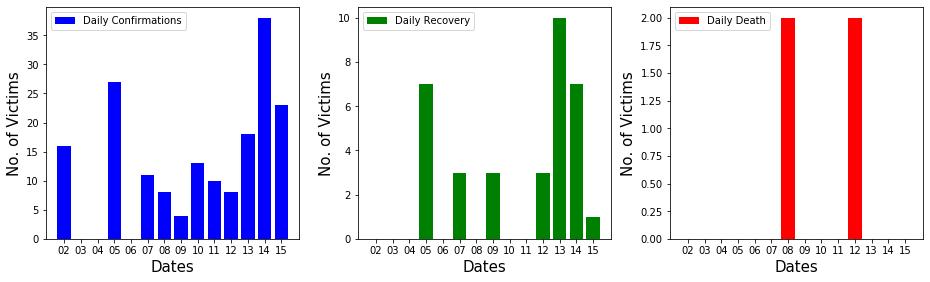

In [61]:
plt.figure(figsize = (13,4))

plt.subplot(1,3,1)
# plt.plot(westbengal_conf_date_list_splitted[-14:], westbengal_conf_list[-14:], color='blue', label="Daily Confirmations")
# plt.scatter(westbengal_conf_date_list_splitted[-14:], westbengal_conf_list[-14:], color='black')
plt.bar(westbengal_conf_date_list_splitted[-day_range:], westbengal_conf_list[-day_range:], color='blue', label="Daily Confirmations")
plt.legend()
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.tight_layout(1)

plt.subplot(1,3,2)
plt.bar(westbengal_conf_date_list_splitted[-day_range:], westbengal_rec_list[-day_range:], color='green', label="Daily Recovery")
plt.legend()
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.tight_layout(1)

plt.subplot(1,3,3)
plt.bar(westbengal_conf_date_list_splitted[-day_range:], westbengal_death_list[-day_range:], color='red', label="Daily Death")
plt.legend()
plt.xlabel('Dates', fontsize=15)
plt.ylabel('No. of Victims', fontsize=15)
plt.tight_layout(1)

plt.savefig('westbengal.png')

# HTML

In [62]:
state_intro = """
<!DOCTYPE html>
<html lang="en" align="center">
<html>
   <h1>
      <title>Insights of Covid'19 in India</title>
   </h1>
   <body>
       <h1><font size="10"><u>Insights of Covid'19 in India</u></font></h1>
       <h3>
"""

v = open("state_intro.html","w")
v.write(state_intro)
v.close()

In [63]:
state_body = """
    </h3>
    <body>
       <br>Get the live information about the Novel Corona Virus spread in India. <br />
       <br>Click <a href="https://telegra.ph/Data-Sources-for-Covidtracker-indiaml-04-05"> here</a> to get the list of the data source.
   </body>
   <h3>
   </h3>
"""

f = open("state_body.html","w")
f.write(state_body)
f.close()

In [64]:
icmr_intro = """
<br>
<br>
   <h2>
      <u>Data of last 14 days from the tests conducted by Indian Council of Medical Research(ICMR)</u>
   </h2>
"""

l = open("icmr_intro.html","w")
l.write(icmr_intro)
l.close()

In [65]:
icmr_stat = """
    <body>
        <br><img src="ICMR_stat.png" alt="ICMR Stat"/>
    </body>
"""

w = open("icmr_stat.html","w")
w.write(icmr_stat)
w.close()

In [66]:
future_prediction_intro = """
<h2><u>Predicting the Future of India using Artifitial Intelligence</u></h2>
<body>
    <b>The below predictions are completely based on the daily data of confirmed cases from Media & Govt. Websites and the data from ICMR.
    <br>Advanced Deep Learning algorithms are providing the information of the future.</b>
</body>
<br>
<br>
"""

fpi = open("future_prediction_intro.html","w")
fpi.write(future_prediction_intro)
fpi.close()

In [67]:
future_prediction_body = """
<body>
    <br>The above prediction using the data from ICMR is based on time but now, predicting the Total Number of Confirmations based on Total number of samples tested.
    <br>Using the data from ICMR, a linear statistical model is predicting the number of confirmations in India based on Total Number of Samples Tested.
    <br>The predictions are made by considering the current situation & the number of test samples doesnot change drastically with respect to time.
    <br>
    <br>If ICMR tests <b>""" + str(test_world[0]) + """</b> samples, then India may have approximately <b>""" + str(y_pred[0]) + """</b> confirmed cases, compared to <b>""" + str(location[0]) + """</b> which has approximately <b>""" + str(conf_world[0]) + """</b> confirmed cases.
    <br>If ICMR tests <b>""" + str(test_world[1]) + """</b> samples, then India may have approximately <b>""" + str(y_pred[1]) + """</b> confirmed cases, compared to <b>""" + str(location[1]) + """</b> which has approximately <b>""" + str(conf_world[1]) + """</b> confirmed cases.
    <br>If ICMR tests <b>""" + str(test_world[2]) + """</b> samples, then India may have approximately <b>""" + str(y_pred[2]) + """</b> confirmed cases, compared to <b>""" + str(location[2]) + """</b> which has approximately <b>""" + str(conf_world[2]) + """</b> confirmed cases.
    <br>If ICMR tests <b>""" + str(test_world[3]) + """</b> samples, then India may have approximately <b>""" + str(y_pred[3]) + """</b> confirmed cases, compared to <b>""" + str(location[3]) + """</b> which has approximately <b>""" + str(conf_world[3]) + """</b> confirmed cases.
    <br>
    <br>From these above predictions, let's have a look at how good or bad India is fighting against The Novel Corona Virus.
    <br>
    <br><img src="compare.png" alt="Comparison"/>
</body>
"""

ai_body = open("future_prediction_body.html","w")
ai_body.write(future_prediction_body)
ai_body.close()

In [68]:
state_stat_intro = """
<br>
    <h2>
      <u>Real Time Analysis of the trend of Covid'19 spread in India using the data of last 14 days</u>
    </h2>
"""

o = open("state_stat_intro.html","w")
o.write(state_stat_intro)
o.close()

In [69]:
state_stat = """
    <body>
      <br><img src="plot1.png" alt="Different Scale"/>
      <img src="plot2.png" alt="Normalized Scale"/>
   </body>
"""

g = open("state_stat.html","w")
g.write(state_stat)
g.close()

In [70]:
wb_intro = """
<br>
<br>
    <h1>
        <u>Effects of Covid'19 in West Bengal</u>
    </h1>
"""
h = open("wb_intro.html","w")
h.write(wb_intro)
h.close()

In [71]:
wb_stat = """
    <h2>
        <br><u>Analysing the trend of Covid'19 in West Bengal using the data of last 14 days</u>
        <br><img src="westbengal.png" alt="West Bengal"/>
    </h2>
"""

q = open("wb_stat.html","w")
q.write(wb_stat)
q.close()

In [72]:
end = """
    <p>
        Copyright 2020. 
        All rights reserved.
        Made by <a href="https://github.com/sudo-rajarshi">Rajarshi Bhadra</a>
    </p>
</html> 
"""
e = open("end.html","w")
e.write(end)
e.close()

In [73]:
now = datetime.now()
dt_string = now.strftime("%d/%m/%Y at %H:%M:%S")

with open('state_intro.html') as fp: 
    data1 = fp.read()

with open('state_body.html') as fp: 
    data2 = fp.read() 
    data2 = data2[:103] + '<br>Last updated on ' + str(dt_string) + data2[103:]
    
with open('total_data.html') as fp: 
    data3 = fp.read() 
    data3 = data3[:35] + str(' align="center"') + data3[35:]
    
with open('State_data.html') as fp: 
    data4 = fp.read() 
    data4 = "\n<br>\n" + data4[:35] + str(' align="center"') + data4[35:]
  
with open('icmr_intro.html') as fp:
    data5 = fp.read()
    
with open('ICMR_report_data.html') as fp:
    data6 = fp.read()
    data6 = data6[:35] + str(' align="center"') + data6[35:]
    
with open('icmr_stat.html') as fp:
    data7 = fp.read()
        
with open('state_stat_intro.html') as fp: 
    data8 = fp.read() 
    
with open('daily_data.html') as fp: 
    data9 = fp.read() 
    data9 = data9[:35] + str(' align="center"') + data9[35:]

with open('state_stat.html') as fp:
    data10 = fp.read()
    
with open('future_prediction_intro.html') as fp:
    data11 = fp.read()
    
with open('pred_icmr_ts.html') as fp: 
    data12 = fp.read() 
    data12 = data12[:35] + str(' align="center"') + data12[35:]
    
with open('future_prediction_body.html') as fp:
    data13 = fp.read()

with open('wb_intro.html') as fp:
    data14 = fp.read()

with open('wb_state_data.html') as fp:
    data15 = fp.read()
    data15 = data15[:35] + str(' align="center"') + data15[35:]

with open('wb_data.html') as fp:
    data16 = fp.read()
    data16 = "\n<br>\n" + data16[:35] + str(' align="center"') + data16[35:]

with open('wb_stat.html') as fp:
    data17 = fp.read()
    
with open('end.html') as fp:
    end_data = fp.read()

    
data = data1 + data2 + data3 + data4 + data5 + data6 + data7 + data8 + data9 + data10 + data11 + data12 + data13 + end_data
  
with open ('index.html', 'w') as fp: 
    fp.write(data) 

# Check for Errors:

### Confirmation of State data and Total Data

In [74]:
# Confirmed
if np.sum(confirmed_list[1:]) == np.sum(confirmed_list[0]):
    print(True)
else:
    print(np.sum(confirmed_list[1:]))
    print(np.sum(confirmed_list[0]))

# Active
if np.sum(active[1:]) == np.sum(active[0]):
    print(True)
else:
    print(np.sum(active[1:]))
    print(np.sum(active[0]))

# Recovered
if np.sum(recovered_list[1:]) == np.sum(recovered_list[0]):
    print(True)
else:
    print(np.sum(recovered_list[1:]))
    print(np.sum(recovered_list[0]))    

# Death
if np.sum(deaths_list[1:]) == np.sum(deaths_list[0]):
    print(True)
else:
    print(np.sum(deaths_list[1:]))
    print(np.sum(deaths_list[0]))    

True
True
True
True


### Confirmation Check bewtween State Data, Total Data & Daily Data

In [75]:
# Confirmed
if totalconfirmed_list[-2] + dailyconfirmed_list[-1] == totalconfirmed_list[-1]:
    print(True)
else:
    print(totalconfirmed_list[-2] + dailyconfirmed_list[-1])
    print(totalconfirmed_list[-1])

if totalconfirmed_list[-1] == confirmed_list[0]:
    print(True)
else:
    print(totalconfirmed_list[-1])
    print(confirmed_list[0])

# Recovered
if totalrecovered_list[-2] + dailyrecovered_list[-1] == totalrecovered_list[-1]:
    print(True)
else:
    print(totalrecovered_list[-2] + dailyrecovered_list[-1])
    print(totalrecovered_list[-1])

if totalrecovered_list[-1] == recovered_list[0]:
    print(True)
else:
    print(totalconfirmed_list[-1])
    print(confirmed_list[0])

# Death
if totaldeceased_list[-2] + dailydeceased_list[-1] == totaldeceased_list[-1]:
    print(True)
else:
    print(totaldeceased_list[-2] + dailyconfirmed_list[-1])
    print(totaldeceased_list[-1])

if totaldeceased_list[-1] == deaths_list[0]:
    print(True)
else:
    print(totaldeceased_list[-1])
    print(deaths_list[0])

True
True
True
True
True
True


### West Bengal Data

In [76]:
# Confirmed
if np.sum(westbengal_conf_list) == confirmed_list[15]:
    print(True)
else:
    print(np.sum(westbengal_conf_list))
    print(confirmed_list[15])

# Recovery
if np.sum(westbengal_rec_list) == recovered_list[15]:
    print(True)
else:
    print(np.sum(westbengal_rec_list))
    print(recovered_list[15])

# Death
if np.sum(westbengal_death_list) == deaths_list[15]:
    print(True)
else:
    print(np.sum(westbengal_death_list))
    print(deaths_list[15])

213
186
37
27
7
13
